In [1]:
import numpy as np
import soundfile as sf
import pyroomacoustics as pra
import os
from scipy.io import wavfile
import matplotlib.pyplot as plt
import pandas as pd
import csv
import torchaudio
import random
import math

In [21]:
random.seed(42)
data_dir = 'data_speech_commands_v0.02/'
folder_list = os.listdir(data_dir)
wav_file = []
for path in folder_list:
    f_path = os.path.join(data_dir, path)
    file_in_dir = os.listdir(f_path)
    for wav in file_in_dir:
        file_list = os.path.join(f_path, wav)
        if file_list[-3:] == 'wav':    
            wav_file.append(file_list)       
print(len(wav_file))

random.shuffle(wav_file)

105829


In [22]:
count = 0
for name in os.listdir('background_noise'):
    sg, sr = torchaudio.load('background_noise/' + name)
    sg = sg[:, :16000 * (sg.shape[1] // 16000)]
    sg = sg.view(-1, 16000)
    for i in range(len(sg)):
        torchaudio.save('background/' + 'bg_' + str(count) + '.wav', sg[i:i+1], sample_rate=16000)
        #print(sg[i:i+1].shape)
        count += 1
#x_sg, sr = torchaudio.load('test.wav')

In [23]:
pdWav = pd.DataFrame(wav_file, columns=['filename'])
# 일부러 3500개만 사용 일단은..
target_paths = pdWav[pdWav['filename'].str.contains('yes')][:3500]
target_paths.reset_index(inplace=True)
interf_paths = pdWav[~pdWav['filename'].str.contains('yes')]
interf_paths.reset_index(inplace=True)
noise_paths = []
for name in os.listdir('background/'):
    fpath = os.path.join('background', name)
    noise_paths.append(fpath)
noise_paths = pd.DataFrame(noise_paths, columns=['filename'])
noise_paths.reset_index(inplace=True)

len_target = len(target_paths)
len_interf = len(interf_paths)
len_noise = len(noise_paths)

print(len(target_paths), len(interf_paths), len(noise_paths))

3500 101785 398


In [20]:
target_paths

,index,filename
0,6,data_speech_commands_v0.02/yes/3d53244b_nohash...
1,81,data_speech_commands_v0.02/yes/fb727898_nohash...
2,85,data_speech_commands_v0.02/yes/067f61e2_nohash...
3,110,data_speech_commands_v0.02/yes/42a99aec_nohash...
4,125,data_speech_commands_v0.02/yes/472b8045_nohash...
...,...,...
3495,91648,data_speech_commands_v0.02/yes/c8771f88_nohash...
3496,91743,data_speech_commands_v0.02/yes/093f65a1_nohash...
3497,91789,data_speech_commands_v0.02/yes/24694eb6_nohash...
3498,91806,data_speech_commands_v0.02/yes/833d9f56_nohash...


In [24]:
target_paths

,index,filename
0,6,data_speech_commands_v0.02/yes/3d53244b_nohash...
1,81,data_speech_commands_v0.02/yes/fb727898_nohash...
2,85,data_speech_commands_v0.02/yes/067f61e2_nohash...
3,110,data_speech_commands_v0.02/yes/42a99aec_nohash...
4,125,data_speech_commands_v0.02/yes/472b8045_nohash...
...,...,...
3495,91648,data_speech_commands_v0.02/yes/c8771f88_nohash...
3496,91743,data_speech_commands_v0.02/yes/093f65a1_nohash...
3497,91789,data_speech_commands_v0.02/yes/24694eb6_nohash...
3498,91806,data_speech_commands_v0.02/yes/833d9f56_nohash...


In [9]:
def callback_mix(premix, snr=0, sir=0, ref_mic=0, n_src=None, n_tgt=None):

        # first normalize all separate recording to have unit power at microphone one
        p_mic_ref = np.std(premix[:,ref_mic,:], axis=1)
        premix /= p_mic_ref[:,None,None]

        # now compute the power of interference signal needed to achieve desired SIR
        sigma_i = np.sqrt(10 ** (- sir / 10) / (n_src - n_tgt))
        premix[n_tgt:n_src,:,:] *= sigma_i

        # compute noise variance
        sigma_n = np.sqrt(10 ** (- snr / 10))

        # Mix down the recorded signals
        mix = np.sum(premix[:n_src,:], axis=0) + sigma_n * np.random.randn(*premix.shape[1:])

        return mix  

In [10]:
csv_file = 'newData2.csv'
for count in range(1, 50001):
    # Randomly
    coff_noTarg = random.sample(range(2), 1)[0]
    coff_noInterf = random.sample(range(3), 1)[0]
    coff_twoInterf = random.sample(range(3), 1)[0]
    coff_noise = random.sample(range(5), 1)[0]

    """
    coff_noTarg = 0
    coff_noInterf = 0
    coff_noise = 0
    """

    no_target = 1 if coff_noTarg == 0 else 0
    no_interf = 1 if coff_noInterf == 0 else 0
    two_interf = 1 if coff_twoInterf > 0 else 0
    noise = 1 if coff_noise > 0 else 0

    if no_target and no_interf:
        no_interf = 0

    # Make list
    room_dims = [[3, 3, 2.5], [8, 10, 6], [6, 8, 3], [3, 7, 3], [8, 5, 4], [10, 7.5, 3.5]]
    rt60s = [0.3, 0.4, 0.5, 0.6]

    if not no_target:
        idx = random.sample(range(len_target), 1)[0]
        target_path = target_paths.loc[idx]['filename']
    else:
        if two_interf:
            idx = random.sample(range(len_interf), 1)[0]
            inter2_path = interf_paths.loc[idx]['filename']

    if not no_interf:
        idx = random.sample(range(len_interf), 1)[0]
        inter1_path = interf_paths.loc[idx]['filename']

    if noise:
        idx = random.sample(range(len_noise), 1)[0]
        noise_path = noise_paths.loc[idx]['filename']

    # Load target, interference and noise signal
    if not no_target:
        _, target_audio = wavfile.read(target_path)
    else:
        if two_interf:
            _, inter_2_audio = wavfile.read(inter2_path)

    if not no_interf:
        _, inter_1_audio = wavfile.read(inter1_path)
    if noise:
        _, noise_audio = wavfile.read(noise_path)


    ### Set up the room and source ###
    rd_coeff = random.sample(range(6), 1)[0]
    rt_coeff = random.sample(range(4), 1)[0]

    room_dim = room_dims[rd_coeff]
    rt60 = rt60s[rt_coeff]

    # We invert Sabine's formula to obtain the parameters for the ISM simulator
    e_absorption, max_order = pra.inverse_sabine(rt60, room_dim)

    room = pra.ShoeBox(
        room_dim, fs=16000, materials=pra.Material(e_absorption), max_order=max_order,
        use_rand_ism = True, max_rand_disp = 0.05
    )

    mic_locs = np.c_[
        [-0.02315, 0.04009,0],
        [0.02315, 0.04009,0],
        [0.04629, 0.0,0],
        [0.02315,-0.04009,0],
        [-0.02315,-0.04009,0],
        [-0.04629, 0.0,0],
    ]

    x = (np.random.random_sample() * room_dim[0])
    y = (np.random.random_sample() * room_dim[1])
    z = (np.random.random_sample() * 2) + 0.5

    if x < 0.2:
        x = 0.2
    elif x > room_dim[0]:
        x = room_dim[0] - 0.2

    if y < 0.2:
        y = 0.2
    elif y > room_dim[1]:
        y = room_dim[1] - 0.2


    mic_mid = [x, y, z]
    mic_locs[0, :] = mic_locs[0, :] + mic_mid[0]
    mic_locs[1, :] = mic_locs[1, :] + mic_mid[1]
    mic_locs[2, :] = mic_locs[2, :] + mic_mid[2]


    room.add_microphone_array(mic_locs)

    x = (np.random.random_sample() * room_dim[0])
    y = (np.random.random_sample() * room_dim[1])
    z = (np.random.random_sample() * 2) + 0.5

    if x < 0.2:
        x = 0.2
    elif x > room_dim[0]:
        x = room_dim[0] - 0.2

    if y < 0.2:
        y = 0.2
    elif y > room_dim[1]:
        y = room_dim[1] - 0.2

    if not no_target:
        target_loc = [x, y, z]
        room.add_source(target_loc, signal=target_audio)
    else:
        if two_interf:
            inter_2_loc = [x, y, z]
            room.add_source(inter_2_loc, signal=inter_2_audio)

    if x < 0.2:
        x = 0.2
    elif x > room_dim[0]:
        x = room_dim[0] - 0.2

    if y < 0.2:
        y = 0.2
    elif y > room_dim[1]:
        y = room_dim[1] - 0.2

    x = (np.random.random_sample() * room_dim[0])
    y = (np.random.random_sample() * room_dim[1])
    z = (np.random.random_sample() * 2) + 0.5
    if not no_interf:
        inter_1_loc = [x, y, z]
        room.add_source(inter_1_loc, signal=inter_1_audio)

    if noise:
        if x < 0.2:
            x = 0.2
        elif x > room_dim[0]:
            x = room_dim[0] - 0.2

        if y < 0.2:
            y = 0.2
        elif y > room_dim[1]:
            y = room_dim[1] - 0.2
        x = (np.random.random_sample() * room_dim[0])
        y = (np.random.random_sample() * room_dim[1])
        z = (np.random.random_sample() * 2) + 0.2
        noise_loc = [x, y, z]
        room.add_source(noise_loc, signal=noise_audio)  

    # Run the simulation (this will also build the RIR automatically)
    # the extra arguments are given in a dictionary

    sir = random.randint(-15, 20)
    
    nsrc = 0
    if not no_target:
        nsrc += 1
    else:
        if two_interf:
            nsrc += 1
    if not no_interf:
        nsrc += 1
    if noise:
        nsrc += 1
    
    callback_mix_kwargs = {
        'snr' : 30,  # SNR target is 30 decibels
        'sir' : sir,  # SIR target is 10 decibels
        'n_src' : nsrc,
        'n_tgt' : 1,
        'ref_mic' : 0,
    }

    if not no_target and nsrc >= 2:
        room.simulate(
                callback_mix=callback_mix,
                callback_mix_kwargs=callback_mix_kwargs,
                )
    else:
        room.simulate()

    room.mic_array.signals = room.mic_array.signals[:, :16000]

    print(room_dim, sir)
    #plt.axis((0, room_dim[0], 0, room_dim[1]))
    #plt.scatter(mic_locs[0,:], mic_locs[1, :])

    if not no_target:
        #plt.scatter(target_loc[0], target_loc[1], c='red')
        target_angle = math.atan2(target_loc[1] - mic_mid[1], target_loc[0] - mic_mid[0]) * 180 / np.pi
        if target_angle < 0:
            target_angle = 360 + target_angle
    else:
        target_angle = '-'

    if not no_interf:
        #plt.scatter(inter_1_loc[0], inter_1_loc[1], c='blue')
        inter1_angle = math.atan2(inter_1_loc[1] - mic_mid[1], inter_1_loc[0] - mic_mid[0]) * 180 / np.pi
        if inter1_angle < 0:
            inter1_angle = 360 + inter1_angle
    else:
        inter1_angle = '-'

    if no_target and two_interf:
        #plt.scatter(inter_2_loc[0], inter_2_loc[1], c='orange')
        inter2_angle = math.atan2(inter_2_loc[1] - mic_mid[1], inter_2_loc[0] - mic_mid[0]) * 180 / np.pi
        if inter2_angle < 0:
            inter2_angle = 360 + inter2_angle
    else:
        inter2_angle = '-'

    if noise:
        #plt.scatter(noise_loc[0], noise_loc[1], c='green')
        noise_angle = math.atan2(noise_loc[1] - mic_mid[1], noise_loc[0] - mic_mid[0]) * 180 / np.pi
        if noise_angle < 0:
            noise_angle = 360 + noise_angle
    else:
        noise_angle = '-'

    fileName = f'newData2/{count}_sample.wav'
    room.mic_array.to_wav(
        fileName,
        norm=False,
        bitdepth=np.int16,
    )
    csv_content = [count, fileName,
                   target_angle, inter1_angle,
                   inter2_angle, noise_angle,
                   sir, room_dim, nsrc]
    
    with open(csv_file, 'a', newline='') as csvfile:
        spamwriter = csv.writer(csvfile, delimiter=',')
        spamwriter.writerow(csv_content)
        
    print(no_target, no_interf, two_interf, noise)
    print(target_angle, inter1_angle, inter2_angle, noise_angle)

[6, 8, 3] -9


NameError: name 'math' is not defined

In [208]:
def callback_mix(premix, snr=0, sir=0, ref_mic=0, n_src=None, n_tgt=None):

    # first normalize all separate recording to have unit power at microphone one
    print(premix.shape)
    p_mic_ref = np.std(premix[:,ref_mic,:], axis=1)
    premix /= p_mic_ref[:,None,None]

    # now compute the power of interference signal needed to achieve desired SIR
    sigma_i = np.sqrt(10 ** (- sir / 10) / (n_src - n_tgt))
    premix[n_tgt:n_src,:,:] *= sigma_i

    # compute noise variance
    sigma_n = np.sqrt(10 ** (- snr / 10))

    # Mix down the recorded signals
    mix = np.sum(premix[:n_src,:], axis=0) + sigma_n * np.random.randn(*premix.shape[1:])
    print("Mix", mix.shape)
    return mix  

In [8]:
csv_file = 'newData3.csv'
for count in range(100000):
    # Randomly
    coff_noTarg = random.sample(range(2), 1)[0]
    coff_noInterf = random.sample(range(3), 1)[0]
    coff_twoInterf = random.sample(range(3), 1)[0]
    coff_noise = random.sample(range(5), 1)[0]

    no_target = 1 if coff_noTarg == 0 else 0
    no_interf = 1 if coff_noInterf == 0 else 0
    two_interf = 1 if coff_twoInterf > 0 else 0
    noise = 1 if coff_noise > 0 else 0

    if no_target and no_interf:
        no_interf = 0

    # Make list
    room_dims = [[3, 3, 2.5], [8, 10, 6], [6, 8, 3], [3, 7, 3], [8, 5, 4], [10, 7.5, 3.5]]
    rt60s = [0.3, 0.4, 0.5, 0.6]

    if not no_target:
        idx = random.sample(range(len_target), 1)[0]
        target_path = target_paths.loc[idx]['filename']
    else:
        if two_interf:
            idx = random.sample(range(len_interf), 1)[0]
            inter2_path = interf_paths.loc[idx]['filename']

    if not no_interf:
        idx = random.sample(range(len_interf), 1)[0]
        inter1_path = interf_paths.loc[idx]['filename']

    if noise:
        idx = random.sample(range(len_noise), 1)[0]
        noise_path = noise_paths.loc[idx]['filename']

    # Load target, interference and noise signal
    if not no_target:
        _, target_audio = wavfile.read(target_path)
    else:
        if two_interf:
            _, inter_2_audio = wavfile.read(inter2_path)

    if not no_interf:
        _, inter_1_audio = wavfile.read(inter1_path)
    if noise:
        _, noise_audio = wavfile.read(noise_path)

    ### Set up the room and source ###
    rd_coeff = random.sample(range(6), 1)[0]
    rt_coeff = random.sample(range(4), 1)[0]

    room_dim = room_dims[rd_coeff]
    rt60 = rt60s[rt_coeff]

    # We invert Sabine's formula to obtain the parameters for the ISM simulator
    e_absorption, max_order = pra.inverse_sabine(rt60, room_dim)

    room = pra.ShoeBox(
        room_dim, fs=16000, materials=pra.Material(e_absorption), max_order=max_order,
        use_rand_ism = True, max_rand_disp = 0.05
    )

    mic_locs = np.c_[
        [-0.02315, 0.04009,0],
        [0.02315, 0.04009,0],
        [0.04629, 0.0,0],
        [0.02315,-0.04009,0],
        [-0.02315,-0.04009,0],
        [-0.04629, 0.0,0],
    ]

    x = (np.random.random_sample() * room_dim[0])
    y = (np.random.random_sample() * room_dim[1])
    z = (np.random.random_sample() * 2) + 0.5

    if x < 0.2:
        x = 0.2
    elif x > room_dim[0]:
        x = room_dim[0] - 0.2

    if y < 0.2:
        y = 0.2
    elif y > room_dim[1]:
        y = room_dim[1] - 0.2


    mic_mid = [x, y, z]
    mic_locs[0, :] = mic_locs[0, :] + mic_mid[0]
    mic_locs[1, :] = mic_locs[1, :] + mic_mid[1]
    mic_locs[2, :] = mic_locs[2, :] + mic_mid[2]


    room.add_microphone_array(mic_locs)
    x = (np.random.random_sample() * 6) - 3 + mic_mid[0]
    y = (np.random.random_sample() * 6) - 3 + mic_mid[1]
    z = (np.random.random_sample() * 2) + 0.5

    if x < 0.2:
        x = 0.2
    elif x > room_dim[0]:
        x = room_dim[0] - 0.2

    if y < 0.2:
        y = 0.2
    elif y > room_dim[1]:
        y = room_dim[1] - 0.2

    if not no_target:
        target_loc = [x, y, z]
        room.add_source(target_loc, signal=target_audio)
    else:
        if two_interf:
            inter_2_loc = [x, y, z]
            room.add_source(inter_2_loc, signal=inter_2_audio)


    x = (np.random.random_sample() * 6) - 3 + mic_mid[0]
    y = (np.random.random_sample() * 6) - 3 + mic_mid[1]
    z = (np.random.random_sample() * 2) + 0.5
    
    if x < 0.2:
        x = 0.2
    elif x > room_dim[0]:
        x = room_dim[0] - 0.2

    if y < 0.2:
        y = 0.2
    elif y > room_dim[1]:
        y = room_dim[1] - 0.2
        
    if not no_interf:
        inter_1_loc = [x, y, z]
        room.add_source(inter_1_loc, signal=inter_1_audio)

    if noise:
        x = (np.random.random_sample() * 6) - 3 + mic_mid[0]
        y = (np.random.random_sample() * 6) - 3 + mic_mid[1]
        z = (np.random.random_sample() * 2) + 0.5
        if x < 0.2:
            x = 0.2
        elif x > room_dim[0]:
            x = room_dim[0] - 0.2

        if y < 0.2:
            y = 0.2
        elif y > room_dim[1]:
            y = room_dim[1] - 0.2
        noise_loc = [x, y, z]
        room.add_source(noise_loc, signal=noise_audio)  

    # Run the simulation (this will also build the RIR automatically)
    # the extra arguments are given in a dictionary

    sir = random.randint(-15, 20)
    
    nsrc = 0
    if not no_target:
        nsrc += 1
    else:
        if two_interf:
            nsrc += 1
    if not no_interf:
        nsrc += 1
    if noise:
        nsrc += 1
    
    callback_mix_kwargs = {
        'sir' : sir,  # SIR target is 10 decibels
        'n_tgt' : 0,
        'ref_mic' : 0,
    }
    """
    callback_mix_kwargs = {
        'snr' : 30,  # SNR target is 30 decibels
        'sir' : 10,  # SIR target is 10 decibels
        'n_src' : 3,
        'n_tgt' : 0,
        'ref_mic' : 0,
    }
    """
    if not no_target and nsrc >= 2:
        premix = room.simulate(
                callback_mix=adjust_signals,
                callback_mix_kwargs=callback_mix_kwargs,
                return_premix=True
                )
        print("here")
    else:
        room.simulate()

    room.mic_array.signals = room.mic_array.signals[:, :16000]

    print(room_dim, sir)
    #plt.axis((0, room_dim[0], 0, room_dim[1]))
    #plt.scatter(mic_locs[0,:], mic_locs[1, :])

    if not no_target:
        #plt.scatter(target_loc[0], target_loc[1], c='red')
        target_angle = math.atan2(target_loc[1] - mic_mid[1], target_loc[0] - mic_mid[0]) * 180 / np.pi
        if target_angle < 0:
            target_angle = 360 + target_angle
    else:
        target_angle = '-'

    if not no_interf:
        #plt.scatter(inter_1_loc[0], inter_1_loc[1], c='blue')
        inter1_angle = math.atan2(inter_1_loc[1] - mic_mid[1], inter_1_loc[0] - mic_mid[0]) * 180 / np.pi
        if inter1_angle < 0:
            inter1_angle = 360 + inter1_angle
    else:
        inter1_angle = '-'

    if no_target and two_interf:
        #plt.scatter(inter_2_loc[0], inter_2_loc[1], c='orange')
        inter2_angle = math.atan2(inter_2_loc[1] - mic_mid[1], inter_2_loc[0] - mic_mid[0]) * 180 / np.pi
        if inter2_angle < 0:
            inter2_angle = 360 + inter2_angle
    else:
        inter2_angle = '-'

    if noise:
        #plt.scatter(noise_loc[0], noise_loc[1], c='green')
        noise_angle = math.atan2(noise_loc[1] - mic_mid[1], noise_loc[0] - mic_mid[0]) * 180 / np.pi
        if noise_angle < 0:
            noise_angle = 360 + noise_angle
    else:
        noise_angle = '-'
    
    fileName = f'newData3/{count}_sample.wav'
    room.mic_array.to_wav(
        fileName,
        norm=False,
        bitdepth=np.int16,
    )
    
    csv_content = [count, fileName,
                   target_angle, inter1_angle,
                   inter2_angle, noise_angle,
                   sir, room_dim, nsrc]
    
    with open(csv_file, 'a', newline='') as csvfile:
        spamwriter = csv.writer(csvfile, delimiter=',')
        spamwriter.writerow(csv_content)
    
    print(no_target, no_interf, two_interf, noise)
    print(target_angle, inter1_angle, inter2_angle, noise_angle)

[6, 8, 3] 0
1 0 0 1
- 16.02456706008646 - 236.52923532476956
here
[3, 7, 3] -5
0 0 1 1
278.7360097285759 254.95228619945465 - 298.4525763648044
[3, 3, 2.5] -13
1 0 0 1
- 116.22367758752215 - 52.3749689487408
[6, 8, 3] 2
1 0 1 1
- 309.63918455364956 24.140207840888934 330.35209599771497
here
[8, 5, 4] 8
0 1 1 1
262.75530198510626 - - 126.99638120510272
here
[3, 3, 2.5] 13
0 0 0 1
187.27779201705923 359.6477769412572 - 327.88629223162883
[8, 10, 6] 5
1 0 1 1
- 140.85259644794445 162.48845096751555 317.62670959841887
here
[3, 3, 2.5] 18
0 0 1 0
198.25034669588945 185.80840157133375 - -
here
[3, 7, 3] -13
0 1 1 1
359.60608605374284 - - 180.89762477976353
here
[3, 7, 3] 11
0 1 0 1
99.66587297835162 - - 197.16689390278236
here
[3, 7, 3] -11
0 1 1 1
57.899542327628154 - - 250.98206222102755
here
[3, 3, 2.5] 16
0 1 1 1
303.73078525962455 - - 179.11044657232068
here
[6, 8, 3] 20
0 1 1 1
15.528442460815523 - - 51.41156655457199
here
[6, 8, 3] 7
0 0 0 1
192.2138046286673 351.91442731588813 - 68.9

[3, 7, 3] -8
1 0 1 1
- 238.7697384812177 248.1467098113137 43.41693135729071
[3, 7, 3] 5
1 0 1 0
- 15.922487619167102 355.03423676329714 -
[8, 10, 6] -3
1 0 1 1
- 302.17320714373614 12.463157647996939 233.65598744863382
[8, 5, 4] 3
1 0 0 1
- 212.83936539845277 - 154.09892536298167
here
[6, 8, 3] 12
0 0 1 1
15.690586826618452 47.97274137419593 - 24.60597705975645
here
[8, 5, 4] 8
0 0 1 1
185.68767625981639 153.31691491687818 - 133.2283558455045
here
[3, 7, 3] 12
0 1 1 1
282.54256192937453 - - 284.25061134352137
[3, 7, 3] 5
1 0 0 1
- 3.7962997875945894 - 301.6908517352194
here
[10, 7.5, 3.5] 3
0 0 1 1
287.485144895909 289.5906519097973 - 283.5543834426044
[8, 5, 4] -7
1 0 1 1
- 347.2322161766755 53.12278409825027 132.022788388732
[6, 8, 3] -13
1 0 1 1
- 100.53840361279765 346.5695078040512 31.059020314072256
[3, 3, 2.5] 12
1 0 1 1
- 290.54197364426295 131.28761021147426 351.6208479268614
[3, 7, 3] 13
1 0 1 1
- 171.80524010624725 266.64105199377775 283.9059338205585
[6, 8, 3] 17
0 1 1 0
2

[8, 5, 4] -11
1 0 0 1
- 91.70947959117174 - 218.6814897282892
here
[3, 7, 3] 17
0 1 0 1
284.24799704257856 - - 276.84071483944297
[3, 3, 2.5] 15
1 0 0 0
- 73.27979982227497 - -
[10, 7.5, 3.5] -15
0 1 1 0
8.328441226307453 - - -
[3, 7, 3] -5
0 1 1 0
50.085183155343 - - -
here
[8, 5, 4] -2
0 0 1 1
17.468876767296575 134.403609557005 - 200.69716360474723
here
[10, 7.5, 3.5] -8
0 1 1 1
215.69305527321177 - - 257.2127385846169
here
[6, 8, 3] 0
0 0 1 1
244.482492972128 273.72964268393866 - 235.23839639635952
[8, 10, 6] 7
1 0 0 1
- 264.7448213766203 - 143.19221279274237
[3, 3, 2.5] -1
1 0 1 1
- 238.11839763656755 349.0325788400209 64.59178307398452
[10, 7.5, 3.5] -11
1 0 1 0
- 37.90207996068811 99.07649767160609 -
[3, 7, 3] -6
1 0 0 1
- 165.75286827576755 - 109.56120014744141
here
[3, 7, 3] 13
0 0 0 1
79.76186746252935 278.65973527982607 - 175.41790437541619
[10, 7.5, 3.5] 12
0 1 1 0
35.82622571148782 - - -
[8, 5, 4] -15
1 0 0 1
- 195.938576165671 - 343.03826689676544
here
[8, 5, 4] 14
0 0 1 

[8, 5, 4] -11
1 0 1 1
- 264.4237995263504 97.03402763872265 96.8528613960288
[10, 7.5, 3.5] 17
1 0 1 1
- 275.44079076171045 290.53823661049046 136.105744247526
here
[6, 8, 3] -9
0 1 1 1
99.03574785835558 - - 57.01399782759822
[3, 7, 3] 12
1 0 0 1
- 84.36636028201606 - 279.25416519873494
[3, 7, 3] 16
0 1 0 0
69.31461268737996 - - -
[6, 8, 3] -11
1 0 1 0
- 223.6180965878825 196.4137360644704 -
[6, 8, 3] -1
1 0 0 1
- 86.76498294994683 - 215.77142882974002
[8, 5, 4] -3
1 0 0 1
- 41.09898434509741 - 162.18835403952636
[3, 3, 2.5] -14
1 0 0 1
- 218.80314163016052 - 55.460960432928346
[6, 8, 3] 5
1 0 1 1
- 358.27234054241336 124.67090075310311 242.99872206705226
here
[3, 3, 2.5] 12
0 0 0 1
277.26045873331185 5.688725407615718 - 236.92271947091268
[3, 3, 2.5] 0
1 0 0 1
- 291.1605413220493 - 27.715685896539902
here
[3, 3, 2.5] 4
0 0 1 1
0.0 180.0 - 0.0
here
[10, 7.5, 3.5] 17
0 1 0 1
329.3157990877704 - - 337.2059617321669
here
[3, 3, 2.5] -5
0 0 0 1
196.61145205533995 258.0560858741819 - 227.91

here
[10, 7.5, 3.5] -9
0 1 1 1
127.47864264404218 - - 309.0950822233476
here
[6, 8, 3] 14
0 1 1 1
356.48459518998584 - - 350.9265851563394
here
[6, 8, 3] -10
0 0 1 1
312.8438135469596 25.842287649571126 - 185.39945437222957
here
[3, 7, 3] -6
0 0 1 1
143.29236281323804 127.08850603303668 - 37.84033484856513
[8, 10, 6] 5
1 0 1 1
- 169.8135552200487 340.46991520601813 277.05671840775364
[3, 3, 2.5] -13
1 0 1 1
- 240.89466635406131 240.89466635406131 118.0546191642667
here
[3, 3, 2.5] -9
0 0 1 1
172.073961588432 62.07180267659694 - 221.83490137721716
here
[6, 8, 3] -10
0 0 0 1
133.72607799454332 303.25611496644075 - 178.84212345964397
here
[3, 3, 2.5] 6
0 0 1 1
99.83650775152907 348.1071766723982 - 95.60777038867617
here
[8, 5, 4] -14
0 0 1 1
61.679972282344394 98.64682109657856 - 211.69990586202061
here
[8, 10, 6] -2
0 0 1 1
181.77222657315832 176.19762124170134 - 350.4552634863793
[8, 5, 4] -12
1 0 0 1
- 67.27631162114542 - 103.58752536598854
[6, 8, 3] 14
1 0 0 1
- 204.89590036550499 - 2

here
[6, 8, 3] 8
0 0 1 1
351.38249965379487 185.89522891282076 - 140.7667364487007
[8, 10, 6] 16
1 0 0 1
- 35.917531935842774 - 158.47169690739796
[10, 7.5, 3.5] -2
1 0 0 1
- 154.92649141652876 - 152.4235881914723
[8, 10, 6] -5
1 0 1 0
- 120.11375999079036 253.94033041122145 -
here
[3, 7, 3] -1
0 0 1 1
229.96566655765912 284.5175565139344 - 343.2248853755161
[8, 10, 6] -13
1 0 1 1
- 115.4368203020339 307.14751211677503 228.15084995040795
here
[8, 10, 6] 19
0 0 1 1
290.52121233601144 110.6453408021675 - 242.8994123606377
[10, 7.5, 3.5] -1
1 0 0 1
- 339.46067736014015 - 171.06940174867287
[8, 10, 6] -9
1 0 1 1
- 223.48258824837282 109.41353536812431 82.7731650113487
[10, 7.5, 3.5] 12
1 0 1 1
- 227.89285421140963 195.66454358884076 232.2705249853255
here
[3, 3, 2.5] -4
0 0 0 1
227.71335060371547 196.30911151045143 - 186.1732691549754
here
[10, 7.5, 3.5] -7
0 0 1 0
251.5813398881627 223.73432694674517 - -
here
[3, 7, 3] 16
0 0 0 1
149.6243066806547 162.20532714239172 - 247.67129160371516
[

[3, 3, 2.5] -8
1 0 1 1
- 238.71289374319912 266.43981547223547 186.23485638492477
here
[3, 3, 2.5] 13
0 0 1 0
95.73111792464424 188.43034840568006 - -
[3, 3, 2.5] -1
1 0 1 0
- 289.3682825700605 284.62412359342363 -
here
[6, 8, 3] 8
0 0 1 0
97.82347127864908 207.7316087049578 - -
[3, 7, 3] -12
1 0 0 1
- 91.8286604274399 - 260.28859688238447
here
[10, 7.5, 3.5] -11
0 0 0 1
272.09198539058434 358.1060928885502 - 336.33287444462303
[6, 8, 3] -2
1 0 0 1
- 84.46386251043647 - 230.72431896284445
[8, 10, 6] 14
1 0 0 1
- 151.8558003752689 - 136.803118513581
here
[6, 8, 3] 3
0 0 1 1
285.4471728347686 168.99951683774262 - 207.53695847875616
[10, 7.5, 3.5] 15
1 0 0 1
- 204.8158841311807 - 3.954772246396692
here
[8, 5, 4] 11
0 1 1 1
39.59342449267897 - - 137.26765414165496
[6, 8, 3] 13
1 0 0 1
- 300.88921812744053 - 253.24726619602637
[10, 7.5, 3.5] 2
1 0 1 0
- 359.56414324761744 182.21221818618108 -
[3, 3, 2.5] -3
0 1 1 0
124.29587437856888 - - -
here
[3, 7, 3] -7
0 1 1 1
270.0 - - 14.609189760024

here
[8, 10, 6] -10
0 1 0 1
179.55666951931488 - - 197.18994518205724
here
[8, 5, 4] 10
0 1 1 1
316.10462429032304 - - 169.07385048603453
[6, 8, 3] -7
1 0 1 1
- 207.35433792635862 93.01159027555812 308.95031913724915
[3, 7, 3] 4
1 0 1 1
- 121.51241125887388 91.98557086673364 256.74156656464
[3, 7, 3] -14
1 0 0 0
- 227.16390234809856 - -
here
[8, 10, 6] 17
0 1 1 1
297.29597373111477 - - 164.03162191042563
here
[8, 10, 6] -5
0 0 1 0
150.77966431397786 168.2227987278375 - -
[3, 3, 2.5] 7
1 0 0 0
- 276.50573142064076 - -
here
[3, 7, 3] -10
0 1 1 1
117.32926529765392 - - 92.69694635965186
here
[3, 7, 3] 17
0 0 0 1
287.9208932120615 4.962305949200769 - 108.20949113839718
here
[3, 7, 3] -6
0 0 1 1
259.0395393481424 67.41786851217375 - 100.24208037409483
[8, 10, 6] 17
1 0 0 1
- 170.6702970625509 - 305.50123792912683
[8, 5, 4] 1
1 0 1 1
- 116.18746051731068 41.434673771988535 216.61671398221668
[8, 10, 6] -1
1 0 1 1
- 40.338993614093944 243.4830381497169 54.70140306341655
[8, 5, 4] 3
1 0 1 1
- 

[10, 7.5, 3.5] 5
1 0 0 0
- 204.9373144723858 - -
[6, 8, 3] 7
1 0 1 1
- 313.85451662640384 305.5100795003647 333.23910044499263
here
[10, 7.5, 3.5] -15
0 0 1 1
136.4722790156579 349.43430434845567 - 206.7842521031129
[3, 3, 2.5] 20
1 0 1 1
- 129.13800237418081 251.78720181023408 317.0778249533563
[6, 8, 3] -15
1 0 1 1
- 312.04738483174265 214.54871442403513 82.55299228259084
[10, 7.5, 3.5] 3
1 0 0 0
- 88.55394314732008 - -
[3, 7, 3] -4
1 0 1 1
- 269.22926509279756 84.32138513312348 210.71727320162344
here
[3, 7, 3] -12
0 0 0 0
231.17732692489795 75.85951277472785 - -
[3, 7, 3] -11
1 0 0 0
- 238.70123081607034 - -
here
[8, 5, 4] 9
0 0 1 1
16.488483394955015 169.74758031969657 - 21.90129526610351
[10, 7.5, 3.5] 6
1 0 1 0
- 321.71316388099353 142.51342631332687 -
[3, 7, 3] 15
1 0 1 1
- 325.241563018378 110.85838471228367 260.6537523876103
[10, 7.5, 3.5] 3
1 0 1 1
- 325.5539985842085 356.0015667799813 225.37526936241096
here
[8, 10, 6] 12
0 1 1 1
197.0163564574985 - - 171.00023728877028
her

[8, 10, 6] 10
1 0 1 1
- 68.11561964327579 105.46597015663326 90.18656313785252
here
[3, 7, 3] 2
0 1 1 1
231.39912568320827 - - 180.21790403798778
here
[3, 7, 3] -5
0 0 0 1
180.0 180.0 - 180.0
here
[3, 3, 2.5] 1
0 0 0 1
111.61582936393377 47.186837496824765 - 128.7720784163047
here
[6, 8, 3] 2
0 0 1 1
75.14141108992222 90.0 - 82.05878752969178
[8, 5, 4] -3
1 0 1 1
- 47.83466188616108 30.32194823476267 176.1462046169397
[3, 7, 3] 8
1 0 1 1
- 193.2163447075405 353.3976500360432 212.2654600462824
here
[6, 8, 3] 20
0 0 0 1
117.69054020173836 44.8741592292029 - 146.5759297802571
here
[3, 7, 3] 8
0 0 1 1
297.0302348226027 340.5278036350454 - 35.15884433621994
[3, 7, 3] 12
1 0 0 1
- 270.0 - 270.0
here
[8, 10, 6] 4
0 0 0 1
162.35381645285844 88.34156947285946 - 85.83418146837417
[3, 3, 2.5] 6
1 0 1 1
- 359.6258713083068 130.71261669422609 319.5778685660294
here
[6, 8, 3] 9
0 0 1 1
39.13873761708099 49.02268151890893 - 93.76296758403856
here
[8, 5, 4] -8
0 0 1 1
350.04521985749983 80.69754697145

here
[6, 8, 3] -4
0 0 1 1
214.32194387639882 228.7311756034426 - 211.57939887045163
here
[10, 7.5, 3.5] 19
0 0 0 1
239.57267939615366 36.97335001902409 - 272.08427591070244
[3, 7, 3] 15
1 0 1 1
- 2.9132614347854586 189.04893203011443 351.3877268648296
here
[10, 7.5, 3.5] -6
0 0 1 1
200.8414988306226 176.90942700866069 - 71.52205921885374
[3, 3, 2.5] 8
1 0 0 0
- 125.9836662553998 - -
here
[3, 7, 3] 17
0 0 1 0
357.65647977441836 105.12221102958067 - -
[3, 3, 2.5] -15
1 0 0 1
- 30.30952723855592 - 51.494939420884634
here
[8, 5, 4] -6
0 0 0 1
101.61451302935211 204.99973562665113 - 267.4753251710147
[8, 5, 4] 8
1 0 1 1
- 335.62232704942176 343.59692989213795 97.17825083027981
here
[6, 8, 3] 12
0 0 0 1
219.74950498887364 193.41048489746203 - 46.1728248493634
here
[6, 8, 3] 14
0 0 1 1
0.0 0.0 - 176.2555407738523
[6, 8, 3] -3
1 0 1 1
- 260.86603082641517 242.12066237591773 0.15229786389900368
[8, 10, 6] 3
1 0 1 0
- 86.74728663546162 347.9260714310183 -
[8, 10, 6] -3
1 0 1 1
- 228.852585617394

[3, 3, 2.5] 15
1 0 0 0
- 14.210940103395334 - -
[6, 8, 3] 0
1 0 1 0
- 12.659378734067557 259.2736456473775 -
here
[6, 8, 3] 19
0 1 0 1
245.72518806263847 - - 173.4889759068831
[8, 5, 4] -14
1 0 1 1
- 124.3930646733252 290.2282101258556 96.26590519915315
here
[3, 7, 3] -10
0 0 0 1
307.09395039343167 16.775256675489217 - 120.21195793645386
[10, 7.5, 3.5] 12
0 1 0 0
231.2588018090935 - - -
[8, 5, 4] 17
1 0 1 1
- 82.49623247041684 86.01395339634493 248.09530885990495
here
[8, 10, 6] 16
0 0 1 1
198.9055769820714 281.89558929432536 - 248.4649855560764
[8, 10, 6] -9
1 0 1 1
- 316.06687433614366 120.36965281504035 112.38165755748278
[8, 10, 6] -10
1 0 1 1
- 297.2535496161192 75.07240037844791 324.1194524951566
here
[6, 8, 3] -12
0 1 1 1
256.6896968825022 - - 251.62643740503879
[8, 5, 4] 12
1 0 0 0
- 162.41217873593996 - -
[8, 10, 6] 7
1 0 1 1
- 309.99980002288635 139.79137024707902 326.4818623901861
here
[3, 7, 3] -11
0 1 1 1
286.6251313590624 - - 33.18864074379308
here
[6, 8, 3] 16
0 0 0 1
17

here
[8, 10, 6] -11
0 1 1 1
268.7218431628256 - - 267.9103294994805
here
[6, 8, 3] 3
0 0 1 1
90.0 53.70633627321663 - 275.72216882807277
here
[8, 5, 4] 12
0 0 1 1
265.52501641328314 157.62033066419912 - 157.04623837648757
[10, 7.5, 3.5] -15
1 0 1 1
- 185.42541148939532 342.05564361883256 66.62049889823882
here
[10, 7.5, 3.5] 17
0 0 1 1
0.0 135.3124950963897 - 129.62963707401016
[3, 7, 3] 1
1 0 1 0
- 7.875487157826327 184.99939932420824 -
here
[3, 7, 3] 16
0 0 1 1
189.74658377237708 28.309548934052035 - 285.17553146887616
here
[10, 7.5, 3.5] -13
0 0 1 0
165.90594982288937 94.52341000877043 - -
here
[3, 3, 2.5] -5
0 0 0 0
141.38961617164213 359.74040064809486 - -
[3, 3, 2.5] 16
1 0 1 1
- 225.87211392543804 48.752434414823135 141.00614003774194
here
[8, 10, 6] 17
0 1 1 1
0.16463759292419503 - - 282.72165745573625
here
[8, 10, 6] 1
0 0 1 1
9.936324859508936 159.44211302794162 - 170.80440041368584
[3, 3, 2.5] -15
1 0 0 1
- 135.05843867673053 - 41.976442250382654
here
[8, 10, 6] -15
0 0 1 1


[10, 7.5, 3.5] 17
1 0 1 1
- 187.01682586878735 125.5843908871441 193.58731078043488
here
[8, 5, 4] -10
0 0 0 0
215.68369833257228 72.63051952469635 - -
[10, 7.5, 3.5] 0
1 0 1 1
- 143.8363173564556 152.13876907083977 126.70159896506048
here
[10, 7.5, 3.5] 5
0 0 1 1
147.88015215271224 327.52338332773536 - 137.1183056091709
[8, 5, 4] 19
1 0 0 1
- 180.0 - 132.323771768776
here
[8, 5, 4] 17
0 1 1 1
71.82952992680947 - - 303.5189023101217
here
[3, 7, 3] 17
0 1 0 1
93.81292885761795 - - 130.26631606948808
here
[8, 10, 6] -6
0 0 1 1
317.8471427827424 148.1072248960155 - 94.7401048147856
here
[8, 5, 4] 11
0 1 0 1
44.151301746032445 - - 225.20448977362136
[10, 7.5, 3.5] 14
1 0 0 1
- 310.3633496190575 - 319.91204406267207
[8, 5, 4] -10
1 0 1 1
- 191.49300042313345 183.94092020870232 142.38442597763895
[6, 8, 3] -1
1 0 1 1
- 330.7391183994882 48.67681201050072 303.28467121714743
here
[3, 3, 2.5] 7
0 1 1 1
90.86754111720748 - - 58.3622000971425
[3, 3, 2.5] -2
1 0 1 1
- 43.69720210017378 165.3545331

here
[3, 3, 2.5] -7
0 0 1 1
92.45748683100555 138.5469253208233 - 138.08017664839008
[6, 8, 3] 4
1 0 1 1
- 191.8913577084142 266.48602984330455 257.0113032631638
[8, 10, 6] 15
1 0 1 1
- 239.61536064899258 97.83707996615003 227.94556778989272
[8, 10, 6] -12
1 0 0 0
- 139.6861160448645 - -
[6, 8, 3] 19
1 0 1 1
- 168.0922084016829 270.0165320400377 89.98355509309312
[6, 8, 3] 16
1 0 1 1
- 67.3283057827894 321.6280526843698 152.82882307602975
here
[3, 7, 3] -12
0 0 0 1
285.7454343106679 25.19659688385627 - 240.85439533379747
[3, 3, 2.5] -10
1 0 1 1
- 353.3598118432658 358.972864369405 359.2567454691833
here
[10, 7.5, 3.5] 15
0 0 1 1
180.0 180.0 - 70.42782380558296
[8, 10, 6] 3
1 0 1 1
- 168.95727277386382 185.8411175898758 207.71004061779988
[8, 5, 4] -7
1 0 1 1
- 226.1807741563756 232.66572656155972 272.2463195859291
here
[3, 7, 3] -3
0 1 1 1
354.22925482894345 - - 61.51973747005717
here
[8, 5, 4] -15
0 1 1 1
339.1782883245196 - - 148.14781836165844
here
[6, 8, 3] 7
0 1 0 1
295.1857524940

here
[8, 10, 6] 7
0 1 0 1
3.2818817064438317 - - 211.80117944904987
here
[3, 3, 2.5] -11
0 0 1 1
180.0 97.19206214900169 - 180.0
[8, 10, 6] 2
1 0 0 1
- 308.62755991088784 - 173.73235451887686
here
[3, 3, 2.5] 8
0 0 0 1
289.9352494447044 265.2510678219109 - 218.09377210119354
[3, 7, 3] 1
1 0 0 1
- 212.60815500947612 - 56.66945253982905
[10, 7.5, 3.5] 19
1 0 1 1
- 95.24477037918912 283.3506243355773 35.33600625950716
here
[3, 3, 2.5] 8
0 0 1 1
106.22308606243007 359.13734752907845 - 183.61908196516893
here
[8, 10, 6] -11
0 0 1 0
209.99230256104653 139.17272775100017 - -
here
[3, 7, 3] 12
0 1 1 1
205.0352831427053 - - 178.092396367044
here
[3, 3, 2.5] 19
0 0 1 1
124.8269553473432 98.6326103803178 - 262.6438079546164
here
[10, 7.5, 3.5] 17
0 0 1 1
172.74188894953846 317.6225205998778 - 28.6403494063892
here
[6, 8, 3] 12
0 0 1 1
235.64046707305192 47.5517082004109 - 327.74046041153014
[8, 5, 4] -11
1 0 1 0
- 132.12268419060533 338.09181509151347 -
here
[3, 7, 3] -3
0 1 1 1
89.14221066857974

here
[6, 8, 3] -11
0 0 1 1
314.5102914364023 36.71380615437004 - 41.77288732716202
[3, 7, 3] 8
1 0 1 0
- 157.7878203963466 2.470091160930791 -
here
[3, 3, 2.5] -9
0 1 1 1
18.706877095262858 - - 339.24081295774647
here
[3, 3, 2.5] 3
0 0 1 1
348.54380305610283 109.88008191892041 - 322.7050830075599
[3, 7, 3] 7
1 0 1 1
- 89.3063343562746 221.22440762222638 196.34177161442946
here
[3, 3, 2.5] 11
0 0 1 1
133.55700242273173 120.92204040059708 - 78.45438248862861
[8, 5, 4] 5
1 0 1 1
- 245.0934125026867 171.00943196589736 112.7227234176067
here
[6, 8, 3] 16
0 0 1 0
148.65030721989885 43.24309324819432 - -
here
[10, 7.5, 3.5] -9
0 0 1 1
305.2143784620074 269.2364173285783 - 90.87888262276903
here
[3, 3, 2.5] 5
0 0 1 1
50.627232128796294 325.34709853303997 - 143.10933754460038
here
[3, 7, 3] -12
0 0 1 1
34.74175450423609 288.8195686698424 - 299.60242606010405
[3, 3, 2.5] -12
1 0 0 1
- 234.22477111097032 - 188.4818160469329
here
[3, 7, 3] 19
0 0 1 1
349.90546762195623 291.8072431231881 - 91.12522

here
[3, 3, 2.5] 17
0 0 1 1
93.81429394592706 295.8071742936528 - 331.434502719153
[3, 7, 3] -9
1 0 1 0
- 239.7896868490389 351.8976210879397 -
here
[8, 10, 6] 0
0 0 1 1
14.842983463403334 90.0 - 90.0
here
[8, 5, 4] 15
0 0 1 1
70.5445761569188 353.24372487419305 - 89.56229056308241
here
[10, 7.5, 3.5] -10
0 1 1 1
1.9900494179196635 - - 156.3762404150836
[3, 7, 3] 6
1 0 0 1
- 148.9708710676341 - 150.06784780687522
here
[10, 7.5, 3.5] -1
0 0 1 1
211.60223422790344 72.09250424723028 - 6.243236331631264
[8, 10, 6] 1
1 0 1 1
- 338.9210236201871 137.5031542139023 96.2183136588553
here
[3, 3, 2.5] -13
0 0 1 1
12.14917640598247 248.88540171363698 - 306.2576772859799
here
[3, 3, 2.5] 20
0 0 1 0
39.18645596152491 52.135604669633416 - -
[8, 5, 4] -13
1 0 1 1
- 179.13995730431748 322.8163236086094 76.23100547049633
[8, 10, 6] 15
1 0 0 1
- 2.7210114255550066 - 340.47190447324306
[8, 10, 6] 7
1 0 1 1
- 10.248747584304668 144.24805700634752 8.17002644737854
[3, 7, 3] 14
1 0 1 1
- 62.9844904857147 248

here
[8, 10, 6] -4
0 0 1 1
68.64754558012815 292.664474416189 - 149.05614547923454
[8, 10, 6] 8
1 0 0 1
- 280.420302663704 - 304.4886441360563
here
[3, 7, 3] 9
0 0 1 1
6.389327204295152 5.4720626078988435 - 7.910693056762682
[8, 5, 4] 3
1 0 1 1
- 252.9024285016348 104.97859918348428 166.61604615723218
here
[6, 8, 3] 16
0 0 1 1
269.4928300378325 268.3121131950403 - 94.02868054357718
[8, 5, 4] -13
1 0 1 0
- 350.1141500122337 192.5562719475432 -
[8, 5, 4] -5
1 0 0 1
- 139.92357934395454 - 48.615910332515554
here
[8, 10, 6] 0
0 1 1 1
293.16884832075647 - - 220.26498291138824
[8, 10, 6] 20
0 1 1 0
216.94952818418096 - - -
[8, 10, 6] 5
1 0 1 1
- 277.17949793498883 186.25178240616756 86.50167951089828
here
[8, 10, 6] 6
0 0 1 1
22.114568745547167 199.89491590483897 - 187.52517192863692
here
[3, 7, 3] -8
0 0 1 1
118.24118912721734 125.44107275613223 - 73.35417149096719
[3, 7, 3] -7
1 0 0 1
- 131.94540918978635 - 54.52638398090157
[10, 7.5, 3.5] 5
1 0 1 1
- 87.51453084486846 0.0 180.0
[8, 10, 6]

[10, 7.5, 3.5] -7
1 0 1 1
- 237.16055090302467 167.08082849430326 164.55580088175486
[8, 10, 6] 13
1 0 1 0
- 278.603805656006 278.603805656006 -
[8, 10, 6] 6
1 0 1 1
- 116.4233225537158 359.4455695030554 184.11482599552795
here
[6, 8, 3] 11
0 0 0 1
157.7176499639035 340.82883139731524 - 252.56849122238313
[3, 7, 3] 10
1 0 0 1
- 264.1390569685225 - 264.60355198920263
[3, 7, 3] -4
1 0 0 0
- 31.601455702006614 - -
here
[3, 3, 2.5] 12
0 0 0 1
274.8534461725907 272.54312409440877 - 82.28464922116535
[3, 7, 3] -8
1 0 1 1
- 216.5549468696269 170.5937397440029 120.17789501228246
[8, 5, 4] 6
1 0 1 1
- 51.23811442357679 201.46695712442482 235.6797033512376
here
[8, 10, 6] 11
0 0 1 0
172.8122598565477 15.783167398915875 - -
[8, 5, 4] 0
0 1 1 0
77.4440089605168 - - -
[3, 3, 2.5] 11
1 0 1 1
- 46.41214356834571 280.59901222378414 124.397074643813
here
[10, 7.5, 3.5] 1
0 1 1 1
170.79098077643383 - - 289.5914847207847
[8, 5, 4] 15
1 0 1 1
- 214.52219960276602 165.43717698666396 36.2855990773251
here
[

[6, 8, 3] 10
1 0 0 0
- 311.1568408292571 - -
[8, 10, 6] -1
1 0 1 0
- 351.8385463097457 280.0865344750357 -
here
[3, 7, 3] 11
0 0 1 1
117.77662055848148 55.652596422804194 - 300.6922855293396
here
[6, 8, 3] -9
0 0 1 1
97.5659105368539 281.36118241596387 - 69.1006972101416
here
[10, 7.5, 3.5] -12
0 0 0 1
48.08219845817398 174.18359500654825 - 120.41086821680409
here
[3, 3, 2.5] 3
0 1 0 1
155.97386168771405 - - 77.91488542737648
here
[3, 3, 2.5] 15
0 0 1 1
86.65524965593022 233.26265400065571 - 176.027622888821
here
[10, 7.5, 3.5] 4
0 0 1 1
340.34180794640076 167.5152603680591 - 94.97415365187204
here
[3, 7, 3] -1
0 0 1 1
348.3331079516773 263.855866130081 - 272.3541863149452
here
[3, 3, 2.5] -6
0 0 0 1
0.0 8.465513605730623 - 180.0
[3, 7, 3] 17
1 0 1 1
- 105.01961340228863 108.86360152188055 105.22175163704745
here
[6, 8, 3] 7
0 1 1 1
245.18385253124148 - - 245.18385253124148
here
[8, 10, 6] 18
0 0 1 1
94.48613022514499 86.52550568978647 - 84.46101181352536
here
[8, 5, 4] -7
0 1 0 1
224.

here
[3, 7, 3] 4
0 1 1 1
66.0001471699552 - - 84.55971851501165
[8, 5, 4] 9
1 0 1 1
- 34.941303374515186 225.7008924769152 322.38228761680836
[3, 3, 2.5] -1
1 0 1 1
- 125.08777991996438 347.8622591630697 210.61446023210908
here
[3, 7, 3] 2
0 1 0 1
304.34514750903287 - - 305.770334328506
here
[10, 7.5, 3.5] 7
0 0 0 1
261.7467263726191 311.88014116649333 - 1.5256010193860157
here
[3, 3, 2.5] 19
0 0 0 1
162.1932875571546 54.544796640154566 - 28.848851180747555
[6, 8, 3] -10
1 0 0 1
- 321.2865461040631 - 69.7864878465955
here
[3, 3, 2.5] -1
0 0 0 0
300.9016522845377 48.72245706748947 - -
[3, 7, 3] 7
1 0 1 1
- 50.60240453771716 231.34494077654645 29.195822013111457
[3, 3, 2.5] 14
1 0 1 1
- 237.04266693491627 46.89947583962798 324.62952483884123
here
[6, 8, 3] 0
0 1 0 1
229.85626846211412 - - 307.2563771906114
[3, 7, 3] 9
1 0 1 1
- 233.86861830463374 185.57990710766097 290.494700515072
[6, 8, 3] -13
1 0 1 1
- 276.3759493929871 217.29411017875694 25.00039070512801
[10, 7.5, 3.5] 2
1 0 0 1
- 7

here
[6, 8, 3] 20
0 0 1 1
297.6371786873177 128.48636261623068 - 230.53459158558402
here
[6, 8, 3] 19
0 0 1 1
96.4474756442676 9.637998007083578 - 8.118897676330436
here
[8, 10, 6] 18
0 0 1 1
270.0 52.212941907465854 - 314.1508873750495
[8, 5, 4] 7
1 0 0 1
- 188.0609095788774 - 332.3503523175074
[3, 7, 3] 5
1 0 0 1
- 54.8080847607355 - 304.88202769569654
[8, 10, 6] -9
1 0 0 1
- 242.48082589121984 - 16.690582853716716
[3, 3, 2.5] 12
1 0 1 1
- 154.1666718986583 55.64030427422126 51.678362283403175
[6, 8, 3] -1
1 0 1 1
- 71.60487600749275 95.77453564644374 247.18701890722815
here
[10, 7.5, 3.5] -10
0 1 1 1
339.807212349195 - - 44.12348051723833
[3, 3, 2.5] -8
1 0 1 1
- 328.9672351505652 275.02281984920285 256.7928687016574
[3, 3, 2.5] 13
1 0 0 1
- 285.27503834589174 - 28.429820022079756
here
[3, 3, 2.5] -11
0 0 1 1
34.42999265162982 351.137050516433 - 270.0
here
[6, 8, 3] 12
0 0 1 1
352.76894903405514 187.63588718614298 - 186.71141420153435
here
[8, 10, 6] -11
0 0 1 1
334.4251302968707 11

here
[3, 3, 2.5] -14
0 1 0 1
0.0 - - 180.0
[3, 7, 3] -3
1 0 0 0
- 125.349999385493 - -
here
[8, 10, 6] 1
0 1 1 1
118.78814248375306 - - 355.3558882098354
[3, 3, 2.5] 5
1 0 0 1
- 141.58119853446266 - 113.31627059983836
here
[8, 10, 6] 6
0 0 0 1
308.5121488253356 63.0621285192764 - 148.2027878652843
[10, 7.5, 3.5] 2
1 0 0 1
- 358.4233990441347 - 358.8167625351884
[8, 10, 6] 12
1 0 1 1
- 217.20912480564698 286.40083464426357 170.24982003934184
here
[8, 10, 6] 3
0 0 1 1
71.27178892265758 218.6997042507055 - 17.544778564312264
here
[3, 3, 2.5] 7
0 0 0 0
184.31782240413781 181.28917955259845 - -
[10, 7.5, 3.5] -6
1 0 1 1
- 168.46059081349568 155.79761512083329 228.47211754854214
[6, 8, 3] 13
1 0 1 1
- 104.3580606510324 91.19552458440963 228.36149569697503
here
[6, 8, 3] 8
0 1 1 1
262.66588102568556 - - 181.19138388921544
[3, 7, 3] 4
1 0 0 1
- 225.8451264295514 - 37.59952421428442
here
[8, 5, 4] 17
0 1 0 1
230.3050235786584 - - 114.00210399788105
[3, 3, 2.5] 5
1 0 1 1
- 180.0 169.196368855026

[6, 8, 3] -11
1 0 0 1
- 127.28674674970354 - 174.77609960103837
[6, 8, 3] -11
1 0 0 0
- 252.23506144587157 - -
[3, 3, 2.5] -8
1 0 0 0
- 270.38603453578884 - -
[3, 7, 3] -2
1 0 1 1
- 270.0 270.0 31.047356607639074
here
[3, 3, 2.5] 13
0 1 0 1
130.25716821084822 - - 309.08442941901916
here
[3, 3, 2.5] 7
0 1 0 1
114.01887683687076 - - 117.2076824728231
[6, 8, 3] 3
1 0 0 1
- 15.76232058534945 - 42.39120372667855
[8, 5, 4] -14
1 0 0 1
- 157.57759768860356 - 262.4237925449326
[8, 5, 4] -5
1 0 0 1
- 254.57985354171015 - 232.87480309280636
[6, 8, 3] 3
1 0 1 0
- 243.65906542458242 103.72594889807313 -
here
[8, 5, 4] -15
0 0 1 1
329.2353288867403 31.208371569655654 - 357.1074792879534
here
[3, 3, 2.5] 8
0 1 1 1
201.37964039527535 - - 243.06556269757402
[3, 7, 3] -1
1 0 1 1
- 355.1351397303109 98.44804497289567 36.48072874955379
[8, 5, 4] 0
1 0 1 1
- 100.03335978577104 68.94441859589563 58.848857998617646
[8, 5, 4] -1
1 0 1 1
- 351.8025900551717 18.777536246145935 169.95385996961397
[3, 3, 2.5] 19

here
[8, 10, 6] -14
0 0 1 1
289.4351416506847 187.03414057594966 - 93.94439327242034
[8, 5, 4] 14
1 0 0 1
- 97.0975503897434 - 294.0479240591441
[3, 7, 3] 14
1 0 0 0
- 329.89208977374415 - -
here
[8, 10, 6] -10
0 0 0 1
96.9526169888561 94.58987721468067 - 93.64537028991221
here
[6, 8, 3] 13
0 0 1 1
81.79211496168178 347.6227051393332 - 49.94838526693911
[8, 10, 6] -10
1 0 1 1
- 244.12011015602013 41.56321685823329 192.25856785983044
here
[3, 3, 2.5] -3
0 0 1 1
39.87018291990379 239.7067838828682 - 344.19953806813226
here
[10, 7.5, 3.5] -14
0 0 0 0
14.510633195968198 253.71106584474154 - -
[6, 8, 3] -8
1 0 1 1
- 190.8072785498938 240.38927460142145 312.45288859552073
[10, 7.5, 3.5] -6
1 0 1 1
- 33.68015099668184 33.68015099668184 33.68015099668184
here
[6, 8, 3] -1
0 0 1 0
258.25293480422135 225.18406530044615 - -
[8, 10, 6] -3
1 0 0 1
- 121.64805233959865 - 198.40811149756755
here
[8, 10, 6] -3
0 0 1 1
59.98022613804603 30.485469625690023 - 200.1496118579271
here
[3, 7, 3] -8
0 0 1 1
2

[3, 3, 2.5] 5
1 0 0 1
- 103.18844469224044 - 103.18844469224044
[3, 3, 2.5] -8
1 0 1 0
- 83.18578670860468 334.4034285882195 -
here
[6, 8, 3] 14
0 0 1 1
270.01673756255275 351.8761670052957 - 307.4728490622198
here
[10, 7.5, 3.5] 13
0 0 1 1
310.4872348236023 298.1972402707543 - 115.1594807733184
here
[8, 10, 6] 13
0 0 1 1
247.55191869417794 353.38639885676423 - 15.628179611859723
here
[6, 8, 3] 15
0 0 0 1
119.47436510064074 350.26382475353444 - 32.617177934312465
[10, 7.5, 3.5] 16
1 0 0 0
- 176.5428451372446 - -
[3, 7, 3] 7
1 0 1 1
- 41.234787162867654 101.95301246698082 100.03507498264166
here
[6, 8, 3] -12
0 0 1 1
338.27821413631466 90.46287087572574 - 306.596066027517
here
[8, 10, 6] 8
0 0 1 0
297.2001543405017 359.367154555777 - -
here
[3, 7, 3] 10
0 0 0 0
221.05019576585863 137.87430696971515 - -
here
[3, 3, 2.5] 19
0 0 0 1
208.2441040768242 344.23733138312303 - 57.68177441699983
[6, 8, 3] -15
1 0 0 1
- 268.9753154076375 - 173.21928179766624
here
[3, 3, 2.5] 8
0 0 1 1
59.875069985

[8, 5, 4] -5
1 0 1 1
- 1.4499373217877438 313.375402352444 1.6104841970275683
[8, 10, 6] 1
1 0 1 1
- 85.19595559143009 355.1647338860815 330.0202827121481
here
[8, 5, 4] 13
0 0 1 1
213.07678948247192 105.64428801848752 - 49.10826588041835
[10, 7.5, 3.5] 19
1 0 1 1
- 1.0499059096454835 309.25817033922254 359.1168792536558
[8, 10, 6] -5
1 0 1 0
- 211.03084646550468 191.98928323529486 -
[3, 7, 3] -12
1 0 1 1
- 332.86801133873666 343.8034814766822 90.0
[10, 7.5, 3.5] -12
1 0 1 1
- 103.0780657213138 27.94898664000358 348.8049879013136
[10, 7.5, 3.5] 8
1 0 0 1
- 328.4373572805088 - 219.70840168188755
here
[8, 10, 6] 11
0 0 0 0
216.9992257265175 130.14337406039954 - -
here
[8, 10, 6] 16
0 1 0 1
149.40085845938341 - - 25.09930429333549
[6, 8, 3] 4
1 0 0 0
- 326.56710824745596 - -
here
[6, 8, 3] 10
0 0 1 1
2.757926555980221 102.95495326650567 - 102.95495326650567
[6, 8, 3] -13
1 0 1 1
- 287.87052208254255 317.7435758908634 336.24620789230755
[8, 5, 4] -3
1 0 1 1
- 347.06270371054444 326.2742713

here
[10, 7.5, 3.5] 11
0 0 1 1
357.6791550524974 40.83887312702915 - 196.69798091807388
[6, 8, 3] 19
1 0 1 1
- 67.26590287271662 95.02580933815737 197.45075064151698
[10, 7.5, 3.5] 11
1 0 1 0
- 143.5317602577737 170.5875694343384 -
here
[3, 3, 2.5] -5
0 1 1 1
132.75671153158976 - - 80.97360755553554
[8, 10, 6] -13
1 0 1 1
- 183.06626527699487 290.66644232886586 172.79246534366658
here
[8, 5, 4] 11
0 0 1 0
164.9643892027872 137.8503306403857 - -
[10, 7.5, 3.5] 9
1 0 1 1
- 267.95362646338174 288.8132364375537 197.68716559062042
[3, 3, 2.5] 3
1 0 0 0
- 334.053421995049 - -
here
[8, 10, 6] 3
0 0 0 1
90.6751449432983 90.8215851861092 - 117.59831783999132
[6, 8, 3] 0
1 0 0 0
- 128.84793692395692 - -
[6, 8, 3] -8
1 0 1 1
- 8.832347318992253 7.737307923827576 304.73556140947204
here
[8, 10, 6] -10
0 0 1 1
133.13353691847846 223.69031658257657 - 228.19513344201593
[6, 8, 3] 11
1 0 0 1
- 313.1650914676474 - 250.4572041327769
here
[8, 5, 4] -3
0 0 0 1
202.70588100465335 237.3587919976062 - 317.72

here
[6, 8, 3] -8
0 0 1 1
233.78688124367937 352.2792997688927 - 166.7671995665384
here
[6, 8, 3] -10
0 0 1 0
127.22248629261992 250.29137778618235 - -
[3, 7, 3] 8
0 1 1 0
228.5165308380297 - - -
[6, 8, 3] 1
1 0 1 0
- 138.00124356486504 32.730634366166335 -
[10, 7.5, 3.5] -8
1 0 1 1
- 343.1328152977804 195.24792421694144 168.45871251625698
[10, 7.5, 3.5] 3
1 0 0 1
- 10.961085646395768 - 171.95239969958016
[8, 10, 6] -4
1 0 1 1
- 278.0197105967059 357.0227938293641 11.11640520680698
here
[8, 5, 4] 5
0 0 1 1
56.41250448676998 149.61937246995186 - 353.6726627019308
[3, 3, 2.5] 3
1 0 1 1
- 223.99696690549982 157.03856419013832 251.5686767428225
[3, 3, 2.5] -11
1 0 0 1
- 238.44456094663207 - 175.17987544982816
[8, 10, 6] 19
1 0 1 1
- 316.48034826523696 280.78554851468664 141.0538383589747
[3, 3, 2.5] 18
1 0 0 1
- 95.2357808785762 - 95.46416797767473
here
[10, 7.5, 3.5] 2
0 0 1 1
101.02528725912471 67.72945340431656 - 241.89383937003288
here
[8, 5, 4] -13
0 1 1 1
36.06389620061206 - - 267.69

here
[8, 5, 4] -14
0 0 1 1
30.485189684731562 297.5580249649532 - 251.15923042160318
[3, 7, 3] -2
0 1 1 0
149.68751396430244 - - -
here
[3, 7, 3] -6
0 0 1 0
293.7403021885237 321.7405334882376 - -
[8, 10, 6] 5
1 0 1 1
- 274.2070271500977 172.3556098814172 117.92819579181132
[8, 10, 6] -7
1 0 1 1
- 222.99340734086164 157.99365972070262 350.0232839067571
[8, 10, 6] -8
1 0 1 1
- 142.03567351207082 27.921587175290963 305.5916124558696
[8, 5, 4] 1
1 0 1 1
- 217.56913072888847 173.5715936101609 1.7565082108267682
[6, 8, 3] -4
1 0 1 1
- 266.96859810821115 191.73229852192247 351.09672706449203
[10, 7.5, 3.5] -8
1 0 1 0
- 1.2916812779061089 5.1730114301031955 -
here
[3, 3, 2.5] -2
0 0 1 1
187.35756920317112 185.2986582480896 - 126.20901285477903
here
[8, 5, 4] -2
0 1 1 1
207.59098286288776 - - 165.4898660844075
here
[6, 8, 3] 0
0 1 1 1
99.5949489763731 - - 347.45808226818446
here
[6, 8, 3] 16
0 0 1 1
175.7918098893628 235.98760473098997 - 325.9663176815332
here
[3, 7, 3] -11
0 1 1 1
67.31753814

here
[3, 3, 2.5] 19
0 0 1 1
303.0972930198232 77.15683504675361 - 162.03423326429723
[8, 5, 4] 14
1 0 1 1
- 255.48710170871766 205.86846535367582 350.51135597679433
[6, 8, 3] 0
1 0 0 1
- 41.793846017059714 - 185.56831486612415
here
[8, 10, 6] 1
0 0 0 1
100.7731739450801 252.65689635025979 - 325.85393445057866
[3, 7, 3] 12
1 0 0 1
- 294.0834233277995 - 52.107236291569436
here
[6, 8, 3] 18
0 0 1 1
71.3737349319737 201.75680811657645 - 11.88684714383506
here
[8, 5, 4] -4
0 0 0 1
147.08827880768752 352.06698519208163 - 195.61909803991873
[8, 5, 4] 18
1 0 0 1
- 101.41446126510189 - 358.0557967066701
here
[3, 3, 2.5] 7
0 0 1 1
3.0952283445250695 133.96104480755727 - 355.2263257065299
here
[8, 5, 4] -5
0 1 1 1
338.56169958562634 - - 112.60081817135759
[6, 8, 3] 5
1 0 1 0
- 90.0 336.79069633492196 -
[10, 7.5, 3.5] -14
1 0 1 1
- 62.59260025663731 350.0208608294795 231.61165641637263
[10, 7.5, 3.5] -12
1 0 0 0
- 0.0 - -
[8, 10, 6] -10
1 0 1 1
- 336.49443915378384 306.03275248439394 19.5254278811

here
[8, 10, 6] -5
0 0 1 1
54.636611121025624 201.94816998791055 - 30.016784449843037
here
[10, 7.5, 3.5] 13
0 0 0 1
314.00741223385637 313.5120840924267 - 321.9515303515798
here
[3, 7, 3] 5
0 0 1 1
328.5601474719927 271.142215431727 - 242.90529620597096
here
[6, 8, 3] 16
0 0 1 1
306.3856148108722 181.6534538708674 - 359.2553462754853
[3, 3, 2.5] 9
1 0 1 0
- 291.2148363044331 309.2749135071846 -
here
[8, 10, 6] -13
0 0 0 1
74.00596002211145 71.7360357967424 - 47.703619630078784
[3, 7, 3] 20
1 0 1 1
- 117.72012839651693 64.85211965201404 114.29132185206126
here
[10, 7.5, 3.5] -12
0 0 0 1
89.98390979163146 209.45356647025352 - 164.32481912311064
[6, 8, 3] 16
1 0 1 1
- 83.29353350540678 5.439127059776646 288.150276642082
here
[8, 5, 4] -15
0 1 1 1
202.63813032311916 - - 339.56790396115775
[6, 8, 3] 0
1 0 1 1
- 181.42831554830883 320.6684606071419 240.45511228293492
here
[3, 7, 3] 4
0 0 1 1
74.4658406584111 0.35152789283874447 - 256.7916873408334
here
[10, 7.5, 3.5] -15
0 1 1 1
247.4689959

[8, 10, 6] -4
1 0 0 1
- 148.4563201181514 - 192.8141054082974
[10, 7.5, 3.5] 20
1 0 0 1
- 39.646207388078885 - 201.23371146317092
[8, 10, 6] 13
1 0 0 1
- 190.1675802871315 - 165.8587026073578
[3, 7, 3] 5
1 0 0 1
- 206.24087630078256 - 334.2644078806253
here
[3, 3, 2.5] 9
0 1 0 1
16.954530275700634 - - 339.02223227051616
[3, 7, 3] 1
1 0 1 1
- 48.2671173760154 307.1188497144461 250.39171459674492
here
[10, 7.5, 3.5] -4
0 0 0 1
288.95649988671545 127.71807025192514 - 288.95649988671545
[8, 10, 6] 12
0 1 1 0
46.93315453027208 - - -
[3, 3, 2.5] -2
1 0 1 1
- 243.20825002759977 346.8832866495672 243.69653646987499
[3, 3, 2.5] -12
1 0 1 1
- 79.42188799213531 78.41631057762693 130.58870212658113
here
[3, 7, 3] 8
0 0 0 1
27.94919881667534 27.60479135925631 - 183.4522452592453
here
[8, 5, 4] 10
0 0 0 1
110.43785566009572 156.13920232803983 - 120.33890562215707
here
[6, 8, 3] 0
0 1 1 1
176.94623285727886 - - 310.7070534977272
here
[8, 5, 4] 18
0 0 1 0
8.893127595365183 41.492768622441965 - -
here


[8, 5, 4] -10
1 0 1 1
- 120.14569290228646 313.48026669101046 234.83488012579886
[6, 8, 3] -3
1 0 1 0
- 103.03075917637064 205.75874252386606 -
[8, 10, 6] 8
1 0 1 0
- 146.27655130510732 26.564562383988545 -
[10, 7.5, 3.5] 19
1 0 1 1
- 164.10122830631218 15.311688731848635 190.82554173141784
[8, 5, 4] -3
1 0 1 1
- 42.80784083846953 335.5382379119696 121.15227437684909
here
[10, 7.5, 3.5] 1
0 0 1 0
162.58499995001483 131.83901195582547 - -
[8, 5, 4] 17
1 0 0 0
- 141.1642732259414 - -
here
[8, 10, 6] 18
0 0 1 1
69.00716783507083 357.27000775630626 - 19.446823128188733
here
[8, 5, 4] -15
0 0 1 1
168.18598827110026 333.39460395925863 - 34.058210791475936
[8, 5, 4] -12
1 0 1 1
- 166.76154454791694 195.39340848028274 18.512247736631107
[3, 7, 3] -3
0 1 0 0
280.4184797574427 - - -
here
[3, 7, 3] -10
0 0 0 1
133.61632848711508 180.0 - 180.0
[8, 5, 4] 9
1 0 0 1
- 146.73866713468135 - 40.78355657062468
here
[6, 8, 3] -2
0 0 0 1
194.92267816116717 199.3103153044823 - 254.24060552653725
here
[6, 8,

[6, 8, 3] 1
1 0 1 0
- 108.89278865472052 319.248862506533 -
[3, 7, 3] -7
1 0 1 1
- 91.0519527377089 92.0470017864126 265.79757510663745
here
[8, 5, 4] 20
0 0 1 0
65.63552878092317 359.8317098933012 - -
[8, 5, 4] 14
1 0 1 1
- 90.20397144549233 320.2264299447928 87.28611698370192
[3, 7, 3] 11
1 0 1 0
- 90.0 270.0 -
here
[8, 5, 4] 13
0 0 1 1
228.17491610184948 86.29302228656844 - 69.8631665820676
here
[8, 10, 6] 11
0 1 0 1
54.08410849024314 - - 11.952633017935618
[3, 3, 2.5] 7
0 1 1 0
259.50026668971435 - - -
[8, 5, 4] 9
1 0 1 1
- 35.5408190585835 119.1998409624733 83.72685579550901
here
[3, 3, 2.5] 7
0 1 1 1
100.85689203442662 - - 134.74355958836716
[3, 7, 3] -14
1 0 1 1
- 266.44598080095636 92.8378159402213 175.60767040163245
[8, 10, 6] 13
1 0 1 1
- 89.57166360915456 89.10230867927194 154.6793122903313
[3, 3, 2.5] 7
1 0 1 1
- 158.34912609649095 104.9661800313079 178.06952147852496
[8, 10, 6] 2
1 0 0 1
- 90.58730861717987 - 343.4714261522419
[3, 7, 3] 3
1 0 1 0
- 147.7290920433308 249.87

here
[10, 7.5, 3.5] -2
0 1 1 1
214.27678235355566 - - 322.37235289400365
[8, 10, 6] 12
1 0 1 1
- 126.40282001687197 71.64888084813084 206.71151135026253
here
[3, 7, 3] 4
0 0 1 1
225.37637618248127 166.3534907849248 - 288.47309227097514
here
[8, 5, 4] 19
0 0 1 1
296.6051733760031 315.52506284065777 - 137.615096789768
[10, 7.5, 3.5] 12
0 1 1 0
132.09297814301277 - - -
[10, 7.5, 3.5] -6
1 0 1 1
- 141.38488041006033 223.93007975945034 349.648001021545
[8, 10, 6] -12
1 0 1 1
- 146.2657818253099 212.40787147694908 147.0735512330653
here
[3, 7, 3] 16
0 0 1 1
22.190381763990302 253.5144368236877 - 170.36395802078127
here
[6, 8, 3] -15
0 0 1 1
223.2284955674943 175.73530674858617 - 254.9082130285326
[6, 8, 3] 20
1 0 0 1
- 220.77849703181187 - 194.0673445494819
[6, 8, 3] 1
0 1 1 0
343.74981479489884 - - -
here
[10, 7.5, 3.5] 15
0 0 1 1
63.58766110119273 307.3706710147514 - 3.466487076543561
here
[3, 7, 3] -3
0 1 1 1
49.143181043474776 - - 31.608839113546598
[10, 7.5, 3.5] 2
1 0 1 1
- 152.1002249

here
[3, 7, 3] -5
0 1 1 1
289.20101522308266 - - 95.78553620213481
here
[6, 8, 3] 10
0 0 1 1
10.512805129291717 286.5916483961859 - 63.07981267280219
[8, 10, 6] -7
1 0 0 1
- 324.7808141388257 - 153.48049577388622
[3, 7, 3] 2
1 0 0 1
- 97.99065990438774 - 5.600827371517259
here
[8, 5, 4] 7
0 1 1 1
250.38632069065505 - - 12.08558168395086
here
[8, 5, 4] -6
0 0 1 1
118.16527112612333 330.522815059195 - 120.30469398089348
here
[10, 7.5, 3.5] 2
0 0 1 1
44.68123280995701 164.14839227876408 - 290.58307281758977
[3, 7, 3] -14
1 0 0 0
- 7.443215954095663 - -
[3, 3, 2.5] 13
1 0 0 1
- 141.80834614594633 - 165.9446314282642
here
[3, 3, 2.5] -9
0 1 1 1
261.37487859698706 - - 263.90278061472657
here
[6, 8, 3] 8
0 0 1 1
295.5625808012262 275.52761829739893 - 176.77883657821621
[10, 7.5, 3.5] -2
1 0 1 1
- 39.42259587465711 241.366598496035 132.6687616394316
here
[3, 3, 2.5] -4
0 0 0 1
138.42370280219274 149.78834983278745 - 265.35289216766546
[10, 7.5, 3.5] 11
1 0 1 1
- 242.73412420438387 58.273199238

here
[3, 7, 3] 15
0 0 1 1
311.3467492558259 56.057146290849346 - 340.02622021974946
[3, 7, 3] -9
1 0 1 1
- 78.80273251448698 0.0 180.0
here
[6, 8, 3] 6
0 0 0 0
349.9195765167614 212.2003828382506 - -
[8, 10, 6] 5
1 0 1 1
- 267.7667582006287 130.07378856424666 91.09672607483452
[8, 5, 4] -13
1 0 1 1
- 123.6747174605347 101.98009631336595 263.91374033564136
here
[3, 7, 3] -2
0 0 0 1
105.91630316427255 292.27452504462 - 18.823622035108983
here
[6, 8, 3] -10
0 1 0 1
113.28223781174714 - - 306.44555074042097
[8, 5, 4] -9
1 0 0 1
- 262.36949464190303 - 165.4508010877069
here
[6, 8, 3] 3
0 0 1 1
79.16268539721446 265.9817108883738 - 253.83012211744534
here
[8, 5, 4] 18
0 0 0 1
141.54606522818665 186.0676987941638 - 156.0796843036798
here
[3, 3, 2.5] 3
0 1 0 1
247.6936981786103 - - 5.138291941719742
[3, 3, 2.5] -11
1 0 1 1
- 147.02581108091954 179.24131520904936 183.39453522430665
[8, 10, 6] -14
1 0 1 1
- 6.609042682297872 326.20835888366804 6.4491716931702605
here
[10, 7.5, 3.5] 16
0 0 1 0
24

[8, 10, 6] 19
1 0 1 1
- 229.88520458628025 22.09761831527902 69.10071377487584
[6, 8, 3] 8
1 0 1 1
- 275.73154677495677 174.4030611505015 321.9808437537996
here
[10, 7.5, 3.5] 18
0 1 0 1
13.721275635009071 - - 278.5585081164237
here
[6, 8, 3] 0
0 0 1 1
302.5037904033147 213.53009638259758 - 95.302616249771
here
[3, 7, 3] -13
0 1 1 1
314.92991091981185 - - 68.26139794973177
here
[3, 7, 3] 3
0 0 1 1
82.39399080050838 319.6576390166664 - 46.32104977499091
here
[3, 7, 3] 15
0 0 1 1
341.8222359335487 270.0 - 357.9896425511621
here
[10, 7.5, 3.5] -4
0 0 1 1
162.00074052595846 318.8322286418038 - 157.00490969613637
[3, 3, 2.5] -1
1 0 0 1
- 62.03097876368535 - 209.76615159680722
here
[8, 5, 4] -6
0 0 0 1
37.02338030442388 92.43266767147354 - 63.71419584900124
[8, 10, 6] 3
1 0 1 1
- 124.04169739277295 80.61925390073799 70.13595534700463
here
[6, 8, 3] 16
0 0 1 1
244.36950177396366 257.1660351187388 - 261.94299099380123
[6, 8, 3] 6
1 0 0 1
- 71.48808018924744 - 164.87776898249498
here
[3, 3, 2.5

[10, 7.5, 3.5] 17
1 0 1 1
- 44.35330258659769 59.46172193275242 293.88528270670025
here
[8, 10, 6] 1
0 0 1 1
333.52703973633413 22.96262957956089 - 245.5733134751227
here
[3, 3, 2.5] 1
0 0 1 1
83.54605162569048 182.37885634624206 - 276.6460105227712
here
[6, 8, 3] 17
0 1 1 1
145.73395956433538 - - 307.30362502676
[3, 3, 2.5] -9
1 0 1 0
- 47.49593883627468 68.84929738448108 -
[3, 7, 3] -1
1 0 0 1
- 61.53964931222809 - 314.7272067384487
[10, 7.5, 3.5] -8
1 0 1 1
- 236.00044828989598 24.39348237443271 344.54430946688404
[8, 10, 6] -2
1 0 1 1
- 28.839176132148744 145.20734861017877 343.2155265956094
[6, 8, 3] 7
1 0 0 1
- 347.56791965137324 - 24.587302324011485
[8, 10, 6] -5
1 0 0 1
- 232.45453867287978 - 152.57942867622535
here
[10, 7.5, 3.5] 16
0 0 1 1
354.43801575338523 181.72395188040585 - 353.2290912517841
here
[3, 3, 2.5] 4
0 0 1 1
135.0356117327155 72.17420889767934 - 314.4673160436166
[3, 3, 2.5] 14
1 0 0 1
- 69.74507798750702 - 77.52791080193771
[8, 10, 6] 14
1 0 0 1
- 70.630700576

here
[8, 10, 6] 7
0 0 1 1
70.17986504168498 143.7179826011184 - 229.19818156997832
here
[8, 5, 4] 19
0 0 1 1
257.4415551801219 207.62503991923805 - 5.080601047470325
here
[8, 10, 6] 0
0 1 0 1
198.23367892426265 - - 221.93723171467744
here
[3, 3, 2.5] 3
0 0 1 0
250.85596663072698 267.18455263465285 - -
[10, 7.5, 3.5] 10
0 1 1 0
191.23491871710425 - - -
here
[10, 7.5, 3.5] -3
0 1 0 1
65.6075030229369 - - 339.80373303051647
here
[10, 7.5, 3.5] 9
0 0 0 1
314.1350975334845 47.82328487093078 - 130.65069003612314
[8, 10, 6] 11
1 0 1 1
- 130.55370758819367 65.36482648342448 138.20533345211376
[6, 8, 3] 14
1 0 0 1
- 154.52260061212084 - 298.90686703737583
[10, 7.5, 3.5] -2
1 0 1 1
- 90.0 323.2550223621804 335.8464210266226
[6, 8, 3] 1
1 0 1 1
- 334.83081778961144 350.1630602533633 355.707930429343
here
[8, 5, 4] 18
0 1 1 1
131.34061892169527 - - 309.2184981566458
here
[6, 8, 3] 0
0 0 1 1
209.0038735214949 68.75124902418624 - 74.876791132025
here
[3, 3, 2.5] -9
0 0 1 1
259.10887493250635 332.959

here
[8, 10, 6] 1
0 0 0 1
357.8717239446215 355.66482251347327 - 354.8354282260331
[10, 7.5, 3.5] 12
1 0 1 1
- 221.5475511235613 263.5594252142063 48.17453483532097
here
[8, 5, 4] 4
0 0 0 1
173.19526550942462 358.7995018099185 - 38.519817791807014
[8, 5, 4] 5
1 0 1 0
- 253.94051108190757 234.7621898596035 -
[8, 5, 4] -10
1 0 0 1
- 226.79237118681303 - 353.6194342131878
here
[3, 3, 2.5] 7
0 0 1 1
47.112183967446995 47.48926824328019 - 199.06433972310157
here
[3, 7, 3] 18
0 1 1 1
97.34341629221494 - - 180.0
here
[10, 7.5, 3.5] -10
0 0 0 0
213.81122175050453 349.5048239995001 - -
[8, 10, 6] -7
1 0 0 0
- 17.805081950158666 - -
here
[3, 7, 3] -7
0 1 1 1
52.92990358850849 - - 304.2067580776388
[10, 7.5, 3.5] -3
1 0 1 1
- 91.54065264976941 171.55662412375597 25.506637512374933
here
[8, 5, 4] 19
0 0 1 1
38.30408117179722 253.4892112512793 - 15.632557726464292
[8, 5, 4] 9
1 0 1 1
- 21.87272276927077 151.27637822634924 252.23968576690106
[3, 3, 2.5] -9
1 0 1 1
- 237.97046870567678 32.18459130364

here
[3, 7, 3] 15
0 1 1 1
83.40525561929056 - - 48.577936008791156
here
[8, 5, 4] -4
0 0 0 0
212.6097735098991 109.57175081450757 - -
here
[6, 8, 3] 9
0 0 1 1
55.467862960795316 138.36909136943626 - 225.44635368268152
[6, 8, 3] -10
1 0 1 1
- 209.367980563206 145.63801620378752 198.01336477963048
[3, 7, 3] 4
0 1 0 0
343.6788319360312 - - -
here
[6, 8, 3] 16
0 0 1 1
209.2690575152142 222.25803062625585 - 170.45448086245608
[8, 10, 6] 1
1 0 1 1
- 287.2780916567924 134.03949188897323 127.72003800220241
here
[3, 7, 3] -6
0 0 0 0
262.0835686612155 63.47032260524446 - -
here
[3, 3, 2.5] -7
0 1 1 1
276.75735815575524 - - 67.88494936576897
[3, 7, 3] -5
1 0 0 1
- 89.4599785255035 - 89.71196934556279
[8, 5, 4] 8
0 1 0 0
152.06087055017463 - - -
here
[6, 8, 3] -10
0 0 0 1
241.5071630108891 132.52975370074915 - 54.26064059955803
here
[3, 3, 2.5] 5
0 1 1 1
319.5422492501559 - - 319.1878671220128
[6, 8, 3] 3
1 0 1 1
- 48.90455542236629 327.6563866525817 131.23191363673527
[3, 7, 3] 18
1 0 0 1
- 298.9

here
[6, 8, 3] -8
0 0 0 1
223.03838434998474 311.4494018487696 - 305.035819831729
here
[8, 10, 6] -5
0 0 1 1
6.913120335665736 209.2666597375763 - 354.7267080665796
[8, 5, 4] -15
1 0 1 0
- 330.7291045925398 109.87755347136714 -
[10, 7.5, 3.5] 2
1 0 0 1
- 51.059096842010696 - 314.7022659315521
here
[3, 7, 3] -8
0 0 1 1
73.65535084769324 134.25230876678765 - 72.42165110361627
[8, 10, 6] 11
1 0 1 0
- 41.931759174102645 336.20814561111376 -
here
[10, 7.5, 3.5] -6
0 1 1 1
45.59844805518768 - - 84.32023562485745
[8, 10, 6] -10
0 1 1 0
31.3857714483291 - - -
here
[8, 10, 6] 16
0 1 0 1
208.9666083218927 - - 274.98681323573885
here
[3, 7, 3] 11
0 0 1 1
95.49422393921905 146.26500600283265 - 290.136555180448
[8, 5, 4] -8
1 0 1 1
- 166.78386749974635 33.11923474778826 135.05259484775806
[8, 5, 4] -5
1 0 1 1
- 285.21169486030016 307.6566383956913 5.3267919881790755
[8, 5, 4] -1
1 0 1 1
- 241.67202468575465 305.2562938204466 170.96821798364664
here
[6, 8, 3] 1
0 0 1 1
170.64373455083341 320.8099641

[6, 8, 3] 12
1 0 0 0
- 115.48402144615903 - -
[3, 3, 2.5] -6
1 0 1 1
- 270.0 270.0 90.0
here
[8, 10, 6] 10
0 0 1 1
207.0271845976537 225.498610272758 - 257.62230509011044
here
[10, 7.5, 3.5] 8
0 0 1 1
239.1471300236315 325.5894724017152 - 197.2913051882466
[3, 3, 2.5] 15
1 0 0 1
- 302.613548904012 - 70.08620946698318
here
[3, 3, 2.5] -2
0 0 0 1
251.6206663849913 319.75494548379754 - 230.16861577445368
[8, 5, 4] -2
1 0 1 1
- 65.02311005673046 140.1822311431141 243.96350280092489
[6, 8, 3] 13
1 0 1 1
- 34.91199864278936 108.36292596878849 261.77363681034257
[6, 8, 3] 4
1 0 1 1
- 205.75429512332224 158.82337568300326 165.52209366652428
here
[8, 10, 6] 9
0 0 0 1
95.13333943151363 125.64578067587382 - 167.1552161180357
[8, 5, 4] 5
0 1 1 0
161.48420350819643 - - -
here
[8, 5, 4] 6
0 0 0 1
192.3980463609539 77.6046192945045 - 78.72338367023907
[6, 8, 3] 5
1 0 1 1
- 170.8225246354129 159.44554714500472 150.75380689701817
[3, 7, 3] -14
0 1 0 0
328.41987237252977 - - -
[10, 7.5, 3.5] 18
1 0 1 1


here
[8, 10, 6] 9
0 0 1 1
278.2480599359717 239.22611959987358 - 150.34507859461607
[8, 10, 6] 19
1 0 1 1
- 37.831004430177195 240.88376816817117 76.89366839130724
[8, 5, 4] -15
1 0 1 1
- 111.0853382102746 320.44938513849513 179.70147398414778
here
[8, 10, 6] 11
0 0 1 1
162.32323510918576 150.25283697706874 - 280.8683674451895
here
[8, 10, 6] 20
0 0 1 1
264.75322527966426 176.37566812532256 - 126.37744592189641
[10, 7.5, 3.5] 19
1 0 1 0
- 279.78754929601786 244.4655405040579 -
[8, 5, 4] -7
1 0 0 1
- 268.57125950265095 - 90.78120924886939
here
[6, 8, 3] 12
0 0 1 0
277.652651027935 86.87227480588268 - -
here
[8, 10, 6] 2
0 0 1 1
301.62458968587987 39.96797290654365 - 55.856486161021515
[6, 8, 3] -10
1 0 0 1
- 198.10867742939735 - 164.6066646635756
[3, 3, 2.5] -11
1 0 1 0
- 90.0 69.13965702732459 -
[6, 8, 3] 3
1 0 1 1
- 177.08927827991107 162.65872022412793 109.05162747651333
[3, 3, 2.5] 9
1 0 0 1
- 304.2018613753122 - 120.88225619478615
[8, 5, 4] -14
1 0 1 1
- 10.449184506502641 310.2746

here
[8, 5, 4] -11
0 0 1 1
249.04196593377736 314.73167122390095 - 321.47410089286103
here
[3, 7, 3] 0
0 1 1 1
133.8971560575034 - - 220.0922974346512
[3, 3, 2.5] 17
1 0 1 1
- 73.45426862089055 148.09506636634666 180.0
here
[6, 8, 3] -13
0 0 0 1
270.0 270.0 - 270.0
here
[8, 10, 6] 19
0 0 1 1
51.90384186124937 242.4334817307203 - 319.22416839312575
here
[8, 5, 4] -13
0 1 1 1
184.4677222810346 - - 249.88878378994218
here
[3, 3, 2.5] -3
0 0 1 1
50.04920721696249 122.75899625911097 - 160.62949077497342
here
[8, 5, 4] -1
0 0 0 0
238.91120402471898 279.7642824957711 - -
[3, 7, 3] -14
1 0 1 0
- 129.0928613351686 143.447121935662 -
[8, 10, 6] 13
1 0 1 1
- 116.36493811670168 107.12958334617616 171.32619040690142
[3, 3, 2.5] 20
1 0 1 1
- 284.93267551958775 127.82457918879545 39.140312589532805
[6, 8, 3] 16
1 0 1 1
- 258.4642110282262 100.15388774047815 171.44240424114463
here
[6, 8, 3] -8
0 1 1 1
299.8454122902675 - - 51.56408285775001
[3, 3, 2.5] -5
1 0 1 1
- 348.0600946615605 217.0581644120983

here
[3, 7, 3] -10
0 1 1 1
122.92677746626678 - - 146.6302197967973
here
[6, 8, 3] 11
0 0 0 1
286.7724066262434 243.4894418761217 - 19.635764727058945
here
[6, 8, 3] -15
0 0 1 1
30.668034003341678 333.00249049905926 - 47.987152831884046
here
[3, 7, 3] -11
0 0 1 1
123.16531356796915 48.32310962084887 - 325.74080371756025
here
[8, 10, 6] 9
0 1 1 1
133.53371374908514 - - 53.63534357115532
here
[8, 5, 4] -7
0 0 1 0
167.6684737314256 234.02163608815277 - -
here
[10, 7.5, 3.5] -2
0 0 0 1
139.0627108321853 253.14175782514 - 305.2036594190628
[3, 3, 2.5] -8
1 0 1 0
- 197.02841366799677 337.6442748935739 -
[6, 8, 3] 5
1 0 1 1
- 24.02521252103562 269.44821422123243 258.8078768126642
here
[3, 7, 3] -15
0 0 1 1
33.81313141685644 90.74940478265488 - 53.128210504429994
[8, 10, 6] 0
1 0 0 1
- 61.66586005102952 - 256.33155951532456
[3, 7, 3] 13
1 0 1 1
- 109.87699474088654 102.36374314048923 260.5674991758453
here
[6, 8, 3] 0
0 0 0 0
324.3602640101663 35.924345002303966 - -
[6, 8, 3] -15
1 0 1 0
- 181

here
[3, 3, 2.5] -13
0 0 1 1
299.55111109055053 206.6095001494012 - 219.96713571619986
[6, 8, 3] 3
1 0 0 1
- 28.24760782086505 - 222.2008787221791
[3, 3, 2.5] 4
1 0 1 1
- 202.83846558379983 348.8855201955851 348.8855201955851
[8, 5, 4] 4
1 0 1 1
- 106.64723778681103 178.9807585165326 152.24098764811765
here
[6, 8, 3] -15
0 1 0 1
170.85823567536266 - - 125.32804093341751
here
[3, 3, 2.5] -5
0 0 1 1
270.0 354.4718936478962 - 270.0
[3, 3, 2.5] 14
1 0 0 0
- 288.96927797818597 - -
here
[6, 8, 3] -5
0 0 1 1
166.77294194387764 129.05699060512887 - 100.1225437789159
here
[3, 3, 2.5] 12
0 0 1 1
36.6861666624924 270.0 - 335.1657800934356
here
[3, 3, 2.5] 20
0 0 0 1
291.69033020491526 254.7273564572523 - 328.7610208568479
[10, 7.5, 3.5] 4
1 0 0 1
- 158.8163524492799 - 10.68027980035464
here
[8, 10, 6] 20
0 1 1 1
146.86637283483515 - - 350.29612525394896
[3, 3, 2.5] 16
1 0 0 1
- 0.0 - 0.0
[3, 3, 2.5] 17
1 0 1 1
- 109.3793830572754 23.182585179940656 2.5423044057176276
here
[6, 8, 3] -8
0 0 1 0
241

here
[3, 3, 2.5] -11
0 0 0 1
180.0 0.0 - 79.08839450114573
[8, 5, 4] 0
1 0 0 0
- 84.77136532928128 - -
here
[8, 10, 6] -12
0 1 1 1
67.47722815537792 - - 253.327541181944
[3, 7, 3] -9
1 0 1 1
- 271.64283993120534 272.43737202853447 175.23804621150674
here
[3, 7, 3] 1
0 0 1 1
273.71053252110596 273.5802375207868 - 272.0209478068922
[8, 10, 6] 20
1 0 1 1
- 101.32447134623273 13.956817549608363 142.15738645696226
here
[3, 3, 2.5] -11
0 1 1 1
134.68793594752293 - - 38.910173419034535
here
[6, 8, 3] -6
0 1 1 1
302.48944879753805 - - 47.88495040673895
here
[3, 3, 2.5] 10
0 0 0 0
136.00718979132733 159.60722377371155 - -
[6, 8, 3] -1
1 0 1 1
- 342.661127301079 168.0844276414076 160.15882789123467
here
[10, 7.5, 3.5] -11
0 1 0 1
287.90856684294783 - - 279.8348670704518
[10, 7.5, 3.5] 16
1 0 1 1
- 64.53991215226421 234.82550167929355 297.73616008102
here
[8, 5, 4] -15
0 1 1 1
183.48258948864046 - - 325.8916326547032
[8, 5, 4] 1
1 0 0 1
- 293.34165304658353 - 42.28766080923041
[3, 7, 3] 0
1 0 0 1

[10, 7.5, 3.5] -4
1 0 1 1
- 236.43867662062712 324.7400954846558 201.45189669193226
here
[3, 3, 2.5] -9
0 0 1 1
213.84363869176988 211.96445974166693 - 82.04742173015097
here
[6, 8, 3] 19
0 0 0 1
174.99288835507795 6.915480506768347 - 307.83255843911843
here
[10, 7.5, 3.5] -7
0 0 1 1
71.38795299610082 302.14618864096224 - 74.206347224828
[3, 3, 2.5] 14
1 0 1 1
- 278.9673576998301 0.5695060223041007 61.41421193476146
[8, 5, 4] 11
1 0 1 1
- 45.5405102454186 97.3024868539972 180.0
here
[3, 3, 2.5] 17
0 0 0 0
104.43700390714423 0.0 - -
[3, 7, 3] 17
1 0 0 1
- 260.9478447638846 - 153.30173270398555
[10, 7.5, 3.5] 14
1 0 1 1
- 31.791389292683487 356.5029202713322 319.7954503165698
[8, 5, 4] 14
1 0 1 0
- 157.89064333089007 28.033965367747612 -
[10, 7.5, 3.5] -8
1 0 1 1
- 250.88802933366208 356.3317192825915 342.38554569618236
[10, 7.5, 3.5] 14
0 1 0 0
38.890634497838576 - - -
here
[8, 10, 6] 3
0 1 1 1
290.19412764758266 - - 138.10598567628858
[3, 7, 3] 11
1 0 1 1
- 56.86642314973576 214.211864

[6, 8, 3] 15
1 0 1 0
- 166.23753457317778 164.7470569598372 -
here
[10, 7.5, 3.5] -15
0 1 1 1
51.852964555463835 - - 347.14697485453235
[6, 8, 3] 7
1 0 1 1
- 222.94425259732066 221.12157037508248 307.0992631398365
here
[3, 7, 3] -7
0 0 1 1
191.65235644693252 252.91914730411378 - 252.37214318604146
here
[8, 5, 4] -1
0 1 1 1
0.0 - - 18.4053855325338
here
[6, 8, 3] 15
0 0 1 1
329.21018282512813 123.58662383871622 - 301.8111355843609
here
[8, 10, 6] 15
0 0 1 0
168.59753835287077 34.74977506060153 - -
[6, 8, 3] 12
1 0 1 0
- 115.9934832569632 312.0955586193809 -
here
[8, 5, 4] 6
0 0 1 0
199.05239944397803 337.55812265671875 - -
[3, 7, 3] -3
1 0 1 1
- 71.78385212033699 178.87051644922062 227.13367951733252
here
[8, 5, 4] 19
0 0 1 1
142.42362510363785 294.5156244695342 - 321.5707140133315
[6, 8, 3] -14
1 0 0 0
- 29.236046445852768 - -
here
[8, 10, 6] 12
0 0 0 1
321.59057873349246 115.30232028307967 - 178.94339719966
[6, 8, 3] 18
1 0 0 1
- 100.60467593717574 - 183.76886028366204
here
[6, 8, 3] 

here
[3, 3, 2.5] 5
0 1 1 1
266.3261895411384 - - 266.4196636056921
[3, 7, 3] 8
1 0 1 0
- 120.83156239386697 94.89169947500315 -
here
[10, 7.5, 3.5] 19
0 0 0 1
51.120550618814725 148.61449724542456 - 73.46053739291327
[6, 8, 3] 12
1 0 1 1
- 1.1547314430138809 6.519863298396841 230.5337127202311
[8, 10, 6] -9
0 1 1 0
218.37531707970365 - - -
here
[8, 5, 4] 1
0 0 1 1
90.13913881526047 132.22504639418642 - 269.23018643681456
[10, 7.5, 3.5] 8
1 0 1 1
- 321.6224043148739 296.801448462434 90.58419571961356
[8, 10, 6] -2
1 0 1 1
- 201.54326849894193 106.72600047844388 121.28948567161835
here
[3, 3, 2.5] 4
0 0 1 1
90.0 331.7668436610473 - 270.0
here
[3, 7, 3] -15
0 0 1 1
262.27640069137465 273.1680772481054 - 292.47631294547836
[10, 7.5, 3.5] 11
1 0 1 1
- 60.92060397924273 300.376956858556 329.5972853597408
[3, 7, 3] 19
1 0 1 1
- 95.08745934756713 35.31510466442303 90.43838759365293
[10, 7.5, 3.5] 2
1 0 0 0
- 342.2919830608632 - -
[6, 8, 3] -11
1 0 1 1
- 195.89883198256842 226.59468866001012 18

[6, 8, 3] 16
1 0 0 1
- 190.09616084200385 - 154.3584041649073
here
[8, 10, 6] -4
0 0 1 1
226.63210497234286 130.4818379277806 - 68.8974505293532
here
[3, 3, 2.5] 0
0 1 1 1
86.64636086051732 - - 274.64753049428367
[3, 7, 3] -6
1 0 1 1
- 185.93643658637706 202.21662179555108 262.00184086446006
[8, 10, 6] -10
1 0 1 1
- 117.33234589145478 351.8770053465485 11.344429876547688
[6, 8, 3] 4
1 0 0 0
- 146.89615593313601 - -
[6, 8, 3] -12
1 0 1 1
- 269.25303844123613 268.0356256611268 163.01920446246882
[8, 5, 4] -10
1 0 0 1
- 257.8606078970092 - 98.7708297433093
[6, 8, 3] -13
1 0 0 1
- 197.87715974082045 - 205.1415084850664
[8, 10, 6] 12
1 0 1 1
- 100.38216325859729 278.5229697237311 318.5842573761178
[3, 7, 3] 5
1 0 0 1
- 48.66179074218781 - 270.0
here
[3, 7, 3] -8
0 1 0 1
159.6905290825815 - - 308.0990320380814
[3, 7, 3] 6
1 0 1 0
- 179.4570848431632 189.90300910276633 -
here
[10, 7.5, 3.5] 11
0 1 1 1
318.17279585121736 - - 177.15015550597747
here
[10, 7.5, 3.5] 19
0 0 1 1
266.27957874785704 

here
[10, 7.5, 3.5] 3
0 0 1 0
291.2218900952633 70.98667582080495 - -
[8, 10, 6] 3
1 0 1 1
- 147.40025701744915 271.83191140217605 297.515376428073
here
[3, 7, 3] 14
0 1 1 1
233.05097575446194 - - 333.6911305751354
[3, 3, 2.5] -10
1 0 1 0
- 332.1994971016751 320.78168130929487 -
[8, 5, 4] -5
1 0 0 0
- 184.94508666532033 - -
here
[8, 5, 4] 12
0 0 1 1
337.66364735705685 232.358563612904 - 232.5220335141181
[6, 8, 3] -2
1 0 1 1
- 151.18738258303966 275.22979244762234 238.84381992433202
here
[8, 5, 4] -8
0 0 0 1
299.754477621905 288.372566606463 - 51.924639239493025
[8, 10, 6] 7
1 0 1 1
- 69.22916808534025 281.43798454051876 228.3135667420993
here
[3, 7, 3] 18
0 0 0 1
125.59749963444162 23.919221811100936 - 113.58997636825261
[3, 7, 3] 10
1 0 1 1
- 246.89172348311064 79.97980595600484 213.55365410171626
here
[8, 5, 4] 11
0 0 1 1
229.5163729172348 122.08393959868783 - 240.8686796047006
here
[10, 7.5, 3.5] 19
0 0 1 1
358.34893304464765 98.22646819864327 - 78.99587687086823
[8, 5, 4] 17
1 0 0

[3, 7, 3] 17
1 0 1 1
- 329.04961776916264 298.99228999880063 311.53501792543744
here
[8, 10, 6] 1
0 0 1 1
195.19034643713704 332.73486680227705 - 343.5504606524964
here
[3, 3, 2.5] -8
0 0 0 1
270.3368355629191 243.45196461573266 - 46.309988884895525
[3, 7, 3] -12
1 0 0 1
- 329.397188455499 - 178.43206173745835
here
[6, 8, 3] -13
0 1 1 1
212.4018987803966 - - 40.744954138310916
here
[3, 3, 2.5] -3
0 1 1 1
163.37807749494308 - - 17.59256463702221
here
[8, 10, 6] 0
0 0 1 1
275.95363753248085 314.7203298806602 - 269.0774018309311
[3, 3, 2.5] 20
0 1 0 0
290.3512646050583 - - -
here
[3, 7, 3] 10
0 0 1 1
137.98343733367628 141.16208669422429 - 94.27129888543436
[10, 7.5, 3.5] 9
1 0 1 1
- 16.178965059320973 196.42632398272585 139.5452220966247
[8, 10, 6] 10
1 0 1 0
- 58.473762602600154 209.13330587581086 -
here
[3, 3, 2.5] -1
0 0 0 1
211.2452845744013 271.2953016555024 - 173.77611794271843
[8, 5, 4] 16
1 0 1 1
- 4.474009105420891 190.38181580428736 3.1776321928973483
[8, 10, 6] -7
0 1 1 0
171.

[10, 7.5, 3.5] -5
1 0 0 0
- 268.40634024786596 - -
[3, 7, 3] -8
1 0 1 1
- 214.60697548821219 62.2384564653185 277.3853297172921
here
[6, 8, 3] 3
0 0 0 1
225.1376945806062 187.1961143487048 - 51.11777486937542
here
[8, 10, 6] 17
0 0 0 1
225.2214424964234 293.7265856268212 - 99.33849391467547
[6, 8, 3] 20
1 0 1 1
- 319.008078299932 216.204575123593 104.92927441508976
here
[3, 3, 2.5] 3
0 0 1 0
90.0 0.8432623622004942 - -
here
[6, 8, 3] 3
0 1 0 1
180.0 - - 93.87729029889866
[6, 8, 3] 7
1 0 1 1
- 127.76322269659973 190.0574623335505 127.36197056527868
here
[8, 5, 4] 20
0 0 1 1
77.94019989843376 187.29799944337412 - 212.09127910521676
[3, 7, 3] 11
1 0 0 1
- 252.62491163254725 - 16.5525610210045
here
[8, 10, 6] -12
0 1 1 1
132.84844711272584 - - 262.4407934713906
here
[10, 7.5, 3.5] 15
0 0 0 0
118.17700082633759 215.91359963350706 - -
[8, 10, 6] 6
1 0 1 1
- 103.06956672168965 229.4557916958352 94.30728492168726
here
[8, 10, 6] -7
0 0 0 1
104.537621672676 260.9432334571796 - 256.1363362283907

[8, 5, 4] -7
1 0 1 0
- 352.81480121426335 246.88574330269594 -
here
[3, 7, 3] -15
0 0 0 1
1.1458124122364928 118.37560851188576 - 259.6282980262434
[3, 7, 3] -6
1 0 1 1
- 68.86995218251359 181.27429663610997 246.47410114860534
[6, 8, 3] -1
1 0 1 1
- 265.7110726095153 258.7675928802305 4.218513668332188
[10, 7.5, 3.5] 0
1 0 0 1
- 296.9527174959351 - 316.4689215364934
here
[3, 7, 3] -9
0 0 1 1
356.63686053548594 349.67774189884426 - 356.4841635666251
here
[8, 10, 6] -7
0 1 1 1
161.98264459721284 - - 120.38882996479246
[3, 3, 2.5] -6
1 0 1 1
- 122.76982546950192 226.75906673553072 226.75906673553072
[8, 10, 6] 8
1 0 1 1
- 247.21590069949798 352.76718033629714 356.83786314779604
[6, 8, 3] 14
1 0 1 1
- 43.10775866838649 54.63406673399508 264.13819160452067
[10, 7.5, 3.5] 11
1 0 0 1
- 335.1391166959447 - 276.5868103812198
[8, 10, 6] 1
1 0 1 1
- 93.20297805096898 56.334105731231126 354.889423164663
here
[3, 7, 3] -9
0 0 0 1
257.47703985866195 99.67434955289131 - 45.00368370898408
here
[3, 7, 

[8, 10, 6] -13
1 0 0 1
- 56.74834662672974 - 48.58952959727072
here
[3, 7, 3] 12
0 0 0 0
90.0 296.1434189377616 - -
[8, 5, 4] 4
1 0 0 0
- 16.634630986288357 - -
[8, 10, 6] 10
1 0 0 1
- 85.45985204103863 - 322.0824374728982
here
[3, 7, 3] 10
0 1 1 1
40.9707466170889 - - 75.98474541370598
[6, 8, 3] -13
0 1 0 0
168.9766501089234 - - -
here
[3, 3, 2.5] -12
0 0 0 1
180.0 180.0 - 0.0
here
[3, 3, 2.5] -9
0 0 1 1
84.92405019725261 357.6445028401068 - 357.6445028401068
here
[10, 7.5, 3.5] -3
0 0 1 1
27.177684273561358 173.47802297527986 - 100.37254867907193
[3, 7, 3] 12
1 0 0 1
- 262.6685690681428 - 99.47226462131758
[10, 7.5, 3.5] -8
1 0 1 0
- 4.999817951543864 345.5750880200253 -
[3, 3, 2.5] -13
1 0 1 1
- 269.62536210365204 2.9125287435902565 313.34544461675006
[6, 8, 3] 12
1 0 0 1
- 306.0121881143692 - 137.13168386338853
here
[10, 7.5, 3.5] -10
0 0 1 0
68.47549894246295 140.26981759825028 - -
[3, 7, 3] 5
1 0 1 0
- 194.62013665731845 160.4280120023148 -
[3, 3, 2.5] 4
1 0 0 1
- 237.27865889885

here
[6, 8, 3] -2
0 1 1 1
114.82031378524312 - - 60.74816001243179
here
[10, 7.5, 3.5] 5
0 0 0 1
347.34491188114964 41.65922443660462 - 300.37582226681866
here
[8, 10, 6] -8
0 0 1 1
304.8124886881276 155.62320859009293 - 242.45774669951206
here
[8, 10, 6] -12
0 0 0 1
210.34201099862244 244.8448226755686 - 8.370231768734328
here
[3, 3, 2.5] 8
0 0 0 1
223.8669876469762 14.6280280384667 - 232.4783677593022
[6, 8, 3] -6
1 0 0 1
- 237.91784162064926 - 240.86573283875674
here
[8, 5, 4] 16
0 0 1 1
263.41575049430804 262.5103224545956 - 95.17158544448685
[3, 7, 3] -5
0 1 1 0
279.0247084029277 - - -
here
[10, 7.5, 3.5] -14
0 1 1 1
342.719111157904 - - 145.29062683592082
[6, 8, 3] -14
1 0 1 0
- 103.62174293067311 303.1729490546361 -
[6, 8, 3] 11
1 0 0 0
- 225.97714232558303 - -
here
[8, 5, 4] -10
0 0 1 1
295.8217339044783 270.0 - 270.0
[3, 7, 3] 2
1 0 0 1
- 231.39954910687956 - 215.1014884870437
[10, 7.5, 3.5] -12
1 0 1 1
- 210.6185226407377 146.81601980857928 0.17879129864707569
here
[10, 7.5, 

[3, 7, 3] 9
0 1 1 0
301.8378197383422 - - -
here
[8, 5, 4] 3
0 0 1 1
0.6217946149637339 244.32438797296413 - 179.58070258377623
here
[8, 5, 4] -3
0 0 1 1
251.284235274707 322.81459219154345 - 279.50583466099204
[10, 7.5, 3.5] 13
0 1 0 0
231.18795301118047 - - -
here
[3, 7, 3] -2
0 0 0 1
100.06155313182806 300.72333663900594 - 240.5714782019241
here
[3, 3, 2.5] 9
0 0 1 1
250.23739540552168 250.53449613120853 - 244.92716377650146
[3, 3, 2.5] 5
1 0 1 1
- 105.72159681732042 332.1224311912957 35.38700260176986
here
[8, 5, 4] 5
0 0 1 1
12.174394501530854 3.7202241698331617 - 161.0733695066983
[3, 7, 3] 18
1 0 1 1
- 261.23118679145034 220.26587488077845 277.3828538558276
[10, 7.5, 3.5] 15
1 0 1 1
- 28.997154079534578 205.88137730977627 221.85798250471706
[8, 5, 4] 11
1 0 1 1
- 125.00233092492121 325.01296585818693 255.7379989511939
here
[3, 7, 3] 18
0 0 1 1
107.69630719016813 232.98535872064463 - 75.33376655503285
here
[8, 5, 4] 12
0 0 0 1
124.92960212650628 267.6077030201979 - 100.8192636386

[3, 7, 3] 20
1 0 0 0
- 100.6773138117708 - -
here
[10, 7.5, 3.5] -2
0 0 0 1
67.03556074899188 109.11065194501191 - 16.73918757560631
here
[3, 7, 3] 18
0 0 1 1
231.87965422632482 212.26172866807855 - 338.1733603518152
here
[6, 8, 3] -3
0 0 1 1
129.82999916337556 193.3696444060786 - 203.8087237598332
[8, 10, 6] -2
1 0 1 1
- 336.1562161006328 303.8649902050001 98.91498311230063
[3, 7, 3] -13
1 0 0 1
- 90.50070409774813 - 73.71482608553576
[8, 5, 4] -14
1 0 1 1
- 270.0 90.0 270.0
[3, 7, 3] -11
1 0 1 1
- 107.82182954153471 217.30350163202505 301.941782889962
here
[10, 7.5, 3.5] -11
0 0 1 1
358.31969763593764 146.04824202556867 - 230.57309317758939
[3, 7, 3] 1
1 0 1 1
- 281.90836640852257 64.58234458330321 286.4595073238492
here
[6, 8, 3] -3
0 0 1 1
98.66576483277986 92.82637041736555 - 106.78350317097578
here
[10, 7.5, 3.5] 6
0 0 0 0
128.54214946421538 353.3799659741131 - -
here
[3, 7, 3] -7
0 0 0 1
98.02076679681048 0.0 - 180.0
[6, 8, 3] -5
1 0 0 1
- 166.87191289433022 - 119.33479031637152

[6, 8, 3] -15
1 0 0 1
- 115.270640555304 - 325.2477292590493
here
[3, 7, 3] 0
0 0 0 1
180.0 0.0 - 117.7255286761297
here
[8, 10, 6] 3
0 0 1 1
316.9334674237467 115.95553527158971 - 216.35721110127125
[8, 10, 6] 11
1 0 0 0
- 41.18260902689571 - -
here
[6, 8, 3] -6
0 0 1 1
311.8195389012317 168.79616811086956 - 304.3831419617127
[8, 5, 4] -14
0 1 0 0
132.7643283577346 - - -
[8, 5, 4] 5
1 0 1 1
- 222.1445517022844 341.10241602315256 88.18629847858456
[3, 7, 3] -6
0 1 0 0
196.40752539880148 - - -
here
[8, 10, 6] 8
0 0 1 0
115.57588158256412 198.03622945252934 - -
[6, 8, 3] 11
0 1 1 0
206.8763853616999 - - -
[6, 8, 3] 15
1 0 1 1
- 36.718734293151954 6.890573237160233 162.7557252853597
here
[8, 5, 4] -12
0 0 0 1
224.24851519958136 188.3142697006709 - 176.0813925429118
here
[6, 8, 3] -7
0 1 1 1
33.18203385348229 - - 156.38656498527715
[8, 5, 4] -6
1 0 1 0
- 57.93230699516922 16.480603394786588 -
[6, 8, 3] 16
1 0 1 1
- 137.88746546357942 210.3241544843487 325.03664000394537
[3, 7, 3] -5
1 0 1 

[8, 10, 6] -9
1 0 0 1
- 283.20229916079285 - 143.8520357257541
here
[10, 7.5, 3.5] 8
0 0 1 1
258.3554227518196 216.77708550944126 - 139.81124940456579
[3, 7, 3] -8
1 0 0 1
- 309.65925151411807 - 186.83466830017863
[3, 7, 3] -3
1 0 1 1
- 312.77861288006056 312.77861288006056 142.71321098437144
here
[10, 7.5, 3.5] 6
0 0 0 1
183.54196148934835 312.46053134069285 - 26.428912652711173
here
[10, 7.5, 3.5] -13
0 0 1 1
220.45680137593803 247.62742317307038 - 183.685955952216
[6, 8, 3] -2
1 0 1 1
- 154.50548099966701 307.92753257932264 222.81733505421894
[3, 7, 3] -13
1 0 1 1
- 177.6660569675629 263.6041274234908 293.31545818907404
[10, 7.5, 3.5] -5
1 0 1 0
- 44.42532908770273 147.68024490420527 -
[8, 5, 4] 5
1 0 1 1
- 107.42077051224723 331.04572330922207 341.13787962897163
[8, 5, 4] -8
1 0 1 1
- 254.8685981796076 14.308503222239352 115.92242290964678
here
[8, 10, 6] -13
0 0 1 1
328.6549244962941 335.76822910214867 - 135.0626896630973
[3, 3, 2.5] 13
1 0 0 1
- 336.85611690948645 - 270.0
here
[3

[3, 7, 3] 10
1 0 1 1
- 226.65663641462376 90.18113713230358 111.23602173682949
here
[6, 8, 3] -5
0 0 1 0
256.1142229877047 232.95240625987054 - -
[10, 7.5, 3.5] 11
1 0 1 1
- 85.24389172638024 178.919533412118 140.0918241412431
here
[8, 5, 4] 12
0 0 0 1
180.0 89.51610157918763 - 0.0
[3, 3, 2.5] 16
1 0 1 1
- 218.38434170601033 322.6060021581859 119.75205866449222
[8, 5, 4] 19
1 0 0 1
- 182.3294349868645 - 299.2456687199382
here
[3, 7, 3] -2
0 0 0 0
189.66915321548538 81.41062932683235 - -
[8, 5, 4] -1
1 0 1 1
- 1.470175291380289 9.057144595393794 271.307725040404
here
[3, 7, 3] 10
0 0 1 0
273.2655885459631 73.10588102571253 - -
[3, 3, 2.5] -6
1 0 1 1
- 53.417074186923244 62.57341072482852 334.2596717874067
here
[8, 10, 6] 7
0 0 1 0
199.58499801881695 319.14918559153244 - -
here
[3, 7, 3] -1
0 0 1 1
297.15629287961883 296.98393200716686 - 223.99648125100208
here
[3, 3, 2.5] 1
0 0 0 1
246.8267364740475 324.2730109168613 - 292.0127204246363
[3, 7, 3] -7
1 0 1 1
- 196.45149888176445 330.5769

here
[6, 8, 3] 20
0 0 1 1
18.945134341140374 55.68449396797847 - 347.21072026427794
[8, 10, 6] -4
0 1 1 0
344.76297286569127 - - -
here
[6, 8, 3] -9
0 0 0 1
273.0377783962041 299.58298680352345 - 280.8396201461879
[10, 7.5, 3.5] 4
0 1 1 0
80.16910278187395 - - -
here
[10, 7.5, 3.5] 10
0 0 1 1
302.74360928432486 3.958972340746229 - 200.35493227987234
here
[10, 7.5, 3.5] -6
0 0 1 1
180.0 103.96305479024791 - 0.0
here
[3, 7, 3] 0
0 0 0 1
11.433629440822427 70.07570869343486 - 82.31228218493631
[3, 3, 2.5] -2
1 0 1 1
- 45.20965778638599 103.59631272151474 32.99316874540728
here
[8, 5, 4] -8
0 0 1 1
317.9696734160055 45.98838349164478 - 114.3394889760509
[6, 8, 3] 13
1 0 0 1
- 111.12683610119869 - 282.39140173419503
[8, 5, 4] 19
0 1 0 0
233.12432238490587 - - -
[8, 5, 4] -14
1 0 1 1
- 338.12442523211234 180.04826902236505 331.83148838744194
here
[3, 3, 2.5] 3
0 1 1 1
269.02117052184866 - - 236.903741957789
[3, 3, 2.5] 4
1 0 1 1
- 180.0 112.99104287113309 180.0
here
[8, 10, 6] 9
0 0 0 1
208.

[3, 7, 3] -8
1 0 1 1
- 33.14121846115584 296.44877465803864 144.6416380849812
here
[10, 7.5, 3.5] 0
0 0 1 1
85.00923462628288 279.78050466791996 - 282.5917263928317
here
[3, 7, 3] 7
0 0 0 1
60.40845500598505 212.52869159112865 - 25.945370087051522
here
[3, 3, 2.5] -14
0 0 1 1
48.64101546674995 324.5431319762041 - 217.009609369286
here
[8, 10, 6] 8
0 0 1 1
158.97998497527234 121.66098818353329 - 338.39874810045114
here
[3, 7, 3] 14
0 0 1 1
34.9660421871265 66.61102918874421 - 84.17344321830079
[8, 10, 6] 14
1 0 1 1
- 153.3789004124746 225.2178438539212 113.611652732452
[6, 8, 3] -12
0 1 1 0
276.5009744035695 - - -
here
[10, 7.5, 3.5] -5
0 1 1 1
175.12953838782977 - - 75.78929145056956
[8, 10, 6] 14
1 0 1 0
- 321.05464882992885 135.01183502709236 -
[8, 5, 4] 4
1 0 1 1
- 185.03263687349317 194.45533834489484 44.58401323286763
here
[3, 3, 2.5] -14
0 0 1 0
165.0296144822763 229.073636813026 - -
[8, 5, 4] 19
1 0 1 1
- 178.59235202919703 7.808545494519126 12.547666520386322
[10, 7.5, 3.5] 15


here
[6, 8, 3] -3
0 0 1 0
135.27912384152162 18.568131293716466 - -
here
[3, 3, 2.5] -8
0 0 0 1
344.25165055375703 326.4666243807969 - 120.18950189944071
here
[3, 7, 3] -3
0 1 1 1
166.84350789677015 - - 348.693642003921
[8, 10, 6] 12
1 0 1 1
- 274.8687922719033 104.42438307676298 134.3501399690519
here
[3, 3, 2.5] -11
0 0 0 1
270.05006653825893 263.30126512474806 - 10.346007400865943
[3, 3, 2.5] 9
1 0 1 1
- 81.94670998005056 48.12668124707147 1.082459090707589
[3, 3, 2.5] 8
1 0 1 1
- 161.20228481744059 253.64524467570303 179.87363280618828
here
[3, 7, 3] 12
0 0 1 0
168.12630456485752 302.8657422507578 - -
here
[10, 7.5, 3.5] 0
0 0 1 1
58.26129021061769 76.1288557337225 - 102.457996623156
here
[8, 5, 4] 9
0 0 1 1
246.8106334384421 237.7476037513901 - 186.2248026015751
[10, 7.5, 3.5] -3
1 0 1 0
- 227.9418058328237 166.16675502493496 -
here
[3, 7, 3] 14
0 0 1 1
110.80310131143992 243.7706178991569 - 68.73850830177969
here
[8, 10, 6] -1
0 0 0 1
7.132232152294627 51.255649669966346 - 21.435

[3, 3, 2.5] 10
1 0 0 1
- 271.10388376195436 - 290.71798388115434
here
[8, 10, 6] 6
0 0 0 1
187.5066005376999 181.37948305191685 - 314.13857137599217
[3, 3, 2.5] 8
1 0 1 1
- 317.8324708184424 203.21978669027658 74.05231730494917
[3, 7, 3] 18
1 0 0 1
- 303.6256754397939 - 250.41939434743023
[6, 8, 3] 16
1 0 1 1
- 139.44710711099606 87.37778629391414 153.48415443596434
here
[8, 10, 6] 5
0 1 0 1
315.60095935025504 - - 106.81313233107156
here
[8, 5, 4] 17
0 0 1 1
264.9429619486774 151.43117397296623 - 131.63396295163543
[10, 7.5, 3.5] 2
1 0 1 1
- 355.57253391301106 227.29294769593716 232.04898049208123
[3, 7, 3] 4
1 0 0 1
- 86.34110056772698 - 281.3562165802802
here
[10, 7.5, 3.5] -1
0 0 1 1
72.20118597132473 353.30283269536136 - 354.8194238926902
[8, 10, 6] -13
1 0 0 1
- 305.545653076692 - 321.3505255848762
[10, 7.5, 3.5] -1
1 0 1 1
- 310.30871487747754 61.11520136406645 124.94788433414189
[10, 7.5, 3.5] -10
1 0 1 1
- 200.96581708171587 7.907627865646435 154.52980580640042
here
[3, 7, 3] 1

here
[3, 3, 2.5] 17
0 0 1 1
212.95230101801383 277.19220967895626 - 92.59225827886839
here
[3, 3, 2.5] 16
0 0 1 1
299.74022947244487 258.7313214285986 - 334.758192338643
[8, 10, 6] 17
1 0 0 0
- 33.770155484659774 - -
here
[10, 7.5, 3.5] 11
0 0 1 1
266.4597056448979 55.1747001713226 - 56.23283492116576
here
[3, 7, 3] -4
0 0 1 1
275.53712080999463 41.63470014996287 - 30.77358679940827
[8, 5, 4] 7
1 0 1 1
- 220.93604958696133 342.8891105906026 154.59413902662413
[8, 10, 6] -13
1 0 0 1
- 188.71925864896022 - 233.8185097072129
[3, 7, 3] 11
1 0 1 1
- 158.6402848309226 198.71493011962335 299.31021309538755
here
[6, 8, 3] -2
0 0 1 1
194.92495687583582 147.2948358962527 - 153.19693898334822
[6, 8, 3] 16
1 0 1 1
- 236.49946488551217 103.86443641083615 264.63942657466515
[3, 7, 3] -12
1 0 1 1
- 339.43515673421325 84.28959603606219 177.66811909475786
here
[6, 8, 3] -15
0 0 0 1
258.0488564401477 119.94104031869342 - 319.3317544580144
[3, 7, 3] 17
1 0 1 0
- 90.0 14.546284033631975 -
[6, 8, 3] 14
1 0

here
[3, 7, 3] -12
0 0 0 0
73.37676648300427 14.837925709702676 - -
here
[10, 7.5, 3.5] 8
0 0 1 1
336.0044886266698 305.45095098321957 - 301.87154365147137
[8, 10, 6] 17
0 1 1 0
214.92134494136903 - - -
[8, 10, 6] 13
1 0 1 1
- 195.04097038493842 137.78991593742563 84.15148527902932
[3, 3, 2.5] 2
1 0 1 1
- 296.9306736512612 177.7256108249033 160.9869157088044
here
[10, 7.5, 3.5] -8
0 0 0 1
351.5696475770537 66.36024790365013 - 339.4534223318183
[8, 10, 6] -14
1 0 0 1
- 215.07872377388892 - 45.81652061071871
here
[3, 7, 3] 3
0 0 1 1
341.7601884227973 29.793785518451084 - 186.55904198821437
[10, 7.5, 3.5] -5
1 0 0 1
- 138.33912890886089 - 337.14344231810185
here
[3, 7, 3] -14
0 0 1 0
177.6114381753792 60.355472441194934 - -
[8, 10, 6] 13
1 0 0 1
- 264.68687906835044 - 182.21865229542334
here
[8, 5, 4] -8
0 1 1 1
25.91180756333699 - - 11.106571785115397
here
[3, 3, 2.5] 13
0 0 0 1
359.5606509577368 263.2248427433095 - 217.05734185753334
here
[3, 7, 3] 4
0 0 0 1
180.0 180.0 - 0.0
here
[8, 5

here
[8, 5, 4] 7
0 1 1 1
140.25005620526872 - - 279.61082503460386
[3, 7, 3] -13
1 0 0 1
- 54.13099895561695 - 293.18025572384056
[8, 5, 4] 8
1 0 1 1
- 312.67564989405884 178.8963319072299 49.316299254506596
[8, 5, 4] 8
1 0 1 1
- 260.3859547947243 61.78925062113369 324.5329885225998
here
[3, 3, 2.5] 17
0 0 1 1
35.22477000052848 41.03473849248524 - 197.77325970960186
[3, 3, 2.5] -7
1 0 1 1
- 343.7088194468732 213.50274634212042 328.10565647019723
[8, 10, 6] 1
1 0 1 1
- 346.33045632392873 205.31468126573066 85.50889000724305
[8, 10, 6] 20
1 0 0 1
- 320.34876844013036 - 247.46592190570846
here
[8, 5, 4] 17
0 1 1 1
39.64487229270638 - - 144.64089837872802
here
[3, 7, 3] 0
0 0 1 0
172.6795973337653 212.14406709497732 - -
here
[8, 5, 4] 12
0 1 1 1
67.53000543968813 - - 3.0087028516411136
here
[6, 8, 3] -14
0 1 1 1
149.9267787740878 - - 267.3977978535405
here
[3, 3, 2.5] -4
0 0 1 1
228.09959117818357 134.36519438352465 - 145.34949303741467
[10, 7.5, 3.5] -4
1 0 1 1
- 242.5163286072115 210.954

[6, 8, 3] -2
1 0 0 1
- 106.57563149770282 - 200.44903440716467
[6, 8, 3] -11
1 0 0 1
- 234.659574493099 - 315.0884023783424
here
[8, 5, 4] 6
0 0 0 0
271.08987079441386 283.73268604451073 - -
here
[10, 7.5, 3.5] 1
0 0 0 1
306.19953717051243 75.54230713740344 - 148.22987336491448
[10, 7.5, 3.5] -7
1 0 1 1
- 119.95447854313656 256.52081306969086 333.55304119277133
here
[10, 7.5, 3.5] -3
0 0 1 1
94.02558882581894 58.70994987238091 - 336.64238475674534
[8, 10, 6] 3
1 0 1 1
- 179.94404970430557 70.01731447748155 75.80498780804105
here
[8, 10, 6] 7
0 1 1 1
221.5129244694091 - - 9.144729677641687
[3, 7, 3] 20
1 0 0 1
- 312.9443216966799 - 318.0572740845745
here
[8, 5, 4] 9
0 0 1 1
328.3419853368192 138.30726318687442 - 68.7866330503489
[8, 10, 6] 9
1 0 1 1
- 234.22885345457757 133.44917606112705 152.18019451020652
[3, 7, 3] 1
1 0 1 1
- 126.3680457606806 12.028953595892416 53.112134973634625
here
[8, 5, 4] -4
0 1 1 1
251.99712919897826 - - 337.42394458527025
[3, 3, 2.5] 16
1 0 1 1
- 214.4723662

here
[3, 3, 2.5] 7
0 0 1 1
180.0 99.94720871413462 - 0.0
[8, 10, 6] 6
1 0 1 1
- 324.2646958761752 354.1331166344599 270.0
[8, 10, 6] -12
1 0 1 1
- 57.58361067463166 71.03442335337527 10.196592755596779
here
[8, 5, 4] -10
0 1 1 1
307.64161988864976 - - 195.93508895808657
[10, 7.5, 3.5] -1
1 0 0 1
- 136.46816966803706 - 132.08477926468757
here
[8, 5, 4] 10
0 0 0 1
99.47632843919828 119.79387725872688 - 89.60820109031101
[8, 5, 4] -11
1 0 0 1
- 107.22174899268668 - 123.95348113335227
here
[3, 7, 3] -15
0 0 1 1
120.47082585672084 246.53897616882423 - 25.894413432551044
[6, 8, 3] 0
1 0 1 0
- 313.5656450172828 351.62639322998314 -
[3, 7, 3] -6
1 0 1 1
- 341.0924936710965 293.82108625067383 65.59577526777151
here
[3, 7, 3] 19
0 0 0 1
289.1995012288355 48.547240403953744 - 288.670938131769
[6, 8, 3] -7
1 0 1 1
- 172.10074154530798 200.86010430751432 4.664332061693748
[3, 3, 2.5] -11
1 0 0 0
- 358.9771536807601 - -
[3, 3, 2.5] -1
1 0 0 1
- 270.0 - 90.0
[8, 10, 6] 6
1 0 1 1
- 107.31371980675866 

[3, 7, 3] 17
1 0 1 1
- 70.34887960749548 70.34887960749548 56.87405783333324
[10, 7.5, 3.5] 18
1 0 1 1
- 309.8073084817374 233.8128994348792 164.448966972765
[8, 5, 4] -7
1 0 0 1
- 327.36911355999126 - 228.0682302183633
[8, 10, 6] 10
1 0 0 1
- 6.321946028337013 - 266.5975623514548
here
[8, 10, 6] 9
0 0 0 1
1.0649437533900863 185.6659928113449 - 177.39385811446058
[3, 7, 3] -4
1 0 0 1
- 121.99300907488536 - 351.2207675846782
[3, 7, 3] -10
0 1 1 0
51.73875184607744 - - -
here
[10, 7.5, 3.5] -6
0 0 1 1
302.0394049848974 182.2700644103359 - 117.96737663166398
[8, 5, 4] 18
1 0 1 0
- 136.29968056397368 154.2374250357867 -
[10, 7.5, 3.5] 12
1 0 0 1
- 233.86218225414117 - 30.45644064815744
[6, 8, 3] -3
1 0 1 1
- 230.84449103774267 170.14702470305747 309.4170556465409
here
[6, 8, 3] 19
0 0 0 1
162.31375817629382 160.9173485269602 - 2.380871321225893
[8, 10, 6] 15
1 0 1 1
- 138.06286594611265 201.90162196234368 355.2420836944369
[3, 7, 3] -13
1 0 1 1
- 309.48489110621404 21.85839689936343 241.08

here
[3, 7, 3] 9
0 1 0 1
290.79641266541444 - - 14.068595027231076
[3, 3, 2.5] -13
1 0 0 1
- 304.6374721710879 - 4.543372684887364
[10, 7.5, 3.5] 16
1 0 1 1
- 218.24906250988218 303.48250721434715 276.48129805551827
[3, 3, 2.5] 6
1 0 0 0
- 136.4405691051934 - -
here
[8, 5, 4] -15
0 1 0 1
295.4583371727494 - - 111.97639446816434
[10, 7.5, 3.5] 6
0 1 1 0
15.455021502897099 - - -
[8, 10, 6] 16
1 0 0 0
- 202.6968056153112 - -
[8, 5, 4] 8
1 0 1 1
- 151.9874837655461 29.562265373285673 314.6367377154447
[8, 5, 4] 20
1 0 0 1
- 226.23502551804773 - 295.4602315385945
here
[6, 8, 3] 17
0 0 1 1
292.3454702458396 93.12278326363423 - 133.81885292386735
[3, 7, 3] -11
1 0 1 1
- 302.2099744336053 271.97731536767054 291.47434184662393
here
[3, 7, 3] -5
0 0 0 1
245.5187440148379 105.30142294973241 - 115.88091864707285
here
[8, 10, 6] -10
0 0 1 0
138.50916371061925 224.99922231916366 - -
[3, 3, 2.5] 2
1 0 0 1
- 137.31400623542226 - 0.0
[8, 5, 4] 17
1 0 0 0
- 275.88698444386534 - -
here
[3, 3, 2.5] -1
0 0

here
[8, 10, 6] 7
0 1 1 1
74.61754481328637 - - 246.94862807282772
[8, 10, 6] 12
1 0 1 0
- 119.1406159723022 89.23459014310397 -
here
[8, 5, 4] -15
0 1 0 1
96.53129235380646 - - 20.164094696058037
here
[8, 5, 4] 8
0 1 0 1
276.4508961582945 - - 272.8527481860077
[3, 7, 3] -5
1 0 1 1
- 136.52158438144562 266.0384265110872 160.16703274566203
here
[3, 3, 2.5] -5
0 0 1 1
256.97781093581835 297.4919391365999 - 277.5058416812494
[3, 3, 2.5] -1
1 0 0 1
- 29.583044263696745 - 107.60464149066976
here
[6, 8, 3] -7
0 0 0 1
11.631547887975412 301.90167953442216 - 304.8277143845799
[3, 3, 2.5] -14
1 0 1 1
- 293.14270546779335 206.8989872064704 8.470724208316327
here
[10, 7.5, 3.5] 7
0 0 1 1
140.71287404546956 331.0198767888317 - 226.24786140127375
here
[3, 3, 2.5] 16
0 0 0 1
51.58877500251245 45.91652065935847 - 136.35778171254708
[8, 10, 6] 2
1 0 0 1
- 174.5568086694845 - 94.1799442448049
here
[8, 10, 6] 15
0 0 1 1
195.06528930843794 169.63665641698486 - 8.432761804410083
[3, 7, 3] 2
1 0 1 1
- 277.

here
[6, 8, 3] -3
0 1 1 1
328.66374598847574 - - 55.78832976127426
here
[6, 8, 3] 20
0 0 0 1
10.416612553141643 19.551515354095173 - 75.89759228508052
[10, 7.5, 3.5] -11
1 0 0 0
- 2.6880089191977405 - -
here
[10, 7.5, 3.5] 10
0 0 1 1
307.84235395106197 242.59270691223617 - 58.285936073745724
[3, 3, 2.5] -13
1 0 1 1
- 179.8786527500314 157.43690130771432 34.70273661289225
here
[8, 5, 4] 12
0 0 1 1
259.9244685551617 268.2807680917137 - 298.993603740474
here
[6, 8, 3] 20
0 1 1 1
44.66982911483545 - - 143.38553629455234
here
[10, 7.5, 3.5] 1
0 0 0 1
194.2870611202306 233.9429539202731 - 301.85366025375777
here
[6, 8, 3] -1
0 1 1 1
290.6274896138401 - - 182.0840736156728
[3, 3, 2.5] 16
1 0 0 1
- 269.4849464584639 - 18.080785445803222
here
[8, 10, 6] 13
0 0 0 1
332.15051586763707 62.39055187110967 - 78.51448132554
here
[6, 8, 3] 11
0 1 1 1
180.93359395314687 - - 173.5081368330486
here
[8, 10, 6] -14
0 0 1 1
154.5514931755309 130.23680916732184 - 206.71051284786466
[6, 8, 3] 16
1 0 0 0
- 55.6

here
[8, 5, 4] 2
0 0 1 1
345.43729654605613 193.45479092140621 - 43.547896928494104
[8, 5, 4] -7
1 0 1 1
- 289.80977949385186 113.4908032269577 131.4566755686885
[3, 3, 2.5] 11
1 0 1 1
- 178.16025241863085 49.89744972658836 311.3897444477746
here
[3, 7, 3] 3
0 0 1 0
184.4443282276639 78.18654977010712 - -
here
[3, 7, 3] 5
0 0 0 1
174.67457922467486 229.32457764482643 - 56.79444716177539
[3, 7, 3] 20
1 0 1 1
- 71.84743097994561 270.0 90.0
here
[6, 8, 3] -15
0 0 1 1
49.286534024150995 180.0 - 180.0
here
[8, 5, 4] 6
0 0 1 1
46.04132730681132 162.80556301064266 - 38.00031454847296
here
[10, 7.5, 3.5] -15
0 0 0 1
74.74616856529276 260.95792611784447 - 303.4262812962783
here
[6, 8, 3] 3
0 0 1 1
193.39628901126696 224.67813145004638 - 181.66267568540582
[3, 7, 3] 4
1 0 1 1
- 351.9402412500963 14.916341699799357 52.90596305159654
[8, 10, 6] 10
1 0 1 1
- 285.2642485943277 299.3563134498065 279.0655787580708
[3, 7, 3] -9
1 0 1 1
- 79.70874467075757 286.3162660952476 79.70874467075757
here
[8, 10

here
[6, 8, 3] -15
0 0 1 1
130.46466684103487 358.12064907349264 - 153.18891918882363
[3, 7, 3] -9
1 0 0 1
- 291.6354766371166 - 202.83401095719427
here
[8, 10, 6] -6
0 0 0 1
7.4366607229337225 293.2451034368987 - 91.056721142814
here
[8, 10, 6] -6
0 0 1 1
312.2198575399178 290.1869568287199 - 284.25169467741694
here
[3, 7, 3] 9
0 1 1 1
329.74180653054464 - - 243.29971163593632
[8, 10, 6] -12
1 0 1 1
- 313.82165787497325 176.76909051145628 298.75313071093814
here
[6, 8, 3] -7
0 0 0 1
80.93936590295898 185.40570777876394 - 226.3778255814155
here
[3, 7, 3] 1
0 0 1 0
317.49242103789254 358.658377567187 - -
here
[10, 7.5, 3.5] 3
0 0 1 1
122.93027977228185 28.587817144763115 - 341.80484267578174
[3, 7, 3] 0
1 0 0 1
- 265.31922812321704 - 243.55609225096197
[6, 8, 3] -11
1 0 0 1
- 118.57545458848617 - 303.11843216558657
[6, 8, 3] -13
1 0 0 1
- 74.40056609201257 - 44.75527728500447
[8, 10, 6] 2
1 0 1 1
- 216.04754581666774 357.81066188705637 125.76396863958925
here
[8, 5, 4] -5
0 0 1 1
284.55

[3, 3, 2.5] 11
1 0 1 1
- 5.138221314764171 144.39848404752698 249.52038675694476
[8, 10, 6] 3
1 0 1 1
- 251.44523296018903 109.83198722029489 43.16880855985844
here
[3, 7, 3] 12
0 1 1 1
305.0936373689491 - - 103.55204798105109
[8, 10, 6] -15
1 0 1 1
- 265.88720700944214 252.43768998419148 116.20496382816526
[3, 3, 2.5] -9
1 0 1 1
- 180.0 81.34275619949133 180.0
here
[10, 7.5, 3.5] 20
0 1 1 1
341.1662709492072 - - 180.30202415490282
here
[10, 7.5, 3.5] -13
0 0 1 0
183.97172156331575 268.57546743252084 - -
[8, 5, 4] -4
1 0 0 0
- 38.85365226186713 - -
here
[6, 8, 3] 20
0 0 1 1
260.7347716543785 324.5634756945305 - 62.76158774893463
[6, 8, 3] 3
0 1 1 0
237.95828051746133 - - -
here
[10, 7.5, 3.5] 16
0 0 1 1
287.6650846680912 217.46144471295537 - 16.400823494062877
[3, 3, 2.5] -5
1 0 1 0
- 199.4252462180275 129.90852419724206 -
here
[10, 7.5, 3.5] 15
0 0 1 0
184.7824479257864 270.754540770905 - -
here
[3, 3, 2.5] 9
0 0 1 0
228.1463066253039 353.6557986644924 - -
[3, 3, 2.5] 6
1 0 0 1
- 180.

here
[8, 10, 6] 12
0 0 1 0
189.83983516608893 143.74240081520932 - -
here
[6, 8, 3] 19
0 1 0 1
346.1026506398593 - - 285.92464748819816
[10, 7.5, 3.5] 10
1 0 1 1
- 57.44154416503292 39.60359287247355 111.22862514928026
here
[8, 10, 6] -5
0 0 0 1
280.36888181925644 139.9248638083652 - 313.84127750975864
here
[3, 3, 2.5] 3
0 0 1 0
99.6280937614079 214.05208831785566 - -
here
[3, 3, 2.5] -15
0 0 1 1
243.5207951763236 238.69992190771276 - 261.84203237271396
here
[6, 8, 3] 5
0 1 0 1
269.1149928150122 - - 209.82422787598648
here
[3, 3, 2.5] 5
0 0 0 0
135.21508550931722 212.6403797991326 - -
[3, 7, 3] -12
1 0 1 1
- 269.6151502424268 269.5016697652029 90.31345985490131
here
[8, 10, 6] 20
0 0 1 0
250.66466328951427 218.42521620794983 - -
here
[8, 5, 4] 14
0 0 1 0
290.9707167971891 335.0299323418883 - -
[6, 8, 3] -10
1 0 1 1
- 105.36169820906082 274.5765191298459 32.27459868466685
here
[3, 7, 3] 0
0 1 0 1
355.97681640598177 - - 243.88586793137745
here
[3, 7, 3] -4
0 1 1 1
358.8198033640643 - - 3

[6, 8, 3] 16
1 0 1 1
- 48.47415131710757 147.3547967360626 280.76882378117506
here
[8, 5, 4] 19
0 0 1 1
100.80820120869164 218.85539791456162 - 198.03150124090456
here
[8, 5, 4] 9
0 1 1 1
353.26278777452103 - - 270.0
[8, 10, 6] 20
1 0 1 1
- 16.11717946295804 156.68663739737815 209.0077600602358
[10, 7.5, 3.5] 18
0 1 0 0
198.73985268329957 - - -
[6, 8, 3] 18
1 0 0 1
- 86.44098269542158 - 85.27591145639107
here
[6, 8, 3] -13
0 0 1 1
99.96339823120896 30.67697144827004 - 251.3071057737054
here
[10, 7.5, 3.5] 8
0 1 1 1
137.1424796588039 - - 303.8677483895486
here
[3, 7, 3] -10
0 0 0 1
280.5584081956706 154.93047336924897 - 105.20606302554697
here
[6, 8, 3] 7
0 1 1 1
18.984975382166027 - - 261.54830937202
here
[10, 7.5, 3.5] 19
0 0 1 1
290.175794593831 22.925975183715597 - 285.5444768966999
here
[8, 5, 4] 1
0 0 0 1
210.19352644963573 174.5643232946025 - 332.40388910131935
here
[8, 10, 6] 7
0 0 1 1
139.834326796213 290.1586244887885 - 71.77834219726769
[3, 3, 2.5] 2
1 0 0 1
- 266.71404170057

[8, 10, 6] -1
1 0 0 1
- 328.96789513965734 - 230.01761480882425
here
[6, 8, 3] 13
0 0 0 1
55.604097144061726 135.3410533635111 - 90.53869531309637
[8, 10, 6] 14
1 0 0 0
- 126.09767342306846 - -
here
[10, 7.5, 3.5] -15
0 0 1 1
54.71944066892387 123.9924402266385 - 325.47095094982313
[8, 5, 4] 0
1 0 1 1
- 231.2519873655047 201.3343097288434 348.64836675499106
[8, 5, 4] 12
1 0 0 1
- 184.19034303002118 - 333.85323657948294
[6, 8, 3] -10
1 0 1 1
- 344.4389141855267 219.03615239478697 295.63841834787524
here
[6, 8, 3] 0
0 0 1 0
56.32790760923305 17.287909081058043 - -
[3, 3, 2.5] -15
1 0 0 1
- 227.4852179738727 - 108.15019014420925
here
[3, 7, 3] 5
0 0 1 1
336.0739829696704 202.2554163330312 - 323.84772860829924
[10, 7.5, 3.5] 20
1 0 1 1
- 182.35077761770086 216.20142749661693 141.73240023875772
here
[8, 10, 6] -2
0 0 0 1
226.25945894619622 223.4973667172757 - 160.1752631195614
here
[8, 5, 4] 19
0 0 1 1
180.59396950426537 180.55506905522842 - 26.40050606007376
here
[3, 7, 3] -15
0 0 1 0
35.2

[3, 3, 2.5] 8
1 0 1 0
- 130.72724679544055 0.0 -
here
[3, 7, 3] 7
0 1 1 1
354.5899698661353 - - 163.0191602957497
[3, 3, 2.5] -7
1 0 1 1
- 12.617071145373984 90.0 270.43332064202946
[3, 7, 3] -6
1 0 0 1
- 258.3929477310751 - 84.10559759492942
here
[10, 7.5, 3.5] -15
0 0 1 1
330.22459992232706 34.14012024440366 - 24.127901248902333
[3, 7, 3] 18
1 0 0 1
- 348.51729322749446 - 270.0
[8, 10, 6] 10
1 0 1 1
- 222.38730979459928 103.37099983879514 13.86718334237453
here
[8, 5, 4] 0
0 0 1 1
332.55538021707383 135.06097578350767 - 327.09741284370915
here
[8, 5, 4] 20
0 0 1 1
86.31030509590595 274.59065214688513 - 155.37292599426385
[3, 3, 2.5] 20
1 0 1 1
- 252.99432017491966 273.17432336398576 147.27641472166442
here
[10, 7.5, 3.5] 9
0 0 1 0
314.20511819365345 105.46456232080727 - -
here
[6, 8, 3] -5
0 0 1 1
249.7585683542219 45.29609817213612 - 319.2471587652694
[3, 7, 3] 13
1 0 0 1
- 254.02249749479893 - 53.495143214485616
here
[8, 10, 6] -8
0 0 1 1
3.217934945615643 243.82274711642953 - 265.

[8, 10, 6] 13
1 0 0 1
- 170.25265910068669 - 144.78973958213422
[10, 7.5, 3.5] -7
1 0 1 1
- 221.36162191189868 38.87009034241209 327.3968977395039
here
[10, 7.5, 3.5] 5
0 0 0 1
284.82883223630404 41.061468408397225 - 209.5300579495723
[8, 5, 4] -12
1 0 1 1
- 84.03946110864 238.6664564978936 27.603572936384893
[3, 3, 2.5] 7
1 0 1 1
- 83.9024569482884 75.01032554899207 83.99356293875171
[6, 8, 3] -7
1 0 0 1
- 174.02364736021391 - 311.3896246535976
here
[8, 5, 4] 6
0 0 1 0
256.2017674468494 149.5375417129316 - -
here
[3, 7, 3] 13
0 0 1 1
336.289236610908 90.0 - 353.6148740609122
[3, 3, 2.5] 7
1 0 0 1
- 281.53473780815284 - 171.8848175980646
[8, 5, 4] -2
1 0 0 1
- 199.38076162025465 - 65.9514140558455
[8, 5, 4] 8
1 0 0 1
- 182.05638705702492 - 184.25287860393183
[6, 8, 3] -3
1 0 1 1
- 264.32262563101966 337.2577265562544 219.81214274913305
[10, 7.5, 3.5] -11
1 0 0 1
- 2.788592767245943 - 140.614478353145
here
[8, 5, 4] 12
0 0 1 1
18.58878144685964 248.27411864255674 - 41.36477823735036
her

here
[6, 8, 3] 13
0 0 1 1
220.49581272394389 238.81994385183262 - 45.03841131034959
[10, 7.5, 3.5] -13
1 0 1 0
- 172.49692811753087 130.26563531565802 -
[3, 3, 2.5] -13
1 0 1 1
- 59.17146160654198 158.50994101730194 72.50302352662965
here
[10, 7.5, 3.5] -7
0 0 0 1
172.71555445309522 176.45804436615992 - 76.91817117615349
here
[3, 3, 2.5] -4
0 0 1 1
38.86791477092652 166.77139905231073 - 166.77139905231073
[6, 8, 3] 13
1 0 0 1
- 265.8040121994669 - 280.2045688094175
[6, 8, 3] -12
1 0 1 0
- 71.88877095563471 177.36371765941092 -
here
[8, 5, 4] 10
0 1 1 1
50.01192554103951 - - 317.178579592993
[10, 7.5, 3.5] 14
1 0 1 1
- 158.24754391345726 79.42134775534433 38.747301487754314
[3, 7, 3] 7
1 0 1 1
- 263.44996132185634 164.48408264446073 178.06412848450074
[6, 8, 3] -15
1 0 1 1
- 271.18169974194996 142.49971315301516 176.0274616045402
[3, 3, 2.5] -1
1 0 1 1
- 20.11116388866416 20.11116388866416 289.905945118707
here
[10, 7.5, 3.5] -12
0 0 0 1
256.8228099864459 154.42350124224706 - 92.7145571

here
[3, 7, 3] 14
0 0 1 0
15.524312694504655 114.86030937255583 - -
[10, 7.5, 3.5] 0
1 0 0 1
- 224.51076777685273 - 142.21380853415255
here
[8, 10, 6] 12
0 0 0 1
318.0850169291563 47.796267895514454 - 148.70210559089477
here
[8, 10, 6] -9
0 0 0 0
106.09156644700388 233.08643993102447 - -
[3, 3, 2.5] 4
1 0 1 1
- 7.5797124164814065 283.3754640619212 175.4832168663923
here
[10, 7.5, 3.5] -9
0 0 1 1
144.60330854445812 253.24322619896668 - 293.13225829900614
[8, 10, 6] 20
1 0 1 0
- 275.0000075540144 144.55125834620148 -
here
[6, 8, 3] -8
0 1 0 1
253.5310404433115 - - 98.09517984075013
here
[8, 5, 4] 4
0 1 1 1
223.0878564988638 - - 1.4678690174653106
here
[3, 3, 2.5] -9
0 0 1 0
171.53776901768077 340.27951411119676 - -
here
[10, 7.5, 3.5] 3
0 0 0 1
122.59522093645312 38.981656096982 - 354.9567638943423
here
[10, 7.5, 3.5] 2
0 0 0 1
243.28669563742073 128.64864951253617 - 192.78841195971046
[10, 7.5, 3.5] -7
1 0 1 1
- 227.61248487504773 244.9606157641956 184.85200268880064
[6, 8, 3] 11
1 0 0 

here
[3, 3, 2.5] -4
0 1 1 1
241.9783976419268 - - 349.27884437458454
here
[3, 3, 2.5] 19
0 1 1 1
106.19119706838944 - - 235.4890185220642
here
[3, 7, 3] 9
0 0 1 1
235.03609319798318 295.67163104113945 - 91.34450693756287
[6, 8, 3] 3
0 1 1 0
73.56314384288038 - - -
here
[10, 7.5, 3.5] 7
0 0 0 1
124.85334300205983 223.39700126367515 - 6.425670238074256
here
[3, 3, 2.5] -12
0 0 1 1
131.16678225972035 140.34536976527735 - 76.27863286171498
[8, 10, 6] -1
1 0 0 0
- 3.6005619072922266 - -
here
[3, 3, 2.5] -14
0 0 1 1
159.5716136490795 295.30173642009504 - 303.58528597417455
here
[10, 7.5, 3.5] -1
0 0 1 1
30.92954569653577 132.7480571161217 - 109.22382658819326
[8, 10, 6] 12
1 0 1 1
- 197.5199007516548 15.84450817061102 42.52696529160947
[3, 3, 2.5] 9
1 0 1 1
- 132.00764781706042 114.99531013264375 243.4781249354751
[8, 5, 4] -7
1 0 0 1
- 113.14271212195594 - 318.85253065844927
here
[8, 10, 6] 0
0 0 1 1
178.38980627600216 178.06584272805665 - 164.481267498229
here
[8, 10, 6] 13
0 0 0 1
270.0 7

here
[8, 5, 4] -11
0 0 1 1
257.073637945864 337.3111608057303 - 353.6099409482039
[8, 5, 4] -15
1 0 0 1
- 81.70907226751062 - 205.87664175196068
here
[3, 3, 2.5] 19
0 1 1 1
180.0 - - 180.0
here
[6, 8, 3] -1
0 0 0 1
193.1906129196427 83.10204955270183 - 254.90555232736443
[10, 7.5, 3.5] 4
0 1 1 0
223.34813373228513 - - -
here
[8, 5, 4] 18
0 0 1 1
70.13467866064462 219.97235115198015 - 220.52620367781236
[6, 8, 3] -2
1 0 1 1
- 97.67436734188452 59.272296245606626 249.26656687744116
[8, 5, 4] -11
1 0 1 1
- 22.92288607509212 2.388709110619711 127.75200269876466
[3, 3, 2.5] -3
1 0 1 1
- 255.21454770150092 271.31308318510463 272.8274724580198
[6, 8, 3] 7
1 0 1 1
- 215.13083114322552 336.3187816938376 18.28506356094634
here
[3, 7, 3] -9
0 1 0 1
280.0232560746012 - - 340.3262227925339
[6, 8, 3] -11
1 0 0 0
- 285.6978990658139 - -
[8, 10, 6] -2
1 0 0 0
- 62.67473739857786 - -
[6, 8, 3] -13
1 0 1 1
- 155.90015968286824 333.15051382999934 200.96916460402426
here
[8, 5, 4] -7
0 0 0 1
0.0 180.0 - 2

here
[8, 10, 6] 13
0 1 1 1
243.43903067401175 - - 13.877950878842958
[10, 7.5, 3.5] -12
1 0 0 1
- 188.45388624595708 - 193.03809146282427
[8, 5, 4] 15
1 0 0 1
- 354.7254100033952 - 354.7254100033952
[10, 7.5, 3.5] 16
1 0 0 1
- 282.2268826427801 - 213.850535426795
here
[3, 7, 3] 4
0 1 1 1
103.29289463041361 - - 171.04722767958077
here
[6, 8, 3] 14
0 1 0 1
24.43732127390946 - - 47.27575935487284
here
[8, 10, 6] -13
0 0 0 1
119.35883369569417 349.6738528134028 - 27.588759183898325
here
[6, 8, 3] 20
0 0 0 1
179.6595337399893 300.30306167410083 - 325.4590096541574
here
[8, 10, 6] 6
0 0 1 1
266.83880046812914 84.54940371093144 - 274.8174022296705
[3, 7, 3] -14
1 0 1 1
- 254.00603987220313 347.9035863593428 285.5433621237461
[6, 8, 3] -1
1 0 0 1
- 54.304770536927954 - 49.78634860973914
here
[6, 8, 3] 2
0 0 1 1
298.5612656449828 67.54897535430476 - 65.03062482551043
[3, 7, 3] 5
1 0 0 1
- 52.765120377501724 - 270.0
here
[6, 8, 3] -13
0 1 1 1
222.67848286620446 - - 303.4005750056988
here
[6, 8, 

here
[10, 7.5, 3.5] 10
0 0 1 1
1.739749647798337 90.0 - 270.0
[10, 7.5, 3.5] -8
1 0 0 0
- 346.22213231958324 - -
here
[3, 7, 3] 19
0 0 1 1
289.9053274894753 49.481314257878275 - 304.8464750516754
here
[6, 8, 3] -1
0 1 1 1
271.28030423452697 - - 342.64889627533495
here
[8, 10, 6] -1
0 0 0 1
53.43727515574645 259.3600581470868 - 236.788500482754
here
[6, 8, 3] 4
0 1 1 1
223.16144168218815 - - 215.51168314184164
here
[10, 7.5, 3.5] 2
0 0 1 1
150.83680446133982 34.77462052839275 - 145.11896437540997
here
[10, 7.5, 3.5] -2
0 1 0 1
100.15946810320885 - - 159.58692821943416
[3, 7, 3] 5
0 1 1 0
239.5308083738788 - - -
[6, 8, 3] 7
1 0 1 1
- 14.273386514237096 60.98959949789575 135.4211276336739
[10, 7.5, 3.5] 9
1 0 1 0
- 225.84455997492398 314.48376248861103 -
[10, 7.5, 3.5] -3
1 0 0 0
- 15.15282115097188 - -
[3, 3, 2.5] 14
1 0 1 0
- 35.67007726611893 2.9343766647974308 -
here
[6, 8, 3] -5
0 0 1 0
151.99153779062956 262.6104174557955 - -
here
[6, 8, 3] 8
0 0 0 1
25.780020989973394 110.176646534

here
[3, 7, 3] 15
0 1 0 1
158.83559250805632 - - 205.19953955240425
[8, 10, 6] 11
1 0 1 1
- 86.43051885535158 263.69794773087733 89.86373035640959
[3, 7, 3] -10
1 0 0 0
- 91.30035482522428 - -
[10, 7.5, 3.5] 12
0 1 1 0
182.4252076221791 - - -
here
[8, 5, 4] 17
0 1 1 1
209.85472002070006 - - 224.40640592584325
[10, 7.5, 3.5] 0
1 0 1 0
- 325.9805605042681 319.8486702859952 -
here
[8, 5, 4] -3
0 1 0 1
268.5541888922468 - - 287.1816536832955
[6, 8, 3] 12
1 0 1 1
- 26.832374158935565 181.85503114502646 198.13023278961202
here
[8, 5, 4] 5
0 0 1 1
20.267561040951463 295.98931895161655 - 103.71650879949492
here
[8, 5, 4] 1
0 1 1 1
344.91346058364826 - - 176.52094691747624
here
[3, 7, 3] -14
0 0 1 1
91.9088258880827 101.6904965316662 - 146.67876475122065
[3, 7, 3] -4
1 0 0 1
- 291.1313302374595 - 27.487730656212356
[3, 7, 3] -2
1 0 1 1
- 333.5045329147719 290.7158244105168 270.0
here
[6, 8, 3] -3
0 1 0 1
358.04536648434896 - - 357.54198672521295
[3, 3, 2.5] 18
1 0 1 0
- 237.06094255551255 156.8

[10, 7.5, 3.5] 17
1 0 0 1
- 319.97586181290006 - 314.17149027861
[8, 5, 4] -13
1 0 1 0
- 201.3276248189868 96.72751363974955 -
here
[10, 7.5, 3.5] 11
0 1 1 1
5.232878636738316 - - 202.72040003012057
[8, 5, 4] -14
1 0 0 0
- 149.2981256906962 - -
[3, 7, 3] 15
1 0 1 1
- 131.79743367982792 117.14113809173743 148.44544666537826
[3, 3, 2.5] 7
1 0 0 1
- 136.82539175711824 - 287.5581599366426
here
[8, 10, 6] 10
0 0 1 0
117.253658823074 141.0586682671619 - -
here
[10, 7.5, 3.5] -8
0 0 0 0
279.00669019229787 49.1443961487935 - -
[3, 3, 2.5] -1
1 0 1 1
- 227.70744717664002 184.4182275399071 354.27795144945634
[10, 7.5, 3.5] -12
1 0 1 0
- 0.0 94.69220235104915 -
here
[6, 8, 3] -2
0 0 1 1
305.7704383854109 149.87729397448678 - 303.10480610799357
here
[3, 7, 3] -14
0 0 1 1
175.87923990460894 297.059897312564 - 198.13953990411952
[8, 10, 6] 9
1 0 1 1
- 77.18604213434871 135.4226672667364 190.60192364575101
[3, 3, 2.5] 15
1 0 1 1
- 355.80145803288565 354.16962118318395 300.12671986765616
[8, 5, 4] -10

[6, 8, 3] 6
1 0 1 1
- 305.8633342376455 256.4752699809301 265.04237318546507
here
[6, 8, 3] -8
0 1 1 1
315.9196991997758 - - 95.15792457845102
[8, 5, 4] 10
1 0 1 1
- 50.995917519970554 112.74330026387348 169.52472849545154
[3, 7, 3] 8
1 0 0 1
- 326.336469968375 - 104.75701610871789
here
[8, 5, 4] 7
0 0 1 0
0.0 55.44163146495694 - -
[10, 7.5, 3.5] -7
1 0 1 1
- 234.28056925287422 267.0801325735731 137.02863576073307
here
[3, 7, 3] 10
0 0 1 1
246.73644338278422 318.73556556990917 - 55.88205114455151
here
[3, 3, 2.5] 15
0 0 1 1
327.3039452157785 342.6427111032919 - 335.5893687961894
[3, 7, 3] 10
1 0 1 1
- 72.85799411410633 71.55894067303024 41.33142215446559
[8, 10, 6] -15
1 0 1 1
- 185.1295139222 358.0044972125962 185.1295139222
[6, 8, 3] -13
1 0 1 1
- 345.3708524147721 47.39143626529458 296.75906694737125
here
[8, 5, 4] 9
0 1 1 1
334.3985506233037 - - 41.76717827709418
[3, 7, 3] -9
1 0 1 1
- 78.01303385574876 73.17720957526157 216.2913731687655
here
[3, 3, 2.5] -11
0 0 1 1
310.4368180243

here
[10, 7.5, 3.5] -7
0 0 1 1
129.19485867131746 56.84668558609561 - 32.53723182699822
[6, 8, 3] 12
1 0 1 0
- 100.85353101795873 111.32500677506057 -
here
[8, 5, 4] -2
0 0 1 1
248.07956494376558 23.227881318243686 - 10.29305580986345
[8, 5, 4] 11
1 0 1 1
- 97.05984701588045 174.1622874829431 180.0
[8, 10, 6] 2
1 0 1 0
- 228.28458142736199 11.140811112169951 -
here
[10, 7.5, 3.5] -9
0 0 1 1
261.65758883885405 28.960808261467108 - 244.19332021508006
[3, 7, 3] -8
1 0 0 1
- 351.4069211954203 - 230.37831945553393
here
[8, 5, 4] -7
0 0 1 1
42.64100757081174 224.96700937162225 - 31.02048356236875
here
[6, 8, 3] 18
0 0 0 1
347.7449924010262 339.99254565764176 - 151.87669250769574
here
[8, 10, 6] 3
0 0 1 1
82.74297162159726 83.63704760759752 - 134.13418723040132
[3, 7, 3] -11
1 0 0 1
- 262.9661987479317 - 342.183566802159
here
[10, 7.5, 3.5] 17
0 0 1 1
22.732621734357476 132.92961180797028 - 25.571999764650595
[8, 10, 6] -2
1 0 1 0
- 331.5593424415678 133.79483772285727 -
here
[3, 7, 3] -9
0 0

[8, 5, 4] 18
1 0 1 1
- 296.07033038333884 242.91154049010072 280.93327036651687
[3, 3, 2.5] 19
1 0 1 0
- 151.8028062644291 340.67664663680125 -
[8, 5, 4] 16
1 0 1 1
- 134.43413689769423 128.7150910442079 306.5139662318521
[8, 10, 6] -1
0 1 0 0
33.7651170884264 - - -
[10, 7.5, 3.5] 4
1 0 1 1
- 179.49978670184962 278.39786924919605 32.59962772782698
[8, 10, 6] 6
1 0 0 0
- 180.0 - -
[6, 8, 3] -13
1 0 0 1
- 263.32303892281703 - 35.718432564895494
here
[8, 5, 4] -12
0 0 1 1
328.89918408676306 48.635382227752174 - 301.43501778138415
[6, 8, 3] -12
1 0 1 1
- 218.87611445350225 325.3089207177084 175.24569445654907
[3, 3, 2.5] 8
1 0 1 1
- 209.0626202742581 209.92530652318015 93.60645946139024
here
[3, 7, 3] -14
0 1 0 1
38.39563202094438 - - 359.8252401318155
[8, 10, 6] 5
1 0 1 1
- 17.478265449768095 159.9576796538334 319.8245055812686
here
[6, 8, 3] -1
0 0 1 1
198.8284525160535 195.21135247177563 - 279.91696601555464
here
[6, 8, 3] 2
0 0 1 1
11.669814540271227 311.4191728811048 - 52.506942976480

[3, 7, 3] 16
1 0 1 1
- 236.5432812078388 284.43551709869473 94.48615037799459
[3, 7, 3] 20
1 0 1 1
- 57.22455941136276 88.13635709521814 67.71759765671754
[8, 10, 6] -6
1 0 1 1
- 27.883805416689786 334.81032646093075 109.38801183770292
here
[10, 7.5, 3.5] -3
0 1 1 1
308.8243567609365 - - 176.06399828514742
[3, 3, 2.5] -12
1 0 1 1
- 20.133502342975337 353.4729445424982 76.24694889838003
here
[6, 8, 3] 6
0 0 1 1
48.28264935523039 0.0009311345581723801 - 339.7717415234867
[3, 7, 3] 13
1 0 1 0
- 315.8111126300447 250.16941238197663 -
[6, 8, 3] -12
1 0 0 1
- 180.4611706154191 - 180.3545116804723
here
[8, 5, 4] -5
0 0 0 1
186.03950897784455 195.90980823370296 - 190.98278635236844
here
[8, 10, 6] -15
0 0 1 1
119.3495107930591 347.0901318238832 - 31.759338269957983
here
[8, 10, 6] -14
0 0 1 1
175.232626054907 45.587739789744525 - 199.26788536507624
here
[3, 3, 2.5] 14
0 0 0 1
261.57260970720563 261.57260970720563 - 159.54812659489411
here
[8, 10, 6] -12
0 0 0 1
91.5206593593058 346.97596972169

[8, 10, 6] 20
1 0 1 0
- 142.3205287388382 200.64635502932882 -
here
[3, 3, 2.5] 5
0 0 1 0
205.65738777426617 348.9640534773981 - -
here
[8, 5, 4] 13
0 0 0 1
345.4428975561731 96.06327102781623 - 46.47375202113157
here
[3, 7, 3] -3
0 0 1 1
68.4173536758494 350.0635451900881 - 270.0
here
[3, 7, 3] 8
0 0 0 1
312.44593734284234 266.50342266288834 - 356.18497595390886
here
[8, 5, 4] -1
0 0 1 1
324.92349621272115 267.5196797364016 - 73.3178127875542
[8, 5, 4] 17
1 0 1 0
- 224.00455539093878 39.358034983751104 -
[3, 3, 2.5] 17
1 0 1 1
- 35.346986632288434 218.97475488066897 320.2367239152927
here
[8, 5, 4] -6
0 1 1 1
275.73232575066066 - - 261.9720928003411
here
[8, 10, 6] 12
0 0 1 0
207.10950753144817 343.6628594241192 - -
[8, 5, 4] 14
1 0 0 1
- 71.19846067687473 - 271.41774642006226
here
[8, 10, 6] -9
0 1 1 1
0.0 - - 0.0
here
[3, 3, 2.5] -15
0 0 1 1
84.5248710899709 141.8414046160562 - 26.461649674719844
[10, 7.5, 3.5] 10
1 0 1 0
- 287.87236934047235 348.9476760518198 -
here
[8, 10, 6] 0
0 

[8, 5, 4] -7
1 0 1 1
- 155.29515063939286 255.30437953787316 320.80064429747614
[10, 7.5, 3.5] 6
1 0 1 1
- 334.956946629849 340.1934881422851 45.78958500361335
here
[3, 3, 2.5] 15
0 0 0 0
271.28319704756376 272.36183480185207 - -
here
[10, 7.5, 3.5] -12
0 0 1 1
153.91641698974283 317.0117673044832 - 275.85482700585874
[8, 5, 4] -7
1 0 1 1
- 227.58541234753883 318.40166971500594 211.77831876243584
here
[6, 8, 3] 14
0 1 1 1
96.34843528606514 - - 338.276532926817
[8, 5, 4] 15
1 0 0 1
- 333.5760767747652 - 14.842093684646912
[8, 10, 6] -7
1 0 0 1
- 341.43582938127855 - 43.87035908232475
here
[6, 8, 3] -1
0 0 1 0
85.74252175558838 253.77972066659362 - -
[3, 3, 2.5] 5
1 0 0 1
- 159.72491763242536 - 194.69447882574067
[8, 10, 6] -4
1 0 0 1
- 320.41132347888254 - 97.28441879684068
[6, 8, 3] 15
1 0 1 1
- 184.52798839175495 349.5488279114002 305.2493675835407
[6, 8, 3] 9
1 0 0 1
- 223.29122328950467 - 55.63031040142251
here
[8, 10, 6] 11
0 0 1 1
301.1677445584613 185.59164452497677 - 133.7017631

here
[8, 5, 4] 20
0 1 1 1
88.83270973371803 - - 324.4267002637143
here
[8, 10, 6] 20
0 0 1 1
324.4300177705891 349.07525009151266 - 284.25766006278405
here
[3, 3, 2.5] 9
0 0 1 0
267.9584874212171 255.58906278501763 - -
[10, 7.5, 3.5] 2
1 0 1 1
- 92.19658077601983 263.35262896045685 266.9366682198623
here
[3, 3, 2.5] 4
0 1 1 1
263.1672996159611 - - 263.904551927743
[10, 7.5, 3.5] 7
1 0 1 1
- 24.8416790165926 46.227141555201825 73.31506394867367
here
[10, 7.5, 3.5] -2
0 0 0 1
66.80388730369528 105.55605698513752 - 150.5324693557099
here
[6, 8, 3] -10
0 0 1 0
319.2505598075457 200.77026531056129 - -
here
[6, 8, 3] 1
0 0 1 0
338.1572213869361 107.05313417633741 - -
here
[3, 3, 2.5] 19
0 1 1 1
232.13552896177112 - - 179.48651592981557
[3, 3, 2.5] -4
1 0 1 1
- 140.9618255082553 223.20152078049816 187.39659545414423
[10, 7.5, 3.5] -8
1 0 1 1
- 130.1071793158008 268.9919226966733 129.08794242330688
here
[3, 7, 3] 1
0 0 1 0
109.37311156979648 49.62860108483553 - -
[8, 10, 6] -5
1 0 1 1
- 77.540

[8, 5, 4] 19
1 0 1 1
- 52.48410652039804 209.94203601267037 349.34716034359957
here
[3, 3, 2.5] -12
0 1 1 1
318.7563050445472 - - 4.797020749846803
[3, 3, 2.5] -5
1 0 1 1
- 311.1651869009872 275.6585647757636 64.99581304450575
here
[8, 10, 6] -10
0 0 0 1
257.5446960182772 242.16317747991258 - 268.4542196440354
[6, 8, 3] -3
1 0 1 1
- 355.92398484479116 265.4495177777529 228.16302737021365
[3, 7, 3] 10
1 0 1 0
- 330.13703635713625 62.71492648948325 -
[8, 5, 4] -11
1 0 1 1
- 359.7246557915085 338.44793172883 247.69021209031314
[8, 5, 4] 4
1 0 1 1
- 259.7795445527928 44.887988404826025 261.56434005762094
here
[3, 7, 3] -2
0 0 1 1
153.58441376307732 87.98521492719473 - 274.1878230339042
[8, 5, 4] 7
1 0 0 1
- 161.03442261498455 - 351.44361993475576
here
[6, 8, 3] -14
0 0 1 1
354.0055847691795 183.81442566603658 - 208.0601673058758
here
[8, 5, 4] 10
0 0 1 1
184.537272576896 356.4491656776328 - 182.14475577845553
[8, 10, 6] -15
1 0 1 1
- 161.59519694504505 300.1400027375691 228.47680900980453


[6, 8, 3] -2
1 0 1 1
- 50.657322296878526 319.44364455829106 122.64663571125173
here
[3, 3, 2.5] -7
0 0 1 1
23.652034731830458 131.8655894091768 - 259.9395621953477
here
[8, 5, 4] -3
0 0 1 1
160.0835895053847 302.151074494488 - 136.83295067960918
[6, 8, 3] -14
1 0 0 1
- 63.12211751745933 - 69.85647755934582
here
[6, 8, 3] 20
0 0 1 1
309.52370404740583 63.96182092499112 - 178.51789143765595
here
[8, 5, 4] 14
0 0 0 1
105.17116295474278 143.56086010042912 - 205.16024731140175
[8, 5, 4] 20
1 0 0 1
- 94.35252887214462 - 170.2268154272426
here
[6, 8, 3] -3
0 0 1 1
57.29544241423308 2.816245061319843 - 151.18920593210015
[8, 10, 6] -13
1 0 1 1
- 20.702922397850575 10.178933399196383 274.6565598691055
[3, 7, 3] 20
1 0 1 1
- 270.0 44.42437771267406 300.9690216245683
[8, 5, 4] 4
1 0 1 1
- 91.99307165768244 169.15577872598402 183.3715595644165
here
[6, 8, 3] 13
0 1 1 1
320.204398965513 - - 273.2679638967604
here
[6, 8, 3] 14
0 1 1 1
321.9642262608503 - - 135.15237929957206
[6, 8, 3] 12
1 0 0 1
- 

[6, 8, 3] 16
1 0 1 1
- 222.3821477662016 253.91164358546703 217.81874049855514
here
[3, 3, 2.5] 13
0 1 0 1
252.09920616585973 - - 206.8855393569619
[10, 7.5, 3.5] -4
1 0 0 1
- 61.166361144448565 - 91.88980822226243
here
[3, 3, 2.5] 9
0 0 1 0
337.81096332473857 6.60688142259687 - -
here
[3, 7, 3] -10
0 0 1 1
104.79581959365692 251.7915573879505 - 51.49299412750741
here
[3, 7, 3] 6
0 0 0 1
62.465796632357 299.8758769242408 - 62.8252706468174
here
[3, 7, 3] 4
0 0 0 1
180.1013785940582 183.02886593920272 - 185.6939125097851
[3, 3, 2.5] 13
1 0 0 1
- 231.9686961459554 - 351.64079643984303
here
[3, 3, 2.5] 6
0 0 1 0
234.8144073555629 175.55661056134477 - -
[6, 8, 3] 18
0 1 0 0
288.70980801114666 - - -
[3, 7, 3] -2
1 0 1 1
- 242.4484010633545 191.7775948243254 235.08465757873665
here
[10, 7.5, 3.5] 19
0 1 1 1
320.3932199668146 - - 9.960173371652475
[6, 8, 3] -3
1 0 0 1
- 299.4664376602058 - 282.39998398880425
[3, 7, 3] -12
1 0 1 1
- 355.4988599608752 64.09646035381235 13.582690942782092
[6, 8,

here
[8, 10, 6] -11
0 0 0 1
133.5964656501792 79.93657581482141 - 54.222979979420785
[6, 8, 3] 17
1 0 1 1
- 164.99650265539196 203.32273383482183 12.69936406659436
here
[8, 5, 4] 1
0 0 0 1
351.16007357980095 197.9076685326209 - 335.04398754592785
[8, 5, 4] 7
0 1 1 0
239.3531204228681 - - -
here
[8, 10, 6] -4
0 0 1 1
54.184294550303015 320.1986317096064 - 74.44671155257952
here
[8, 5, 4] 5
0 0 0 1
47.139462466208535 258.13470895859354 - 287.7591155963699
[3, 3, 2.5] 4
1 0 1 0
- 90.18482443698939 11.405859103421633 -
here
[10, 7.5, 3.5] 3
0 0 1 1
308.1623544269011 93.74359944972473 - 80.48176585854516
[3, 3, 2.5] -14
1 0 1 1
- 98.30769767881607 195.3907071226926 150.99372424764545
[8, 10, 6] -15
1 0 0 1
- 152.0807151892938 - 345.4823307380028
[10, 7.5, 3.5] -1
0 1 0 0
246.94417675209678 - - -
here
[8, 5, 4] 7
0 1 1 1
18.32360440912111 - - 233.2375068997623
[3, 7, 3] 5
1 0 1 1
- 152.6822360972366 272.9405040859009 87.15709357980055
[3, 7, 3] 6
1 0 1 1
- 325.45482012412265 258.890973676332

here
[8, 5, 4] -6
0 0 0 1
107.90047027984089 347.7639029666297 - 205.96859108121066
here
[10, 7.5, 3.5] -7
0 0 1 1
179.00589505389198 179.58210445374075 - 0.5603491875841464
here
[3, 3, 2.5] -9
0 0 1 1
63.089009619593774 189.92910493811794 - 300.9789326580384
[6, 8, 3] 9
1 0 1 0
- 307.3254186963968 157.42584375251164 -
[3, 7, 3] 0
1 0 0 1
- 107.36719069099536 - 106.84569770833592
here
[6, 8, 3] 4
0 0 1 1
166.61922223292922 168.2773167882182 - 168.2773167882182
[8, 5, 4] -10
1 0 1 1
- 123.02216321046023 173.50578875540606 226.5961952981193
[8, 10, 6] 12
1 0 1 1
- 120.07162578857006 277.807937421575 173.0722855132607
[6, 8, 3] 14
1 0 1 1
- 137.9971891988365 341.89662375468106 99.81078156736125
here
[6, 8, 3] 11
0 1 1 1
340.98856207868755 - - 318.58603932181023
here
[10, 7.5, 3.5] -7
0 0 0 1
187.26955270871778 175.99060484457695 - 1.7178015954375534
[6, 8, 3] -9
1 0 1 1
- 81.6474747917796 100.28175231922899 124.83943062660487
here
[10, 7.5, 3.5] 3
0 0 0 1
225.21812131809475 321.2493414114

[8, 10, 6] -1
1 0 1 1
- 90.45760392437585 274.69669610694325 196.0562152112523
here
[3, 3, 2.5] 7
0 0 0 1
234.1026272451698 205.10736147368164 - 53.12129373967419
[3, 7, 3] -4
1 0 0 1
- 324.6814471044419 - 270.0
[10, 7.5, 3.5] 4
1 0 1 1
- 295.9316199721998 115.78276141491737 294.9817722455512
[3, 7, 3] 1
1 0 0 1
- 277.5740756647314 - 120.29427566490608
here
[8, 5, 4] -10
0 0 0 1
200.81307697285604 352.0212496956053 - 64.11490819653514
here
[3, 3, 2.5] 13
0 0 1 1
289.9896694695798 61.746264111565814 - 337.93482791270816
[8, 10, 6] 1
1 0 1 1
- 287.28486199083136 253.40645394613088 257.34038998117904
[8, 10, 6] 5
1 0 1 1
- 306.8020742681181 313.8990317115242 244.96236639913164
here
[3, 7, 3] -15
0 0 1 1
298.05356828511606 95.00345395091131 - 147.58792872741924
[3, 7, 3] 5
1 0 0 1
- 258.4684492441971 - 96.30063882753386
[10, 7.5, 3.5] -12
1 0 1 1
- 63.97958476628506 258.9075056366471 250.1634487201183
[3, 3, 2.5] 8
1 0 1 1
- 308.56782002505804 101.00378376880066 51.912166420840116
here
[6,

here
[3, 3, 2.5] 2
0 0 1 1
105.4138452739535 60.72513018151463 - 227.51018545557517
here
[8, 10, 6] 5
0 0 1 1
163.03080313550967 50.83445408217928 - 37.69313268072628
[3, 3, 2.5] 15
1 0 1 0
- 131.02918995920317 76.09359351078271 -
[3, 3, 2.5] -3
1 0 0 1
- 350.37041815078885 - 125.14043853515327
[8, 10, 6] -12
1 0 1 1
- 142.73716988497281 324.15531985916766 45.416297571233116
here
[6, 8, 3] 6
0 0 0 1
119.25031102028737 325.8429439172952 - 3.266199558604964
[3, 3, 2.5] 0
1 0 1 1
- 270.0 270.0 349.7152667302512
here
[8, 10, 6] -12
0 1 0 1
269.5431479996455 - - 309.87210086724843
[8, 5, 4] 14
1 0 0 1
- 90.0 - 270.0
[10, 7.5, 3.5] 11
1 0 1 1
- 251.9973358323677 299.6817220905348 222.2019305392063
here
[6, 8, 3] 17
0 0 1 1
317.046887611291 329.81207817714807 - 216.71049498165235
here
[8, 10, 6] -14
0 1 1 1
335.1945186371899 - - 135.2833503460763
here
[8, 10, 6] -15
0 0 1 1
39.48714832203602 180.0 - 123.62338248682128
[8, 5, 4] 17
1 0 0 0
- 162.51923957658303 - -
[3, 7, 3] 6
1 0 0 1
- 40.9563

[3, 3, 2.5] 6
1 0 1 1
- 308.93825575012414 305.74058991646046 137.5056406758665
here
[6, 8, 3] -14
0 1 1 1
295.90423143701753 - - 337.3136774481628
[3, 3, 2.5] -6
1 0 0 1
- 38.29677925460824 - 295.6775565849365
here
[3, 3, 2.5] -14
0 0 1 1
236.874792577753 19.12357731262041 - 211.63509118003947
[8, 10, 6] -12
1 0 1 1
- 189.37163983406447 87.78659748774126 26.96442023090647
[3, 3, 2.5] -13
1 0 0 1
- 297.0774734717208 - 41.956959221129736
[10, 7.5, 3.5] -15
0 1 1 0
181.932155793774 - - -
[3, 3, 2.5] 10
1 0 0 0
- 259.54000724652326 - -
here
[10, 7.5, 3.5] -3
0 0 0 1
208.99859873670454 5.937998035658791 - 348.2288033153504
[6, 8, 3] -8
1 0 0 1
- 69.47615300018983 - 246.46162279538675
[8, 5, 4] -11
1 0 0 1
- 187.3082546929892 - 13.850307938384086
[8, 10, 6] 6
1 0 1 1
- 250.79369219448802 93.12175927709526 174.09207166685528
[3, 3, 2.5] 10
1 0 1 1
- 356.1224183846705 123.34663307473161 182.27815489692924
here
[3, 7, 3] 4
0 0 1 1
208.05521245843184 257.3451656473271 - 4.178542710832327
here
[

here
[3, 7, 3] -2
0 0 1 1
236.17826063820058 95.44113423054898 - 206.46866895502416
[6, 8, 3] 17
1 0 0 0
- 205.2589790358637 - -
[8, 5, 4] -12
1 0 1 1
- 333.6180303611217 233.02476461825955 178.69609751950347
here
[10, 7.5, 3.5] -6
0 1 1 1
185.70994825980458 - - 182.94522697781622
[8, 10, 6] 4
1 0 1 1
- 92.09933529491921 272.00484272688124 99.60193331632166
[10, 7.5, 3.5] 12
1 0 1 1
- 270.0458891901242 44.53513238475364 133.30489603850143
[8, 5, 4] -5
1 0 0 1
- 19.19853195568299 - 52.998466210874255
here
[8, 5, 4] -5
0 0 0 1
10.204316930276402 300.1502974177605 - 142.7958175054735
[10, 7.5, 3.5] 9
0 1 1 0
229.5679685450214 - - -
[6, 8, 3] -10
1 0 1 1
- 206.9741140762998 68.62485006140682 97.39947284227625
here
[8, 10, 6] 18
0 1 1 1
236.9612700227295 - - 151.06921983341962
here
[8, 10, 6] -10
0 0 1 1
33.90290608888141 310.92098776582645 - 207.618960793479
[8, 10, 6] -14
1 0 1 0
- 134.2233432373503 161.65618930748096 -
[6, 8, 3] -6
1 0 1 0
- 80.62029192266897 54.62230218584331 -
[3, 3, 2

here
[10, 7.5, 3.5] 9
0 0 1 0
296.1325932370642 66.13260683275426 - -
[8, 10, 6] 16
1 0 0 1
- 265.28214724575173 - 235.31663380558672
here
[10, 7.5, 3.5] -12
0 0 1 1
55.60183607315059 216.0149404642502 - 326.52165867867666
[6, 8, 3] 17
1 0 1 1
- 291.1697953218123 294.83854596411607 316.39315006780805
[8, 5, 4] -8
1 0 1 1
- 310.3140883264258 25.120288743205126 244.65166760484908
[8, 5, 4] -7
1 0 1 1
- 8.72396352554191 304.43273102414247 252.7538752014108
[3, 7, 3] -1
1 0 1 1
- 315.4162334086319 85.71357260870394 208.12434693760824
here
[6, 8, 3] -15
0 0 1 1
324.74409617134995 236.49727838323855 - 273.7566335828659
[8, 10, 6] 20
1 0 0 1
- 349.01983773136135 - 350.3454101074674
here
[3, 7, 3] 18
0 0 0 0
264.9118400045789 264.9118400045789 - -
here
[8, 10, 6] 14
0 1 0 1
71.18333535103473 - - 240.37874869247986
[10, 7.5, 3.5] -11
1 0 0 0
- 160.98040559708147 - -
here
[10, 7.5, 3.5] -9
0 0 1 1
3.3025269450075143 0.644104575702253 - 178.81149566513363
[8, 5, 4] -6
1 0 1 1
- 202.1932119787266 

here
[8, 10, 6] 8
0 0 0 0
355.5584215237499 218.3995532516145 - -
here
[8, 5, 4] -14
0 0 0 0
87.4841984334702 345.51910593276693 - -
here
[8, 10, 6] -7
0 0 1 1
148.20737369240342 272.6045632908648 - 87.75288928496192
[10, 7.5, 3.5] -10
1 0 0 1
- 22.461795509052426 - 35.27155805770856
[8, 5, 4] 13
1 0 1 1
- 153.48832959392772 222.30467833548573 297.3802677517148
here
[6, 8, 3] -8
0 1 1 1
136.33604827535493 - - 245.82218189674973
[6, 8, 3] -4
1 0 1 1
- 252.24822397617805 194.800351878842 68.72496749055999
here
[6, 8, 3] 12
0 0 1 1
257.6420500234308 243.68557794457496 - 99.87735792364
here
[10, 7.5, 3.5] -3
0 1 1 1
347.8521381871825 - - 112.37137484731619
here
[3, 3, 2.5] 16
0 0 0 1
239.4191404687385 232.30700535714283 - 9.456326492370875
here
[3, 3, 2.5] -3
0 0 1 1
69.62865406870581 181.0195725753922 - 358.6548784179548
[3, 3, 2.5] -15
1 0 1 1
- 284.71458911921746 171.84896686779473 83.68785781933693
[3, 7, 3] 15
1 0 1 1
- 284.3879117083163 233.2588988921699 71.68453197084649
[10, 7.5, 3

here
[8, 5, 4] 13
0 0 1 1
90.0 90.0 - 90.0
here
[6, 8, 3] 15
0 1 1 1
124.16796288958496 - - 330.0265201863168
here
[6, 8, 3] 8
0 0 1 1
271.4045757925462 151.76449310758085 - 261.67459021646994
here
[8, 10, 6] -8
0 0 0 1
14.206104845823736 233.1586997106968 - 189.4544354080799
[8, 5, 4] -14
1 0 0 1
- 323.5425566794675 - 6.8461103489254445
[8, 10, 6] -2
1 0 1 1
- 90.0 339.9423055471519 270.0
here
[3, 3, 2.5] -7
0 1 1 1
38.982835274846124 - - 55.73360359773004
here
[3, 3, 2.5] -4
0 0 1 1
226.88012971753594 39.26290111900073 - 59.27057145050391
[10, 7.5, 3.5] -6
1 0 1 1
- 24.98319251151104 225.13245396135522 308.60459895144584
here
[8, 10, 6] 9
0 1 0 1
112.1056596694553 - - 57.51002738050828
here
[8, 10, 6] -12
0 0 0 0
39.39533676797727 278.43965538886755 - -
[10, 7.5, 3.5] 19
1 0 1 1
- 349.3484198077078 66.46357853671465 333.65907632476353
[10, 7.5, 3.5] 6
1 0 1 1
- 203.50228901310868 334.80640179826605 216.48396333270816
here
[8, 10, 6] -7
0 1 0 1
340.8379124325975 - - 353.6075995615596


[10, 7.5, 3.5] -14
1 0 0 1
- 9.279856957615422 - 230.0100712213
here
[8, 5, 4] 17
0 1 1 1
329.05857392116656 - - 322.1395182752151
[3, 3, 2.5] -2
1 0 1 1
- 281.75252877882394 346.4320407710504 230.16283004687156
[8, 10, 6] 17
1 0 1 1
- 259.07945175757163 274.06692978504645 123.44054832726624
[3, 7, 3] -3
1 0 1 0
- 245.4257086149891 273.7515405483312 -
[10, 7.5, 3.5] 13
1 0 1 0
- 141.10672887551868 83.9738686926293 -
[8, 10, 6] 7
1 0 1 0
- 140.61872240972676 196.2868705627723 -
[8, 10, 6] -7
1 0 0 1
- 333.8297220442444 - 264.41462741968314
here
[3, 7, 3] 5
0 0 1 1
123.51807697342716 153.71394385156105 - 154.60697246546133
here
[3, 3, 2.5] 0
0 0 1 0
339.2075765573116 339.2075765573116 - -
here
[3, 7, 3] 5
0 1 0 1
59.697767371679184 - - 74.54788814705853
here
[6, 8, 3] -13
0 0 1 1
61.53519436538006 351.5295462329541 - 351.5295462329541
here
[3, 3, 2.5] 12
0 1 1 1
358.8399466181246 - - 181.40541166018394
[6, 8, 3] 12
1 0 1 1
- 193.24481069187246 69.26214070383807 43.70207311929935
[3, 3, 2

[3, 3, 2.5] 18
1 0 1 1
- 161.88460331754118 46.56940879660807 177.63771077745935
[10, 7.5, 3.5] 14
1 0 0 1
- 214.33550177161896 - 205.38712608361146
[10, 7.5, 3.5] 12
1 0 1 1
- 260.03841918291937 263.48865953968357 70.63111368659571
[10, 7.5, 3.5] -9
1 0 1 0
- 235.6119686734752 312.9198881699027 -
[3, 7, 3] 4
1 0 1 1
- 264.24200237045466 326.04187118918287 12.305832851140151
here
[8, 10, 6] 3
0 1 0 1
319.51845465809987 - - 270.1865279218463
here
[8, 5, 4] -7
0 0 1 1
94.97322122264028 87.76541335936427 - 217.11980460901006
here
[3, 3, 2.5] -3
0 1 1 1
140.33646307832328 - - 258.1165995116074
here
[10, 7.5, 3.5] 15
0 0 0 0
227.01661214927162 192.641651436002 - -
[6, 8, 3] -15
1 0 1 1
- 23.626444541541424 81.53496588584228 342.5681937406177
[3, 3, 2.5] 10
1 0 1 1
- 186.55657575137283 211.69524134203786 215.26408346466027
[8, 10, 6] 10
0 1 1 0
260.802072901802 - - -
[8, 5, 4] -6
1 0 1 1
- 27.88131072119505 162.58606185021074 231.47033806262039
[10, 7.5, 3.5] -9
1 0 1 1
- 342.7302690144417 1

[3, 3, 2.5] 7
1 0 1 1
- 90.0 270.0 61.45336630927122
here
[3, 7, 3] 11
0 0 0 1
51.79278545541871 17.706247958286728 - 324.8936774361197
[3, 7, 3] -5
1 0 1 0
- 142.65240804968016 204.05274018827248 -
here
[6, 8, 3] -15
0 1 1 1
158.92499530509758 - - 229.20800808218343
[10, 7.5, 3.5] 10
1 0 1 0
- 70.10619671977354 130.84689371695637 -
here
[3, 3, 2.5] 2
0 1 1 1
161.53739345223846 - - 36.33101797438225
here
[3, 7, 3] -1
0 0 1 1
87.62823121805835 90.95720294312663 - 269.21674107832
[8, 10, 6] 16
1 0 0 1
- 19.59765532690971 - 301.9582813629239
[3, 7, 3] 14
1 0 1 1
- 253.7758652943183 158.96068993433195 102.16208468528268
[6, 8, 3] 7
1 0 0 0
- 106.31718893311438 - -
[8, 10, 6] -1
1 0 0 1
- 343.5905612165635 - 208.37177417482621
here
[3, 7, 3] -9
0 0 0 1
104.67147053984208 286.67782115065694 - 178.30924706916628
[8, 10, 6] -3
1 0 0 0
- 222.3439167578283 - -
[6, 8, 3] 18
1 0 0 1
- 146.69825150296762 - 243.61555313315273
[8, 10, 6] -8
1 0 1 1
- 191.02745057747396 228.67467784802167 336.65899932

[8, 5, 4] 18
1 0 1 1
- 255.95121441415176 23.418354201947942 213.2489395004916
[3, 7, 3] 10
1 0 1 1
- 96.05699840105775 259.0934249024089 259.0934249024089
[3, 7, 3] 10
1 0 1 0
- 211.4726396003144 73.87665944600487 -
[8, 10, 6] -14
1 0 1 0
- 325.3506698877884 63.11539590498002 -
[8, 10, 6] 15
1 0 0 0
- 291.73870231354107 - -
here
[8, 10, 6] 9
0 0 1 1
298.3799039794245 319.26362094966663 - 250.57604757889294
here
[8, 10, 6] -15
0 0 1 1
206.96673799341755 11.607129465695762 - 319.05279392170735
here
[8, 5, 4] -2
0 0 1 1
187.21738432039388 33.97957617920577 - 216.22433660136093
[8, 10, 6] -9
1 0 0 1
- 90.0 - 270.0
here
[8, 10, 6] 16
0 0 1 1
339.17344620063835 112.51223242081846 - 41.74947134303662
[10, 7.5, 3.5] 4
1 0 1 1
- 195.164117408105 23.956546975478833 212.42056855994886
here
[8, 10, 6] 5
0 0 1 1
45.75862046162764 103.72945682460448 - 263.19403808191163
[3, 3, 2.5] -5
1 0 0 1
- 209.4776258273533 - 213.7843727430542
here
[8, 10, 6] -3
0 1 0 1
359.88332148544845 - - 227.1501582445182

[8, 10, 6] -7
1 0 0 1
- 87.33334799952674 - 313.60275443876236
[10, 7.5, 3.5] 19
1 0 0 0
- 355.51544781783866 - -
here
[8, 10, 6] -11
0 0 0 0
356.79395683989486 91.60790696139017 - -
here
[3, 7, 3] 13
0 1 1 1
80.14221116008768 - - 144.20984120265652
here
[3, 7, 3] 13
0 0 1 1
283.16644500470017 69.03698190219863 - 266.41736496956565
[8, 5, 4] -11
1 0 1 1
- 208.16649818348517 212.86700948133333 117.7430952486297
here
[6, 8, 3] -12
0 0 0 1
162.8194641896104 277.7425467714833 - 30.13430223642718
here
[8, 10, 6] -8
0 0 0 1
107.05236148768812 273.96929021816004 - 57.81978169211156
[8, 10, 6] 7
1 0 1 1
- 72.58175036953021 193.50998303910714 219.64975659746685
here
[3, 3, 2.5] 15
0 0 0 1
353.9497972052231 353.9497972052231 - 309.08092652374
[8, 5, 4] 13
1 0 1 1
- 327.81549405624526 282.9563110873395 270.0
[10, 7.5, 3.5] -1
1 0 1 1
- 50.42075144907382 299.7262945261242 285.01433721628973
[3, 7, 3] -9
1 0 1 1
- 220.871149114711 55.34074313709005 61.314088119342955
[3, 7, 3] -7
1 0 0 1
- 340.7654

[8, 5, 4] 6
1 0 1 1
- 19.405956858516785 28.671709059515702 10.945575049518625
[3, 3, 2.5] 8
1 0 1 1
- 90.0 90.0 270.0
[3, 3, 2.5] 14
1 0 0 1
- 358.6597819202518 - 287.483976284998
[10, 7.5, 3.5] -4
1 0 1 1
- 184.96575465114125 11.929589090092037 12.176167596793546
[6, 8, 3] 5
1 0 1 1
- 257.087888158012 170.24778085157445 224.05918915130843
[3, 7, 3] 7
1 0 0 1
- 212.86526141434996 - 211.19076219469946
here
[3, 3, 2.5] 12
0 0 1 1
296.40852846180985 208.34194228056532 - 67.59968082588354
[8, 5, 4] 14
1 0 1 0
- 275.25778754094307 218.7660070329608 -
here
[10, 7.5, 3.5] 13
0 1 1 1
48.84560635876598 - - 57.83135567220863
here
[3, 7, 3] 3
0 0 0 1
55.04465015008188 30.82772250974709 - 79.66464858063162
here
[8, 10, 6] -2
0 0 1 1
22.213516966876668 303.25914409553434 - 187.01738420018611
[8, 5, 4] -1
1 0 1 1
- 228.31482063695762 145.3942993687339 173.868815353592
[10, 7.5, 3.5] -7
1 0 1 1
- 164.75068299220806 145.10739965337214 163.17742154595066
here
[8, 10, 6] -5
0 1 1 1
308.67897156401784 -

[8, 10, 6] 0
1 0 0 1
- 1.975679413674459 - 62.44869598258144
here
[8, 10, 6] 17
0 1 0 1
127.41021719110107 - - 115.1311448057511
[3, 7, 3] -9
1 0 0 1
- 227.0910217360564 - 281.05812094649
[8, 5, 4] -13
1 0 1 1
- 235.62443358386992 13.837208930499976 14.47849931038042
[8, 5, 4] 16
1 0 1 1
- 135.78722744941734 237.18107837071187 65.98210085882494
[10, 7.5, 3.5] -7
1 0 1 0
- 148.7972058429454 53.94554948130075 -
here
[8, 5, 4] 18
0 0 0 1
137.78852103466832 358.10755821032035 - 181.0300125182186
[3, 3, 2.5] -12
1 0 1 0
- 144.41946447118926 167.63029668285205 -
here
[3, 7, 3] -15
0 0 1 1
109.862908531001 244.70122652904269 - 252.8817538504012
here
[8, 10, 6] -8
0 0 1 1
38.92138269413529 244.04238661931413 - 64.89824174318139
[3, 3, 2.5] 0
1 0 0 1
- 226.70633615270563 - 95.11307205277313
here
[8, 5, 4] -4
0 0 0 1
41.22630956116123 244.46479733820547 - 314.9498982209357
[3, 3, 2.5] 15
1 0 0 1
- 194.79958208198812 - 147.3460192227514
here
[10, 7.5, 3.5] 17
0 0 1 1
198.5379421391537 85.15140270

[8, 10, 6] 2
1 0 1 0
- 24.433829545257286 101.47182340032481 -
[6, 8, 3] 5
1 0 1 1
- 240.66246908143412 321.89514686957375 323.8640399576585
here
[8, 10, 6] 11
0 0 0 0
145.53128058262203 351.3805929505373 - -
[3, 3, 2.5] -7
1 0 1 1
- 270.0 345.05627322852393 270.0
[8, 10, 6] -1
1 0 1 1
- 159.8314928061477 323.8443238536388 190.52448323977134
[8, 10, 6] 11
1 0 0 1
- 257.6678368217645 - 290.32724903064104
[8, 10, 6] 19
1 0 1 0
- 334.39280067789286 168.86818200795858 -
here
[8, 5, 4] -15
0 0 1 1
134.4335208730357 175.47735460926583 - 324.79220254310997
here
[6, 8, 3] -9
0 0 1 1
302.5618770849245 268.15110334845076 - 268.55459225442365
[6, 8, 3] 2
1 0 1 1
- 300.94701209932964 109.99207473640638 263.1779497696499
here
[3, 7, 3] -2
0 0 1 1
257.9553021829819 71.40059142442858 - 334.8669562010292
here
[6, 8, 3] 9
0 0 0 1
76.83812810069206 174.38063607955644 - 54.55932816456547
[8, 5, 4] -6
1 0 1 1
- 357.05968969212483 246.94872405766216 62.243899354282476
[3, 3, 2.5] 20
1 0 0 1
- 32.3803878781

here
[10, 7.5, 3.5] -7
0 0 1 1
144.3331573769163 151.18578289736112 - 168.79006173587024
[3, 3, 2.5] 15
1 0 0 1
- 189.37335482509803 - 10.175987688735805
[10, 7.5, 3.5] -13
1 0 0 1
- 91.44524934581571 - 282.0506010277587
here
[8, 10, 6] 17
0 1 0 1
191.8497533120164 - - 213.01721261293494
[8, 5, 4] -12
1 0 1 1
- 209.27713837568737 210.62360124975515 120.72101878184715
here
[3, 7, 3] -7
0 1 0 1
210.01342599533038 - - 147.04324588952227
[10, 7.5, 3.5] -13
1 0 1 1
- 37.85997564771416 73.84679336704896 356.3908729431482
[8, 5, 4] 13
1 0 1 1
- 351.3846370241691 17.82338886810336 239.78809410705273
[10, 7.5, 3.5] 9
1 0 1 1
- 14.287506930821 10.804078314427004 231.25095339345185
here
[3, 3, 2.5] 1
0 0 1 0
270.0 270.0 - -
here
[8, 10, 6] 3
0 0 0 1
38.913959704904556 28.15329301484615 - 296.41380880142003
[8, 5, 4] 11
1 0 1 1
- 104.8037476042351 313.25867474452207 217.81882228417493
[3, 3, 2.5] 18
1 0 0 1
- 9.894865827392001 - 231.9138315560502
[6, 8, 3] -7
1 0 1 1
- 315.57830941842997 198.49804

[8, 10, 6] -1
1 0 1 1
- 194.29579189874087 182.1932603111949 290.2253659874669
here
[6, 8, 3] -1
0 0 1 0
102.29947597271446 251.21585370452635 - -
[10, 7.5, 3.5] -7
1 0 0 1
- 145.39105538285105 - 0.0
[10, 7.5, 3.5] 17
1 0 1 1
- 220.18885104001535 241.75336956321104 0.17909613820217418
here
[3, 7, 3] 3
0 1 0 1
104.29734495970672 - - 56.998821547706584
here
[3, 7, 3] -12
0 1 1 1
98.48343395898743 - - 60.71316664249357
[3, 3, 2.5] 16
1 0 0 1
- 319.48752975635745 - 328.70369834434666
[8, 10, 6] 20
1 0 1 1
- 91.66903883712102 91.77013466494996 343.57927195349157
[3, 7, 3] 19
1 0 1 1
- 23.59277212806835 68.37068964821773 338.84232503052255
here
[3, 7, 3] -12
0 0 0 1
309.3791083758941 329.8856478659445 - 96.7043902205512
here
[3, 7, 3] 14
0 0 0 1
174.84972469369544 289.1062904082505 - 63.74483993583334
here
[10, 7.5, 3.5] -2
0 1 0 1
208.52312706116618 - - 84.39343594288835
here
[6, 8, 3] 19
0 1 0 1
249.54554757971476 - - 193.54675934818178
[6, 8, 3] 17
1 0 0 1
- 235.96110879169362 - 131.72124

[10, 7.5, 3.5] 3
1 0 0 1
- 44.211644848760656 - 88.07648168038396
here
[3, 7, 3] 11
0 0 0 1
290.69545343886807 231.56229185923388 - 231.56229185923388
[6, 8, 3] -8
1 0 0 0
- 310.79278332408126 - -
here
[8, 10, 6] -3
0 0 1 1
295.6230378704268 349.7657514822353 - 26.40607413931091
[8, 5, 4] -12
1 0 1 1
- 22.075364357763522 225.1763083012047 55.94135296973347
[3, 7, 3] 16
1 0 1 1
- 270.0 39.78158149809598 90.0
[8, 5, 4] 14
1 0 1 1
- 64.5548088450933 133.9222694559647 348.7334425610965
[8, 10, 6] 5
1 0 1 1
- 80.56368498250832 219.40120561203832 131.85587368466273
[3, 7, 3] 4
1 0 1 1
- 134.28817328466687 212.0276474557014 7.008189312338341
here
[3, 7, 3] 4
0 0 1 1
90.0 43.473020042067816 - 270.0
[3, 7, 3] -9
1 0 1 1
- 56.8331103080899 151.68281147216655 33.890972414697195
here
[3, 7, 3] 14
0 0 1 1
134.68010921176966 10.341565651193289 - 304.3510111372136
here
[3, 7, 3] -3
0 0 0 1
296.88288510488746 212.59757134679194 - 29.040284714890955
here
[3, 7, 3] 6
0 0 1 1
127.36752200043323 266.66958

[10, 7.5, 3.5] -7
1 0 1 1
- 24.355091454444917 129.74118996978424 304.6426681597122
[6, 8, 3] 15
1 0 0 0
- 178.754886625478 - -
[10, 7.5, 3.5] 2
1 0 1 0
- 266.6877162048343 137.45784305549714 -
[8, 5, 4] 8
1 0 1 1
- 295.72541749443224 299.8769323809556 287.9865986196585
here
[6, 8, 3] 6
0 0 1 1
180.0 117.9009663025073 - 180.0
here
[8, 5, 4] -3
0 0 1 1
221.27167496379067 32.49568708847475 - 299.79178767636967
[8, 10, 6] 7
1 0 0 1
- 0.0 - 30.546627140501567
[6, 8, 3] 11
1 0 1 1
- 277.00071829082106 278.1956636375668 280.19749919833873
here
[3, 3, 2.5] 14
0 1 1 1
22.47166570755839 - - 233.74515715801724
here
[8, 5, 4] 19
0 0 1 1
144.9215520624349 219.34638457225398 - 44.68116879288752
[6, 8, 3] 16
1 0 0 1
- 180.0 - 52.336503968980864
here
[3, 7, 3] 18
0 0 0 1
349.2019295189961 95.87202298995192 - 354.4088341378306
[8, 10, 6] -11
1 0 0 0
- 265.50800430910897 - -
here
[8, 10, 6] -10
0 1 1 1
241.67149718347167 - - 321.54060210431834
[6, 8, 3] 10
1 0 1 1
- 327.19771626567115 227.9741119209367

here
[8, 5, 4] -11
0 0 1 1
37.1012219137062 146.18498013043163 - 265.6471781679674
[10, 7.5, 3.5] -5
1 0 1 1
- 180.0 97.38164289484558 165.63430171762985
[3, 3, 2.5] -3
1 0 1 0
- 180.63011796641368 170.2299655558201 -
[8, 5, 4] 4
1 0 1 1
- 343.55851882521716 150.14764551800056 240.99923068213224
here
[10, 7.5, 3.5] -14
0 0 0 1
38.8281400445976 210.60631231945973 - 220.60983856847022
[10, 7.5, 3.5] -13
1 0 0 1
- 267.14462918083467 - 204.43431056796433
[6, 8, 3] -12
1 0 1 1
- 130.05415178977356 189.16367567937425 226.57435400698643
[3, 7, 3] 19
1 0 0 1
- 247.49322913295458 - 297.87807693638956
[10, 7.5, 3.5] -13
1 0 1 1
- 4.92884028756325 207.9674776418313 290.90409275813386
here
[6, 8, 3] 20
0 0 1 1
172.35414940944256 193.00829423422354 - 193.4790847188092
[6, 8, 3] -2
1 0 1 1
- 210.81641535100854 342.33659837394237 110.62573810884764
[8, 10, 6] 11
1 0 1 1
- 172.8395032446752 258.1678643611236 268.88724156357927
here
[3, 7, 3] 15
0 0 1 1
257.5726129185224 65.03775073627182 - 301.5180886

here
[8, 10, 6] -5
0 0 0 1
111.81263839247517 209.96474772599507 - 238.21829982239913
[8, 5, 4] 17
1 0 0 1
- 246.0563730212759 - 292.4237317175446
[3, 7, 3] 10
1 0 1 1
- 207.0549757831832 129.2814304395396 240.73629518135593
[6, 8, 3] 12
1 0 0 0
- 17.997677075766433 - -
here
[3, 7, 3] 8
0 0 1 1
209.59813539125167 112.90863415321462 - 134.66381718633343
[10, 7.5, 3.5] 11
1 0 1 0
- 239.69000740870575 309.2419226721934 -
[3, 7, 3] -1
1 0 0 1
- 262.7201833032603 - 312.56284242036895
[8, 10, 6] 13
1 0 1 1
- 146.15683640831367 44.12133648581668 185.118784912012
here
[8, 10, 6] 13
0 0 1 1
1.4826675349419711 1.4826675349419711 - 303.27762741073474
[10, 7.5, 3.5] 11
1 0 1 1
- 207.228460055844 97.71442694620873 171.1413316602773
[8, 5, 4] 3
1 0 0 1
- 81.13996876134317 - 181.816124942029
here
[8, 10, 6] 9
0 0 0 0
44.576566270890076 30.037059535804413 - -
here
[10, 7.5, 3.5] 6
0 0 1 1
6.704092665802662 271.77134434174525 - 116.2089792817914
here
[6, 8, 3] 6
0 0 1 1
225.0815723918126 339.3102394235

here
[10, 7.5, 3.5] 19
0 0 1 1
111.01904734323875 123.97275580449633 - 355.816772901467
here
[3, 3, 2.5] 14
0 0 1 1
348.0607159526502 17.669657662038837 - 157.61338677131934
[3, 7, 3] 17
1 0 0 1
- 254.0213671451599 - 220.87631754476243
here
[3, 7, 3] 6
0 0 0 1
221.5277494845978 319.730187838968 - 230.6528667594989
[3, 7, 3] 16
1 0 0 1
- 120.6743474771635 - 110.64949253625774
[3, 3, 2.5] 1
1 0 1 1
- 266.7593733105751 93.5318635186042 264.59900305311584
here
[3, 3, 2.5] 16
0 0 1 1
236.41700370723646 152.5449865101487 - 152.5449865101487
[10, 7.5, 3.5] 1
1 0 1 1
- 214.77479339735444 113.85256756890246 292.8559812624246
[8, 10, 6] 16
1 0 0 0
- 331.4054438818453 - -
[10, 7.5, 3.5] 15
1 0 0 1
- 301.91284702838544 - 343.45174127976253
[10, 7.5, 3.5] 18
1 0 0 1
- 275.21418802467656 - 105.89448981317686
[10, 7.5, 3.5] 14
1 0 1 0
- 293.27464906943163 340.5818771558927 -
[8, 10, 6] 18
1 0 1 1
- 356.10490009376855 284.07536631109167 143.2571542210977
[6, 8, 3] 10
0 1 1 0
90.0 - - -
here
[3, 3, 2.5

[3, 7, 3] 10
1 0 1 1
- 171.27864558112313 12.556534802970576 156.25899722584938
here
[3, 3, 2.5] -14
0 0 1 1
225.15768214789404 154.4776612370491 - 258.4607505018221
[8, 5, 4] 12
1 0 1 1
- 281.76514562844164 52.02394865247836 225.1766560791901
here
[8, 5, 4] -7
0 0 0 1
340.6140115460487 208.97082197235486 - 222.49293532152038
[8, 5, 4] -15
1 0 0 1
- 159.38471005270895 - 64.87286501311993
[3, 7, 3] 15
1 0 1 1
- 319.0217131930758 38.941780743924795 90.0
here
[3, 3, 2.5] -2
0 0 1 1
341.21189727274674 40.739483624206834 - 242.64447026861131
[8, 10, 6] -8
1 0 1 1
- 210.10441408405006 107.49959744370223 347.9561416771446
[10, 7.5, 3.5] -8
1 0 1 1
- 72.81478206088435 79.69818863819899 74.02999709470315
[10, 7.5, 3.5] 15
0 1 1 0
85.1027696474139 - - -
here
[3, 3, 2.5] 18
0 1 1 1
212.38508196776974 - - 212.38508196776974
here
[3, 7, 3] 15
0 1 0 1
146.49991576759206 - - 191.77947317301846
[3, 3, 2.5] 0
1 0 1 0
- 288.7834967496308 253.61961258007074 -
[3, 3, 2.5] 10
1 0 0 1
- 17.46156592758556 - 

here
[8, 5, 4] 20
0 1 1 1
124.82176993557525 - - 249.37102182534218
[3, 7, 3] 8
1 0 1 1
- 193.0413722584971 130.95941260569725 194.8775372804404
[3, 3, 2.5] -1
1 0 0 1
- 92.67090975000778 - 308.59296687644485
[10, 7.5, 3.5] 19
1 0 0 1
- 332.29298759309324 - 158.8656193653778
here
[10, 7.5, 3.5] 8
0 1 1 1
216.18193213462038 - - 138.79686346167952
here
[8, 5, 4] 17
0 1 1 1
98.91269954612542 - - 99.21157215436301
[3, 3, 2.5] -6
1 0 1 0
- 135.27680248837007 0.0 -
[3, 7, 3] 6
1 0 1 1
- 71.05753678308919 170.0652095827064 301.45746909919455
[3, 7, 3] 20
1 0 1 1
- 126.88684693225251 303.0884606965178 198.18993635575575
[3, 3, 2.5] -3
1 0 0 0
- 1.5111484606656904 - -
[3, 3, 2.5] -11
1 0 1 1
- 329.4673509291137 156.44769116776357 351.7809364081428
here
[8, 10, 6] -13
0 0 1 1
224.70510526401537 102.76767125315588 - 229.52015409922777
here
[8, 10, 6] 20
0 0 0 1
24.67403192636673 84.72196070351157 - 255.72267599804135
[8, 10, 6] 9
1 0 1 1
- 246.15061385915283 245.5619173296484 202.76319696467922
[

[10, 7.5, 3.5] -6
1 0 1 1
- 171.01679428615768 8.302994657522225 296.6811870273423
here
[8, 10, 6] 8
0 1 0 1
129.8221977930284 - - 244.6107097089482
here
[8, 10, 6] -8
0 0 1 0
209.45029411561165 71.14665687376313 - -
[8, 5, 4] -6
1 0 1 1
- 199.39140208189596 135.80727423130122 247.12135053030576
[3, 3, 2.5] 2
1 0 0 0
- 74.86171076374833 - -
here
[8, 10, 6] 10
0 1 0 1
335.36652166825036 - - 223.15209133254382
[3, 3, 2.5] -1
1 0 1 1
- 161.17128521646333 223.93644425034643 326.1325778546337
here
[8, 5, 4] 17
0 0 1 1
86.7517518684779 88.14432597931489 - 67.5732474581372
here
[8, 5, 4] -14
0 1 1 1
85.70593021858852 - - 104.47640097494518
here
[8, 5, 4] 11
0 0 0 0
264.89826026206686 15.329582994405085 - -
here
[6, 8, 3] -2
0 0 1 1
183.34925653368555 20.93568387671322 - 293.89147797506286
here
[3, 7, 3] 19
0 0 0 1
265.7839552834168 113.7436436880184 - 107.16839545659062
here
[3, 3, 2.5] 6
0 0 1 1
90.0 303.73231177028987 - 90.0
[8, 5, 4] 0
1 0 1 0
- 180.0 0.0 -
[3, 7, 3] -6
1 0 1 1
- 270.0 90.

[8, 5, 4] -9
1 0 1 0
- 183.2417540010279 295.13664057959056 -
[3, 3, 2.5] 8
1 0 0 1
- 42.561779122185484 - 328.10768881005566
here
[3, 3, 2.5] 8
0 0 1 1
136.59035029643485 347.8969312998951 - 136.59035029643485
[3, 3, 2.5] 8
1 0 0 1
- 296.45210532357845 - 270.0
here
[3, 7, 3] 13
0 0 1 1
77.16174209629355 151.46543011359893 - 132.23368801556296
here
[3, 7, 3] -2
0 0 0 1
33.64717876622085 19.784222007155602 - 81.71110918954732
here
[3, 7, 3] -13
0 0 0 0
320.6791528053881 122.39206876180751 - -
[3, 3, 2.5] -5
1 0 1 1
- 332.73636700532745 101.24221415872024 86.95274599420165
here
[8, 5, 4] 14
0 0 1 1
42.53497780810168 359.8463774381606 - 226.87299417452036
[6, 8, 3] 6
1 0 1 0
- 158.23113644972062 76.97526169322704 -
here
[8, 5, 4] 12
0 0 1 1
227.46013943510874 295.75934928738235 - 267.4355693171801
here
[10, 7.5, 3.5] 1
0 0 1 0
74.77017793459875 180.0 - -
[6, 8, 3] 19
1 0 0 1
- 244.4940844364191 - 322.7106072650891
[6, 8, 3] 3
1 0 1 1
- 67.23355857959875 305.28558346152437 292.112307254619

[10, 7.5, 3.5] 0
1 0 1 1
- 223.69586188150728 162.47927276016674 151.64629801501687
here
[3, 7, 3] 14
0 0 0 1
63.06211168514047 10.639381844396455 - 231.1821462039997
[10, 7.5, 3.5] -5
1 0 1 1
- 61.92500797907899 108.12035164328157 315.5246630695446
[6, 8, 3] 12
1 0 0 1
- 245.72687573006175 - 93.165955025558
[10, 7.5, 3.5] -12
0 1 1 0
80.30645250721491 - - -
here
[6, 8, 3] 18
0 1 1 1
66.98268770370633 - - 180.35052007675083
[8, 10, 6] -5
1 0 0 1
- 171.6288154209314 - 205.83560198457172
here
[8, 5, 4] 12
0 0 1 1
301.92513523293155 326.8485096200976 - 212.47909429243916
here
[10, 7.5, 3.5] -1
0 0 0 1
244.6047541106322 340.21137909962187 - 104.13664521098735
here
[6, 8, 3] 3
0 0 1 1
268.04377617032105 215.674254880603 - 93.76223768654287
[3, 7, 3] -2
1 0 1 0
- 305.35699213696864 190.50305518221637 -
[8, 5, 4] 2
1 0 1 0
- 133.7066533820268 10.23565335375748 -
[10, 7.5, 3.5] 19
1 0 1 0
- 142.66843193504977 329.35552771393753 -
[3, 3, 2.5] 7
1 0 1 0
- 180.0 70.63186868919482 -
[8, 10, 6] -10

[3, 7, 3] 15
0 1 1 0
61.647246264690835 - - -
[8, 10, 6] 20
1 0 0 1
- 189.92080452747277 - 207.40252495907816
here
[6, 8, 3] 9
0 1 1 1
5.635440064212034 - - 242.53784750709278
here
[10, 7.5, 3.5] 12
0 1 1 1
145.8124758811641 - - 134.6467650076072
here
[6, 8, 3] 9
0 1 1 1
339.80465274344226 - - 112.96547595338137
here
[3, 3, 2.5] 18
0 1 1 1
326.18740091152245 - - 47.29548973498739
here
[8, 5, 4] -3
0 0 1 1
98.06533875791357 335.104816144202 - 10.190699823054642
[3, 7, 3] 19
1 0 1 1
- 347.9977896362518 208.80248252693218 251.31976173249072
[10, 7.5, 3.5] 20
1 0 0 0
- 131.28024015904444 - -
here
[10, 7.5, 3.5] -1
0 1 1 1
338.8660472378689 - - 240.5319187576357
[3, 7, 3] -11
1 0 0 0
- 268.1076388114935 - -
[3, 3, 2.5] 4
1 0 0 1
- 139.5350444763732 - 139.5350444763732
here
[3, 3, 2.5] -12
0 0 1 1
356.5442220813903 301.3171738426745 - 330.5167795101226
here
[8, 10, 6] -10
0 0 1 1
47.557882133311594 309.6383384540221 - 67.66701790968335
[6, 8, 3] -3
1 0 0 1
- 227.2549749498441 - 59.3841493506

[10, 7.5, 3.5] -15
1 0 0 1
- 66.79324783286445 - 39.878737429443
[8, 5, 4] 18
1 0 1 0
- 274.1519517539865 171.25760998439105 -
[3, 7, 3] 6
1 0 0 1
- 120.8051079445572 - 242.3672336080125
here
[8, 5, 4] -15
0 1 1 1
92.67009339792187 - - 56.112195397575114
[8, 10, 6] -3
1 0 1 1
- 326.62975919468863 204.13051768886086 343.65848734761596
here
[3, 3, 2.5] -10
0 0 1 1
346.1920767437731 193.40698914155618 - 339.6341383462567
[3, 3, 2.5] -12
1 0 0 1
- 76.20145285281934 - 175.651244104458
[10, 7.5, 3.5] 5
1 0 1 1
- 96.71134948970585 220.58192799769716 235.56039273602903
here
[10, 7.5, 3.5] 5
0 0 0 1
148.21335239676915 163.39160127171962 - 92.55786633815856
[6, 8, 3] -11
1 0 0 1
- 335.57235019616496 - 173.33859062015694
[3, 7, 3] -12
1 0 1 1
- 132.79048295117798 147.82817371510956 280.1507586631386
[8, 10, 6] -6
1 0 1 1
- 352.0906021253597 187.24368475255352 191.89864665721734
[10, 7.5, 3.5] 4
1 0 0 1
- 330.5311666443264 - 322.4351066555277
[6, 8, 3] 4
1 0 1 0
- 201.6651090308713 330.75044321624

[3, 7, 3] 19
1 0 1 1
- 319.8988458055456 92.12190974149745 266.18245389638935
[10, 7.5, 3.5] 17
1 0 0 1
- 120.14946160389592 - 185.23250860730525
here
[10, 7.5, 3.5] 17
0 0 1 0
105.01925401611592 124.26057932502934 - -
[8, 5, 4] -10
1 0 1 1
- 40.83977028746701 51.44592799909183 223.58214200056798
here
[3, 3, 2.5] 13
0 0 0 0
348.4539461662832 99.40842973741678 - -
[10, 7.5, 3.5] -7
1 0 0 1
- 51.333298109221424 - 66.80558812757721
[10, 7.5, 3.5] 9
1 0 1 1
- 307.9918154409571 195.48443370415714 283.27698267353196
here
[10, 7.5, 3.5] 9
0 1 1 1
358.14283727427755 - - 79.2353834647267
[3, 3, 2.5] 7
1 0 1 1
- 152.83746463471604 59.02931585385487 133.93569374381522
here
[8, 5, 4] 1
0 0 1 0
90.0 90.0 - -
here
[8, 10, 6] 7
0 1 1 1
93.05750504204343 - - 261.90043881721067
here
[3, 3, 2.5] 10
0 1 0 1
269.31197369818744 - - 183.2314390847411
here
[3, 7, 3] -4
0 0 0 1
20.242786684569673 268.81541747528183 - 77.39554827619435
here
[3, 7, 3] 8
0 1 1 1
245.96242573133327 - - 166.18630590583587
here
[10

[8, 5, 4] 19
1 0 1 1
- 20.84606164394433 176.47474220431602 225.68846446221562
here
[6, 8, 3] 7
0 1 0 1
137.98135649480582 - - 48.05188072174933
[3, 7, 3] 3
1 0 1 1
- 126.8334081303189 105.6314649162659 47.397189823019666
here
[8, 10, 6] 5
0 0 1 1
14.88722256609301 250.87875010314718 - 5.8473674170147545
[8, 10, 6] -10
1 0 1 1
- 120.9671969610336 227.82258424950726 270.98991063083986
here
[3, 7, 3] 12
0 0 1 1
43.34118213802819 136.08891278096266 - 267.5310222957966
[3, 7, 3] 16
1 0 1 1
- 136.62749509142967 24.001435248078902 241.8916892173361
here
[3, 7, 3] 20
0 0 1 1
155.03942356818987 290.26009425630633 - 311.7514318620062
[10, 7.5, 3.5] -13
1 0 1 1
- 153.51048703632662 147.38281047353522 315.3321764828464
[3, 7, 3] -14
1 0 0 1
- 350.5533432613096 - 109.23117476472645
[8, 10, 6] 15
1 0 1 1
- 270.0 33.882339444001786 25.189265024706717
here
[8, 5, 4] 11
0 1 1 1
169.59697013943 - - 328.58060681589086
[3, 7, 3] 2
1 0 1 1
- 164.46008326096106 48.63749079960954 247.58075916971046
[10, 7.5

here
[10, 7.5, 3.5] -11
0 0 0 1
130.20861493082003 191.0395034149364 - 318.8083296575191
[8, 5, 4] 2
1 0 0 1
- 131.7239688641122 - 235.87949764047391
here
[6, 8, 3] 18
0 1 1 1
100.9038025953554 - - 162.95866816664946
here
[6, 8, 3] -8
0 1 1 1
310.8316600587746 - - 45.4482344993243
here
[8, 5, 4] -7
0 1 1 1
261.5147340438188 - - 175.29286450690063
[3, 3, 2.5] -2
1 0 1 1
- 358.3133328548183 297.07813871535757 197.68852649814596
here
[8, 10, 6] -8
0 1 1 1
174.90426607698143 - - 61.82801131575175
[10, 7.5, 3.5] -9
1 0 1 1
- 177.942630697147 156.00395333146497 326.8114966741948
[3, 3, 2.5] -15
1 0 1 1
- 276.6003630803807 77.15344425166096 101.01082934470404
here
[8, 5, 4] 3
0 0 1 1
224.39447077367635 197.9863024804586 - 57.14138477663881
here
[3, 3, 2.5] -9
0 0 1 1
288.2504436312722 274.284754442059 - 32.26064249191409
here
[3, 7, 3] 18
0 1 1 1
122.59411591235366 - - 146.02902506958665
here
[3, 7, 3] 12
0 1 1 1
358.18429195274643 - - 347.59474552164227
here
[6, 8, 3] 13
0 1 1 1
327.52487986

[3, 3, 2.5] -10
1 0 1 1
- 270.0 90.0 85.10409729752561
[3, 7, 3] 6
0 1 0 0
202.1506984062825 - - -
here
[8, 5, 4] 6
0 0 1 1
75.81150242082532 272.72054089515376 - 320.3933598636833
here
[3, 7, 3] 19
0 1 1 1
262.23773747815324 - - 287.8491073697943
[6, 8, 3] 13
1 0 1 1
- 133.90676198756526 0.0 135.1161265311056
here
[8, 10, 6] 15
0 0 1 1
226.77038611740394 311.04312866307083 - 99.45343007736517
here
[10, 7.5, 3.5] 7
0 0 0 1
226.40614075256687 251.30133649147083 - 10.332541608252718
[3, 7, 3] 15
1 0 0 1
- 290.8077157039952 - 122.13333627035621
[3, 7, 3] 5
1 0 0 0
- 21.082808051665683 - -
[3, 7, 3] -5
0 1 0 0
69.12761320611757 - - -
[8, 10, 6] 1
1 0 0 1
- 324.16939575173797 - 196.05893840764833
here
[3, 7, 3] 0
0 0 0 1
0.0 180.0 - 0.0
here
[3, 3, 2.5] 9
0 0 1 0
199.35733380058454 243.33108661295722 - -
[8, 5, 4] -1
1 0 0 1
- 139.01893551646978 - 131.09193427941455
here
[10, 7.5, 3.5] -7
0 0 1 1
270.0 65.62010874457047 - 90.0
[8, 5, 4] 4
1 0 1 1
- 324.65091623200414 220.6297884611132 286.5

here
[3, 3, 2.5] -2
0 0 0 1
96.35065047456678 354.4405723430819 - 8.15048649697537
here
[6, 8, 3] 20
0 0 0 1
68.68389309988572 244.82062902198277 - 312.61392648542204
here
[3, 3, 2.5] 8
0 0 1 1
8.746010865195208 270.0 - 359.47353775001903
here
[3, 3, 2.5] 17
0 1 1 1
326.575763750246 - - 309.0456458972849
[10, 7.5, 3.5] 0
1 0 1 1
- 227.52380029598208 62.91310601366483 6.5486523907659935
here
[8, 10, 6] 15
0 0 0 1
207.33467399041058 66.79753962374409 - 191.0055781718023
here
[8, 10, 6] 11
0 1 1 1
304.604157386039 - - 231.78203951185213
[3, 3, 2.5] -14
1 0 0 1
- 11.460710070286714 - 32.401157160290815
[3, 3, 2.5] 15
1 0 0 1
- 112.04739346870889 - 129.17558622664654
here
[8, 5, 4] -9
0 0 1 1
180.0 132.5097321573946 - 166.27922902377153
[8, 10, 6] 13
1 0 1 1
- 41.53534512270516 256.6268933666591 216.69926252032474
here
[8, 10, 6] 9
0 0 1 0
316.7406832795047 351.83979305654424 - -
[6, 8, 3] 20
1 0 1 1
- 289.0062780146897 264.1586922029571 213.220882102854
[8, 10, 6] 4
1 0 1 1
- 303.410822532

[3, 3, 2.5] 1
1 0 1 0
- 180.0 132.2827756773699 -
here
[6, 8, 3] 17
0 0 1 1
50.786440479056665 50.94570176370101 - 286.3727984465425
[8, 5, 4] -1
1 0 0 0
- 326.92064529133097 - -
[8, 5, 4] 12
1 0 1 1
- 101.66709765266421 32.20893533874118 162.48863628002246
here
[8, 10, 6] -3
0 0 1 1
327.64878955549455 168.59811276654756 - 291.11352440785805
here
[3, 3, 2.5] -3
0 0 0 1
188.42579824202562 97.61890343053103 - 174.90677967699844
here
[3, 3, 2.5] 11
0 1 0 1
36.95368693099252 - - 335.5975177927338
[3, 3, 2.5] -4
1 0 0 1
- 173.57277633273154 - 160.8433711068161
[3, 3, 2.5] 8
1 0 1 1
- 270.0 278.84650126153804 90.0
[3, 7, 3] -11
1 0 0 1
- 90.0 - 90.0
[6, 8, 3] -7
1 0 1 1
- 162.34549124924195 195.8382938617457 287.1757827578629
here
[10, 7.5, 3.5] 0
0 0 1 0
140.35234489017705 75.25295719098281 - -
here
[8, 5, 4] -1
0 1 1 1
239.6499327706789 - - 111.84770912530963
here
[10, 7.5, 3.5] -10
0 0 1 0
244.63423726784038 204.04394919773165 - -
here
[8, 5, 4] 14
0 0 0 1
252.17584613393163 216.020178126

here
[6, 8, 3] -5
0 1 1 1
21.44383420356454 - - 162.7016730281807
[8, 5, 4] -10
1 0 1 1
- 267.4828167327796 327.5349598014441 154.78523217870568
[3, 7, 3] 8
1 0 1 0
- 225.68916030133428 317.13658149549093 -
[10, 7.5, 3.5] 4
1 0 1 1
- 232.68823536622668 91.52635342860364 214.66130144107663
[8, 5, 4] -10
1 0 1 1
- 337.91168869436996 359.71654575353404 8.206405673147298
here
[8, 10, 6] -1
0 0 1 1
335.4540002963561 346.99214229376685 - 341.6404084248604
here
[6, 8, 3] 8
0 0 0 1
100.21618700692615 106.57974063677513 - 258.67491811794866
here
[6, 8, 3] 6
0 0 0 1
285.9474768384256 129.00063989777203 - 112.35562392618738
here
[6, 8, 3] 14
0 1 0 1
166.47024680122658 - - 330.2627137389268
[3, 7, 3] 13
1 0 1 1
- 137.71059073235418 27.345341634310415 33.57134373565914
here
[3, 7, 3] 14
0 0 0 1
85.12503463975455 34.87999816936245 - 177.22641227662095
here
[6, 8, 3] 6
0 0 1 1
270.0 323.02800497891354 - 270.0
[8, 10, 6] -4
1 0 1 0
- 236.6187844904012 140.43748567225398 -
here
[3, 7, 3] 6
0 0 0 1
124.

[8, 5, 4] -15
0 1 0 0
21.221751008524027 - - -
here
[10, 7.5, 3.5] 4
0 0 0 1
338.19880860272093 228.596001527004 - 185.39846565621602
[3, 3, 2.5] -6
1 0 1 1
- 117.55801101066892 321.5195344714759 14.088270690117499
[8, 10, 6] -15
1 0 1 1
- 84.43095344687504 255.3338059210953 208.63788506370642
[8, 10, 6] -10
0 1 1 0
183.70700877071442 - - -
here
[3, 7, 3] -10
0 0 0 1
55.59451289824903 254.3349687055342 - 80.13376757785039
[8, 10, 6] 7
1 0 1 1
- 167.35181341751687 137.08292151392774 41.33279161450784
here
[8, 10, 6] -2
0 0 0 1
88.24966686098477 265.5543387888424 - 87.48512469896735
here
[6, 8, 3] -13
0 1 1 1
311.9771011925261 - - 147.3829423781849
[8, 10, 6] -11
1 0 0 0
- 120.13887414580816 - -
[8, 10, 6] 9
1 0 1 1
- 256.0738292359234 3.8264987552103684 98.11590949504352
[10, 7.5, 3.5] 8
1 0 1 1
- 293.8776374497143 187.2868285972931 192.3886889327787
[8, 5, 4] -9
1 0 0 1
- 333.7983410007731 - 71.35119681652604
[3, 3, 2.5] -7
1 0 1 1
- 17.266713451496994 8.840484627172422 156.22702972857

[3, 7, 3] 14
1 0 1 1
- 352.0073603600672 107.35809215375603 129.19924080426256
here
[10, 7.5, 3.5] -4
0 0 1 1
88.74718305996595 48.905069104001754 - 81.71048534511722
here
[6, 8, 3] 18
0 0 1 1
95.27315395518623 39.958981958938885 - 135.86584453293204
[6, 8, 3] 7
0 1 1 0
338.3361632430186 - - -
here
[8, 5, 4] 3
0 0 1 1
279.15339117180633 107.89098700364976 - 11.909991358698713
here
[10, 7.5, 3.5] -7
0 0 1 0
313.74880880763783 216.30188920598584 - -
here
[3, 3, 2.5] -6
0 0 1 1
172.77903678733048 91.7915664789635 - 91.7915664789635
here
[3, 3, 2.5] 11
0 0 1 1
296.1763605092025 352.35980174800164 - 290.0928541054071
here
[3, 3, 2.5] -1
0 0 0 1
353.3416624314688 351.67716429811526 - 55.533583653592004
[3, 3, 2.5] 1
1 0 0 1
- 122.43150130241499 - 30.382374036054312
here
[8, 5, 4] -8
0 0 0 1
180.6428063688013 46.32062914129712 - 29.583756095354182
here
[8, 10, 6] -13
0 0 1 0
194.20812973039912 143.93876019884513 - -
[3, 3, 2.5] 10
1 0 0 1
- 57.89517825983296 - 307.25922024487426
[8, 10, 6] 11

here
[8, 10, 6] -1
0 1 1 1
123.11419985999599 - - 110.22797656168247
here
[6, 8, 3] 9
0 0 1 1
176.50814348857827 112.02460604641743 - 236.95867423299688
here
[8, 10, 6] 9
0 1 1 1
223.2381452092944 - - 213.65986862580556
here
[6, 8, 3] 20
0 1 1 1
87.47469361110657 - - 143.3529236024716
here
[3, 3, 2.5] 1
0 0 0 1
218.5663888655789 183.227164309609 - 104.46938633127098
[6, 8, 3] 2
1 0 1 1
- 250.35197609439587 272.29802213980065 188.5731786058701
here
[8, 5, 4] -10
0 0 1 1
54.52712582153141 245.71845477466277 - 148.53272173332294
[3, 7, 3] -15
0 1 1 0
266.7347970323391 - - -
here
[3, 7, 3] 5
0 0 1 1
102.73287698104548 252.0553128500431 - 69.3785678232245
[3, 7, 3] 15
1 0 1 1
- 245.09817556946072 123.84835856428369 293.06308912539373
[6, 8, 3] 14
1 0 1 1
- 299.1865734648126 217.05171614620625 311.3551297969713
[6, 8, 3] -8
1 0 0 1
- 138.10277612637086 - 96.23757520059779
[3, 7, 3] 4
1 0 1 1
- 80.49391161819702 262.0274880777001 320.0713702797348
here
[6, 8, 3] 6
0 0 1 1
31.351843058708454 3

here
[10, 7.5, 3.5] -8
0 0 1 0
18.589623063433333 264.3834785254177 - -
here
[8, 5, 4] -3
0 0 1 0
273.84929983043577 278.49984369601236 - -
[3, 3, 2.5] 10
1 0 1 1
- 21.147750098432706 358.3913652262428 358.5162819184454
here
[3, 3, 2.5] 0
0 0 1 1
13.014667775416642 90.0 - 53.76043714394422
[3, 7, 3] -9
1 0 1 0
- 192.68894118015115 77.41689107004466 -
here
[3, 7, 3] 8
0 0 1 1
299.56857077524427 299.56857077524427 - 89.49818485726045
[3, 7, 3] 6
1 0 1 1
- 198.47087300533474 92.74915380188183 28.935834549640827
[6, 8, 3] -10
1 0 0 1
- 259.97108789800893 - 259.97108789800893
[10, 7.5, 3.5] 12
1 0 0 1
- 268.24383678407526 - 84.65100646194448
here
[3, 7, 3] 15
0 1 1 1
84.89706166940702 - - 80.08604509387398
here
[3, 7, 3] 13
0 0 1 1
41.88973849843886 98.78346053100083 - 101.85714781849246
[3, 3, 2.5] -13
1 0 1 1
- 215.3093954409107 150.54514383768998 271.08761173507224
[8, 10, 6] 8
1 0 1 0
- 89.51803936836089 17.84933100242233 -
[3, 7, 3] -14
1 0 0 1
- 272.4364603264266 - 231.21862050081486


[8, 5, 4] -9
1 0 1 1
- 50.67488719043762 180.0 0.0
[10, 7.5, 3.5] -14
1 0 1 1
- 329.67606174417745 248.09209514909733 167.80869906175522
here
[6, 8, 3] -8
0 0 0 1
195.40686387967534 329.1973066627431 - 195.51843343551533
here
[8, 10, 6] 0
0 1 0 1
317.33233512691186 - - 229.89959139771565
[3, 3, 2.5] -15
1 0 1 1
- 72.03431276641211 356.55493187649046 8.668609743993265
[8, 5, 4] 7
1 0 1 1
- 14.612165859875345 95.95439916420783 18.249632084601267
here
[10, 7.5, 3.5] 20
0 0 1 1
191.87131734940337 136.45496945988373 - 325.82396593769914
here
[3, 3, 2.5] 13
0 1 0 1
50.028250750304494 - - 34.75134348688248
[10, 7.5, 3.5] 16
1 0 1 1
- 76.91685766959547 351.6667925464882 214.17790598216916
[10, 7.5, 3.5] 6
1 0 1 1
- 168.9279360634093 10.883025521470328 346.71498086084915
[6, 8, 3] -4
1 0 1 0
- 139.10384195590316 239.5028181695491 -
[3, 3, 2.5] -10
1 0 0 1
- 92.37475297634066 - 332.49209738126643
here
[8, 10, 6] 4
0 0 1 1
253.17745475007194 248.95776453840594 - 46.515762748588415
[3, 3, 2.5] 3
1

here
[10, 7.5, 3.5] 7
0 0 0 0
177.5191257444743 203.10671925898913 - -
[8, 10, 6] -2
1 0 0 1
- 221.62351198634644 - 32.028114351637775
[3, 7, 3] 5
1 0 0 1
- 243.85498154607296 - 338.06324753941186
here
[10, 7.5, 3.5] 10
0 0 1 1
299.45192718147933 318.21084768082517 - 165.58397010065633
[8, 10, 6] 4
1 0 1 1
- 162.8699354773317 16.18535678239448 243.0930413058118
[3, 7, 3] -11
1 0 0 0
- 338.8850135278771 - -
[10, 7.5, 3.5] 9
1 0 1 1
- 264.2235912808136 209.70605324867515 148.87087332029867
[6, 8, 3] -1
1 0 0 1
- 298.9704766832238 - 262.24361125477327
[8, 10, 6] 6
1 0 0 1
- 124.57161012696147 - 148.55307472599335
[3, 3, 2.5] 14
1 0 0 1
- 17.7441202727434 - 17.7441202727434
[10, 7.5, 3.5] -9
0 1 1 0
229.2590392531296 - - -
[10, 7.5, 3.5] 7
1 0 1 1
- 35.28415617114919 350.59918758998424 181.56407027591527
here
[3, 3, 2.5] 5
0 0 0 1
336.78650482922137 88.07686807350561 - 100.84554946433721
[6, 8, 3] -1
1 0 0 0
- 144.7513011046172 - -
here
[8, 5, 4] -1
0 0 0 1
168.8928820072344 43.11957154707

[10, 7.5, 3.5] 19
1 0 1 1
- 166.22801731293816 247.83563604902596 157.46464820379953
[8, 10, 6] 6
1 0 1 1
- 69.60407152585462 22.409698808902302 316.3772602532669
[8, 5, 4] -14
1 0 0 1
- 115.37684069095793 - 322.16130498257763
[10, 7.5, 3.5] 10
1 0 1 1
- 42.09941479232511 233.19169424496974 30.72101285418442
here
[8, 10, 6] 10
0 0 1 1
30.34256819696017 263.03224867927497 - 227.16197986757675
[3, 7, 3] 1
1 0 1 1
- 354.9961719564385 335.048536722768 207.46359636832702
here
[3, 3, 2.5] 17
0 0 0 1
350.43460556369666 270.0 - 62.53206621642901
[8, 5, 4] 12
1 0 1 1
- 355.0042256952633 105.57978072264835 48.39410741196609
here
[3, 3, 2.5] 6
0 0 1 1
110.54793734802251 228.77376270246344 - 246.85060822216735
[10, 7.5, 3.5] -4
1 0 1 0
- 105.16936013198725 222.9363698121742 -
here
[3, 3, 2.5] 16
0 0 1 1
231.64041860921049 271.3506969975655 - 271.3506969975655
here
[3, 7, 3] 9
0 0 1 1
297.53484126399786 29.77973578002925 - 95.04933213238355
here
[6, 8, 3] 5
0 0 0 1
346.8329230442213 143.88747241220

[6, 8, 3] 1
1 0 1 1
- 193.80714739352808 42.71022758073449 179.0987030380367
here
[3, 7, 3] -11
0 0 1 1
266.18031349336434 262.97247149142663 - 315.5261979121974
here
[6, 8, 3] 1
0 0 1 1
76.83770029404968 8.244595779146254 - 222.54513185666931
here
[10, 7.5, 3.5] 8
0 0 1 1
225.95928896651856 332.98530518399474 - 287.57689662738085
here
[3, 7, 3] -9
0 0 0 1
288.6868502197031 120.9229169892941 - 357.2346362645552
here
[3, 7, 3] -5
0 1 0 1
296.28622935134655 - - 72.83709870373833
[6, 8, 3] 15
1 0 1 1
- 54.948585488788645 52.669982095558204 316.0230570336096
[6, 8, 3] 10
1 0 1 1
- 308.0441989720412 106.81181079731559 166.67968177878907
here
[10, 7.5, 3.5] 2
0 1 1 1
46.75747052189007 - - 180.0
[3, 7, 3] -13
1 0 1 1
- 64.0310732996888 135.5543120429992 77.36833810434344
here
[10, 7.5, 3.5] -5
0 0 0 0
325.9624112640817 345.8685450367116 - -
[3, 3, 2.5] -7
1 0 1 1
- 268.8705442813497 94.45410865396961 317.72723526783057
[8, 5, 4] -10
0 1 1 0
61.576751996140366 - - -
[6, 8, 3] -6
1 0 0 0
- 32.2

[8, 10, 6] 18
1 0 0 0
- 357.26538247522825 - -
here
[10, 7.5, 3.5] 7
0 0 0 1
318.8991507135863 130.55060750351979 - 61.27859910437017
here
[10, 7.5, 3.5] 14
0 0 1 1
267.4679431889632 320.0640238430739 - 0.8908969312229224
here
[6, 8, 3] -9
0 0 0 1
108.46445060014713 152.43393374499584 - 256.5711188887694
here
[8, 5, 4] 8
0 0 1 1
75.34128000542866 217.5090917088582 - 285.9703337148514
[3, 3, 2.5] -13
1 0 1 1
- 161.43788292523726 302.98278022398745 158.88038731165804
[10, 7.5, 3.5] 11
1 0 0 0
- 180.3778107483953 - -
here
[8, 5, 4] -11
0 0 1 1
290.9129836071778 87.37792527477973 - 175.82064185702558
[6, 8, 3] -7
1 0 1 0
- 85.75992850272526 72.18751496654525 -
here
[8, 5, 4] -2
0 0 0 0
274.0416467569305 291.84648097843217 - -
here
[3, 3, 2.5] 9
0 1 0 1
130.60828894956217 - - 180.0
[6, 8, 3] 19
1 0 0 1
- 278.71853058593734 - 242.14411416436553
[3, 3, 2.5] -2
1 0 1 1
- 117.85430494090883 192.35265422552416 160.1748527907698
[3, 3, 2.5] 2
1 0 1 1
- 215.26281930745625 1.7693266973669632 239.90

[10, 7.5, 3.5] -7
1 0 0 1
- 26.90355623623205 - 309.49647859944633
[8, 10, 6] -15
1 0 1 1
- 269.9282319344677 304.99933779661717 83.74723430474461
[10, 7.5, 3.5] 16
1 0 1 1
- 308.72745640304754 280.87313026231493 213.8775333708259
here
[6, 8, 3] 12
0 0 1 0
12.8934370849445 135.1937755067898 - -
[10, 7.5, 3.5] 16
1 0 1 0
- 25.640514373602876 51.14616812127141 -
[3, 3, 2.5] -9
1 0 1 1
- 267.45781307970293 248.30216363698702 94.32681375231341
[6, 8, 3] 13
1 0 0 1
- 62.06158763518159 - 187.21730249709373
[6, 8, 3] 17
0 1 0 0
49.74602817913223 - - -
[3, 3, 2.5] -7
1 0 1 1
- 313.00544754042585 153.0100234418597 32.22947617777943
here
[3, 7, 3] 4
0 0 1 1
226.75763454995598 92.75603566962634 - 315.030783587395
[8, 5, 4] 0
1 0 1 0
- 299.70121824101903 31.368313157200483 -
[10, 7.5, 3.5] 16
1 0 0 1
- 131.61224391303844 - 253.70394314349778
here
[8, 5, 4] 15
0 0 0 1
76.69140494353584 243.4564024916836 - 214.6314029339079
here
[8, 5, 4] 8
0 0 1 1
83.59184479830834 61.44537220240468 - 97.7981851265

here
[8, 10, 6] -10
0 0 1 1
269.3644259450042 269.55368627388634 - 90.31280317364427
[8, 10, 6] -10
1 0 1 1
- 1.0470774509155725 133.6586021434256 111.09349090151896
here
[3, 3, 2.5] -10
0 1 0 1
324.357376935474 - - 306.07481312829657
[3, 7, 3] 5
1 0 1 0
- 248.5237717772848 245.12273120569574 -
[8, 10, 6] -10
1 0 1 1
- 338.4253421256222 258.77608028570137 261.7909600068878
[10, 7.5, 3.5] -10
1 0 0 0
- 298.10849407329727 - -
[3, 3, 2.5] 7
1 0 1 1
- 46.4547091219104 162.43044002527242 180.0
here
[6, 8, 3] -15
0 1 1 1
193.955053288491 - - 135.36846956077
here
[3, 3, 2.5] -14
0 0 0 1
255.25965262171442 170.052169789039 - 263.3760374549336
here
[3, 3, 2.5] -2
0 0 0 1
93.93490472428257 93.99949467735131 - 94.98300676601296
[3, 3, 2.5] 0
1 0 1 0
- 353.6214080641354 350.41692567096254 -
here
[3, 3, 2.5] 16
0 0 1 0
270.0 90.0 - -
[10, 7.5, 3.5] -10
1 0 1 1
- 186.91405487857864 123.02813648231925 339.30259407835354
[8, 10, 6] 7
1 0 1 1
- 37.49499587197863 270.0 90.0
here
[3, 7, 3] -7
0 1 0 1
293

[8, 5, 4] 3
1 0 0 1
- 222.7613229197213 - 129.2679498102308
[3, 7, 3] 13
1 0 1 0
- 173.2202792407191 67.37457893523822 -
here
[6, 8, 3] -13
0 1 0 1
156.94679218370354 - - 313.2027837071203
here
[10, 7.5, 3.5] -4
0 0 1 1
311.1365188793679 270.0 - 270.0
here
[8, 10, 6] -4
0 0 1 1
173.39043335401857 214.40038043193374 - 341.7522743749677
[6, 8, 3] -10
1 0 1 1
- 20.481897756747877 224.5543889794132 8.180193773300104
[8, 10, 6] -14
1 0 0 0
- 199.56612697716142 - -
here
[3, 3, 2.5] 8
0 1 0 1
122.47325402448409 - - 326.223438880415
here
[10, 7.5, 3.5] -14
0 0 1 1
115.19999102067474 41.03071303820577 - 69.28269655545819
[3, 3, 2.5] -12
0 1 1 0
200.74885846575737 - - -
here
[3, 7, 3] -15
0 0 0 1
68.2042182396182 34.852833316041796 - 341.24609996657523
here
[3, 7, 3] -7
0 0 0 1
267.8823096754609 326.07447047666835 - 60.426502860942946
here
[6, 8, 3] 16
0 0 1 1
110.45534394661584 354.5716310945269 - 42.81451115609763
[6, 8, 3] 10
1 0 1 1
- 93.88171547034426 211.74204689534616 197.31802255210727
[

here
[3, 3, 2.5] -9
0 1 0 1
8.547796555410484 - - 127.2565510660562
[8, 10, 6] -8
1 0 1 1
- 58.29389501147101 214.31085863406113 202.45578881349851
[3, 7, 3] -4
1 0 0 0
- 78.86323477330942 - -
here
[8, 5, 4] -13
0 0 1 1
53.2859514371187 114.55715822520366 - 320.08173065560914
here
[10, 7.5, 3.5] -2
0 0 0 1
156.80335234531668 355.55608343902486 - 187.64805678543718
here
[8, 5, 4] -15
0 1 1 1
53.084325628270165 - - 0.0
[3, 7, 3] -9
1 0 1 0
- 13.700792673677023 219.87007988469628 -
[8, 10, 6] 3
1 0 1 0
- 197.59500175575224 127.89635828762589 -
here
[8, 5, 4] -6
0 1 0 1
260.4315490282621 - - 113.09651745229296
[8, 5, 4] -2
1 0 0 0
- 318.27030142791926 - -
here
[3, 7, 3] 6
0 0 0 1
127.33938080784036 302.0863642439663 - 166.28391475342374
[3, 3, 2.5] -13
1 0 1 0
- 51.443314031041375 212.09380253128109 -
[8, 10, 6] 12
1 0 1 1
- 308.8693497121925 118.78173396409778 217.1793370040443
[8, 5, 4] 14
1 0 1 0
- 270.0 89.306958322648 -
[6, 8, 3] -2
1 0 1 1
- 340.6519425905571 270.6380540115757 282.13

here
[10, 7.5, 3.5] 8
0 0 1 1
138.889316463166 8.196650707700922 - 145.88292485603222
[8, 10, 6] 19
1 0 1 1
- 180.0 0.0 0.0
here
[3, 7, 3] -15
0 1 1 1
309.2573645384618 - - 90.0
here
[3, 3, 2.5] -1
0 0 1 1
191.73061620404457 271.6921172674465 - 116.45601222218734
[8, 5, 4] 20
1 0 1 1
- 79.69708172687915 355.73976895256226 76.00287867051993
here
[8, 10, 6] -4
0 1 1 1
280.9283566275624 - - 166.66283149847902
here
[10, 7.5, 3.5] 13
0 1 0 1
325.88468942977215 - - 251.62878719704344
here
[8, 10, 6] -10
0 0 1 1
43.15870156962225 259.5973931638746 - 2.6095073831407953
[3, 7, 3] 14
1 0 0 1
- 103.48090239199259 - 108.89208159752465
here
[6, 8, 3] 5
0 0 1 1
104.91537263871817 156.99121456357773 - 281.44430482685055
here
[8, 10, 6] -14
0 0 1 1
80.04315939586876 105.03110017915552 - 265.611871671357
[3, 7, 3] -7
1 0 0 0
- 171.43547180915354 - -
[8, 5, 4] 8
1 0 1 1
- 131.372625376364 31.336897121697483 194.67977540864925
here
[6, 8, 3] 10
0 0 0 1
232.36196351717527 212.61337078115452 - 132.59706898

here
[6, 8, 3] 8
0 0 0 1
113.42614552314515 131.422821455156 - 71.54984580801526
[3, 3, 2.5] -15
1 0 1 0
- 78.84507124713525 78.84507124713525 -
[8, 10, 6] -5
1 0 1 0
- 193.97014170215706 277.79469308104603 -
here
[8, 5, 4] -15
0 1 1 1
191.32553798658 - - 233.99005048326214
here
[3, 3, 2.5] -10
0 0 1 0
199.86335952051286 187.55609565763234 - -
[8, 10, 6] -8
1 0 0 1
- 131.63364799256172 - 178.3654094380171
here
[8, 10, 6] -2
0 0 0 1
148.10985532486794 40.22379274509903 - 130.5150118676691
[3, 7, 3] -14
1 0 0 1
- 92.4864032702816 - 104.84209094639502
here
[3, 7, 3] 12
0 1 0 1
149.5468700202379 - - 84.07776565350247
[8, 10, 6] 16
1 0 1 1
- 180.0 180.0 46.626255399903165
here
[8, 10, 6] 19
0 0 1 1
54.66808419465518 326.6937506367751 - 236.73653260199427
here
[8, 5, 4] -9
0 0 1 1
17.408054260303032 259.9436472846787 - 233.18332316911102
here
[3, 3, 2.5] 18
0 0 1 1
192.06552322464324 271.4227311077993 - 154.12813651308602
here
[8, 10, 6] -2
0 0 0 1
206.007665131208 202.58327045233554 - 320.2

here
[3, 3, 2.5] 4
0 0 1 1
257.78890930701266 161.00381842580734 - 178.55933400984057
here
[3, 7, 3] 19
0 0 1 1
209.7787081318077 161.168978999138 - 275.25950072025825
[8, 10, 6] -12
1 0 1 1
- 263.54729951903346 16.953218627305553 252.32743593304124
here
[3, 7, 3] 19
0 1 1 1
68.35618539105276 - - 99.72188802519224
[3, 3, 2.5] 9
1 0 1 1
- 98.83980091689799 152.8144417320782 50.4733542513617
here
[3, 7, 3] -13
0 0 1 1
183.01574193817052 205.53469348073492 - 134.51626912962655
[8, 5, 4] 5
0 1 1 0
265.28309835598475 - - -
here
[6, 8, 3] 1
0 0 1 1
330.27203433690215 334.7155734943603 - 317.02677470968115
here
[3, 7, 3] 2
0 0 1 1
270.0 321.9488781465622 - 270.0
here
[8, 5, 4] 2
0 0 1 1
186.38913961315015 221.0916121316162 - 104.07041304430683
here
[10, 7.5, 3.5] -14
0 1 0 1
106.21675391147947 - - 7.208920208718068
[6, 8, 3] 18
1 0 1 1
- 130.47535259314472 235.1515758927348 84.81488460338726
[3, 3, 2.5] 4
1 0 1 1
- 190.03245371366503 167.60362130903786 196.17073060741555
here
[3, 7, 3] 7
0 1 

[8, 10, 6] 15
1 0 1 1
- 74.25453733888456 24.02349395942013 321.42988836343886
[3, 7, 3] 18
1 0 1 1
- 129.25222003670467 260.37828336399434 292.8799843126008
here
[3, 7, 3] -7
0 1 0 1
47.884192310000465 - - 247.72088710103685
here
[10, 7.5, 3.5] 0
0 0 1 0
159.67144929053407 68.26784747032363 - -
[6, 8, 3] 5
1 0 1 0
- 167.05526751032727 240.78008245419926 -
here
[3, 3, 2.5] -8
0 1 0 1
336.97385617030204 - - 126.40516825492718
[8, 5, 4] 6
1 0 0 1
- 224.49029497734685 - 357.2897452845384
[3, 7, 3] 8
1 0 0 1
- 103.4927642020336 - 323.30278893643293
here
[3, 3, 2.5] -6
0 1 1 1
85.64092759405908 - - 69.75924367749857
here
[6, 8, 3] 1
0 1 1 1
101.28288155721255 - - 254.9013144588427
[3, 7, 3] 2
1 0 1 1
- 82.0320066527973 49.55906796993108 0.0
here
[3, 3, 2.5] 2
0 0 1 0
341.6528092319118 201.0955559462302 - -
here
[3, 3, 2.5] 12
0 0 1 1
183.30983436064943 354.82119572127345 - 323.3300716296897
here
[3, 3, 2.5] 20
0 1 0 1
113.68326821664841 - - 128.92869672515582
[6, 8, 3] -1
1 0 1 1
- 251.2213

[8, 5, 4] 11
1 0 1 1
- 249.68700868175793 233.3616624084896 235.4269698866653
here
[8, 10, 6] 7
0 0 1 1
44.57233913775871 119.33285079077596 - 10.1038302417053
[8, 5, 4] 1
1 0 0 0
- 202.2950814612157 - -
[10, 7.5, 3.5] -9
1 0 1 1
- 316.4895242247686 174.55778084329813 3.0939197661493356
here
[8, 5, 4] -9
0 0 0 0
318.24415275049574 315.3288348824018 - -
[8, 10, 6] 14
1 0 1 0
- 313.66482844237424 85.60322598361844 -
[6, 8, 3] -4
1 0 1 1
- 6.197630346905217 156.73057129105405 163.80821185288482
[8, 10, 6] 7
1 0 1 1
- 106.19319938495165 119.40866939397898 194.61528401822446
[8, 10, 6] 0
1 0 0 1
- 6.74230049263555 - 6.358821555697935
[3, 3, 2.5] -1
1 0 1 1
- 135.42001354284378 340.2043595884495 233.83108355749886
[8, 10, 6] -6
1 0 0 1
- 270.046304644161 - 264.4642040726219
here
[8, 5, 4] 6
0 1 1 1
205.49061921234613 - - 205.49061921234613
[10, 7.5, 3.5] 12
1 0 1 1
- 339.5655279390927 305.6378864681133 249.3014630646535
here
[8, 10, 6] 16
0 0 1 1
300.09390724139973 159.4441319065026 - 278.98

here
[8, 5, 4] -15
0 0 1 1
354.26521672926174 219.25331911897467 - 50.391802163932844
[3, 7, 3] -7
1 0 1 0
- 280.33347856464445 270.0 -
[10, 7.5, 3.5] 3
1 0 1 1
- 29.88651036799884 190.0958191232385 316.1211797695997
here
[8, 10, 6] 3
0 0 0 1
347.5669939054412 317.66948649624754 - 232.609256916241
[8, 10, 6] -2
1 0 1 1
- 214.80589763232925 131.05847347887942 273.6426505803322
[3, 3, 2.5] 7
1 0 1 1
- 215.68104294619462 111.67000441062908 60.04626611339918
here
[10, 7.5, 3.5] 2
0 0 1 0
0.6657410996964921 58.77677423379373 - -
here
[8, 10, 6] 15
0 0 1 1
135.13005794227365 321.60204297924827 - 235.121454548938
here
[10, 7.5, 3.5] 2
0 0 1 1
300.00640945847147 302.69814531503584 - 34.528536215783866
here
[8, 5, 4] 9
0 0 1 1
240.35760147864696 259.3591191209725 - 289.8768527349016
here
[8, 10, 6] -3
0 0 1 1
53.527565566975056 302.67325080744683 - 70.99010343956783
[6, 8, 3] 2
1 0 1 1
- 234.92071183720623 65.02841256663447 283.55326466809373
[8, 10, 6] 3
1 0 0 1
- 94.24528558088258 - 50.048322

[3, 3, 2.5] 18
1 0 0 1
- 99.85554737034738 - 108.45517579625263
here
[3, 7, 3] 8
0 0 0 1
33.41916264148621 78.75433647814216 - 267.3138852705676
here
[8, 10, 6] 18
0 1 1 1
13.28155196789447 - - 312.6249102274163
here
[8, 5, 4] 4
0 0 0 1
25.731808757897625 90.13426173710883 - 348.1613251497911
[8, 10, 6] 3
1 0 1 1
- 168.56345789964348 136.20164394721527 100.74341043973877
[8, 10, 6] -11
1 0 1 1
- 314.4275964879018 343.2550186400916 321.9995799685677
here
[8, 10, 6] 20
0 1 1 1
220.6585740440862 - - 250.39750834147296
[8, 5, 4] 18
1 0 1 1
- 175.64567619905176 304.36330844654435 129.03507587941553
here
[3, 7, 3] 6
0 0 1 1
348.4524011662891 4.4154834451980856 - 247.1869343892495
here
[8, 10, 6] -10
0 0 1 1
235.51740917007368 49.251328817574645 - 239.20185753434373
[8, 5, 4] -9
1 0 1 0
- 5.534772490739244 264.5551324405011 -
[8, 10, 6] -9
1 0 0 1
- 248.20256586291111 - 199.44782317712617
here
[8, 10, 6] 18
0 0 1 1
61.088312717029524 212.62943153868633 - 94.41399810005207
here
[6, 8, 3] 2
0 0

[8, 5, 4] -5
1 0 1 0
- 281.6936513921386 108.79116420522921 -
here
[10, 7.5, 3.5] -7
0 0 1 1
229.43279102043317 292.9555697602433 - 34.9138620850601
[8, 5, 4] 9
1 0 1 0
- 237.4371903537026 320.9276734027306 -
here
[3, 7, 3] 13
0 1 1 1
47.79616405939968 - - 90.0
[3, 3, 2.5] 19
1 0 0 1
- 129.09991916154848 - 15.528059074672552
[10, 7.5, 3.5] 19
1 0 1 1
- 100.98825721892487 150.82176315758417 187.95437456841304
[3, 7, 3] 1
1 0 0 1
- 329.16167528349956 - 203.51278302387743
[6, 8, 3] 10
1 0 0 1
- 69.82603307518659 - 328.56004412394344
[6, 8, 3] 15
1 0 0 1
- 125.89857243863901 - 229.0182859290091
[10, 7.5, 3.5] -4
1 0 1 1
- 285.377186351091 267.66811344778523 299.8905203717354
[3, 3, 2.5] -2
1 0 1 1
- 212.1625869689067 128.02371341945118 326.5842022613048
[8, 5, 4] 16
1 0 0 0
- 180.0 - -
here
[8, 5, 4] 5
0 1 0 1
307.95295201182824 - - 278.3856624854735
here
[3, 7, 3] -7
0 0 1 1
121.69773430333824 138.15068883700934 - 276.1852145769778
[8, 10, 6] -5
1 0 1 1
- 342.5998235739236 324.45831600068

[8, 5, 4] -2
1 0 0 0
- 307.55184620205495 - -
[8, 10, 6] 7
1 0 0 1
- 298.2289190306652 - 197.48455989906859
[6, 8, 3] 19
1 0 1 0
- 311.04413784312965 107.21630399394762 -
here
[8, 5, 4] 1
0 1 0 1
22.76024951701796 - - 40.1066849285588
[3, 7, 3] 1
1 0 1 1
- 123.13730832845063 163.97696558238988 284.61838835806486
[8, 5, 4] -14
1 0 1 1
- 166.2093467406341 217.52012612104784 245.43146894735457
[8, 5, 4] -4
1 0 1 1
- 103.44633950938268 37.16470003681937 346.22846858666657
[3, 7, 3] 5
1 0 1 1
- 233.61524671272858 233.61524671272858 111.55029497002253
[8, 5, 4] -2
1 0 0 0
- 197.71256873594132 - -
[8, 10, 6] 5
1 0 1 1
- 180.0 180.0 60.91421502946828
here
[3, 3, 2.5] 7
0 1 1 1
243.43558364714485 - - 276.9379079505249
here
[8, 10, 6] 12
0 0 0 1
48.6063276085811 94.83804421218137 - 236.41986912892207
here
[6, 8, 3] 19
0 0 1 1
150.89791021007068 17.49135818539924 - 159.86130432794255
[8, 5, 4] 4
1 0 1 1
- 334.4657285843311 138.97255781915666 241.64505682767526
here
[6, 8, 3] -2
0 0 1 1
158.793634

[8, 10, 6] 14
1 0 1 0
- 308.0513747200875 8.211476035258169 -
here
[8, 5, 4] 13
0 1 0 1
301.44238817129553 - - 138.7367461641365
[10, 7.5, 3.5] 5
1 0 0 1
- 108.20963177798335 - 299.9605763749024
here
[3, 3, 2.5] -10
0 1 1 1
121.66629272541445 - - 95.0041959523759
here
[8, 10, 6] -11
0 1 1 1
28.02730725324042 - - 226.0851239215189
[8, 5, 4] 0
1 0 1 1
- 37.22979298734022 314.191004244542 146.9724418237212
[3, 3, 2.5] -7
0 1 1 0
293.4459702198914 - - -
here
[10, 7.5, 3.5] 4
0 1 0 1
347.48354464058536 - - 185.04275184006116
here
[3, 7, 3] 9
0 1 0 1
215.01590023748184 - - 138.83320532265972
here
[10, 7.5, 3.5] 2
0 1 1 1
200.08981777581633 - - 310.1154307644717
[6, 8, 3] 14
1 0 0 1
- 159.4406241137933 - 224.08151291270326
[8, 10, 6] -13
1 0 1 1
- 288.1422391444449 330.48632332185343 157.09296943540846
here
[3, 7, 3] -13
0 1 0 1
256.4705323472897 - - 319.34908025230465
[8, 10, 6] 17
1 0 0 1
- 184.93841090250683 - 74.22991689994434
here
[6, 8, 3] 12
0 1 1 1
222.57787919190966 - - 263.103162503

here
[3, 7, 3] 8
0 1 1 1
260.85302830929453 - - 97.05602707752912
here
[10, 7.5, 3.5] 5
0 1 1 1
277.3035620887996 - - 309.9042753819353
[6, 8, 3] 14
1 0 0 1
- 308.3403055835791 - 289.9166757799488
[3, 7, 3] 6
1 0 0 1
- 61.87276058110644 - 125.26740303362921
here
[8, 5, 4] 20
0 1 0 1
19.53729030340768 - - 217.54976612316193
[6, 8, 3] -11
1 0 1 1
- 221.97595304388705 166.01412755733278 207.49221233571575
here
[3, 7, 3] -1
0 1 1 1
180.0 - - 0.0
here
[10, 7.5, 3.5] -6
0 0 1 1
50.82693132146609 316.02707411771667 - 83.68951100315753
here
[10, 7.5, 3.5] -15
0 0 0 1
119.20018735828816 32.521587193030484 - 29.13700745770621
[3, 7, 3] 3
1 0 1 1
- 182.053705356632 354.02336873731537 355.3664840520976
here
[10, 7.5, 3.5] 10
0 0 0 1
17.027223709079333 50.72887932649523 - 272.8777993087082
here
[10, 7.5, 3.5] 17
0 0 1 1
342.9761610541714 337.2019892260479 - 89.07242069032377
[8, 5, 4] -5
1 0 1 1
- 45.69565263980085 72.64159495954344 23.134165962876363
[6, 8, 3] -14
1 0 1 1
- 317.37440064187257 122.

[8, 10, 6] -7
1 0 1 1
- 145.05548712416115 203.09823207411063 140.02314318729742
[3, 7, 3] 3
1 0 0 1
- 337.89243970996097 - 249.45823921693267
here
[10, 7.5, 3.5] 5
0 1 1 1
318.0059373989944 - - 64.98272269525773
here
[3, 3, 2.5] 12
0 0 1 1
80.8196299130773 180.0 - 0.0
here
[6, 8, 3] 18
0 0 1 1
312.8129025071262 282.4094970460676 - 57.36915246232331
[6, 8, 3] 1
1 0 1 1
- 359.8023916153116 222.7567283209432 359.2880286829002
[6, 8, 3] 16
1 0 1 1
- 107.78188827416051 68.36505799960139 65.79169663584658
[10, 7.5, 3.5] 4
1 0 1 1
- 124.19386411868109 36.96451962468958 226.7390279155304
here
[3, 3, 2.5] 10
0 0 0 1
34.688267539019584 65.40488793691615 - 42.36164959721389
here
[3, 7, 3] 1
0 0 1 1
270.6306940146423 157.42058261036956 - 123.80837807152486
here
[3, 3, 2.5] 7
0 1 1 1
316.0979709914817 - - 264.1752793976806
[6, 8, 3] 10
1 0 0 1
- 296.23676574736817 - 350.1790141465261
here
[8, 5, 4] 8
0 0 0 1
15.86758102409002 4.884399002918472 - 223.0216224687157
here
[6, 8, 3] -4
0 0 1 1
338.5782

here
[8, 5, 4] -11
0 0 1 1
321.9647888814192 183.8539233103903 - 186.13748237561552
[8, 10, 6] -14
1 0 1 1
- 83.52195455594668 278.9689552109552 79.03590227672478
[3, 3, 2.5] 14
1 0 1 1
- 61.62299856128211 244.72219403698614 113.53418562600402
[6, 8, 3] 0
1 0 1 0
- 65.94588706436711 0.4809362069819474 -
here
[10, 7.5, 3.5] -8
0 0 1 0
252.0468591562743 104.95709798509468 - -
[8, 5, 4] -7
0 1 1 0
97.62555879841645 - - -
[3, 3, 2.5] -3
1 0 1 1
- 143.2386072094262 224.3803588272475 32.27768590398615
[10, 7.5, 3.5] -2
1 0 1 1
- 287.72840307971194 1.766496313362927 149.00680492071268
[8, 5, 4] 3
1 0 1 1
- 145.95216887855153 316.43311695939474 266.7762375747397
[3, 3, 2.5] -6
1 0 1 1
- 309.2342578585371 289.8964836245238 200.66941579818916
[8, 5, 4] -9
1 0 1 1
- 328.0059185948326 124.23987127828829 149.32456814381663
[8, 5, 4] 6
1 0 1 1
- 331.38389062118904 232.63374105853399 181.48803787736483
here
[8, 5, 4] 14
0 1 1 1
159.857367007494 - - 42.823466154100295
here
[10, 7.5, 3.5] 4
0 0 0 0
353

here
[6, 8, 3] -6
0 0 0 1
132.62697038346502 163.12447631181197 - 277.23488405005764
here
[8, 5, 4] -3
0 0 1 1
331.56167472486777 65.20888138252528 - 193.11107222167422
[8, 5, 4] 0
0 1 1 0
170.0098555647579 - - -
here
[3, 7, 3] -2
0 0 0 1
88.80534331770517 114.94976857655018 - 217.99728011241078
[6, 8, 3] 14
1 0 1 1
- 47.37507860927743 90.0 323.83971176934165
[3, 3, 2.5] 19
1 0 0 1
- 3.049047844788393 - 301.91294553633634
[10, 7.5, 3.5] 2
1 0 1 1
- 202.22788488947722 186.79637478055778 240.97669114586705
here
[6, 8, 3] 18
0 1 0 1
50.64129361879205 - - 332.4146797281453
[3, 7, 3] 16
1 0 1 1
- 231.75880766911445 277.7169037760403 184.13428268981755
here
[3, 3, 2.5] 4
0 0 1 0
209.1925188984098 94.8821599120297 - -
[10, 7.5, 3.5] -4
1 0 1 1
- 174.28754024467133 176.83953661098133 294.205083730188
here
[3, 3, 2.5] -15
0 0 1 1
202.85872096110091 197.7213461812516 - 237.7862628692406
here
[8, 5, 4] -12
0 1 0 1
143.225350273662 - - 291.5929326875609
[8, 10, 6] -14
1 0 1 1
- 335.7104825951438 2

[3, 7, 3] 11
1 0 0 1
- 0.0 - 0.0
[10, 7.5, 3.5] -2
1 0 1 1
- 202.44200997294962 181.03648037643993 206.92816591305746
[3, 3, 2.5] 12
1 0 1 1
- 329.8469990895272 82.53518640478536 185.6891703597054
[8, 10, 6] 18
1 0 0 1
- 45.43223548590627 - 46.24734609141839
[6, 8, 3] 7
1 0 1 1
- 279.56008584384074 347.7388254190891 65.6748567008882
[10, 7.5, 3.5] 4
1 0 1 1
- 186.97922932258817 1.4517205945949863 222.64616069867628
here
[3, 7, 3] 10
0 0 1 1
119.90233297379156 166.6867927883529 - 230.26084765145586
[8, 5, 4] 11
1 0 1 1
- 231.38794953550413 43.79799729193555 335.0938251514934
here
[6, 8, 3] -2
0 1 0 1
202.83138379100004 - - 157.79597938239596
here
[6, 8, 3] -14
0 0 1 1
5.299676250122983 282.6715228265049 - 7.220843706414008
[8, 10, 6] -13
1 0 0 1
- 359.7377667014587 - 323.87635173300964
here
[6, 8, 3] 5
0 0 0 1
83.73028988568927 312.74128053262507 - 287.3359774713649
[10, 7.5, 3.5] 6
0 1 1 0
264.4826348812096 - - -
here
[8, 10, 6] -9
0 1 1 1
121.18443014920442 - - 234.3968753877893
[8, 1

here
[3, 3, 2.5] -3
0 0 1 1
57.08128969815188 57.08128969815188 - 54.603936588527134
[6, 8, 3] 1
1 0 0 0
- 287.0144614146108 - -
here
[8, 10, 6] 13
0 0 1 1
325.76689878124915 353.28713322577073 - 334.5834164688028
[3, 7, 3] -12
1 0 1 0
- 200.37001892521718 249.8528779201442 -
here
[8, 10, 6] -15
0 0 1 1
135.45955202884946 74.51719614234396 - 117.95608747995354
[6, 8, 3] 19
1 0 0 1
- 332.75444585604487 - 79.09169769578533
here
[10, 7.5, 3.5] 14
0 0 1 0
108.16486090453186 165.5642929017996 - -
[8, 5, 4] 0
1 0 0 1
- 240.00776873260818 - 211.07518915195215
[10, 7.5, 3.5] 8
1 0 0 1
- 224.33212105270974 - 62.383736299843996
[6, 8, 3] 19
1 0 0 1
- 226.15013349381547 - 192.2265295894165
here
[8, 10, 6] 13
0 0 1 1
255.7310814302533 57.06166256612143 - 68.98361124351152
here
[3, 3, 2.5] -8
0 0 0 1
153.92635158518198 79.98682737174798 - 324.4169701983854
[8, 10, 6] 20
1 0 0 1
- 267.14520948000563 - 266.3061228163653
here
[8, 10, 6] 13
0 0 0 0
34.78071332152964 260.38542949243106 - -
here
[8, 5, 4

here
[6, 8, 3] 11
0 0 0 1
274.18953525613506 49.10599406900703 - 107.11691994280115
here
[10, 7.5, 3.5] -15
0 0 0 1
113.44267870249642 140.7061235042829 - 85.01256985359045
[6, 8, 3] 13
1 0 1 1
- 58.13054855211637 275.50877439352064 243.40335076472687
[3, 7, 3] 20
1 0 1 1
- 333.2891976884729 199.531937794176 178.20170660408021
[6, 8, 3] -2
1 0 0 1
- 219.98944746541702 - 93.5948837203259
[8, 10, 6] 20
1 0 1 1
- 282.3362599526818 176.11220691917046 267.9334118135114
[8, 10, 6] -2
1 0 1 1
- 65.65628181070541 253.02931659131747 70.47165138568003
here
[6, 8, 3] -3
0 0 1 1
137.79511232104124 267.2277472283262 - 160.82788097189683
[8, 10, 6] -13
1 0 1 1
- 264.8431041100257 211.4000501190571 147.16360340794108
here
[3, 3, 2.5] 11
0 1 1 1
337.0952767321506 - - 22.654818518369563
[6, 8, 3] -14
1 0 0 1
- 183.78590308485556 - 311.15080572891907
here
[3, 3, 2.5] 4
0 0 1 1
311.44840912422126 309.8733175875882 - 71.79679033149868
here
[3, 3, 2.5] 6
0 0 1 1
180.0 168.9724955192107 - 133.41286875950237

[3, 3, 2.5] -14
1 0 0 1
- 72.88505208407791 - 292.12200135029104
[8, 10, 6] 12
1 0 1 0
- 209.60941114711105 277.26801551901457 -
[6, 8, 3] 7
0 1 0 0
222.4980677947673 - - -
[8, 10, 6] 17
1 0 0 1
- 330.90764915984613 - 343.5438755874344
[8, 5, 4] 10
1 0 0 1
- 0.0 - 97.72293747187545
[10, 7.5, 3.5] 6
1 0 1 1
- 323.729794383195 199.63308751266908 319.7075114369487
[8, 10, 6] 6
1 0 1 0
- 104.04827204197122 207.5412239381091 -
[8, 5, 4] 13
1 0 1 0
- 146.72668539936288 282.371062870792 -
here
[8, 10, 6] -7
0 0 0 1
66.12251380522932 39.96959421207469 - 329.1500885175965
[10, 7.5, 3.5] -5
1 0 0 0
- 349.75639127152186 - -
here
[3, 7, 3] -9
0 0 1 1
84.06125775729673 24.377166915549545 - 225.06114659263793
[3, 7, 3] -2
1 0 1 1
- 214.03865277453204 224.57474113855915 99.07969017417189
here
[10, 7.5, 3.5] -2
0 0 1 1
334.30311895057844 36.32134953157128 - 108.81077928581915
here
[10, 7.5, 3.5] -2
0 1 0 1
80.88028227376357 - - 10.82024097759031
here
[6, 8, 3] 2
0 0 1 1
269.2595403329567 124.937520156

[8, 10, 6] 7
1 0 1 1
- 260.54313585067973 209.9454125080735 332.36242916604033
here
[10, 7.5, 3.5] -11
0 0 1 1
239.453242784729 169.6136606644435 - 199.63524612274998
[8, 5, 4] -13
1 0 0 1
- 183.55556850097648 - 205.30651700713133
here
[8, 5, 4] 9
0 1 1 1
172.59542552838835 - - 156.61556321497272
here
[3, 7, 3] 1
0 1 1 1
33.0316186314537 - - 56.99484855641579
[6, 8, 3] 15
1 0 1 1
- 275.5428599636749 277.26804989981446 87.74334247330752
[3, 7, 3] 12
1 0 1 1
- 55.830442142228044 333.3459104232848 13.841986769099465
here
[8, 5, 4] 8
0 0 1 1
260.36464152751023 291.5604866444633 - 18.307498280685326
here
[10, 7.5, 3.5] 19
0 0 0 1
88.88521372654762 193.33124581041412 - 167.95298377495695
[10, 7.5, 3.5] 16
1 0 1 1
- 55.95129133317232 42.325673646435234 169.06512726214294
[10, 7.5, 3.5] 0
1 0 1 1
- 227.84688587548573 283.65459389701385 296.83396892988947
here
[3, 7, 3] 1
0 1 1 1
267.86770166723704 - - 152.63471349743767
[3, 3, 2.5] 1
1 0 0 1
- 334.12303935249 - 277.64298270272377
[3, 7, 3] -15

[3, 3, 2.5] 20
1 0 1 1
- 212.47473489230094 134.30650260149292 5.366735035561974
[6, 8, 3] -2
1 0 1 1
- 103.70481277811162 82.11010657563754 332.97182113648194
here
[10, 7.5, 3.5] -2
0 1 0 1
93.24481789260302 - - 54.75245688082245
[6, 8, 3] 1
1 0 1 1
- 215.76740774541358 17.637983938904906 102.26525548440556
[3, 3, 2.5] 16
1 0 1 1
- 59.122475141261816 183.27582425431763 83.56138392355149
[8, 5, 4] 16
1 0 1 1
- 159.30677306934726 113.15367609226541 209.35274504763885
[10, 7.5, 3.5] 16
1 0 1 0
- 55.41000603573299 319.93686211480656 -
[8, 10, 6] -15
1 0 1 1
- 193.89624528757406 340.61600915354103 253.5664557409537
here
[8, 5, 4] -4
0 0 1 1
198.07566574414412 12.749168507796323 - 143.11954748194592
here
[8, 10, 6] -9
0 0 0 0
258.4425397285214 221.2878186663115 - -
here
[3, 7, 3] 2
0 1 0 1
313.25365915242554 - - 274.0409965527785
here
[3, 7, 3] 19
0 0 0 0
131.3237362898655 3.490993452187197 - -
here
[10, 7.5, 3.5] -13
0 0 1 1
131.2442515266405 59.11111432274562 - 21.10446234357024
[3, 7, 3]

[10, 7.5, 3.5] -14
0 1 1 0
310.58295270272293 - - -
[3, 7, 3] -9
1 0 0 1
- 217.92556581864494 - 61.74615267053469
here
[8, 10, 6] -9
0 0 1 1
286.95435212852885 342.6967859346946 - 233.95508523367624
here
[6, 8, 3] 10
0 0 1 1
227.94686956901523 1.208100223649164 - 317.079690024446
here
[6, 8, 3] 6
0 0 1 1
357.61591153540707 187.2212378298788 - 357.2197958018682
[10, 7.5, 3.5] 14
1 0 1 0
- 37.75248924078127 341.3810452487868 -
here
[3, 7, 3] 6
0 0 0 0
54.7044260078786 273.3124401751498 - -
[8, 10, 6] 17
1 0 1 1
- 36.92931111555066 115.2556130371259 76.67113896468167
here
[6, 8, 3] -11
0 0 1 1
323.0094522486241 353.23687847092543 - 179.7903633115726
[6, 8, 3] -15
1 0 1 1
- 150.58371523449588 68.76730129646776 129.214757075702
[6, 8, 3] 4
1 0 1 1
- 233.48556067858433 60.29005741775469 319.6778832043467
[8, 10, 6] 16
1 0 1 1
- 73.74595907044471 83.57402135864207 292.9614584889694
[10, 7.5, 3.5] 12
1 0 1 1
- 312.26076336219285 300.10343938534567 62.56923284335428
here
[10, 7.5, 3.5] -13
0 1 

[3, 3, 2.5] 19
1 0 1 1
- 182.99207202714825 180.08420783977806 213.54262236024178
[8, 10, 6] 19
1 0 1 1
- 301.71329523246305 67.0540965497871 272.3683479503591
here
[6, 8, 3] -7
0 1 0 1
19.787550831543587 - - 19.787550831543587
[10, 7.5, 3.5] 12
1 0 1 1
- 43.37872402481894 64.8028847543804 226.3706411608397
here
[3, 3, 2.5] -6
0 1 0 1
266.688244242349 - - 238.77050477067405
here
[3, 7, 3] 5
0 1 1 1
62.12269288634777 - - 200.70354801515177
here
[8, 5, 4] 20
0 0 0 0
320.19629448060255 255.9514145579916 - -
here
[3, 3, 2.5] 20
0 0 1 1
190.14410715699924 353.00277900419997 - 201.4473508658901
[10, 7.5, 3.5] 4
1 0 1 1
- 186.64507564909366 164.52684098587332 244.360714372108
[6, 8, 3] -7
1 0 1 1
- 289.2231188974231 122.27515663061268 253.02720041022505
here
[3, 3, 2.5] 14
0 0 0 0
267.2100454346015 327.70168188063576 - -
here
[3, 7, 3] 11
0 1 1 1
321.60169800278436 - - 252.080528135645
here
[6, 8, 3] 19
0 0 1 1
20.470805637119987 88.44302205578632 - 40.153900355635805
here
[8, 10, 6] -3
0 0 1

here
[6, 8, 3] 2
0 0 1 1
263.97398305640553 38.98598384965803 - 329.3228429377178
[6, 8, 3] -11
1 0 0 1
- 175.63784428903327 - 164.27710895445435
here
[10, 7.5, 3.5] 6
0 1 1 1
42.629836248088274 - - 289.11864807046805
here
[8, 10, 6] 0
0 1 1 1
137.62239406120756 - - 24.566288717882124
[3, 7, 3] -15
1 0 0 0
- 282.83423369124523 - -
[3, 7, 3] 4
1 0 0 1
- 313.2690889424482 - 166.68515375886935
[3, 3, 2.5] -2
1 0 1 1
- 85.88487731958121 90.0 355.9981721226634
here
[8, 10, 6] 13
0 0 1 1
200.76142054441237 210.61660757039309 - 259.4814349756236
here
[10, 7.5, 3.5] -4
0 0 0 0
7.243117287095482 255.29374696528305 - -
here
[8, 10, 6] 10
0 0 1 1
167.02132558227672 228.3609558443064 - 96.14446417842927
[6, 8, 3] 15
1 0 0 1
- 99.01733164579471 - 148.922772914676
[10, 7.5, 3.5] -3
1 0 1 1
- 324.47583336923566 68.0084514313986 127.9391415128204
here
[10, 7.5, 3.5] 13
0 0 0 1
42.49751694999397 188.87219456894937 - 292.2199175847115
[10, 7.5, 3.5] -2
1 0 1 1
- 21.51692422120101 238.6569572913205 234.6

[8, 10, 6] 11
1 0 0 1
- 348.69736087655724 - 183.87807457190863
here
[8, 10, 6] -9
0 0 1 1
47.78624103898567 99.09906286948082 - 41.67430356583302
[6, 8, 3] -7
1 0 0 1
- 319.8678163118019 - 132.58972274488406
[3, 3, 2.5] 3
1 0 1 1
- 17.5890677273737 147.18481526868692 54.73612146512217
[8, 10, 6] 15
1 0 0 0
- 287.1209586827965 - -
here
[10, 7.5, 3.5] -11
0 1 0 1
125.60267085905954 - - 10.881255642008165
here
[3, 3, 2.5] -10
0 0 1 1
335.3791746893946 95.53031781608905 - 333.690905931491
here
[3, 7, 3] -5
0 0 1 1
90.3758600780768 120.46513721119437 - 242.73979386804288
here
[6, 8, 3] -1
0 1 0 1
275.757319809032 - - 296.08333040151837
here
[10, 7.5, 3.5] 19
0 1 0 1
120.07378566276428 - - 101.6910034892054
[6, 8, 3] 14
1 0 1 0
- 316.82963997403874 113.88329387770041 -
here
[10, 7.5, 3.5] -8
0 0 1 1
115.28160025367997 212.8130710570061 - 297.48741641827127
here
[6, 8, 3] 8
0 1 1 1
130.28562336444568 - - 357.19767497021417
[3, 3, 2.5] -3
0 1 0 0
18.788530800228838 - - -
here
[6, 8, 3] 8
0 0 

here
[10, 7.5, 3.5] 13
0 0 1 1
110.81923133768048 59.26953515072806 - 35.99956710930754
[8, 10, 6] 9
1 0 1 1
- 117.48663956554363 206.64263754216748 191.57223784110533
here
[10, 7.5, 3.5] -5
0 0 1 0
67.28302076799204 267.4542597260185 - -
here
[6, 8, 3] -13
0 0 0 1
219.30457699452143 161.3370884638955 - 274.6166295130773
here
[3, 7, 3] 0
0 1 1 1
110.06694076699178 - - 165.62394769074967
[6, 8, 3] 2
1 0 1 1
- 162.32421693468655 349.543883204483 305.3221067180503
here
[8, 5, 4] 4
0 0 0 1
338.9646051134348 70.8016794797308 - 81.49349815902752
here
[6, 8, 3] -8
0 1 0 1
290.93082324963854 - - 190.13581487884548
here
[6, 8, 3] -9
0 1 1 1
342.7575676588934 - - 160.0739026431491
here
[6, 8, 3] -5
0 0 1 1
220.6387226862876 117.22230012957651 - 105.61795967598809
[3, 7, 3] 4
1 0 1 1
- 98.96143120669402 136.16893617510217 38.22730380916154
here
[3, 3, 2.5] 2
0 0 1 0
253.55013161474017 282.3361848595304 - -
here
[3, 3, 2.5] 3
0 0 1 1
86.54370035396452 272.0351718629377 - 203.45137452701613
here
[3

here
[3, 7, 3] 13
0 1 1 1
288.7270726753125 - - 263.4307888884438
[6, 8, 3] 11
1 0 0 0
- 284.0657963973693 - -
here
[3, 3, 2.5] -14
0 0 0 1
301.5397861934201 70.35935916677434 - 292.7486225575078
[8, 10, 6] 14
1 0 1 1
- 182.35539229731083 182.68619791986566 49.67165803391215
here
[8, 10, 6] 0
0 0 1 1
166.9307030299746 25.42445391603955 - 344.68530996647297
here
[10, 7.5, 3.5] -6
0 1 0 1
186.9774751553396 - - 237.14555967500775
here
[8, 5, 4] 15
0 0 1 1
338.61900746573167 247.57772093937348 - 306.9013319204087
[3, 7, 3] 4
1 0 0 1
- 16.243371675747213 - 171.51211018854582
here
[8, 10, 6] 20
0 0 0 1
24.613411785547196 296.78157433367653 - 350.1213816002426
[3, 3, 2.5] 19
1 0 0 1
- 124.0960422780376 - 68.06571345726393
[3, 7, 3] -8
1 0 1 0
- 87.2520726423377 279.37694005176536 -
[8, 5, 4] -7
1 0 1 1
- 220.77302216021593 168.86378648121 238.44744174994565
here
[10, 7.5, 3.5] 16
0 0 0 1
69.99290579328016 308.06506607004235 - 301.146691960075
[3, 7, 3] 14
1 0 1 1
- 181.31270038849408 231.4390

here
[8, 5, 4] 11
0 1 1 1
100.0299717978002 - - 128.77794428928286
[3, 7, 3] -14
0 1 0 0
47.714548832063755 - - -
[8, 5, 4] 19
1 0 0 1
- 49.37946596132969 - 152.1587605370827
here
[3, 3, 2.5] 19
0 0 0 0
90.0 270.0 - -
[6, 8, 3] -5
1 0 0 1
- 242.96043148816426 - 28.604779930094725
[3, 7, 3] -1
1 0 1 1
- 133.90347525108322 166.28902297920303 192.32999107918562
[8, 5, 4] -6
1 0 0 1
- 172.55612086933078 - 177.08475799366482
here
[8, 10, 6] -5
0 1 1 1
234.29411835693685 - - 75.9066730370897
here
[8, 5, 4] 4
0 1 1 1
146.6238990631358 - - 129.54106384638737
[6, 8, 3] 15
1 0 1 1
- 327.79240383238533 150.91716792535925 142.56979425734028
here
[10, 7.5, 3.5] 18
0 0 1 0
159.09564617364526 112.17006682803603 - -
[3, 7, 3] 13
1 0 0 1
- 13.996088433026843 - 298.85586802491144
here
[10, 7.5, 3.5] -10
0 0 1 1
113.73279234661658 39.92048309186216 - 124.42582884269329
here
[3, 3, 2.5] -1
0 1 0 1
47.69525847797328 - - 116.47573884024227
[10, 7.5, 3.5] -12
1 0 0 1
- 301.64480236132846 - 45.1854890835807
h

[8, 10, 6] 7
1 0 1 0
- 354.2873070153767 148.38602622351817 -
here
[3, 7, 3] -11
0 0 1 1
59.8545982437628 188.25030128501342 - 5.461947795642616
here
[8, 5, 4] 10
0 0 1 0
166.09133109261293 87.61043580635004 - -
here
[3, 3, 2.5] 14
0 0 1 1
185.41710247749123 227.79826301214624 - 185.41710247749123
here
[8, 5, 4] 10
0 1 1 1
118.15719956134377 - - 335.2869912980814
[3, 3, 2.5] -1
1 0 0 0
- 111.12695932174877 - -
[10, 7.5, 3.5] -9
1 0 0 0
- 349.5858672616433 - -
here
[3, 3, 2.5] 10
0 0 0 0
169.1522837758511 315.4964229955576 - -
here
[8, 5, 4] -1
0 1 0 1
258.60445439472255 - - 37.31725859259555
[3, 7, 3] -8
1 0 0 1
- 160.34232026561796 - 23.775541685770367
[8, 10, 6] -6
1 0 0 0
- 123.2858893191653 - -
here
[6, 8, 3] 3
0 0 0 1
350.9558977859129 50.86272010914755 - 50.156167660769285
here
[8, 10, 6] 0
0 0 0 1
328.5080389931933 329.1681092888702 - 216.0966508301282
here
[3, 7, 3] 9
0 0 1 1
45.93635805296332 107.0033192089291 - 136.08191569734362
[8, 5, 4] 4
1 0 1 1
- 171.5767385844956 76.058

here
[8, 10, 6] 2
0 0 1 1
37.2934392591006 131.96418534863454 - 313.7899623821531
here
[10, 7.5, 3.5] -15
0 0 1 0
33.12671130522622 19.612724420857965 - -
[8, 10, 6] 17
1 0 1 1
- 307.41566416959364 15.26972302678415 320.1600894459678
here
[3, 3, 2.5] 10
0 1 1 1
204.1489406582997 - - 247.02367987324482
here
[8, 10, 6] -1
0 0 1 1
256.36900866320383 107.52398463941951 - 71.19878068845551
here
[3, 3, 2.5] -8
0 0 0 1
270.0 270.0 - 270.0
[6, 8, 3] 10
1 0 0 1
- 15.090438099387432 - 180.0
[3, 7, 3] -10
0 1 1 0
247.19579548701392 - - -
here
[8, 10, 6] -10
0 0 1 1
154.8611332955335 46.66286735352907 - 307.4567986122255
[3, 7, 3] 2
1 0 1 0
- 187.81545902713083 349.6667471291489 -
[8, 5, 4] 12
1 0 1 1
- 180.0 152.61677918731803 17.230976445855962
here
[3, 7, 3] -14
0 1 1 1
290.3321042694069 - - 310.92854248817497
here
[3, 3, 2.5] -10
0 1 1 1
316.68225490498156 - - 182.42545611248804
here
[3, 3, 2.5] -12
0 0 1 0
220.66295839238427 92.56116442689637 - -
[6, 8, 3] -11
1 0 0 1
- 311.4824772780977 - 31

here
[6, 8, 3] -5
0 0 0 1
271.4854895224585 18.258603496836812 - 358.4546944775419
here
[3, 3, 2.5] 12
0 1 1 1
321.34906858923955 - - 313.5460175979234
here
[8, 10, 6] -11
0 0 1 1
111.48048106301441 265.06013450234025 - 95.71915430645247
here
[3, 3, 2.5] 3
0 1 0 1
153.8758059161464 - - 75.88116090336032
[8, 10, 6] 0
0 1 0 0
31.74816065688806 - - -
[6, 8, 3] 12
1 0 0 1
- 0.0 - 180.0
here
[8, 5, 4] 12
0 0 1 1
322.799425111118 3.828291121454272 - 9.32817689324458
[10, 7.5, 3.5] -10
1 0 1 1
- 74.78069716313509 312.76709110206286 281.94169556601184
[10, 7.5, 3.5] -4
1 0 0 1
- 280.5378680831336 - 129.97776859183764
[8, 10, 6] 12
1 0 1 1
- 348.7353014683906 305.08327932931536 215.381874673941
[3, 3, 2.5] 8
0 1 1 0
260.5493501040045 - - -
[8, 5, 4] -14
0 1 1 0
237.7417085215539 - - -
[6, 8, 3] -5
1 0 0 1
- 153.50488004381148 - 12.848088740615367
here
[8, 5, 4] 11
0 0 0 1
187.59126800876166 106.39254633801683 - 344.73705419029045
[3, 3, 2.5] -14
1 0 0 1
- 231.48392679461026 - 43.57324204310565


[6, 8, 3] 19
1 0 1 1
- 218.33730529722024 287.5812314983352 297.9488350398198
[8, 10, 6] 11
1 0 1 1
- 52.724401923715156 248.22720682243573 276.17074179114445
here
[8, 5, 4] 3
0 0 1 0
216.38016323592592 210.81913532113694 - -
[8, 10, 6] 13
1 0 1 1
- 109.51362360090701 350.86604521608524 224.93451003173163
[8, 10, 6] 19
1 0 1 0
- 53.526251973194 122.34182751911814 -
[8, 10, 6] 3
1 0 1 1
- 132.16936130611214 35.078819796908505 188.6820500845315
here
[6, 8, 3] -10
0 1 0 1
270.0 - - 60.41801205688833
[8, 10, 6] 1
1 0 1 1
- 358.2578306913576 88.43436338048245 99.8769488247467
here
[3, 3, 2.5] -8
0 0 1 1
96.80291572131395 214.70978207965544 - 214.70978207965544
[3, 7, 3] 0
1 0 1 0
- 86.27737195586899 69.08056764453625 -
here
[3, 7, 3] 11
0 0 1 1
249.71796562967984 319.2482961030868 - 130.19359577321367
here
[3, 7, 3] 7
0 1 1 1
315.0549605758224 - - 0.1670163482124763
[3, 3, 2.5] 8
1 0 1 1
- 265.6805552488414 172.68650165764953 154.68066841539877
here
[6, 8, 3] -4
0 0 1 1
204.48119465094607 3

[3, 3, 2.5] 0
1 0 0 0
- 235.5647092164133 - -
here
[8, 5, 4] -6
0 0 1 1
192.1827056836885 196.11326637691087 - 118.18931187967031
[3, 7, 3] -9
1 0 1 1
- 112.21561344957765 305.7453675189813 244.5269179103247
here
[8, 10, 6] -1
0 1 1 1
90.0 - - 90.0
here
[8, 5, 4] 20
0 0 0 1
13.474917251284715 149.81497694975474 - 13.474917251284715
here
[8, 5, 4] 4
0 1 0 1
345.61446119574026 - - 12.725656462769349
here
[3, 7, 3] -7
0 0 0 1
94.16131118336634 349.5185415807515 - 353.35046569802984
here
[3, 7, 3] 12
0 0 0 0
294.53192556984914 149.30839434791278 - -
[3, 3, 2.5] -1
1 0 1 1
- 232.6154874205945 276.20269890997605 352.0787348518781
here
[10, 7.5, 3.5] -1
0 0 0 1
141.3229538252789 150.83250050509838 - 117.55333235006204
[3, 7, 3] 11
1 0 1 1
- 215.78054126892346 63.02673927009304 211.07658663571704
[10, 7.5, 3.5] -13
1 0 1 1
- 296.59739040016854 36.97868330610385 261.6796657001313
here
[10, 7.5, 3.5] -6
0 0 0 0
271.5781913979355 144.90011392706685 - -
[8, 10, 6] -14
1 0 1 1
- 108.98678135486769 

[8, 10, 6] 0
1 0 1 1
- 251.34891847526305 54.2191433924786 276.17563419778116
here
[10, 7.5, 3.5] 8
0 0 1 1
116.70688117205424 161.31419407043813 - 121.6174852071681
here
[8, 5, 4] -12
0 0 1 1
73.15339055280731 131.09136156657797 - 326.8331864024607
[8, 5, 4] 12
1 0 1 1
- 146.20538197048765 173.87152492171404 243.76303157591727
here
[8, 10, 6] 4
0 1 1 1
154.41721741472048 - - 298.16701195219287
[8, 10, 6] 9
1 0 1 1
- 198.30836707038705 222.8749707220664 115.52676409258385
[3, 3, 2.5] -14
1 0 1 1
- 133.2159108867456 78.57224692240665 62.43389672962092
[3, 3, 2.5] -6
1 0 1 1
- 358.8903082080878 47.23328032139269 40.65754653994644
here
[8, 5, 4] 3
0 1 1 1
335.720903109427 - - 169.46083577306513
here
[6, 8, 3] -5
0 1 1 1
217.66170171687796 - - 254.34670319595642
[3, 3, 2.5] -8
1 0 1 1
- 42.850514889677115 132.62220946137816 317.19933101131267
here
[3, 7, 3] -2
0 0 1 0
180.86055911821265 88.25058789600584 - -
[3, 7, 3] 6
1 0 1 1
- 301.37089749777834 141.37315242476447 74.36551830322196
here

[3, 3, 2.5] 17
1 0 1 1
- 262.34099514631566 162.0016953286371 245.35179527209988
[8, 5, 4] 4
1 0 1 0
- 190.67258546900936 100.37447767280513 -
[10, 7.5, 3.5] -2
1 0 0 1
- 225.71607343932845 - 35.95719526578074
[10, 7.5, 3.5] -6
1 0 1 1
- 333.4056417564625 41.281903837145016 8.4208943031496
here
[3, 3, 2.5] 15
0 0 1 0
186.26028927399562 299.0597990883621 - -
[8, 5, 4] -9
0 1 1 0
291.6629404115123 - - -
[8, 5, 4] 19
1 0 0 0
- 36.42932767148967 - -
here
[3, 7, 3] 9
0 0 1 0
180.0 94.22550247639842 - -
here
[3, 3, 2.5] -14
0 0 1 1
297.6015994489617 297.0391096643575 - 154.85300216924284
[10, 7.5, 3.5] 9
1 0 1 1
- 0.0 180.0 0.0
here
[3, 7, 3] 20
0 0 0 1
112.26116468820535 222.58303996655377 - 306.8534080139903
[8, 10, 6] 0
1 0 1 1
- 291.40444500647845 328.92752901722264 12.276498825664268
[8, 10, 6] 2
0 1 0 0
106.70130280806684 - - -
[8, 10, 6] 5
1 0 0 1
- 310.00424212978277 - 279.97516907448664
here
[8, 5, 4] -8
0 1 0 1
31.831797143860705 - - 266.64897910334633
[3, 3, 2.5] 0
1 0 1 1
- 197.4

here
[6, 8, 3] -11
0 0 1 1
161.90493776352125 241.37269783364448 - 340.88862286415457
here
[8, 10, 6] 3
0 0 1 1
91.00287693040814 91.00287693040814 - 265.20566970717937
[8, 10, 6] -6
1 0 0 1
- 198.3936763596578 - 158.15209179231152
here
[8, 5, 4] 4
0 0 1 0
28.685038244442886 126.91981868468491 - -
[6, 8, 3] 17
1 0 1 1
- 32.633110371250325 180.0 0.0
[8, 10, 6] -9
1 0 1 1
- 297.2158719670083 186.94547870654407 251.74914976557545
here
[6, 8, 3] 14
0 0 1 1
180.0 180.0 - 180.0
[3, 3, 2.5] -5
1 0 1 1
- 15.18197824942215 217.16064969819894 122.31973697023858
here
[6, 8, 3] 18
0 0 0 1
94.7399853317622 245.4897990013897 - 92.78022942643729
here
[6, 8, 3] 7
0 0 0 1
316.56774676373976 56.97166892463945 - 199.5053587870744
here
[8, 5, 4] 12
0 0 1 1
106.73713650096572 276.23962106881504 - 342.20273546617466
here
[8, 5, 4] 18
0 0 1 1
43.257828041967315 124.33646316766922 - 309.87620983218375
[3, 7, 3] 8
1 0 1 1
- 92.27033452921305 344.65282153643267 350.40403090638915
here
[3, 3, 2.5] 13
0 0 1 1
0.0

[10, 7.5, 3.5] 9
1 0 1 1
- 309.4805694527156 264.37804322984596 219.00116382878085
here
[3, 7, 3] 18
0 0 1 0
22.04906943023361 356.67424444382874 - -
[8, 10, 6] -15
1 0 1 1
- 115.22885784794524 292.3735349915422 65.66769533989937
[8, 5, 4] -6
1 0 0 0
- 327.82519672867795 - -
[8, 10, 6] 9
1 0 1 1
- 282.9805662260725 310.4869890888495 227.3138076360057
here
[10, 7.5, 3.5] 20
0 0 1 1
52.08333581544111 267.3668446055964 - 94.36929317051074
here
[3, 3, 2.5] 15
0 0 1 1
138.58249163315065 308.89283548432843 - 217.37554246771197
here
[6, 8, 3] -1
0 1 1 1
297.9412246084347 - - 41.3793048006765
here
[6, 8, 3] -8
0 0 0 1
123.8675241601666 131.60944125829465 - 341.21975111835
[10, 7.5, 3.5] 6
1 0 1 1
- 311.2379200921072 265.7760935042855 50.74624091217739
[8, 5, 4] 14
1 0 1 1
- 188.63536048685987 72.66429058181953 156.09596508388142
here
[6, 8, 3] 14
0 1 0 1
129.50308041868067 - - 123.3702478654876
[8, 5, 4] 13
1 0 1 1
- 308.1593037049963 34.41852624823317 133.9574595042145
[8, 10, 6] -2
1 0 1 0
-

here
[3, 3, 2.5] 15
0 1 1 1
262.98794069620305 - - 263.2316929904409
[3, 3, 2.5] -13
1 0 1 1
- 247.7174699036765 346.32805336077695 101.50599057680564
here
[3, 7, 3] 2
0 0 0 1
113.16306885705406 248.89633177810063 - 249.39935040951792
here
[8, 10, 6] -3
0 0 1 1
129.28560031398877 122.44997265769004 - 45.581338928306906
[8, 5, 4] -6
1 0 1 1
- 47.27424865257429 255.9710964623011 170.60513853232024
[8, 5, 4] -15
1 0 1 0
- 310.9886121854022 12.184339408472951 -
here
[6, 8, 3] 18
0 1 1 1
252.667128227215 - - 132.01868607715713
[8, 5, 4] 1
1 0 0 1
- 208.98793382502944 - 187.11454058471136
here
[3, 7, 3] 18
0 0 1 0
357.9783906985495 26.260803153444385 - -
[8, 10, 6] -9
1 0 0 1
- 132.158806335208 - 109.65117730517699
here
[6, 8, 3] -6
0 0 0 1
257.59162359814206 69.8022680397697 - 227.02918793260503
[8, 5, 4] -10
1 0 1 1
- 343.5321693952529 176.92579821050307 87.48335383864794
[8, 5, 4] -7
1 0 0 1
- 274.34220778989265 - 278.172218523962
here
[10, 7.5, 3.5] 15
0 0 0 1
3.1445072625372306 100.4399

[8, 5, 4] -14
0 1 1 0
231.40866701400384 - - -
[8, 5, 4] 18
1 0 1 1
- 77.95239612801291 223.15362906973147 46.48771705100501
[3, 7, 3] -15
1 0 1 0
- 287.21475124556423 48.88418508737898 -
here
[8, 5, 4] 7
0 1 1 1
145.2788640070115 - - 324.5551736853036
[3, 3, 2.5] 10
1 0 1 0
- 90.0 330.1554148849103 -
[3, 7, 3] 0
1 0 1 1
- 248.7796753407389 168.54307385999223 11.759506746266215
[8, 5, 4] 20
0 1 1 0
335.5929721060754 - - -
here
[8, 5, 4] 19
0 0 1 1
129.84246113873573 45.14103777263227 - 130.4808799487059
[6, 8, 3] -7
1 0 1 1
- 315.0331158937344 175.18151730892546 323.6987923712464
[8, 10, 6] -9
1 0 1 0
- 135.48315981987858 197.73259945833104 -
[10, 7.5, 3.5] 12
1 0 0 0
- 184.73508729322361 - -
[8, 10, 6] 16
1 0 1 1
- 335.1026689558256 350.60675356721845 184.5823941485486
[8, 5, 4] -14
1 0 1 1
- 137.14175451888627 51.8061445406735 297.7827661008623
here
[3, 3, 2.5] 0
0 0 1 1
227.44681968735517 265.68510615772254 - 204.35202126567964
here
[8, 5, 4] -8
0 0 1 0
330.9351864046006 351.8472893

here
[6, 8, 3] 10
0 0 0 1
146.30470036741096 339.228373040493 - 158.2906775618528
[3, 7, 3] -12
1 0 1 1
- 340.50173906934896 43.66093391524442 198.41181282335742
here
[6, 8, 3] 17
0 1 1 1
329.0992911128455 - - 184.00094508668332
[8, 10, 6] 0
1 0 1 0
- 330.08046553897543 27.234317216752846 -
[6, 8, 3] -6
1 0 0 0
- 54.50289909833971 - -
[3, 3, 2.5] -13
1 0 1 1
- 167.00046779338288 120.60798433103457 322.0521893297714
[3, 7, 3] -12
1 0 1 0
- 143.26399181575388 277.21942316017737 -
[3, 7, 3] -5
1 0 0 0
- 184.51812472641373 - -
here
[8, 10, 6] -4
0 0 0 1
244.87889379199214 252.29079409132726 - 314.86679001340565
here
[8, 10, 6] -13
0 1 0 1
239.06645906494447 - - 141.25958131768962
[10, 7.5, 3.5] 1
1 0 1 1
- 55.62182604873034 104.55595314949014 10.428283628143465
here
[3, 7, 3] 1
0 0 0 1
180.6796508546927 104.48673664047695 - 342.75344168056586
here
[8, 10, 6] -13
0 1 1 1
350.336443036809 - - 178.9035697275617
here
[6, 8, 3] -14
0 1 1 1
172.41589062078873 - - 226.84313408326835
[10, 7.5, 3.5

here
[8, 5, 4] -7
0 0 0 1
47.3234962596876 192.58506333913115 - 18.75322605242231
here
[3, 7, 3] -5
0 0 0 0
340.29145755112387 62.75746730146558 - -
here
[3, 7, 3] -3
0 0 1 1
254.31441603760376 249.20712363252755 - 96.30464096085623
[8, 10, 6] -2
1 0 0 0
- 41.037771248812966 - -
here
[8, 10, 6] 17
0 1 0 1
1.301118633948724 - - 357.88846062149133
[6, 8, 3] 1
1 0 0 1
- 218.2896704049467 - 155.89765876917286
here
[6, 8, 3] 20
0 1 0 1
168.2460883747702 - - 174.85138307135483
[6, 8, 3] 20
0 1 0 0
270.0 - - -
here
[10, 7.5, 3.5] -9
0 1 1 1
21.290586055856824 - - 318.2650162245679
here
[8, 10, 6] -12
0 0 0 1
62.1311726847693 281.74775323944425 - 249.68184819462988
[8, 5, 4] 2
1 0 0 0
- 19.31346430600779 - -
here
[3, 3, 2.5] -14
0 0 0 1
154.34404135861118 187.77555594619767 - 75.63418561536807
[8, 5, 4] 17
1 0 1 1
- 86.20302086048375 4.537749361964087 334.59889747329686
here
[10, 7.5, 3.5] -6
0 0 0 1
115.93624663567874 2.6412940946012706 - 257.7660685109746
here
[6, 8, 3] -2
0 0 0 1
32.6149341

here
[8, 5, 4] -5
0 1 1 1
218.0612220548349 - - 31.940654284637368
here
[8, 10, 6] -15
0 0 1 1
111.32162705806499 35.473709493866274 - 11.903540089581655
here
[3, 7, 3] 15
0 1 1 1
121.46420867526176 - - 268.6379988756589
here
[3, 3, 2.5] 1
0 0 1 1
50.88648024357802 67.03591491649425 - 160.48986565752656
[6, 8, 3] -14
1 0 0 1
- 94.14695582981987 - 131.17240777085306
here
[8, 10, 6] -13
0 0 0 1
34.4839074900355 42.46707085819407 - 287.6363012264367
here
[8, 10, 6] 17
0 0 1 1
33.35196984014653 128.4120773658615 - 158.53232475096922
[3, 7, 3] 14
1 0 0 1
- 247.9648461585054 - 96.63777688405584
here
[8, 5, 4] 20
0 1 0 1
149.2271716175281 - - 91.43576843060242
[10, 7.5, 3.5] 13
1 0 1 1
- 347.94814791478404 294.1536080103349 166.76780134268466
here
[3, 7, 3] -13
0 0 1 1
320.97348880558116 8.546982796370873 - 169.41051080382582
[3, 7, 3] 10
1 0 0 1
- 204.43148546886061 - 344.4831691865886
[8, 10, 6] -15
1 0 1 1
- 93.80143946359664 106.02095547720867 93.32117323906711
here
[6, 8, 3] 16
0 0 1 1
2

here
[6, 8, 3] 20
0 0 0 1
241.40374048392601 91.26680765273416 - 177.26945204040854
[8, 5, 4] 1
1 0 1 1
- 190.87950840204186 137.00045442281245 145.64890094305161
[8, 10, 6] 16
1 0 1 1
- 101.42027054951254 284.2781315303116 181.92518966656147
[8, 5, 4] 19
1 0 0 0
- 264.0176412693294 - -
[8, 10, 6] 1
1 0 1 1
- 316.0478818004898 37.37024816108772 118.53673467837426
here
[3, 7, 3] 17
0 0 1 0
307.66201041228175 248.22395604687102 - -
here
[10, 7.5, 3.5] -8
0 0 0 1
143.9846525867131 170.82213311997344 - 285.90157593899016
[6, 8, 3] 13
1 0 1 1
- 325.04892359093805 286.32277320865643 270.0
[8, 10, 6] 3
1 0 1 1
- 281.18991230085385 325.5471795567113 283.15120322491396
here
[3, 3, 2.5] 3
0 1 0 1
274.2415922122783 - - 149.02321473298116
[8, 5, 4] 15
1 0 1 1
- 140.08234233520645 30.40961503374393 147.64419689395376
here
[10, 7.5, 3.5] -3
0 1 1 1
267.2407720397377 - - 338.4002186774395
[3, 3, 2.5] 17
1 0 1 1
- 183.02127140758725 95.85657779990017 181.15944706693512
here
[3, 7, 3] -8
0 0 1 1
120.77

here
[8, 10, 6] -3
0 0 0 1
56.92867918865878 45.22112768191639 - 90.0
here
[6, 8, 3] 12
0 0 1 1
345.56479600147543 235.2905026021735 - 7.312603862938861
here
[6, 8, 3] 16
0 0 0 1
273.65350331436343 154.6205681132459 - 286.11680621335637
[6, 8, 3] -9
1 0 1 1
- 323.09196103326747 261.80954473808856 104.46917481056784
[10, 7.5, 3.5] -9
0 1 1 0
190.63170282092716 - - -
here
[3, 7, 3] 18
0 0 1 1
253.25315562005017 38.1728146502079 - 320.5276542572692
here
[3, 7, 3] -14
0 0 1 1
93.2761743040692 263.57345671332223 - 42.863697743824765
[3, 3, 2.5] -11
1 0 0 1
- 45.46944328544756 - 19.10994619962897
here
[3, 7, 3] 19
0 0 0 1
180.0 0.0 - 0.0
here
[6, 8, 3] 18
0 0 1 1
304.02030428286866 161.40264830198058 - 31.894674221647612
[10, 7.5, 3.5] 10
1 0 1 1
- 79.26554669938984 257.7331734924552 19.885098289819545
[3, 3, 2.5] -5
1 0 1 1
- 304.59864180992406 315.8159881381628 168.52717581446478
[10, 7.5, 3.5] -12
0 1 1 0
246.36912025945696 - - -
here
[10, 7.5, 3.5] -12
0 0 1 1
347.32705051039335 29.64802

[3, 7, 3] -3
0 1 1 0
90.49409410352484 - - -
[10, 7.5, 3.5] -3
1 0 1 1
- 75.91719831707846 352.51431843852134 2.4376683056298845
[10, 7.5, 3.5] 18
1 0 1 1
- 5.327526522328956 266.58948552376916 350.19124869825157
here
[3, 3, 2.5] 4
0 0 1 1
72.95622047769834 267.61598337680766 - 257.59761703829594
here
[3, 3, 2.5] -15
0 0 1 1
259.6350326811825 260.5040109563132 - 149.68826963487766
[8, 10, 6] 18
1 0 0 1
- 110.85260937299198 - 289.5001779920454
here
[6, 8, 3] -2
0 0 1 1
171.97116424612256 31.437740162064152 - 233.21580555632397
here
[3, 3, 2.5] 0
0 0 0 1
312.6511615275094 230.64154089755434 - 60.4868532695539
here
[10, 7.5, 3.5] -8
0 1 0 1
223.4028679350346 - - 135.52689353324052
[6, 8, 3] -6
1 0 1 1
- 301.98759641217896 242.77246486089717 291.2661437730051
[10, 7.5, 3.5] -10
1 0 1 1
- 310.49061538993095 341.3517911806837 31.712788289112073
[3, 3, 2.5] -6
1 0 0 1
- 142.59198757418878 - 73.20033632070096
[8, 10, 6] -11
1 0 1 1
- 46.852200189221215 65.00228655711248 237.45751165967675
[8, 

here
[8, 5, 4] 9
0 0 1 0
18.74140376948624 166.1803268510011 - -
here
[3, 7, 3] -3
0 1 1 1
224.56156592178942 - - 80.03996905674303
here
[8, 5, 4] -2
0 0 0 1
209.792510458226 5.243559978898818 - 230.90242338927044
here
[3, 3, 2.5] 14
0 0 1 1
202.20602819764989 347.27796631613853 - 335.182333219646
here
[6, 8, 3] 20
0 0 1 1
234.14026684264266 22.358936644438323 - 242.22430904004315
here
[3, 3, 2.5] -6
0 1 1 1
122.98406464989945 - - 87.5017943978023
[3, 7, 3] 18
1 0 1 1
- 314.5080996194631 94.62804580352596 264.49705754182196
here
[8, 5, 4] -4
0 1 1 1
66.83416563969679 - - 333.9166011733693
[6, 8, 3] -11
1 0 1 1
- 306.88021224886194 298.2360544938457 306.55679013760096
[8, 5, 4] -15
1 0 1 1
- 269.71650005834965 4.199248159490802 74.03649927660892
[10, 7.5, 3.5] 19
1 0 1 1
- 217.40704784799772 346.97813903300016 136.17134034003192
here
[3, 7, 3] 9
0 0 0 1
52.12426133414995 258.1747330646239 - 139.0687844201847
[3, 7, 3] -8
0 1 1 0
268.74264212595165 - - -
here
[3, 7, 3] 18
0 0 1 1
312.369

here
[8, 10, 6] 2
0 0 0 1
259.42523058819734 194.11201053730932 - 43.311618914783644
here
[6, 8, 3] 19
0 0 1 1
132.8231816752499 341.42702615672437 - 275.75027406654607
here
[8, 10, 6] 12
0 1 0 1
33.87694961226998 - - 34.82252340443511
[3, 7, 3] -2
0 1 0 0
78.01148265301718 - - -
here
[8, 5, 4] -2
0 1 1 1
46.314650225748075 - - 208.72536711142035
[8, 5, 4] 5
1 0 0 0
- 171.2779320225306 - -
here
[8, 10, 6] -12
0 0 1 1
130.1846315533681 150.80602157986195 - 347.4413565825602
here
[8, 5, 4] 20
0 1 1 1
0.0 - - 180.0
[8, 10, 6] -1
1 0 1 1
- 91.49409024177699 330.37642296037654 118.9914337700066
here
[8, 10, 6] 13
0 0 1 1
31.55499942649468 140.83233283158404 - 313.4023058105822
[8, 10, 6] 15
1 0 1 1
- 138.58282560401625 127.14663056604773 292.2870940805942
here
[3, 3, 2.5] 0
0 0 1 1
65.88367692115601 317.72558526635027 - 82.9346717000015
[10, 7.5, 3.5] 9
1 0 1 1
- 302.07209174471427 83.37568647855906 94.15147328916542
[3, 7, 3] 12
1 0 1 1
- 180.0 0.0 180.0
[3, 7, 3] 5
1 0 0 1
- 157.133329520

[3, 3, 2.5] -14
1 0 1 0
- 156.76837433182476 127.9976832126927 -
here
[6, 8, 3] 8
0 1 1 1
167.4900777247476 - - 329.76718436388086
here
[3, 7, 3] 6
0 1 1 1
123.66585913812696 - - 63.329440072399144
[8, 5, 4] -13
0 1 1 0
89.77933493174355 - - -
here
[8, 5, 4] 2
0 1 0 1
152.9560561168931 - - 188.58602629042082
[8, 10, 6] 18
1 0 0 1
- 290.41433707806794 - 74.1943363846153
here
[6, 8, 3] 13
0 1 1 1
49.857567561815166 - - 95.35737284283424
[8, 10, 6] -12
1 0 1 1
- 112.66465300487313 118.4996781469482 115.67133017335323
here
[10, 7.5, 3.5] 17
0 1 0 1
319.23641264389187 - - 239.4130964708432
here
[8, 10, 6] 2
0 1 1 1
49.95981860151877 - - 241.5822199537651
here
[3, 7, 3] 13
0 0 0 1
208.764244560493 329.8164879845044 - 208.764244560493
here
[3, 3, 2.5] -7
0 1 1 1
103.90576523646705 - - 156.47086003967345
[3, 3, 2.5] 2
1 0 1 0
- 308.8133985263628 180.63905427987552 -
here
[8, 5, 4] -8
0 0 0 1
282.1584740293019 168.96980731281215 - 312.23428706658706
[10, 7.5, 3.5] 0
0 1 1 0
260.98650008405315 -

here
[8, 5, 4] 1
0 0 1 1
280.9132120795722 145.6260525663193 - 203.82356621082025
[8, 10, 6] 1
1 0 1 1
- 202.43768935552913 169.19701396229195 333.1286446036583
[10, 7.5, 3.5] -7
1 0 1 0
- 9.560038192885079 265.2545683288922 -
here
[6, 8, 3] -1
0 0 0 1
236.99470607297428 265.83437704160644 - 264.5889662031044
[8, 10, 6] -7
1 0 0 0
- 137.19632752969054 - -
[3, 7, 3] 3
1 0 1 1
- 199.4059226478396 294.61511986077693 291.74883898335816
[3, 3, 2.5] -13
1 0 1 1
- 156.50455128564982 16.512116638256877 47.81186034307248
here
[8, 10, 6] 6
0 0 1 1
182.6595789099685 322.23039114755886 - 228.66677202357087
[8, 5, 4] -13
1 0 1 1
- 291.84739391945305 301.08340002796166 45.78045986844059
[6, 8, 3] -14
0 1 1 0
265.3215867884716 - - -
here
[10, 7.5, 3.5] 9
0 0 1 1
355.53767664388727 227.10460409548173 - 215.51436875240105
here
[10, 7.5, 3.5] 8
0 0 1 1
289.35919245816336 331.43170546188827 - 33.211683494601715
[8, 10, 6] 1
1 0 1 1
- 196.99159318973747 302.92120557752213 297.05870447900094
[8, 10, 6] -15

here
[6, 8, 3] 18
0 0 0 1
258.9438614831239 88.60048940150423 - 285.8245188085326
[8, 5, 4] 6
1 0 1 1
- 220.02055975335207 170.2600510738022 314.4943048571257
here
[8, 10, 6] 6
0 1 1 1
142.82330587720088 - - 322.0156234735106
here
[10, 7.5, 3.5] 14
0 1 1 1
16.92904190817436 - - 66.42188216573423
here
[10, 7.5, 3.5] 18
0 0 0 0
188.16112657200765 170.6098384303819 - -
here
[8, 10, 6] 2
0 0 1 1
28.54340573361354 138.65983279492448 - 209.0839246749142
here
[3, 7, 3] 1
0 0 0 0
174.78283759142067 295.2275619969132 - -
[3, 7, 3] 15
0 1 1 0
180.0 - - -
[8, 5, 4] 3
1 0 1 1
- 353.79544572272715 56.01524236505245 342.40960094810526
here
[3, 3, 2.5] 5
0 0 1 1
306.5955366582821 144.44365404285358 - 219.28225818396695
[10, 7.5, 3.5] 4
1 0 0 1
- 15.945075601304946 - 42.11258088402361
[10, 7.5, 3.5] -15
1 0 1 1
- 58.14394790139492 328.66606314187993 354.3085540832022
here
[8, 10, 6] 5
0 1 1 1
198.74079770925815 - - 244.04346814306322
[3, 7, 3] -15
0 1 1 0
49.50069869866038 - - -
[3, 3, 2.5] -2
1 0 1 1

[3, 3, 2.5] -14
1 0 1 0
- 359.8151019201164 205.69269993601097 -
[3, 7, 3] -13
1 0 0 1
- 292.8136754826036 - 351.92961718903007
[6, 8, 3] -14
1 0 1 1
- 118.09497008563933 287.2079808672536 122.93898701942155
here
[8, 5, 4] 13
0 1 1 1
1.294141525436708 - - 248.02436202488943
[3, 7, 3] -10
1 0 0 1
- 206.52867674698902 - 270.7926363330165
[10, 7.5, 3.5] -12
1 0 1 1
- 4.127414106597923 200.18184731940053 106.01215667048783
here
[8, 10, 6] -11
0 0 1 1
192.38272441515346 306.88160761093064 - 355.896781184607
here
[8, 10, 6] 4
0 0 1 1
28.90851298698948 301.0302355930488 - 356.26734893596006
here
[8, 5, 4] 9
0 1 1 1
195.84939731716523 - - 48.32281116978133
here
[6, 8, 3] 0
0 0 1 1
74.25546062181728 160.49228120830645 - 145.1363499039083
here
[3, 3, 2.5] 15
0 0 1 1
155.86401753210757 151.61812598222298 - 63.38182335627351
here
[8, 5, 4] -15
0 0 1 1
181.35985863839804 91.35244713268479 - 358.66949146043095
[10, 7.5, 3.5] 13
0 1 1 0
113.86793862757685 - - -
[3, 3, 2.5] -2
0 1 1 0
94.3434261328336

[3, 7, 3] 10
1 0 0 1
- 288.17104094933086 - 181.8279280862427
here
[8, 5, 4] -4
0 0 0 1
201.03297735098323 131.6554246091453 - 77.05347994581871
here
[6, 8, 3] -12
0 1 1 1
132.89443909526088 - - 46.664268351741924
here
[3, 7, 3] -1
0 0 1 1
127.48278650081056 189.5334437555275 - 225.60202647863136
here
[8, 5, 4] -12
0 0 0 1
86.03786352569051 142.81701834570987 - 88.20025572101702
[10, 7.5, 3.5] -15
1 0 1 1
- 305.58524190963016 305.3135923874086 247.10462167589145
here
[8, 5, 4] 18
0 0 0 1
335.83267205223166 16.982381802991405 - 325.05055801200274
[8, 10, 6] -11
1 0 0 1
- 9.490128361700414 - 246.73987296430155
here
[6, 8, 3] -8
0 0 1 0
133.00590508907567 187.15365842202746 - -
here
[10, 7.5, 3.5] -11
0 1 0 1
112.53227035825688 - - 87.68772187074913
here
[10, 7.5, 3.5] -6
0 0 0 1
222.153280481236 188.21320019443485 - 95.66014859428216
here
[3, 7, 3] -3
0 0 1 1
74.9481230380434 273.2518690031568 - 92.39796420697378
here
[8, 5, 4] 17
0 1 0 1
112.10670945175286 - - 141.789701634952
[10, 7.5,

here
[3, 3, 2.5] 16
0 0 1 1
56.01705109925347 180.0 - 0.0
here
[3, 3, 2.5] -8
0 0 1 1
106.89783423062008 58.59046139889599 - 60.6350949276896
here
[8, 5, 4] 1
0 0 0 0
85.27901890443775 171.1063118571085 - -
here
[8, 5, 4] 16
0 0 1 1
283.4725391916448 340.8660722533388 - 297.1769492436989
[8, 5, 4] -15
1 0 1 1
- 167.2651351889727 64.16474076157704 203.57085511081252
here
[10, 7.5, 3.5] -8
0 0 1 1
257.43019460298916 348.7156744262064 - 288.36711668938926
here
[10, 7.5, 3.5] 11
0 0 1 1
270.0 307.7034028238586 - 270.0
[8, 5, 4] -10
1 0 0 1
- 36.34429806011182 - 297.1400973553706
[3, 7, 3] 17
1 0 1 0
- 128.8637631032842 161.13895648533864 -
[8, 5, 4] 19
1 0 1 1
- 22.715342987160792 181.1770715821951 181.26533860401128
[8, 5, 4] -12
1 0 1 1
- 148.63910139468084 35.332527768789106 309.8411803294838
[3, 7, 3] -14
0 1 0 0
287.3530451629089 - - -
[10, 7.5, 3.5] 9
1 0 1 1
- 55.782574622325214 213.0709826346329 333.9491244683844
[6, 8, 3] -2
1 0 1 1
- 242.45996394506068 224.10651236695955 334.6148

[8, 5, 4] -9
1 0 1 1
- 62.598745073620655 49.649470870348516 356.5267062810861
[8, 5, 4] 2
1 0 0 0
- 283.0866129499865 - -
[3, 7, 3] 20
1 0 1 1
- 95.6148154033001 185.19478522359933 94.45565591809395
[8, 5, 4] -15
1 0 1 1
- 116.43634099702429 52.50307332182179 358.01241227282736
here
[10, 7.5, 3.5] 13
0 1 1 1
338.30779695958125 - - 90.0
[3, 3, 2.5] 13
1 0 1 1
- 252.76134137250932 306.5050463886174 25.874202321289008
[8, 5, 4] 3
1 0 1 1
- 322.2671686232944 121.54423024402499 249.6625938738187
here
[8, 5, 4] 14
0 0 0 1
340.63483383816515 21.312949288607108 - 267.5780115887809
[6, 8, 3] -14
1 0 1 1
- 85.17844731764504 30.05415124251134 156.7850506582104
[3, 3, 2.5] -10
1 0 0 0
- 264.66428175909635 - -
[10, 7.5, 3.5] 7
1 0 0 1
- 60.6728006930262 - 211.67855137068628
here
[3, 3, 2.5] -12
0 1 1 1
104.6246779331573 - - 132.80055144497376
[10, 7.5, 3.5] -4
1 0 0 1
- 210.3442241016613 - 4.287291614685548
here
[8, 10, 6] 16
0 0 1 1
355.4240406411716 320.55714814210467 - 199.33200205688973
[3, 7,

[3, 7, 3] -9
1 0 1 1
- 112.47043271600573 162.450538401087 0.0
[8, 5, 4] 3
0 1 1 0
246.68544366007706 - - -
here
[8, 5, 4] 19
0 0 1 1
220.50674709759298 121.5902710769048 - 326.3607115617233
[8, 5, 4] 8
0 1 1 0
259.61604349320123 - - -
here
[3, 7, 3] 0
0 1 1 1
208.14498205716228 - - 276.2452944683224
[8, 10, 6] -6
0 1 1 0
65.14479510008763 - - -
[8, 5, 4] -8
1 0 0 0
- 13.125867417922192 - -
here
[8, 10, 6] 15
0 0 0 1
111.56026036619551 25.004885225149817 - 333.0632528700526
[3, 3, 2.5] 8
1 0 1 1
- 252.83578578521946 189.8763705229271 183.82958051526867
here
[6, 8, 3] -15
0 1 1 1
262.0943381420516 - - 288.26150490658034
here
[6, 8, 3] 20
0 1 1 1
58.6454663007906 - - 228.02724863328726
here
[10, 7.5, 3.5] -7
0 1 0 1
196.6087090496552 - - 183.83591158103386
[10, 7.5, 3.5] -12
1 0 1 0
- 221.85091440170484 334.19412491911703 -
here
[3, 3, 2.5] 2
0 0 1 1
181.71426172574164 168.61912677071456 - 233.04163496533653
here
[8, 10, 6] 11
0 0 1 1
333.0930731281498 348.4499310471059 - 312.88530225901

[10, 7.5, 3.5] -3
1 0 1 0
- 47.74807705752693 183.0628125605396 -
here
[10, 7.5, 3.5] 17
0 0 1 1
178.8919858348041 16.47977853866057 - 93.92146238980328
[6, 8, 3] -8
1 0 0 0
- 95.6493367386374 - -
[3, 7, 3] -4
0 1 1 0
253.76990903882535 - - -
here
[6, 8, 3] 4
0 1 1 1
303.96075764799883 - - 322.8342885163738
here
[6, 8, 3] 7
0 0 0 0
353.87596702132737 181.91161312768554 - -
[3, 7, 3] 16
1 0 1 1
- 338.6260872838881 137.63064687428997 42.50147232453409
here
[8, 10, 6] 1
0 0 0 1
119.52961014664469 245.11742956062548 - 231.69171303606527
here
[3, 7, 3] 13
0 0 0 1
0.0 139.8289300327222 - 133.4046207257524
[3, 3, 2.5] -14
1 0 1 1
- 268.46112751314837 268.690500739115 265.02282218053415
[8, 10, 6] -11
1 0 1 1
- 299.50197710221124 315.29799625934015 118.60188014420584
[3, 7, 3] 18
1 0 1 1
- 302.5706332324463 157.27701716369157 148.43627611332755
[8, 10, 6] 13
1 0 1 1
- 186.9259081180399 73.63178254357976 47.25955331604863
here
[8, 10, 6] -15
0 0 1 1
324.5983529608731 229.67338852457118 - 123.40

here
[6, 8, 3] -13
0 0 0 1
182.17025554377744 173.09829219419183 - 108.61949916172365
here
[6, 8, 3] -3
0 0 1 1
133.6891346456088 110.71640740721806 - 70.47188510448149
here
[10, 7.5, 3.5] 6
0 1 1 1
23.60885761313041 - - 147.51735705845815
here
[10, 7.5, 3.5] -12
0 0 1 1
311.04698438887056 178.27819217797526 - 239.07524710088705
here
[6, 8, 3] 17
0 0 1 1
250.39302787066515 266.7942999265613 - 4.9117874342998995
[3, 3, 2.5] 16
1 0 0 1
- 90.0 - 90.0
[6, 8, 3] -7
1 0 1 1
- 272.5368008643808 83.63945727115762 83.63945727115762
[8, 10, 6] -7
0 1 1 0
272.63333311508075 - - -
here
[10, 7.5, 3.5] -2
0 1 0 1
223.72191282615293 - - 126.64021476983089
[10, 7.5, 3.5] 9
1 0 1 1
- 307.1755841201682 18.295236292068644 159.68005743249023
here
[6, 8, 3] 17
0 0 1 1
358.0964695443762 356.42842480641974 - 179.25170394159375
here
[8, 5, 4] 9
0 1 1 1
27.39627774018789 - - 152.75547938329038
[6, 8, 3] -11
1 0 0 1
- 261.9528158357742 - 256.85133800869215
[8, 10, 6] 5
1 0 0 1
- 271.0073350539085 - 39.955300237

here
[3, 3, 2.5] 8
0 1 1 1
285.72713489224094 - - 309.4509168233216
here
[3, 7, 3] 19
0 0 1 0
289.08046984302086 283.4224073950567 - -
[3, 3, 2.5] 12
1 0 0 1
- 142.91513302931074 - 86.00586051281697
[3, 3, 2.5] 8
0 1 1 0
28.62732341691843 - - -
here
[3, 3, 2.5] 2
0 1 1 1
40.861909436334756 - - 355.8572975327092
here
[3, 3, 2.5] 20
0 0 1 1
267.15713845708353 349.125844099512 - 182.3474196870532
here
[3, 3, 2.5] 14
0 1 1 1
254.22920183372682 - - 354.2556747194031
[8, 10, 6] -7
0 1 1 0
46.04458562519894 - - -
here
[10, 7.5, 3.5] 5
0 0 0 1
168.38255839843748 9.405037912789538 - 2.8289181486505806
[6, 8, 3] -12
1 0 1 1
- 303.167886903003 54.9762410753557 171.72792538008488
here
[3, 7, 3] 1
0 1 1 1
270.0 - - 295.76814927483196
[8, 10, 6] -2
1 0 1 0
- 91.62470088763817 260.4461041590713 -
[8, 10, 6] 7
1 0 1 1
- 102.32470306174801 242.63331643151935 178.06893458183416
[3, 7, 3] -6
1 0 1 1
- 130.53215850244132 83.7365845659672 145.90911043019855
here
[3, 7, 3] 7
0 0 1 1
235.27772319638697 189.8

here
[8, 5, 4] 7
0 1 0 1
358.38706545306314 - - 319.8861741027711
[3, 7, 3] -8
1 0 1 1
- 162.94103379446085 345.633636769297 281.55500282061263
here
[3, 3, 2.5] -7
0 0 1 1
296.9774533681118 84.3661839308079 - 130.44671264494423
here
[10, 7.5, 3.5] -13
0 0 0 1
277.15154677376836 117.93975920223377 - 118.66007890917675
[8, 10, 6] -12
1 0 0 1
- 135.40124661251642 - 59.57863437722281
here
[3, 7, 3] 11
0 0 1 1
271.61351554483207 56.626890072864676 - 160.98890708736556
here
[3, 3, 2.5] 16
0 0 1 1
241.2953925069715 209.9435887810906 - 315.0958510922812
here
[3, 7, 3] -10
0 0 1 1
300.36440212533705 54.68085644027458 - 256.3910735420355
[6, 8, 3] -6
1 0 1 1
- 172.7505907608895 101.86619733626054 165.84795729012205
here
[3, 3, 2.5] -12
0 0 1 1
229.565742449346 40.911030559727266 - 226.66831444652294
here
[6, 8, 3] -8
0 0 0 1
4.552484050619823 178.96763328707658 - 242.52775052686184
here
[3, 7, 3] 19
0 1 0 1
111.66549078802096 - - 31.73473682058198
here
[3, 3, 2.5] -13
0 0 1 1
0.0 5.6011735647304

[8, 10, 6] 8
1 0 1 1
- 282.05119736389184 275.9431418149194 242.1743101121346
here
[10, 7.5, 3.5] 6
0 0 0 0
238.19251685027115 65.63756095184044 - -
[8, 5, 4] -5
1 0 1 0
- 300.99718297695125 75.16558277350615 -
[6, 8, 3] 5
0 1 1 0
88.59022057483364 - - -
here
[10, 7.5, 3.5] 20
0 1 0 1
134.89791585121 - - 4.21146147320907
here
[8, 10, 6] 11
0 1 0 1
99.82885938272904 - - 153.3246965277891
[8, 5, 4] 14
1 0 0 1
- 302.6329735823722 - 202.46532672519547
[6, 8, 3] -2
1 0 1 1
- 303.8928920307129 24.144924961328655 149.7401450762725
[10, 7.5, 3.5] 6
1 0 0 1
- 33.76834577999827 - 121.84070543346232
[3, 7, 3] -1
0 1 0 0
169.92837581819558 - - -
[10, 7.5, 3.5] -14
1 0 0 1
- 106.51997182857902 - 176.17584853343752
here
[10, 7.5, 3.5] -9
0 0 0 1
326.6352041427125 228.40678823379014 - 253.25124883858433
[3, 3, 2.5] 11
1 0 1 1
- 20.67875566173404 68.55386693454805 250.33794428046536
[6, 8, 3] 12
1 0 0 0
- 0.0 - -
[3, 3, 2.5] 7
1 0 1 0
- 324.1508229960703 144.91983940681584 -
[3, 3, 2.5] 20
1 0 1 1
- 2

[8, 10, 6] -2
1 0 0 1
- 203.38969633342072 - 63.20470169288895
[6, 8, 3] 16
1 0 1 1
- 76.29340046012908 276.36946620038975 199.22234572816612
here
[3, 3, 2.5] -14
0 0 1 1
318.95857470127703 343.0122988277038 - 170.17104366938716
[3, 7, 3] 13
1 0 1 1
- 245.20431685970348 110.43708129630406 41.381194840621426
here
[10, 7.5, 3.5] -12
0 0 0 0
288.73168325921563 76.71652878796094 - -
[10, 7.5, 3.5] -10
1 0 1 0
- 82.44526490203701 151.1254857814255 -
[3, 7, 3] 15
1 0 1 1
- 73.23615457188093 36.806248530537026 348.71300255680825
[8, 10, 6] 7
1 0 1 0
- 336.5847663096709 108.17310081635016 -
[3, 7, 3] 12
1 0 0 0
- 8.847500893213494 - -
[6, 8, 3] -9
1 0 1 1
- 222.83612169871205 50.49038715419417 20.642693716927198
here
[6, 8, 3] 16
0 0 1 1
299.7619933950933 278.4579532043921 - 213.4435136509083
here
[3, 3, 2.5] -4
0 1 1 1
37.77389043331991 - - 319.62241750258477
here
[8, 10, 6] -7
0 0 1 1
245.42008142590464 27.028465251828848 - 152.59447442184984
[8, 5, 4] -10
1 0 0 1
- 89.46356735089583 - 150.3

here
[10, 7.5, 3.5] 15
0 1 1 1
255.6388751699676 - - 138.44627677412936
[10, 7.5, 3.5] 19
1 0 0 1
- 48.259008439537254 - 42.03032589566584
[3, 7, 3] -2
1 0 0 0
- 66.38559176029534 - -
[3, 3, 2.5] 5
1 0 1 1
- 184.20999334358123 359.8307137023178 98.3647585010042
[3, 7, 3] 4
1 0 1 0
- 4.842622184749 23.269979328507127 -
here
[8, 5, 4] -1
0 0 1 1
141.15377827531097 243.88550546149787 - 109.74459299044398
[8, 5, 4] -15
1 0 1 1
- 342.7714432830318 177.803509226461 150.3564628584265
here
[3, 3, 2.5] 1
0 0 0 1
59.522098020812265 26.06989038378661 - 205.71971752888666
[3, 3, 2.5] 2
1 0 1 1
- 148.7628529874959 79.36325003739844 58.29804078031415
[10, 7.5, 3.5] -13
1 0 0 1
- 334.0235748996788 - 130.12920560516784
[8, 10, 6] -8
1 0 1 1
- 352.51391786883744 166.1222665421023 110.77417656070165
here
[8, 10, 6] 7
0 1 1 1
213.66386485319626 - - 58.42807643968161
here
[10, 7.5, 3.5] 14
0 0 1 1
170.95490708153434 223.9974197747185 - 341.73744298427397
here
[3, 7, 3] -3
0 0 0 1
246.85673256595953 31.409

here
[8, 5, 4] -4
0 0 1 1
45.59228994954899 222.67807611095714 - 160.6487312895075
here
[3, 7, 3] 12
0 1 1 1
318.4570847885492 - - 264.55768115111425
here
[6, 8, 3] 16
0 0 1 1
289.2641353457191 308.31321646143783 - 147.14646889198988
here
[8, 10, 6] 19
0 0 1 1
47.122983552515976 226.10207293217914 - 26.970897791311828
here
[10, 7.5, 3.5] -3
0 0 0 1
163.5861529124222 26.608585791998067 - 81.27020429036304
[3, 3, 2.5] 19
1 0 1 1
- 2.273240513742425 116.76961958650288 41.48492025972169
here
[8, 10, 6] -6
0 1 0 1
292.50616007852994 - - 93.83152197250344
[10, 7.5, 3.5] -9
1 0 1 1
- 262.49491891433877 267.4632619074792 69.38437197131131
here
[3, 3, 2.5] 7
0 0 1 1
37.41053501450047 262.18314511750094 - 207.72886274503807
[3, 3, 2.5] -13
1 0 0 1
- 254.88683147265664 - 2.74249059851513
[3, 7, 3] 17
1 0 1 1
- 346.0211277079168 269.98265407464646 359.8778123793825
[3, 3, 2.5] 19
1 0 1 0
- 116.52227926360605 190.47961104815377 -
[8, 5, 4] -1
1 0 1 1
- 307.91063552085785 300.49435556160563 256.5832

[10, 7.5, 3.5] 20
1 0 1 1
- 240.77104043179753 301.45581482620463 219.36065060061932
[8, 10, 6] 7
1 0 1 1
- 328.28444264061557 46.945134414271365 332.7996980812274
[10, 7.5, 3.5] -13
1 0 1 1
- 196.13999446186114 220.8072873859139 327.7193521749918
here
[3, 3, 2.5] -15
0 0 1 1
282.49906542357405 225.57210521482503 - 237.58993726256972
[8, 5, 4] -13
1 0 1 1
- 260.66500329315653 338.17908227495616 201.1655044947263
[8, 10, 6] 5
1 0 1 1
- 106.50785531408104 325.4612811133182 313.0025530701766
here
[8, 10, 6] 4
0 1 1 1
127.50803908749026 - - 354.9752868975911
[3, 7, 3] 10
1 0 0 1
- 181.1679854628089 - 41.44787302366447
[10, 7.5, 3.5] 7
1 0 0 1
- 218.95435008911343 - 314.523081783105
here
[8, 10, 6] 17
0 0 1 1
214.09445336063447 228.9193745467645 - 252.5681121719473
[6, 8, 3] 11
1 0 1 1
- 25.210621034425614 338.52977351065664 282.29322840484474
[8, 10, 6] 15
1 0 1 1
- 43.30512127722279 226.66536521262563 319.5717542617547
here
[8, 10, 6] -2
0 0 0 1
131.09634720523144 86.34892426578593 - 120.

[10, 7.5, 3.5] 1
1 0 0 1
- 22.731518595243777 - 129.6425137666296
[6, 8, 3] -15
0 1 1 0
330.3774211820241 - - -
[10, 7.5, 3.5] 12
1 0 1 1
- 311.94069006547323 257.7425273863153 74.77830201789978
here
[8, 5, 4] -8
0 0 1 1
0.0 0.0 - 25.287250103859776
[10, 7.5, 3.5] -10
1 0 1 1
- 61.76416223922865 339.55996250440444 141.39607675650754
here
[6, 8, 3] -3
0 1 0 1
117.03838656764586 - - 246.8403168468863
here
[3, 7, 3] 3
0 0 0 1
74.1166923192468 89.57771668830627 - 155.89742010625642
[6, 8, 3] 17
1 0 1 1
- 270.0 50.98168945721418 270.0
[3, 7, 3] 10
0 1 1 0
244.7751853266799 - - -
here
[8, 5, 4] 3
0 1 1 1
211.78369254892823 - - 352.05838109318614
[10, 7.5, 3.5] -9
1 0 1 1
- 182.4253494154983 315.45326801237087 232.02136249378935
here
[10, 7.5, 3.5] 8
0 1 1 1
282.2179286559385 - - 40.40558808514604
[10, 7.5, 3.5] 11
1 0 1 1
- 252.33817564288523 210.2027145626317 213.96282497899622
[6, 8, 3] 4
1 0 1 1
- 120.83263757674715 318.0883385704738 233.7143814848749
here
[6, 8, 3] -1
0 0 1 0
44.05215389

here
[6, 8, 3] 7
0 0 1 1
176.9334956362185 48.39842555718027 - 202.3872445869265
here
[3, 7, 3] 15
0 0 0 1
27.727698487511603 155.56325613275484 - 258.8363658162221
[3, 3, 2.5] -13
1 0 0 0
- 145.09304515900143 - -
[3, 3, 2.5] -14
1 0 1 1
- 344.3932646077111 45.73443082851507 37.16761170552915
here
[3, 3, 2.5] 11
0 1 1 1
251.28525211544815 - - 10.181557636609007
here
[3, 7, 3] -7
0 0 1 1
95.9363450803825 345.61528184695777 - 53.932818552671385
[6, 8, 3] 11
1 0 0 1
- 282.91692004220556 - 284.28608840710626
here
[3, 7, 3] 15
0 0 1 0
239.58904014802772 89.9349813768988 - -
[8, 5, 4] -2
1 0 1 1
- 116.54804491569686 344.90506575659117 205.22911617069443
here
[3, 7, 3] 20
0 1 1 1
116.4538922129856 - - 119.2233298942997
here
[10, 7.5, 3.5] -5
0 0 1 1
221.7615186449499 334.9349557654166 - 140.51668370892523
here
[3, 7, 3] -15
0 0 0 1
180.0 180.0 - 40.5328847725346
here
[10, 7.5, 3.5] -2
0 1 1 1
97.80159499319876 - - 204.1384104479507
here
[3, 7, 3] 19
0 0 1 1
81.00121634978831 139.9066743775539

here
[8, 5, 4] 19
0 0 1 1
315.65689025994226 169.8072121247562 - 175.39061887361606
[8, 10, 6] -9
1 0 1 1
- 232.58030474957687 147.23049597647318 152.0217898550121
here
[8, 5, 4] -15
0 0 1 1
103.06385827984562 155.71722960964675 - 155.64279020968218
[8, 10, 6] 18
1 0 0 1
- 183.6555716251013 - 128.31552361455996
[3, 7, 3] 15
0 1 1 0
134.69309976104736 - - -
here
[6, 8, 3] -11
0 0 0 0
338.10543147378405 57.97517261046322 - -
here
[10, 7.5, 3.5] 5
0 0 0 1
340.64546432142913 23.664863750499354 - 62.93179430944194
here
[10, 7.5, 3.5] 5
0 0 0 0
120.18457684960774 215.2776536314813 - -
here
[6, 8, 3] -12
0 0 1 1
75.56166205792825 296.41166895409117 - 214.94913567810005
[3, 3, 2.5] 12
1 0 1 1
- 332.76944378914607 332.76944378914607 21.792512003732163
[8, 5, 4] 14
1 0 1 1
- 5.788983430251109 302.51533632424093 351.1676320083518
here
[8, 10, 6] -6
0 0 0 1
43.13680905136574 76.28238811145253 - 220.13752028299777
here
[3, 7, 3] 18
0 0 1 1
164.51149125949968 332.559783284867 - 242.28345836307307
[6

here
[10, 7.5, 3.5] 14
0 0 1 1
136.34545407985104 133.04786307996153 - 137.7256720702479
here
[3, 7, 3] -4
0 0 0 1
99.55529110279514 27.353279138445465 - 26.661940316957455
here
[3, 7, 3] 7
0 0 1 0
27.575694838435552 302.1652190218529 - -
here
[3, 7, 3] -6
0 0 1 1
267.47473113188096 117.59321717400498 - 42.660817566921345
here
[3, 7, 3] 13
0 0 1 1
168.96830395809658 342.6353523460902 - 84.87561585073348
[10, 7.5, 3.5] -9
1 0 1 1
- 359.52287872365287 113.38506968595881 323.2190046060924
[8, 10, 6] 6
1 0 0 1
- 217.97785466598373 - 135.7830666734051
[3, 3, 2.5] 12
1 0 1 1
- 100.39279306237195 205.05568283658903 156.43412314985156
here
[8, 5, 4] 19
0 1 1 1
34.75359399079996 - - 71.02524822882546
here
[8, 5, 4] -15
0 0 1 0
45.783076625671306 42.78436943660695 - -
here
[8, 5, 4] 8
0 1 0 1
308.88268730035753 - - 268.78144772059693
[6, 8, 3] -7
1 0 0 1
- 66.52872602785861 - 175.2974432307187
here
[6, 8, 3] 9
0 0 1 1
191.82926213334136 245.35890068173427 - 142.18130174834326
here
[8, 10, 6] -14

[3, 7, 3] 5
1 0 0 0
- 137.87133320105178 - -
[3, 7, 3] 9
1 0 1 1
- 90.0 90.0 12.433535561159704
[8, 5, 4] 2
1 0 0 1
- 351.56183868862576 - 322.47183929614107
here
[3, 3, 2.5] 17
0 0 0 1
74.04139267412668 301.7383607112507 - 202.91343700495784
here
[10, 7.5, 3.5] -8
0 0 0 1
137.72549066949705 27.312322591652844 - 3.7760933254911477
here
[3, 7, 3] 9
0 1 1 1
267.1575251045235 - - 114.54878207778613
here
[8, 10, 6] 8
0 0 1 1
107.45270489882172 73.37417387973758 - 252.01783353173096
[3, 7, 3] -14
1 0 1 1
- 237.02647462697524 102.71083825210779 43.37662311833548
[10, 7.5, 3.5] -13
1 0 0 1
- 35.663008905751845 - 324.8304749312555
[10, 7.5, 3.5] -2
1 0 1 0
- 189.79107001770345 353.8764769315878 -
[6, 8, 3] 1
1 0 0 0
- 270.0 - -
here
[3, 3, 2.5] 16
0 0 0 1
143.12725186435412 87.8762373858751 - 59.90869855664612
here
[10, 7.5, 3.5] -4
0 1 0 1
114.8403789967031 - - 248.2333144336598
[8, 10, 6] -10
1 0 1 0
- 310.6965001298819 307.84702830413363 -
[3, 3, 2.5] 20
1 0 1 1
- 57.95503419379686 265.7780

[10, 7.5, 3.5] 10
0 1 1 0
99.1428795122529 - - -
[3, 7, 3] -15
1 0 1 0
- 103.09896201064278 104.94378412145296 -
here
[8, 10, 6] 4
0 0 1 1
270.0 21.091391019745576 - 270.0
[3, 3, 2.5] 11
1 0 1 1
- 277.6618330546526 343.539974390666 116.43308146819592
here
[3, 3, 2.5] -12
0 0 1 1
249.6940232960146 343.9538702028472 - 20.75673069069092
[3, 3, 2.5] -13
1 0 1 1
- 175.94684302241762 52.6596274767895 121.93168685043966
[3, 3, 2.5] 13
1 0 1 1
- 178.29554528133093 178.29554528133093 168.35468847635227
here
[8, 5, 4] -3
0 0 1 1
146.38724981456406 324.73017249237336 - 311.07626082499564
here
[10, 7.5, 3.5] -13
0 0 1 1
67.15356821642384 37.827865053751516 - 287.7337956882977
[6, 8, 3] 18
1 0 1 1
- 154.3462584223307 30.12597052451708 9.638710970589567
[10, 7.5, 3.5] 10
0 1 1 0
157.75484861487166 - - -
[3, 7, 3] 14
1 0 1 1
- 349.1697183985263 349.1697183985263 333.86594160631176
here
[6, 8, 3] 10
0 0 0 1
16.770868870237 210.8515917366169 - 299.95447056548267
here
[10, 7.5, 3.5] -14
0 0 0 1
251.3458

[10, 7.5, 3.5] -6
1 0 0 1
- 125.2969845164368 - 95.54305613799879
[3, 7, 3] 5
1 0 1 1
- 94.66606186049569 258.619995636457 293.9664134317486
here
[10, 7.5, 3.5] 2
0 1 1 1
31.846603536341576 - - 311.5485872239115
here
[6, 8, 3] -11
0 1 0 1
20.12347290356469 - - 184.3641132190459
here
[8, 10, 6] -7
0 1 1 1
95.17618729058516 - - 79.33055378710219
here
[6, 8, 3] -15
0 0 1 1
250.0896696074053 151.32829228745211 - 229.32423929619162
[8, 5, 4] 17
1 0 0 1
- 262.0485487518205 - 312.6336674539606
[8, 5, 4] -4
1 0 0 1
- 129.95759460831485 - 302.9022890318537
[3, 7, 3] 14
1 0 1 1
- 357.1590102181651 14.404346455327927 145.61523171123656
[3, 7, 3] -14
1 0 1 1
- 79.373585619837 90.0 90.0
[3, 7, 3] 9
1 0 1 0
- 343.47891003515275 257.8550682303419 -
[8, 5, 4] 12
0 1 0 0
313.3307562291226 - - -
here
[3, 7, 3] 8
0 0 0 1
41.331858279040986 290.86602127798335 - 191.13489213843846
[8, 10, 6] 18
1 0 0 1
- 298.5099444454883 - 275.4898389070665
here
[8, 5, 4] -9
0 0 1 0
85.40727239570644 148.05470241250538 - 

[3, 3, 2.5] -3
1 0 1 1
- 180.18746867306223 354.77484771416584 302.5107890533002
[8, 10, 6] 2
1 0 1 1
- 30.677852266610792 70.21742761392618 127.0434765450123
here
[6, 8, 3] 14
0 0 0 1
84.27745415158527 211.62763109979377 - 180.54815073061457
here
[8, 10, 6] -2
0 1 1 1
110.54329462370903 - - 304.85644540352183
[3, 7, 3] 14
1 0 0 1
- 93.24356262150717 - 267.0854287540875
[6, 8, 3] -11
1 0 1 0
- 320.1182030751654 87.06572583923959 -
[8, 5, 4] 18
1 0 1 1
- 50.338461259892924 60.805840025109084 271.8335787015024
here
[6, 8, 3] -3
0 1 1 1
90.21256210659348 - - 94.03618314070276
[3, 7, 3] -10
1 0 1 0
- 30.488703887674635 90.0 -
here
[8, 10, 6] 17
0 1 1 1
311.03290699963713 - - 327.7397204879521
[8, 10, 6] 20
0 1 1 0
307.7005838550619 - - -
[3, 3, 2.5] 3
0 1 1 0
199.9168669327157 - - -
[8, 5, 4] 5
1 0 1 1
- 248.46959133739517 19.93227036776486 57.38406458755025
here
[3, 3, 2.5] 12
0 0 0 1
258.57371875272463 88.75309502495216 - 342.7118275922583
here
[8, 5, 4] 10
0 0 0 0
107.42232394991146 336

here
[3, 7, 3] 7
0 0 0 0
269.35133550529713 324.88700632364163 - -
here
[6, 8, 3] -9
0 0 1 1
246.6932940032803 316.60047478138284 - 108.04760787820258
[10, 7.5, 3.5] 1
1 0 1 0
- 200.67977479648883 44.902788395899286 -
here
[8, 10, 6] -8
0 0 1 1
242.83171467073038 123.55030587514707 - 29.05687265059127
[6, 8, 3] 10
1 0 1 1
- 46.01017922231976 93.2519163987339 339.6443048784312
[6, 8, 3] 3
1 0 1 1
- 247.38316890874995 85.76801635641215 110.39687281038366
[3, 7, 3] 5
1 0 0 1
- 306.3486125407972 - 206.51219955352997
here
[3, 3, 2.5] -8
0 0 1 1
73.4612274015366 237.65865920135832 - 82.34385876079484
[8, 5, 4] 15
1 0 1 1
- 332.7557974132506 261.8784663205054 138.5565530531839
here
[3, 7, 3] 15
0 0 1 1
313.88955011479584 133.34114194573192 - 337.9832914059605
here
[10, 7.5, 3.5] -8
0 0 1 1
157.93186335145992 84.35854302418613 - 350.18076468917076
here
[8, 5, 4] -6
0 1 1 1
287.13224828790095 - - 157.7107191363642
[3, 7, 3] 20
1 0 1 1
- 296.1493148468693 47.67744632647072 269.57885604801174
[3,

[8, 5, 4] 1
1 0 1 0
- 58.80308320243132 301.9821505137778 -
[6, 8, 3] -6
1 0 0 0
- 141.01613060349405 - -
here
[3, 3, 2.5] 1
0 0 1 1
296.27171472999726 154.81292891857058 - 243.02034624632452
here
[3, 7, 3] 13
0 0 1 1
347.61792043005727 46.99893720488892 - 234.02821975872843
[3, 3, 2.5] -3
1 0 1 0
- 11.093587005155692 4.132696083363407 -
[3, 7, 3] 19
1 0 0 1
- 274.52359582169834 - 12.303360023184768
[6, 8, 3] 16
1 0 0 1
- 330.92388464586514 - 81.01962851411784
here
[3, 7, 3] -8
0 1 1 1
296.6974283597889 - - 288.74827742619664
[3, 3, 2.5] 15
1 0 0 1
- 339.19368270673397 - 135.32601907359484
here
[10, 7.5, 3.5] -1
0 0 1 1
89.63728527798344 206.3906490520038 - 184.5495320677229
here
[8, 10, 6] 18
0 1 1 1
261.135702494411 - - 143.50209476092104
here
[3, 3, 2.5] -10
0 0 1 1
303.207311396368 308.11091868447926 - 108.00736583645721
[6, 8, 3] 9
1 0 1 1
- 126.14601440773474 162.3859414729509 305.2778131377322
[10, 7.5, 3.5] 8
1 0 1 1
- 158.39562958872492 129.21060045394574 106.12330166228092
[3

[8, 5, 4] -9
1 0 1 1
- 19.016542740359295 292.2289577312064 238.59863905904672
here
[6, 8, 3] 6
0 0 0 1
90.93720974727901 338.8274965347414 - 111.59057323030753
[3, 3, 2.5] -4
1 0 1 1
- 90.0 90.0 270.0
[8, 10, 6] 12
1 0 0 0
- 166.359103150708 - -
[8, 5, 4] 13
1 0 1 1
- 208.03049719196983 157.32356922911669 270.17643297226783
[8, 5, 4] 5
1 0 1 1
- 170.48616598811458 86.21898504610363 234.30438246581474
here
[10, 7.5, 3.5] 15
0 0 1 1
208.5014083171452 63.79156370736582 - 36.77542420988882
here
[6, 8, 3] -10
0 0 0 1
117.48116406106521 271.0779139418106 - 223.46987527536214
here
[6, 8, 3] 20
0 0 0 1
57.74745402003982 287.621161286491 - 98.7860992479674
here
[3, 7, 3] 16
0 1 0 1
256.54701641891245 - - 209.5510862313493
here
[8, 5, 4] 18
0 0 1 1
339.45713897644583 247.9791316044944 - 66.39491540857222
[8, 10, 6] 9
1 0 1 0
- 154.7245965028291 308.4785071041496 -
[3, 3, 2.5] 17
0 1 1 0
243.74760312376085 - - -
here
[6, 8, 3] -10
0 0 1 1
210.8913442158937 2.7923433412832366 - 225.9530133932601


[10, 7.5, 3.5] -2
1 0 1 1
- 57.557629954074265 33.29906575421467 59.61368722183596
here
[8, 5, 4] 18
0 1 0 1
312.4709197286806 - - 0.9613385062262583
here
[3, 3, 2.5] 7
0 1 0 1
311.10044119609137 - - 240.71336419228302
[6, 8, 3] -13
1 0 0 0
- 141.22177218662029 - -
[8, 5, 4] -10
1 0 0 1
- 117.89258800713299 - 178.5941150225857
here
[6, 8, 3] 16
0 1 1 1
44.88497600922834 - - 266.4437161519949
here
[3, 3, 2.5] -7
0 0 1 1
30.900431189269685 332.2519085009948 - 110.84558243467713
[10, 7.5, 3.5] 3
1 0 1 1
- 127.13317907315017 163.5745002949626 121.18399845204189
[3, 3, 2.5] 20
1 0 1 0
- 119.56463710352565 228.52623066787825 -
[8, 5, 4] 3
1 0 1 1
- 355.49622033026344 197.3358702449159 180.02218725700644
[8, 10, 6] 4
1 0 1 0
- 22.625361081610286 211.28302507634027 -
here
[10, 7.5, 3.5] -8
0 0 0 1
270.95816417645074 229.64020585068187 - 13.7181133650214
here
[8, 10, 6] 8
0 0 1 0
259.0733191922794 15.242045478723686 - -
[8, 10, 6] 14
1 0 1 0
- 72.22416582261208 200.9856692955336 -
[10, 7.5, 3.5

here
[8, 5, 4] 2
0 0 1 1
57.41641934745927 325.75561592890364 - 45.19356284543925
[3, 7, 3] 16
1 0 1 1
- 311.66418907036183 36.01004797934285 71.11003391766032
[8, 10, 6] -12
1 0 1 1
- 313.44295416310706 105.30760618692518 51.93815996889974
here
[6, 8, 3] -6
0 1 1 1
305.3932072941027 - - 305.5533201074242
[10, 7.5, 3.5] 10
1 0 1 0
- 127.85878793551365 214.0820238566005 -
here
[3, 7, 3] -8
0 0 1 1
191.30750225368428 131.97458631110223 - 42.447026300836946
[6, 8, 3] 15
0 1 0 0
283.57912792132777 - - -
here
[3, 3, 2.5] -11
0 1 0 1
181.12346037129052 - - 315.9900710282799
here
[6, 8, 3] 7
0 1 1 1
112.60646372743582 - - 112.60646372743582
here
[3, 7, 3] 12
0 0 0 1
292.41931423812235 130.8657646236084 - 232.3049223368588
here
[3, 7, 3] 4
0 0 1 1
257.3289113560613 182.68818270025514 - 187.41546200342412
here
[8, 5, 4] 8
0 0 1 1
150.96843123450384 239.89916807650297 - 231.89556998008143
here
[8, 10, 6] 4
0 1 0 1
270.21068585143996 - - 75.58570276757041
[10, 7.5, 3.5] 18
1 0 1 1
- 350.316861551

here
[10, 7.5, 3.5] 8
0 0 1 1
84.14632606950606 320.575962172866 - 181.71387639927306
here
[10, 7.5, 3.5] -11
0 0 1 1
132.19505291516865 52.92200970643896 - 25.468510560051307
here
[8, 10, 6] 6
0 0 1 0
222.31013519266392 231.083388238696 - -
here
[8, 5, 4] -10
0 0 1 1
35.67128840417023 328.3106030141547 - 344.04713906212123
[8, 5, 4] -13
1 0 1 1
- 36.91658355404111 196.80559685654086 163.55391935677392
here
[3, 7, 3] 19
0 0 0 1
3.3573639159975754 270.0 - 319.45978260117806
here
[3, 7, 3] 7
0 0 1 1
78.43686218164795 189.57587394048133 - 282.0612699710738
[3, 7, 3] 17
1 0 1 0
- 71.39368496614198 219.17804095750864 -
here
[10, 7.5, 3.5] -14
0 0 1 1
264.95190930505197 207.53027218176584 - 218.79917266848489
[6, 8, 3] 0
1 0 1 1
- 36.521072849661955 50.24279760570059 232.50018127129766
[3, 3, 2.5] 18
1 0 0 1
- 89.14172517596292 - 198.74468791531504
here
[10, 7.5, 3.5] -7
0 0 1 1
62.76314047278202 268.4392769191296 - 49.4132732771044
[3, 3, 2.5] -7
1 0 1 1
- 218.94949860662857 218.94949860662

[8, 10, 6] -15
1 0 1 1
- 51.95187768998878 49.523960462969285 0.0
[8, 5, 4] 8
1 0 1 1
- 29.346021664217872 97.24818290849566 5.0942298999881395
[8, 5, 4] -2
1 0 0 1
- 273.7775757663435 - 344.83001725684744
[8, 5, 4] 7
1 0 0 0
- 356.98450166361584 - -
[6, 8, 3] -3
1 0 1 1
- 213.89725059377272 10.325823223969165 129.93012395174597
here
[8, 5, 4] 8
0 0 0 1
355.2656094917849 185.02326725439943 - 46.79920218576171
[3, 7, 3] 5
1 0 0 1
- 295.0859901398379 - 226.45278501274032
here
[8, 10, 6] -2
0 0 0 1
136.20421062664474 126.84118412015917 - 4.54776576934138
here
[10, 7.5, 3.5] -10
0 0 1 1
182.09041264498805 359.37252408046396 - 358.860277422043
here
[3, 7, 3] 14
0 0 1 0
235.99173648283008 107.17783921690372 - -
[6, 8, 3] 2
1 0 0 1
- 337.1046608075474 - 105.46260742330107
[3, 3, 2.5] -4
1 0 1 1
- 0.0 0.0 104.13378750083852
[6, 8, 3] 20
1 0 1 1
- 292.04982734616186 347.7090460629165 190.87346665227614
here
[3, 7, 3] 17
0 0 0 0
223.354533071665 215.20998687633897 - -
[8, 5, 4] 1
0 1 1 0
171.104

[3, 7, 3] -14
1 0 1 1
- 7.042878363352884 90.0 33.99749553520843
here
[10, 7.5, 3.5] -15
0 0 1 0
344.2080374153797 132.10105470744224 - -
here
[6, 8, 3] -15
0 0 0 0
91.30513547932804 274.4906360190691 - -
[8, 5, 4] -12
1 0 0 1
- 15.271820448693743 - 244.654317576361
here
[3, 7, 3] 11
0 1 1 1
7.60485140212203 - - 99.52656005446099
here
[6, 8, 3] 18
0 1 1 1
23.74546151058191 - - 102.80045370104905
[6, 8, 3] 11
1 0 1 0
- 263.05187438286396 335.3140385032793 -
[3, 3, 2.5] -9
1 0 0 1
- 146.11211683389908 - 192.18356818596396
here
[8, 10, 6] 4
0 1 1 1
234.82864996149138 - - 11.559472847968143
[6, 8, 3] -2
1 0 1 0
- 115.40143527506935 297.7971839959872 -
[3, 7, 3] -14
1 0 1 0
- 292.443988996554 105.53209173457877 -
here
[3, 3, 2.5] 11
0 0 1 1
30.96253648794858 7.679130983985489 - 167.45744089236098
here
[8, 10, 6] 0
0 0 0 1
230.792694467125 49.016979987279825 - 46.810480793841776
[8, 10, 6] -3
0 1 1 0
0.222834829092623 - - -
[8, 10, 6] 8
1 0 0 1
- 157.38927964118525 - 272.52978505358294
[3, 3

here
[10, 7.5, 3.5] 4
0 0 0 0
359.6004991851126 192.68659999383647 - -
[6, 8, 3] 13
1 0 1 0
- 54.215092125712154 153.8348399500387 -
[3, 3, 2.5] 8
1 0 1 1
- 0.0 0.0 43.97192098444254
[10, 7.5, 3.5] 4
1 0 1 1
- 46.68812282209932 67.45154672920697 29.959028150252365
here
[6, 8, 3] -1
0 0 1 0
293.594055572877 299.8016200464109 - -
here
[3, 3, 2.5] -14
0 0 0 1
15.67259142184039 21.127124043615268 - 183.15266689791062
[6, 8, 3] 16
1 0 0 1
- 205.0116572571287 - 35.52431225260015
[10, 7.5, 3.5] -8
1 0 0 1
- 32.97773319854753 - 36.71927577446131
here
[3, 7, 3] -7
0 0 1 1
354.1083272722882 52.56705227860486 - 356.6098228302372
[6, 8, 3] 8
1 0 1 1
- 95.91243232951216 256.2599223938547 134.93811956423013
here
[3, 7, 3] 19
0 1 1 1
279.6066064886324 - - 276.90183794528855
[8, 5, 4] -2
1 0 1 1
- 334.9392073171602 6.90971276363096 300.0991429502127
here
[10, 7.5, 3.5] -9
0 1 1 1
4.225096538535167 - - 184.1310424503394
here
[3, 7, 3] 3
0 0 1 1
319.5905020756172 132.58617286771775 - 331.2525416059764
[

here
[3, 3, 2.5] 12
0 0 0 1
105.01131286961517 149.28116141327416 - 154.51725333728854
[3, 7, 3] 1
1 0 0 1
- 251.45446655400355 - 97.24253246709657
[8, 10, 6] 8
1 0 0 0
- 233.58903085476285 - -
here
[3, 7, 3] 14
0 0 1 1
224.04084839403063 283.3825224089811 - 13.477876913142168
[6, 8, 3] 0
1 0 0 0
- 301.21646838549236 - -
here
[10, 7.5, 3.5] 19
0 0 1 1
84.01031897553588 228.6777937011628 - 122.63801234452718
here
[10, 7.5, 3.5] -11
0 0 0 1
316.987769291189 245.49679954305282 - 157.0906074673929
here
[3, 3, 2.5] -1
0 0 0 1
149.33624258895875 66.97369860327922 - 0.0
here
[8, 5, 4] 15
0 0 0 1
138.11923623101288 15.476603686602243 - 332.64326678331935
[3, 7, 3] 15
1 0 0 0
- 297.7157008354336 - -
[3, 3, 2.5] 13
1 0 1 1
- 203.10087257242571 101.90250000068288 277.62544985810166
[8, 5, 4] 0
1 0 0 0
- 334.4431842679918 - -
here
[10, 7.5, 3.5] -15
0 0 1 0
127.65062348932966 290.7499248247665 - -
[6, 8, 3] 18
1 0 1 1
- 238.39231117638812 99.29655513986052 8.516894740580046
here
[8, 5, 4] -4
0 0 1

[3, 3, 2.5] 15
1 0 1 1
- 99.39406493787581 21.10821837210077 98.21719141453327
here
[8, 10, 6] 9
0 1 0 1
123.19451654571604 - - 32.56655521094073
here
[10, 7.5, 3.5] 1
0 0 0 1
194.345184427525 201.29587943893728 - 169.14735849047543
[10, 7.5, 3.5] -4
1 0 1 1
- 42.01156269461564 106.24671452553268 103.768685768884
here
[3, 3, 2.5] 15
0 0 1 1
346.5860957203505 301.3238902740338 - 5.567406214914999
[3, 7, 3] 7
0 1 0 0
347.75164679775474 - - -
[3, 7, 3] 16
1 0 1 0
- 337.0314400558523 231.88432162425448 -
here
[3, 3, 2.5] 17
0 0 0 1
99.62202241182109 357.23721570476204 - 351.77360606481164
here
[10, 7.5, 3.5] 14
0 0 0 0
116.96503564208378 225.30506842551958 - -
[10, 7.5, 3.5] 12
1 0 1 1
- 12.663294079773188 246.61393371712066 25.95765386874751
here
[10, 7.5, 3.5] 10
0 0 1 1
33.75934544775638 50.80720906315619 - 40.235261688377484
here
[3, 3, 2.5] -7
0 0 0 1
20.73811997998527 276.5600306707581 - 247.3646692707226
[10, 7.5, 3.5] 18
1 0 0 1
- 339.53087082300766 - 187.8266830152458
[8, 5, 4] -1

here
[6, 8, 3] -10
0 0 1 1
224.86032109970873 35.68881534040841 - 317.4926321754198
[3, 3, 2.5] 3
1 0 0 1
- 18.400538481640925 - 83.43358059355238
[3, 7, 3] -11
1 0 1 0
- 132.82801482757446 44.37680221113607 -
here
[3, 7, 3] 3
0 0 1 1
264.74084791027065 9.742861404547455 - 119.07108004726518
[3, 7, 3] 1
1 0 1 1
- 72.59141644795923 130.59151753060644 349.46431442067416
here
[10, 7.5, 3.5] -2
0 0 1 1
38.705444775320956 152.2527936581727 - 354.5308192832083
here
[3, 7, 3] -8
0 0 1 1
42.49463714640827 12.194714777767127 - 269.94058111522975
[10, 7.5, 3.5] -13
1 0 1 1
- 8.43276220260988 332.7610316911906 346.0160231832415
[3, 3, 2.5] 12
1 0 1 1
- 109.22522736952543 289.375308023014 85.5728512202827
here
[8, 5, 4] 7
0 0 1 1
210.4558919783404 177.1345249731904 - 233.95093702770578
here
[8, 5, 4] 3
0 0 0 1
23.26411858899981 202.86515971907812 - 179.82606476120358
[6, 8, 3] -3
0 1 1 0
50.80817395554408 - - -
[6, 8, 3] 4
1 0 0 1
- 121.20124187271429 - 61.3246731495568
[3, 3, 2.5] -12
1 0 1 1
- 2

[8, 10, 6] -2
1 0 1 1
- 182.1868693621178 358.2219087251285 359.57056559700226
here
[8, 10, 6] 9
0 0 1 1
313.52443733283843 163.18442285266494 - 278.5005580612268
here
[8, 5, 4] 3
0 0 0 1
236.00530915550038 278.5039821904867 - 37.19633523225296
here
[10, 7.5, 3.5] 6
0 0 0 1
37.51440931706854 20.278200071532044 - 185.03012885500505
[10, 7.5, 3.5] -10
1 0 1 1
- 354.5698134009628 78.73593308301781 242.62747702851567
here
[6, 8, 3] 11
0 0 1 1
116.61334789233932 105.70051581943822 - 50.17916995481948
[10, 7.5, 3.5] -11
1 0 0 1
- 250.13675037916875 - 226.05673860393904
[10, 7.5, 3.5] -9
1 0 1 1
- 354.4142367551252 50.1353065859713 131.53271997923883
[3, 7, 3] 0
1 0 1 1
- 87.56214919989947 94.11393529405872 296.4936430865341
[3, 3, 2.5] -6
1 0 0 1
- 227.81840853076366 - 211.13668965632885
[3, 7, 3] 17
1 0 0 1
- 90.0 - 0.0
here
[3, 3, 2.5] 3
0 0 0 0
270.0 270.0 - -
here
[8, 10, 6] 15
0 0 1 1
225.31242686634266 303.37482682698135 - 320.1029746950405
here
[6, 8, 3] -1
0 1 1 1
7.504208376162779 -

[3, 3, 2.5] -10
1 0 1 0
- 57.17174906055259 142.7398770407443 -
here
[8, 10, 6] 15
0 0 0 0
45.98081187076514 22.488677327760968 - -
here
[8, 10, 6] -8
0 0 1 1
103.08852488364309 323.1368859257656 - 100.74208822663043
here
[3, 3, 2.5] 8
0 0 0 0
236.58812564997993 147.9632460338976 - -
[3, 3, 2.5] 16
1 0 1 1
- 237.5820470193544 173.83997221635076 146.44969044354045
[8, 5, 4] -3
1 0 1 1
- 5.33884245521386 21.318782478535013 225.5361410440468
[10, 7.5, 3.5] 0
1 0 1 1
- 356.85275008930245 207.45393670349634 92.54603879053349
here
[6, 8, 3] 17
0 0 0 1
190.95513842406996 284.61293034190635 - 323.3595500648901
[8, 5, 4] 10
1 0 1 1
- 19.83811396201318 191.64007958640107 13.412221243479788
here
[10, 7.5, 3.5] 15
0 1 1 1
124.20241124888423 - - 310.33320936819655
here
[3, 3, 2.5] 7
0 0 1 1
92.30135414397286 91.88536033858179 - 105.06021451438912
[8, 10, 6] -11
1 0 0 1
- 323.5174281025527 - 154.42151402322708
here
[10, 7.5, 3.5] 16
0 0 1 1
233.47276924242465 135.67674725327672 - 239.5020041195691
h

here
[8, 5, 4] -3
0 0 1 1
123.42202693761111 303.30688109408334 - 104.48353195959638
here
[6, 8, 3] 6
0 0 1 1
81.63946066428059 292.0716650332232 - 106.76369503045215
here
[3, 7, 3] 11
0 1 1 1
110.45599422429287 - - 84.6973366988572
here
[10, 7.5, 3.5] -14
0 0 0 1
121.0640545289535 237.62739316709224 - 202.18407900755585
here
[8, 10, 6] 17
0 0 1 1
68.22517490275682 198.17264655279777 - 243.734463760116
[3, 7, 3] 14
1 0 1 1
- 270.0 36.7287273901836 285.9613406510346
[10, 7.5, 3.5] 17
1 0 1 1
- 210.5735125149457 88.02490345252397 274.44667246455606
[8, 5, 4] 8
1 0 1 1
- 73.38474897500888 179.31953144980187 96.60913779739171
here
[8, 10, 6] -3
0 0 1 0
162.6363788349278 175.13223602287255 - -
here
[8, 5, 4] 5
0 0 1 0
118.90880318148928 26.779899720655756 - -
here
[6, 8, 3] -3
0 0 1 1
131.92724026800863 180.8622538972298 - 149.50133200638743
[3, 7, 3] 17
1 0 0 1
- 90.0 - 28.519224325246665
here
[8, 10, 6] 15
0 0 0 1
94.16961530976572 256.75931483848626 - 325.46084654997605
here
[8, 5, 4] 7


[3, 3, 2.5] 10
1 0 1 0
- 77.87477672576405 59.121578644881154 -
here
[8, 5, 4] 16
0 0 0 1
236.84326062443506 20.48002970884595 - 175.64663639353373
[8, 10, 6] 3
1 0 1 1
- 170.35692156576434 45.70017835975751 168.05522838231008
[10, 7.5, 3.5] 0
1 0 1 1
- 270.8143164105103 111.14892578921604 162.48241925441158
[8, 5, 4] -4
1 0 0 0
- 66.23844407202533 - -
here
[6, 8, 3] 9
0 1 0 1
232.41761100350095 - - 69.49815802483819
[8, 10, 6] -13
1 0 0 0
- 224.63762215912337 - -
here
[8, 10, 6] -3
0 0 1 1
181.53631169830953 270.62772113232285 - 52.91079774033704
[10, 7.5, 3.5] -4
1 0 1 1
- 227.82155094609178 26.571633135223053 358.52977805184975
[3, 3, 2.5] -12
1 0 1 1
- 199.0409852089622 184.9030897705216 185.5804529517641
here
[8, 5, 4] 9
0 1 1 1
189.70505984996228 - - 319.5763084854307
here
[10, 7.5, 3.5] 16
0 1 1 1
221.96362138060547 - - 68.71238277515933
[10, 7.5, 3.5] -2
1 0 0 1
- 160.97509252547755 - 117.07369410507486
[3, 7, 3] -13
1 0 0 1
- 82.42500012961492 - 89.98263025879979
[3, 7, 3] 6
1

here
[8, 5, 4] -10
0 0 0 1
271.5856203429082 158.62700489884227 - 139.25314668983046
here
[6, 8, 3] -1
0 0 1 1
277.2395397788037 208.45276990623654 - 21.293117797979424
here
[3, 3, 2.5] -5
0 1 0 1
121.39473897755913 - - 124.87239880179494
[3, 7, 3] 14
1 0 0 1
- 79.79769051553019 - 180.0
here
[8, 5, 4] -15
0 0 1 1
292.9768327126653 201.00407703705199 - 207.76944058966106
[8, 5, 4] 7
0 1 0 0
152.7070629626738 - - -
here
[6, 8, 3] 7
0 0 1 1
187.50139051140786 289.9550519242282 - 18.793589652411132
[8, 5, 4] -8
1 0 0 0
- 306.65064011045206 - -
[3, 3, 2.5] -6
1 0 0 1
- 329.25209801910677 - 221.56428475267717
[8, 10, 6] -12
1 0 1 1
- 290.63567345164233 122.51603030310228 135.24136507235445
here
[3, 7, 3] 13
0 0 0 1
278.8983402481016 321.0927979582202 - 116.0438776169502
here
[6, 8, 3] 12
0 0 0 1
17.735658512442363 211.72582651599078 - 104.29289488615834
[3, 7, 3] 6
1 0 0 0
- 126.32220661921674 - -
[8, 10, 6] 20
1 0 0 1
- 84.75390873637593 - 133.62497850408354
here
[6, 8, 3] 18
0 0 0 1
225.86

[6, 8, 3] 11
1 0 1 1
- 10.755115184503785 126.07766473379074 340.5616405491507
here
[10, 7.5, 3.5] 19
0 0 1 1
143.2763037643407 204.37119518207848 - 191.48968751676026
[3, 3, 2.5] 15
1 0 0 1
- 55.481637070049835 - 270.0
here
[3, 7, 3] 12
0 0 1 0
74.5421923124785 219.18650337082533 - -
[6, 8, 3] 17
1 0 1 1
- 257.659803078864 42.68935077214363 265.56764315352757
here
[8, 5, 4] 6
0 1 1 1
222.26853239231758 - - 258.8155776536434
here
[10, 7.5, 3.5] -5
0 0 1 1
293.94136608841166 338.94936696929966 - 217.01328356049007
[6, 8, 3] -3
1 0 0 1
- 11.366963866184642 - 115.46839662644378
[3, 3, 2.5] -10
1 0 1 1
- 158.1225354276233 343.62226092522485 223.8554512583009
here
[8, 5, 4] 0
0 0 1 1
50.14526497732618 351.7177154122122 - 315.7603945540999
[6, 8, 3] 18
1 0 1 1
- 230.32632949477573 245.3587001617687 147.05724665672048
here
[8, 10, 6] 14
0 0 1 1
106.1389687394217 35.87866922674021 - 319.83600231229633
here
[3, 7, 3] 0
0 0 1 1
159.1668275793456 152.15474801135076 - 236.45295014015352
[6, 8, 3] 

[3, 3, 2.5] -5
1 0 1 1
- 43.49910803110128 260.7011398256179 88.15923902488977
here
[10, 7.5, 3.5] -12
0 0 1 1
118.46683183759473 302.2512001156442 - 271.44823151323214
here
[10, 7.5, 3.5] -13
0 0 0 0
324.834192749165 222.69645473307818 - -
[3, 7, 3] -1
1 0 1 1
- 251.15223470786066 265.2900921808062 46.28223544537853
[8, 10, 6] 3
1 0 1 1
- 183.04797057842808 134.77574545410778 138.59788534854496
here
[3, 7, 3] 8
0 0 1 1
218.5726197258868 50.45814913558243 - 329.03538599975207
[3, 3, 2.5] 5
1 0 1 1
- 193.6229799961043 347.012543835394 321.48250793030024
here
[3, 3, 2.5] -15
0 1 1 1
270.0 - - 315.9445032414317
here
[8, 5, 4] 7
0 0 1 1
183.1404039420174 310.47440590746635 - 181.2593660483241
[8, 10, 6] 8
1 0 1 0
- 151.35337195816845 239.07210466909538 -
here
[3, 7, 3] 4
0 1 1 1
354.26804005348714 - - 30.61952150081374
here
[3, 3, 2.5] -10
0 1 0 1
183.11979132603645 - - 340.35363170645076
here
[3, 7, 3] 15
0 0 1 1
261.132925943077 52.715316549828636 - 311.4860313065898
[6, 8, 3] -8
1 0 1 1

[10, 7.5, 3.5] -1
1 0 1 1
- 80.20425466282407 336.9291210144877 118.49172763119532
[8, 10, 6] 5
1 0 1 1
- 45.51222747923834 355.34451185287395 212.04366979068732
[3, 3, 2.5] 16
1 0 1 0
- 111.46880031391682 25.01349382421099 -
[3, 7, 3] 7
1 0 1 1
- 9.627667309376513 259.47774202049084 262.5001425824617
[8, 5, 4] -14
1 0 1 1
- 290.9432125992617 247.54619036404983 242.35516051689308
[10, 7.5, 3.5] 10
1 0 0 1
- 86.76710970149999 - 116.0601215697061
here
[6, 8, 3] 6
0 0 1 1
211.4878693160042 133.86077458684417 - 193.15631514059416
[3, 7, 3] 4
1 0 1 1
- 106.19243286836729 256.7475415110729 241.19027191173205
here
[8, 10, 6] 7
0 0 1 1
125.3447980956836 289.7555766230239 - 65.57138868115968
here
[6, 8, 3] -1
0 0 0 1
279.18615342038646 338.65165374448964 - 273.36529067638685
[8, 5, 4] -7
0 1 1 0
3.446001329947239 - - -
[8, 5, 4] 7
1 0 0 1
- 183.5935745670169 - 338.9245046804657
[3, 3, 2.5] 14
0 1 1 0
126.16607259017809 - - -
[8, 5, 4] 11
1 0 1 1
- 204.46775191437152 229.63862798674066 49.350681

[3, 3, 2.5] 15
1 0 1 1
- 255.69650543311997 233.4900729458397 195.38626564899693
[3, 7, 3] -5
1 0 1 0
- 327.84547472275364 257.3237822000572 -
[3, 3, 2.5] 8
1 0 1 1
- 169.640168032973 127.64921782557441 291.7192118988306
here
[6, 8, 3] 9
0 1 1 1
290.1119851780339 - - 276.8547178189235
[8, 10, 6] -10
1 0 0 1
- 72.7210382721672 - 89.96435340300897
[10, 7.5, 3.5] 11
1 0 1 1
- 35.25733164318046 27.247852508356104 349.65887316936283
here
[8, 10, 6] -3
0 1 1 1
216.4928211201626 - - 239.40292046062262
[3, 7, 3] 13
1 0 1 1
- 58.66057973895469 90.19588659245056 103.54493751036426
[8, 10, 6] 17
1 0 1 0
- 336.6879701525618 38.811346815352564 -
here
[6, 8, 3] 3
0 0 0 0
70.42980315992112 91.00931296957367 - -
[8, 10, 6] 18
1 0 0 1
- 223.77536372671028 - 319.05403382902904
[3, 7, 3] 20
1 0 0 1
- 268.93037335284436 - 269.96475284258213
[8, 10, 6] 13
1 0 1 0
- 133.7088601751337 12.125209578172367 -
[10, 7.5, 3.5] -3
0 1 0 0
343.30812600753603 - - -
here
[6, 8, 3] -14
0 0 1 1
186.02144244060165 298.693

[3, 3, 2.5] 5
1 0 1 0
- 45.89666945046691 180.0 -
here
[3, 3, 2.5] 18
0 0 0 1
353.0497965624594 201.72468763985378 - 331.7267941509549
here
[10, 7.5, 3.5] -4
0 0 0 1
275.3452021827912 70.55216570930777 - 173.54499671519386
[6, 8, 3] 8
1 0 0 0
- 152.8599306675721 - -
[6, 8, 3] -5
1 0 0 1
- 295.80407870573316 - 174.00403223108205
here
[3, 7, 3] 6
0 0 1 0
101.01016809050058 311.52306885069135 - -
here
[3, 7, 3] 14
0 0 1 1
73.80594847543613 275.5495458530292 - 285.98603139453974
[3, 7, 3] 10
1 0 1 1
- 240.85466521701431 304.95395784773655 60.63876137746011
[8, 5, 4] 12
1 0 1 1
- 171.3247378780344 67.74214311527538 180.0
[8, 5, 4] 11
1 0 1 1
- 216.108189995342 159.52128231472145 324.3867961706321
[3, 3, 2.5] -10
1 0 0 1
- 247.43015212202943 - 141.39096554577773
[3, 7, 3] -12
1 0 0 0
- 232.37260405273747 - -
[8, 5, 4] -12
1 0 1 1
- 149.94405818053076 279.18193492052336 22.05386531097671
[3, 3, 2.5] 1
1 0 1 1
- 95.3160169502526 260.2154842544284 253.32585361894832
[6, 8, 3] 4
1 0 1 1
- 331.08

here
[3, 7, 3] -12
0 0 1 1
322.81641098379095 312.3203417480217 - 178.56989234859765
[3, 3, 2.5] 1
1 0 1 1
- 260.14443978286494 165.8501604347731 2.8817743379128378
here
[3, 7, 3] 9
0 1 1 1
317.7534294484196 - - 80.56472726187286
[3, 7, 3] -1
1 0 1 0
- 352.95903844348373 281.5166784971065 -
here
[8, 5, 4] -10
0 0 1 1
282.84424829327304 272.5388227498436 - 331.41130933797103
[3, 7, 3] 10
1 0 1 1
- 83.6661823185409 116.83906012948377 267.8852743386738
here
[3, 3, 2.5] 11
0 0 0 1
259.72576791581287 29.19443851716893 - 95.19398699129805
[8, 10, 6] -7
1 0 1 1
- 0.2474466387031686 0.15626580712585678 0.1697512706959674
[6, 8, 3] -10
1 0 0 1
- 270.0 - 77.98500473451992
[3, 7, 3] 11
1 0 1 1
- 148.443328320518 130.01251276515768 114.69139555561503
here
[8, 5, 4] 4
0 1 1 1
172.50585943387253 - - 30.372356640461508
[8, 5, 4] 12
1 0 0 1
- 5.247964356821173 - 263.5784124588233
[8, 10, 6] 13
1 0 1 1
- 293.81436948607666 130.79529166267653 130.50062182089795
[10, 7.5, 3.5] 0
1 0 1 1
- 23.885881629042

here
[6, 8, 3] 0
0 1 0 1
125.45119615517736 - - 297.8776839958597
[10, 7.5, 3.5] 20
1 0 1 1
- 230.4000278700662 187.9131255845198 88.4342056408467
[8, 10, 6] -13
1 0 1 0
- 107.27281805686019 180.0 -
[8, 5, 4] -2
1 0 1 1
- 141.50334954159328 122.62812247424642 245.61152808207964
here
[10, 7.5, 3.5] 5
0 0 1 1
211.06638214632403 286.0298408806451 - 309.6440738483831
[3, 3, 2.5] 8
1 0 1 1
- 0.48137279985015363 2.391276703011084 286.664015203434
[6, 8, 3] 10
1 0 1 1
- 313.91399953101114 25.922616947271067 301.1979259854136
[3, 3, 2.5] -5
1 0 1 1
- 311.62973979343315 255.08626471339198 297.6362711709286
here
[8, 10, 6] 14
0 0 1 1
321.27629200810424 126.46176409884572 - 160.84068373788344
[8, 5, 4] 18
1 0 1 1
- 111.34473041277977 218.63267040047367 246.50959800034425
[8, 5, 4] 6
1 0 0 1
- 124.87455261714324 - 49.19921357282785
[3, 7, 3] 7
1 0 1 0
- 82.63335100386885 154.29177918636466 -
here
[6, 8, 3] -5
0 0 1 1
104.06558247425342 216.58281348039793 - 110.51336678090762
[8, 10, 6] 5
1 0 1 1
-

here
[10, 7.5, 3.5] 3
0 0 0 0
71.02896396229613 287.44777553373825 - -
[3, 3, 2.5] 14
1 0 1 1
- 38.07546802000224 238.735738950832 284.37195985660526
[3, 7, 3] 6
1 0 1 0
- 50.6338342122963 50.6338342122963 -
[3, 3, 2.5] 5
1 0 1 1
- 127.92103876870027 83.49208000104952 148.58754931978828
here
[3, 3, 2.5] 2
0 0 0 0
131.13207964861067 148.64992822275127 - -
[10, 7.5, 3.5] -10
1 0 1 0
- 45.08981207696247 202.6548705028959 -
here
[10, 7.5, 3.5] -8
0 1 1 1
166.47405531794195 - - 268.95141598839535
[8, 10, 6] 11
1 0 0 1
- 264.8081924762672 - 40.823840086409646
here
[10, 7.5, 3.5] 11
0 0 1 1
238.84465289284822 312.2003819523015 - 213.27047131750965
here
[10, 7.5, 3.5] -13
0 0 1 1
38.613693737418025 191.4031702659489 - 58.40928254838539
[10, 7.5, 3.5] -8
1 0 1 1
- 0.0 135.73823440461152 0.0
here
[3, 7, 3] 9
0 0 1 1
175.41756466745682 191.12268440297618 - 72.09216661982249
[3, 7, 3] 1
1 0 0 1
- 234.43194304877466 - 270.79991326668426
[10, 7.5, 3.5] -13
0 1 1 0
226.71996672073905 - - -
[3, 3, 2.5

[8, 5, 4] -14
1 0 1 1
- 88.2944379121756 184.7115767371241 83.66063929291236
here
[6, 8, 3] 19
0 0 0 1
6.272162377452406 92.37781230533504 - 102.17447292841754
[10, 7.5, 3.5] 13
1 0 0 1
- 9.56958127261837 - 10.716924117831843
[8, 10, 6] -6
1 0 1 1
- 270.43384134042446 129.5357571464454 195.6968051205348
[3, 7, 3] -13
1 0 1 1
- 253.3359470096037 311.19245727882145 107.54082590982122
here
[10, 7.5, 3.5] 11
0 0 0 1
350.45912628941244 19.546772731108188 - 14.963347934395872
here
[3, 3, 2.5] 2
0 1 1 1
315.06038080145316 - - 262.2274912038255
[8, 10, 6] 20
1 0 1 1
- 0.8244240974560924 359.7085788396634 114.47630777301413
[3, 7, 3] -6
1 0 0 1
- 162.28991559356655 - 69.08245596758447
[8, 10, 6] -9
1 0 0 0
- 329.5006419776763 - -
here
[6, 8, 3] -5
0 0 1 1
241.79209821740687 218.0306055105275 - 53.75506354854551
here
[3, 3, 2.5] -13
0 0 0 1
240.21874984047116 290.2075977638442 - 257.8447403798468
here
[3, 7, 3] 11
0 1 1 1
251.46978729612223 - - 230.25026104851176
here
[8, 10, 6] 12
0 0 1 1
45.99

here
[10, 7.5, 3.5] 10
0 0 0 1
235.17438637518356 211.07732046714978 - 299.1846151681327
[3, 3, 2.5] 1
1 0 1 0
- 197.44406846758892 355.1509190382359 -
[3, 3, 2.5] -2
1 0 0 1
- 33.840223134322855 - 303.4954483297344
[6, 8, 3] 15
1 0 0 1
- 122.02706312135788 - 119.01390997928046
here
[8, 5, 4] 7
0 1 0 1
335.41257108225096 - - 242.0305014445352
[8, 5, 4] 16
1 0 0 1
- 163.80417654570437 - 316.1338119135936
[3, 7, 3] 0
1 0 1 0
- 25.37429297727394 96.36561478106465 -
[10, 7.5, 3.5] -1
1 0 1 1
- 7.119154861715125 88.60336609739196 340.27405234064565
[3, 3, 2.5] -1
1 0 0 1
- 90.0 - 293.1395399348496
here
[8, 5, 4] 4
0 0 1 1
352.2057706686921 309.775184379118 - 21.95985724056774
here
[3, 7, 3] 20
0 0 0 0
133.08636806801658 286.4454378378446 - -
here
[8, 5, 4] 0
0 1 1 1
31.9425355904408 - - 149.46985143201388
[3, 7, 3] -13
1 0 0 1
- 307.2374214947678 - 188.7416193944684
here
[8, 10, 6] -13
0 0 0 0
208.9375113253758 291.25165996299853 - -
here
[8, 10, 6] 9
0 0 1 1
177.97430087776104 319.94097165

[3, 3, 2.5] 14
1 0 1 1
- 359.08675722541204 359.08675722541204 359.1230451044571
[8, 10, 6] 0
1 0 1 1
- 178.28358054864756 48.38057021672389 102.6548152478827
[6, 8, 3] 5
1 0 0 1
- 92.74776194143536 - 90.57312895000734
here
[10, 7.5, 3.5] 16
0 0 1 1
40.13608148268027 331.690999753566 - 30.575562552448208
here
[6, 8, 3] 3
0 0 0 1
279.3138054593176 52.31958237071802 - 167.5451962700602
[8, 10, 6] -4
1 0 1 1
- 322.42646588691287 270.0 338.13334269947666
[3, 7, 3] 15
1 0 0 1
- 331.4382369037705 - 99.52556455935537
[10, 7.5, 3.5] 2
1 0 1 1
- 267.6425526952076 185.67460855611026 62.777544777107366
[3, 3, 2.5] 4
0 1 0 0
224.23364151356458 - - -
[10, 7.5, 3.5] 15
1 0 1 1
- 84.59627422558934 180.0 50.209591674885665
[8, 10, 6] -8
1 0 0 1
- 310.2491207168058 - 114.59305660877808
here
[8, 5, 4] -2
0 0 1 1
6.854971224421643 206.60885932239933 - 27.3221953894209
here
[6, 8, 3] 14
0 0 1 1
223.1242407569506 315.5572831479962 - 245.55367107204233
here
[3, 7, 3] -7
0 1 0 1
303.57050612389463 - - 86.505

[10, 7.5, 3.5] 10
1 0 1 1
- 194.01734457704023 278.2948131126169 85.26432333021604
here
[6, 8, 3] -1
0 0 1 1
245.2014351394616 312.5627492593986 - 125.55686226620521
here
[3, 3, 2.5] -14
0 1 1 1
66.79305849681005 - - 340.66892253431564
[6, 8, 3] 8
1 0 1 1
- 132.2415512215535 209.00783650844144 13.261275705935663
[8, 10, 6] -9
0 1 1 0
328.1083454540052 - - -
[3, 3, 2.5] -14
1 0 0 1
- 160.60438467153799 - 245.24989156386465
[8, 5, 4] -1
1 0 1 0
- 14.705579504211443 252.72789331792762 -
here
[3, 7, 3] 17
0 1 0 1
166.23079404162013 - - 294.2667652598702
[8, 5, 4] 11
1 0 1 1
- 117.78348023222428 28.149009496788693 27.839908173194647
here
[10, 7.5, 3.5] 20
0 0 1 0
101.81031311185782 284.6577330658331 - -
[3, 7, 3] -4
1 0 1 1
- 216.6215027129965 354.72948714153165 91.41510988536751
here
[8, 10, 6] -4
0 0 1 0
92.94960730133583 239.41090802638195 - -
[6, 8, 3] 19
1 0 0 0
- 104.24734003679048 - -
[8, 10, 6] 5
1 0 0 1
- 195.3301450176991 - 190.7039402807098
here
[3, 7, 3] -1
0 1 1 1
118.699414366

here
[6, 8, 3] -8
0 0 0 1
163.1914052591472 252.13655512135227 - 299.70605243844795
here
[10, 7.5, 3.5] -4
0 1 1 1
339.0071694899375 - - 331.270780848197
[8, 10, 6] -15
1 0 1 1
- 193.1098227343952 39.2617693823583 46.447676775083046
here
[3, 3, 2.5] -14
0 0 0 1
88.13501514894493 88.13501514894493 - 257.5694341383424
[3, 7, 3] 3
1 0 1 1
- 129.86010792446612 243.55415691189464 280.27127680985154
[3, 3, 2.5] 17
1 0 0 1
- 80.90903848136038 - 338.2913728725381
[6, 8, 3] -1
1 0 0 1
- 13.581454342797173 - 42.02367203448264
[3, 3, 2.5] -9
1 0 1 1
- 141.91064873629742 35.31058945981202 123.80519263700307
here
[3, 7, 3] 1
0 0 0 1
260.34219802867676 269.29539355200774 - 202.7557603513667
here
[10, 7.5, 3.5] -6
0 0 0 1
22.185845351967988 296.1348446700948 - 52.23568578685721
here
[3, 7, 3] 18
0 1 0 1
275.5303104380499 - - 292.4784525028034
[10, 7.5, 3.5] 20
1 0 0 1
- 215.70134506405503 - 46.356045175852195
here
[10, 7.5, 3.5] 13
0 0 0 1
60.59492535864187 188.36459097895982 - 318.2167579340966
[8, 

[6, 8, 3] 16
1 0 0 1
- 39.056700474181184 - 210.56728488893327
here
[8, 10, 6] 18
0 0 1 1
221.70133653058002 1.260308114725555 - 351.4551790687783
[8, 5, 4] 6
1 0 1 0
- 303.4845797171788 356.534193321682 -
[6, 8, 3] 20
0 1 0 0
273.246870409306 - - -
here
[3, 7, 3] -13
0 1 1 1
307.16990864171225 - - 54.5643979492196
[8, 5, 4] 8
1 0 1 1
- 307.3901381643 12.896799583007082 119.62691380625353
[6, 8, 3] 0
1 0 1 1
- 293.7448348305699 132.69078904412464 67.44633567000832
here
[10, 7.5, 3.5] 5
0 0 0 1
131.76713783205074 296.9963255460318 - 340.6844626459721
[8, 5, 4] 9
1 0 0 0
- 322.553785210426 - -
here
[8, 10, 6] 18
0 1 0 1
153.918154971867 - - 185.48764776448547
[6, 8, 3] -14
1 0 0 1
- 268.3313126465983 - 334.2152810034522
here
[10, 7.5, 3.5] -8
0 0 1 0
32.394334217395816 51.48014700009149 - -
here
[8, 10, 6] 10
0 0 1 1
17.48762959041999 12.463270378570275 - 15.399845911734422
here
[10, 7.5, 3.5] 1
0 1 1 1
113.16506937297741 - - 304.3410555647494
here
[8, 10, 6] 8
0 0 1 1
154.9688079730798 

[10, 7.5, 3.5] -6
0 1 1 0
220.85492426773578 - - -
[3, 3, 2.5] 18
1 0 1 1
- 286.53710512309556 309.0802652696783 68.40061149238933
here
[8, 5, 4] -6
0 1 1 1
163.88827760205672 - - 122.51830629191531
[3, 7, 3] -6
1 0 1 1
- 353.02898122816373 161.11050610983293 68.0519097577097
[8, 5, 4] 14
0 1 1 0
64.99099181753056 - - -
here
[10, 7.5, 3.5] 1
0 0 1 1
261.93984900268737 250.8852605775682 - 221.39559144267096
[10, 7.5, 3.5] 12
1 0 1 1
- 128.89352367787748 274.6305086989292 147.17738027877016
[3, 7, 3] -9
1 0 0 1
- 346.33976817984455 - 270.0
[3, 7, 3] -3
1 0 1 0
- 207.7611886110464 214.1104299175817 -
here
[8, 5, 4] -12
0 0 1 0
171.6221738533093 169.10112267778308 - -
here
[3, 7, 3] 11
0 0 0 1
284.710506865515 316.7207025930756 - 146.35244061873598
here
[10, 7.5, 3.5] -15
0 1 0 1
326.09024288666006 - - 75.52783577600272
here
[10, 7.5, 3.5] -10
0 1 0 1
39.80271258609736 - - 355.09570326767613
[6, 8, 3] 13
1 0 0 1
- 356.38109231629704 - 90.0
here
[8, 10, 6] 3
0 0 1 1
2.0680262245151178 251.5

[8, 10, 6] 19
1 0 0 1
- 216.62818138929973 - 357.73020810027214
here
[8, 5, 4] 11
0 0 1 0
98.72366345381673 210.32710967161404 - -
[3, 7, 3] 20
0 1 1 0
338.7698033620001 - - -
here
[8, 10, 6] -2
0 0 0 1
226.44401008767062 131.69529911472765 - 302.492300388264
here
[8, 5, 4] -1
0 0 1 0
136.21610624318762 112.47974604713356 - -
[8, 10, 6] -14
1 0 1 0
- 149.54734227130953 202.78769139110284 -
here
[6, 8, 3] -4
0 0 1 1
133.01966559736698 70.92826721701556 - 12.897681127981054
here
[8, 5, 4] 14
0 0 0 1
80.23834514443452 14.697268754768077 - 129.57801358012654
here
[3, 7, 3] 1
0 0 0 0
241.48594469854163 52.62195450822334 - -
here
[3, 3, 2.5] -15
0 0 0 1
90.0 43.812442627039175 - 69.86838431511674
here
[10, 7.5, 3.5] -1
0 0 1 0
334.9899121982579 358.560119412508 - -
[3, 7, 3] 1
0 1 1 0
133.89489319091894 - - -
here
[10, 7.5, 3.5] -2
0 0 1 1
206.3529373143846 83.85575645569561 - 288.57520052916567
[3, 3, 2.5] -6
1 0 1 1
- 123.8061463176991 29.652758607850316 355.12158227552413
here
[10, 7.5, 3

here
[8, 10, 6] 1
0 0 1 1
227.22839274710435 186.41151305093354 - 272.7893749694721
here
[10, 7.5, 3.5] -6
0 0 1 1
158.20067064314225 296.8533096025317 - 219.8614052233236
here
[6, 8, 3] 7
0 0 0 1
227.85739157858018 235.42661653571963 - 60.78312998867818
here
[8, 5, 4] -13
0 1 1 1
282.54541360978016 - - 259.3578012940782
here
[8, 10, 6] 8
0 0 0 0
232.91194295656808 105.24702054517056 - -
here
[3, 7, 3] 4
0 0 1 1
265.9737891601763 60.93463579878823 - 76.36249096750367
here
[3, 7, 3] 2
0 1 1 1
129.33330610874518 - - 183.60901717290008
here
[8, 5, 4] -12
0 1 1 1
270.4455569947403 - - 190.19544563737352
here
[8, 10, 6] -3
0 0 1 1
195.2735447150637 0.44541778591787423 - 273.04622149128863
here
[3, 3, 2.5] -13
0 0 1 1
191.99911497571608 344.79289278032036 - 69.76566031155157
[10, 7.5, 3.5] -3
1 0 0 1
- 241.01050372413863 - 318.2922293813543
[8, 5, 4] 8
1 0 1 1
- 32.39725811777315 20.04767145923196 17.250821750472074
here
[3, 7, 3] 10
0 0 0 1
208.3456769840263 243.00016763810038 - 289.3178992

here
[8, 10, 6] 10
0 0 1 0
40.44621516966733 141.01752211069572 - -
[6, 8, 3] 11
1 0 1 0
- 249.11013595562991 137.6095387072288 -
here
[8, 5, 4] -1
0 0 1 0
328.4910521677646 244.31328083717992 - -
[6, 8, 3] 16
1 0 1 1
- 99.26272784269824 208.95973003957212 49.18252286641711
here
[6, 8, 3] -12
0 1 0 1
17.062634234198686 - - 340.69716762476634
[8, 10, 6] 16
1 0 1 1
- 75.01721374158411 347.68230952629506 278.50757924086554
[8, 10, 6] -13
1 0 1 1
- 219.7389841043965 268.7434550321842 190.65455604823472
here
[8, 10, 6] 18
0 0 0 1
270.0 300.49490466777553 - 306.16535084050594
[3, 7, 3] 16
1 0 1 0
- 37.58366429549184 270.0 -
[6, 8, 3] 1
1 0 0 1
- 319.8476809514811 - 95.681237443856
[6, 8, 3] 10
1 0 0 0
- 79.40630654611837 - -
[3, 3, 2.5] 14
1 0 1 1
- 292.7536788734008 301.81776384636123 185.8355905791423
here
[6, 8, 3] 11
0 0 0 1
181.84946653622046 187.13502926787834 - 309.67894579719956
[3, 7, 3] -9
1 0 1 1
- 126.47316682683531 220.28154955854012 232.40902595778738
here
[6, 8, 3] 16
0 0 1 1


here
[3, 7, 3] 11
0 0 1 1
237.56364294003816 100.52669534092972 - 329.9969550256196
here
[10, 7.5, 3.5] -4
0 1 0 1
276.8592608479926 - - 136.35672649240544
here
[3, 3, 2.5] 18
0 0 1 1
16.441827069408742 309.3630009788744 - 11.610943748127108
[3, 3, 2.5] -11
1 0 1 1
- 90.0 348.7511708510936 90.0
[3, 3, 2.5] -13
1 0 1 1
- 356.44753598746587 90.52276452453305 27.980287504284206
[8, 10, 6] 16
1 0 1 0
- 87.96473074451721 177.22316237728225 -
[3, 7, 3] 16
1 0 1 1
- 158.28857976409645 114.6976162173428 180.0
[3, 3, 2.5] 0
1 0 0 1
- 24.82321925626778 - 19.997409727094674
[6, 8, 3] -3
1 0 0 1
- 211.3413150576408 - 241.35554483420918
here
[6, 8, 3] 18
0 0 0 1
307.0980628570537 330.2645040343294 - 317.9545799987341
here
[10, 7.5, 3.5] 11
0 1 0 1
158.28641806612748 - - 145.4239543034051
here
[6, 8, 3] -12
0 1 0 1
257.364108433834 - - 340.91666711369504
[8, 5, 4] 9
1 0 1 1
- 52.835574343107375 270.1732664204412 207.59008003602224
here
[6, 8, 3] 11
0 1 1 1
270.0 - - 270.0
[3, 3, 2.5] 9
1 0 1 1
- 101

[10, 7.5, 3.5] 19
1 0 1 1
- 270.0 37.73731439450799 90.0
here
[3, 3, 2.5] -10
0 0 0 1
154.5644178631274 15.813727357688615 - 256.15225110965565
here
[8, 10, 6] 4
0 0 1 0
177.763273137625 280.4419499936447 - -
[3, 7, 3] 19
1 0 1 1
- 47.354158526143706 278.06475943647655 22.95666373274152
[3, 3, 2.5] -5
1 0 1 1
- 316.01804398340914 188.40101374225117 205.96226771663333
here
[8, 10, 6] -14
0 0 1 1
146.03732089709789 128.8644768382378 - 130.39507021202556
[8, 10, 6] 12
1 0 1 1
- 151.88311970171944 269.3780634374298 294.38056235107115
here
[8, 10, 6] 1
0 0 1 1
193.7001288334825 312.9960249866598 - 87.76157941067171
[8, 10, 6] -3
1 0 1 1
- 25.54981844363076 350.9413567217306 346.97443559182454
here
[10, 7.5, 3.5] 3
0 0 1 1
26.633562212822653 57.78597723577459 - 39.01531752907876
[8, 10, 6] 2
1 0 0 1
- 316.60714640224575 - 124.52702983654801
[6, 8, 3] -10
1 0 0 1
- 212.7464962436698 - 59.417853911380746
here
[6, 8, 3] 15
0 1 1 1
99.66085567153047 - - 217.60068461921043
[3, 7, 3] -8
1 0 1 0
- 

[6, 8, 3] -10
1 0 1 0
- 75.00816959943629 21.970880448691492 -
here
[3, 3, 2.5] 20
0 0 1 0
88.56589677383278 313.7719059213615 - -
[10, 7.5, 3.5] -14
1 0 1 1
- 354.8971552037631 122.39062184039066 349.0476309166914
[3, 3, 2.5] 13
1 0 1 0
- 218.03970849418766 149.2092962124198 -
here
[3, 3, 2.5] 1
0 1 0 1
136.38560180835393 - - 284.44783395844223
[8, 5, 4] -2
1 0 1 1
- 140.08573778352655 138.70113680423748 168.73241665622373
here
[6, 8, 3] -4
0 0 1 0
242.80674404119293 326.67849609766387 - -
here
[10, 7.5, 3.5] 7
0 1 0 1
355.9665647414425 - - 254.66163897493493
[3, 3, 2.5] -6
1 0 1 1
- 189.38603051266364 189.38603051266364 63.04075091992857
here
[3, 3, 2.5] 8
0 0 0 1
74.91440382858835 267.95241590868727 - 305.5384246604753
[3, 7, 3] 12
1 0 1 0
- 245.2105934818568 86.5784410081085 -
[6, 8, 3] -7
1 0 1 1
- 240.86891790028352 341.45241400541926 319.32386687694736
here
[8, 5, 4] -13
0 0 0 1
220.0557598737667 196.30448153218347 - 133.26972670767836
[10, 7.5, 3.5] -5
1 0 1 0
- 349.66603637155

here
[6, 8, 3] 5
0 0 1 1
168.89686184307203 346.81348442996216 - 231.9758771632089
[8, 5, 4] -7
1 0 1 1
- 197.41031889317844 92.47329758783552 144.54445036135013
here
[8, 10, 6] 19
0 0 0 1
319.2713497723614 62.49068132050085 - 32.1953179310301
[3, 7, 3] -14
0 1 1 0
124.82724026188082 - - -
here
[10, 7.5, 3.5] 8
0 1 1 1
1.2730556926432366 - - 82.08049809733038
here
[3, 7, 3] 18
0 1 0 1
123.8340072692977 - - 140.4075315240614
[8, 10, 6] -15
1 0 1 1
- 187.4933737960426 80.8253379565682 81.42087912626066
[3, 7, 3] 13
1 0 1 0
- 90.0 270.0 -
[3, 7, 3] 20
1 0 1 1
- 195.5716979012786 129.44184069771242 237.41973082245798
[3, 3, 2.5] -10
1 0 0 1
- 90.0 - 90.0
here
[10, 7.5, 3.5] -11
0 0 1 0
103.9828509546574 148.74388477873046 - -
here
[10, 7.5, 3.5] 15
0 0 0 0
233.71353798565974 194.14625449760106 - -
here
[8, 10, 6] -7
0 1 1 1
21.336345582337046 - - 264.2652805383824
here
[3, 7, 3] 1
0 0 1 0
127.85001670314868 327.6113878304423 - -
[3, 3, 2.5] -15
1 0 1 1
- 358.30505220588174 2.42659023397722

[10, 7.5, 3.5] -5
1 0 1 1
- 343.182341266245 308.00675790229 71.87963312054161
[3, 3, 2.5] 3
1 0 0 0
- 236.4256520840702 - -
[8, 5, 4] 10
1 0 0 1
- 302.34835103362155 - 164.25424302642938
[3, 7, 3] -14
0 1 0 0
202.1866574178704 - - -
[3, 3, 2.5] 6
1 0 1 1
- 161.74971157226565 117.74035405213074 178.60306046725498
here
[10, 7.5, 3.5] -2
0 1 1 1
42.058982603604505 - - 302.5801933588198
here
[8, 5, 4] 16
0 0 0 1
311.7213221647342 182.1598732249736 - 304.22679171024794
here
[3, 7, 3] 1
0 0 1 0
154.20296454373485 154.0031470335324 - -
[8, 5, 4] -1
1 0 1 1
- 11.45925934838515 356.81002662037196 52.28034600927866
[10, 7.5, 3.5] -13
1 0 1 1
- 188.51587268178847 147.56392845458942 207.3049424063294
[3, 7, 3] 6
1 0 1 1
- 149.63068999925935 248.83907544557698 58.92376538763676
here
[8, 5, 4] -2
0 1 0 1
62.44739040004024 - - 168.7630372256522
here
[8, 10, 6] -15
0 1 1 1
96.32550461756985 - - 55.22658184883302
here
[8, 10, 6] 11
0 0 1 1
150.50914276418317 156.68439999292653 - 258.4586020170351
[8, 

here
[3, 3, 2.5] -12
0 1 1 1
282.8373255687789 - - 15.032148637530339
here
[8, 5, 4] 7
0 1 1 1
12.873468381952032 - - 300.9433446919255
here
[10, 7.5, 3.5] 8
0 1 1 1
163.6138560271422 - - 50.31400254831522
here
[8, 5, 4] -3
0 0 1 1
22.24299123723868 196.06200836801224 - 196.06200836801224
[6, 8, 3] -12
1 0 0 1
- 89.95552066419602 - 181.35811298967508
[6, 8, 3] -6
1 0 1 1
- 335.13996674203554 88.00054566285799 94.35095035341581
here
[8, 10, 6] -3
0 1 1 1
359.9092653951245 - - 44.93359040032648
here
[6, 8, 3] 0
0 0 1 1
39.39387854597658 297.50751244763177 - 138.694461202322
here
[3, 3, 2.5] -7
0 0 1 1
103.86935653783398 79.4888008004342 - 183.37626232173133
[3, 7, 3] -7
1 0 1 1
- 258.8483415677031 99.59163552921942 53.36059032325817
[10, 7.5, 3.5] 1
1 0 1 1
- 224.66882166777174 50.02670869259295 66.15075238277713
here
[8, 5, 4] -10
0 0 0 0
148.43444615530552 14.390713579449221 - -
here
[10, 7.5, 3.5] 10
0 0 0 1
154.73347921261416 14.666171858982368 - 97.40411634807383
here
[8, 10, 6] 16


here
[3, 7, 3] 0
0 0 1 1
270.0 270.0 - 305.38213883659444
here
[8, 10, 6] -4
0 1 1 1
96.15603201933666 - - 331.89918590146317
[3, 7, 3] 11
1 0 1 1
- 100.21569778774158 330.1293255139425 244.9888889757105
here
[8, 10, 6] -10
0 0 1 1
234.07362418729076 15.015358105888826 - 235.01084604392088
here
[8, 5, 4] 18
0 0 0 1
128.53672766036547 128.45393230156222 - 2.583258033821802
[6, 8, 3] 3
1 0 1 1
- 117.29921948548956 315.8148338275929 160.61243878692443
here
[6, 8, 3] 20
0 0 0 1
110.03775287076242 42.78192251906153 - 6.666915283937463
here
[10, 7.5, 3.5] 12
0 0 1 0
17.46115391540115 17.363608025861183 - -
[6, 8, 3] -10
1 0 1 0
- 24.81026349887355 182.053543185394 -
here
[10, 7.5, 3.5] 7
0 1 1 1
129.47584502617642 - - 184.96718392303245
[3, 3, 2.5] 6
1 0 1 1
- 345.0843600276373 324.2764567521159 90.0
[8, 5, 4] -7
1 0 0 1
- 129.73312045442836 - 144.50782514676703
[3, 3, 2.5] 9
1 0 1 1
- 302.4437538681813 9.404645215998721 80.93953950821445
here
[8, 5, 4] 10
0 0 0 1
81.67849130539392 8.5415927

here
[6, 8, 3] -8
0 0 1 1
333.2324213839404 327.0227100537327 - 30.322565531009147
[6, 8, 3] 3
1 0 0 1
- 344.86633743733205 - 25.004605714730438
here
[10, 7.5, 3.5] -5
0 0 1 1
322.31040264634476 64.09543094517895 - 4.791697476453425
here
[10, 7.5, 3.5] -4
0 0 1 0
206.12539800965845 198.2412477768237 - -
here
[3, 7, 3] 1
0 0 0 1
114.11907547688756 243.55194882220314 - 25.572232993100545
[3, 3, 2.5] -2
1 0 0 0
- 63.423467327728275 - -
[3, 3, 2.5] 9
1 0 1 0
- 210.6346577396866 303.75426816285295 -
[3, 7, 3] -10
1 0 1 1
- 58.08314723061202 296.8303914957448 167.95800242846602
[8, 10, 6] 19
1 0 1 1
- 16.09167282495546 6.835144101813768 179.50979441123636
[8, 5, 4] 1
1 0 1 1
- 143.16853367174403 0.0 160.284442976116
here
[6, 8, 3] -11
0 0 0 1
200.23864851456486 162.6797191531888 - 29.50216136236901
[10, 7.5, 3.5] -4
1 0 1 1
- 45.330261129029424 184.26473439179102 268.024640645374
[10, 7.5, 3.5] 19
0 1 0 0
176.11273481983469 - - -
[10, 7.5, 3.5] 16
1 0 0 1
- 345.6094132674454 - 267.8099052559

[6, 8, 3] 13
1 0 1 1
- 235.2316034869234 93.38547522868232 315.4062872556807
[8, 5, 4] -1
1 0 1 1
- 74.12450488977005 10.28087751424865 52.65660212791864
here
[3, 3, 2.5] 6
0 1 1 1
53.025566126064774 - - 28.192903386115084
here
[6, 8, 3] 6
0 0 1 1
39.820419063547774 212.4416518068687 - 219.51314759962975
[6, 8, 3] 1
1 0 1 1
- 58.68532275847249 317.16034010388967 37.95171916542231
here
[6, 8, 3] 0
0 0 1 1
266.97889113044346 312.71284039378367 - 102.23940241593715
[3, 3, 2.5] 3
1 0 0 0
- 90.0 - -
[6, 8, 3] 14
0 1 1 0
200.20996163983918 - - -
here
[8, 10, 6] 1
0 1 1 1
234.67415493210677 - - 242.66998824178484
[6, 8, 3] 20
1 0 1 1
- 322.8867436551618 153.61161671897085 280.8743341045872
[10, 7.5, 3.5] 6
1 0 1 1
- 33.39377622493592 251.6451299494248 225.75801835433006
here
[8, 10, 6] -12
0 1 0 1
316.0440207240985 - - 102.91602846902542
[3, 3, 2.5] -3
1 0 0 0
- 9.478173914950855 - -
[10, 7.5, 3.5] 10
1 0 1 1
- 35.71337680291317 228.5836795586068 309.94326637502445
here
[3, 3, 2.5] 13
0 0 0 1

here
[8, 5, 4] 15
0 0 0 0
238.82548100929603 156.37866361610762 - -
here
[3, 7, 3] 4
0 0 1 1
270.0 88.78140445211973 - 85.77806130899198
here
[8, 5, 4] -11
0 1 1 1
19.327199523366968 - - 268.4857280732623
[8, 10, 6] 14
1 0 0 1
- 110.4855737124322 - 243.70003229521657
[6, 8, 3] 2
1 0 1 1
- 0.22677573243360782 155.76785674830361 190.6619056444059
here
[3, 7, 3] 2
0 0 1 0
234.58177736795926 330.5008113874429 - -
[8, 10, 6] 14
1 0 1 1
- 180.8176366991274 296.35223096312154 278.0821278833971
[8, 10, 6] -12
1 0 0 1
- 74.08051978016256 - 0.0
[3, 3, 2.5] -5
1 0 1 1
- 41.3294847524585 292.03608877976006 36.60817392933906
[8, 5, 4] 0
1 0 1 0
- 82.54470292351445 267.4828955779552 -
here
[8, 5, 4] 4
0 0 1 1
160.37143176565465 152.36007724335164 - 83.27380040401773
[6, 8, 3] -14
1 0 1 0
- 202.47775493226558 276.86643561452365 -
[6, 8, 3] 8
1 0 0 1
- 35.51419379329094 - 16.207309601424267
here
[8, 10, 6] -6
0 1 1 1
205.28610632673156 - - 318.53334667210254
here
[3, 7, 3] -6
0 0 1 1
210.7390355927304

here
[8, 10, 6] 12
0 0 1 1
196.70531409160796 19.448046447519165 - 81.36149912280419
here
[3, 7, 3] 3
0 0 1 1
116.81517734574506 252.62468952060078 - 117.36606833963766
[10, 7.5, 3.5] -4
1 0 0 1
- 176.38192058470327 - 232.6526950408512
[10, 7.5, 3.5] 3
1 0 1 1
- 140.38920096113117 194.4460378817012 194.78011148648125
here
[3, 7, 3] -6
0 1 1 1
204.06231118406873 - - 61.37664901359019
[3, 7, 3] -5
1 0 0 0
- 38.45030375840889 - -
[10, 7.5, 3.5] -9
1 0 1 1
- 64.01444359653195 113.44269306882761 90.14926963220222
here
[3, 7, 3] -8
0 0 1 1
35.80866866390596 265.44146439579697 - 104.7471616943593
[6, 8, 3] 9
1 0 1 1
- 350.2296383242362 48.840593045265564 234.8321923748198
[8, 5, 4] -3
0 1 0 0
175.08380427695514 - - -
[8, 5, 4] -14
0 1 1 0
48.659901905758204 - - -
here
[6, 8, 3] 17
0 0 1 1
77.44438803564695 125.97675081480061 - 146.3922664103276
[8, 5, 4] 17
1 0 1 1
- 169.59032004941997 312.09369022341593 346.4869624889328
here
[3, 3, 2.5] 17
0 0 1 1
351.4027588016069 357.29731670856864 - 355.

[3, 3, 2.5] 12
1 0 1 1
- 221.75557311545123 168.0112264295322 157.45171658195682
[8, 5, 4] 5
1 0 1 1
- 259.71584840680293 228.53298951299675 182.9433524005744
[10, 7.5, 3.5] -12
1 0 1 1
- 281.69669384473576 339.05733879495233 302.689879949635
[8, 10, 6] -15
1 0 1 0
- 171.85373233268828 23.615542103797285 -
[10, 7.5, 3.5] 13
1 0 0 1
- 228.50380847120647 - 67.85756617572554
here
[8, 10, 6] 4
0 0 1 1
47.185471267755155 205.13793725125655 - 249.53203464382085
[8, 10, 6] 6
1 0 1 1
- 261.23457160568586 309.38271583997175 43.991918746962455
[3, 7, 3] 13
1 0 1 1
- 271.90390809199766 88.41430569093926 270.45103482769497
[8, 10, 6] -5
1 0 0 1
- 251.26909986180613 - 125.76589997228359
[3, 3, 2.5] 8
1 0 0 1
- 282.55022837154127 - 117.54269522535213
here
[8, 10, 6] -15
0 0 1 1
269.11186395267816 7.965666145123531 - 116.36823378196313
here
[6, 8, 3] -11
0 1 0 1
232.6306436433857 - - 39.80006368402555
here
[8, 5, 4] -5
0 1 0 1
87.29336561399094 - - 86.15834317873
[10, 7.5, 3.5] 5
1 0 1 1
- 156.648824

[3, 3, 2.5] -13
0 1 0 0
61.43817893941515 - - -
here
[6, 8, 3] -6
0 0 1 1
222.38673262894818 139.44696287835038 - 252.33606788100283
[8, 10, 6] -11
1 0 0 1
- 354.9944273082933 - 133.51064498803962
here
[8, 10, 6] -12
0 0 0 0
264.3425725663166 254.8877399219217 - -
[8, 10, 6] 11
1 0 0 1
- 232.70321659377908 - 274.52723337379837
[6, 8, 3] 9
1 0 1 0
- 338.14485974763085 144.67059698253505 -
[3, 3, 2.5] -6
1 0 1 1
- 95.44635028194342 236.06710813911562 238.6033198174061
[3, 3, 2.5] 18
1 0 0 1
- 216.63094733535144 - 125.614693177387
here
[8, 5, 4] 8
0 1 1 1
0.0 - - 131.6759651392378
[8, 5, 4] -3
1 0 1 1
- 184.78760984664274 332.2721541275007 230.55023534794975
here
[8, 10, 6] -7
0 0 1 1
29.66645975472451 42.302799662362986 - 53.12866889651234
[3, 3, 2.5] -1
1 0 1 1
- 87.35745527106846 277.5035766121789 277.0642848851779
[8, 10, 6] 6
1 0 1 1
- 90.41436344014436 90.44256890397965 268.6203449810224
here
[10, 7.5, 3.5] 7
0 1 1 1
245.28827997596096 - - 47.14216432607069
here
[10, 7.5, 3.5] 5
0 0

[8, 5, 4] -2
1 0 1 1
- 21.41891120605712 354.5885849483717 187.17192844052286
[6, 8, 3] 11
1 0 1 1
- 90.34248866694597 140.42583462264483 205.3026278252612
[8, 5, 4] 19
1 0 0 1
- 182.69414714130738 - 212.15970033873865
here
[10, 7.5, 3.5] 14
0 0 1 1
184.79020993820302 300.3665202278798 - 185.9622388753199
here
[3, 7, 3] -11
0 0 1 1
119.03113773927353 283.15391975315663 - 352.2252287532269
here
[10, 7.5, 3.5] 20
0 0 1 1
74.94025418166382 194.00975358971615 - 214.3297081644504
[3, 3, 2.5] 2
1 0 1 1
- 270.0 283.8264303438542 8.72791555985758
here
[3, 7, 3] 18
0 1 0 1
333.45563444613987 - - 21.39959804468015
[10, 7.5, 3.5] -15
1 0 0 1
- 347.7303604624077 - 343.0956243589214
[8, 10, 6] 16
1 0 1 1
- 137.7639754122223 252.64736072744512 194.17415855021153
here
[8, 10, 6] -4
0 0 0 0
179.27669275718725 201.18975749944633 - -
here
[3, 7, 3] 16
0 1 1 1
131.17185461518608 - - 131.17185461518608
here
[8, 5, 4] -1
0 0 1 1
270.0 46.83801651291893 - 270.0
[8, 5, 4] 4
1 0 0 1
- 224.66578179638253 - 41.

here
[3, 3, 2.5] -5
0 0 1 1
90.0 347.0003478411802 - 90.0
here
[3, 7, 3] -4
0 1 0 1
145.3448851987214 - - 100.47700673290392
here
[8, 10, 6] 15
0 0 1 1
318.7583169144338 120.22655825301534 - 16.949327899862322
[8, 5, 4] 11
1 0 1 1
- 214.82171239275476 59.838332302904846 123.9771379166494
here
[6, 8, 3] 18
0 0 1 1
90.0 296.48020469995566 - 326.6945621161485
[8, 5, 4] 18
1 0 0 1
- 119.30635783159595 - 50.13151457967744
[6, 8, 3] -2
1 0 0 1
- 182.3564521036403 - 309.67121257838687
[8, 5, 4] -4
1 0 0 0
- 341.2024605330244 - -
here
[6, 8, 3] -14
0 0 0 0
75.65444322746937 67.0051427726285 - -
here
[3, 7, 3] -5
0 0 0 0
326.8536256657474 274.43250408242835 - -
[8, 5, 4] -3
0 1 1 0
146.3416662867418 - - -
[3, 3, 2.5] 19
1 0 0 1
- 64.38386367794129 - 104.9978139169685
[3, 7, 3] -9
1 0 1 1
- 130.34714123806214 111.4296836918046 242.64974923549596
[3, 3, 2.5] -2
1 0 0 1
- 300.8524796306001 - 227.07596154821164
[8, 10, 6] 10
1 0 1 1
- 348.4854665289801 288.889882705389 128.2973920424816
[6, 8, 3] 1

here
[8, 10, 6] -9
0 1 1 1
226.21481864920506 - - 20.64746592533207
[6, 8, 3] -14
0 1 1 0
329.2949672590731 - - -
[6, 8, 3] 1
1 0 0 1
- 42.681903697865415 - 267.1844617044967
[10, 7.5, 3.5] 2
1 0 0 1
- 22.144481112669908 - 235.96861912867695
here
[6, 8, 3] -6
0 0 1 1
111.35704055211679 25.561961485343065 - 146.97631354307683
here
[8, 10, 6] -10
0 0 1 1
211.02115339884685 38.696311067164686 - 207.39398948646283
here
[10, 7.5, 3.5] 4
0 1 0 1
279.53632361100864 - - 32.87340096297114
here
[3, 3, 2.5] -12
0 0 0 1
134.1417999128792 127.89361109677125 - 65.68580581555274
here
[3, 7, 3] -3
0 0 1 1
150.1802506119028 232.31219465636536 - 162.7310822536662
here
[8, 5, 4] 5
0 0 1 1
277.8627762274965 213.05656788729155 - 142.01668773668274
here
[8, 10, 6] 6
0 0 1 1
183.07597053482974 183.86565304020323 - 168.8543580328838
here
[3, 3, 2.5] 11
0 1 1 1
159.34199630076415 - - 218.81255578981074
[6, 8, 3] -11
1 0 1 1
- 93.70086155825211 92.99996861958662 259.32279823291503
here
[3, 7, 3] -11
0 0 0 1
79.

[3, 3, 2.5] 17
1 0 0 1
- 167.22768370525873 - 0.0
[8, 5, 4] -9
1 0 1 1
- 5.909253386927398 168.31683645559298 78.43876161739585
[8, 10, 6] 18
1 0 1 1
- 329.38682754506505 106.84160611740623 248.13174384063257
here
[6, 8, 3] 3
0 1 0 1
99.00894679133964 - - 56.1752027833597
[8, 5, 4] 16
1 0 1 1
- 225.51802734095028 209.29875790402423 345.2189553930966
[8, 5, 4] 1
1 0 1 1
- 122.38299116583933 242.15469954133334 298.14418136878726
[3, 3, 2.5] 12
1 0 1 1
- 320.6008766755037 124.52300744248207 23.197743845310974
[8, 10, 6] -14
1 0 1 1
- 161.4980408156604 326.25694133834224 347.09636356534736
here
[6, 8, 3] 18
0 0 1 1
346.9257678343876 273.3812995653413 - 1.092419816872232
here
[3, 3, 2.5] -15
0 0 1 1
153.85534864210052 60.10961292931372 - 223.2694859208805
here
[8, 5, 4] -13
0 0 1 1
130.30786761859667 91.89543113909808 - 264.18195355258433
[3, 3, 2.5] -12
0 1 0 0
92.39560595863271 - - -
[8, 5, 4] -7
1 0 1 1
- 98.43951586820121 11.893521061772704 48.35838337703456
here
[3, 7, 3] 18
0 0 0 1
26

here
[8, 10, 6] 1
0 0 0 1
257.1244415012088 224.4314559908712 - 321.71635215938846
here
[8, 10, 6] 8
0 0 0 0
152.1564252558396 295.16794591966664 - -
here
[3, 3, 2.5] 7
0 1 1 1
262.4582750889518 - - 260.1603153147635
here
[3, 3, 2.5] 17
0 0 1 1
6.364178306094466 27.970333751750424 - 5.246405614962215
[10, 7.5, 3.5] -12
1 0 1 1
- 48.24885920300511 288.01073686174664 54.70280579286262
here
[8, 10, 6] 17
0 0 0 1
244.22820500542093 228.35179390454806 - 71.51689537541962
here
[8, 5, 4] 2
0 0 1 1
258.9801322493412 4.816358023253488 - 137.32687653262136
[3, 7, 3] -3
1 0 1 0
- 265.0747971355498 97.1098008262983 -
here
[10, 7.5, 3.5] -9
0 0 1 1
269.65997928981903 216.92325535891 - 242.94649507726027
here
[8, 10, 6] 2
0 0 1 1
180.0 0.0 - 0.0
[10, 7.5, 3.5] 4
1 0 0 1
- 357.123346086391 - 292.32125727576783
[8, 10, 6] 17
1 0 1 1
- 194.79819264623046 234.28663323647754 324.940305533142
[10, 7.5, 3.5] 17
1 0 0 1
- 125.59334239085014 - 213.75476592971734
[6, 8, 3] 7
1 0 0 1
- 156.77672787775455 - 287

[8, 5, 4] -13
0 1 1 0
107.52952034143391 - - -
[8, 10, 6] -2
1 0 0 1
- 42.81350662585897 - 311.3314604899391
[8, 5, 4] -7
1 0 1 0
- 263.8148542371592 263.8148542371592 -
[3, 7, 3] 14
1 0 1 1
- 281.60979439698593 279.0677378329683 304.6638584626312
[3, 7, 3] 9
1 0 1 0
- 27.90392478698612 115.44608839735973 -
here
[6, 8, 3] 19
0 0 1 0
57.274145054792704 291.2922898700692 - -
here
[8, 5, 4] -2
0 0 1 0
308.8770129737675 251.97581979888884 - -
here
[8, 5, 4] 0
0 1 1 1
90.0 - - 270.0
[10, 7.5, 3.5] 15
1 0 0 1
- 64.42456459758235 - 50.36415175936095
here
[6, 8, 3] 11
0 0 1 0
77.36561488158303 91.14318578383791 - -
here
[3, 3, 2.5] 5
0 1 1 1
88.03751565351165 - - 125.78856382530782
here
[3, 3, 2.5] 6
0 0 1 0
143.50463321441657 15.156001991184363 - -
here
[8, 5, 4] 13
0 0 1 1
183.3714550968252 353.5097537163548 - 141.05089472494203
[3, 3, 2.5] -8
1 0 1 1
- 304.92363879035764 66.50598263703732 333.018152949303
[3, 3, 2.5] 13
1 0 1 0
- 82.57382946547622 141.1777850120402 -
here
[3, 3, 2.5] -12
0 

here
[8, 5, 4] -3
0 0 0 1
117.68998514828479 156.3642617169777 - 39.68069063981842
[3, 3, 2.5] -7
1 0 1 1
- 18.74187307170067 342.80204481987386 46.97550437424133
[3, 3, 2.5] 9
0 1 0 0
2.172333020377053 - - -
[3, 3, 2.5] 2
1 0 1 1
- 180.0 66.02246522442918 180.0
[6, 8, 3] 14
1 0 0 0
- 11.51859068226851 - -
here
[10, 7.5, 3.5] 16
0 0 1 1
106.44912379341096 231.33698049229707 - 243.49018491376597
here
[3, 7, 3] 1
0 1 1 1
287.7808758183916 - - 129.99765947213385
[8, 5, 4] -7
1 0 1 1
- 359.78043169507384 133.3908701116452 142.2850615634331
[3, 7, 3] 12
1 0 0 1
- 138.52842837285834 - 244.00124979959114
[6, 8, 3] 20
1 0 0 1
- 288.15658394937566 - 253.44756022973093
here
[6, 8, 3] -2
0 1 0 1
260.2882334556294 - - 191.3983592982897
[3, 3, 2.5] 19
1 0 0 1
- 131.94636957268133 - 95.51425496417843
[10, 7.5, 3.5] -4
1 0 0 0
- 94.16361112790563 - -
[3, 3, 2.5] -6
1 0 1 1
- 98.33205712831568 32.959054385739556 186.5494332153759
[10, 7.5, 3.5] -9
1 0 1 1
- 41.39419041652666 127.6012095114668 101.7479

here
[8, 10, 6] -11
0 0 1 1
351.5217961532138 348.94065195308735 - 53.72898214446056
here
[10, 7.5, 3.5] 5
0 1 1 1
255.25990638963472 - - 185.21559800159608
here
[3, 7, 3] -2
0 1 1 1
65.68355009106855 - - 40.170463925392895
[10, 7.5, 3.5] 12
1 0 1 1
- 81.16001793252963 207.72656973910384 82.4786599473258
here
[8, 10, 6] 18
0 0 0 1
153.41556981861137 217.76250880439227 - 166.6527567345598
here
[6, 8, 3] -15
0 0 0 1
65.42062608169222 123.84497210091905 - 207.34188809410853
[10, 7.5, 3.5] 1
1 0 1 0
- 123.55398987463099 180.84973534712745 -
here
[8, 10, 6] 4
0 1 1 1
220.08094609553237 - - 182.09304665691397
[3, 7, 3] -9
1 0 0 1
- 282.41319523642125 - 184.69412143675848
[6, 8, 3] 0
1 0 0 1
- 80.82548955497185 - 158.2161435621365
[3, 3, 2.5] 10
1 0 1 1
- 221.30967144637228 151.10528717823456 33.091257667475034
[8, 5, 4] -4
1 0 1 1
- 262.26703774267565 148.04263696932955 130.02205264494492
[3, 7, 3] 20
1 0 1 0
- 309.0679673837435 90.10887819947222 -
here
[6, 8, 3] -1
0 0 0 1
27.58157895126194

[8, 5, 4] -8
1 0 1 1
- 161.70196846910545 139.1505287057872 201.5196507531535
[6, 8, 3] 17
1 0 1 1
- 105.9673503654735 269.6977643025159 315.90884995307624
here
[3, 3, 2.5] 0
0 0 1 1
61.835449210077094 39.95312123286042 - 7.346195825690172
here
[6, 8, 3] -2
0 0 0 1
76.15752131283891 336.13529290975026 - 111.53353346077049
[8, 10, 6] 7
1 0 0 1
- 151.5029999251054 - 346.16351239163527
here
[8, 10, 6] -3
0 0 1 1
245.70569045167153 258.75247376209455 - 225.4304463113817
here
[8, 5, 4] 19
0 0 1 0
61.867869691379695 181.3220607878471 - -
[3, 3, 2.5] -6
1 0 1 1
- 92.05254615775937 91.7533194680952 0.3529254182097688
[3, 7, 3] 10
1 0 1 0
- 270.0 270.0 -
[3, 3, 2.5] -6
1 0 0 1
- 245.86828909408734 - 110.47106550674155
[8, 10, 6] 6
1 0 1 1
- 92.86350909421874 59.03560514843947 47.26813627739889
here
[3, 7, 3] -5
0 0 1 1
235.62872257657034 126.99643512049728 - 222.16380002197306
here
[8, 10, 6] -10
0 0 1 1
225.36260694204546 152.51098410262188 - 195.81851293597464
[8, 5, 4] 16
1 0 0 1
- 26.438943

here
[10, 7.5, 3.5] -3
0 0 1 1
58.17929645513325 354.8282122259804 - 339.7726997603334
[3, 3, 2.5] 13
1 0 1 1
- 209.4939764035252 145.02325722494504 325.32453413732355
[8, 10, 6] 15
1 0 1 1
- 161.5651923971996 95.88718925253475 266.55842107574057
[3, 7, 3] -5
1 0 1 1
- 316.7575963346514 348.47315630828246 46.875067306070605
[8, 5, 4] -12
1 0 0 1
- 243.95436194604875 - 91.6520798157104
[3, 7, 3] 13
1 0 1 1
- 232.0822855671697 350.09184039396916 97.48919671097204
here
[8, 10, 6] 3
0 0 1 1
324.1757420143798 219.04762387356507 - 215.03823328018012
here
[3, 3, 2.5] -4
0 0 1 1
135.81931358865683 135.81931358865683 - 195.54280941286217
here
[6, 8, 3] -3
0 0 1 1
322.79257566033147 134.33052088973318 - 323.3135422715453
[8, 5, 4] 4
1 0 0 1
- 110.73474362234165 - 0.0
[3, 3, 2.5] -5
1 0 0 1
- 143.55045719418206 - 143.55045719418206
here
[8, 10, 6] -12
0 0 1 1
136.3018579384297 126.84260890045135 - 359.83081682712816
here
[3, 3, 2.5] 3
0 0 1 0
316.31798704988626 328.1690502648359 - -
here
[3, 3, 2

[8, 5, 4] -3
1 0 1 1
- 180.0 180.0 180.0
[6, 8, 3] 9
1 0 0 1
- 302.1713194421884 - 79.87742740279542
[3, 7, 3] -15
1 0 0 1
- 291.86437232863966 - 99.72623944939605
[6, 8, 3] -2
1 0 1 1
- 130.6269728659765 2.489722478150354 97.18552953532304
[3, 7, 3] -2
1 0 0 1
- 133.0071726834389 - 0.0
[8, 10, 6] -11
1 0 1 1
- 235.10843333837283 201.8186914433105 235.4425127745145
here
[8, 5, 4] 10
0 1 1 1
212.81014211610167 - - 233.54560804469148
[6, 8, 3] -8
1 0 1 1
- 199.10199542293586 162.1571032405219 72.67216480507889
here
[3, 3, 2.5] -15
0 0 0 1
53.09534164034365 344.30707598786853 - 107.9565895216985
here
[8, 5, 4] 3
0 0 1 0
308.195032746874 220.7744838163188 - -
[3, 7, 3] -2
1 0 0 1
- 115.5410992007485 - 182.15796271627286
[10, 7.5, 3.5] 16
1 0 1 1
- 243.32968671522747 244.40524422555333 275.12614543870825
here
[3, 3, 2.5] 7
0 0 1 1
73.81103897922608 165.74758357274527 - 277.5015833987557
here
[3, 3, 2.5] 17
0 1 1 1
253.26866924756305 - - 98.64809745083221
here
[10, 7.5, 3.5] 0
0 0 1 1
107.46

[3, 3, 2.5] 2
1 0 0 1
- 317.1892240214086 - 313.38165253874786
[10, 7.5, 3.5] 3
1 0 1 1
- 295.1437219185552 260.98856796976156 294.99956832948925
here
[8, 10, 6] -6
0 0 1 0
245.38745063891548 49.31906631401989 - -
[3, 7, 3] 17
1 0 1 1
- 270.0 270.0 355.64234192898783
[3, 3, 2.5] 12
1 0 0 1
- 181.25063833663336 - 192.76577875626444
[3, 3, 2.5] -4
1 0 1 0
- 222.1442074495924 282.9332473938342 -
[10, 7.5, 3.5] -5
1 0 0 1
- 298.8662914383696 - 27.8543630338542
here
[8, 10, 6] -9
0 0 1 1
101.85065025420838 38.30851692195686 - 137.76700394838753
[3, 3, 2.5] -4
0 1 1 0
344.6530601777486 - - -
here
[6, 8, 3] 8
0 0 1 1
219.63262803370125 156.8173308454342 - 58.3220563278784
[10, 7.5, 3.5] 20
1 0 1 1
- 253.79040336859202 237.46556354949416 313.75580138152634
[10, 7.5, 3.5] -2
1 0 1 1
- 42.2806803313486 41.26112957625219 171.93414688417903
here
[3, 7, 3] 1
0 0 0 1
213.48366526212368 165.59512129534812 - 130.28397216102417
[3, 3, 2.5] -8
1 0 1 0
- 247.68721875148265 72.78721196752376 -
here
[8, 10

[6, 8, 3] -10
1 0 1 0
- 247.9927011960529 239.56571561026993 -
[6, 8, 3] -4
1 0 1 0
- 344.11850005555533 197.59873718627043 -
here
[3, 7, 3] 8
0 0 1 0
46.59625679518164 98.52375471760003 - -
here
[3, 7, 3] 2
0 0 1 1
20.837266700718377 354.0457183224349 - 161.80927076124468
[10, 7.5, 3.5] 1
1 0 0 1
- 336.5488001055562 - 120.96724972565767
[8, 5, 4] -5
1 0 1 1
- 0.816721945202364 325.9792318917955 281.11719508614243
here
[6, 8, 3] 19
0 0 1 1
155.4872380258389 245.65053155893003 - 213.8256266497925
[3, 7, 3] 11
1 0 1 1
- 271.8367837856502 154.94415904606356 213.43841043179802
[10, 7.5, 3.5] -3
1 0 0 1
- 214.06002674274808 - 105.33113377837877
[3, 3, 2.5] 18
1 0 0 1
- 10.549937805155766 - 356.8277663045726
here
[8, 5, 4] 6
0 0 1 1
95.05668650944797 131.034593491468 - 347.65972996875206
here
[8, 10, 6] -3
0 0 1 0
9.558917888606997 329.53194153949823 - -
here
[8, 5, 4] 15
0 0 1 1
35.28242941391523 184.45771802850595 - 101.18299208255547
[3, 3, 2.5] -1
1 0 1 0
- 348.5738742400074 44.266973673

[10, 7.5, 3.5] -8
1 0 1 1
- 177.89799606910393 334.1335566252679 119.91818665525759
[10, 7.5, 3.5] 2
1 0 1 1
- 202.27229034791267 248.3878649698472 255.78022214663082
[8, 5, 4] -10
1 0 0 1
- 318.5647175823884 - 145.50217298859275
here
[6, 8, 3] -12
0 1 0 1
331.8309855869401 - - 224.55897020373683
[3, 3, 2.5] -9
1 0 1 1
- 286.86819418944356 1.6572375830893065 302.42668574885494
[6, 8, 3] 1
1 0 1 1
- 353.5573370137015 59.17208498885888 100.20826541021596
[8, 10, 6] -6
1 0 0 0
- 201.41464124582413 - -
here
[3, 3, 2.5] -7
0 0 1 0
99.21531522034918 68.52825261702793 - -
here
[10, 7.5, 3.5] 0
0 0 1 1
157.32296504148778 74.30173067088653 - 291.4022383058227
[6, 8, 3] 2
1 0 1 1
- 124.96255839883372 63.224619655067514 278.1014925497637
here
[3, 7, 3] 8
0 0 1 1
294.0200037150166 292.410874416725 - 269.7710837633485
[8, 5, 4] 3
1 0 0 1
- 47.19851749766966 - 135.3395552104078
[6, 8, 3] -6
1 0 0 0
- 342.549836264282 - -
[10, 7.5, 3.5] 9
1 0 0 1
- 359.10761972822803 - 318.7323969872678
here
[6, 8, 3

[10, 7.5, 3.5] -12
1 0 1 0
- 171.11688977884825 329.56754056008606 -
[8, 5, 4] -10
1 0 0 1
- 350.63399848724504 - 41.92580337394805
[10, 7.5, 3.5] -15
1 0 0 0
- 132.5979867372493 - -
[6, 8, 3] 1
1 0 1 1
- 140.32231344195526 31.217614536289105 233.79623942471778
here
[8, 5, 4] 1
0 1 1 1
338.50255111489946 - - 92.88211931727383
[6, 8, 3] 3
1 0 1 1
- 188.24342586152946 205.41225830512573 16.534903262508664
here
[10, 7.5, 3.5] 16
0 0 0 1
94.47496259539571 92.76320840240713 - 303.2263184783972
here
[3, 7, 3] 15
0 1 1 1
113.76625574044952 - - 113.74783058912023
[8, 10, 6] -15
1 0 0 1
- 259.98711217669415 - 202.99191678802455
here
[3, 3, 2.5] 11
0 0 1 1
1.7997910773716954 324.96539081096773 - 120.60139967117017
[8, 5, 4] -5
1 0 1 1
- 16.016865918135746 41.12495803037862 185.96671186372396
[8, 10, 6] -12
1 0 1 1
- 324.2914629686944 44.6846311605002 216.5470084991068
[3, 3, 2.5] -8
1 0 1 1
- 306.42180352408724 221.21143019088282 357.7722210029176
[3, 7, 3] 9
1 0 0 1
- 292.12325079315366 - 15.73

[8, 10, 6] -3
1 0 0 1
- 93.15349971556053 - 60.196422846056706
here
[3, 7, 3] -11
0 0 1 1
147.569245511975 277.94720827348254 - 122.36651815272603
[8, 10, 6] -4
1 0 1 1
- 59.41803062336103 112.84667876723758 97.46343250477783
here
[10, 7.5, 3.5] 2
0 0 1 1
23.78092077396029 114.8499886137302 - 246.80141876784035
here
[3, 3, 2.5] -6
0 0 1 1
168.13323769507645 349.02786225979105 - 5.066078363169414
[6, 8, 3] -8
1 0 1 1
- 75.91176458650979 232.8798797921517 189.44833536998627
here
[3, 3, 2.5] 11
0 0 1 1
5.932506335754808 114.43677283146063 - 114.43677283146063
[6, 8, 3] 13
1 0 1 0
- 227.11576469584557 47.42018502786365 -
[3, 7, 3] -10
1 0 1 0
- 95.23156729518794 263.5128305524531 -
here
[10, 7.5, 3.5] 18
0 0 0 1
262.64240542970265 120.37899496552649 - 3.642589116811055
here
[8, 10, 6] 12
0 1 0 1
13.36467725281749 - - 185.88945759088938
here
[3, 7, 3] 18
0 1 1 1
96.27875888310115 - - 351.71913106290657
[8, 10, 6] 6
1 0 1 1
- 162.2636107036 193.29180937630525 327.8053116750581
here
[3, 7, 3]

[6, 8, 3] -13
1 0 1 1
- 0.0 0.0 180.0
[3, 7, 3] -12
1 0 1 0
- 320.31700666054957 303.74291155345406 -
[3, 3, 2.5] 12
1 0 1 0
- 275.3734634958879 219.81664686199508 -
[8, 5, 4] 0
0 1 0 0
37.12122735258045 - - -
here
[3, 7, 3] 3
0 0 1 0
283.26204875191434 248.1670007247834 - -
[3, 7, 3] -10
1 0 1 1
- 123.44078151481801 209.1648278311008 223.05933783723128
[8, 10, 6] 2
1 0 1 1
- 83.56967212544737 356.9359287658335 213.94685088561243
here
[8, 5, 4] 0
0 0 1 1
62.30729618350671 152.78351885438312 - 345.7011900666231
here
[6, 8, 3] 6
0 0 1 1
169.20643215797793 156.85219405690685 - 27.269483922474627
here
[8, 5, 4] -3
0 1 1 1
220.94230126575326 - - 334.23653786015416
here
[6, 8, 3] -15
0 0 1 0
210.0417143329039 269.06938344078515 - -
[6, 8, 3] 5
1 0 1 1
- 21.75507442608967 92.76575193478817 227.00339102890217
here
[6, 8, 3] -7
0 0 1 0
359.17977750727454 121.3160789040903 - -
[8, 5, 4] 4
1 0 1 1
- 87.38550611775298 272.84437380345594 278.52274072841647
here
[8, 5, 4] 17
0 0 1 1
308.304194491892

[8, 10, 6] -11
0 1 1 0
143.3375733872985 - - -
here
[6, 8, 3] 0
0 1 1 1
262.93053876032053 - - 306.66489240733415
[8, 5, 4] 14
1 0 0 0
- 109.27543907056592 - -
here
[8, 5, 4] -4
0 1 0 1
92.72792490539534 - - 252.17302384144193
[6, 8, 3] -4
1 0 1 1
- 26.78589511540479 301.2644674531198 30.83624458935065
here
[8, 5, 4] 9
0 0 1 1
216.07014321326156 230.8795019381925 - 95.44497011088254
[8, 10, 6] 17
1 0 1 1
- 352.4585135827041 198.84422666202627 177.31517787997265
here
[6, 8, 3] 18
0 0 1 0
75.64862050404807 293.40177468679974 - -
[3, 3, 2.5] -14
1 0 1 1
- 36.51990040557145 40.71733731710947 289.525567907136
here
[10, 7.5, 3.5] -11
0 0 1 1
357.0683041310886 346.54490548158594 - 194.49277458149106
[8, 10, 6] -14
1 0 0 1
- 350.5331787263823 - 277.3533276205625
here
[6, 8, 3] 9
0 0 0 1
310.3190777713368 268.7080537254324 - 63.17002552647204
here
[3, 7, 3] -13
0 0 1 1
171.32863730938516 144.87844002470118 - 17.833075695816138
[10, 7.5, 3.5] 7
1 0 0 1
- 199.79930866250498 - 38.06900260940775
he

here
[3, 7, 3] 7
0 0 1 0
192.50633956059775 94.15009317973272 - -
[6, 8, 3] 19
1 0 0 1
- 165.93104719043936 - 82.29057859914155
here
[3, 3, 2.5] 2
0 0 1 1
75.7413664991593 75.7413664991593 - 243.50034126608602
[3, 7, 3] 20
1 0 1 0
- 91.67656457256416 147.49255344931993 -
[6, 8, 3] -13
1 0 1 1
- 161.34093365535261 43.41652552287338 283.977381405287
[6, 8, 3] -13
1 0 1 1
- 290.0292985200329 80.57488895361512 34.881626549315904
here
[3, 7, 3] 19
0 0 1 0
270.0 44.02211050107285 - -
[8, 10, 6] 5
1 0 1 1
- 306.57963660286407 234.35036011463845 202.39683709090917
here
[8, 5, 4] 16
0 0 0 1
265.9144610081973 10.226536279820795 - 3.2040975718022007
here
[3, 3, 2.5] 8
0 0 0 1
317.3693793084361 186.84072637820864 - 163.78492488274685
[8, 5, 4] 3
1 0 1 1
- 157.95005626692472 149.86977012215456 85.07394140201474
[6, 8, 3] 20
1 0 1 1
- 143.73638045495719 86.20872097519867 322.30969595656364
[10, 7.5, 3.5] 2
0 1 1 0
353.41458468721345 - - -
here
[3, 3, 2.5] 1
0 0 1 1
96.63757619810922 113.518051901517

here
[10, 7.5, 3.5] 16
0 0 0 1
292.5571855805371 123.66831067414806 - 164.34912243860538
[10, 7.5, 3.5] 2
1 0 1 0
- 143.5314638963194 134.12905129688855 -
here
[3, 7, 3] 20
0 0 1 1
215.94944965198502 52.670357321622674 - 259.0678512435346
[6, 8, 3] -13
1 0 1 1
- 270.77522152182195 15.796658509429665 325.4924702479832
[3, 7, 3] -14
1 0 1 1
- 280.732454384789 177.05031498567877 280.6271886462318
here
[8, 5, 4] -7
0 1 0 1
34.19811329256421 - - 323.4951950734868
[3, 3, 2.5] 1
1 0 0 1
- 314.6592131046166 - 171.24945437141128
[8, 5, 4] 11
1 0 1 1
- 214.22450381872525 229.94424415620836 55.872991840333604
here
[3, 3, 2.5] -6
0 0 1 1
246.82690096725693 264.90283329317157 - 321.5399162046264
here
[6, 8, 3] -6
0 1 1 1
128.69209332449793 - - 25.642105945963333
[6, 8, 3] 16
1 0 1 1
- 30.806052331745292 324.2401055941298 309.784133934886
[6, 8, 3] 18
1 0 1 1
- 219.34124258813733 27.449274872787594 60.23193617028409
[6, 8, 3] -5
0 1 0 0
33.3980915286552 - - -
here
[8, 5, 4] 6
0 1 1 1
345.84470635197

here
[8, 5, 4] 2
0 1 1 1
282.4981512004251 - - 348.5536973174472
[8, 5, 4] -15
1 0 1 1
- 24.862765053694428 180.98423319646903 149.99208618499298
[8, 10, 6] -14
1 0 0 1
- 132.5447912185835 - 246.5806091368159
here
[3, 7, 3] -14
0 1 1 1
228.7944353768972 - - 282.7234907814536
here
[3, 7, 3] 15
0 0 1 1
261.7301283248629 229.2680531761239 - 281.2052377376334
[10, 7.5, 3.5] 4
1 0 1 1
- 136.50867294087757 50.55974551220621 343.2761885125196
[3, 7, 3] 2
1 0 1 0
- 345.95654416968915 283.6151655233996 -
[10, 7.5, 3.5] 8
1 0 1 1
- 209.53208280219698 76.02567153105039 274.53416505452066
[6, 8, 3] -8
1 0 1 0
- 268.7760608625204 123.41375032941433 -
here
[10, 7.5, 3.5] 14
0 0 1 1
158.78441015243436 67.17144787074191 - 70.33169469896269
[10, 7.5, 3.5] 16
1 0 0 1
- 155.46663684330426 - 309.6389724898002
here
[8, 5, 4] -10
0 1 1 1
152.85858088789476 - - 204.51590484938558
[8, 10, 6] 3
1 0 1 1
- 81.13671345171014 270.0 90.0
here
[3, 3, 2.5] 5
0 1 1 1
224.51917416833595 - - 96.524253789254
here
[8, 10,

[8, 5, 4] 15
1 0 1 0
- 80.6459780579878 130.80426858610173 -
[8, 10, 6] 1
1 0 1 0
- 59.152156923368295 89.80403357082751 -
here
[8, 5, 4] -6
0 0 1 0
318.01249609040394 318.11606978655425 - -
here
[3, 7, 3] 14
0 0 0 1
91.86746777604662 211.8924847772922 - 311.3841687651409
here
[10, 7.5, 3.5] 9
0 0 1 1
318.2129424112047 310.63076291949983 - 321.3982190032592
here
[8, 5, 4] 15
0 0 1 1
47.81404401102243 345.26973432434875 - 184.54415801938705
[8, 10, 6] -6
1 0 1 0
- 185.64316151318909 305.2970057082011 -
[3, 7, 3] 12
1 0 0 1
- 90.0 - 270.0
here
[6, 8, 3] 16
0 0 1 1
188.11129378139842 81.56590265656567 - 147.8599859478544
[10, 7.5, 3.5] 2
1 0 0 1
- 254.8639424395746 - 265.6177010642187
here
[3, 3, 2.5] 1
0 1 1 1
225.3248295767597 - - 217.72606496503525
[8, 10, 6] 10
1 0 1 1
- 132.23939653548896 231.07237848780116 290.16045127060164
[8, 10, 6] 13
1 0 1 0
- 294.4054322877689 125.14037300848456 -
[3, 3, 2.5] -14
1 0 1 1
- 205.56954234073103 323.6637937433557 152.3060304844612
[6, 8, 3] 11
1 0

[10, 7.5, 3.5] 17
1 0 0 1
- 214.3760082159941 - 99.8843491916463
here
[3, 3, 2.5] -5
0 0 0 1
294.1666832085722 171.12791092822113 - 291.45530061081297
[8, 5, 4] 16
1 0 1 1
- 191.50738882848555 293.47573234187746 83.5096629136703
[8, 5, 4] -11
1 0 0 1
- 70.98149954472865 - 149.5611305082715
[8, 10, 6] -10
1 0 1 1
- 22.623726068422275 4.920310215278183 357.16151614217654
here
[3, 3, 2.5] 1
0 0 1 0
3.3625936028520105 28.156621648074513 - -
here
[3, 3, 2.5] 16
0 0 0 1
128.2725588436071 48.357045419737254 - 102.16848235156661
[10, 7.5, 3.5] -5
1 0 0 1
- 77.4537480641197 - 48.864094947593074
here
[10, 7.5, 3.5] 18
0 1 1 1
226.11908558689763 - - 104.23812476707374
[3, 7, 3] 15
1 0 1 1
- 312.76729873987676 7.134430841916325 47.158928149135505
[8, 5, 4] -2
1 0 1 0
- 280.29165949931047 81.45487204391908 -
here
[10, 7.5, 3.5] -10
0 1 0 1
19.863955293339522 - - 302.8790072723468
here
[10, 7.5, 3.5] 18
0 0 1 1
71.40823793332515 254.73712016956281 - 45.75604736022474
[3, 3, 2.5] -6
1 0 1 0
- 284.145

here
[3, 3, 2.5] 12
0 0 0 1
209.62006757197105 209.62006757197105 - 209.62006757197105
[3, 7, 3] -5
1 0 1 0
- 287.82252331183196 63.42038333136754 -
[3, 7, 3] -5
1 0 0 1
- 106.91282298154113 - 193.85925373015226
here
[10, 7.5, 3.5] 15
0 1 0 1
18.94961327872128 - - 11.649394985791428
here
[6, 8, 3] 18
0 0 1 0
35.39616889163534 209.65897520318822 - -
[10, 7.5, 3.5] 3
1 0 0 1
- 317.4239571639752 - 317.69286946373154
[3, 7, 3] 3
1 0 0 1
- 93.15892488888294 - 99.27288609066082
here
[3, 3, 2.5] -13
0 1 1 1
90.0 - - 270.0
here
[3, 7, 3] -5
0 1 0 1
246.55213636989117 - - 246.55213636989117
[3, 3, 2.5] 2
1 0 1 1
- 288.3319582729152 261.552024236766 309.208897587664
[6, 8, 3] 20
1 0 1 0
- 247.9415853816031 100.81868667374272 -
here
[6, 8, 3] 11
0 0 0 1
155.8994665176205 218.5713311256527 - 303.5767603489026
[10, 7.5, 3.5] 1
1 0 1 1
- 254.025802230436 150.92719980513897 344.323038166366
[3, 3, 2.5] 9
1 0 0 1
- 162.5898887342209 - 165.53675292697886
here
[3, 7, 3] 0
0 1 0 1
75.94648347690533 - - 7

here
[8, 5, 4] 1
0 0 0 1
53.59831149316231 176.94542829396678 - 236.1032622291077
[8, 5, 4] -4
1 0 0 1
- 180.98343278834727 - 287.43042434504684
[10, 7.5, 3.5] 2
1 0 1 1
- 155.7751997780518 23.035629054201795 354.1577263288024
here
[3, 3, 2.5] 0
0 0 1 1
345.0163035385236 27.122925100544844 - 90.0
here
[8, 10, 6] 16
0 0 1 1
317.42967081315146 27.574523869690523 - 39.992258311129994
[8, 5, 4] 10
1 0 1 1
- 220.84688125344772 62.95046708795966 92.88758891490838
[3, 3, 2.5] -9
1 0 1 0
- 92.99390484995406 172.27421998694473 -
here
[8, 5, 4] 4
0 1 0 1
289.8127184785805 - - 75.34974843010471
here
[10, 7.5, 3.5] 1
0 1 1 1
25.819570144813852 - - 113.255730277544
[3, 3, 2.5] 18
1 0 1 1
- 182.26364982435297 192.47965198546024 199.02805045009694
[10, 7.5, 3.5] -11
1 0 1 1
- 344.8988713653212 193.61725431881706 242.57894794344196
here
[10, 7.5, 3.5] 1
0 0 0 1
347.4208591769553 0.5261051202347216 - 101.33146250437338
[3, 7, 3] 1
1 0 1 1
- 149.16213294703664 121.54162668813592 151.61972029387618
[8, 5

here
[3, 3, 2.5] 9
0 0 1 1
90.90630096588077 192.85956602895732 - 125.23453214467872
here
[6, 8, 3] -2
0 0 1 1
83.1644247795213 250.33350675817428 - 327.30427078837386
here
[3, 7, 3] 14
0 1 1 1
215.62544475404997 - - 192.17083039535603
[3, 3, 2.5] 14
1 0 0 0
- 90.0 - -
[6, 8, 3] 10
1 0 1 1
- 207.1534082672215 303.942785127359 140.06338037429856
[3, 3, 2.5] -8
1 0 1 0
- 62.986345387589594 151.02458790447946 -
here
[3, 3, 2.5] -2
0 0 0 1
11.678721666943554 154.01114335533862 - 10.457219592427817
[3, 7, 3] 4
1 0 0 1
- 84.62592153215391 - 81.86634130358377
[8, 10, 6] 12
1 0 1 1
- 355.08971683324233 183.5229043389126 327.83019220780585
[3, 3, 2.5] 13
1 0 1 1
- 150.81882749749408 311.51109070218354 12.36599902190096
[8, 10, 6] 18
1 0 0 1
- 23.337249345244327 - 262.512244173678
[10, 7.5, 3.5] 10
1 0 0 1
- 108.0978964424126 - 221.9230257333638
here
[10, 7.5, 3.5] -7
0 0 1 1
246.4731216615233 254.22765465870867 - 319.5256164573436
here
[8, 10, 6] 12
0 0 0 1
168.147881202106 313.86285184845707 -

here
[3, 3, 2.5] 10
0 0 0 1
200.87309896290017 224.99206237422752 - 24.913624938851346
here
[3, 7, 3] -3
0 0 1 1
94.05696904001631 94.2380482055839 - 268.0416823924922
here
[10, 7.5, 3.5] 13
0 0 0 1
15.759966414960088 242.19964413295537 - 34.66098415828925
[3, 7, 3] 16
0 1 0 0
15.643669505316433 - - -
[10, 7.5, 3.5] 18
1 0 1 1
- 89.45088239955884 354.0363841234498 229.90894135893123
[3, 7, 3] 13
1 0 0 1
- 357.77446364298976 - 270.0
[10, 7.5, 3.5] 20
1 0 1 1
- 129.45248594732888 261.2062278770045 296.9137762786421
[8, 5, 4] 11
1 0 1 1
- 76.57789754142868 306.3400276014961 315.2871920317143
here
[8, 5, 4] 14
0 1 1 1
276.9588906798473 - - 38.13834002344768
[8, 5, 4] 14
1 0 1 0
- 46.61342562126052 189.0829152514037 -
here
[3, 7, 3] -8
0 0 1 0
120.02248939747402 305.4659005893935 - -
here
[3, 7, 3] -7
0 0 1 1
332.97206720003277 296.10837072478586 - 336.3152189772998
[10, 7.5, 3.5] -12
1 0 1 1
- 273.4857143299014 199.37672722415226 226.8080504719792
here
[8, 10, 6] -14
0 0 1 0
294.6860544151

here
[3, 3, 2.5] 5
0 0 1 1
193.7053959888435 269.00639353987617 - 141.46227705274606
here
[10, 7.5, 3.5] 8
0 0 0 1
249.5931149835278 258.75533161957725 - 90.86610542609543
[8, 10, 6] 12
1 0 0 1
- 161.7211293416345 - 235.18859239992912
[6, 8, 3] 17
1 0 1 1
- 84.2213551220324 179.74768410481337 186.77472798119132
[6, 8, 3] 18
1 0 1 1
- 97.56622973323323 14.780866619587156 263.4462321962542
[10, 7.5, 3.5] -13
1 0 1 0
- 338.00858451256505 160.9319106249544 -
[3, 7, 3] -9
1 0 1 0
- 261.5253188037585 38.51082735956684 -
[3, 3, 2.5] 0
1 0 1 1
- 289.73045744678035 78.51726007891294 315.92406357598065
here
[3, 3, 2.5] -12
0 0 1 1
161.9016634995834 189.89537907050305 - 84.82950650385185
[8, 5, 4] 9
1 0 1 1
- 117.49910756645701 156.5444275887691 146.50359149139166
[8, 5, 4] -8
1 0 1 0
- 3.7009661862130665 237.09903021821407 -
[3, 3, 2.5] -5
1 0 1 1
- 322.4217158533775 322.4217158533775 200.26031307448054
[6, 8, 3] 14
0 1 1 0
322.1779439838729 - - -
[3, 3, 2.5] 0
1 0 1 1
- 290.3310158383762 268.54

[3, 3, 2.5] -7
1 0 1 1
- 325.6246701189124 133.39518387149997 320.201351165444
here
[3, 3, 2.5] 11
0 0 0 1
162.40040144121193 59.20825646586025 - 328.602004159685
here
[8, 10, 6] 8
0 0 1 1
338.45166396024075 302.73628581142646 - 327.2571357233818
[6, 8, 3] 10
1 0 1 1
- 322.73803100716145 45.330310500926394 83.60295377162522
[3, 7, 3] 4
1 0 1 1
- 194.7908395180217 167.93363841601882 183.4214070791464
here
[10, 7.5, 3.5] 14
0 0 1 0
56.588115717231034 110.23590591665867 - -
here
[3, 3, 2.5] 18
0 0 0 1
307.31674047325527 264.87609344362215 - 113.30344963560404
here
[8, 5, 4] -12
0 1 1 1
134.22807535549853 - - 180.0
[8, 10, 6] 1
1 0 0 0
- 233.07791568408555 - -
here
[10, 7.5, 3.5] -5
0 0 1 1
243.0448430353628 277.90939270901094 - 40.3859429783602
here
[3, 3, 2.5] 1
0 1 0 1
141.77500042146218 - - 335.2198005393631
[10, 7.5, 3.5] -7
1 0 0 1
- 11.527494367250922 - 238.8586473876353
here
[3, 3, 2.5] -1
0 0 0 1
198.12040454378928 130.95838026702324 - 236.34985634964045
here
[3, 7, 3] -1
0 0 1 1


here
[6, 8, 3] -10
0 0 0 1
204.54035641434706 184.35268980682358 - 0.16317038365705114
here
[6, 8, 3] 16
0 0 0 1
283.5577242202586 292.5703810524651 - 260.7004438225566
here
[8, 10, 6] -9
0 0 0 1
50.35441400194422 347.98904378280446 - 24.856479529493367
here
[10, 7.5, 3.5] -6
0 0 1 1
119.38900573713579 14.803183337972857 - 142.84128548942678
here
[8, 10, 6] 15
0 1 1 1
76.41574144190491 - - 289.0840152593951
[6, 8, 3] -5
1 0 1 1
- 53.1428141439039 81.11736005035414 154.62149697706477
here
[3, 7, 3] 10
0 1 1 1
243.65798142971147 - - 304.30470445565237
here
[6, 8, 3] 15
0 0 0 1
286.90423801288614 189.7478151880506 - 17.130534273404955
[10, 7.5, 3.5] 16
1 0 0 1
- 358.3169804695195 - 93.54672575392144
[8, 5, 4] -2
1 0 1 1
- 0.0 180.0 0.0
here
[8, 10, 6] 1
0 0 0 1
123.15640852177575 47.457928852654724 - 154.63821668340023
[6, 8, 3] 3
1 0 1 1
- 302.3690450820271 169.4830671069288 321.2737168391445
here
[10, 7.5, 3.5] 0
0 1 0 1
232.82062021416596 - - 97.56443143600922
here
[8, 10, 6] -9
0 0 1 

[3, 3, 2.5] 13
1 0 0 1
- 111.87985814973189 - 320.9323384249237
here
[8, 5, 4] 15
0 0 0 1
173.49605562165152 8.724466275297686 - 101.48096962665056
here
[10, 7.5, 3.5] -4
0 1 1 1
310.07056952359267 - - 155.19612335414553
[8, 10, 6] -4
1 0 0 1
- 339.85010441951664 - 280.15906047270244
here
[10, 7.5, 3.5] 7
0 0 1 1
122.8569148461803 341.06171629075186 - 314.980431033532
here
[8, 5, 4] 7
0 1 1 1
354.0454877709473 - - 72.48024422558176
here
[8, 5, 4] 1
0 0 0 1
229.12865908202983 237.44435993493957 - 225.97645329956364
[8, 10, 6] 9
1 0 1 1
- 187.34832111493463 359.6550227258832 264.7702096081048
here
[3, 3, 2.5] -8
0 1 1 1
340.7558404319643 - - 227.30267372093644
[6, 8, 3] 11
1 0 1 1
- 37.142592397495704 155.45697269614203 51.28173949609008
here
[3, 7, 3] -10
0 0 1 1
3.3396173625495162 14.052658199051438 - 93.73209774449833
here
[3, 7, 3] 15
0 0 1 1
356.57079730911755 356.4471543738471 - 359.4843535816727
here
[8, 5, 4] 4
0 0 1 1
68.12453879982569 235.93506010360164 - 217.35420037683582
[6,

here
[8, 10, 6] 3
0 0 1 1
129.84361421965733 133.3827336158581 - 50.50384017531833
here
[8, 5, 4] -7
0 1 1 1
25.004115061050054 - - 319.4017155416226
here
[10, 7.5, 3.5] -8
0 0 1 1
136.40253871031894 131.64951220342505 - 309.45418119353866
[10, 7.5, 3.5] -15
1 0 1 1
- 64.18848961500379 210.08284780004303 35.616145517742034
here
[8, 5, 4] 18
0 1 1 1
238.20246922619063 - - 196.0584941859975
[10, 7.5, 3.5] 5
1 0 1 1
- 240.36670278515902 358.9572377951447 310.2293169389502
[10, 7.5, 3.5] -9
1 0 0 0
- 288.8748843456062 - -
[10, 7.5, 3.5] -9
1 0 1 1
- 129.90045140291235 135.60860110325908 189.98579232816616
here
[8, 10, 6] -5
0 0 1 0
270.66719599011026 148.44301109773116 - -
[8, 5, 4] 19
1 0 1 1
- 184.3113430721133 349.3393791555361 12.248386887019189
here
[8, 5, 4] -14
0 1 0 1
128.632119165023 - - 216.86983779463736
here
[3, 3, 2.5] 9
0 0 1 0
66.4756043767413 126.12610734536696 - -
here
[8, 10, 6] 16
0 0 1 1
309.81552321074815 113.7009735322889 - 331.6187033068199
here
[6, 8, 3] -5
0 1 1 1


[8, 5, 4] 11
0 1 1 0
90.0 - - -
[10, 7.5, 3.5] -5
1 0 1 1
- 357.06143855791936 178.0611290730556 1.9274382634704197
here
[8, 5, 4] 3
0 0 1 1
7.8169749843422585 276.44852791395436 - 195.90177382419157
here
[3, 7, 3] 11
0 0 1 0
320.03454620748005 65.78219463261395 - -
[6, 8, 3] 10
1 0 0 0
- 292.7615589328233 - -
here
[10, 7.5, 3.5] 19
0 0 1 1
2.9108764467744614 180.0 - 180.0
[3, 3, 2.5] 4
1 0 1 0
- 338.8966948542708 347.43849618306183 -
here
[10, 7.5, 3.5] -2
0 1 1 1
23.521798797588794 - - 325.41860917860583
[8, 10, 6] -3
1 0 0 1
- 97.51156770395271 - 47.7708994653629
here
[3, 3, 2.5] 0
0 0 1 0
97.43021915403409 95.05553494180249 - -
here
[3, 3, 2.5] -10
0 0 1 1
58.171324549614376 193.06079046993304 - 119.86828566067607
here
[3, 3, 2.5] -3
0 0 1 1
189.11628466421132 106.61362819442951 - 349.37156056594233
[10, 7.5, 3.5] 10
1 0 1 1
- 80.41652089903052 66.18435329868518 85.33605345118849
[6, 8, 3] 10
1 0 1 1
- 98.91421776341814 132.43915337250772 112.62024800997118
here
[3, 3, 2.5] 2
0 0 1

[8, 5, 4] 11
1 0 1 1
- 9.394474555847443 31.92765098827169 270.0
here
[8, 10, 6] 20
0 0 1 1
162.08485681501537 337.7839847554561 - 352.5071799506838
[6, 8, 3] 14
1 0 1 1
- 43.78851950736179 100.48138388426483 0.0
here
[3, 3, 2.5] 15
0 1 1 1
258.24683947511437 - - 260.77796498213297
[3, 3, 2.5] -8
1 0 0 0
- 173.4900662849506 - -
here
[6, 8, 3] 10
0 1 0 1
48.9277579172386 - - 48.57596474888936
[6, 8, 3] 11
1 0 0 1
- 211.42876698525848 - 309.3347789318499
here
[10, 7.5, 3.5] -10
0 0 1 0
42.240211636880304 250.5352678614517 - -
here
[3, 3, 2.5] -2
0 1 0 1
190.48061411295575 - - 147.0576930569828
[10, 7.5, 3.5] -6
1 0 1 0
- 135.98407747907132 126.68636045273634 -
[8, 5, 4] 17
1 0 0 0
- 293.3777248379764 - -
here
[10, 7.5, 3.5] 10
0 0 1 1
336.0953769149757 73.14491586131118 - 303.5355270077384
[8, 5, 4] -9
1 0 0 0
- 199.21483953563379 - -
[3, 3, 2.5] 3
1 0 1 1
- 34.105090165106866 89.47377454698625 301.9544084049152
[3, 3, 2.5] 11
1 0 1 1
- 185.4198510286553 350.7696991034043 283.52353883954

here
[6, 8, 3] -7
0 0 0 1
49.11895027836492 256.574059289331 - 356.2408824303023
here
[8, 5, 4] -7
0 0 0 0
66.59104338408683 328.13561575844034 - -
here
[6, 8, 3] -3
0 0 1 1
355.71188663167266 190.02379327081047 - 67.47616426870303
here
[6, 8, 3] -14
0 0 1 1
229.10602337921227 280.3841934879406 - 63.2556506808853
here
[8, 10, 6] -5
0 0 0 1
46.43184804052323 337.2518577256121 - 116.66011489261275
[10, 7.5, 3.5] 9
1 0 1 1
- 132.34328892465706 210.7071930351741 229.05083552462847
[3, 3, 2.5] 7
1 0 1 1
- 267.28974317991685 268.104989467851 93.55097585124962
[6, 8, 3] 18
1 0 0 1
- 334.03698691152135 - 334.95941614614287
[8, 10, 6] -11
1 0 1 1
- 149.43772571030868 179.26653013014737 257.79716341106894
[8, 10, 6] 5
1 0 0 1
- 323.4220474437062 - 253.18593636553624
here
[6, 8, 3] 8
0 0 0 1
150.47980842815306 254.42848153179082 - 295.9995327697576
[6, 8, 3] -13
1 0 0 1
- 228.89333104226137 - 320.79642152205383
[3, 3, 2.5] -15
1 0 1 0
- 288.7683174737265 289.48370281314857 -
here
[3, 3, 2.5] 0
0 

here
[10, 7.5, 3.5] 16
0 0 0 1
29.403160132134722 301.5784074703438 - 146.15457003907653
[8, 10, 6] -11
1 0 0 0
- 313.9256861087059 - -
[8, 5, 4] 7
1 0 1 1
- 137.6080870010451 209.20848801019724 160.68001778530356
here
[8, 10, 6] 2
0 1 1 1
298.3695021837583 - - 34.98154991853604
here
[8, 5, 4] 3
0 0 0 1
182.44200842493987 135.14312714421902 - 47.03886437168661
[8, 5, 4] 0
1 0 1 1
- 165.6025778027292 303.4390433870452 21.38324880436613
[3, 3, 2.5] 20
1 0 1 1
- 304.03579282602146 170.84088995975384 302.76455247310275
here
[3, 3, 2.5] 4
0 0 1 0
45.943084444242054 65.51086834152302 - -
here
[10, 7.5, 3.5] 11
0 1 1 1
201.66995404395647 - - 276.3715292690692
[8, 5, 4] -7
1 0 0 1
- 31.63863537019677 - 309.0198077391296
here
[8, 5, 4] -6
0 0 0 1
329.25802812128836 312.427763627445 - 288.87445713181944
here
[3, 3, 2.5] 9
0 0 1 1
245.9981997302117 299.9798486269563 - 98.64070865378982
[6, 8, 3] 2
1 0 0 1
- 24.542288834310945 - 117.13868771269473
here
[6, 8, 3] 11
0 0 0 1
11.457339540683702 174.3

here
[3, 7, 3] 10
0 0 1 1
219.38788385900295 264.16673124989836 - 261.832712781407
[3, 3, 2.5] 11
1 0 0 1
- 233.4446928873213 - 345.5289825895897
[3, 3, 2.5] 15
1 0 1 1
- 0.0 104.57373657379843 154.90145912229158
here
[8, 10, 6] -8
0 1 1 1
188.07021099415687 - - 227.27332456095553
here
[3, 3, 2.5] -9
0 0 1 1
17.843468782062303 105.80669323197166 - 236.46314452046465
here
[10, 7.5, 3.5] 5
0 1 1 1
354.130781069099 - - 167.36677168792602
here
[8, 5, 4] -4
0 0 0 1
325.20190831010217 162.64176373271695 - 12.886747889366797
here
[10, 7.5, 3.5] -1
0 1 0 1
225.02166554649142 - - 64.98808904566467
here
[3, 3, 2.5] 9
0 0 1 1
229.581096720036 346.7114118943256 - 203.4805132321268
here
[10, 7.5, 3.5] -15
0 0 1 1
148.36345800812424 355.2386794089591 - 264.938850808287
[3, 7, 3] -5
1 0 1 0
- 22.528993320427936 270.0 -
[8, 10, 6] 15
1 0 1 1
- 203.88990231107138 300.00936926102816 252.12524386504953
here
[10, 7.5, 3.5] 10
0 1 1 1
280.56577338812133 - - 200.63466683653914
[3, 7, 3] -13
1 0 1 1
- 183.87

here
[8, 5, 4] -3
0 1 1 1
167.24957913075542 - - 290.6903213773194
here
[8, 10, 6] 13
0 0 1 1
44.346580132375614 150.25861436225856 - 311.997506939318
[3, 7, 3] 3
1 0 0 1
- 338.200476556379 - 5.510801272843457
here
[8, 5, 4] -11
0 0 1 1
60.46196789081073 117.6243671746866 - 189.95362045822006
here
[3, 3, 2.5] 0
0 0 1 1
12.044080518805284 267.6227431346803 - 264.9208150157465
here
[3, 7, 3] 13
0 0 1 1
157.9803223440872 197.88386032553612 - 18.354291410670452
[3, 3, 2.5] 6
1 0 0 1
- 99.48868396732509 - 194.30756782525333
[8, 5, 4] 2
1 0 0 1
- 128.77520639197155 - 268.95074131408387
[3, 3, 2.5] 6
1 0 1 1
- 270.0 270.0 56.06185707745014
here
[8, 10, 6] 7
0 1 0 1
285.488647457422 - - 60.34226111155938
here
[6, 8, 3] 1
0 0 0 0
180.53075844250313 47.98049357268421 - -
[3, 7, 3] 0
1 0 1 1
- 12.628877833993233 326.38721194766674 304.09036454881556
[10, 7.5, 3.5] -1
0 1 0 0
262.501581066085 - - -
[10, 7.5, 3.5] -2
1 0 1 1
- 20.15553728677642 283.22548584405166 46.56854944480745
here
[8, 5, 4] 16

[8, 10, 6] -9
1 0 1 1
- 131.24151570796695 30.629288831273378 176.57880191505336
here
[10, 7.5, 3.5] 0
0 0 1 1
131.158512800901 207.3268268238098 - 261.48453785775143
[3, 3, 2.5] 11
1 0 1 1
- 217.72452140775422 236.03298382606062 111.00258047532085
[6, 8, 3] -3
1 0 1 1
- 275.5661410062939 131.27294550666673 29.773864945382055
here
[3, 3, 2.5] 4
0 0 0 0
292.3081079950858 88.65990639286488 - -
here
[8, 10, 6] 8
0 0 1 0
29.03690460512558 309.33972778252155 - -
[3, 7, 3] -7
1 0 0 0
- 247.27516855912006 - -
here
[3, 7, 3] -12
0 1 0 1
24.370483400085778 - - 188.21551746781836
[8, 5, 4] -12
1 0 0 1
- 350.8828971325292 - 2.870294059883634
here
[6, 8, 3] -13
0 0 1 1
1.579969001709164 313.65820693004525 - 249.42358930554326
[8, 5, 4] -3
1 0 0 0
- 284.0467381414617 - -
[3, 7, 3] -3
1 0 1 1
- 109.22767101013693 60.40062510717124 209.33534073030413
[8, 5, 4] 0
1 0 1 1
- 15.16808378882044 260.4256614714959 229.7562551858162
here
[8, 10, 6] 10
0 0 0 1
41.74019586318026 291.78191856374383 - 110.388391

[8, 5, 4] -3
1 0 1 1
- 264.99801163066627 94.43222024911596 73.49303897496259
[6, 8, 3] -9
1 0 0 1
- 236.75171786198584 - 203.94733478302558
[3, 7, 3] 3
1 0 1 1
- 232.10307227964586 230.94755533675263 305.6830355086557
[10, 7.5, 3.5] 5
1 0 0 1
- 20.72465222635295 - 16.753542592631447
here
[8, 5, 4] -7
0 0 0 1
145.4526825106763 345.21956033162127 - 252.3670486850408
[8, 10, 6] 7
1 0 1 0
- 354.76189159629973 187.75989749720804 -
here
[6, 8, 3] -9
0 0 0 1
102.42692013620035 270.50617677829285 - 305.16603623696994
here
[8, 10, 6] 6
0 0 0 1
318.34743733418793 90.3186078526017 - 139.33301926338206
[3, 3, 2.5] 12
1 0 1 1
- 283.1752158682156 242.55893102994864 296.11356976899276
here
[8, 5, 4] 8
0 1 1 1
339.3478352420994 - - 284.60641843423764
here
[6, 8, 3] 17
0 0 1 1
68.41798325152912 343.84555072473324 - 42.168927234910825
[3, 3, 2.5] -3
1 0 1 1
- 304.2356310038527 312.98145396296235 61.34395472659611
[8, 5, 4] 12
1 0 0 1
- 156.0451463348924 - 286.0872947788202
here
[6, 8, 3] 8
0 0 1 1
29.5

here
[6, 8, 3] 14
0 0 0 1
241.68607258013412 340.18465818079346 - 78.88717863694481
here
[8, 5, 4] 20
0 1 1 1
213.91640772399126 - - 145.10870312296163
here
[3, 7, 3] -10
0 0 0 1
203.655599263771 128.62321596964472 - 83.30579971462382
[6, 8, 3] 17
1 0 0 0
- 162.26619181045524 - -
[3, 3, 2.5] 12
1 0 0 1
- 221.3688154075423 - 277.82815936071404
here
[6, 8, 3] 15
0 1 1 1
14.838299725499539 - - 222.78027082776268
[3, 7, 3] 18
1 0 1 1
- 172.39321883886456 249.4500562919264 322.13645317527136
here
[3, 3, 2.5] 4
0 1 1 1
139.4311221352041 - - 338.76648359365396
here
[8, 5, 4] 10
0 0 1 0
69.54759544018422 130.36759003178938 - -
[3, 7, 3] 20
1 0 1 0
- 185.856515284355 181.4917078268247 -
[3, 7, 3] 11
1 0 1 1
- 270.0 270.0 90.0
here
[8, 10, 6] 6
0 0 0 0
46.01146434646833 110.89071441149079 - -
[6, 8, 3] -4
1 0 1 1
- 69.41301472443347 282.028114499677 63.58820575994355
[3, 7, 3] -4
1 0 0 0
- 241.87412378707813 - -
here
[8, 5, 4] 18
0 0 1 1
110.26797825175319 152.1157961605902 - 255.48550047928825


here
[3, 3, 2.5] 12
0 0 0 1
154.83502846282502 106.19466088631386 - 264.1927445983465
[3, 7, 3] -6
1 0 1 1
- 289.5780164499947 249.58816538049726 290.1855824523715
here
[10, 7.5, 3.5] 4
0 1 1 1
1.471814900137805 - - 168.42368645841697
[6, 8, 3] 10
1 0 1 1
- 185.4195537191065 303.33166822736746 300.14441994668385
here
[8, 10, 6] 12
0 0 0 1
107.17095707375469 289.6520867228361 - 223.56390026699552
here
[8, 5, 4] 13
0 0 1 1
10.33366062324434 229.73202372316734 - 265.44574039808435
here
[6, 8, 3] 13
0 1 1 1
47.10752815534289 - - 76.58447225920428
here
[6, 8, 3] -9
0 0 1 1
300.23113745186004 246.0565705030665 - 287.4025540527901
[8, 10, 6] 7
1 0 1 1
- 53.59765996363799 231.10708532850649 193.00396018012378
[10, 7.5, 3.5] -2
1 0 1 1
- 11.112779692267422 236.86999266628956 21.90657315827536
here
[10, 7.5, 3.5] 15
0 0 0 1
14.609418407834317 250.52756181990455 - 80.45078035887701
[8, 10, 6] 5
1 0 0 1
- 33.3579737575377 - 20.39750488167874
here
[3, 7, 3] -10
0 0 0 1
275.02908659688507 184.211556

[3, 3, 2.5] -6
1 0 1 1
- 205.97648520094899 354.2447017362664 321.55092134017036
[6, 8, 3] -2
1 0 1 0
- 269.8645588159717 90.13341663544068 -
[6, 8, 3] 20
1 0 1 1
- 272.19585442098276 215.40899673119253 224.97564553187317
here
[3, 7, 3] -10
0 1 0 1
112.93864375496797 - - 51.38760474090462
here
[6, 8, 3] 12
0 0 0 1
169.8024933729591 9.996227847076742 - 241.20821517042725
[8, 5, 4] 0
1 0 1 1
- 35.17572458373221 180.0 180.0
here
[8, 5, 4] 20
0 0 1 0
1.2793968479649946 137.05630393443386 - -
[10, 7.5, 3.5] -10
1 0 0 1
- 282.9575256459898 - 51.91731360926023
here
[6, 8, 3] 20
0 0 1 0
269.1246915769495 49.94190646584196 - -
[8, 5, 4] -14
1 0 0 1
- 116.67436854454733 - 256.7049938560513
[10, 7.5, 3.5] -13
1 0 1 1
- 277.69944186568137 29.799219728540503 101.00749031830135
[8, 5, 4] 13
1 0 1 0
- 91.00135430005734 64.21983509341032 -
[8, 10, 6] 0
1 0 0 1
- 319.2414954169559 - 319.2414954169559
[8, 5, 4] -4
1 0 1 1
- 154.58397787485998 131.39073081707022 201.17425451950785
here
[10, 7.5, 3.5] 16


[3, 7, 3] -15
1 0 1 1
- 318.8459566496813 94.86509077654975 257.441400896299
[3, 3, 2.5] 20
1 0 1 1
- 217.1987906890687 149.10243003875948 279.4290405833272
[8, 10, 6] -10
1 0 1 1
- 61.679678351024094 100.25303700213856 65.3534868678087
here
[6, 8, 3] 16
0 1 0 1
53.772776066943315 - - 232.04598524973386
here
[6, 8, 3] -12
0 0 0 1
171.73076284359706 263.7387290432551 - 190.7383395151733
here
[10, 7.5, 3.5] 8
0 0 1 1
159.07595154488686 28.36687717791987 - 20.64183142353113
here
[8, 10, 6] -4
0 0 1 1
316.7052475672659 219.55230031535206 - 124.670174701608
[8, 10, 6] 5
1 0 0 0
- 227.96385263129733 - -
[3, 7, 3] -9
1 0 1 1
- 300.1639235894045 284.17210971003396 284.21120471854806
[3, 7, 3] 17
1 0 0 0
- 185.53634951367158 - -
here
[3, 3, 2.5] 19
0 0 1 1
227.6772092113455 227.6772092113455 - 94.01924326190952
[8, 10, 6] 11
1 0 1 1
- 136.63591335108623 23.635195950356895 356.15360408600577
[8, 10, 6] -1
1 0 1 1
- 62.45166025276929 90.3823213993474 141.60249189045598
[3, 7, 3] 12
0 1 1 0
344.12

[8, 10, 6] 16
1 0 1 1
- 290.682500736906 321.4407943625247 296.95697869084154
[3, 7, 3] -6
1 0 1 1
- 122.05745585809709 195.64181743275796 68.17124933805226
[6, 8, 3] -11
0 1 0 0
339.73680837668536 - - -
here
[8, 10, 6] 15
0 0 0 1
218.3553569147422 278.9577653353379 - 122.15023816516556
[10, 7.5, 3.5] 13
1 0 1 0
- 247.38248623186314 345.9727376998438 -
here
[3, 3, 2.5] 12
0 0 0 1
351.35330982970424 102.45154736988727 - 315.6156473105428
here
[3, 7, 3] 10
0 1 1 1
90.0 - - 17.07265262562933
here
[3, 3, 2.5] 6
0 0 1 1
285.04040705484374 165.58752198832312 - 86.58746702656858
here
[3, 3, 2.5] -2
0 0 1 1
63.897975603385525 199.4122355835328 - 112.79499732603165
[10, 7.5, 3.5] 14
1 0 1 1
- 131.2513906654112 30.553209446488104 163.17930867563763
[10, 7.5, 3.5] 5
1 0 0 0
- 256.3039634558174 - -
[10, 7.5, 3.5] -7
1 0 0 1
- 327.78983450613435 - 317.6792513685401
[3, 7, 3] 10
0 1 1 0
92.97770846795923 - - -
here
[3, 3, 2.5] 6
0 0 1 1
133.21538127588514 268.9677938907197 - 205.7978650471171
here
[

[3, 7, 3] -7
0 1 0 0
60.92180359863101 - - -
[8, 5, 4] -2
1 0 1 1
- 316.3502611625103 311.2432977191657 89.45840529057625
[8, 10, 6] -8
1 0 0 1
- 116.0997490710164 - 111.90355549526635
here
[10, 7.5, 3.5] 15
0 0 1 1
77.59197979572521 102.81377939376803 - 323.7745041347674
here
[3, 7, 3] -15
0 0 0 0
212.38145301518202 186.14140005255862 - -
here
[10, 7.5, 3.5] -2
0 1 0 1
257.40985413027965 - - 0.4760463683763001
[10, 7.5, 3.5] -15
1 0 1 1
- 308.12976881605533 285.0861596303865 22.321872222451784
[8, 10, 6] -4
1 0 1 1
- 325.88108580971624 222.02055792435445 165.320916484813
[3, 7, 3] -13
1 0 1 0
- 270.0 90.0 -
here
[3, 7, 3] -11
0 0 0 1
76.3029492597224 60.48392793324142 - 202.11591411493328
[8, 5, 4] 8
1 0 1 1
- 181.39235487330595 356.766144956657 356.766144956657
here
[8, 5, 4] -6
0 1 0 1
103.15063420632973 - - 104.3330100260366
[6, 8, 3] -5
1 0 1 1
- 228.43341123375947 205.0962629237687 295.44814316357565
here
[8, 5, 4] 19
0 0 0 1
64.94851874352604 36.72697669619174 - 104.477099993027

here
[8, 10, 6] 19
0 1 0 1
205.46618083732702 - - 16.138563896534013
[10, 7.5, 3.5] 2
1 0 1 1
- 185.0537812594088 268.351190694901 234.74641819290085
[3, 3, 2.5] -7
1 0 1 1
- 331.20988892051656 61.97959268248869 192.40234565197235
[3, 7, 3] 16
1 0 1 1
- 264.2335968067009 92.96720844014351 264.2335968067009
here
[6, 8, 3] -5
0 0 1 1
349.04538303998015 215.20805713445932 - 348.12136962502433
[3, 7, 3] 16
1 0 1 0
- 340.71807874821513 90.0 -
here
[3, 7, 3] 18
0 1 0 1
198.40826987840273 - - 198.40826987840273
[6, 8, 3] 4
1 0 1 1
- 224.32798213812012 110.46296619961186 213.06751269958272
here
[6, 8, 3] -3
0 0 1 0
90.0 322.82158860244544 - -
here
[10, 7.5, 3.5] 18
0 0 0 0
121.03573039658218 190.48005019779475 - -
here
[10, 7.5, 3.5] 16
0 0 0 1
74.14661230914727 140.91208932303792 - 27.197433458838574
here
[8, 5, 4] 2
0 0 1 1
221.74306809233676 12.254761953970451 - 124.2093518408172
here
[3, 7, 3] 10
0 0 1 1
291.5449695291203 280.9911416062068 - 142.8379206987509
[8, 5, 4] -5
1 0 1 1
- 222.142

[8, 5, 4] 9
1 0 0 1
- 329.45733915713026 - 323.17626515043384
here
[6, 8, 3] 17
0 0 0 1
18.13698461043572 295.3825098365363 - 44.25261522345271
[3, 3, 2.5] -3
1 0 0 1
- 48.870322506115784 - 214.47208067219916
[6, 8, 3] 2
1 0 1 1
- 146.20321651870765 180.0 180.0
[10, 7.5, 3.5] -9
1 0 1 1
- 346.2566821274866 142.83393590266738 289.414889817099
[10, 7.5, 3.5] 2
1 0 0 1
- 240.58418016660954 - 301.9160296917512
here
[3, 7, 3] 12
0 0 1 1
73.31729011208344 206.2855294965644 - 284.02656517962475
here
[10, 7.5, 3.5] -10
0 1 0 1
207.8206179327288 - - 108.56979633319293
[8, 10, 6] -10
1 0 1 1
- 267.9648003406602 267.9648003406602 107.10944746507471
[8, 5, 4] 19
1 0 1 0
- 180.0 0.0 -
here
[3, 3, 2.5] 15
0 1 1 1
195.64319668074958 - - 205.8366549944643
here
[3, 3, 2.5] 3
0 0 0 1
358.8301704570647 262.81934448369816 - 343.2459732591197
[10, 7.5, 3.5] -12
1 0 1 0
- 265.84248125556644 97.11870824091814 -
here
[8, 5, 4] 2
0 0 1 1
77.66120674698846 279.33105259006504 - 224.20986707902594
[10, 7.5, 3.5] 

here
[3, 7, 3] 18
0 1 1 1
100.62189589261042 - - 169.41917677623147
[3, 3, 2.5] -15
1 0 1 1
- 318.25746607302943 327.0057676180387 179.92372814549398
[3, 7, 3] 3
1 0 0 1
- 91.60907356652834 - 43.36659528768826
here
[10, 7.5, 3.5] 4
0 0 0 1
108.49203879876544 178.7800548168548 - 132.50749764257353
[6, 8, 3] -7
1 0 1 1
- 108.43085796940808 284.9029352658214 218.7266600385308
here
[10, 7.5, 3.5] 0
0 0 1 1
141.90404874541235 154.8486306070869 - 164.70543491883586
[6, 8, 3] 2
1 0 1 1
- 35.607485206067715 136.75421215752942 40.13709058542602
here
[3, 3, 2.5] 7
0 0 1 1
0.0 0.0 - 3.9675328365042213
here
[8, 5, 4] -15
0 0 1 0
128.79448036818852 181.11313144296187 - -
[3, 7, 3] 13
1 0 1 1
- 144.045376001938 129.41252954422518 243.81411939387425
here
[6, 8, 3] 6
0 1 1 1
237.19220824813993 - - 311.105697527609
[10, 7.5, 3.5] 12
1 0 1 1
- 188.14142063637846 30.037936179677384 77.92216947945028
[3, 7, 3] -3
1 0 1 1
- 39.34479629747641 37.85869212971025 265.85079269941406
[6, 8, 3] -15
1 0 1 0
- 288.

here
[10, 7.5, 3.5] -6
0 0 1 1
302.8451745855023 145.79563647374462 - 178.93078448854064
here
[8, 5, 4] -7
0 1 1 1
333.8270474294723 - - 338.24328653154805
[8, 5, 4] -8
1 0 1 1
- 356.75793106205526 145.13032126674884 181.67259308661
here
[10, 7.5, 3.5] -15
0 0 1 1
11.038956389685584 310.1485781395813 - 55.481679617714434
[3, 3, 2.5] -5
1 0 1 1
- 179.84844865137458 283.37822918655445 179.98457138963934
[10, 7.5, 3.5] 2
1 0 1 0
- 238.21838925501174 108.04022737345254 -
here
[3, 7, 3] 11
0 1 1 1
269.5419637942702 - - 270.4356698267746
[8, 10, 6] 16
1 0 1 1
- 137.6860224593644 355.03082376743754 154.54445678220335
[10, 7.5, 3.5] 1
1 0 1 1
- 186.31291405555302 334.6083110288114 297.14962086280264
here
[6, 8, 3] -4
0 0 0 1
79.00049803922167 156.73529853747863 - 153.6347474977326
[8, 10, 6] 0
1 0 0 0
- 74.58232108801903 - -
[3, 7, 3] -7
1 0 1 1
- 82.40280159962647 36.497956751746166 261.4557708461384
[10, 7.5, 3.5] -11
1 0 1 0
- 23.65016879101474 188.22458810176747 -
here
[3, 3, 2.5] -8
0 1 1

[3, 7, 3] 7
1 0 1 1
- 299.9090290299616 51.334181182456255 219.0249061247391
here
[3, 3, 2.5] 5
0 0 1 1
270.0 270.0 - 270.0
[3, 3, 2.5] -4
1 0 1 1
- 223.55016172230705 191.16953553120055 268.20850822025835
[6, 8, 3] 10
1 0 1 1
- 141.76304974931926 264.0954272166816 43.04184728783424
here
[3, 3, 2.5] 6
0 0 0 1
28.497202742751647 43.41114740397885 - 310.03752834817703
[8, 10, 6] -13
1 0 1 1
- 122.17647966128023 5.541905373255355 152.4315564439577
[3, 3, 2.5] 17
1 0 0 1
- 289.61583410345474 - 317.8388416158695
[3, 3, 2.5] -13
1 0 0 1
- 273.7201532385154 - 273.7201532385154
[6, 8, 3] 5
1 0 0 1
- 193.40194459421284 - 340.9357683906613
here
[3, 3, 2.5] -11
0 1 0 1
115.5506855255671 - - 56.02065435076468
[3, 7, 3] 15
1 0 0 1
- 117.80462210893383 - 160.27312711507543
here
[8, 5, 4] 8
0 1 1 1
184.0528695938965 - - 177.6958153637782
[10, 7.5, 3.5] -9
1 0 0 1
- 286.99216869157937 - 268.5043768864006
[3, 3, 2.5] -4
1 0 1 1
- 333.57358271835494 107.8580927312011 26.437828153183347
here
[3, 7, 3] 19

[3, 3, 2.5] -5
0 1 1 0
180.0 - - -
[10, 7.5, 3.5] 15
1 0 1 0
- 200.77402971250663 120.63316826973136 -
here
[3, 3, 2.5] 19
0 0 1 1
239.25446513893968 233.35914078820934 - 17.215375692395728
here
[10, 7.5, 3.5] -6
0 0 0 1
189.3170919981585 241.1675338576972 - 17.921125334737095
here
[10, 7.5, 3.5] 6
0 1 0 1
334.7900007761831 - - 101.79062772460256
[3, 7, 3] 4
1 0 0 0
- 240.39927793680025 - -
here
[8, 5, 4] 9
0 0 1 1
62.17934941507997 38.77319529632486 - 204.68107053053996
here
[3, 3, 2.5] 13
0 0 0 1
88.52616133276807 110.92697838743717 - 163.37669616769895
[6, 8, 3] -8
1 0 0 1
- 232.26640926966678 - 244.89086482980704
[3, 7, 3] -13
1 0 1 1
- 251.65401483679148 212.34929615964123 275.2296420299931
[3, 3, 2.5] -7
1 0 0 1
- 119.72409578620014 - 100.8339352300877
[8, 5, 4] 2
1 0 0 1
- 0.0 - 180.0
[6, 8, 3] -12
1 0 0 0
- 213.11231883964442 - -
[8, 10, 6] 2
1 0 0 1
- 333.2559313904287 - 217.84413184092276
[8, 10, 6] -8
1 0 0 0
- 128.04435744443228 - -
here
[8, 5, 4] 8
0 0 1 0
321.013922636139

here
[8, 10, 6] 13
0 1 0 1
59.74285459935785 - - 38.43156269400158
[3, 7, 3] 8
1 0 0 1
- 234.41419424185244 - 242.21911334127066
here
[3, 7, 3] -14
0 1 1 1
0.0 - - 0.0
here
[3, 3, 2.5] -2
0 0 1 1
243.83836129094885 36.60262740441877 - 308.15535589867443
[8, 5, 4] 8
1 0 1 1
- 329.2403269555624 307.34989467181595 321.35516956699604
[10, 7.5, 3.5] -10
1 0 1 1
- 38.059083967150976 320.8251108991021 275.5168348232084
[3, 3, 2.5] 3
1 0 1 1
- 230.52443727383957 159.83856905617492 196.5569412488301
here
[8, 5, 4] 9
0 0 0 0
151.9805759580061 161.86055975269076 - -
here
[8, 10, 6] 6
0 0 1 1
213.83167117929617 275.1176535288424 - 251.40188063909443
[3, 7, 3] -13
1 0 1 1
- 76.3539836719162 128.40060120125656 61.720538542735035
here
[3, 7, 3] 1
0 1 0 1
90.0 - - 270.0
here
[8, 5, 4] 5
0 0 1 1
125.74815870047675 216.71269681618702 - 125.74815870047675
[3, 3, 2.5] -7
1 0 1 1
- 163.42013470180638 219.96255100417937 79.72172768052025
[3, 3, 2.5] -9
1 0 1 1
- 89.20827280582013 191.82127960920687 54.50948

here
[8, 5, 4] 9
0 0 1 1
189.51877709519562 189.11127687071703 - 189.34564134236808
here
[3, 3, 2.5] -5
0 0 1 1
105.12532102412324 49.511295941665296 - 53.2028282331977
[3, 7, 3] 5
1 0 1 1
- 15.015727015493534 128.1293388880103 36.951372451863215
[3, 3, 2.5] -6
1 0 0 1
- 152.55371990932272 - 265.5617820623143
[8, 5, 4] 10
1 0 0 1
- 314.6353706748836 - 342.62900296178856
[3, 3, 2.5] 8
1 0 1 1
- 312.81434901720417 299.5395278362153 258.6882100352069
here
[10, 7.5, 3.5] 7
0 0 1 1
52.7693938380394 122.17725031136824 - 320.9626234747473
here
[3, 3, 2.5] -1
0 0 0 1
241.09452069071 313.8432907707662 - 147.34025062276112
[6, 8, 3] -2
1 0 1 1
- 211.3512051689222 107.16850249017774 291.67555612028724
here
[3, 7, 3] -11
0 0 0 1
28.389008955481554 101.29780879529034 - 258.42854782422626
[6, 8, 3] 17
1 0 1 1
- 284.5664905621495 340.16914006136756 320.8939604870915
here
[3, 7, 3] -11
0 1 0 1
302.24378751365447 - - 34.867350293171626
[3, 3, 2.5] 2
1 0 1 1
- 102.27736036457993 102.34135072645809 219.0

[10, 7.5, 3.5] 14
1 0 0 0
- 155.4404872347441 - -
[6, 8, 3] 0
1 0 0 0
- 161.8035234908429 - -
[3, 3, 2.5] -7
1 0 1 1
- 79.61638855473643 63.018123285868654 103.92968069361616
[3, 7, 3] 18
1 0 0 0
- 63.83122804685706 - -
here
[3, 3, 2.5] -7
0 0 1 1
219.53769523101806 28.032719403197376 - 219.53769523101806
[8, 5, 4] 0
1 0 1 1
- 65.50331890844701 306.88186118120814 56.71687333192623
here
[8, 10, 6] 16
0 0 1 0
255.65138648438 132.32259624595503 - -
[8, 10, 6] 9
1 0 1 1
- 232.14929528702362 25.928990951259916 260.17349241332334
[6, 8, 3] -1
1 0 1 1
- 151.4246444240756 321.0628634955342 230.64482309468238
here
[8, 5, 4] 3
0 0 1 0
218.84339656016766 26.703988104428678 - -
here
[8, 10, 6] -4
0 0 1 1
239.44618766638018 271.9204685616931 - 180.91084988486602
here
[8, 10, 6] 6
0 0 0 0
104.39646955020314 116.08012877493637 - -
[3, 7, 3] 0
1 0 1 0
- 79.27749994987968 235.52449459591531 -
[10, 7.5, 3.5] -4
0 1 0 0
113.35665226148062 - - -
[8, 10, 6] 10
1 0 1 1
- 274.5063955107614 233.33786106323208

[10, 7.5, 3.5] 19
1 0 0 1
- 227.39391211256455 - 326.2548943834834
[3, 3, 2.5] 14
1 0 1 1
- 0.0 158.08757364476804 0.0
here
[10, 7.5, 3.5] -14
0 1 1 1
165.9763496642362 - - 352.62798945840524
[8, 10, 6] 16
0 1 1 0
244.00801052037295 - - -
here
[3, 3, 2.5] 6
0 0 1 1
294.61506764491514 316.8709213498739 - 121.76873740983677
[10, 7.5, 3.5] 15
0 1 1 0
132.09880551525666 - - -
here
[3, 7, 3] -3
0 0 1 1
47.41636462026296 259.7668333143962 - 39.60316572292026
here
[6, 8, 3] 9
0 0 0 0
287.6687225226614 190.93567598910542 - -
[8, 5, 4] 20
1 0 0 1
- 119.30595282342757 - 275.2408939846536
here
[3, 7, 3] -15
0 1 1 1
263.19289776313303 - - 242.00954940741272
[6, 8, 3] 0
0 1 0 0
339.3977567043199 - - -
[3, 3, 2.5] -12
1 0 1 1
- 325.1001999177382 286.5142283717614 269.71323421703704
here
[6, 8, 3] -14
0 0 1 0
309.24984422293994 56.806018217611005 - -
[8, 5, 4] -8
1 0 1 1
- 61.71335827826105 240.23246564563618 142.82170924160164
[3, 7, 3] -7
1 0 1 1
- 148.57085047570098 105.02601979565523 69.667634806

here
[8, 5, 4] -1
0 1 1 1
222.48240282170215 - - 275.74685305846435
[3, 3, 2.5] 16
1 0 1 1
- 19.81311963696567 49.56202196284189 261.7754799795794
[6, 8, 3] 2
1 0 1 1
- 103.84739109378906 244.17986615936428 43.08719540217218
[8, 5, 4] 2
1 0 1 0
- 268.0043246724766 92.49624271007231 -
[8, 10, 6] -2
1 0 1 1
- 79.37698875748401 313.98762600050776 72.23499612004916
[8, 10, 6] 4
1 0 1 1
- 54.302869449503255 67.18797106369796 63.095608954895596
here
[8, 5, 4] -4
0 1 0 1
198.067477203584 - - 257.0230738246022
[3, 3, 2.5] -14
1 0 0 1
- 340.306985418894 - 340.306985418894
[3, 7, 3] 19
1 0 1 1
- 180.40949874693513 180.25563263527633 95.37880266990211
here
[3, 7, 3] -12
0 0 1 1
144.46024733469895 286.49459697868986 - 26.93155124290416
[3, 3, 2.5] -5
1 0 1 1
- 252.07199556575134 119.4290936217341 159.2422611020295
[3, 7, 3] -1
1 0 0 1
- 295.8750572056843 - 267.7740479476897
[10, 7.5, 3.5] -9
1 0 1 1
- 226.66289088751213 333.8888552680411 297.422946762249
here
[8, 5, 4] -1
0 0 1 0
274.6117365846786

[3, 3, 2.5] -8
1 0 1 1
- 316.4682539558985 261.786817988964 156.07419589070417
[8, 10, 6] 11
1 0 1 1
- 181.97945913067818 346.05238131602863 254.51729708652886
here
[8, 10, 6] 13
0 1 0 1
51.0093558582851 - - 213.38444697743176
[8, 5, 4] 9
1 0 1 1
- 273.71235094026144 78.05257682939401 216.0972040831961
[6, 8, 3] -11
1 0 1 0
- 28.14768261878859 72.52660748491934 -
[8, 10, 6] -11
0 1 1 0
150.33083484610142 - - -
here
[3, 7, 3] 2
0 0 0 0
31.452487573840017 2.315676456415955 - -
here
[6, 8, 3] 3
0 0 0 1
310.43483453882874 33.92433611712365 - 88.03931459888561
[3, 7, 3] 10
1 0 0 1
- 252.705152419343 - 224.96387482624934
here
[8, 10, 6] -8
0 0 1 0
132.9850760136324 241.60381664465052 - -
[8, 10, 6] -1
1 0 1 1
- 115.97904410076023 7.340578615413687 239.26781784758504
[10, 7.5, 3.5] 10
1 0 1 1
- 162.92552680422878 185.90746602298873 199.97494677849593
here
[10, 7.5, 3.5] 0
0 0 1 1
267.8210678150134 254.0462990817149 - 97.99156211808565
[10, 7.5, 3.5] -3
1 0 0 1
- 50.216072208909864 - 324.53928

here
[8, 5, 4] 17
0 0 1 1
310.87066167291806 135.119428775042 - 268.7590157110539
here
[3, 3, 2.5] 7
0 0 1 1
218.69886769254808 106.30580440416738 - 106.48439840564188
[3, 3, 2.5] -4
1 0 1 1
- 177.20967700417506 200.78189273702802 273.07591513831204
[3, 7, 3] 10
1 0 0 1
- 323.7234150498934 - 248.89435453003568
here
[3, 3, 2.5] -11
0 0 1 1
15.29610403434043 274.46751851981446 - 230.44375983950542
[6, 8, 3] 15
1 0 0 0
- 134.80519057070023 - -
here
[10, 7.5, 3.5] 1
0 0 0 0
4.973830368714759 311.07337248582047 - -
here
[8, 5, 4] 19
0 0 1 1
355.17882958982733 148.0386157742604 - 130.9230738325193
[8, 5, 4] 1
1 0 0 1
- 176.3897577408628 - 301.58323160306907
[8, 5, 4] 4
1 0 1 1
- 198.50140026701268 125.18305107160451 329.58474433000157
[3, 7, 3] -5
1 0 0 1
- 194.1636745104098 - 39.646791923841775
[8, 5, 4] -8
1 0 1 1
- 247.09438946898962 142.1021613141206 247.94786685834077
[6, 8, 3] 2
1 0 1 1
- 283.1888213596903 270.0 270.0
here
[10, 7.5, 3.5] 17
0 0 1 1
29.107207140862037 353.106298128721 -

[6, 8, 3] 18
1 0 0 0
- 123.30061495423602 - -
here
[8, 5, 4] 2
0 0 1 1
100.6093663469779 195.7365320036069 - 180.24005680477603
here
[10, 7.5, 3.5] 15
0 0 1 1
49.998147536018486 98.95951882493841 - 19.126525973831193
here
[3, 3, 2.5] 3
0 0 1 1
90.0 270.0 - 0.3958458500424285
[6, 8, 3] 12
1 0 0 0
- 42.04817546415784 - -
[3, 3, 2.5] -2
1 0 1 1
- 340.2924231595646 227.27833360005715 197.21816830375633
here
[8, 10, 6] -11
0 0 0 1
90.0 270.0339317361854 - 270.0
[8, 10, 6] 13
1 0 1 1
- 315.5781554077665 157.09251445772517 255.5328574820805
here
[6, 8, 3] 9
0 0 0 1
17.282701018093633 63.198041981347906 - 357.3211170090607
here
[10, 7.5, 3.5] -15
0 1 1 1
142.85062424391205 - - 190.69417843482853
[8, 5, 4] -8
1 0 0 1
- 106.98436954608509 - 59.126261476827935
[3, 3, 2.5] 17
1 0 1 1
- 267.80056050835867 16.031839343875543 133.72953988944622
[6, 8, 3] -2
1 0 1 1
- 304.05896526945475 356.92311516358393 180.47019821897618
here
[8, 5, 4] 3
0 0 1 1
90.0 90.0 - 16.677417424096515
[10, 7.5, 3.5] 8
1 0 0

here
[10, 7.5, 3.5] 9
0 0 0 1
159.3596529515833 295.4749153402855 - 180.9790065684776
here
[3, 3, 2.5] -11
0 1 0 1
331.9855314992648 - - 136.15493469300785
here
[3, 3, 2.5] -1
0 0 1 1
256.2294141659844 61.793488971846116 - 256.2294141659844
[3, 3, 2.5] 7
1 0 1 1
- 79.81555363615061 359.63607669550066 79.56814318899612
[3, 7, 3] 18
1 0 1 1
- 208.287539712599 227.39780182852792 243.28563466982385
[3, 7, 3] 2
1 0 1 1
- 73.05236566977392 310.1448148936045 179.29559423645
here
[8, 10, 6] 10
0 0 1 0
149.99140685696247 309.50998462474803 - -
here
[3, 3, 2.5] 16
0 1 1 1
59.36392521477569 - - 51.33469780484248
[8, 10, 6] 15
1 0 1 0
- 93.97546443819478 108.01873265858136 -
[3, 7, 3] 3
1 0 1 1
- 40.05229610805335 357.90159868871706 127.60981242153588
here
[10, 7.5, 3.5] 4
0 0 1 1
162.31043136776822 162.31043136776822 - 162.31043136776822
here
[10, 7.5, 3.5] 9
0 0 0 1
49.18041752152244 352.54552646744935 - 46.94255335449149
here
[10, 7.5, 3.5] 9
0 0 0 1
122.23369231141513 281.1972958994871 - 87.93

here
[6, 8, 3] -12
0 1 1 1
92.64097476655084 - - 92.8051256218678
here
[8, 10, 6] -11
0 0 1 0
348.16958311729894 8.6165012758217 - -
[3, 3, 2.5] -7
1 0 1 1
- 185.75023365376825 217.73583059093258 185.75023365376825
[10, 7.5, 3.5] -1
1 0 1 1
- 354.91482839783004 181.6442614546443 256.44302098820197
[8, 10, 6] 12
1 0 1 0
- 260.76293859140577 240.90377762055246 -
here
[10, 7.5, 3.5] 20
0 0 0 0
285.52774614793645 227.87920553601862 - -
[3, 7, 3] 19
1 0 1 1
- 349.5818425605988 122.57290830636482 70.71092873261657
here
[8, 5, 4] -1
0 0 0 1
138.5288534498084 292.8264253040811 - 76.46729879456983
[3, 3, 2.5] -8
1 0 0 1
- 257.6864338513675 - 36.55123944350986
[3, 7, 3] 12
1 0 1 1
- 257.28532864077806 237.91690282970887 153.8452346132303
[3, 3, 2.5] -8
1 0 1 1
- 163.78585018669372 215.66752427824287 233.86224947738702
here
[8, 10, 6] -5
0 0 1 1
180.0 165.32166336440847 - 180.0
[6, 8, 3] -6
1 0 1 1
- 225.5183242267209 163.8482558774536 317.8290898398742
here
[3, 3, 2.5] 16
0 1 1 1
197.02458569742

[10, 7.5, 3.5] 8
1 0 1 1
- 316.0749508072532 265.5176669026863 93.3210955633475
here
[8, 5, 4] 16
0 0 0 1
8.430732796026629 279.706550044559 - 300.58722396507244
[8, 10, 6] 20
1 0 1 0
- 62.05821992933361 57.53042151850389 -
here
[8, 5, 4] 18
0 0 1 1
235.64353922679862 296.4600530726362 - 195.07218869302898
[10, 7.5, 3.5] -5
1 0 0 1
- 139.0419687931474 - 195.036790380518
here
[3, 7, 3] 20
0 0 1 1
38.83958122142454 259.19084379666265 - 32.46187788179392
here
[6, 8, 3] -9
0 0 1 1
206.89761780753906 241.05417624318315 - 116.3352452982731
[6, 8, 3] -3
1 0 1 0
- 272.25064252460277 317.5380820576556 -
here
[10, 7.5, 3.5] -6
0 0 1 0
357.54779365590707 30.853409624959607 - -
[10, 7.5, 3.5] 16
1 0 1 1
- 190.79195778580186 345.9272844358201 356.74464154383014
here
[10, 7.5, 3.5] -15
0 0 1 1
297.5226026321842 186.16282194875376 - 286.3580267893988
here
[6, 8, 3] -13
0 0 1 1
283.3037850537115 51.131836289573386 - 326.41450005713256
here
[3, 7, 3] -13
0 0 1 1
240.8899907911068 155.47993529673033 - 2

[6, 8, 3] -14
1 0 1 0
- 180.06729608343863 23.53177412501426 -
[3, 7, 3] -13
1 0 1 0
- 157.0842839395593 282.09624037282856 -
[10, 7.5, 3.5] -4
1 0 0 1
- 54.66841142609544 - 304.5710920610567
[8, 10, 6] -2
1 0 1 0
- 96.59868310326631 134.5322622589275 -
here
[10, 7.5, 3.5] 7
0 0 1 1
307.22718296495304 138.89586948502384 - 260.39566197112464
[6, 8, 3] 20
1 0 0 1
- 68.20560842874721 - 338.97573427484
[8, 10, 6] 16
1 0 1 1
- 284.1456094849621 312.06643773244315 248.2191551428367
[6, 8, 3] -7
1 0 1 1
- 141.03314994667235 99.66850243550977 180.0
[6, 8, 3] -7
1 0 1 0
- 216.07584835763043 357.5424148193024 -
here
[10, 7.5, 3.5] -1
0 0 1 1
151.5965671166133 150.53337732025494 - 165.67395146746907
here
[8, 10, 6] -2
0 0 1 1
82.25582328816336 208.01575338711208 - 66.4257080260234
here
[8, 5, 4] 20
0 1 1 1
64.29344091091232 - - 166.70503629257115
[8, 10, 6] -1
1 0 1 1
- 215.1936404723419 353.6916151876428 118.01507311964667
here
[6, 8, 3] -6
0 0 1 0
87.35047865883409 23.19382818002685 - -
[10, 7.

here
[8, 10, 6] -4
0 0 1 0
258.5196771433132 351.16634007827946 - -
here
[10, 7.5, 3.5] 11
0 0 1 1
12.38606526945731 43.5154962998309 - 64.32081708433589
here
[6, 8, 3] -6
0 0 1 1
353.8446312080399 279.0144799342871 - 302.9624971746244
here
[3, 7, 3] -1
0 0 0 1
270.0 270.0 - 90.0
here
[8, 5, 4] -14
0 1 0 1
49.46469259939489 - - 21.761315617389542
[6, 8, 3] 11
0 1 0 0
158.79196444866852 - - -
here
[3, 7, 3] 4
0 0 1 1
311.3139933128817 79.3389878974057 - 181.56245026707217
[3, 3, 2.5] -5
1 0 1 1
- 180.0 180.0 180.0
[3, 3, 2.5] 13
1 0 1 1
- 131.04804311731579 0.0 180.0
here
[8, 10, 6] 19
0 1 1 1
307.87498341963146 - - 162.47639926851554
here
[8, 10, 6] 14
0 0 0 1
312.97852339198903 239.55959421446096 - 310.8415101692731
here
[3, 3, 2.5] 15
0 0 1 1
191.99571676138063 86.72482905407297 - 75.09644760126933
here
[3, 7, 3] -10
0 1 0 1
303.0082869101863 - - 114.62276104117988
[6, 8, 3] 11
1 0 1 1
- 276.0420036924928 84.25896102961713 284.1717252340279
here
[6, 8, 3] 10
0 0 0 0
37.66225454847669

[6, 8, 3] -12
1 0 1 1
- 125.41499039180972 290.1314712029165 8.870114604980206
here
[8, 5, 4] 7
0 0 1 1
347.1546553714659 356.862787675479 - 283.9884990930016
[8, 5, 4] 3
1 0 1 1
- 347.3631096758849 149.0958452363797 243.60209856873178
[6, 8, 3] 10
1 0 1 0
- 353.29378317086406 55.293546245132234 -
here
[10, 7.5, 3.5] 13
0 1 0 1
258.12056614514535 - - 333.9832189381142
here
[8, 5, 4] 1
0 0 1 1
294.8489645399502 146.1662786813752 - 332.3773840598708
here
[8, 5, 4] -7
0 0 0 1
277.8287360407759 63.43390178147498 - 95.61265355658458
here
[8, 10, 6] -6
0 0 1 0
351.98325269939767 258.4639636546788 - -
[3, 7, 3] 12
1 0 0 0
- 270.0 - -
here
[3, 3, 2.5] 16
0 0 0 1
300.0828167031096 345.3563751245673 - 92.44846750259582
[8, 10, 6] 14
1 0 0 1
- 173.04659450069764 - 134.84980376375023
here
[6, 8, 3] -11
0 0 0 1
36.249175876528696 240.9554476758494 - 199.62821625025265
here
[3, 7, 3] 11
0 0 1 1
75.99343240260094 278.76531248868326 - 229.81328068802554
[6, 8, 3] 10
1 0 1 1
- 334.2745164872623 129.992

[8, 5, 4] 15
1 0 1 1
- 298.15328968036295 124.46930939260254 239.04298124333883
here
[8, 5, 4] -2
0 0 0 1
287.53605821217957 338.67302101010296 - 136.36829752816874
[6, 8, 3] 14
1 0 0 1
- 46.402035792886004 - 10.730785727854874
here
[6, 8, 3] -13
0 0 1 1
199.87233171238387 77.82848010114809 - 196.04128179700868
here
[3, 3, 2.5] 3
0 1 1 1
337.37921925938923 - - 87.25194929736469
[8, 10, 6] -2
1 0 0 1
- 341.57143469882925 - 41.016660005310875
[8, 5, 4] 14
1 0 1 1
- 269.29620955365385 264.538149178342 88.29844783955573
here
[8, 5, 4] 17
0 0 0 1
182.03926837686643 134.9410858362017 - 21.261530298821167
here
[3, 3, 2.5] -5
0 0 1 1
326.748177527347 211.53734672035887 - 120.0599515877031
[10, 7.5, 3.5] 19
1 0 1 1
- 146.1742827326294 275.20977660494566 338.3179151085965
[10, 7.5, 3.5] -11
1 0 1 1
- 123.453704200466 178.68879123438433 38.31742962518027
[10, 7.5, 3.5] -14
1 0 1 1
- 216.86039188295828 149.32535062927334 277.50678143116136
[10, 7.5, 3.5] 1
1 0 1 0
- 237.65306427655906 109.58462506

here
[6, 8, 3] 5
0 0 0 1
146.1278693025642 309.67467658429445 - 178.35205965263458
here
[8, 10, 6] 19
0 1 1 1
47.7223850119099 - - 217.02243283067457
here
[3, 7, 3] -6
0 1 1 1
100.39090464697924 - - 114.85982843772047
here
[8, 5, 4] 3
0 0 1 1
271.9726630078984 212.72247325443027 - 166.4525915652551
[3, 7, 3] -6
1 0 1 1
- 202.24779186001183 49.38812306575109 190.13439379043524
[10, 7.5, 3.5] -2
1 0 1 1
- 97.50765407303311 88.62769419482247 108.40492756912703
here
[3, 7, 3] 5
0 1 1 1
270.0 - - 270.0
[3, 7, 3] 11
1 0 1 1
- 356.42729853861294 287.174439962418 288.47570151304694
here
[3, 3, 2.5] 14
0 0 1 0
89.88368983388959 348.8509410838572 - -
[10, 7.5, 3.5] -2
1 0 0 1
- 195.54587387859513 - 335.0269657170925
here
[3, 7, 3] -3
0 1 1 1
115.60937713281183 - - 150.82666929091806
[3, 3, 2.5] 17
1 0 1 1
- 267.6026527420547 185.68496323135508 267.6470276513163
here
[10, 7.5, 3.5] 13
0 0 1 1
116.46948623275053 227.35151025289844 - 308.5452702972267
here
[8, 5, 4] 18
0 0 1 1
145.91569153222454 16

[10, 7.5, 3.5] -3
1 0 0 1
- 352.3625126488701 - 337.29599370420124
[3, 7, 3] 8
1 0 1 0
- 102.4335905765154 267.1605679026165 -
here
[8, 5, 4] -5
0 1 0 1
16.018198136737052 - - 36.510293311621545
here
[8, 5, 4] -10
0 0 1 1
23.175584665350566 129.62837869450559 - 350.1691381142687
here
[3, 3, 2.5] -13
0 0 1 1
77.48997171230366 138.4413541605452 - 137.8457931194456
[8, 10, 6] 6
1 0 1 1
- 45.23002862446752 29.164341375882117 25.03027280212953
here
[3, 7, 3] -12
0 0 0 0
180.0 180.0 - -
here
[8, 5, 4] 6
0 0 0 0
277.8630823496695 54.58280118873625 - -
here
[10, 7.5, 3.5] -1
0 1 0 1
298.20732299460565 - - 294.1599991174886
here
[8, 10, 6] -2
0 0 1 0
49.61583246339385 38.1891697870469 - -
[3, 7, 3] -6
1 0 1 0
- 247.1905788842492 36.61050902876402 -
[3, 7, 3] 3
1 0 1 1
- 177.01335702056565 189.9937783798443 309.8701529978967
[10, 7.5, 3.5] -8
1 0 0 1
- 154.0193349465002 - 304.1393830563372
[10, 7.5, 3.5] -14
1 0 1 1
- 237.4999239975176 118.40621262612818 85.7789412310412
[3, 7, 3] 20
1 0 1 1
- 3

[10, 7.5, 3.5] 12
1 0 1 0
- 180.20252134024065 351.139416332965 -
here
[3, 3, 2.5] 10
0 0 1 0
130.03628308575352 267.24707611423685 - -
[8, 10, 6] -11
1 0 1 1
- 234.37156027476266 124.77858366633133 155.89941892110144
[3, 3, 2.5] 2
1 0 1 0
- 307.82182681860354 307.82182681860354 -
[3, 3, 2.5] 8
1 0 1 1
- 206.87842374870013 207.2125032288916 207.2125032288916
[3, 3, 2.5] 16
1 0 0 1
- 215.8631307670217 - 231.81410664771676
here
[8, 5, 4] -1
0 0 1 1
40.85702199738818 345.1861422186425 - 296.7428019319127
here
[8, 10, 6] 18
0 0 0 1
218.69463043483867 55.831258756894414 - 285.016700556767
here
[8, 5, 4] 15
0 1 1 1
83.3929819593312 - - 200.6155611405395
here
[6, 8, 3] -11
0 0 1 1
262.7630000377414 254.7784574828455 - 29.408229932204787
here
[3, 3, 2.5] 19
0 1 1 1
215.87901606115764 - - 335.84300647748375
[3, 7, 3] 7
1 0 1 1
- 7.870355635623358 234.99993321622452 165.28793770845004
[3, 7, 3] -5
1 0 1 1
- 77.52550636356592 223.50608184981147 349.5742361944614
here
[8, 10, 6] 10
0 0 1 1
68.6977

[3, 3, 2.5] -6
1 0 1 1
- 151.872212324591 39.74866281384158 189.6534839790938
here
[8, 10, 6] 2
0 0 1 0
295.41541011463653 192.52697081504917 - -
here
[6, 8, 3] 3
0 0 0 1
6.8562518334400195 223.03344564451533 - 283.6263857024159
here
[3, 3, 2.5] 3
0 0 1 1
279.7733948091744 312.456568921804 - 13.215173733446182
here
[6, 8, 3] -12
0 1 1 1
233.45145843698705 - - 190.5110838126584
here
[10, 7.5, 3.5] 19
0 0 0 1
158.6751297462707 183.26415346126464 - 187.86362897616004
here
[3, 7, 3] 0
0 0 1 1
148.45485478962732 58.410616630295664 - 356.2987748429658
here
[10, 7.5, 3.5] -1
0 1 0 1
215.50446357222393 - - 268.65281376744565
here
[8, 10, 6] 16
0 0 1 1
116.97880446295046 194.3322448579411 - 150.3213359075372
here
[6, 8, 3] -2
0 0 1 0
245.4738800144264 353.92581436251476 - -
[8, 5, 4] -7
1 0 1 1
- 148.30328430555272 120.70994807137768 205.63126074353926
[8, 5, 4] 1
1 0 0 1
- 130.47901162739748 - 34.600749944421274
here
[3, 3, 2.5] -10
0 1 0 1
46.73771851716631 - - 84.84124044965593
here
[10, 7.5

[3, 7, 3] -7
1 0 0 0
- 182.8865734487978 - -
[3, 3, 2.5] -8
1 0 0 1
- 239.45083691605933 - 189.67897306685404
[3, 7, 3] 0
1 0 1 1
- 343.12952857606217 286.9307870336041 90.89353166929168
[10, 7.5, 3.5] 7
1 0 1 1
- 15.800286745592409 222.6831498309868 192.04562745547742
[3, 3, 2.5] 20
1 0 1 1
- 262.50530042807196 234.7933309127257 334.2764231894233
[3, 7, 3] 15
1 0 1 0
- 241.10028754551098 118.9494946581816 -
[3, 3, 2.5] -12
1 0 1 1
- 70.05298610696278 191.6372870354672 67.56379404823507
[3, 3, 2.5] -3
1 0 0 0
- 151.34501958976966 - -
here
[8, 10, 6] 17
0 0 1 1
8.28294223553872 132.8315553163306 - 219.34688855543644
here
[10, 7.5, 3.5] -2
0 0 1 1
67.7610547160143 297.75815303266313 - 64.1692572144904
here
[3, 7, 3] -14
0 0 0 1
62.99409117987381 36.76061704955458 - 87.76201597140589
[8, 10, 6] -2
1 0 0 1
- 243.2404800138118 - 152.6162917348987
here
[8, 10, 6] 0
0 1 0 1
252.01796356119064 - - 132.1961150298308
[8, 5, 4] -15
0 1 1 0
324.2051366883207 - - -
[10, 7.5, 3.5] 17
1 0 0 1
- 180.0

[10, 7.5, 3.5] 20
1 0 1 1
- 88.41093268055191 291.6102217184941 217.13259948623454
[6, 8, 3] -1
1 0 1 1
- 231.1038884952834 258.64017740751603 154.32149644098112
here
[8, 10, 6] -2
0 0 1 0
109.09901983388735 258.81572434539476 - -
here
[3, 3, 2.5] 5
0 0 1 1
0.0 0.0 - 0.0
here
[8, 10, 6] -5
0 0 1 0
191.66486467888748 90.40686909113194 - -
[8, 10, 6] 16
0 1 1 0
115.14011791113361 - - -
[6, 8, 3] -11
1 0 1 1
- 323.78060528583865 338.46827208837124 211.68942527266606
[8, 10, 6] -15
1 0 1 1
- 135.15523945236893 313.75738347744095 334.21642731111524
[10, 7.5, 3.5] 20
1 0 1 1
- 343.2144658566955 355.63591234050875 79.87895935803783
[3, 7, 3] 18
1 0 0 1
- 249.13229703034347 - 96.30393231464483
[3, 3, 2.5] 5
1 0 0 1
- 208.16605294318975 - 134.75740696162524
here
[8, 5, 4] 8
0 1 0 1
180.93233008221034 - - 180.99110378760471
[6, 8, 3] 5
1 0 0 1
- 6.767503647620369 - 337.4266620880149
here
[10, 7.5, 3.5] 19
0 0 0 1
338.3112411637152 55.98177061770791 - 352.2389791837433
here
[8, 5, 4] -1
0 0 0 0
3

here
[3, 7, 3] 0
0 1 0 1
242.7033760785958 - - 297.37080370815335
here
[3, 3, 2.5] -15
0 0 1 1
357.45034388189276 127.96270268264817 - 76.58935764712922
here
[8, 10, 6] 8
0 0 1 1
315.97192191747183 328.26049091545235 - 52.67537554300995
here
[3, 3, 2.5] -10
0 0 1 1
94.6115984029833 180.0 - 180.0
[3, 3, 2.5] 3
1 0 0 1
- 331.4019489817893 - 171.82015540110783
[8, 5, 4] -10
1 0 1 0
- 345.34487645848515 16.32239816500885 -
here
[3, 7, 3] -9
0 0 1 1
220.17149550684528 81.13090833778715 - 96.32769546842668
[3, 7, 3] 10
1 0 1 1
- 93.72262986335369 63.34817251342108 218.208533811367
[8, 10, 6] -11
1 0 0 1
- 117.06665985200272 - 106.33749652855872
[10, 7.5, 3.5] -6
1 0 1 1
- 357.9264660636863 352.5577539091322 278.8758348946413
[8, 10, 6] 12
1 0 1 0
- 170.67802440703562 218.41590259602114 -
[6, 8, 3] 6
0 1 0 0
200.74295949048616 - - -
[3, 7, 3] 19
1 0 0 1
- 87.85996583683908 - 5.711683868572405
[3, 3, 2.5] -7
1 0 1 1
- 298.3820606722534 243.73223544739844 343.0751202885139
here
[3, 7, 3] -3
0 1

here
[3, 7, 3] -7
0 0 0 1
109.56912684104945 143.28289140691749 - 110.29585013203284
[8, 5, 4] 13
1 0 1 1
- 4.734316801432239 333.1226592022981 154.5995155782499
[8, 5, 4] -6
1 0 1 1
- 327.5236490993304 245.86217178526732 136.73323748827738
here
[8, 5, 4] 18
0 0 1 1
26.30886073564679 64.77846232223159 - 187.91799323389714
here
[10, 7.5, 3.5] -10
0 0 1 1
40.35723842445096 223.96407886660347 - 225.78783778239298
here
[6, 8, 3] -13
0 0 1 1
137.28169691956535 251.45226761922197 - 349.0699055391121
here
[8, 5, 4] 16
0 1 0 1
263.90895886389353 - - 63.402843369075605
[8, 5, 4] 14
1 0 1 0
- 161.44970283124954 328.39092803791715 -
here
[6, 8, 3] -3
0 0 0 1
294.03772885206774 78.4616077846405 - 233.98448451736138
[8, 10, 6] -1
1 0 1 1
- 2.438154430205807 51.60103819423397 331.2670783992991
[3, 3, 2.5] 3
1 0 1 1
- 65.11011590094633 61.519722881880675 160.10588141680958
[8, 10, 6] 11
1 0 0 1
- 130.8233858990381 - 38.79238383452675
[3, 3, 2.5] 17
1 0 0 1
- 271.3944198468738 - 258.9916939348333
[8, 

[3, 3, 2.5] -14
1 0 1 1
- 265.6090412920514 153.9454716163879 131.98772126223295
[8, 5, 4] 14
1 0 1 1
- 213.76200250074265 307.34857160474064 38.07327186442181
[6, 8, 3] 17
1 0 0 1
- 167.45087630415873 - 178.66733088174337
[3, 7, 3] 2
1 0 1 1
- 75.58670225121638 141.49845234278348 281.99443336202665
[3, 3, 2.5] 6
1 0 0 1
- 2.978520210150324 - 93.19129926781919
[3, 3, 2.5] 5
1 0 1 1
- 89.90632978211838 75.87222315949968 244.38347970899295
here
[3, 3, 2.5] 1
0 1 0 1
136.17406533585296 - - 347.71232949088323
[8, 10, 6] -14
1 0 1 1
- 180.18883477737037 355.3719462794862 181.5614746697201
[3, 3, 2.5] 9
1 0 1 1
- 180.0 92.4964507001939 180.0
[8, 5, 4] -7
1 0 1 1
- 250.5216737422544 342.08103920459104 238.8695146622911
here
[3, 7, 3] 14
0 1 1 1
85.0483235676562 - - 280.36461908155354
here
[10, 7.5, 3.5] -2
0 0 0 1
359.4264548817665 186.6948534050995 - 289.39936092390684
here
[3, 7, 3] -7
0 0 0 1
226.20244317714045 241.8308544533424 - 290.7570430772303
[8, 5, 4] -1
1 0 1 0
- 190.511739433732 4

[8, 5, 4] -3
1 0 1 1
- 73.26859170617243 180.0650065448024 243.82321550685805
here
[3, 7, 3] 15
0 0 1 1
330.01108686847584 305.3742968688866 - 89.60138331931816
[8, 10, 6] -2
1 0 1 1
- 303.62761895795995 225.65979929680523 353.8083904354205
here
[8, 10, 6] -6
0 0 0 1
12.995561969846921 256.3163987499049 - 338.5885142327739
[10, 7.5, 3.5] 4
1 0 0 1
- 138.64735531383477 - 29.947814077662603
here
[10, 7.5, 3.5] 20
0 1 1 1
308.37957236634674 - - 16.95354627151978
here
[10, 7.5, 3.5] 7
0 1 1 1
275.91640214938786 - - 77.57000111388092
here
[8, 5, 4] 9
0 0 1 1
335.4147538383969 200.17860676276194 - 190.98509301968076
here
[8, 10, 6] -11
0 0 0 0
341.8434245327773 292.6616078201668 - -
[8, 5, 4] -14
1 0 1 0
- 122.42755440524161 19.024878195968228 -
[3, 7, 3] -2
1 0 0 1
- 293.6309924841231 - 79.37193141751897
[3, 7, 3] -3
1 0 1 0
- 309.2793258249276 105.13502146698423 -
here
[8, 10, 6] -13
0 0 0 1
248.15020259257034 91.80423632254929 - 230.8061480793195
here
[10, 7.5, 3.5] 2
0 0 1 1
174.55066329

here
[8, 10, 6] -3
0 0 0 1
22.681744556678915 192.79572633337395 - 153.40739249942746
[3, 3, 2.5] 1
1 0 1 1
- 54.91374443394756 222.2887753574608 291.5221608368922
[3, 7, 3] -1
1 0 0 1
- 39.8278899516727 - 99.93311833231282
here
[3, 3, 2.5] 5
0 1 0 1
130.71187949615762 - - 54.9825546086185
[3, 3, 2.5] -5
1 0 1 1
- 137.8337966195063 203.59901295092536 143.88496856953222
here
[3, 3, 2.5] 8
0 1 1 1
341.0113838923091 - - 332.1575869783326
here
[8, 10, 6] -10
0 0 1 1
109.0129806922584 110.47302045577975 - 56.09114310221463
here
[8, 5, 4] 5
0 1 1 1
20.197935449305053 - - 312.9207101564265
here
[3, 3, 2.5] -14
0 0 0 1
321.2198985841864 36.66198412416184 - 0.6857012324111493
here
[8, 10, 6] -8
0 0 1 1
207.83884484208045 77.97988499085514 - 200.92478150560765
here
[3, 7, 3] -7
0 1 0 1
71.75314612644664 - - 277.91697042735865
here
[8, 5, 4] -9
0 0 1 1
254.58096733118157 0.08705290611706745 - 321.68815741300085
here
[6, 8, 3] 2
0 1 1 1
195.65085987489925 - - 240.03739954578057
here
[6, 8, 3] 14
0

[8, 10, 6] 17
1 0 0 1
- 233.7840621008406 - 212.13340826621834
here
[6, 8, 3] -1
0 0 0 1
51.71791691830763 51.08268913386003 - 115.13413402615953
[8, 5, 4] -3
1 0 0 0
- 43.17317103427635 - -
here
[6, 8, 3] -4
0 0 1 0
242.08411907344401 264.3953255663074 - -
here
[8, 5, 4] 11
0 0 1 1
0.0 116.44131578552023 - 99.51336323406703
[10, 7.5, 3.5] 16
0 1 1 0
96.58128065318853 - - -
[3, 3, 2.5] 11
1 0 0 0
- 88.12481212743288 - -
here
[3, 3, 2.5] 3
0 0 1 1
347.3029805410328 237.84440321237687 - 115.67377452556207
[8, 5, 4] 0
0 1 1 0
315.81133978559495 - - -
here
[10, 7.5, 3.5] 13
0 0 0 1
178.31232845649768 229.74322928107742 - 309.4485001728671
here
[3, 3, 2.5] 4
0 1 0 1
296.50615112478783 - - 13.183094842618566
here
[8, 5, 4] 13
0 0 0 1
43.72785275113667 288.52235177098794 - 250.8611494955058
here
[3, 3, 2.5] -9
0 0 1 0
66.33202577625025 44.5302502415432 - -
here
[10, 7.5, 3.5] 5
0 0 1 1
0.7371769448156311 310.79568973170734 - 232.37894908166282
[3, 7, 3] 1
1 0 0 1
- 19.617831365360804 - 258.73

here
[10, 7.5, 3.5] 15
0 1 1 1
177.08250794615918 - - 21.50899989765524
here
[10, 7.5, 3.5] -8
0 0 1 1
148.35159393926688 100.6079132226131 - 320.3579313915586
[10, 7.5, 3.5] 15
1 0 0 1
- 313.0725679839824 - 241.55748868236986
[8, 10, 6] 6
1 0 1 1
- 355.7454918163775 270.0 270.0
[3, 7, 3] -2
1 0 1 0
- 121.63266218608173 281.2822209118518 -
here
[3, 3, 2.5] -10
0 0 0 1
100.4400139377266 323.7035330164287 - 331.3507331115568
here
[8, 10, 6] -15
0 1 1 1
314.2220219799503 - - 317.7684493990665
[8, 10, 6] 15
1 0 1 0
- 173.9043370966316 230.20330309528666 -
here
[10, 7.5, 3.5] 7
0 0 1 1
83.13460932681399 240.49545685695944 - 321.43463207344126
[10, 7.5, 3.5] -13
1 0 1 1
- 11.944241539250868 240.71654538388475 35.27649896357275
here
[3, 7, 3] -8
0 0 1 1
179.94993374794743 336.78755415785247 - 179.94785293165194
here
[6, 8, 3] 11
0 0 1 1
199.51484202689056 227.9173565958949 - 126.74503769151211
here
[3, 3, 2.5] 13
0 1 0 1
344.8456213761432 - - 194.70781873834952
here
[6, 8, 3] -2
0 0 1 0
151.6

[8, 5, 4] -14
1 0 1 1
- 193.2421995041594 329.1022931687264 263.62749363424075
here
[6, 8, 3] 17
0 1 0 1
244.8745685101749 - - 234.71135513056652
here
[8, 5, 4] 3
0 0 0 1
9.462999956614517 272.0715234576225 - 326.1655547211023
here
[8, 10, 6] 3
0 1 1 1
98.88047187317468 - - 84.26862288724374
here
[8, 10, 6] 11
0 0 1 1
178.2538669169382 138.8907542885381 - 2.3576986515642777
[8, 5, 4] 4
1 0 1 1
- 80.9176283235673 171.70994964911833 76.57370957827324
here
[3, 7, 3] 13
0 0 1 1
56.63615134588586 112.50678533982142 - 61.541217185833595
[8, 5, 4] 7
1 0 1 1
- 127.49754621225071 160.7832478930187 15.255484228455034
[6, 8, 3] 11
1 0 1 1
- 46.287615852642254 27.22566636757452 249.0813526999866
here
[3, 3, 2.5] 19
0 0 1 0
270.0 316.00176825950473 - -
here
[6, 8, 3] 6
0 0 1 1
172.32171232303793 313.5612566929674 - 166.92330866512253
here
[10, 7.5, 3.5] -5
0 0 1 1
168.32474428942035 56.260326798492244 - 205.26503737575308
here
[8, 5, 4] -3
0 0 0 1
107.80530025274508 102.38516001931944 - 42.31007648

[6, 8, 3] 13
1 0 1 1
- 239.05324485915935 17.150313280289826 24.757939385456478
[3, 3, 2.5] 15
1 0 1 1
- 309.9511243746933 247.18811093969566 0.995781669673483
here
[10, 7.5, 3.5] -3
0 1 1 1
307.89178707769133 - - 270.0
here
[10, 7.5, 3.5] -9
0 0 1 1
164.65034117971265 138.4848669968069 - 356.2291509022697
[3, 7, 3] -11
0 1 1 0
104.18782337223149 - - -
[8, 5, 4] 2
1 0 1 1
- 246.0843418638063 102.28272967970453 204.6262706904149
[6, 8, 3] -9
1 0 0 0
- 90.0 - -
[8, 10, 6] 9
0 1 0 0
340.6690042427735 - - -
[3, 7, 3] -6
1 0 1 1
- 293.17831300817795 31.66112929643858 127.15751143034952
[8, 5, 4] 4
1 0 1 1
- 323.84089107686066 41.47595025450915 17.20514686325772
here
[8, 5, 4] -1
0 1 1 1
46.84304278937485 - - 181.76878666451358
here
[6, 8, 3] 17
0 1 1 1
120.67138253094227 - - 286.0239047264412
here
[3, 7, 3] 4
0 0 1 0
78.61683519671645 196.43130178775928 - -
here
[3, 3, 2.5] -14
0 1 1 1
39.1492284294933 - - 53.14254386175779
here
[10, 7.5, 3.5] -15
0 0 1 1
199.61645967190282 250.037262936005

here
[10, 7.5, 3.5] 16
0 1 1 1
258.94235164994825 - - 345.1993936732751
[8, 5, 4] 18
1 0 1 1
- 152.50943755845287 42.21040418434324 142.14014933777707
here
[3, 3, 2.5] 3
0 0 0 1
211.70980570545666 72.80864548796691 - 210.72825207345878
[3, 3, 2.5] -15
1 0 0 1
- 313.9233462871128 - 128.9761893465692
here
[8, 5, 4] 8
0 0 1 1
219.11484954920687 253.4733610725882 - 132.57356067486586
here
[10, 7.5, 3.5] 19
0 1 1 1
319.5860997633272 - - 77.85305642486999
[3, 3, 2.5] 19
1 0 1 0
- 323.34952774732653 54.79624671200875 -
[8, 10, 6] 2
1 0 1 1
- 243.76521570806392 148.7722104151945 327.2191146100607
[8, 5, 4] 11
1 0 0 1
- 135.90684556539506 - 237.64403678766712
[10, 7.5, 3.5] 6
1 0 0 1
- 72.26486670989355 - 333.9595384507389
[3, 3, 2.5] 7
1 0 1 0
- 163.56439647327747 359.1788159533862 -
[3, 7, 3] 6
1 0 0 1
- 318.849807885722 - 239.70089348742925
[3, 7, 3] 13
1 0 1 0
- 172.6804147283731 31.531900596868354 -
here
[8, 10, 6] -2
0 1 1 1
84.31381807347714 - - 303.27257272124444
[6, 8, 3] 10
1 0 0 1
- 

[3, 7, 3] -10
0 1 1 0
162.80223660941317 - - -
[3, 3, 2.5] 5
1 0 0 0
- 269.12111977506595 - -
here
[10, 7.5, 3.5] 7
0 0 1 1
336.4717677252916 339.73291169044217 - 156.5597589817908
[10, 7.5, 3.5] -3
1 0 0 1
- 124.84356746019338 - 143.9173665231133
[6, 8, 3] -9
1 0 1 1
- 183.6442976722478 50.38330891248933 182.59415217870855
here
[8, 5, 4] 1
0 0 0 1
217.48424443374788 4.293862528403346 - 220.0826399677001
here
[3, 7, 3] 8
0 0 1 0
0.6357621315511278 99.03808285941022 - -
[10, 7.5, 3.5] 13
1 0 1 1
- 164.4095309541808 50.47438373978747 281.6815468497952
[8, 5, 4] 16
1 0 0 0
- 165.46241031874368 - -
[8, 5, 4] -5
1 0 0 1
- 17.712516347812667 - 198.7607635208415
[8, 5, 4] -8
1 0 1 1
- 74.70658261143467 114.29877828634358 322.4266057184467
[10, 7.5, 3.5] 11
1 0 1 1
- 230.00624254679238 153.76255066226744 243.3244502890346
here
[6, 8, 3] 18
0 1 1 1
352.80058681490374 - - 149.50974192054738
[6, 8, 3] 14
1 0 1 1
- 78.24346495194489 231.2018691550995 140.78989155987634
here
[6, 8, 3] 3
0 1 1 1
236

here
[10, 7.5, 3.5] 1
0 0 1 1
223.6445317171856 143.86328900758065 - 338.0746020840756
here
[10, 7.5, 3.5] 10
0 0 1 0
164.5493318775646 55.23038664371348 - -
[3, 7, 3] 15
1 0 1 1
- 0.7835343040554371 347.2513290657699 287.3037227481497
[8, 10, 6] -1
1 0 1 0
- 316.07338242045284 128.54767257325886 -
here
[3, 3, 2.5] 6
0 0 0 0
38.94811633142887 95.45206598819847 - -
here
[8, 5, 4] -10
0 0 1 1
10.857975677498423 151.69150926685288 - 167.454335572244
here
[10, 7.5, 3.5] -13
0 1 1 1
231.37685188225282 - - 315.35224196647033
[8, 5, 4] 1
1 0 1 0
- 277.9989520667868 270.0 -
[8, 5, 4] 10
1 0 0 1
- 157.9223730968413 - 172.86941766068423
here
[10, 7.5, 3.5] -1
0 0 1 1
89.98203499283305 89.98252125318854 - 245.63264621301266
here
[3, 3, 2.5] 19
0 1 1 1
55.239590842934085 - - 70.90836464441635
here
[6, 8, 3] 4
0 0 1 0
115.46776087745366 125.71391544578943 - -
[3, 7, 3] -6
1 0 1 1
- 272.24044185513037 299.5004324996364 108.57495738424615
here
[10, 7.5, 3.5] -11
0 0 1 1
145.96218897486838 182.0762556

[10, 7.5, 3.5] -3
1 0 0 0
- 98.27114071162953 - -
[8, 5, 4] -15
1 0 0 1
- 112.9649680779971 - 304.39012771305636
here
[6, 8, 3] 6
0 0 0 1
158.0543750210915 203.91509338170516 - 114.78158580695354
here
[10, 7.5, 3.5] -2
0 0 1 1
325.5298119338785 255.59778892056937 - 121.60840596107722
[3, 7, 3] 6
1 0 0 0
- 119.65839674274739 - -
here
[8, 5, 4] -14
0 0 1 1
24.21306747459753 181.41615525646543 - 104.43753151711445
[3, 7, 3] 4
1 0 0 1
- 127.71277321899085 - 45.985917750728206
[6, 8, 3] 10
1 0 0 1
- 260.5177118240082 - 70.15225362480285
[10, 7.5, 3.5] 20
1 0 1 0
- 73.87744694827381 331.9096050284191 -
here
[6, 8, 3] -3
0 0 1 0
352.1078504417858 224.27171989700952 - -
[10, 7.5, 3.5] 12
1 0 0 1
- 176.49198369884502 - 144.71266456164162
here
[3, 7, 3] 4
0 0 0 1
237.55715196312366 79.10629506099157 - 218.76435569476132
[3, 3, 2.5] 12
1 0 1 1
- 73.90236890641529 202.32553548117258 192.4156310364929
here
[8, 10, 6] 0
0 0 1 1
31.83290173839918 56.24475479176526 - 190.1458288694995
[10, 7.5, 3.5] -

[6, 8, 3] 15
1 0 1 1
- 9.555489823116949 296.34092894362277 50.85258709849392
[6, 8, 3] -13
1 0 0 0
- 307.56429919811393 - -
[6, 8, 3] -9
1 0 0 1
- 83.45106394888309 - 110.29560872853473
[8, 5, 4] -7
1 0 1 0
- 91.33742093303277 154.67930077571302 -
here
[8, 10, 6] 8
0 0 1 1
266.77253303694636 219.01206941058328 - 29.783274180349995
[8, 10, 6] 13
1 0 1 0
- 246.06630123375584 92.11362871827299 -
[3, 7, 3] -13
1 0 0 1
- 266.7594999967506 - 125.70087671313976
here
[8, 10, 6] 10
0 1 1 1
41.72828260969359 - - 0.0919144538943177
here
[3, 3, 2.5] 14
0 0 1 1
0.0 0.0 - 142.23913015381524
here
[8, 10, 6] -3
0 0 1 1
162.8820059608756 205.39417227794814 - 180.8791899559684
[3, 3, 2.5] 10
1 0 1 1
- 8.694656069580843 257.1923399326981 300.5589305204133
here
[8, 5, 4] 10
0 0 1 1
52.60098847817565 357.85058340436274 - 353.1623690539759
[3, 7, 3] -8
1 0 1 1
- 92.12507033487371 74.59296593102488 74.84059093168648
here
[10, 7.5, 3.5] -2
0 0 1 1
220.3153802149614 184.6613206222228 - 85.28716829747285
[6, 8

here
[10, 7.5, 3.5] 0
0 0 1 1
344.96439706988104 67.3021404227126 - 129.67970754552402
here
[6, 8, 3] 7
0 1 1 1
180.0 - - 180.0
[8, 10, 6] -14
1 0 1 1
- 175.5438250613347 47.840489168585 31.19273157576742
[3, 3, 2.5] 13
1 0 1 1
- 359.679196795523 359.8996668196702 258.4320530026989
[8, 10, 6] 5
0 1 1 0
213.6463827242477 - - -
[8, 5, 4] 12
1 0 1 1
- 0.0 180.0 0.0
[8, 5, 4] -5
1 0 1 1
- 155.05790979564213 155.06214041238675 312.2260834399534
[8, 10, 6] -14
1 0 1 1
- 354.10864131329225 180.4297887744391 222.37824459196622
[8, 10, 6] 14
1 0 1 1
- 100.65464127452516 147.12176275706398 139.55593878562144
here
[10, 7.5, 3.5] -2
0 1 1 1
120.5075808372961 - - 207.75639609485975
here
[8, 5, 4] -3
0 0 1 1
191.2735344424227 142.47489180751646 - 38.58173375024431
[8, 10, 6] -4
1 0 0 1
- 69.74821791985572 - 215.9230017684741
here
[6, 8, 3] 4
0 1 1 1
196.84176834059087 - - 169.796426846296
here
[8, 10, 6] 19
0 0 1 0
200.69933574634302 8.121315290667413 - -
[8, 5, 4] -3
1 0 0 1
- 215.68377554071856 - 

[3, 7, 3] -8
1 0 1 1
- 245.55771511989857 217.5865835230525 217.11665893099658
here
[10, 7.5, 3.5] 12
0 1 0 1
293.630920627628 - - 180.83603743593352
[8, 10, 6] -4
1 0 1 1
- 164.80698427737084 237.70406243005976 283.39580407277987
[8, 5, 4] -15
1 0 0 1
- 347.34386848271544 - 55.967093007947966
here
[8, 5, 4] 19
0 0 1 1
119.14852900916537 262.9228809557257 - 244.02626689757773
here
[8, 5, 4] 1
0 0 0 1
31.72304482931885 250.6664513746892 - 166.82038015624596
[8, 5, 4] 11
1 0 1 1
- 336.2181857241894 344.8994179093027 92.70475634850466
here
[8, 5, 4] -13
0 0 0 0
337.19829853045735 122.93384480829131 - -
here
[3, 7, 3] 9
0 0 1 0
257.14431644041906 294.4278846812076 - -
here
[8, 5, 4] -14
0 1 1 1
290.5096648534821 - - 355.154901331122
[3, 3, 2.5] -4
1 0 1 1
- 263.6568990181599 196.1711313540798 263.12289224975405
here
[8, 5, 4] 17
0 1 1 1
328.56836940813054 - - 159.63445574647918
here
[8, 10, 6] 6
0 1 1 1
326.3282634230524 - - 34.80474957412221
[8, 5, 4] 7
1 0 1 1
- 292.20648294261804 35.073

[6, 8, 3] 0
1 0 1 1
- 95.73012409045559 91.21489803522871 268.6954777698917
[3, 7, 3] -4
1 0 0 1
- 118.10273227208131 - 66.7763308659681
[10, 7.5, 3.5] -14
1 0 0 1
- 48.63129407001797 - 146.69896772765549
here
[8, 5, 4] -6
0 0 1 1
252.67288160234878 324.05057891550223 - 233.93036987730625
[8, 5, 4] 14
1 0 1 1
- 0.0 0.0 180.0
[3, 7, 3] 20
1 0 1 1
- 341.7622725012161 59.0388897295786 127.7797463537909
[8, 10, 6] 15
1 0 1 1
- 269.61090597046564 107.70045707756495 248.93726681553474
here
[6, 8, 3] -12
0 1 1 1
48.59707989475449 - - 179.40804107410293
here
[8, 5, 4] 16
0 0 1 1
202.02074031111573 89.08978664114298 - 250.5628044936173
[6, 8, 3] -8
1 0 0 1
- 202.95698256368067 - 255.34703215574424
[6, 8, 3] 16
0 1 1 0
69.47737299179167 - - -
[6, 8, 3] -12
1 0 1 1
- 223.52824525866777 357.6461195215394 52.80456791823684
[8, 10, 6] -14
1 0 1 0
- 269.1849655641363 168.27197770718936 -
here
[10, 7.5, 3.5] -14
0 0 0 1
61.42770817602885 108.46657697758424 - 114.88986654122823
[8, 5, 4] 7
1 0 1 1
- 19

here
[6, 8, 3] -8
0 0 1 1
351.1767614907064 274.69589165481443 - 352.5376127067745
[10, 7.5, 3.5] -14
1 0 1 1
- 287.735856939515 287.735856939515 203.0192951041767
[10, 7.5, 3.5] 4
1 0 1 1
- 148.86629181343747 34.166688208226546 123.9870800729502
[3, 7, 3] -14
0 1 0 0
71.94323175592561 - - -
here
[6, 8, 3] -2
0 1 1 1
90.0 - - 90.0
here
[10, 7.5, 3.5] 3
0 0 1 1
229.2291856683237 87.45506429482353 - 210.93109220812786
[8, 5, 4] -5
1 0 1 1
- 77.0865837994835 83.45707954610705 317.52313629664695
here
[6, 8, 3] 14
0 1 1 1
324.34697157458925 - - 83.50711881653142
here
[3, 3, 2.5] 9
0 1 1 1
87.07564402281832 - - 324.2826754987726
here
[6, 8, 3] -12
0 1 1 1
299.2174678361016 - - 218.82893109237483
here
[3, 7, 3] 15
0 1 1 1
207.9978370133088 - - 170.91578198587112
[8, 10, 6] 2
1 0 0 1
- 10.20932098776186 - 316.83230217298626
[8, 10, 6] 4
1 0 0 1
- 163.58177119623267 - 18.60480957043585
here
[3, 7, 3] -14
0 1 1 1
167.03322705411003 - - 131.3022717344621
[3, 3, 2.5] 13
0 1 0 0
56.75685500315022 -

here
[6, 8, 3] -11
0 1 1 1
333.11394767045755 - - 307.82816767321503
[10, 7.5, 3.5] 2
1 0 1 1
- 184.96496052705842 28.094026640982964 268.31813800261983
[8, 10, 6] -9
1 0 1 1
- 17.231441924128205 186.22031076045064 17.231441924128205
[8, 10, 6] 9
1 0 1 1
- 201.8337573608717 252.8199036370517 78.84295359144635
[8, 10, 6] -14
1 0 1 0
- 249.31199048538764 278.58729584646596 -
here
[10, 7.5, 3.5] 5
0 0 0 1
311.4487465817742 91.0797580355897 - 178.15241161359114
[8, 10, 6] 7
1 0 1 1
- 93.23813412957196 29.49711572221725 84.97303056881229
here
[3, 3, 2.5] -14
0 1 0 1
267.1512533550587 - - 269.84557461448895
[3, 3, 2.5] 4
1 0 1 0
- 242.40208271542787 213.5788875821119 -
[8, 10, 6] 17
1 0 1 1
- 86.17542802979928 191.15898739263199 179.3390099730498
here
[6, 8, 3] 2
0 1 1 1
289.0423847549318 - - 211.67864162924212
[3, 7, 3] 12
1 0 1 1
- 0.9113114649009368 338.14683385452463 264.5953474805017
[8, 5, 4] -5
1 0 1 1
- 173.54536850809228 267.5907324439356 321.64708630203467
[3, 7, 3] 15
1 0 1 1
- 67

here
[10, 7.5, 3.5] 9
0 0 0 1
92.28098402190119 269.132910845223 - 141.02632302597758
[6, 8, 3] 8
1 0 1 1
- 83.40268681250897 303.11873872269274 304.6792231490122
[3, 7, 3] -6
1 0 1 1
- 36.1035957029296 147.67967546682405 221.53915567344507
here
[3, 7, 3] 14
0 0 0 1
144.47616970903985 266.83917845258037 - 277.1092678523946
[6, 8, 3] 19
1 0 0 0
- 97.00871327403418 - -
[8, 10, 6] 15
1 0 1 1
- 270.0 270.0 44.492027371552496
[8, 5, 4] 20
1 0 0 1
- 35.83593826725634 - 11.894318608860651
here
[8, 5, 4] 4
0 1 1 1
9.213736302102262 - - 157.08346595876756
[3, 7, 3] 15
1 0 1 1
- 180.0 0.0 180.0
here
[8, 5, 4] 3
0 1 1 1
216.86585147516672 - - 39.324849928747376
[3, 3, 2.5] 15
1 0 0 1
- 185.09247287890187 - 212.65508048521562
here
[3, 3, 2.5] -5
0 0 0 1
273.6290501433126 6.434211618110945 - 342.11438863318904
[10, 7.5, 3.5] -15
1 0 1 1
- 67.04493703420576 314.67977319223024 289.43527526837863
here
[3, 7, 3] 11
0 1 1 1
277.3001935977532 - - 82.738342478582
here
[6, 8, 3] 8
0 0 0 1
193.9554478114104

here
[3, 7, 3] 8
0 0 1 1
342.34815311715647 22.99274171778187 - 270.0
here
[6, 8, 3] 12
0 0 1 1
146.39666003994188 56.635550033284446 - 80.7764971287393
[10, 7.5, 3.5] -1
0 1 1 0
100.84182718476195 - - -
here
[3, 3, 2.5] 7
0 0 1 1
171.12323065780632 137.62699432079742 - 161.50149401623867
[3, 7, 3] -8
0 1 1 0
322.37539602836057 - - -
here
[10, 7.5, 3.5] 12
0 0 1 1
195.09450680484744 313.32592810599255 - 286.7163566059414
[3, 7, 3] 8
1 0 0 0
- 60.50706911084265 - -
here
[3, 3, 2.5] -9
0 0 1 1
29.885704091561774 54.327355588327855 - 237.7947608771615
[8, 5, 4] -12
1 0 0 1
- 180.3008287483896 - 108.75708140144947
[3, 3, 2.5] 20
1 0 1 1
- 189.3632586163532 314.74483387292145 119.79036924925148
[8, 10, 6] -9
0 1 0 0
350.9431921532153 - - -
here
[8, 10, 6] -6
0 0 1 1
193.2289338423628 226.59084126941588 - 129.96134372710273
[8, 10, 6] 18
1 0 1 1
- 204.318492395884 290.13189010938106 53.60248233017651
[10, 7.5, 3.5] -4
1 0 1 1
- 273.34100899530796 87.02242224048723 87.02242224048723
[6, 8, 3]

[10, 7.5, 3.5] 5
1 0 0 1
- 158.91956580122516 - 34.58169771354808
[6, 8, 3] 16
1 0 1 1
- 353.19294858739255 266.6732389348433 87.470682032095
here
[6, 8, 3] 10
0 0 1 1
36.694371590168586 260.02038093146615 - 48.47869872291737
here
[3, 3, 2.5] -8
0 0 1 1
19.808976819993738 90.0 - 90.0
here
[8, 5, 4] -13
0 0 0 1
323.3186839053162 289.2669939383596 - 168.93460257229154
here
[10, 7.5, 3.5] 2
0 0 1 1
307.257220404512 300.78521979617057 - 324.63350442172276
here
[8, 5, 4] -7
0 0 1 1
87.37803440410335 80.64320881420824 - 94.2154406203284
[3, 3, 2.5] 9
1 0 0 1
- 352.5472163510642 - 105.66766092094251
here
[8, 5, 4] 19
0 1 1 1
53.279709121954156 - - 61.36035516749742
here
[6, 8, 3] -10
0 1 0 1
335.3356175581635 - - 118.3394506966212
here
[3, 3, 2.5] -2
0 0 0 0
180.0 0.0 - -
here
[8, 5, 4] 14
0 1 1 1
148.32082331989156 - - 165.5649307378884
[8, 5, 4] -7
1 0 1 1
- 59.095314625172335 198.19245406476526 233.15924881791346
here
[3, 7, 3] 16
0 1 0 1
296.5474390662821 - - 61.221358618496495
[3, 7, 3] 

[6, 8, 3] -4
1 0 0 1
- 92.46860771776811 - 292.64819626748124
[10, 7.5, 3.5] 18
1 0 1 0
- 190.44130013918533 37.26123317512979 -
[8, 10, 6] -6
1 0 1 1
- 47.96471461763919 99.76415472145415 227.93196562116054
here
[8, 10, 6] 18
0 0 1 1
256.7379449291925 312.2053341386238 - 315.2017506585314
[8, 10, 6] 12
1 0 1 1
- 270.0 282.6478908241532 333.94038712312056
[8, 5, 4] 17
1 0 1 0
- 305.9055414621765 287.816593322292 -
here
[3, 7, 3] -8
0 0 1 1
128.18431785293058 40.23992740170335 - 243.10963768534947
[8, 10, 6] 8
1 0 1 1
- 317.85607530581956 133.3431404095318 346.7567368510818
here
[10, 7.5, 3.5] -15
0 0 1 0
237.19357297783057 236.473944442394 - -
[3, 3, 2.5] 13
1 0 1 1
- 238.20703147381673 32.274433128463365 130.28654082144897
here
[8, 5, 4] 13
0 0 1 1
47.45730909869302 32.48457248920379 - 327.94268709512846
[8, 5, 4] 12
1 0 1 0
- 54.02616775761187 359.08214220273544 -
here
[3, 3, 2.5] 5
0 0 0 1
312.9045091756026 5.630403514574098 - 107.57023188870721
[10, 7.5, 3.5] -3
1 0 0 1
- 186.77462

here
[8, 5, 4] -14
0 0 0 1
234.12850089143387 204.01871415727675 - 341.6439541515266
[8, 10, 6] -7
1 0 1 1
- 50.83558454339668 92.25012128766437 92.07933820728621
[8, 5, 4] -2
1 0 1 0
- 227.41290023484888 79.79700610277048 -
[6, 8, 3] -3
1 0 1 1
- 66.3661958121545 270.0 90.0
here
[10, 7.5, 3.5] -10
0 1 1 1
215.4516544405207 - - 75.89508103056679
here
[8, 10, 6] -1
0 0 1 1
120.1715465827022 66.79819659346231 - 315.21228688997957
here
[8, 5, 4] -7
0 1 1 1
261.4966905596648 - - 37.55542643046687
[3, 7, 3] -2
1 0 0 1
- 301.16809634962016 - 180.41441317408623
here
[8, 5, 4] 5
0 0 0 1
144.30793394470675 21.333575346728104 - 274.66282094378886
here
[10, 7.5, 3.5] -14
0 0 1 1
230.37056197726898 64.87848980200489 - 303.6556245684512
[8, 10, 6] -1
1 0 0 1
- 221.4830586031075 - 86.32358985814338
[8, 10, 6] -5
1 0 0 1
- 231.59180896825532 - 57.10763063288274
[6, 8, 3] 3
1 0 1 0
- 80.29012020896485 124.46122252716754 -
here
[6, 8, 3] 1
0 1 1 1
112.40888963909055 - - 313.61154812925963
here
[10, 7.5

[3, 7, 3] 6
1 0 0 1
- 121.62155990905325 - 244.1335372213574
[8, 10, 6] 3
1 0 1 1
- 0.0 180.0 146.01839776872953
here
[6, 8, 3] 13
0 0 1 1
18.186096512303315 278.13666567354954 - 320.4062648993241
here
[3, 7, 3] 2
0 0 1 0
77.83879217356349 271.82994874002384 - -
[8, 10, 6] 12
1 0 1 1
- 126.769042716097 56.74097771765831 108.72227774154543
[10, 7.5, 3.5] 17
1 0 1 1
- 236.86053668258398 156.6281014396493 39.11226797344669
here
[3, 3, 2.5] 3
0 0 1 1
279.9091948400157 213.52166855861503 - 46.90802323314639
here
[3, 7, 3] 12
0 0 0 1
224.6541545401433 113.42997061544445 - 82.4026076881845
here
[6, 8, 3] -9
0 0 1 1
59.98981007303941 236.91261712366224 - 86.51959989463842
here
[6, 8, 3] -5
0 0 0 1
347.61910729137895 329.6448780634269 - 348.56109766400044
here
[8, 10, 6] 11
0 0 1 1
25.095412126373816 309.6849695118284 - 283.0819228526907
here
[3, 3, 2.5] -14
0 0 1 1
335.0881554689136 0.8306465303911436 - 204.1138502534976
here
[10, 7.5, 3.5] 19
0 1 1 1
98.45034934456679 - - 332.41911318834906
[

[8, 5, 4] 19
1 0 1 0
- 265.48888002684816 186.13493174399343 -
[10, 7.5, 3.5] -3
1 0 1 1
- 211.75107945316697 318.8259996826121 237.35450498798036
here
[8, 5, 4] -3
0 0 1 1
21.097128783898626 45.44782848492036 - 154.55630004656405
[8, 10, 6] -4
1 0 1 1
- 39.10079521330495 329.6965218489996 75.94277259905483
here
[8, 10, 6] 19
0 0 1 1
350.32953609985515 58.89750202871178 - 92.62843555034668
here
[8, 5, 4] 5
0 0 1 1
105.33507919723039 238.1703669835316 - 127.1179155892604
[8, 5, 4] -13
1 0 1 0
- 181.53380320869283 240.53250832591687 -
here
[8, 5, 4] 3
0 0 1 1
52.359850619907796 349.33313375582367 - 80.30505397434943
[3, 3, 2.5] 14
1 0 1 1
- 0.0 14.738162567542554 107.28272319413296
here
[6, 8, 3] 19
0 0 1 0
341.50192195541143 70.54569290280774 - -
[8, 5, 4] 19
1 0 0 1
- 29.199473091548054 - 236.03224942718236
[3, 3, 2.5] -14
1 0 1 1
- 187.18975275895073 103.84286798080983 86.1402949609334
[8, 10, 6] -5
1 0 0 1
- 342.8741987581552 - 279.3344609169637
here
[3, 3, 2.5] 5
0 0 0 1
259.5662995

here
[3, 3, 2.5] 3
0 0 1 1
270.0 23.03743411752619 - 90.0
here
[8, 5, 4] 5
0 0 1 1
149.45414154669604 42.39864303163383 - 245.09557332950135
here
[6, 8, 3] 7
0 0 0 0
21.656460021465776 173.71145926057912 - -
[8, 10, 6] -12
1 0 1 1
- 109.4648286776257 118.56089906324256 109.504600433506
[3, 3, 2.5] -9
1 0 1 1
- 50.1466434101518 106.01340678135386 180.0
here
[3, 7, 3] -6
0 0 0 1
138.07223360097836 124.02768937597801 - 100.30798373215256
here
[3, 7, 3] 13
0 1 1 1
0.0 - - 180.0
here
[3, 7, 3] -4
0 0 1 0
262.20021466471286 327.7619882603414 - -
[3, 3, 2.5] 8
1 0 1 0
- 302.6976978079418 97.13870234186673 -
[3, 7, 3] 18
0 1 1 0
160.80365624329662 - - -
[3, 3, 2.5] 3
1 0 0 1
- 26.163645099154223 - 64.67871245435705
here
[3, 7, 3] 5
0 0 1 0
102.48251677290065 180.0 - -
[3, 7, 3] -15
1 0 1 1
- 188.29741152203786 115.94099983647428 206.14226338666919
[8, 10, 6] -10
1 0 1 1
- 334.0325111386623 306.12900495876187 195.6897600390819
[3, 3, 2.5] 15
1 0 1 1
- 174.4000672842197 63.60116249710865 68.5173

here
[8, 10, 6] 12
0 0 1 0
351.12690411924063 337.09932825909476 - -
[10, 7.5, 3.5] 15
1 0 1 1
- 313.2201843626558 144.36802732283175 212.97445876925264
[3, 3, 2.5] -10
1 0 1 1
- 56.83185753962457 34.98326133528088 57.07988276746163
here
[10, 7.5, 3.5] 10
0 0 1 0
338.4362272707944 123.24919742652355 - -
[6, 8, 3] 15
1 0 1 1
- 88.12492116989372 318.4032323330786 105.44659692849764
here
[3, 7, 3] 1
0 0 1 1
26.3251985480067 353.14640551202933 - 144.84668140703766
here
[3, 3, 2.5] 11
0 0 1 1
280.0922786197293 130.8113069761615 - 330.5886797820476
[8, 10, 6] 10
1 0 1 1
- 9.937475392009318 318.4828496000316 343.7363381222036
here
[6, 8, 3] 14
0 0 1 1
325.4799515327086 97.55947099784854 - 326.3564341699708
here
[6, 8, 3] -3
0 0 0 1
223.26626089520633 335.4046052418626 - 128.46603486326757
here
[8, 5, 4] 4
0 0 0 0
203.72330078628107 34.162691031533555 - -
[10, 7.5, 3.5] 5
1 0 1 1
- 278.60137268688135 312.66135047621276 320.31858174503145
[3, 3, 2.5] 2
1 0 1 1
- 313.6643456965777 110.7510827039

[3, 7, 3] -2
1 0 1 1
- 215.9177191437722 113.85008135908757 124.30267744623468
here
[8, 5, 4] -8
0 0 0 1
85.5014909156602 261.24779436826753 - 163.3212474073201
here
[6, 8, 3] -5
0 1 1 1
326.98049622528634 - - 90.0
here
[10, 7.5, 3.5] 10
0 0 0 0
64.90786387608263 221.84842865197746 - -
here
[8, 5, 4] 2
0 0 1 1
314.20198565905554 336.5139649356188 - 222.95774118058753
here
[6, 8, 3] 11
0 1 1 1
272.66064820369377 - - 9.967943598400382
[8, 5, 4] -5
1 0 0 0
- 275.669561573201 - -
[10, 7.5, 3.5] -10
1 0 1 1
- 34.317633679828944 243.678827530681 64.45161177357741
[10, 7.5, 3.5] -8
1 0 1 1
- 274.093778510497 140.3701409873193 40.88412261676939
[3, 7, 3] 5
1 0 1 1
- 272.7423130973319 268.43262816125934 86.05040368453656
here
[8, 10, 6] 8
0 1 0 1
118.39111086934854 - - 335.0244533445084
[10, 7.5, 3.5] 6
1 0 0 1
- 140.52401100481742 - 57.05930676246363
[10, 7.5, 3.5] 16
1 0 0 1
- 187.59388301031038 - 304.0086326649334
[3, 7, 3] 8
0 1 0 0
146.630239487016 - - -
here
[6, 8, 3] 14
0 0 0 0
77.815879

[3, 3, 2.5] 0
1 0 0 1
- 220.66792092306085 - 277.81219747854567
here
[10, 7.5, 3.5] -8
0 0 1 1
134.04836469951792 193.70383440560457 - 339.46339669569284
here
[8, 5, 4] -8
0 1 0 1
294.0803706525825 - - 60.809998817396384
here
[8, 10, 6] -12
0 0 1 1
249.31090312558237 119.1798695305977 - 164.83027285397822
[3, 3, 2.5] 2
1 0 1 0
- 79.65817763297576 255.7345775090319 -
here
[8, 5, 4] 13
0 1 0 1
18.433796563809945 - - 281.8447713723951
[3, 7, 3] 3
1 0 1 1
- 251.77677210792757 190.61989249643358 192.46397338009635
[3, 7, 3] -13
1 0 1 1
- 52.94483105310492 104.67964803176632 105.2243979322152
[3, 3, 2.5] 17
1 0 0 1
- 294.2370534454676 - 74.42250543268433
[3, 7, 3] 3
1 0 1 1
- 197.40079331297224 139.73249642504106 115.32836858357338
here
[3, 3, 2.5] -4
0 0 0 1
209.26449555249104 67.7994253976876 - 300.4906657418952
here
[6, 8, 3] -10
0 0 1 1
169.34522495950324 44.17542416028623 - 314.4103777004295
here
[3, 7, 3] 3
0 0 1 1
161.35583310930787 147.3130130116931 - 267.1148872631397
[3, 7, 3] -4
1

here
[8, 10, 6] 4
0 1 1 1
60.05089777684865 - - 332.7213246092415
[3, 3, 2.5] 2
1 0 1 1
- 313.82539220296 81.39498865110754 343.5430971245439
here
[8, 10, 6] -4
0 1 0 1
268.0699839605988 - - 233.21255005345625
[10, 7.5, 3.5] -5
1 0 1 1
- 39.681270901130354 13.503806997247095 187.77643157369278
[3, 3, 2.5] 14
1 0 1 0
- 141.42954300151536 83.25305729618309 -
[6, 8, 3] 20
1 0 1 0
- 343.57312448581644 123.92996516557116 -
[10, 7.5, 3.5] -7
1 0 1 0
- 120.59984973609268 149.79975200213323 -
here
[3, 7, 3] -1
0 0 1 1
18.441924561359333 52.4956391554552 - 44.57106277044625
[3, 7, 3] 10
1 0 1 0
- 146.14620386396052 149.05279047660963 -
[3, 7, 3] -13
1 0 1 1
- 319.578018696932 176.72947724881178 47.96241169230117
here
[6, 8, 3] -4
0 0 0 1
231.83685571026123 21.08290146893991 - 347.9467208509701
[6, 8, 3] 9
1 0 0 1
- 99.05314127101504 - 308.35790110338786
here
[3, 3, 2.5] 5
0 0 1 1
128.14135442136785 180.0 - 133.71307827699846
[6, 8, 3] 1
1 0 0 1
- 177.2924558294963 - 323.9369617940193
here
[3, 7

[6, 8, 3] -6
1 0 1 1
- 184.37795466755108 314.88265382559746 165.61652235876187
here
[3, 7, 3] -9
0 0 1 1
0.3019160217192602 6.00398181714967 - 0.2525827059900266
here
[3, 3, 2.5] -7
0 1 1 1
346.8715910762042 - - 102.51994853420557
here
[3, 7, 3] 14
0 1 1 1
305.46745041672597 - - 102.94475503158439
[8, 10, 6] 9
1 0 0 1
- 290.84341918975736 - 262.7550130847872
here
[8, 10, 6] -11
0 0 0 1
28.22643550968109 66.56395113018517 - 92.9979056168466
here
[8, 5, 4] 13
0 1 1 1
97.04667860543665 - - 124.54839846640272
[10, 7.5, 3.5] 12
1 0 1 1
- 205.76953791623993 335.02117809298977 139.30611330284444
[6, 8, 3] 15
1 0 1 1
- 275.1780343666892 228.2809416997624 240.29439964177453
[3, 3, 2.5] -13
1 0 1 1
- 8.767007496857914 90.0 354.4902646408074
[10, 7.5, 3.5] -8
1 0 1 1
- 203.1633587513412 220.6145324739289 127.98857310083511
[10, 7.5, 3.5] -5
1 0 1 1
- 269.88678688621115 277.61665415594996 112.7783488051309
here
[8, 5, 4] 2
0 0 0 1
88.03592443731459 89.07801268418996 - 314.7409380439026
here
[8, 1

here
[6, 8, 3] 17
0 0 1 1
300.9419628994703 321.4238976108554 - 91.80295529321972
[3, 7, 3] 10
1 0 1 1
- 257.9288134281294 283.36808824810817 196.4560349248586
here
[8, 5, 4] 5
0 1 1 1
272.5159168855015 - - 298.502070298329
here
[10, 7.5, 3.5] -5
0 0 0 1
307.133961783551 318.9406125559923 - 218.26924397043493
here
[10, 7.5, 3.5] 10
0 0 0 1
206.10581486627805 160.5670618190191 - 208.9039312811455
[10, 7.5, 3.5] 18
1 0 1 1
- 146.43438924569153 136.3959906091057 82.43857703509046
here
[6, 8, 3] 6
0 1 1 1
328.3872743592858 - - 176.70106011058388
here
[10, 7.5, 3.5] 7
0 0 1 1
48.29532950123322 268.78025622657793 - 85.59982616432801
[6, 8, 3] 17
1 0 1 1
- 251.64172413350275 37.66856952855303 50.08913374183442
[8, 10, 6] -4
1 0 1 1
- 321.9893143547398 269.29220232494293 120.21625051202282
[8, 10, 6] 5
1 0 1 1
- 44.51527769387117 83.20881341485236 246.13610771430922
here
[8, 10, 6] 14
0 0 1 1
0.0 109.4877491685055 - 117.76181907433342
[6, 8, 3] 11
1 0 0 1
- 154.05544895252652 - 206.43589519284

[6, 8, 3] 10
1 0 0 1
- 147.0532420216732 - 138.6047408015724
[8, 5, 4] -11
1 0 1 1
- 106.50245845944684 180.0 99.24886950899328
[8, 5, 4] 18
1 0 1 1
- 188.6857452648995 289.8910091481503 15.008713668065838
[3, 3, 2.5] 3
1 0 1 1
- 272.67800099788553 343.68516082321673 319.32348527604466
[10, 7.5, 3.5] -6
1 0 1 0
- 313.524877921104 316.4787787544069 -
[8, 10, 6] 8
1 0 0 1
- 320.81462920401054 - 85.6846465910368
[3, 3, 2.5] 19
1 0 0 1
- 57.93368333169359 - 136.25240218816649
here
[8, 10, 6] -10
0 0 0 1
247.2175934891642 241.81082328901834 - 60.09519584373241
[6, 8, 3] 7
0 1 1 0
79.50318046217185 - - -
here
[10, 7.5, 3.5] 11
0 1 0 1
156.56110460477063 - - 177.04080528655388
here
[3, 3, 2.5] 7
0 0 1 1
42.13894138689162 311.79195893081544 - 305.06279926201347
[3, 3, 2.5] -3
1 0 1 1
- 343.65174386083316 131.8285066416806 324.4867833944253
here
[3, 3, 2.5] -4
0 0 1 1
27.23939812175138 182.6281940549359 - 298.08010707889923
here
[10, 7.5, 3.5] 18
0 0 1 1
180.37257814923416 347.95906718422395 - 

here
[3, 7, 3] 1
0 0 0 1
287.64309176377185 301.65967640842797 - 52.76151883308584
[6, 8, 3] 14
0 1 1 0
227.10635865983195 - - -
here
[3, 7, 3] -2
0 0 1 1
147.87525700380178 124.40095596505377 - 247.51736082074743
here
[3, 7, 3] 0
0 0 1 1
231.92793482616568 290.56123060911574 - 293.46546424888226
[6, 8, 3] -11
1 0 1 1
- 269.7915464177627 90.15930798197715 232.81121628970004
here
[10, 7.5, 3.5] 5
0 1 1 1
53.1737517288551 - - 347.53573060116946
[8, 10, 6] 9
1 0 1 0
- 306.57565510385103 334.30787594474475 -
here
[6, 8, 3] -13
0 0 1 1
340.47934015345015 107.79337955240473 - 81.46719904486544
[3, 3, 2.5] 7
1 0 1 1
- 206.3881038089507 274.44745969493795 71.75542718694759
[3, 7, 3] -12
1 0 1 1
- 260.5654550712959 22.355753280663674 97.34951489211933
[8, 5, 4] 8
1 0 0 1
- 231.19497233668332 - 129.58877216154238
[3, 3, 2.5] 7
1 0 1 0
- 339.38975903966815 191.34449497412888 -
here
[8, 10, 6] -7
0 1 0 1
270.0 - - 90.0
[8, 5, 4] 11
1 0 0 1
- 298.1670021429718 - 308.28398019645954
[3, 7, 3] -1
1 0 

here
[8, 10, 6] 10
0 0 1 1
100.7082831903306 265.1375989724644 - 221.00410900182507
here
[8, 10, 6] 10
0 0 1 1
311.6638880327391 228.7303277689302 - 190.57996617084927
[8, 5, 4] -4
1 0 0 1
- 270.0 - 336.86343338244114
[8, 5, 4] -12
1 0 1 1
- 283.8085010131158 300.98569487639713 162.48087733598595
here
[3, 3, 2.5] -9
0 1 1 1
221.7643946453321 - - 42.950386175318904
here
[8, 5, 4] 10
0 0 1 1
6.009396974043524 246.55455373840874 - 60.82979862193119
[10, 7.5, 3.5] 5
1 0 1 0
- 226.94529131562214 273.4738342556713 -
here
[6, 8, 3] 1
0 0 0 1
219.3488996857064 356.63242684124253 - 114.90850440942607
[3, 7, 3] 4
1 0 1 1
- 90.0 285.1477120317963 270.0
[8, 5, 4] -14
1 0 0 1
- 326.58308521867724 - 67.35978965964361
here
[3, 7, 3] 18
0 0 1 1
246.86227622448484 122.67464572995468 - 226.70406885042172
[8, 10, 6] 1
1 0 1 0
- 299.45086337046655 204.64834264855872 -
[6, 8, 3] -9
1 0 1 1
- 11.438806375655947 14.480861985325001 42.086433919297725
[8, 10, 6] 16
1 0 1 1
- 116.82736789363206 90.9975591887366

[3, 3, 2.5] 4
1 0 1 0
- 83.3284173677796 270.0 -
[3, 7, 3] 8
1 0 1 0
- 319.69765619994166 220.47164805180287 -
here
[8, 5, 4] -7
0 0 1 1
163.2039618702432 52.422914555163736 - 203.2958300304965
here
[3, 7, 3] 10
0 1 0 1
258.6282507881908 - - 242.0887665945922
here
[10, 7.5, 3.5] 9
0 0 0 0
195.36525967504528 197.65964534410475 - -
[3, 3, 2.5] -8
1 0 1 1
- 57.11379266923992 221.57673382061324 221.57673382061324
here
[3, 7, 3] 10
0 0 1 0
90.0 90.0 - -
[8, 10, 6] -8
1 0 1 0
- 90.0 270.0 -
[6, 8, 3] 7
1 0 1 0
- 10.369882186397875 144.1786847480902 -
here
[3, 7, 3] 18
0 0 1 1
7.031224521927709 221.09604086007474 - 266.5361439661425
here
[3, 3, 2.5] 7
0 0 1 1
268.6496430383107 269.31532117500956 - 212.0175206844356
[3, 3, 2.5] 19
1 0 1 0
- 251.37907079548145 175.73115146244817 -
here
[3, 7, 3] -4
0 0 1 0
134.1801465390607 251.31681037551647 - -
[10, 7.5, 3.5] 9
1 0 1 1
- 229.10838971448578 9.905570111975411 249.45517127486153
here
[3, 3, 2.5] 7
0 1 1 1
357.7679084756805 - - 91.72640212020761


[3, 7, 3] -2
1 0 1 1
- 94.9415412283029 254.701719415434 87.27884554814693
here
[6, 8, 3] -6
0 1 1 1
62.11192978990593 - - 90.0
here
[10, 7.5, 3.5] -11
0 0 1 0
58.9219739200052 48.859110704749796 - -
[8, 10, 6] 2
1 0 1 0
- 300.28311732404427 32.18011023490248 -
here
[6, 8, 3] 20
0 0 0 1
108.33191565046344 209.8036217220348 - 333.64149979566713
[10, 7.5, 3.5] -10
1 0 0 1
- 113.97213714735081 - 36.959662312683825
here
[6, 8, 3] 15
0 0 1 1
27.519264596500687 286.994215395938 - 163.03728554956933
here
[3, 7, 3] 9
0 1 1 1
4.078711589379636 - - 267.28605344788394
[3, 3, 2.5] 17
1 0 0 1
- 249.8250366750547 - 31.194849689358197
here
[8, 10, 6] 1
0 0 0 1
301.83951617943615 127.09788549037349 - 311.11587926866713
[3, 7, 3] 7
0 1 1 0
153.15446116768626 - - -
here
[6, 8, 3] -13
0 0 1 0
108.38080039944735 140.47131380969384 - -
[3, 3, 2.5] -12
1 0 1 1
- 101.81708581555216 131.01663520246626 103.4337714927685
[3, 3, 2.5] 1
1 0 1 0
- 253.0328855019421 251.9547406278275 -
[3, 3, 2.5] 16
1 0 0 0
- 92.6

[10, 7.5, 3.5] 12
1 0 0 1
- 261.3559464156052 - 218.03855088029007
[8, 5, 4] -15
1 0 1 1
- 332.85788146092057 227.68551660136586 302.71408337286016
here
[10, 7.5, 3.5] 12
0 0 1 0
118.00103684547332 38.23697676505634 - -
here
[3, 3, 2.5] -12
0 0 1 1
121.09564406606901 0.0 - 180.0
[3, 3, 2.5] 19
1 0 1 1
- 298.0679380419362 236.22580304041315 53.83189743750603
here
[3, 7, 3] -4
0 0 1 0
199.79131909616615 295.2666183100684 - -
[8, 5, 4] -3
1 0 1 1
- 119.75608287398596 303.237864029504 29.09199863985693
[10, 7.5, 3.5] -3
1 0 1 1
- 253.91311341928292 176.75418064671624 359.6689546933929
[8, 5, 4] 11
1 0 1 1
- 79.11494136072389 347.28978567844655 77.98552297868183
[3, 3, 2.5] 12
1 0 1 1
- 197.4979707699715 315.6415274441918 219.33905625673935
here
[8, 5, 4] -9
0 1 1 1
38.46846704448062 - - 14.925253251539214
here
[8, 5, 4] -6
0 1 1 1
13.064350476055663 - - 113.3139008292999
here
[8, 5, 4] 13
0 0 0 1
15.675340703276841 245.3430794947052 - 320.23828897447663
[6, 8, 3] 12
1 0 1 1
- 35.5406832932

[3, 3, 2.5] -12
1 0 1 0
- 225.70116020978233 32.87785777119157 -
[8, 10, 6] -2
1 0 1 0
- 231.00929769858777 192.00817940209063 -
here
[3, 3, 2.5] -6
0 0 0 1
166.91377738455586 96.82044750752613 - 93.17067810765056
here
[8, 10, 6] 8
0 1 0 1
170.40462477373117 - - 99.57643559677445
[3, 7, 3] -2
1 0 0 0
- 258.67119180001856 - -
[6, 8, 3] 20
1 0 1 0
- 12.98638494037874 294.27722191885005 -
here
[10, 7.5, 3.5] -5
0 0 1 1
238.94226762632024 280.436106449029 - 135.19057419693132
[8, 10, 6] 12
1 0 1 1
- 209.33617120650996 184.39394042369682 186.55123188122116
here
[3, 3, 2.5] 7
0 1 0 1
243.20385755772497 - - 275.8367929514694
[3, 7, 3] 1
1 0 1 0
- 270.0 90.0 -
[3, 3, 2.5] 7
1 0 0 1
- 317.3851443742868 - 11.419737469806012
here
[8, 10, 6] -4
0 0 1 0
104.87966882244903 250.5835850140458 - -
[8, 10, 6] 2
1 0 1 1
- 348.02337776759197 54.53224831352323 100.5928286479204
[10, 7.5, 3.5] 9
1 0 1 1
- 237.57787254688824 72.24990322047682 178.49760719275002
[3, 3, 2.5] -10
1 0 1 1
- 66.92607057352852 145

here
[6, 8, 3] -14
0 1 1 1
142.8701074666196 - - 142.1636336089895
[8, 10, 6] 0
1 0 1 1
- 214.47394532564454 198.2286673744853 306.91021953379914
here
[3, 7, 3] 0
0 0 1 1
128.10794775747962 89.13568365323279 - 89.26114189984457
here
[10, 7.5, 3.5] 0
0 0 0 0
106.9663723000409 99.09549355265986 - -
[8, 10, 6] 11
1 0 1 1
- 140.171060182491 0.0 62.39557510184528
here
[3, 3, 2.5] 2
0 1 1 1
139.50038463443767 - - 192.46049071725471
[3, 7, 3] -15
0 1 1 0
312.24535390500694 - - -
here
[8, 10, 6] 8
0 1 0 1
208.61084720937362 - - 244.0327291415967
here
[8, 5, 4] 10
0 0 1 1
191.6246453475574 47.252974416268685 - 104.06555637309685
[8, 10, 6] -1
1 0 1 1
- 94.78713291196114 280.0664716641878 24.314909598173493
here
[8, 5, 4] -1
0 0 0 1
206.09808463493533 169.13564026630226 - 4.2799990316618075
[8, 5, 4] 6
0 1 0 0
326.6281472378171 - - -
here
[6, 8, 3] -2
0 0 1 1
228.65968228972343 278.23291240172887 - 308.4394450280122
here
[8, 10, 6] 6
0 0 1 1
285.89127781353307 237.55964655191224 - 204.0336804740

[3, 3, 2.5] 2
1 0 1 1
- 96.01267815222384 338.12118414446496 60.04561804081719
here
[8, 10, 6] -5
0 0 1 1
90.47071580876579 90.36981639176292 - 90.37629826545246
[3, 3, 2.5] 20
1 0 1 1
- 235.44107341313685 147.6133652836664 56.00264425520531
[6, 8, 3] -15
1 0 0 1
- 132.0550696608716 - 249.70190726214162
here
[6, 8, 3] 0
0 0 1 1
66.07335606731533 110.4334737763579 - 248.41558988422344
[10, 7.5, 3.5] -14
1 0 1 1
- 72.685168430091 31.814694471296704 152.63192502875063
here
[10, 7.5, 3.5] 19
0 0 1 1
76.03711620909351 180.0 - 0.0
[6, 8, 3] 7
1 0 0 0
- 26.224064340107716 - -
here
[6, 8, 3] 20
0 0 0 1
219.44393260920185 216.68297025571627 - 297.8402619364059
[10, 7.5, 3.5] 12
1 0 1 1
- 359.88388963152806 319.73859796874905 343.70800781298556
[8, 10, 6] 18
1 0 0 1
- 190.16140414621302 - 186.20999713957073
here
[8, 5, 4] -9
0 1 1 1
168.9515173735607 - - 56.31600536001744
[8, 10, 6] -10
1 0 1 1
- 90.0 270.0 31.564307383725847
here
[6, 8, 3] -3
0 1 1 1
154.6952822847251 - - 286.38473621344366
her

here
[8, 10, 6] 10
0 0 1 1
51.65157436698954 75.71954609361588 - 128.65769742087113
[8, 10, 6] -5
1 0 0 1
- 90.0 - 308.81668273361925
[3, 3, 2.5] -9
1 0 1 1
- 58.332460974415284 128.87377286991483 155.24679134067713
here
[3, 3, 2.5] -15
0 0 1 0
309.5411323956735 157.04716090103653 - -
[8, 10, 6] -10
0 1 1 0
349.75484553444625 - - -
[8, 5, 4] -11
1 0 1 1
- 99.02411365644737 160.38894622279165 241.77456619867604
here
[8, 5, 4] -5
0 0 0 1
171.9904822109087 267.0794596268738 - 162.04245308726922
here
[8, 5, 4] 10
0 0 1 1
19.21885130312735 309.9982261065028 - 329.1874975084291
[3, 3, 2.5] 16
1 0 1 1
- 344.8244240473732 82.53792857052142 245.09925162322384
[8, 10, 6] -5
1 0 1 1
- 64.94459815846528 32.620249188807485 238.00415576017107
here
[8, 5, 4] 6
0 0 0 0
236.45208356691717 204.39628483169932 - -
[8, 10, 6] 9
1 0 0 1
- 261.4392901470212 - 174.68024216976534
[8, 5, 4] 7
1 0 0 0
- 305.10222791952737 - -
[8, 5, 4] -8
1 0 1 0
- 180.2821429611247 180.47256829824275 -
[3, 7, 3] -7
1 0 0 0
- 18

[6, 8, 3] 17
1 0 1 1
- 272.2592893181748 244.14489223036992 224.655271559492
[6, 8, 3] 11
1 0 0 1
- 170.20125824307547 - 264.4055143133076
[8, 5, 4] 6
1 0 0 1
- 222.21941286537074 - 335.1843520779986
[6, 8, 3] 10
1 0 0 1
- 3.697977061220222 - 227.19198469756824
here
[6, 8, 3] 17
0 1 1 1
302.0892296968987 - - 267.40477435033245
[10, 7.5, 3.5] -15
1 0 1 1
- 17.47793782521626 123.3839754676425 270.148283444188
[3, 3, 2.5] 20
1 0 1 1
- 107.90894609047587 238.06322172320364 61.26804529609662
[8, 10, 6] 17
1 0 1 0
- 129.72795829994618 231.61305650410847 -
[10, 7.5, 3.5] 9
1 0 0 1
- 329.2759566859239 - 315.7350947552436
[8, 5, 4] 17
1 0 0 1
- 224.9747195224491 - 54.24744238160497
here
[8, 5, 4] -8
0 0 1 0
160.18996668460784 281.08876651759954 - -
[10, 7.5, 3.5] -1
1 0 0 0
- 175.83809820259444 - -
[10, 7.5, 3.5] 14
1 0 0 0
- 151.36966333958253 - -
[8, 5, 4] 1
1 0 1 1
- 321.36495332379917 155.27210106601862 186.45062757543806
[10, 7.5, 3.5] 9
0 1 1 0
298.82189025257185 - - -
here
[6, 8, 3] 4
0 

[6, 8, 3] -8
1 0 1 1
- 44.30492767884611 173.65913285363948 0.0
[3, 7, 3] 16
1 0 1 1
- 237.49271195238708 299.00043414254145 15.643292225778602
[8, 10, 6] 16
1 0 1 0
- 312.8596203200898 137.5567643429929 -
[6, 8, 3] 9
1 0 1 1
- 57.40913063633558 350.77590787638627 218.80810835213367
[3, 7, 3] 1
1 0 1 0
- 32.376824871011145 32.376824871011145 -
here
[8, 5, 4] 18
0 1 1 1
93.87984370384139 - - 312.2456834174712
[3, 3, 2.5] -6
0 1 1 0
26.16016990549284 - - -
[3, 7, 3] -7
1 0 1 1
- 171.00220889386958 122.9553666763799 296.0920029182908
here
[10, 7.5, 3.5] 7
0 0 1 1
141.23554559589746 41.440737228517655 - 221.5451795263902
here
[10, 7.5, 3.5] 8
0 0 1 0
138.1715498718384 0.0 - -
[8, 10, 6] -8
1 0 1 1
- 313.2968591252669 274.57884974566076 38.65788525642847
here
[10, 7.5, 3.5] 0
0 0 0 1
14.451548144008198 38.39811088636464 - 73.14029206821884
here
[3, 7, 3] -10
0 1 1 1
76.27975781853777 - - 77.30914532865569
here
[8, 5, 4] -14
0 0 1 1
42.048953914862466 300.15602472030065 - 250.26665956453013


here
[8, 10, 6] -1
0 0 1 1
204.67204187855552 29.63748314822466 - 142.13917995218713
here
[8, 5, 4] 9
0 0 1 1
264.11306892067523 353.1744972500226 - 27.010595464719568
here
[10, 7.5, 3.5] -10
0 0 0 1
312.0885775047085 86.44907223423766 - 317.84305576188
[8, 10, 6] -8
1 0 1 0
- 94.96647537586085 332.39285142856204 -
here
[10, 7.5, 3.5] -15
0 0 1 1
353.65103315991115 228.22575984155392 - 260.9730927020043
here
[3, 7, 3] -6
0 0 0 0
165.74448043565263 133.20591731925796 - -
[10, 7.5, 3.5] 5
1 0 1 1
- 308.4222911172169 214.09877414357987 159.1935928222311
[8, 10, 6] 20
1 0 1 1
- 321.8407915327395 323.21575897968665 265.85194137357223
[6, 8, 3] 3
1 0 1 1
- 107.06949732522126 249.67967277531258 231.72580032038624
here
[8, 5, 4] 12
0 0 1 1
147.6138450037854 268.4986922389645 - 113.09584145783973
[3, 7, 3] 11
1 0 1 1
- 251.4138560273796 31.063015496964912 75.64537347471969
here
[8, 10, 6] 10
0 1 1 1
87.55841701674328 - - 122.96970195327839
[10, 7.5, 3.5] 19
1 0 1 1
- 27.34158664593873 189.65369

[10, 7.5, 3.5] 4
1 0 1 1
- 299.63872395517353 65.83982118524595 321.7566225058097
[8, 10, 6] -10
1 0 1 1
- 52.5737543520039 115.22472092133894 242.780277097439
here
[8, 10, 6] -3
0 1 1 1
281.2050350486403 - - 63.45229728735319
[6, 8, 3] -4
1 0 0 1
- 102.07156039524241 - 61.525455910192505
here
[8, 10, 6] 14
0 1 1 1
145.87624967911424 - - 294.20283776274323
here
[10, 7.5, 3.5] -10
0 1 0 1
130.37382729769453 - - 106.71582573146318
here
[3, 3, 2.5] 2
0 0 1 0
238.16049405082754 257.584537113742 - -
[8, 10, 6] 3
1 0 1 1
- 185.10601536522165 274.1294876739143 101.01848367604836
here
[8, 10, 6] 7
0 0 1 0
300.0459252200157 44.56594509086991 - -
here
[10, 7.5, 3.5] 11
0 1 0 1
13.812673539094039 - - 64.87735210078452
[3, 3, 2.5] 4
1 0 1 1
- 237.66293881890397 54.05459130525415 280.6898368844486
here
[3, 7, 3] 10
0 0 1 0
338.9188409302989 70.92025309950749 - -
[3, 3, 2.5] -7
1 0 1 1
- 220.98636367006696 174.00017194684298 71.49316278162759
here
[3, 7, 3] -14
0 0 1 1
166.92863675415387 241.5540894

here
[3, 7, 3] 15
0 0 1 1
96.8301294407684 273.03116201339 - 254.83497723644243
here
[3, 3, 2.5] 0
0 1 0 1
152.86183180422637 - - 37.686546526832025
here
[8, 10, 6] 7
0 0 1 1
48.42908743678792 16.47372502074816 - 25.846782145503937
[8, 10, 6] -9
1 0 0 0
- 148.33352208224127 - -
[3, 3, 2.5] -7
1 0 0 1
- 284.98630541771064 - 96.26814495198562
[3, 3, 2.5] -6
1 0 1 1
- 196.39909002735158 216.00511422527927 343.167046549234
[10, 7.5, 3.5] 2
1 0 1 1
- 198.38944988996568 94.6413055157716 194.80359131140457
[8, 10, 6] -6
1 0 0 1
- 96.88759112060751 - 102.85262143598933
here
[3, 3, 2.5] -11
0 0 0 1
271.7885374187674 3.9435975919203976 - 90.0
[8, 5, 4] -11
1 0 0 1
- 281.6869185902495 - 66.45257855315403
here
[8, 5, 4] 14
0 0 0 1
60.74492465085878 78.45123551234444 - 140.4965764660465
here
[10, 7.5, 3.5] -4
0 0 1 1
200.76180201290506 185.22327427270608 - 129.89679580555145
here
[10, 7.5, 3.5] 19
0 0 1 1
214.50837139828582 301.6644163234208 - 169.7271780755345
here
[10, 7.5, 3.5] -12
0 0 1 1
78.45

here
[6, 8, 3] -2
0 1 0 1
262.94849259821706 - - 154.78321335780277
[3, 3, 2.5] 6
1 0 1 1
- 153.64208110311495 95.73247716271138 78.59267044144178
[6, 8, 3] 1
1 0 0 1
- 9.65808649780859 - 285.27833453603347
[8, 5, 4] -2
1 0 1 0
- 31.684856027488998 72.23282648394587 -
here
[6, 8, 3] -6
0 0 1 1
226.67228774639403 205.8082794956164 - 91.3850269247972
[10, 7.5, 3.5] 11
1 0 1 1
- 138.74251488600987 17.57739732511219 128.89638977284108
here
[6, 8, 3] 6
0 0 0 1
231.87179643785566 346.96587214689623 - 55.98770152594705
[8, 10, 6] 8
1 0 0 0
- 23.892045825655586 - -
[8, 5, 4] -6
0 1 0 0
121.14366357402336 - - -
[3, 7, 3] -15
1 0 1 1
- 181.64058321426646 71.22579046659209 71.22579046659209
[6, 8, 3] 5
1 0 1 1
- 209.5560093589773 319.02388453975925 231.92822993655142
[8, 5, 4] -4
0 1 1 0
293.1234004622694 - - -
here
[8, 5, 4] -5
0 0 0 0
324.3382467264115 327.7254485495056 - -
here
[8, 10, 6] 2
0 0 0 0
199.98054200389663 118.40369794683583 - -
[3, 3, 2.5] 2
1 0 0 0
- 63.77664653902887 - -
here
[10

[6, 8, 3] -10
1 0 1 1
- 352.6470065689561 328.8557073128842 190.94186281815672
here
[8, 10, 6] 12
0 0 0 1
234.84958313951395 105.34777695395118 - 300.07048028029857
here
[3, 3, 2.5] 10
0 0 0 0
90.0 272.826641665742 - -
[10, 7.5, 3.5] 20
1 0 0 1
- 335.32956278511193 - 319.784275233513
here
[10, 7.5, 3.5] -2
0 0 1 1
5.36958732354366 19.97582427721103 - 35.910684094396565
here
[10, 7.5, 3.5] -3
0 0 0 1
239.96644638026177 65.6851004354014 - 32.94359827810416
[10, 7.5, 3.5] 10
1 0 0 1
- 50.13151810710711 - 318.7544043421254
here
[3, 3, 2.5] 15
0 0 0 1
99.10699145194603 123.33890365951402 - 89.76654602309067
here
[10, 7.5, 3.5] 14
0 1 1 1
161.75333163051235 - - 88.2546898666581
here
[8, 5, 4] 10
0 1 1 1
177.82446727207306 - - 223.78776721359057
here
[6, 8, 3] 2
0 0 0 1
247.2866239503895 247.2866239503895 - 14.093838690585837
here
[8, 10, 6] -6
0 0 0 1
36.646334305542005 156.49231587076727 - 204.1202338630902
[3, 7, 3] -3
1 0 0 1
- 29.327695531681872 - 231.59215562416023
here
[6, 8, 3] -2
0 0

here
[6, 8, 3] -1
0 0 1 1
261.81435596502473 268.3833279896586 - 133.8669523804879
[8, 5, 4] -6
1 0 1 0
- 230.90010575362524 69.9079322871206 -
here
[8, 10, 6] -3
0 1 0 1
321.6007930324347 - - 306.8650686136183
[3, 7, 3] -15
1 0 0 1
- 129.7919572385158 - 73.28161229397868
here
[8, 5, 4] -6
0 1 1 1
137.54273332497294 - - 155.7865832510557
here
[8, 10, 6] 15
0 1 1 1
104.70980653101017 - - 279.9857261628444
[8, 5, 4] 7
1 0 0 0
- 331.15444000103133 - -
[3, 7, 3] -15
1 0 1 1
- 277.6951056854503 95.23125657756411 60.56668235213987
[3, 7, 3] -12
1 0 1 1
- 88.56940004035175 25.738320128254237 70.70037141868728
here
[6, 8, 3] 5
0 0 1 1
329.2054954878104 61.548832343432146 - 287.244046877988
[10, 7.5, 3.5] 4
0 1 1 0
264.5964635601768 - - -
[3, 3, 2.5] -11
1 0 1 1
- 0.0 0.0 149.85611751418134
here
[8, 5, 4] -10
0 0 0 1
93.27457600413126 16.52763400217188 - 157.93201063810014
[6, 8, 3] 10
1 0 1 0
- 144.92183094940322 122.59513512177153 -
[8, 10, 6] -15
1 0 1 1
- 215.11055968699054 164.013960066192

here
[10, 7.5, 3.5] 13
0 0 1 1
189.7501009012252 359.01040642384345 - 189.7501009012252
here
[8, 10, 6] 11
0 1 1 1
26.602635490336873 - - 267.0234864857485
here
[3, 7, 3] 15
0 1 1 1
139.96739272713899 - - 98.16215362124659
here
[3, 7, 3] -11
0 0 0 1
230.2124727003031 151.20375050420293 - 359.17394045152116
[10, 7.5, 3.5] -1
1 0 0 0
- 179.22331825576293 - -
here
[8, 10, 6] 20
0 0 1 0
185.03784379758557 297.4047987760747 - -
here
[10, 7.5, 3.5] 10
0 0 1 0
121.76281059286183 284.0534267336128 - -
[8, 10, 6] -15
1 0 0 0
- 87.93079343314562 - -
here
[3, 7, 3] -12
0 1 1 1
229.42186267106482 - - 109.9427769338833
here
[6, 8, 3] 6
0 0 0 1
132.40724247659008 134.90493213815864 - 221.1567171736567
[10, 7.5, 3.5] -5
1 0 0 1
- 205.1683882200479 - 323.305485359935
here
[3, 3, 2.5] 17
0 1 0 1
182.83163954201112 - - 109.02212165133066
here
[10, 7.5, 3.5] -8
0 0 0 1
358.4348065159287 358.694415362462 - 344.71906788837794
here
[8, 10, 6] -12
0 1 1 1
45.26270554462296 - - 321.88053161675714
here
[8, 5, 

here
[10, 7.5, 3.5] 15
0 0 1 1
260.47661897979856 35.960503658581935 - 225.2843412748074
[3, 3, 2.5] 4
1 0 0 1
- 76.0449061594299 - 270.0
[3, 3, 2.5] 19
1 0 1 1
- 178.0774736698971 176.7306370868778 178.0774736698971
here
[10, 7.5, 3.5] 3
0 0 1 1
347.6957884536353 143.56649119346602 - 348.0203538601792
[10, 7.5, 3.5] -6
1 0 0 0
- 69.51664271587414 - -
here
[8, 5, 4] 14
0 0 1 1
351.5299535005804 134.35617500388972 - 301.0595652583797
here
[8, 5, 4] -3
0 0 1 1
95.77694542992353 51.02223945317369 - 262.82726406133617
[3, 3, 2.5] 9
1 0 1 1
- 97.89605234165028 268.2378122604253 296.0156844115548
here
[8, 5, 4] 17
0 1 1 1
211.52428354874937 - - 71.37304535392059
here
[8, 5, 4] 9
0 0 1 1
1.7356528760959267 123.51594621285653 - 352.840539956911
[8, 5, 4] 17
1 0 0 1
- 301.6228989575883 - 89.24262833705714
[8, 10, 6] 6
1 0 1 1
- 22.381703133416824 159.20252109946532 289.8595705373093
[6, 8, 3] 14
1 0 1 1
- 157.9471984691252 247.947715216355 292.4929260558988
[3, 3, 2.5] -5
1 0 1 1
- 326.29718347

here
[10, 7.5, 3.5] -11
0 0 1 0
231.22478052851213 105.57152490100074 - -
here
[10, 7.5, 3.5] 16
0 0 1 1
82.19766897295487 170.04735216279894 - 78.14772418363471
[8, 10, 6] 0
1 0 1 1
- 276.3353848686686 118.83981673212388 193.1079928877812
[8, 5, 4] 15
1 0 1 1
- 327.8683795080852 188.33736926683616 96.361357300773
here
[3, 3, 2.5] -12
0 1 0 1
97.57819056005482 - - 309.3609923334154
[3, 7, 3] 5
1 0 0 1
- 103.61520132402646 - 67.6039079000559
[3, 3, 2.5] 19
1 0 1 0
- 219.3179267780119 247.40712787783997 -
here
[6, 8, 3] 1
0 1 1 1
13.462984077246217 - - 278.74912288087415
[6, 8, 3] -13
1 0 1 1
- 218.51716330838192 286.39833075825703 141.82409980137663
[3, 7, 3] 15
1 0 1 1
- 196.3443458049671 72.75158124173804 331.90163625262
[8, 10, 6] -9
1 0 0 0
- 344.81974615967096 - -
here
[3, 3, 2.5] 2
0 0 1 0
344.5971506405548 8.167274797091816 - -
here
[3, 7, 3] -2
0 1 1 1
62.19116126337961 - - 129.23335068318391
here
[8, 10, 6] -15
0 1 0 1
124.8497147149368 - - 192.83761169958808
here
[3, 7, 3] -4


here
[8, 5, 4] 2
0 0 1 1
226.30019990091458 272.74170709144505 - 217.75730114454436
here
[8, 10, 6] 4
0 0 1 0
1.225210119200695 299.22866271587367 - -
[6, 8, 3] 0
1 0 1 1
- 181.8915297874804 221.0442072972915 183.25462189582603
here
[3, 7, 3] 17
0 0 1 1
102.68744103654555 144.8196960874843 - 296.8080470421455
here
[10, 7.5, 3.5] -5
0 0 1 0
83.74903556005906 236.99649316855846 - -
here
[3, 3, 2.5] -8
0 0 0 1
0.0 130.85087991693524 - 20.108705336658122
here
[3, 3, 2.5] 12
0 1 1 1
265.3768808431697 - - 254.85544874823879
[8, 5, 4] -2
1 0 1 1
- 97.35534662267816 121.44074178775442 126.80158930314933
here
[8, 10, 6] -10
0 0 0 1
80.7728547425332 336.0932320565461 - 345.084900535467
here
[3, 3, 2.5] 2
0 0 1 1
191.3710295917811 13.586190407963965 - 191.3710295917811
[3, 3, 2.5] -11
1 0 0 0
- 138.10158112119456 - -
here
[8, 10, 6] 17
0 0 1 1
237.22786446570063 303.73175506105406 - 190.1862518326315
[8, 10, 6] 8
1 0 1 1
- 126.24415839336203 89.86117085914664 237.14867867540238
here
[10, 7.5, 3.5

[8, 10, 6] 0
1 0 0 1
- 231.75248870443514 - 125.50585174859131
[3, 3, 2.5] 7
1 0 1 0
- 90.5025130408125 193.15625758358678 -
[10, 7.5, 3.5] 9
1 0 0 1
- 28.201402948712396 - 79.80625901431223
here
[8, 10, 6] -13
0 0 1 1
162.39945443742334 24.439904116688353 - 4.583290224521389
[3, 7, 3] -14
1 0 1 1
- 76.97122503342842 252.10609299103137 89.91778452016342
[10, 7.5, 3.5] 3
1 0 0 1
- 149.26851617211076 - 333.5534585333179
[8, 10, 6] 8
1 0 0 0
- 62.55912764641117 - -
[3, 3, 2.5] 15
1 0 0 1
- 225.34724401650993 - 21.384125291256836
here
[3, 3, 2.5] -2
0 0 0 0
345.93296944583375 317.1512402510841 - -
here
[10, 7.5, 3.5] -12
0 0 0 1
4.262168164577431 178.1270749019243 - 10.020582044068762
here
[3, 3, 2.5] 15
0 0 1 1
337.0479870553655 49.38543002505877 - 96.2129575836915
[8, 10, 6] 8
1 0 0 0
- 0.0 - -
[10, 7.5, 3.5] 12
1 0 1 1
- 234.3827854143422 54.48917652446524 42.487054655291466
here
[10, 7.5, 3.5] 7
0 0 1 1
299.2569488812942 238.41040389990405 - 100.34125597508958
here
[8, 10, 6] 5
0 1 0 1

[3, 7, 3] -3
1 0 1 1
- 113.6684314067766 94.93089376261716 306.6336942960463
here
[8, 10, 6] -7
0 0 0 0
282.83604354440735 188.0166285759401 - -
here
[8, 5, 4] -11
0 0 1 1
335.6502647262347 117.58186723966915 - 317.2002229642954
here
[3, 3, 2.5] -7
0 1 1 1
182.13977922152463 - - 358.16385341807694
here
[8, 10, 6] 3
0 1 0 1
75.73489853009396 - - 75.37246250608675
[6, 8, 3] -8
0 1 1 0
101.51907010130022 - - -
here
[3, 3, 2.5] -14
0 0 0 1
264.4082063615534 198.1148165692509 - 163.49447520109902
here
[10, 7.5, 3.5] -8
0 1 0 1
270.0 - - 270.0
[3, 3, 2.5] 11
1 0 0 1
- 247.61338901418085 - 43.164974720617394
here
[6, 8, 3] 7
0 0 0 0
321.3087988583241 31.14417011048556 - -
here
[3, 7, 3] -7
0 1 0 1
27.08207312391683 - - 32.637146809526776
[3, 3, 2.5] 8
1 0 0 1
- 313.7772033040777 - 247.95154342281282
here
[3, 3, 2.5] 13
0 0 1 1
79.53823404910048 69.46675553049027 - 332.7029164067784
[3, 3, 2.5] -8
1 0 1 1
- 120.877407842783 288.7608399885916 80.08253504190913
here
[3, 3, 2.5] -9
0 1 1 1
354.67

[8, 5, 4] 10
1 0 0 1
- 18.636059858401662 - 310.2569420012253
[10, 7.5, 3.5] 18
1 0 0 0
- 102.81583433840038 - -
[3, 7, 3] -1
1 0 1 1
- 121.93727099068767 7.128377258821471 139.23949886584796
[8, 5, 4] 11
1 0 1 0
- 302.84983757532046 48.45937396958751 -
here
[6, 8, 3] -12
0 0 1 1
286.29297349122544 329.3204015536887 - 281.55439248379014
here
[8, 5, 4] 3
0 1 1 1
143.38068393864629 - - 143.38068393864629
[3, 3, 2.5] -8
1 0 0 1
- 340.6450608037421 - 151.3819809111842
[8, 5, 4] 7
1 0 1 1
- 345.7606593561708 232.6758550902212 131.74476605741327
[3, 3, 2.5] 12
1 0 1 1
- 244.70086996235153 16.341500692196817 294.8471081568288
[3, 3, 2.5] -9
1 0 0 1
- 270.0 - 90.0
[3, 3, 2.5] 17
1 0 1 0
- 335.101311060682 254.96591900549942 -
[3, 3, 2.5] 16
1 0 1 1
- 245.47867032543772 7.328889480644777 123.72026094295144
[10, 7.5, 3.5] 19
1 0 1 1
- 356.4797248054165 55.10621069153769 293.57656350878364
[10, 7.5, 3.5] 15
1 0 0 1
- 318.21162634918136 - 143.1869886578859
here
[8, 10, 6] 20
0 0 0 1
10.06107632953

[8, 10, 6] -5
1 0 1 1
- 62.41761510748161 212.58650605108457 54.720282534802685
here
[6, 8, 3] 2
0 1 1 1
303.9265209828016 - - 48.3125382735809
here
[3, 7, 3] -9
0 1 1 1
351.5422141307939 - - 90.0
here
[3, 3, 2.5] 16
0 0 1 1
313.5938182994749 26.28557391948514 - 238.67157435438327
here
[3, 7, 3] 4
0 0 0 1
231.47743797362003 307.27178768531627 - 317.46911783725665
here
[10, 7.5, 3.5] -15
0 0 1 1
119.92367857840026 316.7232754685788 - 141.1047759516742
[10, 7.5, 3.5] 2
1 0 1 0
- 280.41543425334555 87.67547053392069 -
here
[10, 7.5, 3.5] -2
0 0 0 1
75.67191825602688 152.22392352069767 - 341.99756717990283
here
[6, 8, 3] 14
0 0 1 1
333.6875594854605 309.5322790017003 - 305.8521499976782
here
[8, 10, 6] 18
0 1 1 1
252.7503391381917 - - 323.13711598494126
here
[8, 5, 4] -4
0 0 1 1
349.2556927052511 90.0 - 308.119514651283
[8, 10, 6] -10
1 0 1 1
- 292.0268605745705 269.77114097955075 303.7424184285768
[3, 7, 3] 8
1 0 0 1
- 90.0 - 40.14410545563539
[10, 7.5, 3.5] 5
1 0 1 0
- 147.2610233526307 

[8, 5, 4] 10
1 0 1 1
- 26.41909113264767 159.01395489011344 138.21910884252324
[8, 10, 6] 20
1 0 0 1
- 262.270926417508 - 103.01919051567327
[3, 3, 2.5] 16
1 0 0 1
- 333.75611910816303 - 336.35020331040937
[8, 5, 4] 20
1 0 1 1
- 55.387627125601554 121.38155995582642 182.2622967566791
[8, 5, 4] -4
0 1 1 0
163.75501565658067 - - -
here
[3, 7, 3] -3
0 0 0 1
235.14012461913782 9.298369899010213 - 114.060618889519
here
[3, 7, 3] 20
0 0 0 1
64.85724622235047 90.0 - 299.28166074942635
here
[8, 10, 6] 19
0 0 1 1
59.7204213124155 213.72456069621626 - 152.16223928118382
[3, 7, 3] 3
1 0 1 1
- 98.37883595078335 249.06516214865036 304.40612566302906
[6, 8, 3] 5
1 0 0 1
- 2.3958992656311593 - 283.31520903694354
[8, 10, 6] -6
1 0 1 1
- 257.5956779367105 84.16200734154489 109.7223963905456
[8, 5, 4] 12
1 0 0 0
- 270.0 - -
[6, 8, 3] -8
1 0 1 1
- 128.39013771063517 229.00598361883206 204.1477344436341
here
[3, 7, 3] -3
0 1 1 1
237.0456809716552 - - 126.74008754929928
[3, 7, 3] 15
1 0 1 1
- 185.111406021

here
[8, 10, 6] -4
0 0 1 1
34.51649995664103 55.96544518402719 - 116.80388578593322
[8, 5, 4] 2
1 0 1 1
- 58.38039734372376 230.9564587116828 141.59799640047572
[8, 5, 4] -8
1 0 0 1
- 270.0 - 270.0
here
[10, 7.5, 3.5] 3
0 0 0 1
24.55751823812299 80.69711012533334 - 91.7796811901577
here
[8, 5, 4] -5
0 1 1 1
116.76337711126726 - - 240.60891869014202
[8, 10, 6] 4
1 0 1 1
- 341.5654958474724 324.2829086955747 344.92274196086083
here
[6, 8, 3] -3
0 0 1 0
284.44017695995547 95.0705490423402 - -
here
[10, 7.5, 3.5] 1
0 1 0 1
214.7768392828204 - - 322.0195668457723
[10, 7.5, 3.5] 9
1 0 0 1
- 128.58623327400434 - 223.76358544686852
here
[3, 3, 2.5] -4
0 0 0 0
113.028787567807 325.7084631383258 - -
[8, 10, 6] -6
1 0 1 1
- 221.39303394346786 136.90916739710184 269.9856270424251
[8, 5, 4] 3
1 0 1 1
- 160.8954206635616 62.42382984447712 22.049234488545093
here
[3, 7, 3] 3
0 0 1 1
307.4291798762631 279.00013240994224 - 338.5746019159991
[3, 3, 2.5] 14
1 0 1 1
- 94.27029872646166 107.92619715265134 

here
[6, 8, 3] 9
0 1 1 1
0.0 - - 0.0
[10, 7.5, 3.5] 17
1 0 0 0
- 78.23648955396416 - -
here
[8, 10, 6] -2
0 0 1 1
5.729392386993139 270.0 - 90.0
[3, 7, 3] 7
1 0 0 1
- 47.78306255629379 - 99.98412140201154
[8, 5, 4] -12
1 0 0 1
- 173.9936378341151 - 49.068361097014204
here
[10, 7.5, 3.5] -11
0 0 1 1
92.50023099321041 13.116462757184504 - 5.795506448391212
here
[3, 3, 2.5] 20
0 0 0 1
242.01316467562805 24.855881282334813 - 142.72810824511404
here
[6, 8, 3] 13
0 0 1 1
28.56506753811282 32.75252430644482 - 30.20794145085348
here
[3, 3, 2.5] 2
0 0 1 1
168.89541700699613 82.00702146408786 - 82.41772613879837
[3, 3, 2.5] -8
1 0 1 1
- 15.0713034710251 145.75283200695742 48.85308834706369
[3, 7, 3] 17
1 0 1 1
- 163.29935585554495 177.32111824552692 276.4167705135833
[8, 10, 6] 2
1 0 0 1
- 308.11349019576176 - 245.34462092411
[3, 3, 2.5] -6
1 0 1 0
- 97.08259252040659 328.44464814354876 -
here
[8, 10, 6] 2
0 0 1 1
254.50015206058794 133.45305676696566 - 123.80144546777822
[3, 7, 3] 16
1 0 0 1
- 

here
[6, 8, 3] 10
0 1 1 1
96.03490308465135 - - 28.989246473450873
[6, 8, 3] 2
1 0 1 1
- 152.20773101563367 140.85014339189615 129.84118452157122
[6, 8, 3] 14
1 0 1 0
- 97.67122735902603 355.7283214842186 -
here
[10, 7.5, 3.5] -14
0 0 1 1
180.0 0.0 - 45.17185049696768
[8, 5, 4] -6
0 1 1 0
33.0397358260162 - - -
[8, 10, 6] -10
0 1 1 0
106.00247496227087 - - -
here
[10, 7.5, 3.5] -10
0 0 0 1
213.6954300467392 226.69103879748332 - 227.42178304869054
[3, 7, 3] -10
1 0 1 1
- 250.09344573701622 131.61142253798818 95.28218093050383
here
[8, 5, 4] 4
0 0 1 0
12.982439443370362 188.36585073998626 - -
here
[6, 8, 3] 10
0 0 1 0
229.39440999354784 225.69627245222335 - -
here
[10, 7.5, 3.5] -3
0 0 1 1
84.48712242997897 309.7211697751426 - 269.6518696980044
[3, 7, 3] 13
1 0 0 1
- 141.32585031343112 - 85.33089195570561
[3, 7, 3] 16
1 0 1 1
- 359.8977044105028 326.5559860657607 356.8778976272409
[6, 8, 3] 10
1 0 0 0
- 352.35785530620944 - -
here
[3, 3, 2.5] 12
0 0 1 1
186.354914195661 51.56781947732999

[10, 7.5, 3.5] -9
1 0 1 1
- 117.82994172445838 183.22077988920356 178.33924675376633
[8, 5, 4] -13
1 0 1 1
- 87.39917803924551 180.0 150.4954607761581
here
[10, 7.5, 3.5] 2
0 0 1 1
286.95343130603857 98.60806199355748 - 213.6145332506211
[10, 7.5, 3.5] -5
1 0 1 1
- 199.91436582945633 238.66960913226117 320.46691348806917
[10, 7.5, 3.5] 13
1 0 1 1
- 52.30144875913833 54.36221790916417 125.61912424717377
[8, 5, 4] 20
1 0 1 1
- 122.78878611533361 264.9967577726944 250.72868984650745
here
[8, 5, 4] 19
0 0 0 0
210.34684132695384 80.33851465931484 - -
[3, 3, 2.5] -12
1 0 1 1
- 255.40782419196452 152.1634260153566 134.70458575075372
[10, 7.5, 3.5] 4
1 0 0 1
- 327.559674102573 - 19.06658918103284
[3, 7, 3] -1
1 0 0 1
- 190.2039258485893 - 123.47607532175228
here
[8, 5, 4] 4
0 0 1 1
194.00468534529966 305.0275337059478 - 62.43342033453646
[10, 7.5, 3.5] -1
1 0 1 1
- 35.79992620940023 250.41163602020094 131.22988706809298
[8, 10, 6] 6
1 0 1 1
- 100.09182111118815 123.64140732040954 27.5259211635

[3, 3, 2.5] -3
1 0 0 0
- 175.13418033313093 - -
[10, 7.5, 3.5] 13
1 0 1 1
- 106.75776133666577 95.15532340842009 116.95644082457054
here
[3, 3, 2.5] -9
0 0 1 1
359.784906308505 357.05613699614463 - 357.2064181587629
[10, 7.5, 3.5] -3
1 0 0 1
- 40.17532493798967 - 35.29664612852348
[6, 8, 3] -11
0 1 0 0
60.63282994169429 - - -
[3, 3, 2.5] 4
1 0 1 1
- 261.96995545281663 57.79227026308271 36.086706122320145
here
[3, 7, 3] 5
0 1 1 1
184.25272782408823 - - 184.25272782408823
[10, 7.5, 3.5] 16
1 0 1 0
- 245.37123220867292 137.60172421948627 -
[8, 10, 6] 0
1 0 0 1
- 333.1798227294903 - 298.3222291346955
here
[6, 8, 3] -13
0 0 0 1
348.55436559762836 203.30639699853813 - 197.26789890477679
[3, 7, 3] -12
1 0 1 1
- 307.914575511207 91.81808158899673 91.81808158899673
[3, 3, 2.5] 16
1 0 1 1
- 244.24328376655464 222.8420767878297 271.41931375472484
[3, 7, 3] -7
1 0 0 0
- 122.29727789689989 - -
[3, 3, 2.5] 12
1 0 0 1
- 318.1248481945651 - 232.81457073956506
[3, 3, 2.5] -1
1 0 1 1
- 100.5639856457715

here
[6, 8, 3] 11
0 0 1 1
332.99335374101315 40.337319301765234 - 292.29225516283486
here
[8, 5, 4] -13
0 0 0 1
270.0 90.0 - 316.6573039590862
[3, 3, 2.5] 16
1 0 1 1
- 221.79428637452884 323.98040633990945 221.79428637452884
[3, 3, 2.5] 20
1 0 1 1
- 178.76526525473344 272.10618874883613 87.54600664366647
here
[8, 10, 6] 16
0 1 0 1
204.1213999747876 - - 17.692846330045935
[10, 7.5, 3.5] -10
1 0 1 0
- 33.4695447990684 110.00592083803365 -
[3, 3, 2.5] 5
1 0 1 1
- 276.565337168933 153.96095730714836 223.00108938471936
here
[8, 5, 4] 5
0 0 0 1
197.964108322155 123.19675997098867 - 341.3273964811316
here
[8, 5, 4] 13
0 1 1 1
184.8813208438526 - - 184.00072535598582
here
[10, 7.5, 3.5] 6
0 0 0 1
70.70293815822573 39.89712895835169 - 180.0
[6, 8, 3] 8
1 0 1 0
- 51.55018637148151 0.0 -
[8, 10, 6] 0
0 1 1 0
238.37398707741 - - -
[3, 7, 3] -13
1 0 1 1
- 202.07504446161417 106.69782500512055 150.73037225715458
[6, 8, 3] 0
1 0 1 1
- 79.19179832645912 220.6852526704546 13.98871734903399
[8, 5, 4] 7


here
[6, 8, 3] -15
0 1 0 1
296.4035125467634 - - 23.579015070457103
[3, 3, 2.5] 10
1 0 0 1
- 230.3752450233389 - 157.4860104550421
[8, 10, 6] -5
1 0 1 0
- 84.48092121387684 95.4954807917791 -
[3, 3, 2.5] 19
1 0 1 1
- 319.7704827089285 297.28089537480946 208.9566879953076
here
[3, 7, 3] 9
0 1 1 1
200.7055385821397 - - 302.93152642652296
[6, 8, 3] 4
1 0 1 1
- 92.03677563821581 243.36594856192522 244.05254053896346
here
[8, 5, 4] 8
0 0 1 1
239.92147839333228 199.75531108478592 - 155.31808680877919
[10, 7.5, 3.5] -7
1 0 1 1
- 72.48252738269892 194.519778290289 119.34279742374707
[8, 10, 6] -12
1 0 1 0
- 194.57111421994227 52.15871935737155 -
here
[8, 5, 4] 2
0 0 1 1
18.963650649109866 260.1145239276313 - 128.76980828553909
here
[6, 8, 3] -3
0 0 0 0
330.8979937100799 19.28007576828169 - -
[8, 10, 6] 15
1 0 1 1
- 336.0727833139186 48.326817159535175 285.3568565723971
here
[3, 3, 2.5] -1
0 0 1 0
43.189497967337594 270.2328677351944 - -
here
[8, 5, 4] 18
0 0 1 1
32.95116145087298 174.968770981

[8, 5, 4] -8
1 0 1 0
- 263.11932279817705 196.97779558423113 -
here
[10, 7.5, 3.5] 11
0 0 1 1
144.66327869236076 305.63716033949856 - 64.38720886554049
[3, 3, 2.5] 17
1 0 1 1
- 192.50423219501272 10.419680039514725 223.66059420998587
[8, 5, 4] 1
1 0 1 1
- 29.847391862881132 321.4084069995446 66.19138316850729
here
[10, 7.5, 3.5] 19
0 1 1 1
331.4424203160402 - - 305.7684082159985
[6, 8, 3] 18
1 0 0 0
- 92.35927052625883 - -
[10, 7.5, 3.5] -12
1 0 1 1
- 175.03088445218557 280.95939992710646 234.08195777058376
here
[6, 8, 3] 10
0 0 1 1
82.5774745028044 194.4671941084944 - 149.73065158193174
here
[3, 3, 2.5] -12
0 0 1 1
280.10543012250514 139.72981921989202 - 271.63826897566736
here
[8, 5, 4] 4
0 0 1 1
264.65378292348043 187.27527375562613 - 94.75296286482572
[8, 5, 4] 10
1 0 0 1
- 207.12715365284717 - 354.91557283388295
here
[3, 3, 2.5] 15
0 1 1 1
262.1507849987456 - - 170.10484453916837
[8, 10, 6] -4
1 0 1 1
- 90.0 59.66336699681825 90.0
here
[3, 3, 2.5] 5
0 0 1 1
270.0 340.9818451429273

[8, 10, 6] -6
1 0 1 1
- 83.92708636452531 193.17630487719595 52.01129562431092
here
[8, 5, 4] 5
0 0 1 1
63.73162238673244 218.60022632424315 - 162.56912051987683
here
[8, 5, 4] -14
0 0 1 0
153.7905524712963 257.12323295654016 - -
here
[10, 7.5, 3.5] -15
0 0 1 0
184.52982963009958 304.40397234521873 - -
[3, 7, 3] 10
1 0 1 0
- 250.2164674944296 343.68638802106994 -
here
[6, 8, 3] -4
0 0 0 1
54.87836007692455 20.520989184678793 - 320.1245029751247
here
[8, 5, 4] -2
0 1 0 1
318.04553456546455 - - 323.3793927918927
[8, 5, 4] 3
1 0 1 0
- 352.0651964063322 117.90585799416033 -
[3, 7, 3] -3
1 0 1 1
- 234.38205198433087 74.02080222332248 33.93914843064393
here
[6, 8, 3] 0
0 1 0 1
102.22256420212291 - - 272.46547216902513
[3, 3, 2.5] -9
1 0 1 1
- 204.59616593144435 238.7080159746283 245.20984203035684
[10, 7.5, 3.5] 20
1 0 1 1
- 32.59687815632293 167.7269384726077 145.60404829564186
here
[3, 3, 2.5] 11
0 0 1 1
20.405270633118306 255.55363705583477 - 310.50810219093734
here
[3, 7, 3] -8
0 0 1 0
3

[8, 10, 6] -7
1 0 1 1
- 79.82833257539927 56.23440362774685 281.6398834365308
[6, 8, 3] 8
1 0 0 1
- 65.5012887086964 - 318.0953631773569
[3, 7, 3] 19
1 0 1 0
- 90.10760894736369 266.5036975463176 -
[10, 7.5, 3.5] 9
1 0 1 1
- 180.0 128.64292169921734 180.0
here
[3, 7, 3] 0
0 0 1 1
121.990199162643 46.337739867239854 - 32.31137826103352
here
[3, 7, 3] -9
0 1 0 1
90.0 - - 270.0
[6, 8, 3] -2
0 1 0 0
296.3324907985241 - - -
here
[10, 7.5, 3.5] 14
0 1 1 1
171.91394371490264 - - 62.818480043014326
[8, 10, 6] 16
1 0 1 0
- 347.58746791087805 100.15316875142842 -
[3, 3, 2.5] -10
1 0 1 1
- 0.0 180.0 140.6354071438725
here
[3, 7, 3] 20
0 1 1 1
274.5494373810589 - - 76.97421109784293
[8, 5, 4] -13
1 0 1 1
- 358.1836186258927 332.2077925379698 97.29984067272407
[3, 7, 3] -15
1 0 1 1
- 153.2283186149911 311.6607630620597 239.73979950560314
[10, 7.5, 3.5] -10
1 0 0 1
- 139.93351955218955 - 199.65935923492663
here
[6, 8, 3] -5
0 1 1 1
1.5194513451780585 - - 325.2850351935897
[3, 3, 2.5] 14
1 0 0 1
- 99

[6, 8, 3] 17
1 0 0 1
- 215.76262061090637 - 259.1381203825168
here
[3, 7, 3] 4
0 0 1 1
350.0730548884258 147.37708800625563 - 311.9846931908928
[8, 5, 4] 3
1 0 1 1
- 277.1356569745693 212.89602944993337 248.43357678318029
[8, 10, 6] 9
1 0 1 1
- 280.4855382227573 302.9964676142608 158.6073561242433
[10, 7.5, 3.5] 2
1 0 1 1
- 78.22522562164517 180.7940489103558 344.4867199571825
[8, 10, 6] 8
1 0 1 1
- 69.67428634709827 106.93794799103874 300.4736430921951
[3, 7, 3] 18
1 0 1 0
- 274.08327749569037 90.22477930866842 -
[8, 5, 4] -4
1 0 1 1
- 72.91277106224088 332.9314848057711 128.818520961029
[8, 10, 6] 7
0 1 0 0
281.4165531088735 - - -
[3, 3, 2.5] -8
1 0 0 1
- 79.95245191010156 - 82.70352852820791
here
[3, 7, 3] 14
0 1 1 1
29.975680744714083 - - 356.05588645798036
here
[3, 7, 3] 10
0 0 1 1
73.37896249399985 81.82321406212525 - 255.65637316364163
[3, 3, 2.5] 10
1 0 1 0
- 38.8255954253696 189.59887976189418 -
here
[6, 8, 3] 1
0 0 1 0
100.61151330754264 109.07007918807992 - -
here
[3, 3, 2.5

[8, 5, 4] 2
1 0 1 1
- 254.79492161346343 124.06719788346619 261.3838466380937
[8, 5, 4] -11
1 0 0 0
- 158.5593607474804 - -
[8, 10, 6] -8
1 0 0 1
- 2.0773993493712095 - 182.15651739678952
here
[6, 8, 3] 19
0 0 1 1
230.57413008996755 290.25824377960765 - 46.87177273646966
here
[8, 10, 6] -3
0 0 1 1
1.3544814992953738 5.816756541374871 - 216.1014778380314
[8, 10, 6] 12
1 0 0 1
- 321.52064170354043 - 280.54521703221747
[3, 7, 3] 15
1 0 0 0
- 17.59158575527524 - -
here
[3, 7, 3] -8
0 0 0 1
259.1607911386913 95.16166116954854 - 256.95161314956374
[10, 7.5, 3.5] 13
1 0 1 1
- 216.5114025471581 177.18504488657956 304.8937979729151
[3, 3, 2.5] 17
1 0 1 1
- 288.16199555638894 129.04680863436943 98.93806426499762
[3, 7, 3] 10
0 1 1 0
130.09274965984716 - - -
here
[3, 3, 2.5] -9
0 0 1 1
79.02258227415292 358.7797479921212 - 358.2613301208633
[8, 10, 6] 6
1 0 1 1
- 266.37972453686825 234.8181345377456 156.0774837328602
here
[3, 3, 2.5] -14
0 0 1 1
314.96887406654724 50.85206804415397 - 170.20160275

here
[6, 8, 3] 7
0 0 1 1
115.75740531658577 331.67103866909906 - 284.74068302157593
here
[3, 3, 2.5] 15
0 0 1 1
72.89796527636646 177.66943174070857 - 173.37101193222566
[3, 3, 2.5] -9
1 0 1 0
- 342.48246207778413 342.48246207778413 -
[6, 8, 3] 0
1 0 1 1
- 18.471978672790833 290.62923359972865 176.9504455022682
here
[8, 5, 4] 17
0 1 1 1
87.70720616935392 - - 112.91339367665668
[8, 10, 6] -5
1 0 1 1
- 62.64823407774152 234.83980970562186 268.65507530091384
here
[3, 7, 3] 1
0 0 1 1
75.4563360048074 105.57164461987769 - 309.97552702082925
[10, 7.5, 3.5] 12
1 0 1 1
- 199.38575386809381 53.529511501116225 304.1429852450078
[6, 8, 3] 16
1 0 1 1
- 69.83353926912257 213.2063479101084 61.733712056465635
[3, 3, 2.5] 11
1 0 0 0
- 309.9432452336547 - -
[8, 10, 6] 0
1 0 1 1
- 101.5482301548003 123.69800352642874 128.6004048553585
[6, 8, 3] 9
1 0 1 1
- 153.5205731397553 200.88538021284663 225.17688594850244
[8, 10, 6] 2
1 0 1 1
- 282.17946526095807 86.69630790838407 152.90338405846126
here
[8, 10, 6

[3, 7, 3] 13
1 0 1 1
- 317.01192222101747 238.8215582611175 202.34291879839745
[3, 3, 2.5] 13
1 0 1 0
- 37.95623199654937 202.64204444690154 -
here
[8, 5, 4] -2
0 0 1 1
269.31734773359443 227.24899199845672 - 309.1016331943615
here
[10, 7.5, 3.5] -3
0 0 0 0
64.8106727933219 358.42652393839614 - -
[3, 7, 3] 0
1 0 1 0
- 41.40861410716304 179.42089161870655 -
[10, 7.5, 3.5] 0
1 0 1 1
- 264.20916635934543 30.181086646831123 270.76136700705985
[3, 7, 3] -4
1 0 1 0
- 153.2330667382875 224.4855458690144 -
[10, 7.5, 3.5] 6
1 0 1 1
- 132.38450625357635 92.41922582716968 266.5221985791906
[8, 10, 6] -12
1 0 1 1
- 49.36828703523356 31.066628153901792 36.58609730057306
[10, 7.5, 3.5] -15
1 0 1 1
- 238.85987711461487 30.825747870575512 225.12190645446998
here
[3, 3, 2.5] -15
0 1 1 1
314.2000804093881 - - 194.8420134541354
[8, 10, 6] -9
1 0 1 1
- 238.16492163522815 1.5038590114454438 228.0527172706019
[10, 7.5, 3.5] -4
1 0 1 0
- 293.18414987533157 258.77385300624286 -
[10, 7.5, 3.5] -10
1 0 0 1
- 17

here
[8, 10, 6] 19
0 0 1 1
58.19866828234291 180.8641778428015 - 337.09661351194035
[3, 3, 2.5] 5
1 0 1 0
- 229.4009920008253 347.74339668071866 -
here
[6, 8, 3] -1
0 0 1 1
72.55648454635416 204.58667074497376 - 101.04847118865152
here
[8, 10, 6] 11
0 0 1 0
170.38523343324945 169.1709817219016 - -
[10, 7.5, 3.5] 13
1 0 0 1
- 102.42380008859526 - 348.3052492703363
here
[8, 5, 4] -8
0 1 0 1
349.8222641778343 - - 339.9658565208307
here
[3, 3, 2.5] -13
0 1 1 1
0.0 - - 0.0
[8, 5, 4] -7
1 0 1 1
- 235.59403510368332 163.9011099036674 292.4814383188369
here
[3, 7, 3] 3
0 1 0 1
227.902060426171 - - 81.39908520481174
[8, 10, 6] -2
1 0 1 1
- 89.3304899120194 54.161477095168415 343.8824818604756
here
[6, 8, 3] 15
0 1 1 1
329.8467479991279 - - 171.10103381789014
here
[3, 7, 3] 2
0 1 1 1
63.98918110704641 - - 107.37921540530412
here
[3, 7, 3] 20
0 1 1 1
288.29782184713144 - - 176.73290884759754
here
[3, 7, 3] -12
0 0 1 1
54.68390492611187 327.87648404550833 - 294.1984715088997
[6, 8, 3] 3
1 0 0 1
- 

[10, 7.5, 3.5] 17
1 0 0 1
- 247.5570738948158 - 251.91233498262665
[8, 5, 4] 6
1 0 0 1
- 198.43193304835702 - 329.1296184080788
here
[3, 3, 2.5] 4
0 0 1 1
149.46912103546606 239.14718711223293 - 217.19711313165982
[3, 7, 3] 13
1 0 1 1
- 266.6802086747982 218.44095399240925 168.4251931699448
[10, 7.5, 3.5] 11
1 0 0 1
- 32.416631537804925 - 230.33939122172472
[3, 3, 2.5] -1
1 0 1 1
- 330.0232891750073 300.98407970985767 253.5221433367119
[3, 7, 3] -2
1 0 1 1
- 332.35871485747185 356.3713503591429 97.17213289655211
here
[8, 10, 6] -12
0 0 0 1
120.1839027816828 246.37340938195257 - 15.905496975538746
[6, 8, 3] 13
1 0 1 0
- 24.595124425311322 239.95928969323563 -
[8, 10, 6] 14
1 0 1 1
- 66.90690156150353 286.7657513115818 147.34094550530483
here
[3, 7, 3] 14
0 0 1 1
269.29149400088085 208.13584597317225 - 314.99076832053515
here
[3, 3, 2.5] 6
0 0 0 0
0.0 0.0 - -
[10, 7.5, 3.5] -12
1 0 0 1
- 171.87694821530215 - 90.25905697616622
[3, 3, 2.5] -8
1 0 1 1
- 165.52775936446798 321.3941276050608 

here
[8, 10, 6] 17
0 0 1 1
155.65206450996916 310.17541015233155 - 314.28045992097464
here
[8, 5, 4] 15
0 0 1 1
114.49591862965832 113.74626621672543 - 87.53167392160229
[3, 3, 2.5] 12
1 0 1 1
- 144.56233198651725 214.97987587857517 210.70138436607013
[8, 5, 4] 14
1 0 0 1
- 201.81830636455774 - 85.21678469954533
[8, 5, 4] 7
1 0 1 1
- 276.3720051103626 82.90139667112383 351.0152679342236
[3, 3, 2.5] 2
1 0 1 1
- 290.6723850426308 344.51068257196295 230.22016441168424
here
[10, 7.5, 3.5] -13
0 1 1 1
221.84633894976182 - - 206.40623375554662
[8, 10, 6] -8
1 0 0 1
- 249.49346360922164 - 162.84209368890689
[6, 8, 3] -4
1 0 0 1
- 90.0 - 33.30531211049272
[8, 5, 4] 17
1 0 0 1
- 50.38717488080587 - 252.91665005623906
[3, 7, 3] -12
1 0 0 1
- 349.2346285763374 - 91.71877732326796
[8, 5, 4] 5
1 0 0 1
- 265.59519534662013 - 130.34580295213777
[3, 7, 3] -8
1 0 0 1
- 64.5806269925754 - 77.32249420420068
here
[10, 7.5, 3.5] -6
0 0 0 0
37.129467234026386 226.09666602382566 - -
here
[3, 3, 2.5] 2
0 0 0 

here
[6, 8, 3] -10
0 0 1 1
265.4286517857118 234.2085231938035 - 210.99935188841437
here
[10, 7.5, 3.5] 18
0 0 1 1
288.9487265210887 217.9602808578573 - 7.79914167894755
[6, 8, 3] 2
1 0 1 0
- 356.2915699954029 357.8112775797256 -
here
[8, 5, 4] -13
0 0 1 1
129.21814316397288 180.0 - 40.226753688664765
[3, 3, 2.5] 18
0 1 0 0
34.384531811156236 - - -
[10, 7.5, 3.5] 0
1 0 1 1
- 324.56853288407007 205.73562674239494 63.962460854390024
[8, 5, 4] -11
1 0 0 1
- 233.36242785013513 - 212.90198802635675
[6, 8, 3] 6
1 0 0 0
- 138.74155099114338 - -
here
[6, 8, 3] -6
0 1 1 1
326.62750450190816 - - 346.0730565589502
here
[6, 8, 3] -7
0 1 1 1
293.14071595681526 - - 236.80929150419007
here
[8, 10, 6] 0
0 0 1 1
124.17842848070836 78.43403312962182 - 48.65599779770273
here
[3, 7, 3] -5
0 0 0 1
209.90042161463649 14.424719845532145 - 14.250239211635478
here
[8, 5, 4] -13
0 0 1 1
352.88862782790375 109.08682745368912 - 174.96588066226263
here
[3, 7, 3] 14
0 0 1 1
117.92622500546872 98.1447108067373 - 326

[6, 8, 3] -14
1 0 1 1
- 279.50129216746166 232.43600256452436 278.7357774199701
here
[10, 7.5, 3.5] 14
0 0 1 0
0.0 0.0 - -
here
[10, 7.5, 3.5] -1
0 0 1 1
197.50467290327643 1.2529358979024683 - 333.0528650425737
here
[3, 3, 2.5] -8
0 0 1 1
158.9179120101499 156.39333391269116 - 320.69875118392304
here
[3, 3, 2.5] 0
0 0 1 1
180.0 113.97489730589949 - 0.0
[8, 10, 6] 13
1 0 1 1
- 349.93673182492154 127.51039833535194 210.64734155891915
here
[3, 7, 3] 3
0 0 1 1
92.9951423313126 273.9574850586134 - 81.5198242218851
here
[3, 3, 2.5] 9
0 0 1 1
347.95724578957993 106.77663248450935 - 95.37996631851887
[8, 5, 4] -5
1 0 1 1
- 260.1685478404195 50.84484451204632 38.7094097350731
[8, 5, 4] 6
1 0 1 1
- 28.91989590192447 187.25510228000596 75.51242604387102
[3, 7, 3] 16
1 0 1 1
- 133.64855542447333 103.16832639910824 154.1925309619328
here
[10, 7.5, 3.5] 7
0 0 1 1
180.57570377415888 180.39951144101943 - 180.37605968682274
here
[6, 8, 3] 20
0 1 0 1
93.52876336717392 - - 263.21209616286507
[10, 7.5, 3

[6, 8, 3] -8
1 0 1 1
- 140.6721460160418 61.51007824483339 315.7024136876269
here
[8, 10, 6] -3
0 0 1 1
7.4349994354803615 223.52717956941405 - 244.72531674822426
here
[3, 3, 2.5] -7
0 0 1 0
0.0 98.39409281938123 - -
[8, 5, 4] -11
1 0 1 1
- 135.98426039945085 218.70626005274033 215.5219153671123
[3, 7, 3] -13
1 0 0 1
- 286.75830329557175 - 291.39739632904286
[8, 5, 4] 7
1 0 1 1
- 99.28696112283657 204.3327906826183 136.14170155827253
[6, 8, 3] -12
1 0 1 1
- 57.17661931678189 182.83845904675945 253.87168467504245
[10, 7.5, 3.5] 19
1 0 0 1
- 308.9474810503115 - 300.88351053979244
[10, 7.5, 3.5] 10
1 0 0 1
- 257.8225997682433 - 345.3288540321693
[3, 3, 2.5] -3
1 0 0 1
- 289.5862216632545 - 289.5862216632545
[3, 7, 3] -1
0 1 1 0
220.75705393220144 - - -
here
[10, 7.5, 3.5] 16
0 0 1 0
234.75652566637808 266.93780113438913 - -
[10, 7.5, 3.5] 7
1 0 1 1
- 263.9300548835853 273.3942383382337 70.79712150270214
[3, 7, 3] -9
1 0 1 1
- 101.55751302244201 2.935656595274216 96.41571270241091
[6, 8, 3

here
[8, 10, 6] 19
0 1 1 1
326.0263779356068 - - 135.16608778269284
[8, 5, 4] -11
1 0 1 1
- 220.76808522788536 241.40617818811984 61.49770014647478
here
[10, 7.5, 3.5] 2
0 0 1 1
174.54940182305873 289.29785902651645 - 3.2140010472982388
here
[6, 8, 3] 4
0 0 0 1
350.65224290520564 199.9077469645876 - 339.2075198403549
[3, 3, 2.5] 2
1 0 0 0
- 180.0 - -
here
[3, 3, 2.5] -2
0 0 0 1
348.0762083388573 30.487754354634873 - 84.81795519663105
here
[8, 10, 6] 17
0 1 1 1
358.91492570914227 - - 180.96883646086454
here
[8, 5, 4] 1
0 0 1 0
0.0 165.16084326996744 - -
here
[10, 7.5, 3.5] -15
0 0 0 0
39.319894417505054 203.87921571761854 - -
here
[8, 10, 6] 3
0 0 0 0
160.6390803525972 286.7513999382146 - -
[10, 7.5, 3.5] -4
1 0 1 1
- 211.00620668236587 31.785197869074636 325.2248654675428
here
[3, 7, 3] 1
0 1 1 1
266.0519609297545 - - 136.38463876067127
here
[8, 10, 6] -15
0 0 1 1
213.21974318462708 14.201370258418267 - 98.3491196050341
[8, 10, 6] 9
1 0 0 1
- 3.741315931836773 - 242.1340735876816
here


here
[8, 10, 6] -10
0 0 1 1
340.5815246987385 62.923298026244574 - 242.89257533406158
here
[3, 7, 3] 9
0 0 1 1
58.105168148464685 118.84534167791048 - 63.058916899089425
here
[8, 10, 6] 14
0 0 1 1
316.15826974748495 341.1896954346802 - 251.9838813660204
here
[3, 7, 3] -8
0 0 1 1
90.35264094757736 290.6839781939571 - 215.38180650185174
here
[8, 5, 4] 19
0 0 1 1
173.59533377503425 208.10825246546426 - 30.18670906014992
here
[3, 3, 2.5] 5
0 0 1 1
295.28018581946685 144.74333471917606 - 151.53904923963788
[6, 8, 3] 4
1 0 0 1
- 234.6516276424024 - 241.84106805306772
[3, 7, 3] 17
1 0 1 1
- 96.5444636719581 282.57719345903496 185.04234840190034
[10, 7.5, 3.5] -3
1 0 0 1
- 32.919244085639185 - 138.45986746457936
here
[6, 8, 3] -9
0 0 1 0
343.06018257788185 166.09176036040265 - -
[8, 10, 6] 15
1 0 1 1
- 90.0 351.9611844266949 270.0
[10, 7.5, 3.5] 13
1 0 1 1
- 319.51986356284664 354.9196552427168 115.14115112493805
here
[3, 7, 3] 3
0 1 1 1
178.33339634820666 - - 10.15098826373127
here
[8, 5, 4] 

[8, 10, 6] 10
1 0 0 1
- 354.9628190602967 - 25.85260042747203
[8, 10, 6] 20
1 0 0 1
- 248.28601657986553 - 141.58688581508721
[3, 3, 2.5] -11
1 0 1 1
- 148.55145448509046 273.68021531655995 213.3720586934729
here
[10, 7.5, 3.5] 7
0 0 1 0
58.73285401246691 350.86192996135594 - -
[10, 7.5, 3.5] 16
1 0 1 1
- 258.7251608751393 45.09609768924018 108.73383716363894
[6, 8, 3] 12
1 0 1 1
- 243.52184593692232 292.7175878294727 192.90314975112585
[8, 10, 6] -9
1 0 0 1
- 196.37709065046778 - 129.95438311329224
here
[8, 5, 4] 8
0 0 1 1
74.0116888120542 177.62730930233357 - 180.0
[6, 8, 3] 9
1 0 1 1
- 358.5942442772979 333.5087887226467 302.24473908724406
[10, 7.5, 3.5] 16
1 0 1 1
- 4.514507631913753 136.27178191147058 22.049209407315153
here
[3, 7, 3] 18
0 0 0 1
43.367088300151934 180.0 - 0.0
here
[10, 7.5, 3.5] 12
0 1 0 1
312.66754563513183 - - 109.27162533850979
here
[3, 7, 3] 13
0 0 0 1
190.933671751838 141.7367063212561 - 151.07402557363994
here
[6, 8, 3] 20
0 0 1 1
50.45194416102815 1.8678013

[3, 3, 2.5] 9
1 0 1 1
- 81.00265042877263 180.0 141.4067563890044
[8, 5, 4] -5
1 0 1 1
- 105.66598513896173 127.39202610592619 326.44424500311374
[3, 7, 3] 2
1 0 1 1
- 296.41490335698404 55.04355048930888 329.25022393062045
here
[10, 7.5, 3.5] 8
0 0 1 1
185.36205220540523 77.16564337296433 - 8.166029536548725
[8, 5, 4] 5
1 0 1 1
- 302.6864729229464 139.76421261720154 188.98271571287032
here
[3, 3, 2.5] -6
0 0 1 0
312.750692073849 108.39983513552541 - -
here
[10, 7.5, 3.5] 18
0 0 0 1
123.31525126157563 359.8883960970176 - 26.603638012795773
[3, 3, 2.5] -5
0 1 0 0
244.33707664061194 - - -
[8, 10, 6] 0
1 0 1 1
- 90.24818687563675 277.5381358441787 235.97218103076983
[8, 5, 4] -4
1 0 0 1
- 301.87865501217266 - 355.0807439912094
[8, 10, 6] -9
1 0 0 1
- 277.2236951545922 - 136.98862522829018
[3, 7, 3] 4
1 0 1 0
- 322.086345313227 355.87613843160256 -
here
[3, 7, 3] -1
0 0 1 1
223.09601841808447 266.22506674176293 - 91.12872838470305
here
[3, 3, 2.5] 12
0 0 0 1
176.27593816742413 334.91979629

here
[3, 3, 2.5] 3
0 1 0 1
348.3418812213101 - - 240.1736333319596
[6, 8, 3] 2
1 0 1 1
- 326.0506728630238 232.81788015729393 89.02001103868574
[8, 10, 6] 15
0 1 0 0
50.58414663762311 - - -
[8, 5, 4] 10
1 0 0 0
- 132.66357415395936 - -
here
[3, 7, 3] 19
0 0 1 1
151.60388294042966 15.482422561104991 - 261.8301859790033
here
[6, 8, 3] -4
0 1 0 1
84.13813129471173 - - 90.33965307975336
here
[3, 7, 3] 9
0 0 1 1
264.2742426994499 46.7391478538168 - 56.775917808583735
[8, 10, 6] -1
1 0 1 1
- 318.89006639928647 316.0647601011802 341.18914518366046
[10, 7.5, 3.5] -4
0 1 1 0
7.580284651970859 - - -
here
[3, 7, 3] 18
0 0 1 1
104.67561753760396 286.2980340787394 - 136.06480334898828
[3, 3, 2.5] -1
1 0 0 1
- 20.267866247928975 - 16.339249855915618
[6, 8, 3] 11
1 0 1 1
- 238.41023824707338 215.3388914179142 188.84597421554957
here
[8, 10, 6] -14
0 0 0 1
43.43800442802287 79.33264601602588 - 42.433635669873105
[8, 5, 4] -10
1 0 0 1
- 180.0 - 168.7262834730852
[8, 5, 4] -15
0 1 1 0
219.1791381159647 

[3, 3, 2.5] -6
1 0 0 1
- 72.40298478408236 - 141.72781891088312
here
[3, 7, 3] -1
0 0 0 1
151.64791405502692 86.20899390344808 - 226.42798168618376
here
[10, 7.5, 3.5] -11
0 0 1 1
358.9213901637138 181.12047305381927 - 252.33697338088626
here
[3, 3, 2.5] -9
0 0 0 1
23.676285155867323 279.42725967493436 - 85.84504760465214
[8, 10, 6] 10
1 0 1 1
- 270.0 14.764175549266907 270.0
here
[8, 5, 4] -6
0 1 1 1
250.0683972662821 - - 246.3374637080347
[10, 7.5, 3.5] -3
1 0 0 1
- 240.85360846463212 - 163.8943573082557
here
[3, 3, 2.5] 3
0 1 0 1
263.81772415078825 - - 241.2127977241002
here
[8, 5, 4] -4
0 0 1 1
289.1164810675959 278.6789249147055 - 252.1532932762218
[8, 5, 4] 7
1 0 0 1
- 47.040046695359976 - 233.6829849570479
[3, 3, 2.5] -5
1 0 1 1
- 92.3655550367899 274.33898098983263 77.84040346805637
here
[8, 10, 6] 11
0 1 1 1
254.00771930045164 - - 247.9551590298214
[6, 8, 3] 6
1 0 1 1
- 229.93594111787854 300.04137164260806 149.14932359453792
here
[3, 7, 3] 15
0 0 1 1
337.0499067335561 334.152

here
[8, 5, 4] 10
0 1 1 1
157.6499892110274 - - 306.7976791454613
[6, 8, 3] -10
1 0 0 0
- 103.67510239402691 - -
[8, 5, 4] 1
1 0 1 1
- 127.67516590396743 306.32949650526365 32.57626250871271
here
[3, 7, 3] -14
0 0 1 1
270.0 32.968395048423574 - 280.8092207173807
here
[10, 7.5, 3.5] -8
0 0 1 1
156.49558580850615 242.18572551197133 - 19.5022748042169
here
[3, 7, 3] 15
0 0 1 0
119.38909754723275 188.9407918439761 - -
[8, 5, 4] -5
1 0 1 1
- 108.57315396010208 233.30344514882506 104.77520750368517
here
[3, 7, 3] 5
0 0 1 1
122.91818487150555 144.96129960456463 - 192.25747330891872
here
[3, 3, 2.5] -13
0 1 1 1
223.47302971991095 - - 347.46673719348894
[3, 7, 3] 16
1 0 0 1
- 355.5089345001566 - 76.38026362337176
here
[6, 8, 3] -8
0 0 1 1
177.23700957982146 183.61609591801914 - 319.19709685222693
[10, 7.5, 3.5] 0
1 0 1 0
- 22.69126334663646 85.66968089737136 -
here
[3, 7, 3] -12
0 0 1 1
217.76450331982414 100.06359000217566 - 173.3457872269805
[3, 7, 3] 5
1 0 1 1
- 228.9991312705133 126.6961021

[8, 10, 6] 11
1 0 1 1
- 45.36891599745546 199.0858396206329 18.76631151411126
here
[8, 5, 4] -3
0 0 1 1
305.6007923445277 170.03027227902086 - 311.8699258195388
here
[3, 3, 2.5] -13
0 1 1 1
67.7746431107434 - - 113.44962062973451
[8, 5, 4] 3
1 0 0 0
- 156.362998624239 - -
[6, 8, 3] -14
1 0 1 1
- 206.36943107373114 31.157665012506495 105.21484878316261
[8, 5, 4] -13
1 0 1 1
- 352.9442464369577 47.0376330808106 44.5842133743806
[3, 7, 3] 11
1 0 0 0
- 93.41086229362462 - -
here
[6, 8, 3] 5
0 0 0 0
33.04005984468105 127.04745650766891 - -
[6, 8, 3] -1
1 0 1 1
- 331.21135613721583 120.30546649111946 86.72778356664608
[3, 7, 3] -4
1 0 1 0
- 1.5329150730710517 287.8027301496451 -
[3, 3, 2.5] 20
0 1 1 0
90.23922415453596 - - -
here
[10, 7.5, 3.5] -2
0 0 1 0
130.95876690130373 127.0437798958697 - -
[3, 3, 2.5] -10
1 0 1 1
- 357.0469422133484 270.0 357.19776597755583
[3, 3, 2.5] 4
1 0 1 0
- 278.6850597425133 237.14977035624167 -
here
[6, 8, 3] -9
0 0 0 1
34.571914144631755 28.71153032433113 - 30

[10, 7.5, 3.5] 14
1 0 1 1
- 81.72756461048345 320.3943679673108 23.05457840959645
[8, 10, 6] -11
1 0 0 1
- 145.36069137099489 - 123.74687378305586
here
[6, 8, 3] -10
0 0 1 1
111.97213144897344 159.45812609800817 - 5.881360922976159
[8, 5, 4] -10
1 0 1 1
- 215.02590004086215 216.50401652094163 321.335831677423
here
[6, 8, 3] -13
0 0 0 1
18.385640241678946 20.13826883853791 - 318.84973606655694
[8, 10, 6] 16
1 0 0 1
- 357.6877652620114 - 358.0791377178297
here
[8, 10, 6] 3
0 1 1 1
281.05599281581743 - - 233.60223016087622
[8, 10, 6] 5
1 0 1 1
- 202.82150827473538 169.31115234135171 293.64357992493694
here
[3, 7, 3] 10
0 0 1 1
73.5726837857627 311.44021873071415 - 77.4280639805566
[8, 10, 6] -2
1 0 0 1
- 265.9214291765222 - 292.3889868493899
[3, 7, 3] 11
1 0 1 1
- 279.46673517163146 222.02423034999765 69.70834666790809
here
[8, 5, 4] 8
0 0 0 1
208.90224119810694 268.41076841452536 - 46.77312798684105
[3, 3, 2.5] 12
1 0 0 1
- 303.4558917522253 - 225.1994741640555
here
[10, 7.5, 3.5] 13
0 0

here
[10, 7.5, 3.5] 7
0 1 1 1
333.84660518547537 - - 3.761823641444988
here
[8, 5, 4] -7
0 1 1 1
293.66215227839365 - - 0.7265316584760614
[3, 3, 2.5] -6
1 0 0 1
- 108.38733762896113 - 201.85581309330894
[3, 7, 3] -10
1 0 0 1
- 29.697929725617982 - 48.61953625013952
[8, 5, 4] 0
1 0 1 1
- 87.13822344405055 131.85660650732888 132.90268034926547
[10, 7.5, 3.5] 17
1 0 1 1
- 168.4594073033486 177.75482297849842 142.55003137617138
here
[10, 7.5, 3.5] -1
0 0 1 1
69.08713486134923 9.518368076872566 - 306.2981350613676
[8, 10, 6] 5
1 0 1 0
- 208.85643546817673 326.23040807294274 -
here
[8, 10, 6] 12
0 0 1 1
184.1268802555218 177.29674000583003 - 267.1133908966317
here
[8, 10, 6] -3
0 1 1 1
199.85115227432834 - - 287.5438011014287
[8, 10, 6] 0
1 0 1 1
- 85.84447405041678 127.61617724528213 90.26455349676421
[10, 7.5, 3.5] 9
1 0 0 1
- 142.40199738969253 - 205.08949367771223
here
[8, 10, 6] 13
0 0 1 1
232.8991968007815 226.12960064106994 - 64.07124016898717
here
[3, 7, 3] 9
0 1 0 1
346.63250755097

[6, 8, 3] 4
1 0 0 0
- 351.4638492643264 - -
here
[8, 10, 6] -1
0 0 1 0
100.8839629284795 203.5785407638312 - -
here
[6, 8, 3] -9
0 0 0 1
190.44181743483122 32.24685859155824 - 221.0853441829494
here
[6, 8, 3] 12
0 0 1 1
22.419357010776178 18.47667866149404 - 230.38716440200253
[3, 7, 3] 4
0 1 0 0
91.65206017296107 - - -
here
[10, 7.5, 3.5] 1
0 0 1 1
256.3297600871067 347.5856199613427 - 260.44137806815786
here
[6, 8, 3] 12
0 0 1 1
143.83760441831896 59.443686399271 - 59.443686399271
here
[8, 10, 6] 13
0 1 1 1
130.4196320268008 - - 95.37875443558887
[8, 10, 6] -11
1 0 1 0
- 263.5265999207718 57.04360182783757 -
here
[10, 7.5, 3.5] 3
0 0 0 1
42.25073185456138 154.30056775671113 - 303.5024908301788
[8, 10, 6] 8
0 1 0 0
250.37082346206074 - - -
[8, 10, 6] -11
1 0 0 0
- 75.35495629642166 - -
[8, 5, 4] 12
1 0 0 0
- 254.60390286469655 - -
[8, 10, 6] -5
1 0 0 1
- 356.951403580699 - 51.72304397959358
here
[10, 7.5, 3.5] -4
0 1 1 1
184.15870607733416 - - 313.03216781986026
here
[6, 8, 3] -2
0 0 

here
[8, 10, 6] 6
0 0 1 1
353.19047873486784 150.31738721594647 - 317.11277889813164
[6, 8, 3] 17
1 0 1 1
- 354.7382608713552 354.7382608713552 203.31701236379308
here
[3, 3, 2.5] -1
0 0 1 1
343.6920039123291 359.5039057611097 - 270.0
[6, 8, 3] 0
1 0 0 1
- 23.052971279577893 - 84.43366255951112
[6, 8, 3] 19
1 0 1 1
- 92.87235153204975 232.47384373849206 39.13960411970986
[10, 7.5, 3.5] 3
1 0 1 0
- 303.7711672845506 11.57031475722694 -
[6, 8, 3] 4
1 0 1 1
- 250.40992849392262 144.24387468065643 250.40992849392262
[8, 10, 6] 11
1 0 1 1
- 334.7365403014016 100.56660405391044 20.194392423051475
[6, 8, 3] 8
1 0 1 1
- 303.25729781735566 228.43647573574327 288.0873036879739
here
[8, 5, 4] 16
0 0 1 1
260.5159797246917 178.8095952387927 - 218.04569016900217
here
[8, 5, 4] -8
0 1 0 1
261.08318495509695 - - 96.28993003413481
[10, 7.5, 3.5] -11
1 0 0 1
- 65.67346271266192 - 102.69090150548203
here
[3, 7, 3] 12
0 0 1 1
0.0 111.99040140131434 - 0.0
[3, 3, 2.5] -14
1 0 1 1
- 279.06737833051574 311.11

here
[6, 8, 3] 7
0 0 0 1
224.45971652603322 206.55519747122605 - 98.31301683750054
[6, 8, 3] -9
1 0 0 1
- 215.64227248921347 - 38.56363382272085
here
[8, 10, 6] 4
0 0 1 1
56.0357915093349 250.43795867587164 - 54.70407221409964
[3, 3, 2.5] -6
1 0 1 0
- 90.0 57.50786788790876 -
here
[8, 10, 6] -7
0 0 0 1
109.24119555470534 109.24119555470534 - 357.5078457350157
here
[8, 5, 4] 7
0 0 1 1
170.6659774221701 195.67911864237524 - 237.00278761821858
[8, 10, 6] -4
1 0 1 1
- 234.83442060477688 207.5807997320817 311.63331844689196
[3, 7, 3] 1
1 0 1 0
- 83.0938093558424 84.80426071049199 -
[3, 3, 2.5] 2
1 0 1 1
- 329.98744306723853 270.0 36.81394037064283
[8, 5, 4] 19
1 0 0 1
- 166.34436814985574 - 319.4655741851145
here
[8, 5, 4] 18
0 0 1 1
90.0 25.27579071465178 - 45.94417732373361
[3, 3, 2.5] 11
1 0 0 1
- 199.3892982235726 - 237.89987361642255
[10, 7.5, 3.5] -9
1 0 0 1
- 99.15061103258185 - 197.29549772594123
[3, 3, 2.5] 0
1 0 1 1
- 158.50404350576477 176.7986881393447 227.21934400240832
here
[3

[8, 10, 6] 2
1 0 1 1
- 282.15780853246383 266.3285279941931 139.0561065853987
[3, 3, 2.5] 17
1 0 1 1
- 151.43456399333084 169.9683109426131 152.94111796138782
here
[8, 10, 6] 10
0 0 0 1
287.16694187677734 139.24966269212942 - 261.3882520440897
here
[10, 7.5, 3.5] 12
0 0 1 0
148.092012294729 20.215733411547724 - -
[3, 3, 2.5] 18
1 0 0 1
- 26.391981377680313 - 345.82007266658155
here
[3, 7, 3] 5
0 0 1 1
133.36109893580226 97.6325024942494 - 71.9919695949496
here
[8, 5, 4] 14
0 0 0 1
162.5229681764315 315.60059686899416 - 28.54740808639384
here
[3, 3, 2.5] -3
0 1 0 1
90.0 - - 90.0
here
[3, 7, 3] -12
0 0 1 1
153.09800365207377 245.6975204721602 - 280.4872059076405
here
[8, 10, 6] 3
0 0 0 1
349.5507592943798 237.10134480840725 - 302.02812881054365
here
[10, 7.5, 3.5] -13
0 0 1 1
106.58742451851694 215.614884314936 - 73.54373096933324
here
[6, 8, 3] -3
0 0 1 1
329.48547273112916 140.10789049107035 - 137.89333994224805
[8, 5, 4] -2
1 0 1 1
- 88.9249625975042 86.41272110028306 276.350086220213

here
[10, 7.5, 3.5] 10
0 0 0 0
16.04334146165029 15.188614824991229 - -
here
[3, 7, 3] 8
0 1 0 1
94.01003824072359 - - 12.447689298406717
here
[3, 7, 3] -10
0 1 0 1
226.20969883294205 - - 26.65932712716259
here
[3, 7, 3] 11
0 0 1 0
227.96928812378272 256.6971814130636 - -
here
[8, 10, 6] 16
0 0 0 1
136.9885178485631 68.9470255739801 - 281.54550238798043
[3, 3, 2.5] -8
1 0 1 1
- 218.3703686738396 227.10442948443742 253.73762245483573
here
[3, 3, 2.5] -15
0 0 0 1
160.30299266172727 272.0274089114377 - 250.6969898383611
here
[8, 5, 4] 20
0 0 1 0
293.31810574165 94.23235044547545 - -
[8, 10, 6] -3
1 0 0 1
- 41.64901028112043 - 204.02753331224227
[10, 7.5, 3.5] 7
1 0 1 1
- 180.0 40.45438523078077 0.0
here
[6, 8, 3] 8
0 0 1 1
69.68654299137448 72.2623654434603 - 117.15887432813369
[3, 3, 2.5] 1
1 0 0 1
- 136.8266587810329 - 207.9532630315774
here
[3, 3, 2.5] -9
0 1 0 1
325.22359146305735 - - 353.0922686310271
[3, 3, 2.5] -15
1 0 0 1
- 115.90512455935234 - 346.0834937694951
[8, 5, 4] -6
1 0 0

here
[8, 5, 4] 14
0 0 0 1
60.56882588899326 263.57658501393894 - 31.237418586614982
[3, 3, 2.5] 4
1 0 1 1
- 32.12344984263532 20.211369938612112 120.91148944987266
[8, 10, 6] -13
1 0 1 1
- 270.0 270.0 270.0
here
[6, 8, 3] 1
0 1 0 1
240.86089935015963 - - 234.44153597493906
here
[10, 7.5, 3.5] -15
0 0 1 1
35.49431096589983 308.79952932289086 - 212.49723123219496
[8, 5, 4] 16
1 0 0 1
- 70.21462065246293 - 298.05586542770067
[3, 7, 3] -13
1 0 1 1
- 270.0 45.72742755743339 270.0
here
[8, 10, 6] 9
0 0 0 1
320.0069010609787 155.427197628079 - 69.28869012142154
here
[10, 7.5, 3.5] -9
0 0 0 1
47.10593862744916 99.65011723623601 - 184.89225020000367
[3, 3, 2.5] -10
1 0 1 1
- 0.0 44.21686499389345 114.44460892734948
[6, 8, 3] 20
1 0 1 1
- 186.36763484609938 354.48753316031895 211.7593254152389
here
[8, 5, 4] 11
0 0 1 0
146.11029493339424 302.709763333844 - -
[3, 7, 3] 11
1 0 0 1
- 103.08318063705576 - 258.9159472122366
[8, 10, 6] 4
1 0 1 1
- 358.797654879254 332.6229763749897 199.92083299163883


[10, 7.5, 3.5] -11
1 0 1 1
- 92.0968573824393 261.366996612014 90.91557021361946
[6, 8, 3] 17
1 0 1 1
- 357.8397079518068 357.03262543440775 48.65108969462326
[10, 7.5, 3.5] 7
1 0 0 0
- 124.40781151258513 - -
here
[6, 8, 3] 13
0 0 1 1
50.10141353753525 180.98498331494596 - 106.5543332410128
[3, 3, 2.5] 16
1 0 1 1
- 40.82582274908538 114.05944974348047 26.019285895211677
here
[6, 8, 3] 20
0 0 1 1
250.54991608001052 246.87275016156326 - 246.98440329516936
[8, 5, 4] -12
1 0 1 1
- 107.03331315728039 334.49731188511157 210.92843714967688
[6, 8, 3] 5
1 0 1 0
- 336.25080933412244 76.48337745317485 -
[3, 7, 3] -15
1 0 0 1
- 251.4722162683313 - 266.5343557411421
here
[3, 7, 3] -9
0 0 1 1
281.2161772562089 239.56020301121583 - 295.1748302311761
here
[8, 5, 4] 5
0 1 0 1
45.350626433793586 - - 63.06032774596617
here
[3, 3, 2.5] -7
0 0 1 0
93.5948948816737 10.958291394923197 - -
here
[3, 3, 2.5] -13
0 1 0 1
10.457709291851767 - - 320.27974743616056
[3, 3, 2.5] 5
1 0 1 1
- 136.50599127224905 90.9457

[10, 7.5, 3.5] -2
1 0 1 1
- 191.77039954687027 343.53860874075315 144.9598464035208
[3, 3, 2.5] -6
1 0 1 1
- 140.38379614201867 77.37759465357902 165.74992178671218
[8, 5, 4] 13
1 0 0 0
- 285.2022286544584 - -
here
[8, 5, 4] -11
0 0 1 1
188.51870008805432 90.3212761030913 - 128.74314814378116
here
[3, 3, 2.5] 14
0 0 1 1
103.02072913758553 107.31095686582596 - 222.60071011122596
here
[3, 7, 3] 4
0 0 1 1
358.0041374341179 68.82035114474098 - 181.22455308115292
[3, 7, 3] 19
1 0 0 1
- 302.5987841285981 - 185.09852794109696
here
[6, 8, 3] -6
0 1 1 1
230.4534154957789 - - 317.9365490629132
here
[3, 3, 2.5] -5
0 0 1 0
150.58532994548295 198.43955565006698 - -
[8, 5, 4] 1
1 0 0 1
- 276.5969437837415 - 38.119832526501355
here
[10, 7.5, 3.5] -2
0 0 0 1
357.1910809181777 58.77310157717225 - 57.11246924654819
[8, 10, 6] 14
1 0 1 1
- 24.48495474207787 47.28606638827283 279.27514936430293
here
[10, 7.5, 3.5] -9
0 0 0 1
308.13604928133225 186.64657787975025 - 23.389731183561715
here
[8, 10, 6] 15
0 0

[8, 5, 4] -5
1 0 1 1
- 120.1208664800618 319.01241652303196 212.7672271899612
here
[3, 3, 2.5] 10
0 0 1 1
192.5651511754177 71.32187600753842 - 140.40581425285873
[8, 5, 4] 20
1 0 0 0
- 138.85498034375837 - -
here
[3, 7, 3] 9
0 1 1 1
171.05550197303748 - - 350.63815352810536
here
[6, 8, 3] -3
0 1 1 1
331.3273113453482 - - 94.5032786720037
[8, 5, 4] 10
1 0 1 1
- 319.131467779394 174.99904698146983 201.1165713466584
[3, 3, 2.5] 10
1 0 0 1
- 20.93652750073953 - 297.14380523901576
here
[6, 8, 3] 1
0 0 0 1
235.82849033591975 117.46842948805035 - 33.393372817833665
[6, 8, 3] -2
1 0 1 1
- 92.37689835028091 54.182609926449274 76.19430841556952
here
[8, 5, 4] 18
0 0 0 1
154.33457197747734 163.42402179754242 - 83.00545008356346
[10, 7.5, 3.5] -11
1 0 1 1
- 231.09004991891553 338.8519336175683 8.439488239524355
[3, 3, 2.5] 2
1 0 0 1
- 291.31445955650287 - 157.58597031856996
[8, 5, 4] 7
1 0 0 1
- 158.10162057106854 - 162.8400744472212
[10, 7.5, 3.5] 3
1 0 1 1
- 344.8027048394882 148.47591368573836

[3, 7, 3] 15
1 0 0 1
- 264.0628736173047 - 263.1965731891698
[10, 7.5, 3.5] 1
1 0 1 0
- 260.50832207549536 290.744376913104 -
here
[3, 7, 3] -14
0 0 0 0
55.3597854973919 0.28730610041430804 - -
[8, 5, 4] -5
1 0 1 0
- 354.09814099031263 343.8491228245013 -
[3, 7, 3] -13
1 0 1 0
- 60.09879448614081 328.00242940847346 -
[8, 5, 4] -9
1 0 0 1
- 180.0 - 180.0
here
[3, 3, 2.5] 14
0 0 1 1
77.98563446019719 173.57510846137401 - 301.07694296988274
here
[3, 3, 2.5] 5
0 0 1 1
349.5467882195901 354.82316301947895 - 345.7772571628148
[8, 10, 6] -7
1 0 1 0
- 171.72210982109 259.92282171231165 -
[6, 8, 3] 0
1 0 1 1
- 289.60879916487295 149.46946511673377 291.9225448166611
[8, 10, 6] -10
1 0 1 1
- 36.24880470282603 228.45584894395125 228.45584894395125
[6, 8, 3] -15
1 0 1 1
- 159.69576591901517 282.2935327786932 243.3736402889641
[8, 10, 6] -12
1 0 0 1
- 53.64937941859902 - 133.50112062856442
[8, 10, 6] -14
1 0 1 1
- 329.51958960681395 131.59417730637293 19.149740196598557
[6, 8, 3] -3
1 0 1 1
- 190.07

[8, 5, 4] 19
1 0 1 1
- 145.89070381629168 33.53371391614955 251.32798358277148
[8, 5, 4] 6
1 0 0 1
- 29.307293261022494 - 333.9187444204311
[6, 8, 3] -7
1 0 1 1
- 58.55361179816303 90.70455786922312 268.79495519942816
[8, 10, 6] 7
1 0 1 1
- 12.616614411122626 201.21380958497548 13.230841186165327
[8, 5, 4] -15
1 0 1 1
- 178.75243041401615 20.46486082138818 174.7738400082729
here
[6, 8, 3] -1
0 0 1 1
206.2829733373824 190.30931219169474 - 142.93324346524633
here
[3, 7, 3] -14
0 0 0 0
352.1968834138483 240.33780843495003 - -
[3, 7, 3] -1
1 0 1 1
- 333.0972435116317 203.42756101195715 317.4119776874828
[8, 5, 4] -1
1 0 1 0
- 297.92302849987897 183.9396441933472 -
[3, 7, 3] -15
0 1 1 0
92.28980816461842 - - -
[3, 7, 3] -14
1 0 1 1
- 121.12134929616427 250.10528489669935 41.48861150122298
[3, 7, 3] 5
1 0 0 0
- 329.10992327699955 - -
here
[6, 8, 3] 1
0 0 1 1
27.44490492298426 154.5667349909406 - 232.72836554845904
here
[3, 3, 2.5] -8
0 0 0 1
13.229408017799308 118.6794893328309 - 11.69164768

[3, 7, 3] 4
1 0 1 1
- 280.2034710603927 79.85021906637259 299.1187928423026
[6, 8, 3] 2
1 0 0 1
- 327.8011654577247 - 21.05827985516008
[3, 7, 3] -13
0 1 1 0
76.44174857466064 - - -
here
[8, 10, 6] -10
0 0 0 0
339.79802514794295 50.268713615390745 - -
[8, 5, 4] 1
0 1 1 0
47.920415678995795 - - -
here
[3, 3, 2.5] -8
0 1 1 1
215.3799031413945 - - 66.54329811481445
here
[8, 5, 4] -3
0 0 0 1
292.08512533808596 77.2255442956712 - 152.16244485405633
[6, 8, 3] 11
0 1 1 0
344.48191874043306 - - -
here
[3, 7, 3] 15
0 1 1 1
328.4672520737389 - - 340.69219387735353
here
[6, 8, 3] 9
0 0 0 1
156.0879309270968 318.1622364085191 - 132.53739546640782
[8, 10, 6] -13
1 0 1 1
- 141.29875144451424 345.1172345635525 309.5232039606958
here
[10, 7.5, 3.5] -9
0 0 1 1
187.60586994145464 260.9749371104275 - 358.3807202755453
here
[8, 10, 6] -6
0 0 0 1
274.80341003133776 98.4833421195293 - 290.3004373983128
here
[10, 7.5, 3.5] 0
0 0 1 0
319.8553600377903 230.06962922330382 - -
here
[3, 7, 3] -2
0 0 0 1
270.0 333

[6, 8, 3] 6
1 0 0 0
- 126.96659379847922 - -
here
[8, 5, 4] 10
0 1 1 1
199.07395460406 - - 21.436369035940082
[8, 10, 6] -9
1 0 1 1
- 65.08069419170866 7.233117267145939 353.62126277656625
here
[3, 3, 2.5] -2
0 0 1 1
183.82323351497098 130.14034954912842 - 355.43939074316125
[3, 7, 3] -10
1 0 1 1
- 278.2920003592625 93.4647364177158 268.30411810570905
[6, 8, 3] 20
1 0 1 0
- 295.5014502262759 163.94181717024009 -
here
[3, 7, 3] -11
0 0 0 0
269.95255755976115 75.5734779505051 - -
here
[8, 10, 6] 14
0 0 1 1
124.52045273292903 333.26362533530175 - 69.89467330773982
here
[10, 7.5, 3.5] -1
0 0 1 0
270.0 90.0 - -
[8, 5, 4] -11
1 0 1 1
- 126.85137303222565 276.97040925578915 234.64766203518855
[8, 5, 4] -9
1 0 0 1
- 256.2495488641053 - 279.4176881307492
[3, 7, 3] -13
1 0 0 1
- 293.95237573339284 - 252.0915344758815
[8, 5, 4] 5
0 1 1 0
134.05594977963742 - - -
[8, 5, 4] 15
1 0 1 1
- 329.43128276852246 61.94788170859723 184.50939751336057
[3, 3, 2.5] -10
1 0 1 1
- 262.39229197572354 108.55507039

here
[8, 10, 6] 17
0 0 0 1
154.66046160290284 137.72331240714618 - 300.09815472667503
here
[8, 10, 6] 6
0 0 1 0
317.26625851469595 104.74071751199158 - -
[8, 10, 6] 20
1 0 1 1
- 26.221134471772164 86.43262243656943 241.60161046750136
[8, 5, 4] 5
1 0 1 0
- 86.13297314238767 44.7018396597221 -
[3, 7, 3] -10
1 0 1 1
- 23.59209292579047 93.26208708718882 328.03198689007877
[3, 7, 3] 18
1 0 0 1
- 262.1826730980763 - 304.2969097351725
[8, 5, 4] 8
1 0 0 0
- 152.8014196092686 - -
[3, 7, 3] 4
1 0 1 0
- 90.0 270.0 -
[3, 7, 3] 5
1 0 0 1
- 287.21971679899394 - 90.0
here
[10, 7.5, 3.5] 19
0 0 0 1
90.0 90.0 - 270.0
[8, 5, 4] -11
1 0 1 0
- 1.3319330016961537 176.123310911988 -
here
[8, 10, 6] -15
0 1 1 1
119.02170385676334 - - 107.07040869388938
here
[3, 3, 2.5] -14
0 0 1 1
298.85515542962315 24.929306184182753 - 138.22395032284436
[10, 7.5, 3.5] -15
1 0 1 1
- 265.4105160110726 267.3844244450335 283.7604957285296
[3, 3, 2.5] 8
1 0 1 1
- 278.7550935000405 17.820952304924152 299.91514262825154
[3, 3, 2

here
[8, 10, 6] -1
0 0 1 1
138.48180594204592 174.67183759104873 - 210.26351900314998
here
[8, 5, 4] 2
0 0 0 1
128.96718592967576 289.92967151557156 - 77.94419093233172
[3, 7, 3] -10
1 0 1 1
- 357.6326575748277 64.67853473346022 317.46022403532356
[3, 7, 3] 20
1 0 0 1
- 252.01256547449202 - 91.27082161551049
[10, 7.5, 3.5] 4
1 0 0 1
- 65.5548294181508 - 23.209328322009217
here
[6, 8, 3] -4
0 0 1 0
63.658146013236205 298.9481027413161 - -
[10, 7.5, 3.5] 14
1 0 1 1
- 93.23080224759532 53.432404742699106 351.50022404445593
[10, 7.5, 3.5] 0
1 0 1 1
- 30.134628657751698 56.338315656340825 254.04776190504117
here
[10, 7.5, 3.5] 4
0 0 1 1
154.3422883551294 140.1023924665396 - 10.371924409044688
[8, 5, 4] 10
1 0 0 1
- 33.646186537368294 - 63.425964125266795
here
[8, 10, 6] 12
0 0 1 1
90.0 270.0 - 25.306303723466574
[8, 5, 4] 6
1 0 1 0
- 249.27345606497437 241.27623902063118 -
here
[3, 7, 3] -2
0 0 1 1
264.98922953230635 253.7185617521912 - 333.0114893373652
[6, 8, 3] 10
1 0 1 1
- 134.546477738

here
[3, 7, 3] 19
0 0 1 1
48.064187520919944 71.62606747290909 - 46.40446667905915
here
[10, 7.5, 3.5] 12
0 0 1 1
321.589181250533 44.02758550769459 - 106.9127098288639
[3, 3, 2.5] -4
1 0 1 1
- 216.1391816896465 107.76263679886878 350.81317817530345
here
[8, 5, 4] -4
0 0 0 1
182.99230391354087 69.89431660426798 - 33.841777846455614
[8, 5, 4] -9
1 0 1 1
- 186.72073803560667 215.79380632647928 202.39989620777092
here
[10, 7.5, 3.5] -12
0 0 1 1
2.602561769531341 1.7678164312802327 - 174.90356361647173
[10, 7.5, 3.5] 10
1 0 0 1
- 344.9195342600247 - 143.27911902121204
[8, 5, 4] 16
1 0 1 1
- 156.46679643595854 15.773405140138307 327.71738556443256
here
[8, 5, 4] 0
0 0 0 1
161.57216060286527 34.68281587347826 - 164.8145017546698
here
[3, 3, 2.5] 16
0 0 0 0
254.7228175351555 305.35336758265424 - -
[8, 10, 6] 19
1 0 1 0
- 214.5834824754412 295.62206076339885 -
[3, 3, 2.5] 18
1 0 1 1
- 0.0 180.0 0.0
[8, 5, 4] 9
1 0 1 1
- 195.5414665449758 325.17327868395626 152.28418338176306
[8, 5, 4] 9
1 0 1 

here
[8, 5, 4] 7
0 1 1 1
109.41684235436254 - - 306.67318500697843
here
[8, 5, 4] 5
0 0 1 1
37.47831366787638 12.290038601757384 - 349.32119873212974
[6, 8, 3] -6
1 0 1 1
- 291.69121357920477 46.53042559576297 141.6186945568717
here
[10, 7.5, 3.5] -11
0 0 1 1
331.8461995622006 354.01213391308283 - 215.63241635925507
here
[6, 8, 3] -4
0 1 0 1
321.35895884321997 - - 40.57870666181349
[6, 8, 3] 18
1 0 1 1
- 290.55410349112054 12.92384250211169 162.93201121886952
[6, 8, 3] 7
1 0 1 1
- 215.65436730501244 26.242366127301985 210.43918509899115
[3, 3, 2.5] 6
1 0 1 0
- 340.7949866648978 90.0 -
here
[3, 7, 3] -12
0 1 1 1
45.195939040049474 - - 358.593356359413
[3, 3, 2.5] -2
1 0 1 0
- 69.32408523921902 349.4542840982589 -
[8, 5, 4] 2
1 0 0 0
- 144.8444689416255 - -
here
[8, 5, 4] 15
0 0 1 0
30.310624224617886 59.70852029143034 - -
[3, 3, 2.5] -3
0 1 0 0
91.23381610645255 - - -
[3, 3, 2.5] -9
1 0 1 1
- 71.32456910147502 222.04758038330007 43.31433625890496
[3, 7, 3] -11
1 0 0 1
- 148.001594869842

here
[3, 7, 3] 20
0 1 0 1
275.36102222483566 - - 136.62120534423903
[3, 3, 2.5] -2
1 0 1 1
- 95.79121633902014 139.59572276887837 171.48155447077758
[3, 7, 3] 18
1 0 1 1
- 114.35694131788772 113.79632406278037 111.71144642059268
[8, 10, 6] 9
1 0 1 1
- 258.0917238482292 119.71205617054756 344.7359790212599
here
[3, 3, 2.5] 9
0 0 1 0
58.563259461804186 180.484609446947 - -
here
[3, 3, 2.5] -4
0 0 1 0
342.25034028076334 297.08641512447934 - -
[8, 5, 4] 12
1 0 0 1
- 118.5567779319062 - 177.61223287754936
[6, 8, 3] 20
1 0 1 1
- 173.13206232902917 226.11886965081467 27.50047504102759
[8, 5, 4] 8
0 1 0 0
237.2614293381773 - - -
[3, 3, 2.5] 1
1 0 1 1
- 24.058085115007042 309.88767830624914 309.48796417030877
[3, 7, 3] 20
1 0 1 1
- 235.15409418579353 344.4351468317254 12.795598996564541
here
[8, 10, 6] 4
0 1 0 1
225.93394665756338 - - 315.17078750486957
[3, 7, 3] -8
1 0 1 0
- 52.62975919278679 262.53090931356707 -
here
[10, 7.5, 3.5] -13
0 0 1 0
140.2699857566623 332.6185273525426 - -
[10, 7.5,

here
[6, 8, 3] 18
0 0 1 1
26.931508617445044 79.8013381692222 - 304.1915503781314
[6, 8, 3] 1
1 0 0 1
- 352.7650575726242 - 45.76038464875995
here
[3, 7, 3] 13
0 0 1 0
60.37271995193368 165.8193207945275 - -
[10, 7.5, 3.5] 15
1 0 1 0
- 350.1289862280175 45.043028818172466 -
here
[3, 7, 3] -5
0 0 0 1
267.6357074434534 203.48674094343215 - 252.96487616949253
here
[8, 5, 4] 10
0 0 0 1
274.58886501727113 31.590468322778367 - 247.94332371582857
here
[8, 5, 4] 17
0 1 1 1
281.20820575995197 - - 309.3814442593167
[8, 5, 4] -11
1 0 1 1
- 232.7149615806253 110.20478975732888 327.40595402113
here
[8, 10, 6] 19
0 0 1 1
0.0 0.0 - 0.0
here
[3, 7, 3] -9
0 0 0 0
251.2719245876786 261.96798614297876 - -
[8, 5, 4] -14
1 0 0 1
- 152.43757143603636 - 180.0
[8, 5, 4] 0
1 0 0 1
- 81.80519449720923 - 58.69150295530524
[3, 3, 2.5] 12
1 0 0 1
- 146.92850907944623 - 232.9385163266722
[10, 7.5, 3.5] 11
1 0 1 1
- 90.83933836776733 91.19030684254415 84.51771195558432
here
[3, 3, 2.5] 13
0 1 1 1
37.51339448148226 -

here
[8, 5, 4] -10
0 1 1 1
45.34908379685421 - - 42.3465734284282
[3, 7, 3] 12
1 0 1 1
- 351.1129499681455 29.06804881206992 149.7322673914858
[6, 8, 3] 11
1 0 0 0
- 126.38985285795803 - -
[3, 3, 2.5] 14
1 0 1 1
- 334.33349685570386 264.8601918400245 265.75534642573217
[3, 3, 2.5] -10
1 0 1 1
- 338.9274604066589 189.94607722513425 127.1278784680892
here
[3, 3, 2.5] -10
0 0 0 1
118.29977838060037 70.30721242744625 - 313.0686887323219
[6, 8, 3] 18
1 0 0 1
- 115.75099312321282 - 302.9103714996421
[8, 5, 4] 13
1 0 1 1
- 42.49695569627278 20.490217971690413 171.23357194044792
[3, 3, 2.5] 9
1 0 1 1
- 285.77087356142266 261.7464943883287 339.9274676929814
[8, 5, 4] 3
1 0 0 1
- 264.9452971296027 - 311.9783773690736
[3, 3, 2.5] -10
1 0 1 1
- 192.15483836176088 192.15483836176088 58.10268519652916
[3, 7, 3] 13
1 0 1 1
- 12.956798052279165 263.8621713616631 120.77915728847846
[3, 3, 2.5] -15
1 0 0 1
- 180.0 - 35.859306731294005
here
[10, 7.5, 3.5] 20
0 0 1 1
74.9184381153973 205.989878593111 - 23

[10, 7.5, 3.5] 12
1 0 1 1
- 188.97819778547023 180.64057247573896 77.2335006210292
[6, 8, 3] 13
1 0 0 0
- 323.6620967456659 - -
[6, 8, 3] -14
1 0 1 1
- 91.91562301620385 48.36931644304881 31.05406124701749
here
[3, 7, 3] -10
0 1 1 1
131.50354943804192 - - 235.11432496573462
here
[3, 3, 2.5] -11
0 0 0 1
90.0 347.6468056531346 - 41.320087558990195
here
[6, 8, 3] -11
0 0 1 1
108.75023448543962 284.3043237248991 - 345.069390313342
[8, 10, 6] 19
1 0 1 1
- 39.873783629295666 326.6108979521745 26.816549275495046
here
[3, 7, 3] 9
0 0 1 1
295.33535385041085 270.4830921412042 - 168.41838361447904
[6, 8, 3] 1
1 0 0 1
- 16.570540793925954 - 319.19872858014327
[8, 10, 6] 16
1 0 0 1
- 0.0 - 16.641454493857935
[10, 7.5, 3.5] -9
1 0 1 1
- 175.54689647312577 257.63030110040484 93.24523188282835
[8, 5, 4] -3
1 0 1 1
- 71.39713183725816 338.72145404191264 156.03809070983374
[10, 7.5, 3.5] 1
1 0 0 1
- 223.45761169701296 - 175.43924169583215
[3, 3, 2.5] 11
1 0 1 1
- 38.63101602079529 38.63101602079529 307.

[8, 10, 6] 19
1 0 1 1
- 27.868769653054116 3.226459119780194 123.13271443195632
[6, 8, 3] -5
1 0 0 1
- 86.79859210381588 - 97.05555244657356
here
[8, 10, 6] 6
0 0 0 0
73.074577006332 248.45697942764613 - -
[10, 7.5, 3.5] 20
1 0 0 1
- 338.5671804291969 - 130.74229484281034
here
[8, 10, 6] 20
0 1 0 1
60.295660379227165 - - 284.829110998112
[6, 8, 3] -8
1 0 1 0
- 241.40802715781388 15.726590343445906 -
here
[6, 8, 3] 18
0 0 1 1
213.271263790189 323.3068339038393 - 261.1194219993657
here
[3, 7, 3] 6
0 0 1 0
240.2047712875612 340.07773281069433 - -
here
[3, 3, 2.5] -4
0 0 1 1
117.7230359291453 214.75659439434662 - 82.89927522854039
[3, 3, 2.5] -8
1 0 1 0
- 311.2225322471377 1.1823741789083497 -
here
[6, 8, 3] -14
0 1 1 1
141.1583806087408 - - 223.55884623626102
[10, 7.5, 3.5] -9
1 0 0 1
- 349.864429962622 - 15.888389694563617
[10, 7.5, 3.5] 8
1 0 1 1
- 84.18715280310538 153.20480055758478 168.39719937666945
here
[3, 3, 2.5] -4
0 0 1 1
239.95909973377354 48.20925141052177 - 134.2244079984749

[6, 8, 3] 13
1 0 1 1
- 272.6649409748984 157.86138361253757 236.3316243792856
here
[8, 5, 4] 7
0 0 0 1
215.4445431209323 259.93222276009465 - 268.7018634861744
here
[3, 7, 3] 1
0 1 1 1
323.42549426604546 - - 227.31128683206555
[3, 7, 3] 13
1 0 0 1
- 161.8424939480766 - 6.265607594377888
here
[8, 10, 6] -13
0 0 0 0
58.171213896408545 0.73173653768223 - -
here
[3, 7, 3] -7
0 1 1 1
0.0 - - 0.0
[8, 10, 6] -12
1 0 1 1
- 45.87887823900678 109.97285336031456 225.3350390228293
here
[3, 3, 2.5] 11
0 0 1 0
213.63765118682127 226.9500468678997 - -
[8, 5, 4] -6
1 0 1 1
- 143.6252960877919 52.05319899038497 240.73759984520518
[3, 7, 3] 15
1 0 0 1
- 244.43652575710243 - 12.225048153936209
[8, 5, 4] 16
1 0 1 1
- 136.76565984222705 328.21529998467554 10.286222987959093
[8, 5, 4] 8
1 0 1 0
- 315.64315805265477 250.16409020404467 -
here
[3, 7, 3] 18
0 0 1 1
177.3191594983184 254.525592389319 - 182.17604086030192
[3, 3, 2.5] -5
1 0 1 1
- 41.780703139747416 283.3469492864543 167.17353012354695
[8, 5, 4] 8

[3, 3, 2.5] 7
1 0 1 1
- 117.848115246929 120.77742480668272 10.954036659699222
[6, 8, 3] 14
1 0 0 1
- 120.62026499668428 - 241.35994328176872
here
[10, 7.5, 3.5] 12
0 1 1 1
279.67956769121065 - - 94.19395539293124
here
[3, 7, 3] 0
0 0 0 1
334.56203694283204 248.89975266896928 - 47.86249669675393
here
[10, 7.5, 3.5] 3
0 0 1 1
186.92029057533668 137.2987206032479 - 6.4533030553954775
[8, 10, 6] -1
1 0 0 1
- 129.17461029568983 - 78.25772830484011
here
[10, 7.5, 3.5] 10
0 0 1 0
276.5822308231021 22.367766858977486 - -
here
[10, 7.5, 3.5] 13
0 0 1 1
18.629571676054358 280.8871437110665 - 220.93962776106534
here
[3, 7, 3] 13
0 0 0 1
120.06719865948772 246.3781332750944 - 63.710726467836345
[8, 10, 6] 14
1 0 1 1
- 230.81277650134373 183.74760704942565 0.5897540247868586
[3, 7, 3] 0
1 0 1 1
- 37.516796078081576 66.44964987427839 112.7498993853709
[3, 7, 3] 4
1 0 1 1
- 358.95642688340877 77.21760426162922 115.3726606600486
here
[6, 8, 3] 11
0 1 1 1
264.00458561691346 - - 12.27501395512688
here


here
[3, 7, 3] 19
0 0 1 1
159.7832800916444 156.4528789401856 - 246.71710279841278
[6, 8, 3] 18
1 0 1 1
- 351.30797573312327 212.52104582425306 9.47828237100016
[10, 7.5, 3.5] 18
1 0 1 0
- 226.31070914200018 5.571617295557894 -
[3, 3, 2.5] -9
1 0 1 1
- 289.314296726983 80.56188267076399 199.9305907715933
here
[3, 3, 2.5] 18
0 1 1 1
183.72512699754787 - - 131.07446135854363
here
[3, 7, 3] 19
0 0 1 1
121.26771687949045 148.55459428684804 - 249.73743370137583
here
[6, 8, 3] -7
0 0 1 1
68.3311788308593 124.75874227994022 - 134.06421837838522
here
[3, 7, 3] 2
0 0 1 1
107.17577332170686 319.9155824800079 - 29.659559953453087
[8, 10, 6] 5
1 0 1 1
- 40.04380332123518 185.27343148924672 11.618988756827601
[3, 7, 3] 18
1 0 0 0
- 270.6022131691052 - -
here
[6, 8, 3] 15
0 0 0 1
334.8357186580932 294.25595724501375 - 315.8573099778422
here
[10, 7.5, 3.5] 1
0 0 1 1
1.069528115174847 61.475614598883745 - 48.06839032315988
here
[8, 10, 6] -8
0 1 1 1
210.85803505848799 - - 279.5484749731332
[8, 10, 6] 

[3, 3, 2.5] -2
1 0 0 1
- 82.47422275398652 - 39.73562871981523
here
[10, 7.5, 3.5] -11
0 0 0 1
235.82398133154751 274.6509347904608 - 90.40738462920167
here
[3, 3, 2.5] 12
0 0 1 1
300.68558449743375 314.8561471798899 - 269.47740575931203
here
[10, 7.5, 3.5] -2
0 1 1 1
192.96631350263658 - - 69.77211222627488
here
[6, 8, 3] -1
0 0 1 1
203.28864568856352 52.64336768763228 - 341.70345603381065
[8, 10, 6] 1
1 0 0 0
- 335.02063692689876 - -
[8, 5, 4] -6
1 0 0 1
- 224.0341358264124 - 20.27960004503039
[3, 3, 2.5] -1
1 0 1 1
- 302.8743671288027 80.20140560073406 34.44458553441018
here
[8, 5, 4] 13
0 0 0 0
177.66631333668875 188.3846295044082 - -
here
[10, 7.5, 3.5] -3
0 0 1 1
130.81545188918562 29.316302672442806 - 48.773629553699095
[3, 7, 3] 11
0 1 0 0
41.979216384089064 - - -
here
[3, 7, 3] 6
0 0 1 1
82.76596865780705 270.8977611736458 - 198.63117394610956
here
[6, 8, 3] 17
0 0 1 1
116.01567691601824 269.0107549850948 - 227.2927619433038
[3, 3, 2.5] -2
1 0 1 1
- 90.09206630114393 289.88582

[3, 7, 3] 13
1 0 0 0
- 303.6128787227486 - -
here
[3, 3, 2.5] 0
0 0 0 1
34.02323508046758 24.74274809805263 - 166.7722813171331
[3, 7, 3] -6
1 0 1 1
- 221.16070396038256 7.305149029874109 237.6671041633034
[3, 7, 3] 20
0 1 1 0
191.27864299063665 - - -
[8, 10, 6] -15
0 1 1 0
170.55061883550135 - - -
here
[3, 7, 3] 15
0 0 1 1
16.373517335988815 92.90841739263267 - 222.8453030239099
here
[6, 8, 3] 10
0 0 1 1
220.28974259905254 181.9521126421386 - 140.11568551089297
here
[8, 5, 4] 1
0 0 1 1
46.87500015346526 75.79261879223543 - 219.07154582076407
[6, 8, 3] 9
1 0 0 1
- 251.13248186770625 - 91.48657865565517
here
[3, 7, 3] 5
0 0 1 1
41.567654516582806 0.0 - 180.0
here
[10, 7.5, 3.5] 6
0 0 1 1
19.96500390771934 247.23915600389313 - 211.75184877657162
here
[3, 3, 2.5] 6
0 0 1 0
150.80341660205121 14.57745871681966 - -
here
[6, 8, 3] 6
0 0 0 0
138.55215427483913 296.9022157732444 - -
[8, 5, 4] 18
1 0 1 0
- 54.75907766662832 137.82066392696382 -
here
[3, 7, 3] 12
0 0 0 0
144.3159829854911 290.08

[3, 3, 2.5] 15
1 0 1 1
- 205.47033254907473 126.75859867641336 328.0840895908452
[8, 5, 4] 0
1 0 1 1
- 60.05208463597239 348.39580897657873 346.5749569409533
[6, 8, 3] 7
1 0 1 1
- 201.9033646678279 74.62846517461197 79.63957953744197
[6, 8, 3] -1
0 1 0 0
318.63145476436 - - -
here
[3, 7, 3] -8
0 1 0 1
125.13361834178237 - - 311.6728310926461
here
[3, 3, 2.5] -14
0 1 1 1
105.34305675264727 - - 300.38215836876566
here
[6, 8, 3] -14
0 0 1 1
344.50960337843037 48.947664439238736 - 230.53332222387502
[10, 7.5, 3.5] 7
1 0 1 1
- 255.86411981939307 292.6215162645821 17.199382042576968
here
[3, 3, 2.5] 6
0 0 1 1
5.4397174551132705 356.3587734314479 - 337.79171011586106
[8, 10, 6] 7
1 0 0 1
- 29.189511812656278 - 235.3221872811
[8, 5, 4] 14
1 0 1 1
- 350.21586967939766 189.83444664202852 42.63506648723858
[10, 7.5, 3.5] 8
1 0 0 0
- 62.64182966475194 - -
here
[8, 10, 6] 16
0 0 1 0
184.59531627511836 53.261280834636324 - -
[10, 7.5, 3.5] 11
1 0 1 1
- 237.54091240222357 179.4254915910342 185.836677

here
[8, 5, 4] 11
0 0 1 1
349.39774880788866 339.41014415049284 - 67.97366115889587
here
[6, 8, 3] 16
0 0 1 0
59.089171619936884 62.521158328838325 - -
here
[3, 7, 3] -4
0 0 1 1
208.49507864856514 169.7457389269471 - 207.23228465189177
here
[8, 10, 6] 6
0 1 1 1
288.5513795634403 - - 217.4992178875795
here
[10, 7.5, 3.5] -7
0 0 1 1
4.113412275045543 9.697837455307958 - 319.32761547210913
here
[8, 5, 4] -13
0 0 1 0
13.789226534740845 148.6178583642891 - -
[3, 3, 2.5] -6
1 0 0 1
- 141.93566237359659 - 142.0923030500424
[3, 7, 3] -7
1 0 0 1
- 42.47171017736278 - 243.51788476308795
[6, 8, 3] 13
1 0 1 1
- 236.68800105881607 266.67065569786837 149.2875226441113
[8, 10, 6] 9
1 0 1 1
- 209.99753115610545 266.3700028063416 187.08031344610512
here
[3, 3, 2.5] 0
0 1 0 1
68.20387511146558 - - 80.40274544409914
[3, 7, 3] -13
1 0 1 1
- 352.32573356566746 16.641630090800422 309.65619957218354
here
[3, 7, 3] -15
0 1 1 1
302.8963842467805 - - 297.36485120037577
here
[6, 8, 3] -12
0 0 1 0
9.0825146802370

here
[6, 8, 3] 12
0 0 0 1
341.0500668298934 17.737826502141722 - 12.940370890259878
[3, 7, 3] 3
1 0 1 1
- 274.4786002718331 162.72002924030156 272.9538613360598
here
[3, 3, 2.5] -3
0 1 1 1
180.0 - - 180.0
here
[10, 7.5, 3.5] 6
0 0 0 1
288.93407110146046 149.99390614972052 - 177.59209629436555
[10, 7.5, 3.5] 5
1 0 1 1
- 256.48203042907414 52.75241858220194 141.4830985921149
[6, 8, 3] -4
1 0 1 1
- 140.6069141516915 92.51083486461647 172.10228424386196
here
[3, 3, 2.5] 5
0 1 1 1
3.2678367088187015 - - 315.7404456777239
[10, 7.5, 3.5] 1
1 0 1 1
- 312.9301561201145 177.17995161174812 214.94819265979342
here
[8, 5, 4] 19
0 1 1 1
127.65472186479583 - - 24.768870727717744
here
[8, 5, 4] -12
0 1 1 1
320.0972495915934 - - 163.85719895549406
[3, 7, 3] -7
0 1 0 0
230.6020664309938 - - -
[3, 3, 2.5] 10
1 0 0 0
- 212.90453497766873 - -
here
[8, 10, 6] -12
0 0 0 1
207.7855799951105 241.9031936717234 - 317.52458852778875
[8, 10, 6] -8
1 0 0 0
- 204.4364750522594 - -
[8, 10, 6] 6
1 0 1 1
- 323.82070808

[10, 7.5, 3.5] 19
1 0 0 1
- 162.33038214487078 - 285.4851539268683
here
[8, 5, 4] -10
0 1 0 1
149.6765397827313 - - 71.27448550435085
here
[8, 5, 4] 2
0 1 0 1
150.38607852813828 - - 158.036266281733
[10, 7.5, 3.5] 18
1 0 1 1
- 70.93309417802088 268.23274238805493 255.67189163020743
here
[8, 10, 6] 6
0 0 1 1
350.22982882563474 223.62961912279826 - 164.8316686570457
here
[3, 7, 3] -14
0 1 1 1
129.30398604692192 - - 59.16940087127084
[6, 8, 3] 12
1 0 1 1
- 255.5339456024817 252.1479584644172 91.7421827423882
here
[8, 5, 4] 19
0 1 1 1
165.8199800629816 - - 11.230200092199183
here
[8, 5, 4] 18
0 0 1 1
133.20337560194352 144.89289154724594 - 224.44100542997305
[3, 3, 2.5] 20
1 0 1 1
- 329.12461791722046 149.20465912289816 33.74945285025003
[3, 7, 3] -1
1 0 0 1
- 93.62142725315397 - 109.51108739724341
[6, 8, 3] -4
1 0 0 1
- 55.094838570001365 - 26.982250050238868
here
[8, 5, 4] -13
0 0 1 1
173.14123662779548 198.21458013722565 - 98.15013318421639
[3, 3, 2.5] 17
1 0 0 1
- 236.12373747916968 - 

here
[6, 8, 3] -3
0 0 0 1
37.93278774155899 19.685573036055843 - 198.93300735616882
here
[3, 3, 2.5] -15
0 1 1 1
192.87595167244046 - - 45.37767089058655
[3, 3, 2.5] -6
1 0 0 1
- 174.67394522703412 - 37.36920496416348
here
[8, 5, 4] 5
0 1 1 1
352.0058737346646 - - 191.30661172364276
[3, 7, 3] -13
1 0 1 1
- 286.5189349039383 349.6415936724541 44.076624221915935
here
[3, 3, 2.5] 7
0 1 1 1
195.1233297031803 - - 54.36763993898894
[8, 5, 4] 12
1 0 0 0
- 264.6665503023588 - -
[8, 10, 6] 18
1 0 0 0
- 192.6297070972384 - -
[8, 10, 6] -10
1 0 1 1
- 111.55343561047727 323.2909217748058 124.03894322737338
[3, 7, 3] 11
1 0 0 1
- 267.6628210186592 - 92.44184784336609
here
[8, 10, 6] -7
0 1 1 1
255.75304299620484 - - 264.9963650217676
here
[6, 8, 3] 18
0 0 1 1
358.31018008095674 357.08432666163924 - 89.01437556278442
[3, 3, 2.5] 0
1 0 1 1
- 167.32101214130168 62.683302090030374 155.60411970445284
here
[8, 5, 4] 3
0 0 1 0
199.90099466027593 313.0717930816714 - -
here
[6, 8, 3] 12
0 0 1 1
293.59373205

[6, 8, 3] 7
1 0 1 1
- 226.69587111197023 274.2673849158488 215.37429963004422
here
[8, 10, 6] -13
0 0 1 1
55.95535854144818 188.25796112587724 - 257.3150357239283
here
[6, 8, 3] -6
0 0 1 1
356.41873935281416 200.09173629196462 - 236.28142176281847
[8, 10, 6] -10
1 0 1 1
- 48.717836689434975 307.56724021299885 285.382596098712
[3, 7, 3] -6
1 0 1 1
- 344.9486238689966 294.4250672147998 57.08819067919946
[3, 3, 2.5] -14
1 0 1 0
- 32.64155477881821 184.20138421432782 -
here
[3, 7, 3] -9
0 0 0 1
70.64465661494359 141.594208155849 - 74.14861558063971
[6, 8, 3] 13
1 0 1 1
- 260.72415497800245 324.8057624668806 251.31473846622737
[3, 7, 3] 19
1 0 1 1
- 180.0 0.0 0.0
[10, 7.5, 3.5] 6
1 0 1 1
- 62.378729206809844 307.4511517307342 62.448686502590164
here
[3, 3, 2.5] 14
0 0 0 1
51.59818876900548 90.39054227954404 - 90.35601870467863
here
[8, 10, 6] 7
0 1 1 1
46.5090469919177 - - 235.53705252475953
[8, 10, 6] 7
1 0 0 1
- 309.6470829623255 - 303.08729878298305
[10, 7.5, 3.5] 12
1 0 1 0
- 46.7099549

here
[6, 8, 3] 0
0 0 1 1
151.41749743937623 217.54955151594044 - 175.83816225814874
[3, 3, 2.5] 6
1 0 0 1
- 162.45808782274426 - 73.01518875836815
here
[3, 7, 3] 18
0 0 0 1
314.09037769358275 71.58766553738349 - 115.1981551071509
[6, 8, 3] -14
1 0 1 1
- 85.1808512347621 67.29467598024729 104.18585602273227
[10, 7.5, 3.5] 0
1 0 1 1
- 186.43504800596446 16.87511792344266 334.43869397257697
[8, 10, 6] -5
1 0 1 1
- 332.43617559809474 22.48881266281854 350.3216577397145
here
[3, 7, 3] -13
0 0 0 1
241.69139737735986 270.63315044813214 - 69.90737185832371
[3, 7, 3] 19
1 0 0 0
- 359.8210838876199 - -
here
[10, 7.5, 3.5] -12
0 1 0 1
273.9114314108216 - - 21.99908383547955
[3, 3, 2.5] -5
1 0 0 1
- 133.565562388994 - 8.104780496871374
[10, 7.5, 3.5] 18
1 0 0 1
- 108.58341943802544 - 93.74697538859492
here
[3, 3, 2.5] 6
0 0 1 1
172.80535998540776 295.2239815750676 - 17.260681197365262
here
[3, 3, 2.5] -2
0 0 1 0
99.72566593170578 262.25416802372445 - -
here
[6, 8, 3] -3
0 0 1 1
280.55474968599333 

[6, 8, 3] 0
1 0 0 1
- 294.49912720683 - 135.12377915784188
here
[3, 3, 2.5] 10
0 0 1 1
288.26267158058795 145.96663304495343 - 40.419842207211914
[8, 5, 4] -5
1 0 1 0
- 1.012070549970836 176.61358237256823 -
here
[3, 3, 2.5] 6
0 0 1 1
270.0 22.46318713848192 - 36.549884752923674
[8, 5, 4] 0
1 0 0 1
- 88.34355059086927 - 271.4321933253967
[3, 7, 3] -11
1 0 0 1
- 98.06991100346369 - 74.67886196065272
here
[10, 7.5, 3.5] -1
0 0 1 0
120.39114332500009 343.2489968397847 - -
here
[10, 7.5, 3.5] 8
0 0 1 1
351.378688010352 262.21209233486854 - 6.811528764618486
[3, 3, 2.5] -4
1 0 1 1
- 33.51541040230348 0.0 0.0
here
[8, 5, 4] -7
0 0 1 1
323.42190934385246 175.78628726709277 - 144.96497538268952
[8, 5, 4] 1
1 0 0 0
- 329.8409190702959 - -
[8, 10, 6] 12
1 0 0 1
- 142.05043640516539 - 84.28076490168016
[8, 5, 4] -14
1 0 1 1
- 138.88110164728656 224.4513886710868 347.01435513823986
[3, 3, 2.5] -14
1 0 1 1
- 245.27364397126894 7.187187167115721 10.338977766366808
[3, 3, 2.5] -6
1 0 1 1
- 220.715247

here
[8, 5, 4] -1
0 1 1 1
324.02240239894945 - - 252.90314266618702
here
[3, 7, 3] 12
0 0 1 0
25.732917643426834 298.87791550161717 - -
here
[3, 3, 2.5] -4
0 0 0 1
259.0877335583496 165.45030964511596 - 259.0877335583496
here
[3, 7, 3] 1
0 0 1 1
30.10789427073233 28.216850152230933 - 133.24814640598998
[8, 5, 4] 5
0 1 1 0
292.19130253410526 - - -
[6, 8, 3] 18
1 0 1 1
- 90.09114574121944 262.5515579482949 269.7429531712349
[8, 10, 6] -15
1 0 1 1
- 335.2858073564215 128.87994260494182 357.27597703677435
here
[10, 7.5, 3.5] 4
0 0 0 1
341.4194410737272 345.1335241260688 - 196.65721291015313
[6, 8, 3] -4
1 0 1 1
- 257.467283611351 303.454042695067 12.351266669759285
here
[10, 7.5, 3.5] -3
0 1 1 1
21.5413860345798 - - 27.384547671146443
[8, 5, 4] 6
1 0 1 0
- 67.21740891218606 261.94286354168923 -
[3, 3, 2.5] -10
1 0 1 1
- 192.1596547042646 347.47307346599507 195.78958667959586
[8, 5, 4] -14
0 1 1 0
40.51534311460402 - - -
here
[6, 8, 3] 3
0 0 1 0
96.74607278170646 332.48608586678085 - -
here

here
[3, 3, 2.5] 16
0 0 1 1
62.460268848002116 20.462749054837552 - 268.2519584942338
[8, 5, 4] 1
1 0 1 0
- 34.2507397879547 325.93964595068473 -
[6, 8, 3] -6
1 0 1 1
- 90.0 270.0 69.00344613802817
here
[10, 7.5, 3.5] 1
0 0 1 1
174.65494087770855 306.2645075116432 - 48.423957489590194
[3, 7, 3] -3
1 0 1 1
- 22.85435001833821 114.22927542429795 300.01642734406397
[8, 5, 4] 19
1 0 0 1
- 45.8176532385251 - 284.9428024210332
here
[3, 7, 3] 20
0 0 1 1
274.1367401958909 90.0 - 270.0
here
[10, 7.5, 3.5] -10
0 1 0 1
92.4535112263682 - - 10.49444392478881
here
[3, 3, 2.5] 13
0 1 1 1
184.3617104292037 - - 359.56533159067385
[8, 10, 6] -8
1 0 1 1
- 138.2586634360455 320.54429627452987 22.592873878401164
here
[6, 8, 3] -10
0 0 1 1
290.9442816846487 335.1468766873931 - 204.9394828974367
here
[8, 10, 6] -5
0 0 1 1
358.8828947564416 216.4702570604681 - 150.735248343358
here
[3, 3, 2.5] 5
0 0 0 0
203.46922547212228 336.3830230297056 - -
[3, 3, 2.5] 8
1 0 0 1
- 32.94457734609802 - 95.81567842815888
[6,

[8, 10, 6] -2
1 0 0 1
- 315.2941643461123 - 206.44712313519315
here
[6, 8, 3] -15
0 0 1 1
41.71136319975269 54.79164308741688 - 259.12077937839763
here
[8, 10, 6] -11
0 0 0 1
170.68307692344072 109.89402468231026 - 116.52153916004056
[3, 3, 2.5] -9
1 0 1 1
- 354.45701882786994 206.61060172447108 30.338519002143165
[10, 7.5, 3.5] 13
1 0 0 0
- 352.3722897912395 - -
here
[8, 10, 6] 10
0 0 1 1
90.69823054107552 268.7970484986724 - 91.00858647622053
[3, 3, 2.5] 0
1 0 1 1
- 200.7337364148947 351.7039020220718 343.3672015917911
here
[3, 7, 3] 16
0 0 1 0
268.19601642834647 95.13847711654647 - -
[3, 7, 3] 3
1 0 0 1
- 75.5325867886372 - 287.4690330585689
here
[3, 7, 3] 13
0 0 1 1
180.69523595510765 115.74549316798914 - 180.27183164448394
here
[6, 8, 3] 9
0 1 1 1
270.0 - - 90.0
here
[10, 7.5, 3.5] -6
0 1 0 1
125.55093203066956 - - 135.10123963016707
[6, 8, 3] 6
1 0 1 0
- 256.41186835245094 264.2780236739705 -
here
[8, 5, 4] 13
0 0 0 1
254.33394088789458 202.60088715306279 - 28.411226754980373
her

here
[8, 5, 4] -5
0 0 0 1
331.19289895898504 295.48131614240083 - 220.88023199995754
[3, 7, 3] 6
1 0 1 1
- 231.22624571904603 150.32220210407016 8.171428944364262
[10, 7.5, 3.5] 13
1 0 0 1
- 52.25887699193381 - 50.820886932485664
here
[6, 8, 3] -2
0 0 0 1
15.305756776239386 174.40620168281924 - 26.404842194983775
here
[3, 3, 2.5] -2
0 1 1 1
3.7642907908031114 - - 318.39312333116663
here
[8, 5, 4] -5
0 0 0 1
257.06689313600737 74.27049269047866 - 286.36323349561667
[8, 5, 4] 0
0 1 1 0
179.44553767424506 - - -
[8, 5, 4] -5
1 0 1 1
- 284.7768002385694 127.56915672411581 352.24902329456114
[6, 8, 3] -3
1 0 0 1
- 131.5507539073611 - 186.05966712842218
here
[8, 10, 6] 10
0 0 1 1
7.62488586611157 203.9436656609443 - 206.5951042878009
[3, 3, 2.5] 13
1 0 0 1
- 307.74674397373957 - 180.03508834150082
[8, 5, 4] -7
1 0 0 1
- 129.4739191041607 - 31.809840815691114
here
[10, 7.5, 3.5] 9
0 0 1 1
234.9206476968275 234.66795531293127 - 8.665086656992372
here
[3, 7, 3] 5
0 1 1 1
269.95198342493075 - - 9

[10, 7.5, 3.5] 2
1 0 1 1
- 179.02754141190383 3.8306588013082137 3.574392322962769
[3, 7, 3] 2
1 0 1 1
- 100.02804094272649 315.81641948704663 118.66421575403272
[8, 10, 6] -7
1 0 0 1
- 104.38522871194313 - 104.7069288807166
[10, 7.5, 3.5] 20
1 0 1 1
- 312.1704579199181 243.32577110762685 182.19916343681138
here
[3, 3, 2.5] -15
0 0 1 0
245.8924993778383 309.41736995397605 - -
here
[10, 7.5, 3.5] -15
0 0 0 1
18.489132019647677 259.079767113236 - 23.96676013393499
here
[6, 8, 3] 9
0 0 1 0
101.8748566235439 332.9629186905161 - -
[10, 7.5, 3.5] 11
0 1 1 0
321.3110500631413 - - -
[8, 5, 4] 4
1 0 0 1
- 210.64353596351393 - 92.49077369041659
here
[8, 10, 6] 13
0 0 1 1
339.0206000128881 230.13038065423612 - 251.10503313173513
here
[10, 7.5, 3.5] 3
0 0 1 0
237.64626805645622 72.21544862650975 - -
here
[6, 8, 3] 20
0 0 1 1
317.97306638249364 45.161796187571156 - 19.963898248935845
here
[6, 8, 3] -8
0 0 0 0
141.5798730515672 218.87003629702684 - -
here
[6, 8, 3] 17
0 0 1 0
250.44198531443044 333.

here
[6, 8, 3] -12
0 0 1 1
332.4624185355299 131.24868826292348 - 222.04775421859372
[8, 5, 4] 18
1 0 1 1
- 108.70142691504705 127.6342921250096 320.3106778122325
[10, 7.5, 3.5] -11
1 0 0 1
- 274.44114236304137 - 303.221445301949
[8, 10, 6] -3
1 0 0 1
- 228.21488005301666 - 129.10183599083925
here
[8, 5, 4] 11
0 1 0 1
90.0 - - 270.0
[8, 10, 6] -13
1 0 0 0
- 49.86824518606375 - -
here
[10, 7.5, 3.5] 6
0 0 1 1
327.2521138347445 128.44401118801352 - 224.06544780529708
[10, 7.5, 3.5] -4
1 0 0 1
- 149.65824596955352 - 323.8321080960386
[8, 5, 4] -14
1 0 0 1
- 251.48915507428313 - 313.52749949938357
here
[3, 3, 2.5] 20
0 1 0 1
135.22842225570105 - - 316.6051904125162
[3, 7, 3] 17
1 0 1 1
- 246.27448569756916 72.64824987995648 332.7764688709198
[3, 7, 3] 15
1 0 1 1
- 313.86723649328786 145.0937698488562 260.3157727993438
[3, 7, 3] -5
1 0 1 0
- 350.8031100611973 203.12667665695614 -
[10, 7.5, 3.5] 3
1 0 1 1
- 322.88252511691394 50.594726092297726 23.56708490049293
[6, 8, 3] -8
1 0 0 0
- 326.54

here
[8, 10, 6] -1
0 0 0 1
129.69413560038964 246.28665495643867 - 328.65501481321724
[6, 8, 3] -4
1 0 1 1
- 6.322524357073386 321.9862937208225 348.08682112834845
here
[3, 7, 3] 0
0 1 1 1
114.46386910258488 - - 23.618797370456495
[3, 7, 3] 19
1 0 1 1
- 95.12049821511046 123.30875093439364 0.0
here
[8, 10, 6] 12
0 1 0 1
35.64218126475161 - - 125.33646945082982
[3, 3, 2.5] -5
1 0 0 0
- 270.0 - -
[3, 7, 3] -7
1 0 1 0
- 131.89788105450603 292.8215034470069 -
here
[3, 3, 2.5] 20
0 0 0 0
228.59402635488584 247.02305625494517 - -
[8, 10, 6] 15
1 0 1 1
- 325.2930273883483 126.65488774088578 51.047703563258764
[10, 7.5, 3.5] 16
1 0 1 1
- 295.67184425934863 277.67624762964255 206.20664485472727
[8, 5, 4] 13
1 0 0 1
- 198.67955201777005 - 14.19399130479278
here
[6, 8, 3] -15
0 1 1 1
254.00991260750405 - - 53.51356352666822
[8, 5, 4] 8
1 0 1 0
- 227.4496513905162 232.0340888091908 -
[8, 10, 6] -9
1 0 1 1
- 175.30734299721726 259.29329018031984 158.73110361058966
[10, 7.5, 3.5] -3
1 0 1 0
- 43.250

[8, 10, 6] 3
1 0 1 1
- 263.0533563157423 221.62444022677792 217.37822232234717
[8, 5, 4] 3
1 0 1 1
- 164.54341845314315 77.91654789407792 77.06444909796653
here
[6, 8, 3] -5
0 0 0 0
298.61667253634914 266.18629606079577 - -
[3, 7, 3] 16
1 0 1 1
- 241.56055594307549 125.74181213493455 244.97858231421048
here
[6, 8, 3] 10
0 0 1 1
38.87740716011997 337.91114499823624 - 134.62212473104205
here
[6, 8, 3] 1
0 0 0 1
211.64791490732205 184.59009440770114 - 342.74058615449894
here
[3, 7, 3] 13
0 1 0 1
349.69541113552754 - - 334.5901260651593
here
[3, 7, 3] 18
0 1 1 1
325.92626214278636 - - 173.5464933422508
here
[6, 8, 3] -13
0 0 1 1
16.37928409769592 285.22204214729584 - 259.13177933198733
here
[10, 7.5, 3.5] 1
0 0 0 1
175.98954807992547 242.7545485163302 - 175.50253457023703
here
[8, 5, 4] -11
0 1 0 1
240.81084486195078 - - 253.84473107096574
here
[8, 10, 6] -9
0 0 1 0
332.2666981987965 242.16986253534742 - -
[3, 7, 3] -6
1 0 1 1
- 243.04604875133148 25.335393956002886 101.31417771223309
here

[6, 8, 3] 9
1 0 0 1
- 54.41466730396472 - 290.2771213563058
[3, 7, 3] -9
1 0 1 1
- 213.4438167601227 337.20702598317075 337.53445162794026
here
[10, 7.5, 3.5] 16
0 1 0 1
129.44823511153376 - - 93.15170323994829
[3, 3, 2.5] 5
1 0 0 1
- 0.0 - 109.72051602208234
[3, 3, 2.5] 2
1 0 1 1
- 77.14453290548096 104.30103903913007 100.76240044407277
here
[3, 7, 3] 18
0 0 1 1
20.535808405391112 33.29660545169685 - 339.68510450628855
here
[8, 5, 4] 13
0 0 0 1
227.6401227453104 211.57768038861497 - 58.3070106666726
here
[8, 5, 4] 18
0 1 0 1
221.70724206192799 - - 306.3617995873954
here
[3, 3, 2.5] -4
0 0 0 0
111.25567275939534 107.46388708262168 - -
[3, 7, 3] 1
1 0 1 1
- 114.13537904545977 2.9538921485105556 80.20413098310122
here
[8, 5, 4] -5
0 0 1 1
141.11412860107367 214.83576652543795 - 353.5716673769259
[8, 10, 6] 16
1 0 0 0
- 106.8707584217803 - -
here
[8, 5, 4] 12
0 0 1 1
50.89002495891067 63.31283611779175 - 98.01082942357074
[3, 7, 3] 4
1 0 1 1
- 81.35780216615656 152.5882054564439 27.330411

here
[10, 7.5, 3.5] 12
0 1 1 1
281.73404651937074 - - 44.80014958465959
[3, 7, 3] -8
1 0 1 0
- 180.0 180.0 -
[8, 5, 4] 9
1 0 1 1
- 255.637437304298 73.62822952151156 58.97316410266306
[3, 7, 3] 2
1 0 0 1
- 68.12659538581683 - 139.4316015636162
here
[6, 8, 3] 3
0 0 1 1
102.18611339070918 281.24602281286826 - 142.52702134934123
here
[3, 7, 3] 16
0 0 1 1
202.49438173917073 197.48337274212787 - 15.01371957071475
here
[3, 7, 3] -12
0 1 1 1
60.792727417393614 - - 45.72239979787807
[8, 10, 6] 12
1 0 1 1
- 75.65143295548854 193.46973925893218 67.88208684073336
here
[8, 10, 6] -2
0 0 1 1
153.90106593567404 16.414142350378352 - 224.88392076111634
here
[3, 3, 2.5] 11
0 0 1 0
90.0 7.798432298309442 - -
here
[3, 7, 3] -9
0 0 0 0
297.0545426483032 80.77802782860093 - -
[8, 10, 6] -12
1 0 1 0
- 105.9892860719803 22.666155469068173 -
here
[10, 7.5, 3.5] 0
0 0 1 0
172.94298970267874 35.36017197832511 - -
[8, 5, 4] 2
1 0 1 1
- 88.58371225177251 106.25746607716763 271.4984970786825
here
[6, 8, 3] 1
0 0 1

here
[6, 8, 3] -9
0 1 0 1
355.2849454300539 - - 334.4496301688647
here
[10, 7.5, 3.5] -4
0 1 1 1
105.4206268164974 - - 304.2341162146431
here
[8, 10, 6] 19
0 0 0 0
190.87595910447075 327.2432890039342 - -
here
[8, 10, 6] 13
0 1 0 1
341.4657553859879 - - 218.3206342936139
here
[3, 3, 2.5] -8
0 1 1 1
311.48540533935954 - - 356.3025599407664
here
[10, 7.5, 3.5] -7
0 0 0 1
276.3610351839479 196.04227318249642 - 225.155280315028
[8, 10, 6] 9
1 0 1 1
- 207.72355219371065 322.1017640719927 6.917382878075021
here
[8, 5, 4] 7
0 0 1 1
222.17874275624482 14.265821059319855 - 307.7968224006975
[3, 3, 2.5] -11
1 0 0 1
- 212.06706314290193 - 105.97943715499788
here
[3, 7, 3] -13
0 0 1 1
119.63025770010618 183.51602140448915 - 187.96490862679448
[3, 7, 3] 14
1 0 1 0
- 110.62596504712299 63.69361239297574 -
here
[6, 8, 3] 19
0 1 1 1
134.1781160967716 - - 356.47236205693736
here
[6, 8, 3] 5
0 0 1 1
250.70109982702996 274.16958160264363 - 135.1606022189136
here
[6, 8, 3] -13
0 0 0 1
145.8250375150389 55

[3, 3, 2.5] 12
1 0 0 1
- 270.0 - 24.47206230390792
[10, 7.5, 3.5] 6
1 0 0 1
- 288.7573538206158 - 148.89791693349318
[3, 7, 3] -14
1 0 1 0
- 274.1328146496755 118.15725874626385 -
here
[8, 10, 6] 16
0 0 1 1
213.3083541787926 41.35787206603937 - 285.5431663493331
[8, 5, 4] 10
1 0 1 1
- 228.72991752013948 247.18439823045048 48.8937132714979
[3, 3, 2.5] 9
1 0 1 0
- 241.65889615777863 207.3223103364395 -
here
[3, 7, 3] -14
0 0 1 0
339.71968550236227 339.71968550236227 - -
here
[10, 7.5, 3.5] 16
0 1 1 1
261.5771041836231 - - 94.25805206152651
[8, 10, 6] 5
1 0 1 1
- 39.52599439050191 297.5941411080658 41.10150877283805
[8, 10, 6] 13
1 0 1 0
- 22.193796178699667 98.81807352808718 -
here
[8, 5, 4] -3
0 0 1 0
328.3419476168161 94.28940812186528 - -
here
[6, 8, 3] 2
0 0 1 1
220.265444894048 274.89124305740137 - 187.975634791735
here
[6, 8, 3] 16
0 0 1 0
83.05377845526637 307.84497400170903 - -
here
[8, 5, 4] -12
0 0 1 1
35.17674956647923 78.07216630329022 - 207.20776647277395
[8, 5, 4] 6
1 0 0 1

[8, 10, 6] 0
1 0 1 1
- 177.7850005760868 109.9586434316351 20.381847697355123
here
[8, 5, 4] -14
0 0 1 1
233.93943418298807 102.25267856812857 - 214.02807328846086
here
[8, 10, 6] 0
0 0 1 1
77.58081112563502 338.3174841490611 - 123.1676537027472
here
[3, 3, 2.5] -10
0 1 1 1
0.0 - - 15.138723317497789
[3, 7, 3] 13
1 0 1 1
- 73.48092014442638 103.9437541292206 43.13954937433847
here
[8, 10, 6] 16
0 0 1 1
330.44787074434157 308.4658718170499 - 299.60522621638813
here
[3, 7, 3] 2
0 1 0 1
245.29216177310008 - - 81.37719487393342
[8, 5, 4] 12
1 0 1 1
- 323.9117986880413 136.03488496102668 135.47148473327238
[3, 3, 2.5] 4
0 1 0 0
348.2239590594476 - - -
[3, 3, 2.5] -11
1 0 1 1
- 49.82795936981834 7.059669643295319 270.0
here
[3, 7, 3] -11
0 0 1 1
187.07219722697437 355.76509101261735 - 89.64025339544126
here
[3, 7, 3] 19
0 0 0 1
350.27092075057385 20.68511286529497 - 47.78167754001926
[3, 7, 3] 4
1 0 1 1
- 161.33555724963625 215.32529342918755 92.15520021111416
here
[3, 7, 3] -2
0 1 0 1
239.6

here
[8, 5, 4] 1
0 0 0 1
180.0 180.0 - 65.44615006260291
[6, 8, 3] 20
1 0 1 1
- 56.53131683763217 0.0 169.5367501811952
here
[8, 10, 6] 0
0 1 1 1
305.63567469589475 - - 215.24621121629912
[3, 3, 2.5] 14
1 0 1 1
- 212.9775467816959 202.2919950768716 125.85573636284087
here
[8, 5, 4] 7
0 0 1 1
12.23167708885339 167.67632480387078 - 14.239379781316964
[10, 7.5, 3.5] 15
1 0 1 1
- 341.2237008007943 308.43314400686967 96.91545005408872
[8, 5, 4] -6
1 0 0 1
- 134.0192265906328 - 324.0966220331358
here
[8, 5, 4] 12
0 0 1 1
131.46872239025345 29.418986919323405 - 285.0756380517597
[8, 10, 6] 1
1 0 1 1
- 100.27791219684258 93.97994773884182 184.57223429031612
here
[10, 7.5, 3.5] 10
0 1 1 1
255.73138181423468 - - 325.18134417314
[8, 10, 6] 15
1 0 0 1
- 254.30637393518055 - 108.44179965515806
[8, 5, 4] 3
1 0 0 1
- 187.94283683357864 - 122.73531045086636
here
[3, 7, 3] 7
0 0 1 1
151.02924132647718 71.1435185830901 - 167.84989157598275
[8, 5, 4] -15
1 0 1 1
- 57.73728865088381 12.30596348471853 49.3

[8, 5, 4] -7
1 0 0 1
- 59.035293376003374 - 325.4594673346199
here
[10, 7.5, 3.5] 3
0 1 0 1
314.13037582640465 - - 197.4410994645125
[10, 7.5, 3.5] -10
1 0 1 1
- 90.77052699682544 90.3166027688298 154.9673262835887
[10, 7.5, 3.5] -1
1 0 1 0
- 301.66341688265493 25.86842505229032 -
[3, 3, 2.5] 9
1 0 1 1
- 198.53418604482616 55.57095461417815 19.16396607159318
[6, 8, 3] -7
1 0 0 1
- 287.32705105572734 - 270.0775962374928
here
[10, 7.5, 3.5] 6
0 1 0 1
178.52046290576286 - - 123.04653200362164
here
[8, 5, 4] -11
0 0 1 0
101.14008332620307 0.705073057243734 - -
here
[10, 7.5, 3.5] 15
0 1 0 1
354.0050175732986 - - 317.7613634370716
here
[8, 5, 4] 16
0 1 0 1
39.72063501491688 - - 39.72063501491688
here
[3, 3, 2.5] 15
0 0 1 0
23.95862888237561 341.28275277498966 - -
here
[3, 7, 3] -11
0 1 0 1
47.28332009067111 - - 123.57925078209392
here
[8, 5, 4] 10
0 1 0 1
121.30177164083477 - - 107.57456488349666
[3, 7, 3] -15
1 0 1 1
- 348.27214156833054 157.8691900089173 255.00074410444287
[3, 7, 3] -11
1

[3, 7, 3] -8
1 0 1 1
- 109.25687497958957 25.17268995858299 314.29366903118665
here
[10, 7.5, 3.5] 17
0 0 0 1
315.5926508223933 189.25948125209217 - 241.77391561769198
here
[6, 8, 3] 3
0 1 1 1
170.29015551941248 - - 272.60566906846657
[10, 7.5, 3.5] 5
1 0 0 0
- 121.73446732774109 - -
[8, 5, 4] 4
1 0 1 1
- 209.25731878993344 67.343113300068 204.92005523807276
[6, 8, 3] 7
1 0 0 1
- 45.582132707319126 - 179.75810923055573
[8, 5, 4] 7
1 0 1 1
- 40.89884629980024 334.6582890834653 97.27153447617766
[3, 3, 2.5] -13
1 0 0 0
- 184.86183118781733 - -
here
[8, 10, 6] 12
0 0 0 1
335.7389729869319 278.1802724382077 - 150.63641338328762
[3, 3, 2.5] 2
1 0 1 1
- 90.0 326.43851922708274 34.46769483355138
[6, 8, 3] 0
1 0 1 1
- 204.83723838999705 113.08673107732642 102.3185246512855
[8, 10, 6] 11
1 0 1 1
- 104.18854741727405 45.820461778446855 8.897188924220066
here
[10, 7.5, 3.5] -7
0 0 1 1
316.02378577401635 195.2070313108107 - 148.24666423478288
[8, 5, 4] -15
1 0 0 1
- 156.83686439777043 - 333.649224

[3, 3, 2.5] 6
1 0 1 1
- 16.856580345797262 134.20610978046028 13.240777232794583
here
[10, 7.5, 3.5] -10
0 0 1 1
270.0 311.72333896920645 - 270.0
[3, 7, 3] -4
0 1 1 0
177.36995419517598 - - -
[10, 7.5, 3.5] -8
1 0 1 1
- 140.66211859037637 64.82331492679067 242.99677319438527
here
[6, 8, 3] -10
0 1 1 1
85.16333520560235 - - 32.336702183132815
[8, 10, 6] -9
1 0 1 1
- 53.24686002506504 169.62762300139408 95.11680445382257
[8, 5, 4] 19
1 0 0 1
- 195.40563384622766 - 341.2908483001222
[10, 7.5, 3.5] 4
1 0 1 1
- 66.81778332228686 249.9315810052271 233.6420431430154
[3, 7, 3] -11
1 0 1 1
- 141.9466185196884 141.5315897825258 91.84936470680852
[3, 3, 2.5] -10
1 0 0 0
- 217.15471428108899 - -
[6, 8, 3] 2
1 0 1 0
- 62.08031637625157 235.22880697555127 -
[3, 3, 2.5] 4
1 0 1 0
- 37.15660593850727 324.2778881119624 -
[3, 7, 3] 11
1 0 0 1
- 17.971318843639054 - 47.77451316138696
here
[3, 3, 2.5] 10
0 0 0 1
304.5375382103896 121.01213534481485 - 304.5375382103896
[8, 5, 4] -1
1 0 0 1
- 26.74554249005

[3, 3, 2.5] 11
0 1 1 0
305.2894151747295 - - -
here
[8, 10, 6] 3
0 0 1 0
222.3983249710874 16.56344311524937 - -
[3, 7, 3] 15
1 0 1 1
- 183.74132419801992 356.06391140467053 184.72792549203686
[8, 10, 6] 15
1 0 1 1
- 93.95965412455094 101.3519003966272 37.6403285650637
[8, 10, 6] 13
1 0 1 1
- 35.48314932260455 252.4399054797179 68.96009509992199
[10, 7.5, 3.5] 2
1 0 1 1
- 156.65866489216717 219.59705871744347 323.2098329707624
here
[8, 10, 6] 20
0 1 0 1
68.39398878559233 - - 161.8762063257165
here
[8, 5, 4] 15
0 1 1 1
29.966365650922878 - - 27.645286163678346
here
[8, 5, 4] 13
0 1 0 1
91.08334743664619 - - 265.9550004676184
[3, 3, 2.5] 4
1 0 0 1
- 303.71351508504443 - 36.97284791120239
[3, 7, 3] 7
1 0 1 1
- 89.38405947694022 0.0 98.69563119667309
here
[8, 10, 6] -8
0 1 0 1
146.10506831099372 - - 166.11589059504982
here
[10, 7.5, 3.5] 13
0 1 0 1
181.14915976740346 - - 358.5527677534156
[3, 3, 2.5] 7
1 0 0 1
- 323.838719778285 - 237.14677818710015
here
[8, 5, 4] 19
0 0 1 0
230.1204943514

here
[10, 7.5, 3.5] 10
0 1 0 1
94.2479030915168 - - 77.96764598119206
[8, 10, 6] 6
1 0 0 1
- 337.92202852740735 - 65.90262424828232
here
[8, 5, 4] 14
0 0 1 1
174.30275576419538 182.92761623975363 - 109.07913031048528
here
[8, 10, 6] 3
0 0 0 1
247.8973617541629 107.44309262506675 - 320.0500882998231
[8, 5, 4] -11
1 0 0 1
- 311.31086068515987 - 220.3169860955007
here
[3, 7, 3] -3
0 1 1 1
277.2610420868052 - - 79.54328865348162
[8, 5, 4] 9
1 0 0 1
- 176.17205787944872 - 333.09985609529633
here
[10, 7.5, 3.5] 12
0 1 1 1
353.61339271967785 - - 186.01251134442523
here
[8, 10, 6] 7
0 1 1 1
93.44541258640606 - - 32.270993183046826
here
[6, 8, 3] 19
0 1 1 1
44.20481652647225 - - 275.19204934511896
[3, 7, 3] -12
1 0 0 1
- 288.83040326215826 - 216.4785193268392
[8, 10, 6] 8
1 0 1 1
- 314.66707785914616 236.03731596458877 35.06122714325782
here
[8, 10, 6] 14
0 0 0 1
238.04964766402352 295.4960773287611 - 201.7144486350272
here
[8, 10, 6] -4
0 1 1 1
122.87109549812546 - - 281.9418684599824
here
[3,

[8, 5, 4] 4
1 0 1 1
- 62.51114743492851 102.94617327880286 316.9490146263192
here
[10, 7.5, 3.5] -10
0 0 1 1
38.289704702307795 8.301747238111833 - 115.46495212379021
[10, 7.5, 3.5] 8
1 0 1 1
- 330.4910000306841 8.92863178650792 246.35615785792046
[3, 7, 3] 16
1 0 1 1
- 55.70072519321776 272.72123165614806 326.21310227945366
here
[3, 3, 2.5] 10
0 0 1 1
235.18188240224265 187.67671032644182 - 306.68201698561967
[10, 7.5, 3.5] 1
1 0 1 0
- 270.0 90.0 -
[3, 7, 3] -7
1 0 1 1
- 250.02780375134626 292.2345175299086 240.18070800335428
[10, 7.5, 3.5] -2
1 0 1 1
- 261.7758445152664 290.1728427602982 86.37225946867463
[10, 7.5, 3.5] -4
1 0 1 0
- 220.27333918529646 275.6857448528392 -
[10, 7.5, 3.5] -11
1 0 1 1
- 118.66590876974774 23.829695530015048 140.98214843554823
[6, 8, 3] -4
1 0 1 1
- 169.5292284062703 309.2871599579711 352.763682300544
here
[10, 7.5, 3.5] 19
0 0 1 1
29.87698346744175 237.987172736351 - 252.90811144846322
[8, 10, 6] 14
1 0 1 1
- 108.526764956123 290.7441226168808 340.105157

here
[8, 10, 6] -12
0 0 1 0
91.75757895900924 53.57293120077403 - -
[6, 8, 3] 0
1 0 1 1
- 342.98516297924385 227.37885679294754 196.74989440776432
here
[8, 5, 4] 15
0 0 1 0
334.1762669232031 208.76831499273794 - -
[6, 8, 3] -7
1 0 0 1
- 274.5797835650302 - 273.28780180275373
here
[3, 7, 3] 17
0 0 1 1
149.18110618446323 82.33300285870384 - 280.19469360885057
[8, 5, 4] 3
1 0 0 1
- 336.902630219633 - 228.60584145427535
here
[10, 7.5, 3.5] 20
0 0 1 1
117.02728182457811 71.44502242361709 - 240.75236042158815
here
[3, 7, 3] -7
0 0 0 1
269.1923972765623 5.977841964894077 - 17.246743832209198
[8, 5, 4] 1
1 0 1 1
- 47.05329303707225 58.346860223489294 118.08940514763451
here
[6, 8, 3] 1
0 0 0 1
95.74836783682902 256.82118845834293 - 266.11842616092315
here
[3, 7, 3] -7
0 0 1 1
220.01007112011652 330.9814138252952 - 265.2366234511455
here
[10, 7.5, 3.5] 5
0 1 1 1
268.84222983437803 - - 278.2941314545276
[3, 3, 2.5] -4
0 1 0 0
150.53771728446313 - - -
[8, 5, 4] 19
1 0 1 0
- 74.32576229991938 141.

[6, 8, 3] 12
1 0 1 1
- 260.55725081613855 82.51347788020772 235.93578924344376
[6, 8, 3] -12
1 0 0 1
- 200.0380217851772 - 154.74467347426315
here
[6, 8, 3] 3
0 1 1 1
19.22022273421832 - - 161.5123658888699
[3, 3, 2.5] -10
1 0 1 1
- 135.12854926209158 93.03395328065231 193.18391559573516
[3, 3, 2.5] -3
1 0 0 1
- 93.69296778363073 - 93.06215350621417
here
[6, 8, 3] -1
0 0 0 0
70.23065832720363 74.94570675453656 - -
[8, 10, 6] 3
1 0 1 0
- 215.42856326942152 336.7574574425706 -
here
[8, 5, 4] -6
0 0 1 0
331.05576574197016 158.56923314252137 - -
[3, 3, 2.5] -14
1 0 1 0
- 337.80143096519475 342.2435970878745 -
here
[6, 8, 3] -10
0 0 1 0
98.31595067520159 219.19438743050117 - -
here
[3, 3, 2.5] 16
0 0 1 1
122.7316698216626 300.7160906313418 - 72.8861838452489
here
[8, 5, 4] 16
0 1 1 1
225.74489959122107 - - 88.80664878062312
[8, 5, 4] 20
1 0 1 1
- 185.74583604857042 347.7941931630776 9.872670222555769
[3, 3, 2.5] 17
1 0 1 0
- 91.96162455224281 221.85912415094623 -
here
[8, 10, 6] 9
0 0 0 1
4

here
[8, 10, 6] 20
0 0 0 0
6.9908863389109985 174.97903550608945 - -
[10, 7.5, 3.5] 15
1 0 1 1
- 51.203016771997646 228.87020844508115 316.6038287499148
[10, 7.5, 3.5] -7
1 0 1 1
- 357.9812887496714 358.3428822425844 10.798833074493537
[3, 3, 2.5] 5
1 0 0 0
- 85.31660643995332 - -
[8, 5, 4] 13
1 0 0 1
- 133.3311692010243 - 180.0
here
[3, 7, 3] 3
0 0 1 1
359.3839090123526 36.13668179145851 - 148.7356398026925
here
[3, 7, 3] -14
0 0 0 1
79.54539568021954 269.80043821081733 - 79.54539568021954
[3, 3, 2.5] 15
1 0 0 1
- 1.1861043374823432 - 49.06253173048098
here
[8, 10, 6] 8
0 0 0 1
292.6813073615674 1.1685800523897634 - 177.30838329700234
here
[3, 3, 2.5] -7
0 0 0 0
180.0 61.510847420340106 - -
here
[3, 7, 3] -6
0 0 1 1
287.41452919922426 267.4031344367984 - 3.6902632518813636
[8, 5, 4] -3
1 0 1 1
- 270.0 302.60175135195396 324.1741985479392
here
[8, 10, 6] -12
0 0 1 1
147.99298806199172 188.97363538778376 - 78.76163379327892
[6, 8, 3] -13
1 0 1 1
- 272.56739478832975 337.78933521379315 2

here
[8, 10, 6] 17
0 0 1 1
286.85308879717314 359.7957856972682 - 180.05825314457493
here
[6, 8, 3] -10
0 1 1 1
38.272579498557604 - - 21.66862769739842
[8, 10, 6] -8
1 0 0 1
- 261.752527934919 - 93.87270916993678
[3, 7, 3] 16
1 0 1 1
- 25.18061882729282 131.0280835141864 37.08579031753847
here
[10, 7.5, 3.5] -8
0 0 1 1
23.613441286016805 221.19742746663036 - 310.1859667871731
[8, 10, 6] -5
1 0 1 1
- 65.6110768475 122.58592288732939 250.18475485959104
[3, 7, 3] 15
1 0 0 1
- 171.04653483486186 - 118.47029552815694
here
[3, 3, 2.5] -4
0 0 1 0
64.60084482383174 296.2423855605878 - -
[3, 3, 2.5] -11
1 0 1 1
- 355.1724230529038 32.55068809710572 50.69346373395756
[8, 10, 6] -2
1 0 1 1
- 45.31468381999809 108.67966358120796 202.81897089598218
here
[10, 7.5, 3.5] 8
0 0 1 1
69.94458319451626 311.84053544496686 - 1.0276164205727307
[8, 5, 4] 6
1 0 0 1
- 166.8317191306393 - 335.57728159069774
[10, 7.5, 3.5] 6
1 0 1 1
- 117.19259327395785 68.64088418266874 89.96884947773567
[8, 10, 6] 13
1 0 0 0


[8, 5, 4] -6
1 0 1 0
- 224.86654836772007 7.05081720422234 -
[3, 3, 2.5] 18
1 0 1 0
- 22.63780742256671 195.28094582623558 -
[8, 10, 6] 16
1 0 1 0
- 119.04140811099712 49.453279724257634 -
[3, 7, 3] 10
1 0 1 1
- 42.61111241035191 38.21910187796715 307.1379131204959
[3, 7, 3] 11
1 0 1 1
- 291.8966743215343 234.4823154916469 19.878713610869934
here
[10, 7.5, 3.5] -7
0 0 1 1
164.7377645233731 140.2257429648428 - 80.73763954737561
here
[8, 10, 6] 6
0 0 1 1
339.17498237562893 6.980538100672684 - 33.64351329760292
[3, 3, 2.5] 6
1 0 1 1
- 266.0688773172365 139.62924602597553 56.58999436800668
here
[3, 3, 2.5] 8
0 1 0 1
143.8665623349549 - - 57.903862033334704
here
[10, 7.5, 3.5] 7
0 0 1 1
93.5757729022498 86.36928732099597 - 94.65559684254576
here
[8, 10, 6] 14
0 0 1 1
24.453320610136103 337.335813030498 - 62.83595733591561
[3, 3, 2.5] 1
1 0 0 1
- 86.46637134045444 - 172.32677346069156
here
[3, 7, 3] -6
0 0 1 1
95.23115260536476 134.79508176656452 - 183.66562218620348
[8, 5, 4] -1
1 0 1 1
- 1

[10, 7.5, 3.5] 17
1 0 0 1
- 356.8600466286928 - 332.24593810239935
[3, 7, 3] 9
1 0 0 1
- 263.25402028280905 - 237.95087729109872
[8, 5, 4] 3
1 0 0 1
- 201.09429068343243 - 86.0704280765807
here
[3, 7, 3] -11
0 1 1 1
90.95270949457084 - - 91.00896000963469
here
[8, 5, 4] 12
0 0 1 1
125.24653646789105 202.25462447010923 - 138.3056229510898
here
[8, 5, 4] 20
0 1 0 1
86.08331669403411 - - 70.09833474725987
here
[8, 10, 6] -8
0 0 0 1
156.90218147499374 56.44752346140016 - 312.0348526131345
[8, 10, 6] -9
1 0 0 0
- 233.53088459760573 - -
[3, 3, 2.5] -6
1 0 1 0
- 113.27934999761014 63.2376695050318 -
here
[3, 3, 2.5] -14
0 1 1 1
17.28882365040231 - - 284.7389246579979
[3, 7, 3] 7
0 1 0 0
64.1915848923323 - - -
[10, 7.5, 3.5] 4
1 0 1 0
- 120.47680398374901 52.3800573993885 -
[10, 7.5, 3.5] 13
1 0 1 1
- 216.60590489786625 187.90346715279392 187.11841814725412
[8, 10, 6] 18
1 0 1 1
- 320.30173410462936 243.1328305107478 176.7301085932937
here
[6, 8, 3] 6
0 1 0 1
308.2522226490788 - - 162.01276674

[8, 10, 6] -4
1 0 1 1
- 353.47350120304793 341.31489752837587 353.47350120304793
[10, 7.5, 3.5] 17
1 0 1 1
- 92.35683073634407 230.52715715511908 166.1426506369261
[3, 3, 2.5] 4
1 0 1 1
- 38.22467564223031 71.93756620941792 284.3335211143951
here
[10, 7.5, 3.5] -4
0 0 1 1
175.09779961319668 179.04114128287537 - 179.03161896775066
[3, 3, 2.5] 4
1 0 1 1
- 14.46996314676253 286.83618715431993 321.05533953062456
[8, 10, 6] 9
1 0 1 1
- 206.8212032715141 106.07754881009613 106.95342428178627
[3, 7, 3] -4
1 0 1 0
- 270.0 11.029579804725506 -
here
[10, 7.5, 3.5] -9
0 0 0 0
140.9821648548311 135.40351395792385 - -
here
[6, 8, 3] -4
0 0 1 0
199.96125331673355 47.035439907636324 - -
[3, 3, 2.5] 7
1 0 0 1
- 184.3663789162464 - 288.4299196192866
[8, 10, 6] 10
1 0 0 1
- 212.2811271246035 - 232.29976515916584
here
[10, 7.5, 3.5] -1
0 1 0 1
353.78885858784224 - - 67.40757632856995
here
[3, 7, 3] 1
0 0 1 1
57.01741163289251 30.96757433840502 - 36.35603948585647
[3, 3, 2.5] 8
1 0 0 1
- 136.2318951154376

[8, 10, 6] 5
1 0 0 1
- 24.059118221454778 - 308.8656152966423
[8, 5, 4] -13
1 0 1 0
- 124.2438896809499 306.7890059388578 -
[10, 7.5, 3.5] -12
1 0 1 1
- 314.21740376547325 213.51829492423002 200.7208760451325
here
[3, 7, 3] 1
0 1 1 1
88.01295335144269 - - 218.10307374294393
[10, 7.5, 3.5] 1
1 0 1 1
- 22.273193124267294 149.2918135690624 228.61757354617689
here
[3, 3, 2.5] 3
0 0 1 0
272.13518061682834 281.8455833533759 - -
[8, 10, 6] 15
1 0 1 1
- 197.34501375768446 75.62300493985265 218.16285396877367
here
[8, 5, 4] -5
0 0 0 0
93.4095391847613 143.5190434576243 - -
here
[8, 5, 4] 20
0 1 0 1
253.5695355473705 - - 159.04062672593216
here
[3, 7, 3] -13
0 0 0 1
65.5917045167888 66.5776348298194 - 299.26715601153427
here
[10, 7.5, 3.5] -12
0 0 0 1
311.69215553422896 180.16871183758124 - 131.90010742237155
[10, 7.5, 3.5] 10
1 0 1 0
- 329.4025223401287 303.75314196909966 -
[3, 3, 2.5] -5
1 0 0 1
- 258.5212763950191 - 85.4501606427509
[8, 10, 6] -9
1 0 1 1
- 116.24467834292842 207.2934920568253

[8, 10, 6] 17
1 0 1 1
- 208.37944921194043 200.59999279181116 148.64747545392098
here
[8, 10, 6] 11
0 0 0 1
261.3007601636773 112.72255546045466 - 246.42949809949613
[8, 10, 6] -8
1 0 1 0
- 214.27576116068266 283.11667762365107 -
[3, 7, 3] 14
1 0 1 1
- 324.7924214837514 316.11393908547757 179.00861526350522
[8, 10, 6] 17
1 0 1 1
- 159.86278466691266 80.63467635424254 224.34554479065054
[8, 5, 4] -6
1 0 0 1
- 353.1653795031149 - 259.6541848695176
[3, 3, 2.5] 12
1 0 0 1
- 112.38234914540288 - 123.52135857802082
here
[3, 7, 3] -6
0 0 1 1
270.0 313.51513301884677 - 270.0
[10, 7.5, 3.5] 6
1 0 0 1
- 162.4015634387882 - 82.41961548862888
[8, 10, 6] 9
1 0 1 1
- 67.76212037176283 330.1055437891453 307.6388507614307
[3, 3, 2.5] 9
1 0 1 1
- 297.5883776361163 301.27115570925116 123.93077521170208
here
[6, 8, 3] 8
0 1 0 1
180.0 - - 34.75033240703396
here
[8, 5, 4] -3
0 1 1 1
321.50115380535203 - - 350.6971722121393
[8, 10, 6] 20
1 0 0 1
- 43.79918994771666 - 32.95774478376169
here
[6, 8, 3] 17
0 1 

[3, 3, 2.5] -4
0 1 1 0
187.4100715505386 - - -
here
[3, 3, 2.5] 11
0 0 1 1
244.11227365582167 325.0222825835197 - 38.82588830892789
[3, 7, 3] 14
1 0 1 1
- 22.26841780991984 330.1782253821096 21.59701047840415
here
[6, 8, 3] 19
0 1 1 1
17.650119903446452 - - 9.885114385466723
here
[8, 10, 6] -7
0 0 0 1
63.41272902517622 139.42919542145805 - 265.6112363970536
here
[8, 10, 6] -9
0 1 1 1
18.87804983098847 - - 340.35218945943274
here
[6, 8, 3] -10
0 0 1 1
152.82328008716308 148.4142164985317 - 13.740358626890947
[6, 8, 3] 13
1 0 1 0
- 11.732487004209396 80.56973875363632 -
[8, 10, 6] 7
0 1 0 0
69.03665803782971 - - -
[8, 10, 6] 15
1 0 0 0
- 94.0854142194711 - -
[8, 5, 4] -13
1 0 0 1
- 203.1598891570504 - 300.8878151928503
here
[8, 5, 4] 10
0 0 0 1
183.69003198514807 170.2175342088595 - 284.3056749918912
[3, 7, 3] 5
1 0 1 1
- 139.75513552546056 291.66410566760203 315.45154472960866
[8, 10, 6] 18
1 0 1 1
- 354.7871445032739 354.9277760611636 224.34765642641315
here
[3, 7, 3] -8
0 0 0 1
311.00

[10, 7.5, 3.5] -8
1 0 1 1
- 273.56112823940845 86.87813779716078 257.0174247698508
here
[8, 5, 4] 17
0 0 0 1
348.05547549801554 155.05938984114 - 5.410458837375686
[8, 10, 6] 3
1 0 0 1
- 127.89202073631475 - 64.70330804505106
here
[8, 10, 6] -9
0 1 1 1
337.29433503942363 - - 125.85946553505619
here
[10, 7.5, 3.5] 7
0 0 0 0
28.269683447844734 169.4403671432805 - -
[8, 10, 6] -2
1 0 1 0
- 26.353986221232585 61.54732033920368 -
here
[8, 10, 6] -4
0 0 0 1
117.18345725814947 337.4610494042866 - 120.17507676642646
here
[3, 3, 2.5] 5
0 0 0 1
271.08516097277453 240.8769138237214 - 125.94541918728478
here
[3, 3, 2.5] -13
0 1 0 1
193.471705240878 - - 41.38272350702717
[10, 7.5, 3.5] 9
1 0 1 1
- 228.7277660439358 11.92564565135869 216.5809971060007
here
[8, 10, 6] 2
0 0 1 0
296.93975181118583 153.27705639198828 - -
[10, 7.5, 3.5] -8
1 0 1 1
- 50.51627756547924 30.624806361451583 219.46906230294982
here
[8, 10, 6] -12
0 0 1 1
182.05445995002802 84.0870412522804 - 352.0738887737341
here
[8, 10, 6] 

here
[8, 10, 6] 18
0 0 0 1
88.42003967537435 8.420931331981823 - 98.91286583214745
[10, 7.5, 3.5] 2
0 1 0 0
353.45919262158077 - - -
here
[10, 7.5, 3.5] -12
0 0 1 1
16.476868665176212 215.96346846712666 - 79.27559833919472
here
[6, 8, 3] 5
0 1 1 1
41.533930628270895 - - 308.4627331340283
[8, 5, 4] 0
1 0 0 1
- 348.52231165585636 - 90.0
[3, 7, 3] 0
1 0 0 1
- 91.45075813059671 - 265.7048686950432
[6, 8, 3] 0
1 0 1 1
- 1.7556030065506973 270.0 82.04508868763679
[8, 10, 6] 18
1 0 0 1
- 229.1374536552604 - 41.52092535611848
here
[6, 8, 3] -4
0 0 1 1
353.5399504581887 270.0 - 21.540477145386042
here
[8, 5, 4] 16
0 1 1 1
38.05809778738866 - - 47.88321462653849
here
[8, 10, 6] -7
0 1 1 1
290.77547260678557 - - 133.05795348346425
here
[3, 7, 3] 19
0 0 1 1
304.0111266930118 208.29415559888258 - 113.84401746543627
here
[10, 7.5, 3.5] 8
0 0 1 1
201.3494290993918 76.82724006705091 - 110.67639828107683
here
[3, 7, 3] 3
0 1 0 1
268.32263154017187 - - 133.42230839706238
[8, 10, 6] 9
1 0 1 1
- 269.36815

[3, 7, 3] -1
1 0 0 0
- 164.75702908291322 - -
[8, 10, 6] 17
1 0 1 1
- 21.707413913116284 17.27662522077613 17.800686490331756
[3, 7, 3] 18
1 0 0 1
- 96.37869770203704 - 64.77866803824041
[10, 7.5, 3.5] 8
1 0 1 0
- 199.2069434922843 115.1551895614565 -
here
[3, 3, 2.5] 0
0 1 1 1
271.28949120961084 - - 214.6500588591637
[8, 10, 6] -3
1 0 0 1
- 144.90723150292615 - 232.20515069121132
here
[6, 8, 3] 20
0 1 1 1
10.755175761722313 - - 216.70366676952608
here
[3, 7, 3] -14
0 0 1 1
0.0 78.73963246233293 - 180.0
here
[10, 7.5, 3.5] -5
0 0 1 0
177.0542670671194 78.88813893066707 - -
here
[3, 7, 3] -4
0 0 0 1
61.747210745929536 347.1941825579994 - 191.25911588312482
[10, 7.5, 3.5] -11
1 0 1 1
- 1.3380156389852662 136.54152337347784 319.84565501645255
[10, 7.5, 3.5] 11
1 0 1 0
- 22.96153373503016 63.7220525583005 -
here
[8, 10, 6] -3
0 0 0 1
282.0933089040115 163.14432144018144 - 300.52632328715333
[3, 3, 2.5] 10
0 1 1 0
217.98662406101926 - - -
[10, 7.5, 3.5] 1
1 0 0 0
- 302.0663901705197 - -
[6,

here
[8, 5, 4] -2
0 0 0 0
218.15956749671528 330.45631615026036 - -
here
[3, 7, 3] 7
0 0 1 1
127.87537145244868 104.69197582919055 - 98.63005662980872
[3, 7, 3] -15
0 1 0 0
310.6522983080551 - - -
here
[10, 7.5, 3.5] -9
0 1 1 1
312.2473804528443 - - 247.2691248111367
[10, 7.5, 3.5] 8
1 0 1 1
- 5.900517256284044 4.37044842211193 4.377157736793995
[3, 3, 2.5] 10
1 0 1 1
- 121.40605576501278 121.40605576501278 19.282144580640896
[8, 5, 4] 4
1 0 1 1
- 77.89092424714009 177.75024984059343 179.56442716197597
here
[8, 5, 4] 17
0 1 1 1
147.00991009471426 - - 173.41215731084694
[6, 8, 3] -3
1 0 1 1
- 158.6661419994297 134.25884291612508 185.28660977585363
[3, 3, 2.5] 12
1 0 1 1
- 315.34765292522576 79.83603798404378 320.5199455955058
[3, 3, 2.5] 20
1 0 1 1
- 112.63627377212494 78.56779222691415 132.81475855967122
[8, 5, 4] 10
1 0 0 1
- 170.25685276614126 - 4.316373308880912
[6, 8, 3] 14
1 0 0 1
- 23.8293259259802 - 242.75424927100414
[10, 7.5, 3.5] -4
1 0 1 0
- 49.0141232556643 311.469408929548

[8, 10, 6] -13
0 1 1 0
237.72433859401525 - - -
[6, 8, 3] -15
1 0 0 0
- 280.4374010553605 - -
here
[10, 7.5, 3.5] 4
0 0 1 0
166.88557735408529 53.391030400421926 - -
[3, 7, 3] -13
1 0 1 0
- 272.79665207606706 203.1123288848462 -
[6, 8, 3] -7
1 0 1 1
- 317.2854458330228 343.1774092511372 6.771302550841328
here
[8, 5, 4] -14
0 0 1 1
194.807477882764 137.87095329008406 - 270.39116047266265
[10, 7.5, 3.5] -5
1 0 1 1
- 62.375406745391786 323.9318659834736 115.74020397226032
[8, 5, 4] 17
1 0 0 1
- 185.3170679176189 - 344.05351409892074
[8, 5, 4] -13
1 0 1 1
- 224.15099937934488 285.89280454720847 136.93350574400438
[8, 10, 6] 19
0 1 1 0
316.7475768806282 - - -
here
[10, 7.5, 3.5] 8
0 1 1 1
251.17798926900673 - - 22.628495775489004
here
[10, 7.5, 3.5] 1
0 0 1 1
180.0 0.0 - 0.0
here
[3, 7, 3] 17
0 0 0 1
94.0475572992386 258.8151018319306 - 211.08786371077343
[8, 5, 4] -2
1 0 0 0
- 66.55316284976591 - -
here
[10, 7.5, 3.5] 17
0 0 1 1
265.3544520319998 90.7824474813828 - 264.71443974723724
here


[6, 8, 3] -2
1 0 1 1
- 48.22736509113626 285.9515242797756 358.03495187813377
here
[10, 7.5, 3.5] -9
0 1 1 1
310.48584825561517 - - 185.04948826208593
here
[8, 10, 6] -8
0 0 1 1
289.4702496373674 40.68601414910018 - 155.35547620249648
here
[10, 7.5, 3.5] -9
0 0 1 0
142.798175696632 39.57370975387219 - -
here
[3, 7, 3] 8
0 0 1 1
126.74438126260138 323.4488546039259 - 45.763744435139465
[6, 8, 3] -14
1 0 1 1
- 203.17365396123103 29.587374897445134 125.906634838327
[8, 5, 4] 0
1 0 0 0
- 77.46556781821874 - -
[3, 3, 2.5] 17
1 0 1 1
- 309.1623783152554 24.24151372726928 199.00204201190164
[8, 10, 6] -15
1 0 0 1
- 250.858707337215 - 129.39608292245848
here
[8, 10, 6] -14
0 0 1 0
1.9183368300256873 228.58249542841875 - -
[8, 5, 4] -1
1 0 1 0
- 248.35572390304162 252.60867027923643 -
[3, 7, 3] 6
1 0 0 1
- 278.51591219359807 - 236.13351214148287
[3, 7, 3] -8
1 0 1 0
- 95.45001359240845 233.22809890178038 -
here
[8, 5, 4] 2
0 0 1 0
120.94684109883687 277.3258360900066 - -
[8, 5, 4] 15
1 0 0 0
- 

[6, 8, 3] -6
1 0 1 1
- 324.466642018144 133.67234967978447 292.09082827232953
here
[6, 8, 3] 20
0 0 1 1
46.360033539260954 242.4879441669344 - 301.19403625887253
[8, 10, 6] 0
1 0 1 0
- 22.506074677107335 204.28256484061004 -
here
[8, 10, 6] 2
0 0 1 1
230.48311276686064 34.365854998827125 - 58.4374616247439
[6, 8, 3] 4
1 0 0 1
- 147.12657069472525 - 44.84931902067583
[8, 10, 6] 16
1 0 1 1
- 26.637236616904485 309.98488703355 87.28380700493037
here
[8, 10, 6] -5
0 0 1 1
7.867258739841306 318.22023598530546 - 211.86968725549414
[8, 5, 4] -2
1 0 0 1
- 144.4259300079332 - 130.0263614528248
here
[6, 8, 3] 18
0 1 1 1
275.5858057630901 - - 300.9449204266571
[6, 8, 3] 5
1 0 1 1
- 205.4219394096107 188.23506284605156 344.3466181884522
here
[3, 7, 3] -4
0 0 1 1
356.3207771849025 56.76496091800774 - 91.83750290549699
here
[10, 7.5, 3.5] -12
0 0 1 0
50.3271922421375 189.09058545433282 - -
here
[8, 10, 6] -15
0 0 1 1
318.03891662996847 289.49306518856434 - 69.09119308779886
here
[8, 5, 4] 15
0 0 1 0

[8, 10, 6] 11
1 0 1 1
- 216.72514344025825 287.4684818126494 60.94127657130391
[6, 8, 3] 19
1 0 1 1
- 230.68756117831816 182.6998707745274 182.46406174188482
[6, 8, 3] 3
1 0 1 1
- 72.4544177368845 319.6588519756346 127.88278940666498
here
[3, 7, 3] -10
0 0 1 1
267.91389430588026 18.32369307285542 - 133.9559622707189
here
[3, 7, 3] -3
0 1 1 1
274.4660348340745 - - 289.55977989238994
[3, 3, 2.5] 15
1 0 1 1
- 344.36686593508375 351.6082116547982 291.63965725820856
[8, 10, 6] -11
1 0 0 1
- 328.0725947353436 - 66.92638394542921
[8, 5, 4] 15
1 0 1 1
- 57.18631366874848 181.2242457725611 232.26089787257519
[3, 3, 2.5] 2
1 0 1 1
- 199.02850591735793 182.7558765505944 31.418674919346604
here
[3, 3, 2.5] 7
0 1 0 1
179.2171630623491 - - 2.6100874737570776
here
[8, 5, 4] 16
0 1 1 1
56.53184492223601 - - 314.24731782066226
[8, 10, 6] -15
0 1 1 0
337.7704796513117 - - -
[3, 3, 2.5] 20
1 0 1 1
- 286.8441215075569 128.4232831297607 69.27897407317793
[8, 5, 4] -2
1 0 1 1
- 207.0938740395637 152.6089039

[3, 7, 3] -7
1 0 1 1
- 230.71935124163707 56.86029036602008 112.57106662975262
[3, 3, 2.5] 9
1 0 1 1
- 260.2881820439894 288.8436867113818 358.7477402956076
[8, 10, 6] -1
1 0 0 1
- 214.80595128879298 - 328.5237007491554
here
[3, 3, 2.5] 5
0 1 1 1
97.39149024495022 - - 142.47280250869767
[3, 7, 3] 0
1 0 0 1
- 33.80236933844368 - 13.24147570375491
here
[8, 5, 4] 19
0 1 1 1
359.7111031866959 - - 180.62941977983564
[3, 7, 3] 12
1 0 1 1
- 142.89201813051426 180.0 180.0
here
[3, 7, 3] -3
0 0 1 1
293.0719829847071 275.602486917007 - 71.50591291034516
here
[10, 7.5, 3.5] -9
0 0 0 1
334.82193779755534 113.78861372888063 - 286.20536595253884
here
[6, 8, 3] 1
0 1 1 1
339.72819593266723 - - 208.52807224028555
here
[8, 5, 4] -3
0 1 1 1
258.5897169548159 - - 340.30996698216484
here
[3, 7, 3] 5
0 0 1 1
90.45526373175352 296.1723288815953 - 267.2701900808379
[6, 8, 3] -13
1 0 0 1
- 47.1250793632516 - 338.5958572167048
here
[6, 8, 3] 3
0 0 0 1
233.50163438348875 156.02434229046062 - 72.4497990863626
he

here
[6, 8, 3] 11
0 0 0 1
211.83431532456154 161.4963735215926 - 64.10100129136637
here
[6, 8, 3] 20
0 0 1 1
164.13338768553126 41.67817414313812 - 287.2154846686691
here
[3, 7, 3] 19
0 0 1 0
107.28392482982295 103.93106839754526 - -
here
[3, 7, 3] 14
0 0 1 1
47.93727028700238 299.4144492403238 - 261.0453893729999
[10, 7.5, 3.5] -5
1 0 1 1
- 141.598560009584 134.88133695927405 344.5262021916308
here
[10, 7.5, 3.5] 15
0 0 1 1
19.90076883780922 165.83797802609215 - 354.2705904397949
here
[8, 10, 6] -7
0 0 0 0
319.1157695075007 50.73171572557717 - -
[3, 7, 3] 1
1 0 1 1
- 125.42763171455822 290.2056939100766 103.49487675884177
here
[10, 7.5, 3.5] -13
0 1 1 1
147.0129054201355 - - 328.7959070825354
[8, 5, 4] -8
1 0 1 1
- 90.64709962260318 54.132290315522496 37.862421253583456
here
[6, 8, 3] -13
0 0 1 1
324.55457944282927 331.4730069934245 - 89.25433271353103
here
[6, 8, 3] 12
0 1 0 1
198.88770208693896 - - 213.26201111736134
[10, 7.5, 3.5] 13
1 0 1 0
- 107.99352247657261 196.9063621288202 -

here
[6, 8, 3] -14
0 1 1 1
150.41071173366424 - - 27.148667332933645
[3, 3, 2.5] -14
1 0 0 1
- 180.0 - 121.63860723434992
[6, 8, 3] 15
1 0 1 0
- 261.0598909393359 210.85151395545196 -
here
[8, 10, 6] 20
0 0 1 0
46.866921924822456 223.7239214556519 - -
[3, 7, 3] -8
1 0 1 0
- 328.00102565684494 101.08528605876208 -
[8, 10, 6] -7
1 0 0 1
- 78.78736926233407 - 51.350182142162176
[3, 3, 2.5] 18
1 0 1 1
- 19.309741563010583 325.1558590734109 338.3481409937573
[3, 3, 2.5] 0
1 0 1 1
- 100.96188815021371 168.16035672646632 170.02640925894545
[10, 7.5, 3.5] 4
1 0 0 1
- 72.24957871132526 - 172.7146322760709
here
[6, 8, 3] 16
0 0 1 0
149.64783203937503 134.12339916190228 - -
here
[10, 7.5, 3.5] 19
0 0 0 1
140.51360231076188 164.29931288259573 - 195.36171638923477
here
[3, 3, 2.5] 20
0 0 1 0
150.71445205704958 206.77569135699005 - -
here
[3, 7, 3] -8
0 1 0 1
270.0 - - 90.0
here
[8, 10, 6] 7
0 0 0 1
83.98138375464228 90.72518098415995 - 174.04620540408362
here
[3, 7, 3] -6
0 1 1 1
80.63104323264882 

here
[8, 10, 6] -12
0 0 0 0
313.4993244021608 16.15971850000119 - -
here
[10, 7.5, 3.5] 19
0 0 0 1
265.74227284164203 210.20552208437138 - 120.50045792332148
[8, 5, 4] 6
1 0 1 1
- 15.539156967230687 271.4700524273763 247.03924188834384
here
[10, 7.5, 3.5] -3
0 1 1 1
32.26403967489421 - - 216.15853457875235
[8, 10, 6] -3
1 0 1 1
- 66.85460223682894 215.04692007154463 123.38707283936357
[8, 5, 4] 0
1 0 1 1
- 71.4243742737784 81.52226097533975 267.84939156091224
here
[8, 10, 6] 11
0 1 1 1
236.49270226945595 - - 172.2179596430717
here
[3, 3, 2.5] -2
0 0 0 1
335.6054512418213 110.53271998193262 - 240.18664770292523
[3, 7, 3] -11
1 0 1 0
- 115.52690341231302 93.6198362943372 -
here
[10, 7.5, 3.5] 11
0 1 0 1
182.14001568165637 - - 171.86716881681335
[8, 5, 4] -10
1 0 1 1
- 175.064974431637 346.2461632813624 307.5075453355172
[8, 5, 4] 17
1 0 0 1
- 155.56204815349656 - 112.95151001973477
[8, 5, 4] -14
1 0 0 1
- 76.49796698697229 - 92.18801506365007
[3, 3, 2.5] -11
1 0 0 1
- 314.46706308722395 

[10, 7.5, 3.5] -6
1 0 0 1
- 244.271592420591 - 13.498288212940123
here
[6, 8, 3] -4
0 1 0 1
14.759568485984234 - - 269.5741583391625
here
[10, 7.5, 3.5] -8
0 0 1 1
9.931083752382932 164.23974569974655 - 311.0031594797287
[6, 8, 3] -12
1 0 1 1
- 2.991477565293964 39.5963299420356 101.66870027701424
here
[8, 10, 6] -4
0 1 1 1
303.46265230350366 - - 170.2104296144464
[3, 7, 3] 16
1 0 0 1
- 204.2306233906652 - 314.80584439376395
here
[8, 10, 6] 11
0 0 1 1
24.351617846189388 74.44067696552416 - 124.60677922254519
here
[8, 5, 4] 12
0 0 0 0
25.993564698877318 125.56646694928007 - -
[3, 3, 2.5] -14
1 0 1 1
- 180.0 180.0 109.91741354413077
here
[6, 8, 3] 19
0 1 0 1
111.15023613425443 - - 67.80449538566815
here
[3, 7, 3] 17
0 0 1 1
18.823917276481627 18.7454199115915 - 90.0
[8, 5, 4] 15
1 0 1 1
- 54.5270094686345 27.650607378755474 340.25004900117176
here
[3, 7, 3] -4
0 0 1 1
139.0944884507267 109.72143500313393 - 24.99197194494936
[10, 7.5, 3.5] -8
1 0 0 1
- 258.8445313429185 - 214.541993404775

here
[6, 8, 3] -2
0 0 0 1
82.26056710423754 83.86757893264031 - 90.3058003459494
[3, 7, 3] -4
1 0 1 1
- 260.8167152612994 305.25529518140206 181.30353465621587
here
[8, 10, 6] -8
0 0 1 1
139.81718822411068 265.55178301574813 - 125.839584014704
here
[8, 5, 4] 10
0 1 1 1
334.4995142082794 - - 40.4649777835433
here
[3, 7, 3] 3
0 0 1 1
144.6500796420306 264.22901954369144 - 205.0578578429794
here
[3, 3, 2.5] 15
0 1 1 1
6.767730734601102 - - 126.60658700928255
[10, 7.5, 3.5] 20
1 0 1 1
- 299.3025675323545 58.61875728846403 56.56634712115876
[3, 7, 3] -7
1 0 0 0
- 9.786012687420005 - -
here
[10, 7.5, 3.5] 16
0 0 0 1
40.493509367627546 40.93828271462723 - 43.878614936577684
here
[3, 7, 3] -8
0 0 1 1
242.40755990424515 103.3682054573463 - 351.81502271330845
[8, 10, 6] 5
1 0 1 0
- 189.65775991420637 277.81513257190767 -
[3, 3, 2.5] 7
1 0 0 1
- 51.34582092110613 - 144.85916447445194
[6, 8, 3] 6
1 0 0 1
- 47.06081540852203 - 82.57960254715688
here
[8, 10, 6] 5
0 0 1 0
148.70622238015272 28.173862

here
[6, 8, 3] 14
0 0 1 1
133.89601328649593 37.26756674274301 - 240.1418836933532
[8, 5, 4] -6
1 0 1 0
- 241.03217320834875 20.981656675578044 -
here
[10, 7.5, 3.5] -10
0 1 1 1
42.905165423749004 - - 328.92032693003375
[6, 8, 3] -3
1 0 0 1
- 129.6051281426148 - 196.73675961913867
here
[10, 7.5, 3.5] 4
0 1 1 1
228.4337240255623 - - 347.04092738437646
here
[3, 7, 3] 16
0 0 0 1
92.74933558589215 96.27064339933872 - 113.30026862227443
here
[6, 8, 3] -14
0 1 0 1
338.18354605841597 - - 191.19819410543434
here
[6, 8, 3] 7
0 0 0 1
293.4285831648023 57.98704928408844 - 28.922810469434232
[3, 3, 2.5] -7
1 0 1 1
- 224.04936128838764 193.54134807660319 109.51097798725249
[8, 10, 6] -15
1 0 1 0
- 243.69005063652236 352.3837306126434 -
[8, 5, 4] -2
1 0 0 0
- 356.6955077441319 - -
[10, 7.5, 3.5] -8
1 0 0 1
- 11.910396037718023 - 172.3219004878152
[8, 10, 6] 8
1 0 1 1
- 340.8328826379365 300.8145909003422 61.190614574659946
here
[10, 7.5, 3.5] 20
0 0 1 1
262.7968542456135 262.7968542456135 - 42.77111

here
[3, 3, 2.5] 14
0 1 1 1
47.96732988445183 - - 224.79954966878572
[6, 8, 3] -7
1 0 0 1
- 345.6905183003665 - 263.8678937043853
here
[8, 10, 6] -4
0 0 1 1
280.9940308671363 16.66928471257381 - 182.08637915396162
[6, 8, 3] -5
1 0 1 1
- 118.30270212654588 193.18325929766218 94.16938214117835
[8, 10, 6] -13
1 0 1 0
- 137.786255232172 320.28752729936457 -
here
[8, 10, 6] 10
0 0 1 1
269.2894488769919 139.61401147587165 - 297.75958558993017
[8, 5, 4] 8
1 0 0 1
- 353.35688559666363 - 4.2207547057387425
[3, 3, 2.5] -10
1 0 1 1
- 214.70316017506195 69.0201098976936 69.0201098976936
[10, 7.5, 3.5] -1
1 0 0 1
- 72.04248140734501 - 64.51470865257464
[6, 8, 3] 10
1 0 1 1
- 133.33894174058196 47.19253728682686 1.8891751500900376
[8, 10, 6] 9
1 0 0 1
- 140.0542922964074 - 101.32208747517427
here
[3, 3, 2.5] -15
0 0 1 1
337.07042117589367 286.11833317995547 - 35.6715635309008
[8, 10, 6] 11
0 1 1 0
355.4928441739538 - - -
[3, 3, 2.5] -5
1 0 1 0
- 58.3505638738454 307.6322150445344 -
here
[10, 7.5, 3.

here
[8, 10, 6] -5
0 0 1 1
304.1544851656836 139.18323939849938 - 133.3681465948785
[3, 3, 2.5] 5
1 0 0 0
- 332.04826494855223 - -
[3, 3, 2.5] -4
1 0 0 1
- 208.84943259381868 - 109.77577125290352
here
[3, 3, 2.5] 10
0 1 1 1
323.5079208701138 - - 258.1516158651027
here
[8, 5, 4] -1
0 0 0 1
230.086762344214 306.0333223069969 - 343.13653841527804
[8, 10, 6] -12
1 0 1 1
- 66.01208987746722 266.2017979052823 208.89317163218183
here
[6, 8, 3] 13
0 1 1 1
237.65824332118518 - - 311.85552386344284
[3, 7, 3] 15
1 0 0 1
- 286.5464759900811 - 193.90055797917702
[3, 3, 2.5] 16
1 0 0 0
- 95.14974160991567 - -
[10, 7.5, 3.5] -13
1 0 1 1
- 0.0 71.24680381425546 42.00924352767061
here
[3, 3, 2.5] 5
0 0 1 1
231.43739008384495 86.15745418618825 - 86.15745418618825
[3, 3, 2.5] 2
1 0 1 1
- 61.47102090621001 140.88693202525033 119.42410987952304
here
[8, 10, 6] -2
0 1 1 1
57.60369099000606 - - 24.938031142590514
here
[6, 8, 3] -14
0 0 1 0
189.32026688809205 2.613706983075619 - -
here
[8, 10, 6] -1
0 1 1 1
3

here
[6, 8, 3] 5
0 1 1 1
303.8567620082629 - - 61.33974333303905
[8, 10, 6] -11
0 1 1 0
239.66975090037494 - - -
here
[8, 10, 6] -15
0 0 1 1
110.5789854404937 246.0366602813189 - 268.64596270166294
here
[3, 7, 3] 6
0 1 1 1
80.38952624659898 - - 161.65869042696542
[3, 3, 2.5] 15
1 0 0 1
- 180.0 - 61.9366345866905
here
[6, 8, 3] -1
0 0 1 1
8.423728199470665 174.96917802591426 - 173.74377449954468
[3, 3, 2.5] 8
1 0 0 0
- 61.260459055028356 - -
[8, 10, 6] 0
1 0 1 1
- 135.71701905059246 307.0711527897008 215.56156014118946
here
[6, 8, 3] -10
0 1 1 1
297.03612106940784 - - 254.3739092704951
here
[8, 10, 6] -8
0 0 0 1
252.06050683111113 226.41198387877472 - 140.32626288694377
[3, 7, 3] -4
1 0 1 0
- 286.1041290129275 103.85113826223228 -
here
[6, 8, 3] -4
0 0 1 1
280.4796131368849 118.90136230631387 - 74.32535408611173
[8, 5, 4] 1
1 0 1 0
- 270.0 90.0 -
here
[8, 5, 4] 16
0 0 1 1
295.1755753221357 176.80229852357357 - 263.6373516604762
[6, 8, 3] 20
1 0 1 0
- 207.796082810093 110.73671654092946 

[8, 10, 6] 15
1 0 1 1
- 276.3864867209577 249.93615290826222 271.002418281647
[6, 8, 3] -15
1 0 1 1
- 218.20342458175773 130.48586591569915 301.18239662609494
here
[3, 3, 2.5] -2
0 0 0 1
230.65091881642334 12.177230466860845 - 291.67194575521097
[3, 7, 3] 4
1 0 0 1
- 321.64146951713 - 41.57971055859967
[3, 3, 2.5] 13
1 0 1 1
- 111.91697860176339 234.91673559953927 105.07704498708253
[6, 8, 3] 19
1 0 0 0
- 189.71982224372482 - -
[10, 7.5, 3.5] 18
1 0 0 1
- 345.845332051919 - 228.1296671077751
[10, 7.5, 3.5] 19
1 0 1 1
- 234.83135877461285 83.28172966220633 282.716084784301
here
[6, 8, 3] 11
0 0 1 0
280.04601187297715 282.1343842333285 - -
[10, 7.5, 3.5] -11
1 0 1 1
- 274.0903990550524 175.5565444266217 86.18214512101665
here
[8, 10, 6] 8
0 0 1 1
107.68443646254241 284.7462752000304 - 333.0149116092167
[8, 5, 4] 18
1 0 1 1
- 322.07127258088633 4.17871477072039 43.888509460889615
[6, 8, 3] -8
1 0 0 1
- 61.98045663711786 - 38.197893960917
[3, 3, 2.5] -11
1 0 0 1
- 270.0 - 338.4342384874965

[8, 5, 4] 18
1 0 1 1
- 250.19859789411032 289.6182488551267 14.396842275311618
here
[3, 7, 3] -12
0 0 1 1
127.17545558486374 78.1435008686667 - 77.43592908636012
here
[10, 7.5, 3.5] -6
0 1 1 1
273.027447699763 - - 85.6190525446348
[3, 3, 2.5] 1
1 0 0 1
- 116.43783946255991 - 116.43783946255991
[8, 10, 6] 13
1 0 0 1
- 126.63135811299955 - 261.13286766945754
here
[8, 10, 6] -6
0 0 0 1
88.21980463357677 182.50087059177625 - 278.2877345935404
[6, 8, 3] 18
1 0 1 0
- 269.56689904889697 138.12643639483258 -
here
[6, 8, 3] -11
0 0 1 1
239.3039460971745 251.15742532080912 - 114.18729413079579
[6, 8, 3] -11
1 0 1 0
- 231.7127287197629 180.07232936421676 -
[3, 7, 3] 12
1 0 1 1
- 96.19315989691336 182.32489384046502 232.28157720790819
here
[8, 5, 4] 7
0 0 1 1
67.04572390335741 332.82552568200714 - 200.69577392619382
[3, 3, 2.5] 14
1 0 0 1
- 252.07735646551188 - 12.433208806791527
here
[3, 7, 3] 4
0 1 1 1
87.18916057366312 - - 185.81770555316197
[8, 10, 6] -5
1 0 0 1
- 139.74063231089278 - 170.7632

here
[8, 10, 6] 14
0 0 1 1
228.7317621966173 217.93189337050276 - 231.08067855913103
here
[3, 3, 2.5] 20
0 1 0 1
221.8653434686909 - - 217.2231796548297
[3, 7, 3] -6
1 0 0 0
- 90.0 - -
[8, 5, 4] 8
1 0 1 1
- 298.28339017211323 76.05373929616023 298.28339017211323
[8, 10, 6] 17
1 0 1 1
- 208.25296629074336 344.42664121644646 203.40046921824265
[8, 5, 4] 5
1 0 1 1
- 184.07969055888995 335.8882688474449 341.3631099352949
[8, 10, 6] -3
1 0 1 1
- 119.83510055054724 300.9362183178769 346.4582607550217
here
[10, 7.5, 3.5] 10
0 0 1 1
321.53832505275795 194.2377064841665 - 181.8113685996796
here
[10, 7.5, 3.5] -4
0 1 1 1
178.98268525452323 - - 209.86775111725905
here
[3, 7, 3] -11
0 0 1 1
252.59695285515681 278.0739314121296 - 83.15202109732012
here
[8, 5, 4] -5
0 0 0 1
179.2640824112597 45.88673653732098 - 83.17888942554131
[6, 8, 3] 10
1 0 1 1
- 145.56350715725435 357.06552408385835 173.70223286016267
[8, 5, 4] -5
1 0 1 1
- 5.6427511399355375 247.456382315543 151.72523930316513
[3, 3, 2.5] 11


here
[8, 5, 4] -15
0 0 0 1
315.45683206146697 74.1265729345657 - 204.9514977003438
[3, 7, 3] 20
1 0 1 1
- 165.35706452045454 88.9449295147578 221.61366727999757
[10, 7.5, 3.5] 13
1 0 0 0
- 267.160716184743 - -
here
[8, 5, 4] -12
0 0 1 1
330.0770976499315 201.01164593359186 - 329.850028633577
here
[8, 5, 4] 1
0 0 1 1
289.98999114804116 206.7602374461491 - 200.7071582426462
here
[3, 3, 2.5] 10
0 0 1 1
333.618074690351 121.68790582927714 - 226.0685657853783
here
[6, 8, 3] -2
0 0 0 1
153.09958211548025 78.04837701060531 - 65.20805051410281
here
[10, 7.5, 3.5] 2
0 0 1 1
153.32328487412207 83.44878316713626 - 0.7518095991264966
[10, 7.5, 3.5] -3
1 0 0 1
- 137.0120735308536 - 189.52131676024308
here
[3, 3, 2.5] 20
0 0 0 1
270.0 87.36505095412635 - 6.273785538337013
here
[3, 3, 2.5] 2
0 0 1 1
134.48800602658292 162.29395823804074 - 43.716499253555604
[10, 7.5, 3.5] 9
1 0 1 1
- 212.91967505316111 345.5384206777358 194.5514132805576
[3, 3, 2.5] -8
1 0 1 1
- 200.56557368854493 63.38849620265406 2

here
[3, 3, 2.5] 14
0 1 0 1
206.4052509213957 - - 130.72503854571747
here
[3, 7, 3] 7
0 0 0 0
144.69867601885144 282.5335762566931 - -
here
[10, 7.5, 3.5] -9
0 1 1 1
248.06678910682652 - - 313.3880180756436
[8, 5, 4] 12
1 0 0 0
- 129.2692379407622 - -
here
[3, 7, 3] 10
0 1 1 1
131.69211006284792 - - 243.07606430056035
here
[6, 8, 3] 16
0 0 1 1
136.52801160133836 283.5064172364264 - 198.89529358065158
here
[8, 5, 4] -11
0 0 0 1
84.18193479628977 315.36699780023673 - 28.573768697300626
here
[8, 10, 6] -5
0 0 1 1
93.35235898951089 50.319789761937294 - 359.5486200038849
[10, 7.5, 3.5] -5
1 0 0 1
- 299.6610574103701 - 119.14457529668385
[6, 8, 3] 8
1 0 1 1
- 149.3306674556947 359.10823994694914 66.78881883383885
[3, 3, 2.5] -6
1 0 0 1
- 353.08533207964655 - 208.14843694848486
[3, 3, 2.5] 5
1 0 0 0
- 125.837981469736 - -
here
[8, 10, 6] 4
0 1 1 1
327.13488445787283 - - 318.3800096205645
[3, 3, 2.5] 9
1 0 1 1
- 282.2188919460725 255.0996021397895 144.55749492911846
[6, 8, 3] -13
1 0 1 1
- 90.

here
[8, 5, 4] 7
0 1 1 1
40.7710141410549 - - 349.4615629421398
[6, 8, 3] -7
1 0 1 1
- 285.2054946271602 182.12478791915453 174.32827416361584
[10, 7.5, 3.5] -13
1 0 1 0
- 36.442968222148735 20.60840526174824 -
here
[10, 7.5, 3.5] 9
0 0 1 1
307.63223090583193 77.2452870740809 - 265.2292957305308
[10, 7.5, 3.5] 11
1 0 1 1
- 150.0134250571938 45.01258276088976 229.4033271403717
[8, 10, 6] -6
1 0 1 1
- 263.7623531999913 39.85201247877496 262.72321768690443
here
[8, 10, 6] 5
0 0 1 1
155.2484970907992 124.90918431587704 - 90.84155401978973
here
[10, 7.5, 3.5] -3
0 0 1 0
294.0438548738813 76.90443684989815 - -
[3, 3, 2.5] 18
1 0 1 1
- 90.0 90.0 347.4946910571846
[3, 3, 2.5] -11
1 0 1 1
- 12.43207593755713 250.7344199997172 79.24031860636755
[3, 7, 3] 11
1 0 1 1
- 127.37595713776122 319.26937299797214 281.3238348094207
[8, 5, 4] -6
1 0 1 1
- 270.0 282.4109870689457 87.4943502666474
here
[3, 7, 3] 4
0 1 1 1
291.2089290460776 - - 120.17666930495409
here
[8, 5, 4] -11
0 1 0 1
339.2657035684003 -

[6, 8, 3] 16
1 0 1 0
- 221.2472377098204 237.06823160047134 -
[3, 3, 2.5] -4
1 0 1 1
- 289.2559280912904 301.22005039085445 73.7272460217803
[8, 10, 6] -4
1 0 1 1
- 0.0 180.0 180.0
[3, 7, 3] -7
1 0 1 1
- 262.5920289124921 260.414379163607 233.74537349280882
here
[10, 7.5, 3.5] 1
0 0 0 0
196.24207335001594 89.5516612590129 - -
[10, 7.5, 3.5] 3
1 0 1 1
- 270.0 18.078729229949378 282.0297929047379
[6, 8, 3] -3
1 0 1 0
- 182.34765160334783 345.9394882746966 -
here
[3, 7, 3] -1
0 0 1 1
208.03290421362854 131.1231001223974 - 294.1810455403908
here
[8, 10, 6] 13
0 1 0 1
47.44743080820646 - - 203.08636872066896
[10, 7.5, 3.5] 12
1 0 0 1
- 338.37969061308837 - 213.75688931779575
[3, 7, 3] 4
1 0 0 0
- 74.4674753643017 - -
here
[3, 7, 3] 19
0 0 1 1
275.2157130996059 264.0401852638311 - 43.146046094560646
[10, 7.5, 3.5] 4
1 0 1 1
- 62.17490931572435 330.8553993538224 188.31971715332406
here
[8, 5, 4] 19
0 1 0 1
202.44710525282613 - - 54.36160920711378
here
[6, 8, 3] -15
0 0 0 1
138.85454299656038 

[8, 5, 4] -1
1 0 1 1
- 31.64428329315493 135.70074844567026 315.3405970959656
[10, 7.5, 3.5] -15
1 0 1 1
- 105.50256709781851 359.5696531908044 23.07492206175463
[6, 8, 3] 1
1 0 1 1
- 35.41811806865109 22.82204855525111 296.1333698590322
[8, 5, 4] 5
1 0 1 1
- 44.553839789345595 154.46519051741495 134.253228203845
here
[3, 3, 2.5] 20
0 1 1 1
143.36177263647517 - - 143.36177263647517
[6, 8, 3] 2
1 0 1 1
- 107.92651994003833 24.797484918747347 107.88615725389333
[6, 8, 3] 8
1 0 1 1
- 113.22349076831132 118.4670324590562 113.82399245139686
[3, 7, 3] -12
1 0 1 1
- 282.6929703334275 25.669635848188644 138.5174427980652
here
[8, 10, 6] 9
0 0 1 1
161.63864853604377 32.47689808334801 - 27.174736970826388
here
[8, 10, 6] -9
0 1 1 1
350.67817934482906 - - 351.8455207024335
[3, 3, 2.5] -2
0 1 1 0
79.11726264149685 - - -
[3, 3, 2.5] -4
1 0 1 1
- 209.93333123642233 214.71982438618403 173.16915806989184
here
[3, 3, 2.5] 8
0 1 0 1
242.8857981692824 - - 217.87773649657595
[3, 7, 3] -12
1 0 0 1
- 350.15

here
[3, 7, 3] 6
0 0 1 1
270.0 270.0 - 90.0
here
[6, 8, 3] 20
0 1 0 1
166.95002249043185 - - 2.4470222016815586
[8, 5, 4] -15
1 0 1 1
- 259.0075152361781 24.988581722077953 12.353679297108574
[3, 3, 2.5] 17
1 0 1 1
- 190.40221717933827 356.5582232492242 348.3839318377534
here
[10, 7.5, 3.5] -12
0 0 1 1
284.2217064616246 294.1300729744094 - 147.25980217158357
[6, 8, 3] 1
1 0 1 0
- 260.8544067966947 111.10368467324739 -
here
[8, 5, 4] 17
0 0 0 1
94.80292549552976 261.7751795003545 - 58.70487107706527
here
[8, 5, 4] 18
0 1 1 1
151.92296967985462 - - 356.70231442174526
[6, 8, 3] 18
1 0 0 0
- 295.13610919087216 - -
here
[10, 7.5, 3.5] 12
0 0 1 1
190.59153928940813 90.09581865172038 - 294.5861760182821
[8, 5, 4] 20
1 0 1 1
- 157.11756574538649 333.8608315135769 213.05382532812942
here
[3, 7, 3] -13
0 0 1 0
183.0658379188933 85.29682128780479 - -
[3, 7, 3] -15
1 0 1 0
- 270.0 90.0 -
[8, 10, 6] 18
1 0 1 1
- 330.46227155536644 93.8633970654621 182.54236303478623
[10, 7.5, 3.5] 17
1 0 1 1
- 132.

[8, 10, 6] -9
1 0 1 0
- 194.62758089752683 109.71325587594906 -
[8, 10, 6] -11
1 0 1 1
- 91.62340925522118 317.25445423129463 39.633045476981536
[8, 5, 4] -11
1 0 1 1
- 303.733922266235 179.64363354278757 1.5831293720385067
here
[8, 10, 6] 9
0 0 0 1
332.1262957803221 359.5699373450712 - 32.99607272343958
[10, 7.5, 3.5] 8
1 0 1 1
- 157.10789017399048 117.12854412781995 67.95313738095699
[8, 5, 4] 10
1 0 1 1
- 0.0 76.91951479467599 56.29204097854022
here
[8, 5, 4] -13
0 0 1 1
305.33144603132405 174.85947874560276 - 331.1030469680906
[10, 7.5, 3.5] 20
1 0 1 1
- 40.60103337552767 198.7763048166239 216.24236074902953
[6, 8, 3] -5
1 0 1 1
- 80.85894758816936 243.69059280758154 282.6590330203038
[3, 7, 3] -5
1 0 1 0
- 209.55298249498145 255.91969938370994 -
[8, 5, 4] -8
1 0 1 1
- 300.89380410324463 270.0207720084168 200.7313599027485
[3, 3, 2.5] -6
1 0 1 1
- 252.20622818715205 15.359219939957281 325.76658324444855
[10, 7.5, 3.5] 15
1 0 1 1
- 109.85099062233822 208.00607942830172 82.0317579899

here
[3, 7, 3] -13
0 0 0 1
107.6806282233972 199.82382404793165 - 172.75456828684815
here
[8, 10, 6] 6
0 1 0 1
172.24546246385793 - - 36.48617553588244
here
[8, 5, 4] -12
0 1 1 1
129.11684110671428 - - 266.91276401852497
[8, 10, 6] 13
1 0 1 1
- 141.41988794196692 358.7725314632683 80.80358433602899
here
[8, 5, 4] 1
0 0 1 1
92.0855150776251 3.8321431333105025 - 303.8489078971636
here
[8, 5, 4] 3
0 0 1 1
110.15325509296373 303.46626584643946 - 100.26423916618712
[3, 7, 3] -15
1 0 1 1
- 100.70557617051487 240.4771423024767 77.5327978210984
[8, 5, 4] -5
1 0 0 1
- 200.4605179246106 - 222.4690781736157
[8, 5, 4] -12
1 0 1 1
- 91.53287371244608 117.70639715004583 217.50056193543227
here
[3, 7, 3] 20
0 0 1 1
269.9148285815212 269.84901141099283 - 269.8795674489353
here
[8, 10, 6] -4
0 0 1 0
131.8345330286203 236.06041598325743 - -
[10, 7.5, 3.5] -8
1 0 0 0
- 197.88041552118304 - -
here
[3, 7, 3] 19
0 1 1 1
100.23036209936973 - - 211.2822254043815
here
[8, 10, 6] 3
0 0 1 1
4.534590015283447 260

here
[8, 5, 4] 14
0 1 1 1
11.949132889078456 - - 293.43711518019757
[10, 7.5, 3.5] -9
1 0 0 1
- 195.0949093891808 - 112.61488749165471
here
[10, 7.5, 3.5] -1
0 1 1 1
120.26477170506735 - - 47.922529664906655
[8, 5, 4] -2
1 0 1 1
- 45.44532328226796 126.55166327086108 358.43618182535903
[8, 10, 6] 15
1 0 1 0
- 25.768914822380875 149.45803627540351 -
here
[3, 3, 2.5] -11
0 0 0 0
53.20059910701692 339.0256723804819 - -
here
[3, 7, 3] 19
0 0 1 1
270.0 90.0 - 270.0
[3, 3, 2.5] 16
1 0 1 1
- 10.804123632753637 326.4123709701284 166.94455069729514
here
[8, 10, 6] -6
0 0 0 1
285.8312941330871 327.5176580606173 - 304.9915927807316
here
[8, 5, 4] 7
0 0 1 1
142.1169746794425 29.68790559948358 - 301.6717980561635
here
[3, 3, 2.5] -4
0 0 1 1
203.50490924130327 189.91859096854935 - 87.44453278710414
here
[8, 5, 4] 16
0 0 1 1
335.55709333725383 181.87122521517264 - 188.0294727627678
here
[10, 7.5, 3.5] -4
0 0 1 1
295.1458180251507 108.14561959278421 - 295.1458180251507
here
[3, 7, 3] -7
0 0 1 0
183.29

[10, 7.5, 3.5] -5
1 0 1 0
- 79.92001922771777 210.11626298707378 -
[6, 8, 3] 17
1 0 1 1
- 127.54446926117456 131.37876154414795 322.7894340179903
[6, 8, 3] 15
1 0 0 1
- 20.53382730415297 - 354.4043539279026
here
[8, 5, 4] 18
0 0 0 1
83.2227424378635 117.2997567945426 - 90.24885543446472
here
[8, 5, 4] -3
0 0 1 1
193.8928163193723 114.39180822188034 - 133.94648471667577
here
[3, 3, 2.5] 20
0 0 0 1
48.62386277105943 139.1321318588233 - 255.68715309023906
[8, 5, 4] 9
1 0 0 0
- 358.78974967315776 - -
here
[10, 7.5, 3.5] -13
0 0 0 1
223.16975907605763 205.1327575092004 - 197.47150697632443
here
[8, 10, 6] 3
0 0 1 1
240.9560970031771 239.96140809101274 - 48.69331450507186
[6, 8, 3] 11
1 0 1 1
- 162.25400523919168 223.20106948271842 54.30954387002921
here
[8, 5, 4] 8
0 0 1 1
278.58140157282634 358.1698812161265 - 302.1487382014523
[3, 7, 3] 15
1 0 0 1
- 93.99265869581086 - 251.91515773911095
[3, 7, 3] 6
1 0 0 1
- 340.7102679413974 - 327.83086229702457
[3, 3, 2.5] -2
1 0 1 1
- 37.2397433000239

here
[8, 5, 4] -15
0 0 1 1
186.52200912797602 173.25644080508246 - 262.7981027517142
here
[8, 10, 6] -11
0 0 1 1
298.7090007978027 251.6612662309462 - 337.4106023827848
here
[3, 7, 3] -4
0 1 0 1
65.64727343939812 - - 138.4947040717636
[6, 8, 3] -15
1 0 1 1
- 21.115270448411763 243.13299661210186 262.0388347051193
here
[3, 7, 3] 13
0 0 1 1
291.41267249290445 256.57883878937884 - 342.8152497088081
[6, 8, 3] 5
1 0 1 0
- 211.4824722743504 189.89112258066814 -
here
[8, 5, 4] 10
0 0 1 1
232.52159065653424 229.41973613520568 - 81.58095929232121
here
[8, 5, 4] -7
0 1 1 1
350.8229996036861 - - 228.80823930406788
[6, 8, 3] 15
1 0 1 1
- 62.51345810469418 134.83533797549435 84.78644445958716
here
[8, 10, 6] 1
0 0 0 1
294.31813970330967 18.196435881357203 - 19.368178269280666
[3, 7, 3] -8
1 0 1 0
- 291.54075747711113 243.26923554580407 -
[3, 3, 2.5] -13
1 0 1 1
- 329.3163098542492 33.511278433414766 244.17549180907048
here
[3, 3, 2.5] -1
0 0 1 0
109.18863912491895 297.49281712167965 - -
here
[10, 7

here
[8, 10, 6] -3
0 0 1 1
17.19745049014475 317.5511046652811 - 87.78183797300073
here
[8, 5, 4] 19
0 0 1 1
345.305328349714 357.8031782109474 - 227.08489519677573
[10, 7.5, 3.5] 20
1 0 1 1
- 188.63460003263756 185.55414067565638 134.466791399219
[3, 3, 2.5] 10
1 0 0 1
- 338.25632002474833 - 116.46022511573516
here
[3, 7, 3] 0
0 1 1 1
205.61068623984593 - - 102.0247015670317
here
[3, 7, 3] 1
0 0 0 1
207.9242801487051 309.41099115806384 - 186.06801119282963
here
[3, 3, 2.5] -8
0 1 1 1
152.7123922205338 - - 272.45324158321233
here
[6, 8, 3] 13
0 1 1 1
180.0 - - 144.82389189764322
[3, 7, 3] 3
1 0 1 1
- 222.24622518308092 117.72381401557922 121.1455555031379
here
[3, 3, 2.5] -10
0 0 0 1
333.5159071327355 192.65710129802775 - 309.40259681182044
here
[8, 5, 4] -5
0 1 0 1
3.127117717037655 - - 321.0101726659887
[6, 8, 3] -10
1 0 1 1
- 226.03264052839543 135.0090488156769 92.99933617988981
[8, 5, 4] -9
1 0 0 1
- 132.32396346028196 - 129.52366343582383
[6, 8, 3] 13
1 0 0 1
- 323.22370349716743

here
[3, 7, 3] -3
0 0 0 1
292.7862832559355 358.49547489794344 - 181.32902621046313
[8, 5, 4] -3
1 0 1 1
- 191.54966359640943 212.675760002416 90.81550198448676
[3, 3, 2.5] -3
1 0 0 0
- 341.0961678410832 - -
here
[8, 10, 6] 4
0 0 1 1
326.33603120809084 263.5036665711439 - 93.69599961199268
[8, 10, 6] -9
1 0 1 1
- 251.5020494431247 352.39554920953964 314.21377057977173
here
[3, 7, 3] -5
0 0 1 1
347.7848858278035 129.55757259933608 - 52.089756174298884
[3, 3, 2.5] 17
1 0 1 1
- 284.1871115482221 81.52143125723164 77.88434536667152
[10, 7.5, 3.5] 7
1 0 0 1
- 189.49112386710576 - 139.70328563138543
[6, 8, 3] -4
1 0 0 1
- 83.67067583584792 - 293.58743927591854
here
[8, 5, 4] 19
0 0 0 1
41.280088083789174 189.7513932367989 - 148.24166860627324
here
[10, 7.5, 3.5] -7
0 0 1 1
343.56638235943734 109.00975669577231 - 107.5316829677336
here
[3, 3, 2.5] -9
0 0 1 1
0.0 0.0 - 180.0
here
[10, 7.5, 3.5] -2
0 0 1 1
158.05049161062703 146.253949885837 - 220.158687726061
here
[3, 7, 3] 0
0 0 1 1
353.93745

[3, 3, 2.5] 10
1 0 1 1
- 137.35474919506922 196.8034003284731 298.495488798784
[3, 3, 2.5] -10
1 0 1 1
- 152.2933309472379 241.54583914908284 43.5835146344211
here
[6, 8, 3] 8
0 0 0 0
343.4399154158063 323.6127980333436 - -
here
[6, 8, 3] -14
0 0 1 1
124.35009723562402 110.9637173261023 - 344.3270453318956
[8, 10, 6] -15
1 0 1 1
- 15.150646040110171 0.0 121.96968939146348
here
[10, 7.5, 3.5] 20
0 0 1 0
23.699710357735015 88.34495143615048 - -
here
[10, 7.5, 3.5] -10
0 0 1 0
86.55703328755492 277.89887431744637 - -
[10, 7.5, 3.5] 3
1 0 1 1
- 156.38411013690566 285.56078927358686 300.1374727303251
[8, 10, 6] 16
1 0 1 1
- 152.5998031327782 83.33962706695769 110.63172167964585
here
[10, 7.5, 3.5] 2
0 1 1 1
293.1913101604321 - - 18.12384700799533
here
[3, 3, 2.5] 8
0 1 0 1
90.0 - - 321.6398040079441
[3, 7, 3] 2
1 0 1 0
- 230.76357402582258 47.36186961297119 -
here
[3, 7, 3] -14
0 1 1 1
237.85148662467356 - - 272.54949238464
here
[8, 10, 6] -11
0 1 1 1
83.97378658343467 - - 73.68251401429164

[8, 10, 6] 7
1 0 1 0
- 300.071583896632 96.85434742673804 -
here
[10, 7.5, 3.5] 5
0 0 1 1
188.93757404535853 139.18614725713726 - 43.14969420873276
[10, 7.5, 3.5] 10
1 0 0 1
- 342.7771197285766 - 247.61778670678422
[8, 10, 6] 10
1 0 0 1
- 32.83203772711713 - 1.2170082206843083
[3, 7, 3] 17
1 0 1 0
- 37.863412629180345 330.9013371359116 -
here
[6, 8, 3] 20
0 0 1 0
65.82976414729079 232.61584629046666 - -
[8, 5, 4] -1
1 0 1 1
- 153.87469358105028 31.217262220493524 345.2185081084897
here
[3, 7, 3] -11
0 1 1 1
67.0839827056318 - - 78.96708154265055
[6, 8, 3] -1
0 1 1 0
354.1097183894887 - - -
[3, 7, 3] -9
1 0 0 0
- 238.4871135505991 - -
here
[8, 10, 6] -7
0 0 0 1
110.49574425478227 281.28672484467177 - 306.03740442149507
[8, 5, 4] 19
1 0 1 0
- 314.5210423358158 337.70947967414986 -
here
[3, 3, 2.5] -13
0 0 0 0
270.0 270.0 - -
[8, 5, 4] 12
1 0 1 1
- 136.59079741317407 14.296604745476253 329.9271141601597
here
[3, 7, 3] 4
0 0 0 0
72.44765663897509 261.9702379650068 - -
here
[3, 7, 3] 16
0 0

here
[6, 8, 3] 7
0 1 0 1
255.14360040464675 - - 228.75212827138847
[8, 5, 4] -5
1 0 0 1
- 271.500258242459 - 103.82196453785113
here
[6, 8, 3] 0
0 0 0 0
270.0 90.0 - -
here
[3, 3, 2.5] -4
0 0 1 1
60.554678792229176 52.66647979892637 - 161.30382871363997
here
[3, 3, 2.5] 17
0 1 0 1
162.09820106118096 - - 128.9601456032847
here
[10, 7.5, 3.5] 3
0 0 0 1
237.2404341754666 267.5767293528762 - 259.48721570669875
[3, 3, 2.5] 11
1 0 1 1
- 127.03280905756561 240.6046955723134 127.03280905756561
here
[8, 5, 4] 19
0 1 0 1
352.99324055163737 - - 61.0141348338315
here
[6, 8, 3] 14
0 1 0 1
243.38667815409485 - - 94.63755824979201
here
[3, 7, 3] -9
0 1 0 1
103.07989992524305 - - 258.7374804892843
here
[6, 8, 3] 16
0 0 1 0
5.811136427496929 5.816896620962352 - -
[10, 7.5, 3.5] -13
1 0 1 1
- 318.667407031801 316.0613992471828 177.98412777786888
[3, 7, 3] -15
1 0 1 1
- 249.9336891157025 227.86515393706162 150.6071624333105
here
[3, 7, 3] -10
0 0 1 1
82.55479222255036 275.02275064487065 - 294.28842345957

here
[8, 5, 4] 12
0 0 1 1
26.016930217347742 306.4272076690637 - 208.29981770085817
here
[3, 7, 3] 2
0 1 1 1
145.660638031095 - - 266.24157649936694
here
[8, 5, 4] -14
0 1 0 1
112.38299893818251 - - 141.1500188003297
here
[10, 7.5, 3.5] 4
0 0 1 1
34.11027073896294 236.7907420721011 - 188.39142780935873
[10, 7.5, 3.5] 10
1 0 1 0
- 358.066161153872 327.8950612500757 -
here
[10, 7.5, 3.5] 12
0 0 0 1
120.15685324163209 329.4197299533618 - 330.5509777551103
here
[10, 7.5, 3.5] 15
0 0 1 1
74.85587546780904 122.15748065945782 - 6.875489711846759
[8, 10, 6] 3
1 0 1 0
- 37.98829927260284 285.0908331483157 -
[8, 5, 4] -4
1 0 1 1
- 22.707959767627457 227.9166428698931 222.41749901151186
[3, 7, 3] 10
1 0 1 1
- 195.5598238380182 93.88028257228952 11.30053749684002
[10, 7.5, 3.5] -5
0 1 1 0
321.3619887578323 - - -
[10, 7.5, 3.5] -3
1 0 0 1
- 135.44172479846156 - 256.6334340389738
[8, 10, 6] -14
1 0 1 1
- 312.4927586666635 311.874254553988 69.03559332243798
[8, 5, 4] 18
1 0 1 1
- 205.4931396984504 35

[3, 3, 2.5] -5
1 0 1 1
- 221.45203441539928 38.31813407194545 262.2464676821171
[8, 10, 6] 9
1 0 0 0
- 241.94670965266423 - -
[8, 10, 6] -2
0 1 1 0
93.14054875077696 - - -
[10, 7.5, 3.5] -12
1 0 1 1
- 338.7497241337576 167.89102990077143 107.70296826814194
here
[3, 7, 3] 18
0 0 1 1
59.652373449145514 268.01881915240017 - 20.360893571896426
[8, 10, 6] 20
1 0 1 0
- 356.2564917013631 196.1851380212132 -
[8, 10, 6] -6
1 0 1 1
- 56.102800426842435 118.63686859276358 235.0626017728428
here
[3, 7, 3] -15
0 0 1 1
102.42330797765602 34.45039951000947 - 120.55041693987175
here
[6, 8, 3] 2
0 0 1 1
149.73217223703824 245.55634797512573 - 175.38584438550484
here
[10, 7.5, 3.5] -7
0 0 0 1
156.65429520524472 13.473878172129998 - 160.14415125360023
[10, 7.5, 3.5] 10
1 0 1 1
- 327.4438895072468 263.2225656460768 350.62843307285505
[3, 3, 2.5] 3
1 0 1 1
- 73.04480488272432 21.12528447733192 313.6621954947768
[10, 7.5, 3.5] 2
1 0 1 1
- 321.8596038872489 284.94775261635584 325.01847495290315
[3, 3, 2.5] 1

here
[8, 10, 6] -4
0 0 1 1
329.1580634862826 68.8006323012584 - 320.8811511314959
here
[8, 10, 6] -6
0 0 0 1
87.96679151596642 202.37634924396872 - 136.19816013208558
[10, 7.5, 3.5] 10
1 0 1 1
- 211.84621000106034 240.74569244307057 137.1243397770399
[6, 8, 3] 3
1 0 1 1
- 169.07308010527933 108.29071317297222 156.37429058753239
here
[8, 10, 6] -14
0 0 0 0
201.1385604884957 184.57572639635848 - -
[6, 8, 3] 4
1 0 1 1
- 317.8476698398154 314.3231188587223 251.35952612932357
[8, 5, 4] 9
1 0 1 1
- 183.65024250623424 299.1161475187887 99.35815018089639
[3, 7, 3] 9
1 0 0 0
- 343.77155815717896 - -
here
[3, 3, 2.5] -10
0 0 1 1
264.7692138203783 141.58417788842252 - 308.7621224822644
here
[3, 7, 3] -3
0 1 0 1
133.18458782049566 - - 73.43667866813513
here
[6, 8, 3] -5
0 0 1 1
199.47743999606882 156.54447979019753 - 257.8563457731844
here
[3, 7, 3] -13
0 0 1 1
42.86618520080789 176.44284637972964 - 228.09100564836743
here
[8, 10, 6] -3
0 0 0 1
330.74336907490385 271.4903747084219 - 242.3832215377

here
[8, 10, 6] -12
0 0 1 1
32.715299834694406 319.4024274964122 - 298.3333058711032
[3, 3, 2.5] 14
1 0 1 1
- 45.285750934215926 73.45680855388862 104.4738889239499
[3, 7, 3] -14
1 0 1 1
- 284.4610848337619 317.90356540038186 346.4944630043301
here
[8, 5, 4] -13
0 1 1 1
276.55223384360227 - - 229.3179973546981
[8, 5, 4] 6
1 0 0 1
- 145.96366333640538 - 192.72382918006522
here
[6, 8, 3] -14
0 1 1 1
67.80075837902888 - - 40.62114068475206
here
[8, 5, 4] 19
0 1 1 1
202.23996814975303 - - 224.12888062285248
here
[8, 10, 6] -10
0 0 1 1
235.96337297959062 37.08465368862028 - 281.9039887577089
[3, 7, 3] 5
1 0 0 1
- 208.82926637850005 - 205.0302894924099
[10, 7.5, 3.5] -3
1 0 1 1
- 171.69252316002158 156.63390968652612 304.2412024922304
[8, 5, 4] 9
1 0 1 0
- 191.5212265227481 69.76902829954501 -
[3, 7, 3] 16
1 0 1 1
- 163.9761174305483 166.50149904907818 221.77178919636376
[3, 3, 2.5] -12
1 0 1 1
- 55.45565601672163 0.0 180.0
[6, 8, 3] 19
1 0 1 0
- 165.5852070654694 197.2151404678481 -
here
[1

[8, 10, 6] 11
1 0 1 1
- 20.14964288369565 280.4191364551664 32.49690857295018
[6, 8, 3] -11
1 0 1 1
- 301.06439418036825 354.99645692423985 215.82097547859405
[8, 5, 4] -9
1 0 1 1
- 149.7340463597055 204.44580343483977 186.63359110692792
here
[3, 3, 2.5] -6
0 1 1 1
345.9511573236651 - - 141.81444843160247
[6, 8, 3] 10
1 0 0 0
- 191.12685740817304 - -
here
[8, 10, 6] 16
0 0 1 1
299.7053406395332 73.57172109723518 - 210.7245418123713
here
[10, 7.5, 3.5] 11
0 0 1 0
75.88027292338312 125.31438070093606 - -
here
[3, 7, 3] 16
0 0 1 1
278.8225097568277 61.87365727864286 - 309.5234616161416
[8, 10, 6] -15
1 0 1 1
- 310.5629026793505 51.4316686632536 266.0040672010215
here
[8, 5, 4] 13
0 0 1 1
42.15024918370748 44.46387431275965 - 239.43587690911133
here
[3, 3, 2.5] -13
0 0 0 1
334.9434648016935 352.5194759308837 - 71.66023543771925
[8, 10, 6] 11
1 0 0 1
- 19.415561398172066 - 279.18402492516344
here
[3, 3, 2.5] 7
0 0 1 0
154.58316719657307 133.48748479947253 - -
[8, 5, 4] 18
1 0 1 1
- 34.42014

here
[3, 7, 3] 11
0 0 1 1
184.8188635055213 225.90668064149122 - 352.0702440581326
here
[8, 5, 4] 8
0 1 1 1
319.67737193138305 - - 206.0790824213035
here
[8, 5, 4] -5
0 0 0 0
7.668128355224035 88.22581612803887 - -
here
[8, 10, 6] -2
0 1 0 1
39.096380083844956 - - 30.205864935531345
[8, 5, 4] 13
1 0 0 1
- 230.92135116384242 - 206.1722994155314
here
[6, 8, 3] 3
0 0 0 1
355.83689408297766 270.0 - 287.5794065279343
here
[3, 3, 2.5] 3
0 1 1 1
120.55203989169118 - - 156.55064797280733
here
[10, 7.5, 3.5] 18
0 0 0 1
31.081450828155965 199.4609195264216 - 31.764148049131574
here
[8, 10, 6] 0
0 0 1 1
230.81396430095958 44.672664945727504 - 262.7794257446303
here
[10, 7.5, 3.5] 6
0 1 1 1
25.01840981159859 - - 161.8105648911614
[6, 8, 3] 7
1 0 1 1
- 156.80683652678633 3.0901846130575725 209.07149865391867
[3, 3, 2.5] 19
1 0 0 1
- 5.040482212548502 - 90.0
[8, 10, 6] 9
1 0 1 1
- 237.95323048112624 9.285813374107576 118.7078172498028
[3, 3, 2.5] -8
1 0 1 0
- 267.03828085493967 256.649193575322 -
he

[8, 5, 4] 12
1 0 1 0
- 176.83357068258823 190.1419239292857 -
here
[3, 7, 3] -11
0 0 0 1
71.0014905108118 59.58465016489764 - 104.72747592437476
here
[8, 10, 6] 14
0 0 1 0
28.927647690860155 225.5061275130768 - -
here
[8, 10, 6] 16
0 0 0 0
237.9604350409263 250.1875658274337 - -
[10, 7.5, 3.5] 11
1 0 1 0
- 150.94599501432882 250.09572340882363 -
here
[10, 7.5, 3.5] -5
0 0 0 1
58.71884482018473 35.60608132079908 - 170.8450541194158
[6, 8, 3] 8
1 0 1 1
- 340.0889335471621 315.9045835290413 35.96761125417436
[8, 10, 6] -2
1 0 1 1
- 68.02247926420904 357.87021948644076 197.3865599932219
here
[3, 3, 2.5] 9
0 1 1 1
316.26441455097734 - - 40.31393489198227
here
[3, 3, 2.5] 13
0 0 0 1
134.02739409461262 68.76483069093455 - 313.75195698383055
[10, 7.5, 3.5] 18
1 0 1 1
- 313.11856833556243 267.2270904975096 242.67137180592178
[3, 7, 3] 14
1 0 0 1
- 19.449124583485176 - 256.4284496372917
here
[6, 8, 3] -15
0 0 0 1
100.24565867799119 356.7557929122485 - 181.83330411157257
[3, 7, 3] -4
1 0 0 1
- 29

here
[10, 7.5, 3.5] 14
0 0 0 1
185.45744018262107 309.13233598732995 - 226.77473291366994
[8, 10, 6] -9
1 0 1 1
- 83.70346950597299 165.95636164273554 38.29997365058149
[3, 3, 2.5] -8
1 0 1 1
- 330.28989567291666 244.06881470634556 11.732341635855486
here
[8, 10, 6] 19
0 0 1 1
165.42190507880952 214.31664639709828 - 299.87282601615607
[3, 7, 3] -2
1 0 1 0
- 343.3854220936038 23.632539655385962 -
here
[3, 7, 3] 18
0 0 1 1
188.1621946900505 155.358129565312 - 175.15290449353003
[8, 5, 4] -13
1 0 0 1
- 150.30943125693437 - 276.98574005415276
[6, 8, 3] -3
1 0 1 1
- 85.6491374918566 11.049151377491732 90.0
[6, 8, 3] -6
1 0 1 1
- 137.06754969720836 150.88830805634692 257.5498113232248
here
[10, 7.5, 3.5] 1
0 0 1 1
8.853989465165082 172.12274001906565 - 299.6859169375262
[8, 5, 4] 7
0 1 1 0
306.00804551510146 - - -
here
[10, 7.5, 3.5] -7
0 1 1 1
326.6042881905868 - - 66.2899248115256
here
[10, 7.5, 3.5] 5
0 1 1 1
125.8854256185872 - - 126.75307218644404
[6, 8, 3] 1
1 0 0 0
- 114.1415603516011

here
[3, 7, 3] -7
0 1 0 1
11.636284957184706 - - 267.17625894961486
[3, 7, 3] 11
1 0 1 1
- 319.03602563398874 334.17832828126603 64.0543641855504
[3, 7, 3] -3
1 0 1 0
- 192.1848873840099 192.1848873840099 -
[3, 3, 2.5] -15
1 0 0 1
- 208.26855545485404 - 347.23060510500716
[6, 8, 3] -7
1 0 1 1
- 244.73742680309255 52.39954986522476 68.84085959985497
here
[8, 5, 4] 0
0 1 0 1
18.948645437505956 - - 197.54160921844147
[8, 5, 4] -12
1 0 0 0
- 337.02566195643595 - -
[6, 8, 3] 20
1 0 1 1
- 309.0632069341898 17.184865295154758 209.9910896348289
[10, 7.5, 3.5] -7
1 0 1 1
- 128.81518565058803 230.3439468914481 312.9547556277368
[6, 8, 3] 13
1 0 1 1
- 287.73696717090337 59.74185978971679 147.4072604133582
[3, 3, 2.5] 0
1 0 1 1
- 25.313598800005764 23.589934999545356 207.04513268466468
[3, 7, 3] 7
1 0 1 1
- 182.85535225506652 183.66677705376543 209.6600273922276
[8, 10, 6] -4
1 0 0 1
- 258.4656920940424 - 187.13063579395222
[6, 8, 3] 11
1 0 1 1
- 93.41841618993712 64.22391679566456 94.848598766740

here
[3, 3, 2.5] -8
0 0 1 1
162.98670822781682 188.3803868138814 - 330.2243628126472
[3, 3, 2.5] 2
1 0 0 1
- 79.1491982339227 - 72.57325733956878
[6, 8, 3] 13
0 1 1 0
144.53769782025586 - - -
[3, 3, 2.5] 10
0 1 1 0
191.81117126936175 - - -
[3, 3, 2.5] 7
1 0 0 1
- 223.00648468862073 - 273.9120100680731
[3, 7, 3] 3
1 0 1 1
- 236.09566284334295 9.431575652238953 168.670339722771
[3, 7, 3] 16
1 0 0 1
- 127.98059244020679 - 28.392459476950435
here
[8, 10, 6] 20
0 0 0 1
336.62633731300593 234.61264586044055 - 63.21645395334377
[6, 8, 3] -14
1 0 0 0
- 245.94891487250413 - -
here
[8, 5, 4] 19
0 1 0 1
349.5951847465976 - - 142.9525738770986
here
[3, 7, 3] -8
0 0 1 0
106.97969746546383 111.89454973323369 - -
[6, 8, 3] 6
1 0 1 1
- 347.68302302069907 349.77025607530607 65.12451334938517
[8, 10, 6] -5
0 1 1 0
191.86112004718515 - - -
[3, 3, 2.5] -5
1 0 1 1
- 108.6417344286572 109.83887475594341 140.9676082823382
here
[8, 5, 4] -11
0 0 1 1
31.613735246197702 293.66491213158343 - 146.50604367443088
[

here
[8, 10, 6] 11
0 0 0 1
162.26445895371742 24.433680565727496 - 197.25615452369544
[10, 7.5, 3.5] -6
1 0 0 1
- 148.44119959580453 - 350.000140584283
here
[8, 10, 6] -5
0 0 1 1
266.12046319647027 94.64724363121482 - 259.40478473245054
here
[10, 7.5, 3.5] 5
0 0 1 1
146.53808356478132 196.63127680814057 - 184.2649028423831
[3, 3, 2.5] 8
1 0 1 0
- 267.52409956472013 53.65879262315926 -
here
[3, 7, 3] -6
0 0 0 1
314.45681294675796 8.809232707813635 - 301.19098422775
here
[6, 8, 3] -9
0 1 0 1
190.1164884972685 - - 342.0267146799715
here
[3, 3, 2.5] -13
0 0 1 1
7.235956994179216 167.00310958010013 - 235.42689350166626
[6, 8, 3] 3
1 0 1 1
- 176.73450458288994 254.50667455538027 354.63859147955276
here
[8, 5, 4] -13
0 0 1 1
357.38455502276406 186.79327559843506 - 270.01179490106716
[3, 3, 2.5] -8
1 0 1 0
- 288.5036839184173 265.0831537020812 -
here
[3, 7, 3] -7
0 0 1 0
92.41002383237766 253.51860389449382 - -
here
[8, 5, 4] -4
0 0 1 1
148.23193960460253 273.3164677537435 - 151.00007435682517

here
[8, 10, 6] -14
0 0 1 0
226.85321843673904 154.1194334592793 - -
here
[10, 7.5, 3.5] -7
0 0 0 1
118.82610176849369 0.0 - 0.0
here
[10, 7.5, 3.5] 16
0 0 1 1
97.65409223857888 60.40981345394147 - 136.45553099123003
here
[3, 7, 3] 3
0 0 1 0
95.91878781212723 298.72207779197936 - -
here
[8, 5, 4] -10
0 0 1 1
274.1219804986523 83.97430390734831 - 108.93457450718667
[10, 7.5, 3.5] 16
1 0 0 1
- 219.1823233760895 - 144.5141745274579
[8, 10, 6] 3
1 0 1 1
- 201.9000591575196 128.87585392806466 286.781931157559
here
[3, 3, 2.5] 8
0 0 1 0
218.96787875305412 178.97873902825663 - -
[10, 7.5, 3.5] -9
1 0 1 1
- 290.2382216651731 91.65647450472892 143.06412088378227
here
[10, 7.5, 3.5] -7
0 0 1 0
259.7519923324914 238.77405479370245 - -
here
[6, 8, 3] -5
0 1 0 1
89.12655461284412 - - 166.8989382356946
here
[3, 3, 2.5] 20
0 0 1 0
347.45012289260615 195.6094406493641 - -
here
[8, 10, 6] 3
0 0 1 1
110.05329793034144 122.75885778234053 - 302.7432995935797
here
[6, 8, 3] 15
0 1 0 1
0.0 - - 0.0
here
[6, 

here
[8, 5, 4] -6
0 0 0 1
121.86286824144318 201.95959267083853 - 303.6147285236669
here
[6, 8, 3] 14
0 0 1 1
132.7146925881758 106.92184719332698 - 132.7146925881758
[3, 7, 3] -8
1 0 0 1
- 173.9212906611071 - 238.65062056702408
[8, 10, 6] 1
1 0 1 1
- 308.1125434113599 30.464494707019643 57.03827675225709
[3, 7, 3] -11
1 0 1 1
- 278.93060094524947 342.8978184028566 282.2044453533097
here
[8, 5, 4] 7
0 0 0 1
112.96590642724702 338.15966219293625 - 5.2519245606286695
[10, 7.5, 3.5] -6
1 0 0 0
- 73.12445039156152 - -
here
[3, 3, 2.5] 16
0 0 1 0
157.38495573527746 56.90678873933152 - -
here
[6, 8, 3] 6
0 0 1 1
59.70073171669111 138.9580387855131 - 23.94931140873675
[6, 8, 3] 8
1 0 1 0
- 198.98861186132297 147.42315877485484 -
here
[8, 10, 6] -1
0 0 0 1
262.92861466233603 197.84809151976194 - 340.52637432348376
[3, 3, 2.5] 10
1 0 1 1
- 241.37211215567135 144.05414568854192 25.353189154758017
here
[3, 3, 2.5] -15
0 1 1 1
328.0643279119525 - - 112.29718935465742
here
[3, 7, 3] -3
0 1 1 1
345.

[6, 8, 3] -3
1 0 0 1
- 178.42238752951113 - 198.17667579731173
[6, 8, 3] 10
1 0 1 1
- 226.34657541961616 107.49768595138654 311.11549682339887
here
[6, 8, 3] -5
0 0 0 1
147.1170942291282 50.113789251598625 - 104.92938741632199
here
[8, 5, 4] -11
0 0 0 1
198.17272754976543 209.48258396171056 - 12.224221499102832
here
[6, 8, 3] 6
0 1 0 1
91.0248228868838 - - 241.455189719194
[6, 8, 3] 2
1 0 1 1
- 94.11953670303973 331.4578212426883 107.66288472271265
[10, 7.5, 3.5] 6
1 0 0 1
- 266.06092045092566 - 118.7189678654616
[3, 7, 3] 20
1 0 0 1
- 264.63984464709415 - 93.47274265043973
[3, 7, 3] 7
1 0 1 1
- 107.73883170254966 158.4837257277279 320.7563577250496
[6, 8, 3] -13
1 0 1 0
- 264.24860522597385 242.2977211516712 -
[6, 8, 3] 14
1 0 1 1
- 93.74036880105744 137.03715794232215 75.4660512291647
here
[8, 10, 6] -2
0 0 1 1
341.1005294566596 213.15810104587905 - 316.89314011919777
here
[10, 7.5, 3.5] 16
0 0 0 1
316.1394355771363 358.7082075872697 - 12.234923812809011
here
[3, 7, 3] 0
0 0 0 1
219.

here
[8, 5, 4] -13
0 1 0 1
71.29010040379609 - - 239.5841907599508
here
[6, 8, 3] 11
0 0 1 1
258.77129015388255 287.90590790612293 - 342.50310680129684
[10, 7.5, 3.5] 13
1 0 1 1
- 122.1660738738159 83.59339932041838 320.7500231790258
[8, 10, 6] -1
1 0 1 1
- 65.31042238126686 135.7601918511284 33.253964818855884
[8, 5, 4] 19
1 0 0 1
- 270.3488888804234 - 328.633103368838
here
[3, 3, 2.5] -12
0 0 0 0
324.23496069138724 233.36023910949618 - -
here
[8, 5, 4] 18
0 0 0 1
197.6879535361495 307.48020507091877 - 280.12287618362063
[3, 3, 2.5] 17
1 0 0 1
- 260.4587191087085 - 234.5777956957599
[8, 10, 6] -8
1 0 1 1
- 25.87133767213831 93.83347465320035 41.09043534655404
[6, 8, 3] -8
1 0 1 1
- 201.92038399613674 312.77318871890765 215.81047333477716
here
[10, 7.5, 3.5] 12
0 0 0 1
320.97212945534653 69.62530885008658 - 295.30135770686024
[6, 8, 3] -3
1 0 1 0
- 294.14590142695 290.41946564760997 -
here
[8, 5, 4] 7
0 1 0 1
336.7098638791026 - - 348.5955172473978
here
[8, 10, 6] 1
0 1 1 1
63.38268787

[3, 7, 3] -15
1 0 0 1
- 151.57636681523957 - 180.0
[3, 3, 2.5] -2
1 0 1 1
- 357.9524493642619 12.133147193474942 303.32114237417034
[3, 7, 3] -9
1 0 1 0
- 261.68921970005664 27.025160380016366 -
here
[8, 5, 4] -7
0 1 1 1
141.0559659496086 - - 50.190668013738
here
[10, 7.5, 3.5] 4
0 0 1 1
158.09831477909904 316.508043752278 - 2.541016945996486
here
[8, 5, 4] 12
0 0 0 1
341.9583056073791 239.733132217246 - 357.2398603153234
here
[8, 5, 4] 4
0 0 1 1
17.042444924262092 117.32741416105802 - 12.56178906134171
[8, 10, 6] 3
1 0 1 1
- 81.51404213375274 51.38904179424408 67.301885585006
[8, 10, 6] -2
1 0 1 0
- 258.79683294902907 193.4147387521054 -
[8, 5, 4] -12
1 0 1 0
- 271.4415643693793 157.4155641117967 -
[10, 7.5, 3.5] 20
1 0 1 1
- 60.582197412858925 226.64992398505518 352.23910811094424
[8, 10, 6] 3
1 0 1 1
- 354.28850435682625 5.158005176050347 208.99272974341636
here
[8, 5, 4] 4
0 0 0 1
269.00146699761854 288.8492605300892 - 93.32689474252462
[3, 7, 3] -13
1 0 1 0
- 185.8858491412524 87.

here
[6, 8, 3] 4
0 0 1 1
318.18469453648385 290.628589024446 - 320.24193521421
here
[8, 5, 4] 13
0 0 1 1
91.04635818361926 223.89350940130052 - 127.9457175226746
here
[3, 3, 2.5] 14
0 1 1 1
269.35331287337686 - - 243.98333566223434
here
[8, 10, 6] -13
0 0 1 1
216.1427326070367 203.36594071976347 - 89.99039757940498
here
[3, 7, 3] 17
0 0 0 0
265.44670302175416 53.689820535690465 - -
here
[6, 8, 3] 4
0 0 1 0
90.0 270.0 - -
[8, 10, 6] 2
1 0 0 1
- 91.04926496051195 - 305.1185514978629
here
[10, 7.5, 3.5] 5
0 0 0 1
325.71532324432405 324.5344687183015 - 272.6592312189294
here
[8, 5, 4] -9
0 0 1 1
349.3700933196205 10.216818477176215 - 52.33284663181447
here
[3, 3, 2.5] -1
0 0 1 0
105.13374751559432 253.76366898338227 - -
[6, 8, 3] 1
1 0 1 1
- 277.75948163065846 275.37323687877563 248.81668152917723
here
[6, 8, 3] 11
0 0 1 1
73.58672601592018 85.89406489033423 - 148.03821363018005
here
[6, 8, 3] -1
0 0 1 0
69.28470934610236 34.460380216748874 - -
here
[8, 5, 4] 0
0 0 1 1
31.464068618251815 1

here
[3, 3, 2.5] 2
0 1 1 1
203.1186772959455 - - 165.23179330629125
here
[3, 7, 3] -7
0 0 1 1
263.6585080047845 54.112696193263815 - 260.6355426257964
[8, 10, 6] 20
0 1 1 0
115.79336602206605 - - -
here
[8, 5, 4] -5
0 0 1 1
46.18246122116321 220.2548315944577 - 312.27513255958524
[8, 5, 4] 17
1 0 0 1
- 192.57756606273045 - 285.60061118039937
here
[8, 5, 4] 5
0 0 1 1
323.2090477424832 248.72542191167622 - 266.46868810124477
[6, 8, 3] -8
1 0 1 1
- 68.37374707915012 351.02364464062 163.22504467195796
[3, 7, 3] -4
1 0 0 1
- 302.07967370543105 - 219.3883825144624
here
[8, 5, 4] 18
0 1 1 1
108.88597593614996 - - 200.54282448471258
[8, 10, 6] 13
1 0 1 0
- 133.6098624682809 64.02256695879126 -
here
[3, 7, 3] 5
0 0 1 1
90.0 9.325780393700478 - 30.84391193208907
here
[10, 7.5, 3.5] 15
0 0 0 1
253.40500669786064 271.9837341432904 - 279.48926656604766
[8, 10, 6] -13
1 0 1 1
- 180.0 0.0 145.34126980023382
[10, 7.5, 3.5] 14
1 0 1 1
- 359.34661909273046 58.62728695016433 103.12941633474611
[6, 8, 3] 

[8, 5, 4] 8
1 0 0 1
- 231.32860589461987 - 212.85354965958908
here
[8, 5, 4] 5
0 0 1 1
90.14631987502851 278.4790972919563 - 53.669544719926954
[8, 5, 4] 4
1 0 1 1
- 110.68986403434184 108.45597053555399 295.86197057620245
[8, 10, 6] 18
1 0 1 0
- 321.23686461251543 262.1424457777991 -
[6, 8, 3] 0
1 0 0 1
- 264.13952298135405 - 124.98281233972308
[8, 10, 6] 4
1 0 1 1
- 107.7176309924138 56.05931665235285 216.9970956497837
[8, 10, 6] 0
1 0 1 0
- 269.4556450652489 90.11308567564755 -
here
[10, 7.5, 3.5] 15
0 1 1 1
331.3167152986806 - - 326.3222757513472
[6, 8, 3] -13
1 0 0 0
- 242.351535441328 - -
[3, 3, 2.5] -6
1 0 0 0
- 208.04549983367366 - -
[3, 3, 2.5] -10
1 0 1 1
- 221.44584662372583 259.6394215478523 60.74638410742766
here
[3, 7, 3] -14
0 0 0 0
272.9501994892022 231.5339755893342 - -
here
[3, 3, 2.5] -15
0 0 0 1
334.1999297504505 328.9569116813403 - 217.13027834775363
[8, 5, 4] 8
1 0 0 1
- 145.74102117950852 - 141.60245414453937
[3, 3, 2.5] -7
1 0 1 1
- 337.3692025803803 11.14158409

here
[10, 7.5, 3.5] -9
0 0 0 1
357.67588851014517 237.34190459270286 - 281.64090587549447
[8, 5, 4] 7
1 0 0 1
- 349.47857736408804 - 211.3423183851494
here
[10, 7.5, 3.5] 17
0 0 1 1
190.53288488602112 138.78082253389238 - 40.764120046765974
[10, 7.5, 3.5] 3
1 0 0 1
- 142.50723747923482 - 302.3845180850117
[10, 7.5, 3.5] 17
1 0 1 0
- 319.79905194819764 259.4071700295325 -
[8, 5, 4] -13
1 0 1 0
- 220.13252741236798 234.47640635191846 -
[6, 8, 3] 2
1 0 1 1
- 31.63711873224432 59.19179723447566 208.85791888108037
[8, 5, 4] -3
1 0 1 1
- 180.0 39.18246228401967 125.52020029750742
[10, 7.5, 3.5] -13
1 0 0 1
- 111.0895969494604 - 293.9440006526139
[8, 10, 6] -11
1 0 1 0
- 74.94957746870759 337.90901670493514 -
here
[8, 5, 4] 14
0 0 0 1
350.6102519260042 273.57456118809034 - 192.57816392817458
here
[8, 5, 4] 12
0 0 0 1
11.952556647557072 51.03558100190832 - 0.0
here
[8, 10, 6] 18
0 0 1 1
230.75642803571654 307.22980763128055 - 222.77772055091728
here
[8, 10, 6] 2
0 0 1 0
185.04990030561027 32.9

here
[3, 3, 2.5] -5
0 0 0 0
77.79149066222617 185.15201453632858 - -
[10, 7.5, 3.5] 20
1 0 0 1
- 327.7757298979247 - 314.8787771567982
here
[6, 8, 3] -3
0 0 0 0
39.48540088415995 141.57987151429396 - -
[3, 3, 2.5] -7
1 0 1 1
- 270.0 270.0 90.0
[8, 10, 6] 12
1 0 1 0
- 283.1691689272085 190.84243888644988 -
here
[6, 8, 3] 16
0 0 1 1
321.4004630182323 255.91625342690475 - 8.980150337875981
[10, 7.5, 3.5] -2
1 0 0 1
- 131.41582598425052 - 76.37897720935703
here
[8, 10, 6] -5
0 0 1 0
242.89931410652002 133.0769196765294 - -
here
[8, 5, 4] -4
0 0 1 1
61.579447669691085 204.79824813120945 - 138.62335624036822
[3, 3, 2.5] -14
1 0 1 1
- 178.09643247716437 178.09643247716437 1.0298531514575284
here
[10, 7.5, 3.5] 15
0 0 1 1
87.85654641500895 176.50227565739524 - 189.83032159378735
here
[8, 10, 6] 8
0 0 1 1
61.71007923212778 259.6352145501264 - 315.6868726713155
here
[3, 3, 2.5] 15
0 1 1 1
0.0 - - 0.0
here
[6, 8, 3] 2
0 0 1 1
157.07352189736937 65.01629822132396 - 54.05320062108504
[3, 7, 3] 20
1

[3, 3, 2.5] -3
1 0 1 1
- 181.5264274170811 219.41272753740012 270.8277636887042
here
[8, 10, 6] 9
0 0 1 1
206.66340759959783 20.381546306610556 - 23.30611577388945
[6, 8, 3] 17
1 0 0 0
- 35.73177562808293 - -
[6, 8, 3] -1
1 0 0 0
- 36.63507347489482 - -
[3, 7, 3] 3
1 0 1 1
- 215.19591658993414 234.0555520585357 29.915365935677976
here
[3, 7, 3] 3
0 0 1 0
255.7293108104746 342.25722191124873 - -
here
[8, 5, 4] 1
0 0 1 1
225.51452105491958 279.63371405675366 - 121.09853551511287
[6, 8, 3] 12
1 0 1 1
- 285.34261648683304 72.45806225731778 286.15076619020516
[8, 10, 6] 17
1 0 1 1
- 356.50084793005766 38.75414875684392 18.237843745927083
[10, 7.5, 3.5] 8
1 0 1 0
- 69.82182296950127 143.91036177877788 -
[10, 7.5, 3.5] 12
1 0 1 1
- 261.17761888413435 127.40473926340051 209.651129056602
here
[6, 8, 3] 1
0 0 0 1
9.093409992605283 116.7904511883681 - 229.84182861659195
[6, 8, 3] 14
1 0 0 1
- 165.40848889329504 - 124.5457105431702
here
[8, 10, 6] -5
0 0 0 1
81.5600889469223 291.73183323919494 - 2

[3, 3, 2.5] -3
1 0 1 0
- 127.57930584396819 148.67624853523824 -
here
[3, 3, 2.5] -12
0 0 1 1
168.66891270656944 168.66891270656944 - 217.71082485153093
[3, 7, 3] 18
1 0 1 1
- 90.0 279.2130479268378 270.0
here
[10, 7.5, 3.5] -12
0 0 1 1
213.5077380959827 201.79793145254735 - 195.08385203851557
[8, 10, 6] -15
1 0 1 1
- 234.85688384442759 23.2995497521861 109.39665503617022
here
[10, 7.5, 3.5] 0
0 0 1 1
291.47939406237913 68.05783745384613 - 127.00893088080338
[3, 3, 2.5] 13
1 0 1 1
- 188.38755954989762 253.5060800656558 226.84586882166664
here
[8, 5, 4] 2
0 0 0 1
171.22236425935063 9.950992239561828 - 95.92170074375075
[8, 5, 4] -7
1 0 1 1
- 187.552858493391 217.09842336296882 80.72397131658052
[3, 7, 3] 7
1 0 1 1
- 45.11445452531469 249.53665627886573 297.40020472693925
here
[8, 10, 6] 5
0 0 0 1
333.10200776867225 9.721213346632736 - 53.24879637517895
here
[10, 7.5, 3.5] 15
0 0 1 1
184.84825698895398 182.34411408410887 - 192.2523244928674
[10, 7.5, 3.5] 5
1 0 0 1
- 88.17833019556383 - 

here
[8, 5, 4] 2
0 1 1 1
86.0144060413222 - - 85.16789196439919
here
[3, 7, 3] 4
0 0 0 1
63.293787514427855 254.50964565493064 - 345.93290349474603
[8, 5, 4] 2
1 0 1 1
- 122.4608362627021 322.7032358983282 27.75898963302831
here
[3, 7, 3] 17
0 1 0 1
233.52994436631798 - - 240.44430716785374
here
[3, 3, 2.5] -9
0 0 0 0
198.79664640776878 218.26785156940667 - -
[3, 3, 2.5] 3
1 0 0 0
- 272.7913698336282 - -
here
[3, 7, 3] -12
0 0 1 1
118.70157009358688 209.92676601382098 - 119.1431561107497
here
[8, 10, 6] 4
0 0 1 1
180.6501311087905 297.9697885722576 - 216.2577439846345
[6, 8, 3] -15
1 0 0 1
- 37.41788683686585 - 277.4455319112078
here
[8, 5, 4] -12
0 0 1 0
270.0 270.0 - -
here
[3, 7, 3] -6
0 1 1 1
18.108134918742696 - - 235.08726961601644
here
[6, 8, 3] 8
0 0 1 1
254.07658763934288 268.9434162974153 - 120.16395463290436
[6, 8, 3] -13
1 0 1 1
- 253.94275284294872 123.06539938642537 74.07723037340085
here
[3, 3, 2.5] 20
0 0 1 0
264.0469155920726 335.9208996389471 - -
here
[10, 7.5, 3.5] -

[8, 5, 4] -11
1 0 1 1
- 135.2852648097779 180.0 174.48414452400195
[8, 10, 6] 17
1 0 1 0
- 251.63017902714557 8.98049326031053 -
[8, 10, 6] -13
1 0 1 1
- 128.8230734601742 282.86493555118017 29.477355426425365
here
[3, 7, 3] 7
0 0 1 1
149.69060785796228 273.86904812349246 - 276.05867090091067
[3, 3, 2.5] -3
1 0 1 0
- 213.9650969494741 213.9650969494741 -
[6, 8, 3] -5
1 0 0 1
- 53.5018920908403 - 328.02441823586526
[10, 7.5, 3.5] -13
1 0 1 1
- 72.16854826732477 66.44869206368853 324.27070699767035
[3, 3, 2.5] 3
1 0 1 1
- 110.1087187911968 201.75661421099352 192.17935310738753
here
[10, 7.5, 3.5] 16
0 0 0 1
333.6413467503147 222.47994918079982 - 16.03849985423594
here
[3, 7, 3] -6
0 0 0 1
335.4125074226524 213.61272941330614 - 184.32958683199755
[3, 3, 2.5] 20
1 0 0 1
- 17.345255094017418 - 34.58310999058669
here
[8, 10, 6] 10
0 0 1 0
318.9441433161175 343.91861345734867 - -
[10, 7.5, 3.5] 20
1 0 0 1
- 354.44722427706154 - 357.3048249063806
[3, 7, 3] -12
1 0 0 1
- 195.25501885631238 - 20

here
[3, 7, 3] -6
0 0 0 0
303.5178258808314 90.0 - -
here
[10, 7.5, 3.5] -6
0 0 1 1
356.1438349905452 69.38469279263202 - 120.86272076375207
here
[3, 3, 2.5] -2
0 1 0 1
9.706755913339196 - - 212.93720845043583
here
[3, 3, 2.5] -1
0 1 1 1
298.24307661225066 - - 299.2232896558045
[10, 7.5, 3.5] -5
1 0 1 1
- 234.42367921911065 244.7837771345837 97.35609502968981
[8, 10, 6] -13
1 0 0 0
- 337.2926890943589 - -
here
[8, 5, 4] -10
0 1 1 1
272.93462321294817 - - 59.923510617175985
here
[8, 5, 4] 18
0 0 0 1
163.20030260056194 326.7377386578725 - 143.1487469196635
here
[3, 7, 3] 17
0 0 1 1
244.34312903764715 158.8026941602607 - 161.68436181342722
[3, 3, 2.5] -1
1 0 0 0
- 90.0 - -
[6, 8, 3] 0
1 0 0 1
- 104.91801856910227 - 4.173872927064424
[3, 7, 3] 18
1 0 0 1
- 226.20086815092478 - 108.90441263061459
here
[8, 5, 4] -4
0 0 1 0
277.2902179412614 358.6282307051219 - -
here
[6, 8, 3] 7
0 0 1 1
247.92046517071054 17.825733452219083 - 34.921745085046005
here
[6, 8, 3] 9
0 0 1 1
308.1954267680018 160.

here
[8, 10, 6] -10
0 0 1 1
51.89596075953136 118.7268123358668 - 80.26123099018197
[8, 5, 4] -11
1 0 1 0
- 84.8601390811918 209.0769536117077 -
[3, 7, 3] -5
1 0 0 1
- 112.90244665912991 - 49.607276120417175
[3, 7, 3] 19
1 0 0 0
- 248.1019806857222 - -
here
[8, 10, 6] -6
0 0 0 1
276.3177959162323 333.7122495422848 - 169.6122623017398
[10, 7.5, 3.5] 3
0 1 1 0
102.6262619534852 - - -
here
[8, 10, 6] 11
0 0 0 1
163.15952869214433 15.541465316911678 - 25.199162203532925
here
[8, 5, 4] 17
0 0 1 1
200.25072063127635 329.94165303193734 - 184.3335276578672
here
[8, 5, 4] -14
0 0 1 1
194.61511977770914 350.0869357943184 - 213.38671250065985
[8, 5, 4] -10
1 0 0 1
- 82.24203501360087 - 319.2772014448138
[10, 7.5, 3.5] -6
1 0 1 0
- 64.5832200955318 95.11907062803998 -
here
[3, 7, 3] -14
0 0 1 1
262.53957559827626 99.09844107553178 - 6.402107068266106
[10, 7.5, 3.5] -5
1 0 0 1
- 27.145231720271912 - 328.3109832160717
here
[8, 5, 4] 1
0 0 0 1
190.77694818184625 145.62024287587386 - 299.0236748857236

[10, 7.5, 3.5] -2
1 0 1 1
- 186.58244405933667 61.760440152060234 187.48008954857968
[8, 5, 4] 3
1 0 1 0
- 140.98583077493294 234.7050843959137 -
[8, 10, 6] -12
1 0 1 0
- 90.77749315210839 35.62321635501734 -
[3, 3, 2.5] 9
1 0 1 1
- 357.72429487941247 28.625632669573857 185.0011867634572
here
[8, 5, 4] 16
0 0 1 1
309.08245012292156 322.988835818866 - 108.11064582503612
here
[3, 7, 3] -10
0 1 1 1
316.83564578122736 - - 338.66652781600203
here
[8, 10, 6] -6
0 1 1 1
17.74098792868213 - - 259.35239172104514
[8, 5, 4] -12
1 0 1 1
- 312.81705455716514 296.7204395484673 227.88504179271015
[3, 3, 2.5] -12
1 0 1 1
- 81.55420551739572 36.698656324903695 180.0
here
[6, 8, 3] -11
0 0 1 1
338.9343489882326 342.28209610329276 - 215.9603082441837
[3, 7, 3] 4
0 1 1 0
286.48382024100215 - - -
here
[3, 7, 3] -14
0 0 1 1
75.00022579740242 30.525854965471236 - 226.29973853545633
[8, 5, 4] -4
1 0 0 1
- 95.05075492543367 - 131.93481020615113
here
[3, 7, 3] 7
0 0 0 0
129.23119836991017 103.46969021823573 - -

[10, 7.5, 3.5] 0
1 0 0 0
- 130.50296605520128 - -
[3, 3, 2.5] 11
1 0 1 1
- 263.96911535646836 266.2586978507764 208.265172416109
[10, 7.5, 3.5] 18
1 0 1 1
- 1.2741100820881117 353.79733254087347 271.7546163582068
[10, 7.5, 3.5] 0
1 0 1 1
- 91.99119165487966 210.13184168344867 268.39499608115
[8, 10, 6] -14
1 0 0 1
- 75.83231514576103 - 192.34003556469935
[8, 5, 4] 5
1 0 1 1
- 250.93700712712467 276.6374810911216 152.50293082851408
[8, 10, 6] -2
1 0 0 1
- 59.77200754609562 - 128.53065554359702
[3, 3, 2.5] 4
1 0 1 1
- 335.08602297581484 190.80325166301867 113.31546358603326
here
[8, 10, 6] 8
0 1 1 1
308.276252625897 - - 57.8555427615587
[10, 7.5, 3.5] 3
1 0 1 1
- 256.1749827943838 347.5482857757057 340.75389490374926
here
[6, 8, 3] -14
0 1 1 1
155.075917251724 - - 302.4250791297544
[8, 10, 6] 13
1 0 1 1
- 45.466726099873604 123.51368231248854 126.52947893486444
[8, 5, 4] 0
1 0 0 1
- 232.56698582436417 - 133.74917761674163
here
[3, 3, 2.5] -13
0 0 1 1
207.2653159455099 354.5273803168817 -

[8, 5, 4] -12
1 0 0 1
- 303.46750566295094 - 186.9502130757738
here
[8, 10, 6] 4
0 0 1 1
183.30578455233436 48.214017525676105 - 211.27584009974066
[8, 10, 6] -10
0 1 1 0
333.46401829778273 - - -
here
[8, 5, 4] -15
0 0 1 0
306.8129840768255 94.22459858888098 - -
[8, 10, 6] 8
1 0 0 1
- 266.48407391931556 - 199.89012659956984
[8, 10, 6] 16
1 0 1 0
- 25.67828818672062 104.89227917477929 -
[3, 7, 3] 20
1 0 1 1
- 239.78455418713082 91.35947558450668 269.8549460733951
here
[8, 5, 4] -14
0 0 1 0
266.16669584043876 28.083844806905805 - -
[3, 3, 2.5] -11
0 1 0 0
298.5185711435197 - - -
here
[3, 3, 2.5] 15
0 0 1 1
161.3771426349514 264.69615818435966 - 92.47256837318632
[8, 10, 6] -9
0 1 1 0
140.39596647503703 - - -
here
[8, 5, 4] -9
0 0 0 1
33.794316695201424 209.2343815829313 - 354.2457831721462
here
[3, 3, 2.5] -7
0 0 1 1
308.6334615989633 27.422380220221118 - 52.910511914937516
here
[6, 8, 3] 8
0 0 1 1
160.1276722239818 136.40164410545026 - 355.6565740176795
here
[10, 7.5, 3.5] 18
0 0 1 1
60

[3, 7, 3] -2
1 0 0 0
- 304.6042714915043 - -
here
[10, 7.5, 3.5] 10
0 0 1 0
147.77505324941583 174.5571864495121 - -
[10, 7.5, 3.5] -9
1 0 1 0
- 356.8995366729382 301.3354435530604 -
here
[8, 10, 6] 0
0 0 1 0
171.22170472295286 49.85675371380018 - -
here
[3, 7, 3] -1
0 0 1 1
214.83626492956398 318.3424862634793 - 269.37720184413274
[10, 7.5, 3.5] 15
1 0 0 1
- 52.11898911534051 - 182.57041240720497
[10, 7.5, 3.5] 6
1 0 0 0
- 268.83787212860705 - -
[8, 10, 6] 2
1 0 1 1
- 86.78003675488796 183.4419819776685 109.94835765877016
[6, 8, 3] -9
1 0 1 1
- 161.40118347464875 244.9294740387225 209.59648995706996
[10, 7.5, 3.5] 12
1 0 1 1
- 358.9081174798848 35.67850758249305 18.336556689136287
here
[3, 7, 3] 3
0 0 0 1
267.6619134989255 92.05886436759195 - 91.46225818398456
here
[8, 5, 4] 18
0 0 0 1
98.86747406466263 103.40081117235236 - 314.66981819255244
here
[6, 8, 3] 19
0 1 1 1
301.76542570725275 - - 218.2820328354791
[10, 7.5, 3.5] -4
1 0 1 0
- 13.925452108044823 280.3190184854469 -
[8, 10, 6]

[6, 8, 3] 13
1 0 1 1
- 125.35999184528096 35.435155705214584 199.94205308924433
here
[3, 3, 2.5] 15
0 0 0 0
115.69803017590677 184.2725874057927 - -
[3, 7, 3] 5
1 0 1 0
- 145.9572571594881 46.79084945836756 -
here
[8, 10, 6] 9
0 0 0 0
174.64902066377078 41.25551410925257 - -
here
[10, 7.5, 3.5] -11
0 0 1 1
65.72088695310428 49.04761565277835 - 68.11701687636088
[6, 8, 3] 20
1 0 1 0
- 216.23512723392398 149.34968984148364 -
[8, 10, 6] -9
1 0 1 1
- 30.195901734922877 175.14377844307168 268.86324078833354
[8, 5, 4] -12
1 0 1 1
- 155.28826848896875 200.6223570630383 188.81205719726032
here
[6, 8, 3] -15
0 1 0 1
237.75292440533207 - - 252.4473983764894
[3, 3, 2.5] 11
1 0 0 1
- 306.7220986111129 - 207.59365763996266
here
[10, 7.5, 3.5] -1
0 0 1 1
30.931003813504976 210.8703258884822 - 198.20046162069187
here
[6, 8, 3] -9
0 0 0 1
270.31993179560095 227.2090972783735 - 5.7133841243373995
[3, 3, 2.5] 7
1 0 1 1
- 267.86740827140807 26.774337127731048 267.86740827140807
[8, 5, 4] -12
1 0 1 1
- 33

[3, 7, 3] 6
1 0 1 1
- 1.6537144171309512 270.0 270.0
[6, 8, 3] 5
1 0 0 0
- 166.09439019325737 - -
here
[6, 8, 3] -2
0 0 1 1
325.46345469114567 67.18548106088548 - 320.3079865468615
here
[3, 3, 2.5] 16
0 0 1 1
226.43449751680137 141.88150019354438 - 235.61211652905342
here
[3, 3, 2.5] 10
0 0 1 0
270.0 68.6063538263239 - -
[6, 8, 3] -10
1 0 1 1
- 336.09880605414196 180.69519309472048 209.0718896197915
here
[3, 3, 2.5] 0
0 1 1 1
34.54406668700887 - - 227.48480814148482
here
[6, 8, 3] -10
0 0 1 1
267.16616425328954 211.68523010884397 - 93.11241084712981
[6, 8, 3] -5
1 0 1 1
- 98.20593999891139 208.50864764463537 105.89450258344343
here
[8, 10, 6] 8
0 1 1 1
20.185908277834812 - - 232.93793204373833
[3, 3, 2.5] 3
1 0 1 0
- 176.17926207137828 5.403449923551751 -
[3, 7, 3] 10
1 0 1 0
- 104.91400904771483 44.041609984756185 -
here
[3, 3, 2.5] 11
0 0 1 1
331.13117136721087 294.98013040446097 - 131.42602068370408
here
[3, 3, 2.5] -5
0 0 1 1
2.700715155891888 12.619940937792746 - 177.3373767227153

here
[10, 7.5, 3.5] -2
0 1 1 1
181.08621095851382 - - 357.2740101243048
[6, 8, 3] 3
1 0 1 1
- 212.751613366818 71.03693025824597 256.51828373080446
here
[8, 5, 4] 9
0 1 1 1
16.51662473129956 - - 193.64699537841986
[3, 7, 3] 12
1 0 0 1
- 121.74924897392589 - 315.44056879741646
[8, 10, 6] -9
1 0 0 1
- 206.57423150456938 - 359.3123321605612
here
[8, 5, 4] 11
0 0 1 1
354.0448988169931 172.1381986244414 - 223.05869072502347
here
[3, 3, 2.5] 2
0 1 1 1
125.91057888494147 - - 303.7708244502949
[8, 5, 4] -3
1 0 1 1
- 283.20615983465024 221.92837498449674 4.191604422213777
here
[10, 7.5, 3.5] 3
0 0 1 1
139.93865649220893 114.22077651724386 - 78.83900233162296
here
[10, 7.5, 3.5] -11
0 0 1 0
76.19830850130371 22.664890384789235 - -
here
[6, 8, 3] 16
0 0 1 1
204.23703928969337 102.38255898640762 - 254.64696081492872
[8, 5, 4] 16
1 0 0 1
- 256.1649746678222 - 348.7979738437647
here
[3, 7, 3] -4
0 1 0 1
90.577922321477 - - 71.99727660939388
here
[6, 8, 3] 18
0 0 0 0
177.9690318898116 340.12469049510

here
[8, 5, 4] -11
0 1 0 1
90.0 - - 270.0
[3, 3, 2.5] 13
1 0 1 1
- 102.19901878101868 296.4787758804701 114.21983038840298
[3, 7, 3] 1
1 0 0 1
- 286.2608950582505 - 44.698307232111524
[3, 3, 2.5] 11
1 0 1 1
- 191.4552051412509 348.87623939575263 183.14546086944384
here
[8, 10, 6] 5
0 0 1 0
216.44776605194178 291.97616591341057 - -
[3, 7, 3] -11
1 0 1 1
- 178.66096226646948 257.23954560941127 84.21932142956061
[6, 8, 3] 12
1 0 1 1
- 108.78068494997815 28.88320340493857 315.42184088143995
[8, 10, 6] 20
0 1 1 0
143.20269771921303 - - -
[10, 7.5, 3.5] 7
1 0 0 1
- 91.78910892147898 - 267.9711107732972
here
[10, 7.5, 3.5] 12
0 1 1 1
313.8367690469949 - - 313.8367690469949
[3, 7, 3] 15
1 0 0 1
- 317.71995424231966 - 3.336801510028163
here
[10, 7.5, 3.5] -6
0 0 1 1
127.48276014344164 325.8442594283191 - 316.68939624036676
[3, 3, 2.5] 13
1 0 1 1
- 163.05360080083761 190.5873643852066 126.88800105815989
[8, 5, 4] 10
1 0 1 1
- 121.58222012373939 195.55349355157009 243.46948565361222
here
[3, 7, 3

here
[8, 5, 4] -13
0 0 0 1
208.32422556334663 176.25211955116336 - 1.45134664890182
[10, 7.5, 3.5] -11
1 0 1 1
- 169.2324724299445 251.51745058210346 33.58167048969578
[8, 5, 4] 13
1 0 0 0
- 123.6969783993375 - -
here
[8, 5, 4] 4
0 1 0 1
71.56970376205258 - - 51.329394715518035
[8, 10, 6] 0
1 0 1 1
- 63.1677922945685 336.0538832150282 194.66407398097644
[10, 7.5, 3.5] 14
0 1 0 0
123.12864385629572 - - -
[6, 8, 3] -13
1 0 1 0
- 207.26998234606427 207.26998234606427 -
[10, 7.5, 3.5] 16
1 0 1 1
- 343.26451262739863 219.97770750507672 151.3226907087525
[8, 10, 6] 14
1 0 0 0
- 105.55160294216826 - -
here
[3, 3, 2.5] 3
0 0 1 1
188.2496030903275 147.15063879059574 - 156.2236011195028
here
[6, 8, 3] 11
0 0 1 1
304.1974942476582 2.1274897724625252 - 229.48900879598253
[8, 5, 4] 8
1 0 0 1
- 103.22831054376105 - 284.8963454268135
here
[10, 7.5, 3.5] -3
0 1 1 1
178.77873661559482 - - 300.704203566566
here
[8, 5, 4] -10
0 0 0 1
295.0131860498374 313.4395526643063 - 133.88783408056233
here
[8, 5, 4]

[10, 7.5, 3.5] 13
1 0 1 0
- 315.77409884123 219.56410564036557 -
[10, 7.5, 3.5] -4
1 0 1 0
- 205.5231234903638 83.9701691278157 -
[10, 7.5, 3.5] 9
1 0 1 1
- 314.5298094293468 115.48182973139583 3.071333359903071
[3, 7, 3] 17
1 0 0 1
- 234.3336583153373 - 75.1610199706353
[8, 5, 4] 17
1 0 0 1
- 116.72049110501324 - 218.11744401992462
[8, 5, 4] 15
1 0 1 1
- 31.03810992633472 120.2088957326298 345.71835096234025
[8, 10, 6] -4
1 0 1 1
- 291.4503273016319 26.46049066411898 173.0325353014097
here
[8, 10, 6] -5
0 0 1 1
349.10826393520085 167.33170850510894 - 109.4258213222798
here
[3, 7, 3] -3
0 1 0 1
135.51020585240263 - - 141.7125664743291
here
[6, 8, 3] 19
0 0 1 1
358.2367250807184 115.19088581091488 - 358.1044418326231
here
[3, 3, 2.5] 6
0 0 1 0
92.74027449300793 141.13503901029708 - -
here
[8, 10, 6] 2
0 1 1 1
50.12700580050179 - - 266.0022029016901
[8, 10, 6] -7
1 0 1 1
- 77.91283547238895 69.3391901881408 136.03240214267583
[10, 7.5, 3.5] -5
1 0 0 0
- 136.17381738325483 - -
here
[10, 7

[3, 3, 2.5] -15
1 0 1 1
- 72.87717905678082 70.90812232585164 0.0
[3, 3, 2.5] 1
1 0 1 1
- 209.814044954987 334.71408937296326 334.71408937296326
[8, 5, 4] -9
1 0 1 1
- 335.26411011887967 151.75234466987587 135.54815125673895
here
[8, 10, 6] 3
0 0 1 1
85.21442528595068 162.8978855227995 - 9.731638313124018
here
[6, 8, 3] 17
0 0 1 1
275.51590281846677 218.87779022141564 - 282.5705128232902
[3, 3, 2.5] -11
1 0 1 1
- 112.65832914386895 52.95021226076679 278.9713880656303
[3, 7, 3] -6
1 0 0 1
- 202.00444321990153 - 209.45901957357503
[3, 7, 3] 5
1 0 1 1
- 212.80012393829335 203.14644601320998 11.554955549190806
[8, 10, 6] -6
1 0 0 0
- 302.80055605133293 - -
[10, 7.5, 3.5] -14
1 0 0 0
- 246.9427429462938 - -
[8, 5, 4] 17
1 0 1 1
- 320.76016297644145 136.13961458589063 198.61485298558864
[3, 3, 2.5] -6
1 0 1 1
- 167.43264165019875 284.7252552467374 288.8134432041863
[8, 10, 6] 12
1 0 1 1
- 208.8131627976918 242.66574278175295 147.451867155804
here
[10, 7.5, 3.5] -1
0 0 1 1
19.322245276520174 

[10, 7.5, 3.5] -8
0 1 1 0
286.89116111228736 - - -
here
[3, 7, 3] 0
0 0 1 1
71.20552104269215 352.90006601388274 - 295.3888691696449
here
[6, 8, 3] 1
0 0 1 1
90.0 90.0 - 43.579841097784715
[10, 7.5, 3.5] -2
1 0 1 1
- 116.62862233784166 27.7192043144899 333.72347839378426
[3, 7, 3] -14
1 0 1 1
- 112.83382357781312 271.1843268472688 273.7088880918965
here
[8, 10, 6] 17
0 0 0 1
234.68211076923757 48.88649552154482 - 4.058798799625734
here
[8, 10, 6] -1
0 1 1 1
202.91502985554342 - - 198.15543882637135
[3, 3, 2.5] 7
1 0 1 1
- 265.75227656883385 154.79088607530085 176.91484738509695
[10, 7.5, 3.5] 10
1 0 1 0
- 46.37009514423506 38.973149389375685 -
[10, 7.5, 3.5] 1
1 0 1 0
- 180.0 180.0 -
here
[6, 8, 3] 10
0 0 0 0
198.84817142061195 187.48611592721946 - -
[3, 3, 2.5] 12
1 0 1 1
- 239.04976209438246 134.59330977952504 75.22857655874715
[10, 7.5, 3.5] 10
1 0 1 0
- 113.99743458649914 329.0186480445747 -
here
[10, 7.5, 3.5] 14
0 1 1 1
356.2877950697413 - - 270.0
here
[10, 7.5, 3.5] -13
0 0 0 1


here
[10, 7.5, 3.5] 13
0 0 1 1
189.14564176998402 26.865991506167763 - 142.65207862170712
[8, 10, 6] -12
1 0 1 1
- 333.15997004690416 47.83470791253741 70.91332734222563
here
[3, 3, 2.5] 19
0 0 0 1
341.5504625672137 34.11722678358298 - 295.9283642063301
[10, 7.5, 3.5] 13
1 0 0 0
- 221.12898542244423 - -
[3, 7, 3] 2
0 1 1 0
109.1477905956911 - - -
here
[3, 3, 2.5] -4
0 1 1 1
187.9808058793708 - - 259.80181720062313
here
[8, 5, 4] -6
0 1 0 1
205.90033754961635 - - 124.10925105420732
here
[8, 5, 4] 7
0 0 1 1
83.77923760721752 96.26450766428724 - 87.9392952759116
here
[3, 3, 2.5] -15
0 0 1 1
138.36792367553912 8.860331362665532 - 121.6947520978036
here
[3, 3, 2.5] 18
0 0 1 1
78.41312414007744 76.65359437360448 - 212.7211633081818
here
[3, 3, 2.5] 8
0 1 1 1
215.275341628084 - - 155.74424121542285
here
[3, 3, 2.5] 13
0 0 1 1
132.31871579195325 188.77235088308223 - 325.4361560723864
[8, 10, 6] -14
1 0 1 1
- 324.9566195945924 309.61733108538124 243.37539161766318
[10, 7.5, 3.5] -6
1 0 0 1
- 21

[10, 7.5, 3.5] -5
1 0 1 0
- 160.80999863436668 141.76872529193838 -
[3, 7, 3] -12
1 0 1 1
- 62.32327679214989 238.4173350475739 134.61390992990954
here
[3, 7, 3] -5
0 0 1 1
260.5196086123343 256.3734205248506 - 332.7414290205281
here
[3, 3, 2.5] 7
0 0 1 1
104.86895839331454 257.0264322814544 - 118.60033727215487
here
[8, 5, 4] 6
0 0 1 1
11.125399090060816 39.38598772613049 - 91.00953135613995
here
[10, 7.5, 3.5] 16
0 0 0 1
216.678067558378 356.65085894764593 - 290.12901801382446
[10, 7.5, 3.5] 3
1 0 1 1
- 179.4626845408649 25.248302430761484 297.693345526063
[3, 7, 3] 8
1 0 1 1
- 73.48478164334811 35.85783018100008 154.25325588271667
here
[10, 7.5, 3.5] -14
0 1 1 1
179.69211189571965 - - 244.5089267122795
[6, 8, 3] -13
1 0 1 0
- 211.13062151866234 67.39640541868089 -
[6, 8, 3] 20
0 1 1 0
205.07078951695186 - - -
[8, 10, 6] 12
1 0 0 1
- 342.5317305046687 - 144.799115521527
[10, 7.5, 3.5] -9
1 0 1 0
- 252.07354926411637 79.1395842599149 -
here
[8, 5, 4] -13
0 0 0 1
191.28172143817716 227

[3, 3, 2.5] 1
1 0 0 1
- 181.14583175713605 - 350.8646811912953
here
[8, 10, 6] 19
0 0 0 1
298.72037815040704 354.4820597146776 - 164.37188007204838
[8, 5, 4] 13
1 0 0 1
- 95.22460381669136 - 0.45984420234254075
[10, 7.5, 3.5] 5
1 0 1 0
- 264.2389283382204 168.4138298950081 -
here
[8, 10, 6] 18
0 0 1 1
303.17997676081995 67.3167780681725 - 90.38655706633863
[3, 3, 2.5] -8
1 0 1 1
- 222.99776298235014 312.1190706977348 286.69661717817917
[3, 3, 2.5] -6
1 0 0 1
- 96.46800699553528 - 188.4840390624613
here
[8, 10, 6] -12
0 1 1 1
339.59788859302876 - - 158.46355876352894
here
[6, 8, 3] -11
0 0 0 1
339.52647944631343 210.23233761119351 - 331.40500269698236
[3, 3, 2.5] -8
1 0 1 1
- 164.06081704468292 9.280735237194397 172.97986710344844
here
[8, 10, 6] 9
0 0 0 0
319.3735261337389 123.05369640533961 - -
[6, 8, 3] -4
1 0 1 0
- 270.7110102532485 97.83092963283684 -
here
[3, 7, 3] -15
0 1 1 1
345.4359049054411 - - 46.33617732407995
here
[10, 7.5, 3.5] -15
0 0 1 1
43.65393907234828 130.30386656487

[3, 7, 3] 5
1 0 0 1
- 270.0 - 90.0
[10, 7.5, 3.5] -3
0 1 0 0
254.05297517612394 - - -
here
[8, 5, 4] -12
0 0 0 1
286.4273920091234 287.4509007048814 - 350.4540996013003
[8, 5, 4] 20
1 0 1 1
- 237.61586523911512 56.688621791250256 133.9653006999736
[3, 7, 3] -10
1 0 1 0
- 87.91052009282228 51.54200483026208 -
here
[8, 10, 6] 11
0 0 0 1
319.547801186485 215.10812848300833 - 248.29928784384987
here
[10, 7.5, 3.5] -11
0 1 1 1
322.5325664849652 - - 340.1031145889686
here
[10, 7.5, 3.5] 19
0 0 1 1
116.66314091821245 312.9410576833529 - 199.188128067214
[6, 8, 3] -1
0 1 0 0
104.47308643915505 - - -
[3, 7, 3] -7
1 0 0 1
- 266.6536041739673 - 184.352295219911
here
[8, 10, 6] -4
0 1 1 1
235.9514908247619 - - 101.239912018683
here
[3, 7, 3] -1
0 1 0 1
305.5942975297034 - - 348.910949534697
[8, 10, 6] 19
1 0 0 0
- 175.7451287206134 - -
here
[3, 3, 2.5] -8
0 0 1 0
224.23491466905597 224.23491466905597 - -
[10, 7.5, 3.5] 15
1 0 0 1
- 70.21103912459768 - 13.067735178947109
here
[3, 7, 3] -7
0 0 1 0
3

here
[8, 10, 6] 0
0 0 0 1
258.1500593700822 169.17603665206866 - 126.21458911083094
[8, 10, 6] 13
1 0 1 1
- 338.42095977323675 124.11773482098995 199.96082367090563
here
[8, 10, 6] 14
0 1 1 1
92.41395929620809 - - 0.4819658796467351
here
[8, 10, 6] 5
0 0 0 1
265.88707669076666 93.37609960131687 - 93.83153154832335
[3, 7, 3] -13
1 0 0 1
- 277.62513764873415 - 291.05892804258065
[3, 3, 2.5] 18
1 0 1 1
- 46.385008973429045 232.86507363813027 37.59121132200551
here
[6, 8, 3] 4
0 1 1 1
18.850091086979273 - - 81.0130955667382
here
[10, 7.5, 3.5] 12
0 1 0 1
284.026199948366 - - 306.2941120592546
here
[8, 10, 6] -10
0 1 1 1
138.26958874782832 - - 255.86922662343
here
[8, 5, 4] 17
0 0 1 1
18.510543806041166 106.9800931355067 - 146.9715508103423
[6, 8, 3] 19
1 0 1 1
- 299.28776138910695 258.80922114432377 102.20548163579531
here
[3, 7, 3] -3
0 0 1 1
52.57205967450571 100.56426138588918 - 353.88729936532474
here
[8, 10, 6] 12
0 0 0 1
176.26061589772897 196.10381758316612 - 68.53528255246037
here


[6, 8, 3] 12
1 0 0 1
- 314.09573442694824 - 47.761328250301574
[8, 5, 4] -5
1 0 0 1
- 43.42366009954525 - 305.75668628313133
here
[10, 7.5, 3.5] 1
0 0 0 1
92.72354636969978 80.6627352872299 - 211.74734911652422
here
[8, 10, 6] 8
0 1 1 1
269.63953286476385 - - 179.4682002235452
here
[3, 7, 3] 14
0 0 1 0
58.340215974473324 147.55775617471704 - -
[6, 8, 3] 18
1 0 1 0
- 119.21456283330639 267.820007743455 -
here
[8, 5, 4] 3
0 1 1 1
344.5750809477781 - - 307.2297544501321
[6, 8, 3] -14
1 0 0 0
- 254.48171144620633 - -
here
[3, 3, 2.5] 5
0 0 1 0
316.458658252342 270.0 - -
here
[6, 8, 3] 20
0 0 1 1
140.2594093968611 281.7276075330514 - 81.79598141829867
[8, 10, 6] -2
1 0 1 1
- 218.46077879118124 135.67646703796854 233.4388276802219
[8, 10, 6] -15
1 0 0 0
- 131.2384842082698 - -
[8, 5, 4] 10
1 0 1 1
- 7.303440312604842 229.36407206245886 227.21427034596942
here
[3, 3, 2.5] -3
0 0 1 1
180.39747315923452 201.4815724144285 - 184.6416020994701
[3, 3, 2.5] 14
1 0 1 1
- 0.33525271225419084 166.22075

here
[8, 10, 6] -8
0 0 1 1
358.15303823884494 39.04426681318841 - 32.67132539220915
[3, 7, 3] 12
1 0 1 1
- 270.0 50.26489320150193 270.0
[3, 3, 2.5] 10
1 0 0 1
- 102.63923480426126 - 144.75429885382317
[8, 5, 4] -1
1 0 0 1
- 46.427778946686175 - 38.22471137087958
here
[10, 7.5, 3.5] 10
0 0 0 1
31.828403650789127 74.01233294043882 - 311.20893791908566
here
[8, 10, 6] -11
0 0 1 1
124.68091244194294 262.3622719873394 - 77.87079721269066
[10, 7.5, 3.5] -12
1 0 1 1
- 161.17034976472763 275.950705121463 64.37286727478994
here
[3, 7, 3] 8
0 0 1 1
357.4242539449652 118.71376925107873 - 352.41723963552454
[3, 3, 2.5] -13
1 0 0 1
- 359.740783729457 - 60.69024320445783
[3, 3, 2.5] 0
1 0 1 1
- 180.0 119.86070142307537 154.37737683099422
[8, 10, 6] -11
1 0 0 1
- 250.72699815791853 - 163.81760088103735
here
[3, 7, 3] 13
0 0 1 1
274.5513390499849 207.3688422167576 - 245.236841077389
[8, 5, 4] 19
1 0 1 1
- 298.8119756138068 217.24649830138114 247.58799868101994
[10, 7.5, 3.5] 15
1 0 0 1
- 199.03768841

[8, 10, 6] 9
1 0 1 1
- 63.39330833748649 90.0 50.104815638147485
here
[10, 7.5, 3.5] 8
0 1 0 1
131.52146869211944 - - 194.93889705052976
here
[10, 7.5, 3.5] 3
0 0 0 1
286.45072085498634 285.54700358205423 - 221.1277894999667
here
[6, 8, 3] -9
0 1 1 1
80.98003405687986 - - 55.33078839168445
here
[8, 5, 4] -15
0 0 1 0
290.8338531616581 131.4042852604916 - -
[3, 7, 3] -2
1 0 1 1
- 94.88174255804765 187.33484522382756 299.7915581227567
[3, 3, 2.5] -2
1 0 1 1
- 217.35701269644295 111.73706298023846 45.544334133308055
here
[8, 10, 6] 13
0 1 1 1
153.65102474790606 - - 255.31927536779017
[3, 7, 3] -12
1 0 1 0
- 167.71860806688682 68.55827538817373 -
[8, 5, 4] 19
1 0 0 1
- 342.9616769620828 - 342.0419121171898
[8, 10, 6] 14
1 0 1 0
- 303.4373391302806 346.20527498087773 -
here
[6, 8, 3] -7
0 0 1 0
180.0 180.0 - -
here
[10, 7.5, 3.5] -10
0 0 0 1
335.43984390981774 51.20365176733252 - 129.21475612517116
[8, 5, 4] -4
1 0 0 1
- 86.23627891913243 - 211.83495625851893
[8, 10, 6] 4
1 0 1 1
- 16.227035

here
[10, 7.5, 3.5] -4
0 1 1 1
205.8900985596054 - - 251.47767102286147
here
[3, 3, 2.5] 0
0 0 1 1
266.4252327282916 94.53517113894158 - 199.78307969424895
here
[8, 5, 4] 1
0 0 1 1
46.78253447332074 144.60366338260724 - 183.4887303311195
here
[3, 3, 2.5] 4
0 0 1 0
290.07155056841265 240.42574672840436 - -
here
[3, 3, 2.5] 15
0 1 0 1
95.79780774478814 - - 95.25561177130068
here
[3, 3, 2.5] -4
0 0 0 1
182.5684900112496 180.39427323761882 - 85.91231673562503
[3, 7, 3] 11
1 0 0 1
- 11.479944679734643 - 104.37687586612384
[10, 7.5, 3.5] -3
1 0 1 1
- 359.166728759708 358.58666570695726 74.69920642838963
here
[6, 8, 3] -1
0 0 1 1
180.11570001870496 261.3111017696649 - 260.85410454692226
[8, 10, 6] -10
1 0 1 0
- 359.2901898523916 228.05059310615158 -
here
[8, 5, 4] -13
0 0 0 1
45.3398030650929 107.84142392575392 - 0.0
[6, 8, 3] 2
1 0 1 1
- 67.32392907630233 19.017351325488658 65.86120653951491
here
[6, 8, 3] -15
0 0 1 0
289.8981814117412 74.38285640680824 - -
here
[6, 8, 3] 1
0 1 0 1
255.04476

[3, 3, 2.5] 18
0 1 1 0
96.26904585364633 - - -
[10, 7.5, 3.5] 1
1 0 1 1
- 133.64759890281076 22.222887930728696 306.8661117961008
[6, 8, 3] 18
1 0 1 1
- 202.66159007534924 135.35789219988493 249.72991551969722
[8, 10, 6] -7
1 0 1 1
- 99.70355432621999 114.19166782509919 207.95167629261263
[10, 7.5, 3.5] 20
1 0 0 1
- 199.75155182260087 - 29.616493894280843
[6, 8, 3] 4
1 0 0 1
- 181.19277443556118 - 99.45524650588668
[3, 7, 3] 0
1 0 1 1
- 74.20033678379234 16.920305491788884 343.5212042957817
here
[3, 3, 2.5] -7
0 0 1 1
86.99744777217332 7.868011523876173 - 307.6467219967852
[6, 8, 3] -12
1 0 0 1
- 120.79071360256171 - 72.18976028012277
[3, 7, 3] 20
1 0 1 1
- 279.254595354006 275.09356188997685 274.77763069591504
here
[8, 5, 4] 8
0 1 1 1
251.77378448879995 - - 213.4975842650492
here
[10, 7.5, 3.5] -12
0 0 0 1
126.56733610553623 154.87508651647212 - 50.82593268908541
[3, 3, 2.5] 14
1 0 1 1
- 293.7697627493036 266.56125969623105 202.62453177284303
here
[6, 8, 3] 16
0 0 0 1
239.833532043573

[3, 3, 2.5] -13
1 0 0 1
- 125.58614058135429 - 144.84621912110134
[10, 7.5, 3.5] 4
1 0 0 1
- 151.21665587114168 - 118.07287920821376
[6, 8, 3] 9
1 0 0 1
- 276.59414321452755 - 246.37477424633997
[3, 3, 2.5] -11
1 0 0 1
- 86.28823784257096 - 13.709876610060054
here
[6, 8, 3] -5
0 0 0 1
180.0 142.2921872940885 - 180.0
here
[10, 7.5, 3.5] 15
0 0 1 0
286.9060380548127 184.21358693132564 - -
[8, 5, 4] -15
1 0 1 1
- 255.74064267144217 82.01151118067818 138.1809428854156
[8, 10, 6] 9
1 0 1 1
- 15.009654750294752 173.86601330986633 57.010330075350566
[8, 10, 6] 8
1 0 1 1
- 337.1965481917427 272.678881423638 80.442202451884
[8, 10, 6] 6
1 0 0 1
- 41.11761914229457 - 135.25647455045885
[3, 3, 2.5] 19
1 0 1 1
- 269.4992224534002 93.40953301144029 198.96672051757426
[3, 3, 2.5] -4
1 0 1 1
- 323.4261272198154 44.93206047417085 66.29274366343584
here
[3, 3, 2.5] -7
0 0 1 1
214.35590428928393 77.8523797702291 - 327.023018653112
[8, 10, 6] 12
1 0 0 1
- 50.93561015002518 - 336.9952782763304
here
[8, 10

here
[8, 10, 6] -7
0 0 1 0
324.7603062527196 271.8582304847379 - -
[8, 10, 6] 12
1 0 1 1
- 140.3474783982822 59.98660354738851 296.1824080573566
[8, 10, 6] -13
1 0 0 1
- 249.39055697947654 - 30.70471816565345
here
[8, 5, 4] -8
0 0 1 0
46.59675829006478 22.201912424329098 - -
here
[8, 10, 6] 15
0 0 0 0
52.33272493244583 41.967677661197406 - -
[8, 5, 4] -2
1 0 0 1
- 357.59118975109016 - 351.3826603986085
here
[8, 10, 6] 3
0 0 1 1
230.64891969830822 53.44802806582038 - 197.43963472145785
[3, 3, 2.5] 1
1 0 1 0
- 341.3493752802449 337.24580027211005 -
here
[6, 8, 3] 17
0 0 1 1
46.12951142895842 32.10957566379677 - 331.59910111498925
here
[8, 5, 4] 2
0 0 0 0
186.18842625132146 189.0519338575993 - -
[3, 7, 3] -3
1 0 1 1
- 91.84628103751496 91.72250298300803 268.8469729532105
here
[10, 7.5, 3.5] 0
0 0 0 1
276.430754538442 150.2145230552283 - 26.284708439030002
[3, 7, 3] 2
1 0 1 1
- 88.02225545704832 221.68987935791756 271.9733626724243
[6, 8, 3] 13
1 0 1 1
- 0.15554010995908088 198.23944468273

[3, 3, 2.5] 20
1 0 1 1
- 252.80149380127293 120.69463205730749 176.7354284262511
here
[6, 8, 3] 8
0 0 1 0
234.86281869871956 359.7982959390804 - -
[6, 8, 3] -7
0 1 1 0
336.83108307775206 - - -
here
[3, 3, 2.5] 13
0 0 1 1
319.7437691195231 218.84296233446707 - 21.82706463054731
here
[3, 7, 3] 12
0 0 0 1
275.9710174408265 133.43246742952445 - 245.9160252216708
[6, 8, 3] 4
1 0 1 1
- 243.57598681380318 326.9820772121153 93.09368525128238
here
[10, 7.5, 3.5] 7
0 0 1 1
325.92315189556336 254.67509855333753 - 123.00528304340298
here
[6, 8, 3] -12
0 0 1 0
248.9702570529885 158.51202225885942 - -
[6, 8, 3] 4
1 0 1 0
- 134.80095795053026 83.94834386680405 -
[6, 8, 3] -3
1 0 1 1
- 296.4656579838016 351.5520945715919 11.060543750572243
[3, 3, 2.5] 0
1 0 0 1
- 291.24898516797646 - 163.93655639897688
here
[6, 8, 3] 11
0 0 0 1
40.85915177755063 266.28314460022085 - 298.0945082898694
here
[8, 10, 6] -4
0 0 1 1
180.0 121.83744763362273 - 0.0
here
[8, 10, 6] 20
0 0 0 0
129.89458639602935 264.18519781730

[10, 7.5, 3.5] 9
1 0 0 1
- 109.60762065149312 - 302.26706496839745
[8, 10, 6] -9
1 0 0 1
- 309.7545313054676 - 147.47939704025953
[10, 7.5, 3.5] -1
0 1 1 0
327.6245782517302 - - -
here
[6, 8, 3] -15
0 0 0 1
81.33614518318308 310.36864559460923 - 100.68787148232886
[10, 7.5, 3.5] 13
1 0 0 1
- 186.93434934528293 - 158.22861553817685
here
[8, 5, 4] -6
0 0 0 1
66.09628056060942 92.11850282301546 - 119.72940046445785
here
[3, 3, 2.5] 2
0 1 0 1
163.61988918577455 - - 163.61988918577455
here
[8, 10, 6] -13
0 0 1 1
39.23628447751506 147.7141243921725 - 75.22293178812436
here
[10, 7.5, 3.5] 11
0 0 1 1
117.00923677591867 270.73904002279767 - 48.33057750947619
here
[8, 5, 4] -12
0 0 1 1
70.81998712840262 128.17171123264262 - 224.25407193872383
[8, 5, 4] -15
1 0 1 1
- 344.4800121892714 345.3667306158942 179.32594794806468
[3, 3, 2.5] -12
1 0 1 1
- 254.6647593220125 337.6880950436999 281.289875699188
[3, 3, 2.5] 6
1 0 1 1
- 177.52451960212267 105.78606667712589 184.99853642843777
here
[3, 3, 2.5] 1

here
[6, 8, 3] 11
0 1 1 1
76.73041027928666 - - 116.69885469129922
[3, 3, 2.5] -7
0 1 1 0
314.87066525144513 - - -
[8, 5, 4] -13
1 0 0 0
- 343.22824593055594 - -
[3, 3, 2.5] 6
1 0 0 1
- 72.434413354293 - 60.855955471429795
[8, 5, 4] -13
1 0 1 1
- 102.23580505071138 109.50389054242473 326.6691862545451
[10, 7.5, 3.5] -3
1 0 1 0
- 117.14838969268838 37.807405434210615 -
here
[3, 3, 2.5] -12
0 0 1 1
246.67287079025942 268.8511159798502 - 115.93409757267308
[8, 10, 6] 8
1 0 0 1
- 76.29512215151678 - 35.95862050126392
[8, 5, 4] 17
1 0 1 0
- 126.66626427320332 131.36247549336989 -
[10, 7.5, 3.5] -7
1 0 1 1
- 216.01293531421814 58.70318436723442 277.5557755334282
[8, 10, 6] -15
1 0 1 1
- 73.14755849993902 115.83629753314145 0.0
[8, 10, 6] -11
0 1 0 0
213.38316699011617 - - -
here
[3, 7, 3] 0
0 1 0 1
300.17858400940247 - - 111.4443344053247
[8, 10, 6] 15
1 0 1 1
- 218.7714724087298 333.63120933406617 146.9313465658908
[8, 10, 6] 4
1 0 1 1
- 118.45228806895432 143.0469009455547 13.3480701563039

[8, 10, 6] -7
1 0 1 1
- 0.0 180.0 0.0
here
[6, 8, 3] 7
0 0 1 1
27.54216901961106 304.7867137908267 - 260.1440680983273
[6, 8, 3] 10
1 0 1 1
- 202.49068073078095 302.8785054494387 9.510035606422147
here
[3, 3, 2.5] -4
0 1 1 1
270.0 - - 90.0
here
[6, 8, 3] 3
0 0 1 1
125.20539162942796 137.05850889372576 - 54.56593081511187
here
[10, 7.5, 3.5] -11
0 0 1 1
14.395446406656912 223.70293836529893 - 325.25659049816784
[6, 8, 3] 15
1 0 1 1
- 318.0636910476909 10.968920698688205 283.2156515807474
here
[10, 7.5, 3.5] 2
0 0 0 1
241.87106216741526 117.14703587571323 - 59.56148396063991
[10, 7.5, 3.5] -6
1 0 0 1
- 241.48958540022375 - 346.69847252210775
[3, 3, 2.5] 8
1 0 0 1
- 10.873705506743336 - 184.05068094152884
[3, 3, 2.5] 17
1 0 1 0
- 93.33220712280819 291.80736208713523 -
here
[10, 7.5, 3.5] 15
0 0 1 1
283.9311742169208 167.3446954131578 - 136.90757424705535
here
[10, 7.5, 3.5] -11
0 0 0 1
84.76836199884974 62.35538328416995 - 38.796826155687015
[8, 10, 6] -8
1 0 1 0
- 270.53116991802614 231.

here
[8, 5, 4] -4
0 0 1 1
313.117758758083 267.8026516029037 - 358.5900207970819
[6, 8, 3] 8
1 0 1 1
- 224.76289498961285 261.30339916401704 310.5799541879781
[8, 10, 6] -15
1 0 0 1
- 126.37115748342902 - 113.00165031493393
[8, 5, 4] 19
1 0 1 1
- 276.57856583451377 119.42525269172198 106.06858346670435
[8, 5, 4] -1
1 0 1 1
- 245.35024397543413 249.02899583763826 59.68330267234812
[6, 8, 3] -4
1 0 1 1
- 74.87234725895311 274.9689883125551 255.59248814920096
[8, 5, 4] -7
1 0 0 1
- 18.830039533526275 - 49.626756401027784
here
[3, 3, 2.5] -9
0 1 1 1
157.8756050272218 - - 205.3590548617204
here
[3, 7, 3] 6
0 1 1 1
237.7752830944412 - - 253.93848479588962
here
[8, 5, 4] 19
0 1 1 1
315.4621658723777 - - 137.442571556086
here
[6, 8, 3] -6
0 0 1 1
119.04417782697547 146.20349636048053 - 62.25532558296858
here
[3, 3, 2.5] 18
0 0 1 0
5.663978873628895 185.20042028601256 - -
[8, 5, 4] -13
1 0 0 1
- 197.88976993362476 - 317.9818999519474
here
[3, 3, 2.5] -11
0 0 1 0
183.55446140250766 188.926768135

[10, 7.5, 3.5] 13
1 0 1 1
- 56.79464836433932 27.674165942516957 85.4900324505861
[8, 10, 6] -3
1 0 0 0
- 124.24446496065521 - -
[10, 7.5, 3.5] 8
1 0 0 1
- 145.63534370150325 - 140.6776448363813
[3, 7, 3] 6
1 0 1 1
- 254.16244437370153 195.8923795516377 78.26878816021356
[6, 8, 3] 3
1 0 1 1
- 280.84311651525485 290.3531239426136 188.0441449681379
here
[10, 7.5, 3.5] -11
0 0 0 1
265.1634749184409 156.8988600589705 - 7.627251379401919
here
[8, 5, 4] -2
0 1 1 1
311.8599785804591 - - 199.5486738153955
[10, 7.5, 3.5] -1
1 0 1 1
- 325.45617809667306 109.70045153786184 294.78408924065656
[8, 10, 6] 2
1 0 1 1
- 147.36591867629255 236.85443722973466 263.77892508224477
[6, 8, 3] -13
1 0 1 1
- 85.03006330767569 76.2033199903211 233.18534626151416
[8, 5, 4] -6
1 0 1 1
- 68.52411321779567 154.0028156697978 334.6387541175506
here
[10, 7.5, 3.5] 0
0 1 1 1
59.00886269172957 - - 145.09206230483127
[3, 7, 3] 20
1 0 1 1
- 44.542428086954 304.1762649619566 108.77498485123432
[6, 8, 3] 7
1 0 0 1
- 176.6706

here
[10, 7.5, 3.5] 6
0 0 1 1
179.53213875365344 268.8845210726622 - 20.268869966548806
[8, 5, 4] 10
1 0 1 0
- 93.5342379938955 268.38939703753783 -
[8, 10, 6] -3
1 0 1 1
- 213.2958285451547 53.460496982140484 324.132677848336
[8, 5, 4] 17
1 0 0 1
- 199.69222789813008 - 115.17779689635717
[3, 3, 2.5] 18
1 0 0 1
- 270.0 - 330.20202107847797
here
[8, 5, 4] -9
0 1 0 1
353.3110167160252 - - 301.3212397403231
here
[8, 10, 6] -10
0 1 1 1
292.1207006570187 - - 336.6342187502311
here
[3, 7, 3] -1
0 1 0 1
346.6083988418223 - - 266.5389299127117
here
[8, 5, 4] -5
0 1 1 1
141.16113041175376 - - 223.4645516737636
here
[3, 7, 3] -4
0 1 1 1
280.6184966342943 - - 74.16656479965593
here
[8, 10, 6] -8
0 0 1 0
337.1512814005436 24.57372550033371 - -
[8, 10, 6] 18
1 0 1 0
- 158.52659180331813 358.3309821124539 -
[6, 8, 3] -14
1 0 1 1
- 103.83390645898956 24.897212273400044 64.43540413533768
here
[3, 7, 3] 11
0 0 1 1
305.30126652591116 241.51565805209188 - 177.3392465330963
[3, 7, 3] 20
1 0 1 1
- 12.82833

[3, 7, 3] 8
1 0 0 1
- 270.0 - 0.42743794458522527
[8, 5, 4] -2
1 0 1 1
- 328.8704373268623 209.52513164429047 309.29055844285386
[6, 8, 3] 2
0 1 0 0
156.23602882192813 - - -
here
[10, 7.5, 3.5] -8
0 1 1 1
254.26885818438126 - - 327.11403154125037
[8, 5, 4] 13
1 0 0 1
- 278.87352285330667 - 298.5623944656302
[3, 7, 3] -4
1 0 1 1
- 286.94024259881604 348.6246907177087 203.22763096156766
here
[6, 8, 3] 7
0 0 1 1
180.81368774298625 221.73276854902284 - 319.0639902346811
here
[8, 10, 6] 10
0 1 1 1
11.032458502534874 - - 173.5996741315546
[8, 10, 6] -13
1 0 0 1
- 358.608008375198 - 94.97918428470963
here
[3, 3, 2.5] 20
0 1 0 1
340.9295625878799 - - 223.97129340779756
[3, 3, 2.5] 16
1 0 1 1
- 26.873780608155357 247.09935978218914 103.54020968386537
here
[8, 10, 6] 7
0 0 1 1
279.884198049266 300.22676689390624 - 234.4563357758976
here
[3, 3, 2.5] -2
0 0 1 0
70.22412512637496 222.75923902734644 - -
[10, 7.5, 3.5] 18
1 0 0 1
- 322.73326589354156 - 154.95170691678902
here
[3, 7, 3] 17
0 0 1 1
254

[10, 7.5, 3.5] 18
1 0 1 0
- 238.93511450537565 214.1173413167824 -
here
[10, 7.5, 3.5] 7
0 0 0 0
10.186427214354556 84.16837843470135 - -
[6, 8, 3] 20
0 1 0 0
307.42100332149386 - - -
[6, 8, 3] 6
1 0 1 1
- 112.57340304942888 21.27542622388324 330.9297716000971
[3, 7, 3] -5
1 0 1 1
- 104.82512566319616 86.38142128341676 180.0
here
[8, 10, 6] 18
0 0 1 1
279.9835948923822 274.0423255869012 - 96.08414485008494
here
[8, 10, 6] 19
0 1 1 1
316.7102362721836 - - 245.9128498406625
[3, 3, 2.5] 7
1 0 1 1
- 140.02996270033174 236.85435435195586 273.70318120159345
[8, 5, 4] -10
1 0 1 1
- 179.28107502994334 2.3272634980973064 344.3957465743416
here
[10, 7.5, 3.5] -10
0 1 1 1
224.8875650313643 - - 266.9738841243189
here
[8, 5, 4] -1
0 1 1 1
87.60842881537181 - - 89.18353331946186
[3, 7, 3] 18
1 0 0 1
- 91.6430687867316 - 286.84850481583965
here
[8, 10, 6] 1
0 0 1 1
276.07167713408984 125.52316054675175 - 83.4319308884387
[8, 5, 4] -6
1 0 1 1
- 324.40380165563795 62.10329784883692 305.8504301294818
he

[3, 3, 2.5] 18
1 0 1 1
- 284.1535270425588 49.30401591710796 58.1238466884288
[3, 7, 3] -5
1 0 1 1
- 180.0 180.0 144.97192579292792
here
[8, 10, 6] 15
0 0 0 1
77.86938939131218 74.97882124121975 - 280.11913365893054
here
[10, 7.5, 3.5] -5
0 0 1 0
300.9940966508488 169.5985929681775 - -
here
[8, 10, 6] -11
0 0 1 1
23.94077998876935 229.28408284468267 - 317.55406869967123
[10, 7.5, 3.5] 4
1 0 1 1
- 122.4013194216012 208.49119021325265 208.6011042074185
[6, 8, 3] -2
1 0 1 1
- 348.5355988337067 258.92196520863627 246.38731074179168
here
[10, 7.5, 3.5] -10
0 1 1 1
266.9837355385364 - - 241.70456177691057
[8, 5, 4] -2
1 0 1 1
- 64.29735015098547 50.01620634819335 41.252696023275185
[3, 3, 2.5] -11
1 0 0 1
- 23.862800752672868 - 288.18087561907737
here
[8, 5, 4] 8
0 1 1 1
195.60086584573037 - - 275.84810830321993
[6, 8, 3] -13
1 0 0 0
- 258.3807673859592 - -
[6, 8, 3] 20
1 0 1 1
- 261.4074064622461 35.314766451049785 54.95900526150875
[8, 5, 4] 18
1 0 0 1
- 136.40287061335204 - 58.86725928811

[8, 10, 6] -15
1 0 0 1
- 115.79111461394346 - 326.3481332103295
[8, 10, 6] 4
1 0 1 1
- 345.13006672854596 58.65000121567655 304.79439056240835
here
[10, 7.5, 3.5] 11
0 0 0 0
53.59493981236122 18.181162561557677 - -
here
[8, 10, 6] -14
0 0 1 0
227.5349192420095 144.0503809234889 - -
[8, 5, 4] 7
1 0 1 0
- 221.70861478487132 230.24066500140268 -
[8, 10, 6] -3
1 0 0 1
- 96.94133817583544 - 95.82035398068243
here
[10, 7.5, 3.5] 7
0 0 1 1
269.9999654834279 108.32559353330578 - 216.22211046492336
[3, 3, 2.5] 5
1 0 0 1
- 62.191136799814586 - 75.38942952118258
[10, 7.5, 3.5] -1
1 0 1 1
- 86.9708614697708 198.10568497248428 293.57907707390154
[3, 7, 3] 3
1 0 0 1
- 259.602303899906 - 64.06877522681448
here
[8, 10, 6] -1
0 1 0 1
254.97704445381441 - - 25.089322267480426
[10, 7.5, 3.5] -5
1 0 1 1
- 175.1390670457742 163.45182882890262 5.670816955517334
[8, 10, 6] 12
1 0 1 1
- 91.48052446784457 158.14961976166663 244.74191790090686
here
[10, 7.5, 3.5] 4
0 0 1 1
54.34445933467648 150.57257620393378 -

here
[8, 10, 6] -12
0 0 1 1
236.88658355813948 184.12033458357914 - 356.887629743107
[6, 8, 3] 16
1 0 1 1
- 150.74929155408464 161.0854501153184 44.146873106496315
here
[8, 5, 4] 8
0 0 0 1
25.971686707344514 0.0 - 106.54228465370863
here
[3, 3, 2.5] -9
0 0 1 1
171.8636542222833 249.0169559432505 - 8.958479628586703
[10, 7.5, 3.5] 4
1 0 0 1
- 308.7975318858808 - 9.439129516068592
here
[10, 7.5, 3.5] -15
0 0 0 1
126.08670871093317 97.20188384660345 - 145.60838748122697
[3, 3, 2.5] -5
1 0 0 0
- 324.71464949001665 - -
here
[8, 5, 4] -8
0 0 0 0
134.59806675014488 211.66464647843696 - -
[6, 8, 3] -4
1 0 1 0
- 30.672366182879482 234.4550923360788 -
[8, 5, 4] 10
1 0 0 1
- 285.00978962301195 - 228.57723519635258
[6, 8, 3] 17
1 0 1 1
- 326.0674330584378 106.9938204654017 345.43390406310994
[10, 7.5, 3.5] -13
1 0 1 1
- 197.89196364815052 290.9387667616003 106.55553083592419
[3, 3, 2.5] -7
1 0 1 1
- 268.6653831270605 140.96971761382474 11.55949281730751
here
[3, 3, 2.5] 1
0 1 1 1
289.6873612402999

[10, 7.5, 3.5] 10
1 0 1 1
- 283.38423859922585 289.57972576227473 71.24821074497991
[3, 7, 3] 11
0 1 1 0
312.0062136410158 - - -
here
[8, 5, 4] 3
0 0 0 1
261.8117794060201 179.0803197906013 - 96.03167689903673
[8, 10, 6] -9
1 0 1 1
- 48.675037390027164 56.293024678758194 240.2887573846344
[8, 5, 4] -3
1 0 1 1
- 285.15168972116146 233.60528073777067 254.35434619940798
here
[3, 7, 3] -2
0 0 1 1
173.3763986938571 145.77555087220665 - 304.313115407989
[3, 7, 3] 6
1 0 1 0
- 330.7529005296018 355.45268021708347 -
[3, 7, 3] -14
1 0 1 0
- 295.82891659569054 258.0511687231665 -
[3, 7, 3] 4
1 0 1 1
- 122.09691960028627 345.82098951507044 44.99326430384909
here
[6, 8, 3] 16
0 0 1 1
292.16400836254724 265.6709424249989 - 116.91176166611524
here
[6, 8, 3] -13
0 1 0 1
248.67545093764957 - - 156.87751090371287
here
[3, 7, 3] -8
0 0 1 1
210.3790614309229 24.764200011966874 - 284.9972314115847
[8, 10, 6] 16
1 0 0 1
- 97.58483606003375 - 92.9195281623316
here
[8, 10, 6] 16
0 1 1 1
211.87954479694628 - -

here
[3, 3, 2.5] 13
0 0 1 1
319.96855760454423 93.67746290870518 - 274.8489678371915
[6, 8, 3] 14
1 0 0 0
- 6.49420986819333 - -
[3, 7, 3] 3
1 0 1 0
- 27.522918910667546 283.0760453318628 -
here
[3, 7, 3] 13
0 1 1 1
265.9770469770056 - - 265.9770469770056
[10, 7.5, 3.5] -7
1 0 0 1
- 288.1047318071582 - 341.4300907417641
[8, 10, 6] 17
1 0 1 1
- 180.02438729804996 40.323707215460225 84.52707835803716
[3, 7, 3] -12
1 0 0 1
- 242.8282522551515 - 43.07112642069835
[8, 10, 6] 17
1 0 0 1
- 3.3493419190521774 - 233.4171828752175
here
[8, 10, 6] -1
0 1 0 1
323.12460564344485 - - 348.62434326974477
[8, 10, 6] 16
1 0 1 1
- 73.08481820016809 233.21434538748957 359.7617888531263
[3, 3, 2.5] -8
1 0 1 1
- 124.38483085562915 125.28791421403608 181.4801790032272
[10, 7.5, 3.5] 18
1 0 0 1
- 9.567573935638379 - 68.98296124026591
here
[10, 7.5, 3.5] -1
0 0 1 1
8.33910481087501 115.15161993776576 - 261.6506601146267
here
[10, 7.5, 3.5] -9
0 1 0 1
292.564017609832 - - 232.6573280456923
[8, 10, 6] -10
1 0 0 

[3, 7, 3] 16
1 0 1 1
- 131.67819495380905 242.72646543885037 80.78497235293923
[3, 7, 3] 6
1 0 0 1
- 40.0248415598564 - 60.044885453631835
[3, 3, 2.5] 3
1 0 0 1
- 197.1000554163614 - 145.25122745711516
here
[8, 5, 4] 16
0 0 0 1
134.8657654928398 134.8657654928398 - 134.8657654928398
here
[8, 5, 4] 1
0 1 1 1
164.5018296238069 - - 282.6498923063533
[6, 8, 3] -11
1 0 1 1
- 145.9351335474073 321.7039059297289 134.65963769400653
here
[3, 3, 2.5] -13
0 0 0 1
124.75998391310253 146.71624285252727 - 180.0
here
[3, 7, 3] -13
0 0 0 1
273.4127410137331 79.28513496348432 - 226.75793809856742
[8, 10, 6] -14
1 0 0 0
- 23.18700107987248 - -
[8, 10, 6] -5
1 0 0 1
- 237.82615578854205 - 89.38302012232933
here
[8, 10, 6] 10
0 0 1 1
89.19551151115868 239.2943555816322 - 200.39229254973668
here
[8, 5, 4] -10
0 0 0 1
221.32192005581967 318.447748190411 - 212.41627848457966
[10, 7.5, 3.5] 17
1 0 1 1
- 65.11964689906085 297.6358067169537 161.94402911347356
here
[3, 7, 3] 4
0 1 0 1
235.1106471203781 - - 255.2

[3, 3, 2.5] 12
1 0 1 0
- 267.23462041201765 267.23462041201765 -
[8, 5, 4] -13
1 0 1 0
- 357.70134891822323 357.2374445859195 -
[3, 7, 3] -3
0 1 1 0
272.0027108856716 - - -
[8, 10, 6] -13
1 0 1 1
- 45.5485757003315 287.25122070846885 198.74439883331303
[10, 7.5, 3.5] 8
1 0 1 1
- 210.13948167256868 308.05881353856273 129.97202974298938
here
[10, 7.5, 3.5] -11
0 1 1 1
69.80956918101097 - - 41.88549500830814
[8, 10, 6] 15
0 1 0 0
226.0868029064464 - - -
here
[3, 7, 3] -7
0 0 1 1
35.04553668412243 10.783902750548188 - 10.847103512520835
[10, 7.5, 3.5] -14
1 0 0 1
- 321.54739154657847 - 161.8720971065792
here
[8, 5, 4] 11
0 0 1 1
102.0101306363838 15.107617814901701 - 167.02074862674846
here
[10, 7.5, 3.5] 2
0 1 0 1
212.35708368477728 - - 20.98885461794998
[10, 7.5, 3.5] 18
1 0 1 1
- 323.4729860272321 147.09123640773902 45.59918508531952
here
[6, 8, 3] -10
0 1 1 1
100.94958722122902 - - 231.87324651765292
here
[10, 7.5, 3.5] -9
0 1 1 1
204.43083305675455 - - 35.59328617140965
[8, 10, 6] -12

[10, 7.5, 3.5] 12
1 0 1 1
- 113.01133237792428 21.37534657902393 87.88054633114429
[8, 10, 6] 7
1 0 0 1
- 123.48897321749185 - 343.98286258551485
here
[8, 5, 4] -6
0 1 1 1
179.82770150095632 - - 231.50873245378122
here
[3, 7, 3] -10
0 0 0 0
119.02724365751305 56.82221696697844 - -
[6, 8, 3] 17
1 0 1 1
- 233.8228765081908 328.3493635856034 181.04201211454676
here
[8, 5, 4] -9
0 1 1 1
180.0 - - 0.0
[3, 3, 2.5] -1
1 0 1 1
- 90.0 351.722124189892 90.0
[3, 7, 3] 11
0 1 1 0
23.61735863469624 - - -
[8, 5, 4] -13
1 0 0 1
- 214.9548880036807 - 243.62400640838501
[6, 8, 3] 2
1 0 1 1
- 3.364636690944442 307.7035672950553 5.741866863416104
here
[8, 5, 4] -2
0 0 0 1
198.89292768452287 16.199904380878365 - 338.6404392460751
here
[10, 7.5, 3.5] 5
0 1 0 1
248.76853893598985 - - 44.41028293900458
here
[8, 5, 4] 12
0 1 1 1
18.347310758331965 - - 138.3317752102159
[3, 3, 2.5] -8
1 0 0 1
- 193.64580479185918 - 201.03931798280502
[8, 5, 4] -6
1 0 0 1
- 58.28708021672566 - 19.78837346529922
[6, 8, 3] 18
1 0

[10, 7.5, 3.5] 20
1 0 0 1
- 163.66314137731902 - 224.90594398023887
[3, 7, 3] -11
1 0 0 1
- 266.731151118741 - 266.793250560826
here
[10, 7.5, 3.5] -12
0 0 1 1
276.30601098940735 352.188160573486 - 210.11622784660247
[6, 8, 3] 3
1 0 1 1
- 324.8265704068819 262.4176948441929 47.97684007311819
[3, 3, 2.5] 6
0 1 1 0
162.29533542213946 - - -
[10, 7.5, 3.5] 10
1 0 0 1
- 350.1735695322064 - 302.91115105731103
here
[8, 5, 4] -10
0 0 1 1
35.32220008539703 131.16840996304663 - 181.48008964213324
here
[6, 8, 3] -15
0 1 0 1
44.302919940410916 - - 351.30682483538055
here
[10, 7.5, 3.5] -5
0 0 1 0
112.4321435578823 305.24674776219297 - -
here
[6, 8, 3] 1
0 0 1 1
294.2734705604225 155.5065672074138 - 125.32454779956745
[10, 7.5, 3.5] 5
1 0 1 1
- 120.25874406670218 258.2370596411156 341.0029164708418
[8, 10, 6] -5
1 0 0 0
- 355.9114099663654 - -
here
[8, 5, 4] 7
0 0 0 0
77.88098161115371 180.0 - -
here
[8, 10, 6] 7
0 1 1 1
96.74805037565545 - - 18.031393665712912
[10, 7.5, 3.5] 9
1 0 1 1
- 342.120062

[8, 10, 6] 18
1 0 1 1
- 4.418375572805714 8.930094576674325 1.3907772165534635
[8, 10, 6] -6
1 0 0 1
- 74.80002036318183 - 98.55904106922398
[8, 5, 4] 20
0 1 0 0
328.82697061554103 - - -
here
[8, 10, 6] 3
0 1 1 1
164.15186021112518 - - 127.4081263386392
here
[3, 7, 3] 18
0 1 0 1
158.31076990742457 - - 326.2341718169607
[6, 8, 3] -15
1 0 1 1
- 111.99764006919484 105.0058435155616 359.00292931500417
here
[8, 10, 6] -3
0 0 0 0
90.0 340.2225006551707 - -
[6, 8, 3] -7
1 0 1 1
- 203.60939207811217 292.6926312392285 93.97218340997097
[3, 3, 2.5] -14
1 0 1 0
- 300.6754100998955 8.15966625309316 -
here
[10, 7.5, 3.5] -3
0 0 1 1
312.07821087628906 292.4533182044073 - 71.99872053884307
here
[3, 7, 3] 0
0 1 1 1
252.92980606449112 - - 320.82032691175056
[8, 10, 6] 1
1 0 1 1
- 128.86794886585824 290.90324628796355 358.77451312860245
[8, 5, 4] 9
1 0 1 0
- 348.52724046956354 198.22726367570817 -
here
[6, 8, 3] -2
0 0 1 1
254.70986274278226 285.5478322820768 - 66.34508953242698
here
[3, 3, 2.5] -1
0 0 

here
[8, 5, 4] 6
0 0 1 1
84.6363684325796 205.678707356894 - 214.40106428886813
[8, 10, 6] 0
1 0 0 1
- 68.64746770287823 - 306.15736655331693
[8, 10, 6] -9
1 0 0 0
- 140.87058995287788 - -
[3, 7, 3] 4
1 0 0 1
- 327.209839603831 - 327.4982389771741
[6, 8, 3] 19
1 0 0 0
- 346.10991818173807 - -
[8, 5, 4] 19
1 0 1 1
- 244.3050127514353 175.72869375595437 247.56366310929496
[10, 7.5, 3.5] 15
1 0 1 1
- 306.19235498093286 352.8515813726183 54.67288716428316
[8, 10, 6] 2
1 0 1 1
- 31.687186774254055 290.0685542262234 42.86398700422678
[8, 10, 6] 6
1 0 1 0
- 35.340449419273305 112.39247899103029 -
[6, 8, 3] 19
1 0 1 1
- 140.24802970193224 166.26512576638385 1.2775056367930502
[10, 7.5, 3.5] 1
1 0 1 0
- 239.63575104519694 168.53153374612023 -
[3, 3, 2.5] -13
1 0 1 1
- 24.82597060683713 5.93708164320409 12.499548336456986
[3, 7, 3] 6
1 0 1 0
- 329.42088248209166 336.0710297977644 -
here
[6, 8, 3] -12
0 0 0 1
94.9362499819378 98.02010094693274 - 260.81165733610453
here
[8, 5, 4] 9
0 1 1 1
305.406

[8, 10, 6] -3
1 0 1 1
- 345.6816141034448 351.0839844522926 32.506535671288425
here
[6, 8, 3] -2
0 0 0 0
75.51876138788639 123.41099912052786 - -
here
[3, 3, 2.5] -11
0 1 1 1
14.059919487215636 - - 316.8947225688206
[3, 7, 3] 12
0 1 1 0
273.13038382909775 - - -
here
[10, 7.5, 3.5] 9
0 0 1 1
226.55604499889887 271.75805972175425 - 286.7863082643329
[3, 7, 3] 9
1 0 1 1
- 283.8143756193964 250.58735547813203 14.23035718092527
here
[10, 7.5, 3.5] -3
0 0 0 1
269.29197834030794 178.73945396998832 - 177.95550329455392
here
[6, 8, 3] 2
0 0 1 1
135.41348168234492 77.60584587128338 - 65.58848390892092
here
[6, 8, 3] -4
0 0 1 1
108.91435949863633 321.9019310688197 - 87.95196082016349
[3, 7, 3] 17
1 0 1 1
- 270.90605953562715 240.2935424498606 121.71183316265348
here
[3, 3, 2.5] 14
0 1 1 1
32.12110055659116 - - 237.75501558534302
here
[8, 10, 6] -15
0 1 1 1
36.12184584656222 - - 139.01003234002306
[10, 7.5, 3.5] -15
1 0 0 1
- 307.96437635887406 - 0.7012400727970465
[10, 7.5, 3.5] -1
1 0 1 0
- 23.7

here
[3, 3, 2.5] -9
0 0 1 0
326.3761111514169 320.6811292089196 - -
[6, 8, 3] 10
1 0 1 1
- 0.3552428684342949 126.04786522091909 39.045080910661795
here
[8, 5, 4] 13
0 0 1 1
224.94481828045656 157.39438699565596 - 213.19087725471502
[6, 8, 3] -3
1 0 1 1
- 332.9293125700694 314.0296658216794 270.0
[8, 10, 6] 11
1 0 1 1
- 226.30888726278783 144.9636736581222 97.09224484181281
[8, 10, 6] -2
1 0 1 1
- 149.9511908171393 224.93345773290585 277.78595642331
[10, 7.5, 3.5] 20
1 0 1 0
- 198.21553901954894 203.7461934141936 -
here
[3, 7, 3] -4
0 0 1 1
262.0920060914557 114.57396878740336 - 300.80269683019947
here
[8, 10, 6] 9
0 0 1 1
125.11785359665133 25.48977660354216 - 352.5313218178761
[8, 10, 6] 11
1 0 1 1
- 345.8919942975095 96.11368149964092 68.58065209118891
here
[8, 10, 6] 8
0 0 1 0
197.0590375506475 125.1520754363852 - -
here
[3, 3, 2.5] 3
0 0 1 1
39.4973375794268 229.59252971726042 - 93.96402579772963
here
[6, 8, 3] -2
0 0 1 1
306.7568681039871 50.55484079618651 - 308.9829101525674
[10

[8, 10, 6] -6
1 0 1 1
- 231.15127912591726 316.418257268586 91.2503085576388
here
[8, 10, 6] -7
0 0 1 1
174.19435731886026 131.09486983683013 - 22.127398436513
here
[3, 7, 3] 4
0 0 0 1
290.9814791604809 67.95364658321976 - 59.5582436514271
here
[3, 7, 3] -12
0 0 1 0
218.00399623476824 35.29805138461993 - -
here
[6, 8, 3] 3
0 1 0 1
194.82478171654964 - - 184.18769872095248
here
[10, 7.5, 3.5] -2
0 0 1 1
354.70382817572624 247.03867761145767 - 54.28767645281958
here
[3, 7, 3] -11
0 0 1 1
87.70962489776923 124.17436809026042 - 166.92100999672053
here
[3, 3, 2.5] -1
0 0 1 0
143.4312798607591 302.6789770577597 - -
[3, 7, 3] -14
1 0 0 1
- 6.290678998992593 - 90.0
[8, 10, 6] 1
1 0 1 1
- 52.90680542154578 32.436159029318 347.94467165550213
here
[6, 8, 3] -7
0 1 0 1
113.08153853258828 - - 72.06192138241495
[3, 3, 2.5] 0
1 0 1 1
- 168.97424442346738 151.9777425105998 266.53243808824186
here
[6, 8, 3] 13
0 0 0 1
207.6950450837902 234.54047010522015 - 211.58618596827398
[10, 7.5, 3.5] 1
1 0 1 1
- 

here
[6, 8, 3] 12
0 0 0 1
60.916943052664884 40.769903668427396 - 256.51158848486216
here
[6, 8, 3] -6
0 1 1 1
57.81577637682795 - - 309.19766644376546
[3, 3, 2.5] -1
1 0 1 1
- 193.27442809094646 159.12962899409246 210.13578598758906
[8, 10, 6] -4
1 0 1 1
- 71.28242901471197 289.554418253674 115.77370450672394
[6, 8, 3] -8
1 0 1 1
- 194.9742337949256 300.1912213816653 59.22550840426595
[10, 7.5, 3.5] -1
1 0 1 1
- 17.273472075998274 357.76457489298883 81.75797170532798
here
[8, 10, 6] -6
0 0 0 1
42.1696172973839 279.1454118422892 - 199.82889717293548
here
[6, 8, 3] 4
0 0 1 1
263.03696926833976 292.2042907778371 - 354.4609623565737
[10, 7.5, 3.5] -2
1 0 1 0
- 201.73600101590998 139.50235639530882 -
here
[10, 7.5, 3.5] 17
0 0 0 1
111.1105852728353 34.480633045031304 - 255.58695159808104
here
[8, 10, 6] -5
0 1 1 1
0.6748835333396643 - - 285.372799502523
[8, 5, 4] 2
1 0 1 1
- 29.20697389718326 143.70781540479953 29.621363161165664
[8, 10, 6] -3
1 0 1 1
- 245.86634936797404 23.33674888265268

[3, 7, 3] 13
1 0 1 1
- 238.82666478028847 240.64243970782059 16.65923701662002
here
[6, 8, 3] -12
0 0 0 1
67.15267788370454 161.35314006420083 - 293.6848146701029
here
[10, 7.5, 3.5] -15
0 0 0 1
10.281453774741385 300.6254474833804 - 109.90872864278295
[8, 5, 4] 3
1 0 1 1
- 248.0991282540029 346.44131131171986 69.84500402499782
here
[3, 3, 2.5] -8
0 0 1 1
107.55723516534523 103.69446725134581 - 140.4059793086927
[8, 10, 6] -5
1 0 0 1
- 32.6972974963492 - 334.92013546827127
[3, 3, 2.5] 20
1 0 1 1
- 236.69991430606512 338.0735231338427 236.69991430606512
[3, 3, 2.5] -10
1 0 0 1
- 299.05340145583256 - 196.09157484069203
here
[3, 7, 3] -1
0 0 1 1
220.36673566638123 288.6451867593842 - 90.09016554893662
[6, 8, 3] -13
1 0 0 1
- 6.799517071626177 - 252.90259401744981
here
[3, 7, 3] 6
0 1 0 1
113.45288040158658 - - 0.0
[3, 7, 3] 3
1 0 0 1
- 170.3900629704564 - 280.93087342763636
[8, 10, 6] 14
1 0 1 1
- 146.6412667801126 113.29098632629828 112.73526458874873
here
[6, 8, 3] 0
0 0 1 1
100.1683281

[10, 7.5, 3.5] -13
1 0 1 0
- 44.26595617872352 105.74932055502377 -
here
[8, 10, 6] 16
0 0 0 1
225.50701284521935 30.700083044280582 - 73.52114742267452
here
[8, 5, 4] 14
0 1 1 1
212.44873953231243 - - 211.83547603704923
here
[3, 7, 3] 15
0 0 0 1
33.577506727526576 286.50329108622424 - 33.577506727526576
[8, 5, 4] -10
1 0 1 0
- 217.83023979312765 310.5189884053237 -
here
[3, 3, 2.5] -3
0 1 1 1
95.83379955872039 - - 281.4900677812624
[6, 8, 3] 0
1 0 1 1
- 205.74949914479276 284.5409580847697 126.07169369562159
[3, 3, 2.5] -7
1 0 1 1
- 102.77836152886879 102.77836152886879 114.33814433861755
[10, 7.5, 3.5] -1
1 0 1 1
- 296.0476210089725 240.38180670076292 33.19168806869287
here
[8, 5, 4] 11
0 1 1 1
337.9462243693256 - - 153.19039617134467
here
[8, 5, 4] 0
0 1 0 1
13.035171429284214 - - 22.29486478469368
[6, 8, 3] 16
1 0 0 1
- 64.2590985375862 - 83.87451865013044
[8, 10, 6] 0
0 1 1 0
96.64008044425024 - - -
[10, 7.5, 3.5] -14
1 0 0 0
- 301.54156319068244 - -
here
[8, 10, 6] 0
0 0 1 1
226.

here
[8, 10, 6] 18
0 0 1 1
81.07874087128951 80.489489819248 - 111.89997576441571
[3, 3, 2.5] 2
1 0 0 1
- 205.3027701663987 - 209.74844107310875
[10, 7.5, 3.5] 2
0 1 1 0
215.52127230334165 - - -
here
[10, 7.5, 3.5] 6
0 0 1 1
6.508314400878438 208.04263499785148 - 191.1396120840429
[6, 8, 3] 9
1 0 0 0
- 95.85531888425581 - -
[3, 7, 3] 7
1 0 0 1
- 298.1676714189373 - 126.07353822583515
here
[3, 7, 3] 14
0 0 0 1
252.38070814183567 188.0994771416917 - 307.3260039124029
here
[6, 8, 3] 5
0 1 1 1
42.234519010905146 - - 151.89134987179884
here
[8, 5, 4] -11
0 0 0 1
62.92440091924599 233.12762607501853 - 351.90419634509124
[3, 3, 2.5] -4
1 0 0 1
- 157.20012110907527 - 225.69570206572445
here
[10, 7.5, 3.5] -12
0 0 1 1
188.67084415036268 188.67084415036268 - 188.67084415036268
[6, 8, 3] -3
1 0 0 1
- 206.58189340056572 - 206.2291740540751
[6, 8, 3] -3
1 0 1 1
- 195.0794399624708 47.54787272994686 106.27010363003136
here
[3, 3, 2.5] 19
0 0 1 0
312.4462434010459 136.6827460685585 - -
[8, 10, 6] 8
0

[8, 10, 6] 8
1 0 1 0
- 254.5151611524338 296.35923065760437 -
here
[10, 7.5, 3.5] 6
0 0 0 1
53.65842796440596 28.06734106020138 - 99.25683406769079
here
[8, 5, 4] -3
0 0 1 1
22.377804133700792 40.54909905541054 - 135.44780480321077
here
[8, 5, 4] 15
0 0 0 1
35.24666160141999 274.4817740150223 - 222.9502923271627
[8, 5, 4] -15
1 0 1 1
- 345.54283756685066 67.31050035276935 234.4289869401964
[3, 7, 3] 13
1 0 0 1
- 183.45287055198418 - 337.14543486063127
here
[6, 8, 3] -11
0 1 1 1
131.76143974302124 - - 135.16883867607467
[3, 7, 3] 2
1 0 1 1
- 270.0 270.0 270.0
[3, 7, 3] 15
1 0 1 1
- 267.37221645772934 283.45701314726875 244.0561666893887
here
[10, 7.5, 3.5] -4
0 1 0 1
315.03469429088375 - - 226.72501545771684
[8, 10, 6] -13
1 0 0 1
- 101.51096629935135 - 202.16682457801957
[6, 8, 3] 19
1 0 0 1
- 257.71508253823896 - 255.28795972031827
here
[8, 10, 6] -12
0 1 1 1
239.87260570022693 - - 120.07602014752237
[8, 5, 4] 7
1 0 0 0
- 327.02140986388326 - -
here
[3, 3, 2.5] 4
0 0 1 0
288.907947447

[3, 3, 2.5] 17
1 0 0 1
- 0.0 - 0.0
[8, 10, 6] 4
1 0 0 1
- 201.41540693018192 - 233.89569286399737
here
[3, 3, 2.5] 12
0 1 0 1
95.12402065316867 - - 58.88711408959196
[3, 7, 3] -11
1 0 0 1
- 201.31727153903094 - 75.83485930027973
[6, 8, 3] 6
1 0 1 1
- 158.1432188067779 71.90793271588868 178.10585255920037
[8, 10, 6] 11
1 0 0 1
- 253.1063298909357 - 255.6815479920785
here
[8, 10, 6] 9
0 1 1 1
181.63444826818818 - - 180.89581962017598
[8, 5, 4] -8
1 0 0 1
- 125.61330456139527 - 180.0
here
[6, 8, 3] 5
0 0 1 0
120.42333213411798 249.4473617310146 - -
here
[8, 5, 4] -2
0 0 1 1
249.68179312405937 204.2155284367063 - 308.9551414152354
here
[6, 8, 3] -5
0 1 0 1
262.88278186907047 - - 221.82391565873078
here
[8, 5, 4] 16
0 0 1 1
277.35048892221744 56.931663690459736 - 289.7383270157766
[3, 7, 3] 10
1 0 1 1
- 271.0672273353334 90.0 30.978214321264208
[3, 7, 3] -9
1 0 0 0
- 219.238388572592 - -
[3, 7, 3] -9
1 0 1 1
- 108.72073223707663 31.264160838812284 26.057060146349293
[8, 5, 4] 9
1 0 0 1
- 32

here
[8, 5, 4] -12
0 0 1 1
33.1630344376587 281.8258975038742 - 213.84401252239206
[3, 3, 2.5] 1
1 0 1 1
- 9.103289521033817 248.69066544511247 56.27474539852683
here
[3, 3, 2.5] 0
0 0 1 1
84.15830736094316 315.3549280170133 - 147.13892877069424
[10, 7.5, 3.5] 7
1 0 1 0
- 267.5577670759514 172.31009354277154 -
[3, 7, 3] -1
1 0 0 0
- 48.76141799775011 - -
here
[8, 5, 4] 16
0 0 1 1
187.33810344636152 51.47299209413364 - 190.3783264705872
[8, 10, 6] -14
1 0 1 1
- 27.363998958441623 268.7580190983086 284.73570699307896
here
[8, 10, 6] 4
0 0 0 1
128.9806129225819 259.0955781259745 - 191.06566821412287
here
[8, 10, 6] 15
0 0 1 1
350.5871013252123 88.32711252797628 - 157.78273065240444
here
[8, 10, 6] 5
0 1 1 1
39.62213270984262 - - 76.38227737920343
[3, 3, 2.5] 0
1 0 0 1
- 20.826245918383737 - 178.27178465991776
[8, 10, 6] -2
1 0 1 1
- 124.87698049499191 114.42813291498067 267.33187214849215
here
[3, 7, 3] 6
0 0 1 1
329.9374325222691 97.82124324207807 - 262.4370501508305
here
[3, 3, 2.5] 16


here
[8, 5, 4] 1
0 0 1 1
346.9939145056817 20.2434720210451 - 135.99879437328778
here
[8, 5, 4] -11
0 0 1 0
74.79111980587373 62.62182090710871 - -
here
[8, 10, 6] 17
0 0 0 0
275.25211889624995 227.3751571362997 - -
here
[3, 3, 2.5] 14
0 0 1 1
204.4000198722148 224.17692106580003 - 131.99422771862527
here
[3, 7, 3] -7
0 0 1 1
165.1933890475268 247.36721535267293 - 228.28704879677144
here
[10, 7.5, 3.5] 2
0 0 0 1
137.80172952905045 235.038896675005 - 49.456441326764654
here
[3, 3, 2.5] 4
0 1 0 1
351.2303376138038 - - 184.66049224240624
[6, 8, 3] 18
1 0 0 1
- 254.29003577392598 - 53.198831004396354
[10, 7.5, 3.5] -13
1 0 0 0
- 22.795990479864777 - -
[8, 10, 6] -10
1 0 1 1
- 280.1217857762656 42.20509251158557 258.76032990363865
here
[8, 5, 4] -15
0 0 1 1
33.061728562468744 224.53222038183924 - 33.83564541352761
[8, 5, 4] 17
1 0 1 1
- 13.349224071431264 46.80716179625723 176.7236732559364
here
[6, 8, 3] 0
0 0 1 1
286.01684717399456 172.0191011810505 - 116.8163711577601
[10, 7.5, 3.5] 10
1

[8, 5, 4] -7
1 0 0 1
- 11.804861648105508 - 356.8130523570499
here
[3, 3, 2.5] 0
0 1 0 1
51.85737748330696 - - 1.8343170561956719
[8, 5, 4] -15
0 1 0 0
328.6634447962917 - - -
[3, 3, 2.5] 4
1 0 1 1
- 348.4104485299294 248.42706533692143 11.398733578629193
here
[8, 10, 6] 19
0 0 0 1
180.0 68.57367596186936 - 180.0
[10, 7.5, 3.5] 18
1 0 1 1
- 158.45654430430199 265.96541563237844 220.02873859416778
here
[3, 3, 2.5] 5
0 1 0 1
253.17736423406313 - - 343.91094451931934
[6, 8, 3] -12
1 0 1 0
- 7.351783212733225 232.01563038412579 -
[6, 8, 3] 18
1 0 1 1
- 66.1383663219008 277.4897559080475 50.174978369568414
here
[6, 8, 3] -7
0 0 0 1
42.370525909440914 132.1451006209455 - 57.08684509671106
here
[10, 7.5, 3.5] 16
0 0 1 1
163.11549423756608 146.4473323874112 - 306.3097877817447
[10, 7.5, 3.5] 20
1 0 1 1
- 234.01154171906296 326.745195615847 228.6673410768429
[3, 3, 2.5] -8
1 0 1 0
- 157.73929963494476 70.37646868862493 -
here
[3, 3, 2.5] -10
0 0 1 1
320.24432097242124 225.34907118062378 - 234.0

[8, 10, 6] -10
1 0 1 1
- 231.96633102152785 218.42322214238877 178.4451174587913
here
[3, 3, 2.5] 8
0 0 1 1
98.87388606137677 317.43551973078803 - 88.61575397341596
here
[10, 7.5, 3.5] 10
0 1 1 1
8.10176416474392 - - 155.55875904874333
[8, 10, 6] 6
1 0 1 1
- 274.79812615893354 133.05439567777873 220.29257646993165
[8, 10, 6] 14
1 0 1 1
- 172.69958080424448 65.25018644473661 145.74359840345437
here
[8, 10, 6] -13
0 1 0 1
143.35152477723818 - - 294.4887661638946
here
[8, 10, 6] 8
0 0 0 1
91.75143098338104 343.6147681969893 - 50.97377514926362
[6, 8, 3] 0
1 0 1 1
- 224.09288741786838 40.00123665599123 191.47383273714402
[6, 8, 3] -7
1 0 0 1
- 245.50107644210323 - 298.09662527931715
[8, 10, 6] 15
1 0 1 1
- 36.959659227717815 32.957424207062026 25.528048080020938
here
[8, 10, 6] 1
0 1 1 1
233.4397421439756 - - 84.04554891567578
[3, 3, 2.5] 16
1 0 0 1
- 175.08725188460699 - 182.85836560097093
[6, 8, 3] 12
1 0 1 1
- 351.8403804158911 173.95545088923024 330.95542861479817
[8, 5, 4] 18
1 0 1 1


here
[10, 7.5, 3.5] 15
0 0 1 1
67.84391909204616 103.01197124654094 - 339.2143413848368
here
[3, 3, 2.5] 10
0 0 1 1
126.69331648716347 196.4844278182781 - 196.4844278182781
[3, 7, 3] 8
1 0 1 1
- 265.06547419518233 91.44021191723 205.64779974253554
[3, 3, 2.5] -14
1 0 0 1
- 157.10558185350283 - 245.69997214529968
here
[3, 7, 3] 2
0 0 0 1
145.38193631658115 67.95201066178433 - 62.7520373335995
here
[3, 3, 2.5] 19
0 0 1 1
311.4708782683595 316.54235036463086 - 211.6287023498269
here
[10, 7.5, 3.5] 18
0 1 1 1
180.0 - - 35.07537924120094
here
[8, 5, 4] -13
0 0 0 1
152.8637772268543 18.865194776549508 - 330.1447541088806
here
[6, 8, 3] -4
0 0 1 0
33.10450737798766 24.642281571261403 - -
here
[10, 7.5, 3.5] -10
0 0 1 1
93.7080840474991 49.43063410600879 - 162.48730252958802
here
[8, 10, 6] -8
0 0 0 0
94.51481511680365 215.92821038590634 - -
here
[10, 7.5, 3.5] 20
0 0 1 1
112.27293669053707 40.17495987409743 - 206.9106099454549
here
[3, 7, 3] 7
0 0 1 0
214.28594708623461 62.26719713377478 - -


[3, 7, 3] -12
1 0 0 0
- 4.018138886131417 - -
[6, 8, 3] 12
1 0 1 1
- 136.24120437213904 312.75215282722667 287.06975467772304
[8, 5, 4] -1
1 0 1 1
- 16.080265236479946 303.27845052014584 261.2257537501056
[6, 8, 3] -6
1 0 1 0
- 318.4787612313294 166.78909087286448 -
[6, 8, 3] -14
1 0 1 1
- 213.4442391500045 140.0617391569012 139.88249389968325
here
[8, 5, 4] 17
0 0 1 1
350.1850755811051 46.43554876199222 - 152.22745631406838
here
[3, 3, 2.5] -1
0 0 0 1
253.92209471802988 306.8295742934386 - 303.6329090833398
here
[8, 10, 6] -1
0 0 0 1
198.59103236746105 145.19830003130292 - 20.716248376461035
here
[6, 8, 3] -13
0 0 0 1
222.1369577945476 245.7337522290901 - 121.19852986334666
here
[10, 7.5, 3.5] -10
0 0 1 1
303.2862549089582 87.53168865622857 - 304.95762302114593
[6, 8, 3] 7
1 0 0 1
- 177.2286033338709 - 108.58881113296417
here
[3, 3, 2.5] 15
0 1 0 1
322.85144192154894 - - 41.23172482861751
here
[3, 7, 3] 20
0 0 1 0
209.34020682597324 45.742442002877624 - -
[10, 7.5, 3.5] 11
1 0 0 1
- 3

here
[10, 7.5, 3.5] -2
0 0 1 1
47.38116820437475 270.7608795748452 - 254.69498707744208
here
[8, 5, 4] -8
0 0 0 0
140.19814510001754 110.067743674795 - -
[8, 5, 4] -9
1 0 0 1
- 108.17782894785894 - 17.27131047590551
here
[10, 7.5, 3.5] 6
0 0 0 1
254.84849319573092 319.2525975106696 - 343.1322987566293
here
[3, 3, 2.5] 19
0 0 1 1
262.6099651210605 267.074242652247 - 265.54590913322096
[10, 7.5, 3.5] 4
1 0 1 0
- 18.702451461535006 154.40288487994417 -
[3, 3, 2.5] 9
1 0 1 0
- 173.1354705278623 47.08527637440723 -
[3, 7, 3] 12
1 0 0 1
- 299.766278425692 - 301.89655472274245
[8, 5, 4] -1
1 0 0 1
- 94.05738670220126 - 33.60535569787188
[3, 7, 3] 10
1 0 0 0
- 231.37290508500072 - -
here
[6, 8, 3] -6
0 1 1 1
245.39452645697816 - - 138.1223967649113
[3, 3, 2.5] -6
1 0 1 1
- 0.0 136.53465525065945 111.87879161617019
[3, 7, 3] -11
1 0 1 1
- 266.6014216985593 245.01010816679158 142.48005516552942
here
[8, 10, 6] 20
0 0 0 1
67.27740711816651 104.7716925320484 - 257.0607853466219
here
[3, 3, 2.5] -2

here
[8, 10, 6] 0
0 0 0 1
338.7177206773413 326.73109781437347 - 248.01637712657646
[10, 7.5, 3.5] -8
1 0 1 0
- 293.34886958453933 140.1447465229861 -
[3, 3, 2.5] 17
1 0 1 0
- 270.0 34.13824207782329 -
[6, 8, 3] 17
1 0 1 1
- 34.431454713240264 240.25621688423286 135.01069294680497
[6, 8, 3] 3
1 0 0 0
- 229.83929826777086 - -
here
[8, 5, 4] -12
0 0 1 0
53.675276046915805 8.636237069565821 - -
here
[8, 10, 6] 10
0 0 1 1
237.95306135856958 247.11045092388645 - 316.62891632731663
here
[8, 5, 4] 18
0 0 1 1
9.651071052511046 145.10369705122332 - 230.8444012157145
here
[10, 7.5, 3.5] -6
0 1 1 1
57.4544434661967 - - 73.42975870448713
[10, 7.5, 3.5] 6
1 0 0 1
- 52.673304896328304 - 51.25226097699881
here
[8, 5, 4] 15
0 0 1 1
337.25714537515034 2.5053729430817566 - 177.47886800739795
here
[3, 3, 2.5] 5
0 0 1 1
24.14617606369213 282.8365831984571 - 231.23530147697952
[3, 3, 2.5] 2
1 0 0 0
- 87.61620819496895 - -
here
[3, 3, 2.5] 1
0 0 0 1
0.0 0.0 - 0.0
[3, 3, 2.5] -14
0 1 0 0
213.98805116642959 -

here
[10, 7.5, 3.5] -11
0 1 1 1
248.20248862476166 - - 99.27924609029549
here
[3, 7, 3] -10
0 1 1 1
77.6238869271635 - - 87.55696343991603
[8, 10, 6] -14
1 0 1 0
- 203.7629921151112 203.7629921151112 -
[3, 7, 3] 15
1 0 0 1
- 47.95768464681708 - 110.40839005948091
here
[6, 8, 3] 16
0 1 1 1
302.9232226567472 - - 160.46568192897738
[6, 8, 3] 5
1 0 0 1
- 242.11520788536058 - 186.3968320968704
here
[10, 7.5, 3.5] 16
0 0 1 1
124.35261609292037 111.7306025382608 - 339.94702212840775
[3, 7, 3] -2
1 0 0 1
- 272.3187151152604 - 154.70264409287296
here
[3, 7, 3] -8
0 0 1 0
329.5971027311575 305.3829275806372 - -
[6, 8, 3] 13
1 0 1 1
- 95.73263571007814 29.732129274062185 335.8420098824132
here
[3, 3, 2.5] -1
0 0 1 1
221.18339617555162 327.6866466887341 - 57.46842287372794
here
[3, 7, 3] -9
0 1 0 1
169.4778225634731 - - 60.897934805034005
[3, 3, 2.5] -3
1 0 1 0
- 153.03269077152254 126.04477423623096 -
[3, 7, 3] 13
1 0 0 0
- 185.99971361172825 - -
[6, 8, 3] -5
1 0 1 1
- 120.47014003051527 231.9609

[3, 7, 3] 14
1 0 1 1
- 309.2305377428093 70.02756798980086 278.7983340955591
here
[10, 7.5, 3.5] -6
0 0 1 1
87.08946701502144 204.09440992956146 - 232.28263206579408
here
[3, 7, 3] 11
0 0 0 1
259.31086475793785 249.5095921071317 - 260.84796711037404
here
[3, 3, 2.5] 14
0 0 1 1
321.1584008582906 227.44197585649553 - 321.1584008582906
[6, 8, 3] 13
1 0 0 1
- 92.23037582885338 - 264.4324939787628
[8, 5, 4] 5
1 0 0 1
- 243.07593599494135 - 307.2063691748952
[8, 5, 4] -12
1 0 1 1
- 270.0 270.0 270.0
[3, 7, 3] -10
1 0 1 0
- 356.3794443305215 90.0 -
here
[3, 7, 3] 18
0 1 0 1
64.84231426557993 - - 211.71190607996186
[3, 7, 3] -11
1 0 0 0
- 238.94866404483128 - -
here
[10, 7.5, 3.5] -2
0 0 1 1
282.03039326324176 129.35946330521352 - 26.870218587952923
[8, 5, 4] -11
1 0 0 1
- 5.7029812717053 - 64.07664648393389
here
[6, 8, 3] -15
0 0 0 1
47.437687023874 137.4148711493995 - 286.4854504621283
[8, 10, 6] -9
1 0 1 1
- 273.63775628626036 248.5044047135042 199.80000370689504
here
[3, 3, 2.5] -7
0 0 1 1

here
[6, 8, 3] -11
0 0 1 0
359.0548796116538 198.3321318258155 - -
here
[8, 10, 6] -15
0 0 1 0
180.7628579013798 124.84545542451418 - -
[3, 7, 3] 2
0 1 0 0
9.96663918105406 - - -
[3, 7, 3] 11
1 0 1 0
- 35.98600848954255 108.88208434458072 -
[6, 8, 3] 1
0 1 1 0
0.0 - - -
here
[3, 7, 3] -8
0 1 1 1
341.79123193395736 - - 62.482547819696826
here
[3, 3, 2.5] 6
0 0 0 1
42.31036706542739 83.92448863995898 - 46.98167758690492
here
[3, 7, 3] 18
0 0 0 1
294.7133847932717 190.07341833822912 - 245.76744468605378
[8, 10, 6] -11
1 0 1 1
- 214.48939089299566 207.05350566340127 274.2999154801834
here
[3, 7, 3] 14
0 0 0 0
281.97915603424553 52.28108534041032 - -
here
[8, 5, 4] 12
0 0 0 1
296.9168926097622 194.69981579643814 - 51.264593676627335
[8, 10, 6] 11
1 0 1 1
- 218.86755950502666 111.96691426093724 326.798225399778
[3, 3, 2.5] 17
1 0 1 1
- 57.073100584064996 189.2469412452575 180.70325344066936
[10, 7.5, 3.5] 5
1 0 1 1
- 95.50787286316002 326.71812997975195 235.62536794084002
here
[10, 7.5, 3.5]

here
[3, 3, 2.5] 3
0 0 1 1
288.1172725893874 295.09608483634446 - 270.0
[8, 10, 6] 14
0 1 1 0
332.3532787051818 - - -
[8, 10, 6] 14
1 0 0 1
- 98.24636507134906 - 255.96555772389397
here
[8, 5, 4] 8
0 0 0 0
239.5559005364144 163.9558417582518 - -
[8, 5, 4] 16
1 0 1 1
- 176.5326342521996 224.57018506168257 224.21637763095728
[8, 10, 6] 4
1 0 1 1
- 135.61829230624366 355.6990043384991 125.68172318914858
here
[3, 7, 3] 14
0 0 1 0
90.0 90.0 - -
[10, 7.5, 3.5] -8
1 0 1 1
- 134.10406629244343 53.29776681854217 115.30449683019327
[8, 5, 4] 15
1 0 1 0
- 284.74419229675607 197.5875068823811 -
here
[6, 8, 3] 14
0 1 1 1
223.36301560537302 - - 145.79075400080964
[3, 3, 2.5] 17
1 0 1 1
- 150.34187591630888 241.20186379344455 90.22218975445783
[6, 8, 3] 6
1 0 1 1
- 6.863763943893408 249.40639982249533 107.83717932697824
[6, 8, 3] -7
1 0 0 1
- 135.83388522203603 - 16.09629137686429
[3, 7, 3] 2
1 0 1 1
- 265.9686774556954 110.30470351722052 264.36818213504336
[3, 7, 3] 11
1 0 1 1
- 42.99289620843628 26

here
[6, 8, 3] 18
0 0 1 1
348.13946675535743 190.78984132184863 - 32.033406038259486
[3, 3, 2.5] -4
1 0 0 0
- 169.59277065088176 - -
[10, 7.5, 3.5] -6
1 0 1 1
- 18.837352268243407 355.80848233400036 192.67091938262857
here
[3, 3, 2.5] -12
0 0 0 1
183.54023177496427 87.12083543807893 - 85.77485969814647
here
[3, 3, 2.5] -9
0 0 0 1
46.322458451945614 114.94151933446385 - 256.5088352040234
[6, 8, 3] 6
1 0 1 1
- 42.657316926105075 317.5566269166972 310.4645715365678
here
[8, 5, 4] -4
0 0 1 1
32.670887905005706 22.820873745017177 - 275.42415701300166
[10, 7.5, 3.5] 11
1 0 1 0
- 110.1491340977221 309.0617665203853 -
here
[3, 7, 3] 18
0 1 1 1
96.25912102170864 - - 134.62613954925925
[3, 7, 3] -15
1 0 1 1
- 15.54210430212176 348.647729695993 299.6078846521347
[8, 5, 4] -1
1 0 1 1
- 15.755747394143935 90.0 88.80558025379563
here
[6, 8, 3] -7
0 0 1 1
99.89577481925775 41.0976123735748 - 257.5811106782555
[8, 10, 6] -12
1 0 0 1
- 62.061982409527154 - 247.25503398963372
here
[3, 3, 2.5] 2
0 0 1 1


[3, 7, 3] -4
1 0 1 1
- 93.75579344345395 93.75579344345395 15.655845949470454
[6, 8, 3] 19
1 0 1 1
- 225.7463987986235 127.34206954744246 118.96111814531407
[8, 5, 4] 3
1 0 1 1
- 1.237458110476466 48.498714416237604 163.51192281567558
here
[6, 8, 3] -5
0 1 0 1
76.70480850263493 - - 130.82510373157402
[10, 7.5, 3.5] -10
1 0 0 1
- 141.32207302294066 - 109.31992802266056
[3, 3, 2.5] 5
1 0 1 1
- 206.85957059180834 173.16042351687835 97.29953481172421
here
[8, 5, 4] -13
0 0 1 1
117.48310063635464 323.6780351801155 - 37.528840605495134
[3, 7, 3] -7
1 0 1 1
- 358.4897548406733 298.7959217841181 263.0256141725619
here
[10, 7.5, 3.5] 20
0 0 1 1
144.82143319628128 348.63172297998716 - 105.04464873680737
here
[8, 10, 6] 19
0 0 0 1
288.73372256946243 43.82088215671644 - 131.3528669661464
here
[10, 7.5, 3.5] -6
0 0 0 0
12.855575349559778 359.87414150643707 - -
here
[3, 7, 3] -15
0 0 0 1
351.0184407737451 277.36664715478724 - 258.56205079920267
here
[8, 5, 4] -5
0 1 1 1
195.68536629663944 - - 79.443

[10, 7.5, 3.5] 3
0 1 1 0
189.717112734425 - - -
[10, 7.5, 3.5] 7
1 0 0 1
- 38.32377918226039 - 351.00971025856506
here
[10, 7.5, 3.5] -14
0 1 1 1
228.40497779834143 - - 252.76160896437443
[3, 7, 3] -5
1 0 1 1
- 57.721893892856414 269.36646689179753 200.67115238150078
[6, 8, 3] 20
1 0 0 1
- 21.69551656479321 - 249.62079910022783
here
[10, 7.5, 3.5] 0
0 0 1 1
329.33349625945175 6.284172631268091 - 8.919071933435697
[8, 5, 4] -10
1 0 1 1
- 296.95728560722193 173.58297700757052 211.51939338650178
here
[3, 3, 2.5] 18
0 1 0 1
185.09538688888503 - - 35.40580591485442
[3, 7, 3] 5
1 0 1 1
- 176.88621245483122 180.0 180.0
[3, 3, 2.5] -7
1 0 1 1
- 51.67384559047705 104.58157769915371 101.73137027920416
here
[6, 8, 3] 5
0 0 1 1
42.08726962635272 342.7495469355971 - 258.3659430708919
here
[8, 10, 6] -10
0 0 0 0
182.07430600788877 173.14665843617826 - -
[8, 10, 6] -14
1 0 0 1
- 107.34128126523937 - 243.33358289197145
[8, 10, 6] -9
0 1 0 0
83.45113121180825 - - -
[8, 5, 4] -15
1 0 1 1
- 91.7692940726

[6, 8, 3] 13
1 0 1 1
- 215.13730759462615 246.3343620498835 285.6981158927967
here
[3, 7, 3] 0
0 1 0 1
156.1558802924662 - - 294.8444414334489
here
[8, 5, 4] 0
0 0 1 1
251.68048104882297 243.40504960366138 - 324.57250847544947
[3, 3, 2.5] 15
1 0 1 1
- 164.01666932122282 229.25142827228294 354.31763141671473
[3, 7, 3] 2
1 0 1 1
- 275.8636301656936 303.27121881973335 47.10650534022731
[8, 5, 4] -5
1 0 0 1
- 201.8863111372485 - 159.12122952224965
here
[10, 7.5, 3.5] 6
0 0 1 1
26.961546447062652 73.64899066271676 - 222.11794093624525
here
[8, 5, 4] -9
0 0 1 1
114.88639043406646 1.5307720997924217 - 243.05637426242947
here
[8, 10, 6] 0
0 0 1 1
48.79574786224789 276.1924958423819 - 295.68953069767844
[8, 10, 6] 8
0 1 1 0
148.38204367563827 - - -
[3, 7, 3] -9
1 0 1 1
- 47.48287400270673 65.77450154768485 250.65032186297003
here
[10, 7.5, 3.5] 16
0 1 0 1
308.39556352051954 - - 322.3747168928022
[3, 7, 3] -2
1 0 1 0
- 87.81371728387998 220.00674433181996 -
here
[8, 10, 6] 5
0 0 1 0
72.196318646

[8, 10, 6] 10
1 0 1 1
- 129.99403403298732 210.92821566894978 108.42495702300599
[3, 3, 2.5] 1
1 0 1 0
- 185.21429948549823 332.57909421198275 -
[8, 10, 6] -7
1 0 1 1
- 222.7764394617604 222.7764394617604 226.47522927987157
[3, 3, 2.5] 1
1 0 1 1
- 263.97582406049315 57.1423598854758 133.24354765767754
here
[8, 5, 4] -9
0 0 0 0
171.7538962210507 264.5393117112176 - -
[3, 3, 2.5] 14
1 0 0 1
- 318.65661849754446 - 278.3179215683917
[8, 10, 6] -8
1 0 0 0
- 1.6854356705676559 - -
here
[3, 3, 2.5] -15
0 1 1 1
219.4643849784867 - - 164.79680846744736
here
[8, 5, 4] 17
0 1 0 1
343.1934096359762 - - 108.33847257450621
[10, 7.5, 3.5] -5
1 0 0 1
- 182.50623270916196 - 354.67848729466044
[6, 8, 3] 12
1 0 1 1
- 27.41868977432582 77.34584468716105 227.4031447932397
here
[3, 3, 2.5] -4
0 1 1 1
165.9225124664203 - - 71.45062851936868
[3, 7, 3] 1
1 0 1 0
- 290.8547499536486 217.04208629843416 -
here
[6, 8, 3] -13
0 0 0 0
43.252337418061785 224.44864293335104 - -
[8, 5, 4] -1
1 0 1 1
- 300.5318694463221

[8, 10, 6] 4
1 0 0 1
- 270.0 - 280.21044691207703
here
[10, 7.5, 3.5] -2
0 0 1 0
79.18244946930987 212.4424089602991 - -
here
[6, 8, 3] 8
0 0 1 1
348.74970371505435 229.29884707098805 - 107.2900122133524
[8, 10, 6] 17
1 0 1 1
- 203.01199172903912 50.01972418761593 47.30701953900489
[8, 10, 6] 18
1 0 0 1
- 257.20050087515125 - 116.22116658846001
[8, 10, 6] 1
1 0 0 1
- 295.04128424412795 - 149.39222372863887
here
[3, 7, 3] 18
0 0 0 1
58.15418278308998 55.904497812638304 - 292.58635538951995
here
[3, 3, 2.5] 9
0 0 1 0
198.88475478550458 111.91051437138337 - -
[3, 7, 3] -13
1 0 1 0
- 136.36385496622128 0.022312205918001284 -
[8, 10, 6] -6
1 0 0 1
- 336.5292299468834 - 165.44801134885032
here
[8, 10, 6] -9
0 0 1 0
312.448614617634 56.89352735616454 - -
[10, 7.5, 3.5] 7
1 0 0 1
- 51.3842801263685 - 294.71579360964927
[8, 10, 6] -2
0 1 1 0
33.16652600321432 - - -
here
[3, 7, 3] 2
0 0 1 1
94.01592997578489 92.16387690984503 - 265.85032143870797
here
[3, 7, 3] -8
0 0 1 1
231.66000511811654 92.5

here
[3, 3, 2.5] 5
0 1 1 1
169.87037969519415 - - 136.79556190107152
[3, 7, 3] 15
1 0 1 1
- 171.77768723395397 89.64948659682365 276.1137637572017
[8, 5, 4] 12
1 0 1 1
- 15.143189486276256 5.909893219764224 173.66240364596996
here
[6, 8, 3] -5
0 0 1 1
261.06947053102067 168.0412352615749 - 276.99951084385657
[6, 8, 3] 9
1 0 1 1
- 122.18487506768923 322.8286681916043 106.95088204071246
here
[6, 8, 3] 14
0 0 1 1
167.1090044371806 124.68621272061091 - 358.83608661389127
here
[3, 3, 2.5] -4
0 1 0 1
122.63703164381022 - - 197.7121084712692
here
[3, 7, 3] 8
0 1 0 1
90.04905079531314 - - 90.02306725773069
here
[10, 7.5, 3.5] 18
0 1 0 1
318.2353861646362 - - 88.59992485915342
[3, 7, 3] 17
1 0 1 1
- 276.09826266626857 69.5760716707789 69.5760716707789
here
[10, 7.5, 3.5] -5
0 1 1 1
212.77650220503946 - - 128.23219372859313
here
[8, 10, 6] 0
0 0 1 1
79.00418800306657 311.737325512318 - 349.0494225719493
here
[8, 5, 4] -1
0 0 1 1
228.35333867327608 25.47034143093707 - 304.9038614200711
here
[3, 7

here
[8, 5, 4] 1
0 1 0 1
83.8103804230154 - - 39.922295934678836
[8, 5, 4] 10
1 0 0 1
- 243.4535654176432 - 147.1033114770523
here
[6, 8, 3] -6
0 1 0 1
114.13140344503452 - - 113.29726722546619
[3, 7, 3] 1
1 0 0 1
- 279.14984907323367 - 78.13431396865883
here
[10, 7.5, 3.5] 19
0 0 0 1
331.0536469984243 122.23734261695391 - 130.08643832409516
here
[8, 10, 6] -10
0 0 0 1
72.55543488247433 213.35189813645482 - 86.42900114006278
here
[8, 5, 4] 8
0 0 1 1
353.3275517969113 354.8526146928771 - 138.17234611869176
here
[8, 10, 6] -4
0 0 0 1
310.8207947778758 344.94252797574813 - 63.98460470914115
here
[3, 7, 3] -11
0 1 1 1
120.58137284714199 - - 258.5795797652187
[3, 7, 3] 2
1 0 1 1
- 256.9183618213723 244.4497417929259 12.677477334141178
[6, 8, 3] 11
1 0 0 1
- 94.59506518035401 - 299.6139601838199
[3, 7, 3] -15
0 1 0 0
218.9502522252115 - - -
here
[8, 5, 4] 0
0 0 1 1
74.83433149030165 172.63105967236314 - 29.648287448196974
[3, 7, 3] -6
0 1 1 0
129.98924885916784 - - -
[10, 7.5, 3.5] -2
1 0 1 

[6, 8, 3] -2
1 0 1 1
- 111.14536858540909 229.76137705069226 30.02996892387211
[3, 7, 3] 7
1 0 0 1
- 89.8658578863766 - 75.48350963789417
here
[8, 5, 4] 7
0 0 0 0
60.99525681789407 47.10670343071685 - -
[3, 3, 2.5] 18
1 0 1 1
- 270.0 90.0 324.7306212800597
[8, 10, 6] 11
1 0 1 1
- 61.378708531796285 281.5055639294807 301.3427160338259
[3, 3, 2.5] -5
1 0 0 1
- 223.60225627353958 - 19.24674702095148
[3, 3, 2.5] 2
1 0 0 1
- 330.698355144442 - 91.06955812220444
[8, 5, 4] -1
1 0 1 1
- 5.685602263605633 220.80078582413728 165.4506542755716
here
[6, 8, 3] 3
0 0 1 1
190.43905565278874 74.59841045768756 - 290.23902675393765
[3, 7, 3] -15
1 0 0 1
- 183.99511493522118 - 72.99085047499067
here
[3, 3, 2.5] 5
0 0 1 1
75.37441415246326 137.75444265502514 - 93.36544274137742
[3, 7, 3] 5
1 0 1 1
- 86.77997616108948 70.00572500999435 180.0
[8, 10, 6] 3
1 0 1 1
- 304.64326660957016 144.06506275598989 105.55374423099174
[8, 5, 4] 1
1 0 1 1
- 331.3845870878394 246.57975386811918 168.53810547556182
here
[8, 

[8, 10, 6] 11
1 0 1 1
- 153.99308415237275 136.56561478651184 167.03463718788427
[8, 10, 6] 13
1 0 1 0
- 130.46650262180682 192.7934671298354 -
[6, 8, 3] -14
0 1 1 0
33.10363406903448 - - -
here
[8, 5, 4] 3
0 0 1 1
172.60021801691394 291.9007697224016 - 129.05695577371
here
[3, 3, 2.5] 16
0 0 0 1
13.877669545106933 88.92438909261743 - 263.0667920974058
[3, 3, 2.5] 3
0 1 1 0
176.28387128203272 - - -
[3, 7, 3] 5
1 0 0 1
- 292.6272016708434 - 290.5486555195099
[3, 7, 3] 1
1 0 1 1
- 273.6213520565922 92.13902956288426 72.38507825402264
[3, 3, 2.5] 9
1 0 0 0
- 77.91850295335323 - -
here
[3, 7, 3] -5
0 0 0 1
309.61106384243993 60.63030635344406 - 118.96980971154238
[8, 10, 6] -15
1 0 0 0
- 196.35199611589266 - -
[8, 10, 6] -3
1 0 0 1
- 296.90032679057936 - 206.32158862383562
here
[8, 10, 6] 13
0 0 1 1
309.7831891157237 315.12169587780886 - 243.0352664897257
[6, 8, 3] 12
1 0 1 1
- 281.28563884454127 114.18648940895983 124.78754671768696
[3, 7, 3] -5
1 0 1 1
- 327.9875680166066 131.51719899000

[10, 7.5, 3.5] 16
1 0 0 1
- 245.50268860147662 - 252.74725819814546
[6, 8, 3] 4
1 0 1 0
- 306.9501944568991 231.546473120451 -
[10, 7.5, 3.5] 2
0 1 0 0
175.1820574417592 - - -
here
[3, 3, 2.5] -2
0 0 1 1
252.450709347123 253.05577119515198 - 252.77510302809557
here
[6, 8, 3] 13
0 0 1 1
171.73081652155545 180.41197974413535 - 225.65875462532287
[3, 7, 3] 6
1 0 0 1
- 335.9910603752617 - 265.32990610879455
here
[3, 3, 2.5] -7
0 0 1 0
44.34754033455611 182.6485047818344 - -
[6, 8, 3] 0
1 0 0 1
- 281.64129407849623 - 89.98874936878725
[8, 5, 4] -2
1 0 1 1
- 89.0169969334121 278.225382588936 172.91372029986144
[6, 8, 3] 6
1 0 1 1
- 65.8757844171468 71.32175540432354 116.33910435602368
[8, 5, 4] 10
1 0 0 1
- 42.281151805012456 - 309.9375527387317
[6, 8, 3] -6
1 0 1 1
- 297.2115111559649 243.7167054071258 186.2738947330982
[3, 3, 2.5] 5
1 0 1 1
- 35.64480202037458 19.36732161802683 35.5057520543333
[3, 3, 2.5] -10
1 0 0 1
- 333.3751546777102 - 177.59605911437666
[10, 7.5, 3.5] 14
1 0 1 1
- 317

[8, 5, 4] -3
1 0 1 1
- 300.88827077822293 149.36074155337576 41.89761634196843
here
[3, 7, 3] 11
0 1 1 1
290.1511651564403 - - 301.89452559685594
[10, 7.5, 3.5] -4
1 0 1 1
- 336.1097163764139 133.58012820408516 253.59913343634915
here
[10, 7.5, 3.5] 8
0 0 1 0
269.87993741135654 230.06238636134358 - -
[8, 10, 6] 0
1 0 1 1
- 146.18428304374783 99.33930752813602 335.65707787076616
here
[6, 8, 3] 18
0 0 1 1
91.58131158844391 178.52671250302666 - 77.22435223211758
[3, 3, 2.5] 20
1 0 1 1
- 268.195352602562 343.36219822887546 305.1879329613641
[8, 10, 6] -5
1 0 0 1
- 348.2857027209889 - 43.13675278945792
[6, 8, 3] 13
1 0 0 0
- 54.76839784795971 - -
[8, 10, 6] -3
1 0 1 1
- 169.19154604440047 164.70555153992524 41.50993123852662
[3, 7, 3] -15
1 0 1 0
- 45.67180368174152 278.22611062369634 -
[3, 3, 2.5] -15
1 0 1 1
- 183.11932937634145 183.11932937634145 141.5081742974353
[8, 10, 6] 20
1 0 0 1
- 225.5896229743533 - 132.7477459800994
[3, 3, 2.5] 3
1 0 1 1
- 168.43854264101145 340.1470925086095 46

here
[10, 7.5, 3.5] -6
0 0 0 1
105.21787031638003 81.18913657414085 - 106.63226232649407
here
[8, 10, 6] 19
0 0 1 1
359.3172394173232 28.10729761674999 - 181.17216580304952
[10, 7.5, 3.5] -14
1 0 1 1
- 223.37049492992432 80.74149010452936 136.09917448183342
[8, 5, 4] -10
1 0 1 1
- 179.3470893886749 202.8878148132806 143.83836860644163
[8, 5, 4] 1
1 0 1 1
- 143.16937329856452 216.65939502348962 338.1062264842183
[3, 7, 3] -7
1 0 0 1
- 238.65082204768635 - 108.189170083545
[8, 5, 4] 7
1 0 1 1
- 182.1785624717417 334.91314013620485 288.9657771839479
[6, 8, 3] 4
1 0 0 1
- 286.2450998082525 - 230.9212115248715
here
[8, 5, 4] -15
0 0 1 0
90.0 354.58881813776435 - -
here
[6, 8, 3] 5
0 0 1 0
39.16738437856835 277.7591127873413 - -
here
[8, 5, 4] 3
0 1 1 1
4.068593230210931 - - 118.97937851527921
[8, 10, 6] 13
1 0 1 1
- 80.51644945115599 99.57286333056881 30.555828314438703
[3, 3, 2.5] 14
1 0 0 1
- 284.38392138989076 - 302.0325295989523
here
[3, 3, 2.5] 12
0 0 1 1
33.98337751702318 50.545947569

here
[8, 5, 4] 8
0 1 0 1
297.94873989117536 - - 23.68415099184314
[8, 5, 4] -5
1 0 0 1
- 51.740078327568526 - 161.81322261410554
[8, 10, 6] -6
1 0 1 1
- 70.26729822080037 138.84143109910528 201.76728968097763
[8, 5, 4] 12
1 0 0 1
- 291.77843968976765 - 352.9992856525373
here
[6, 8, 3] 7
0 0 1 1
208.19887520511645 164.93884651906419 - 199.70166095061447
here
[3, 7, 3] -10
0 0 1 1
261.02767142872995 251.86090095715298 - 4.580633414088637
here
[3, 7, 3] 1
0 0 0 1
41.31231329385364 24.45836539593973 - 57.87587031105788
here
[3, 7, 3] -7
0 1 1 1
109.3619354927642 - - 336.4268523752389
[10, 7.5, 3.5] 13
1 0 1 1
- 136.8336954642331 231.4158858734372 62.030225545830376
[3, 7, 3] -4
1 0 1 0
- 22.858500711571512 44.82731291281956 -
[8, 5, 4] 17
1 0 1 1
- 180.0 63.208262058693904 0.0
here
[8, 10, 6] 8
0 0 0 1
117.34157090484511 161.7942424879008 - 137.24317176829902
[8, 5, 4] 18
1 0 1 1
- 111.16005423784786 64.54067233822921 336.24150348646515
[10, 7.5, 3.5] 5
1 0 1 1
- 40.62658927866325 163.9573

here
[8, 5, 4] 8
0 1 1 1
280.31884835039205 - - 97.40282977377441
[8, 5, 4] 4
1 0 0 1
- 83.07668811827216 - 105.04226016571482
[8, 10, 6] 6
1 0 0 1
- 347.7563228600205 - 4.276197690371588
[8, 10, 6] 20
1 0 1 1
- 26.004428700027226 70.88759172784218 281.85591687021315
[8, 10, 6] -6
0 1 1 0
91.84895433132083 - - -
here
[3, 7, 3] -12
0 0 1 1
233.1649034287608 257.948299545394 - 156.4465082496193
here
[8, 10, 6] -5
0 1 1 1
335.5490226736653 - - 136.89918073472916
[8, 10, 6] -14
1 0 0 1
- 281.28183290168926 - 250.13954738559846
[6, 8, 3] 19
1 0 1 0
- 108.75661671526112 357.14798804622114 -
[10, 7.5, 3.5] -7
1 0 1 1
- 141.93697762877144 318.4351605586373 96.19316732390531
here
[8, 5, 4] 1
0 0 1 1
208.06118619486702 74.56827650791855 - 123.7819501428588
here
[8, 5, 4] -9
0 0 1 1
59.62022214119942 145.15974013502603 - 180.0
here
[8, 10, 6] -2
0 0 0 1
42.02644252198454 205.60180166157465 - 273.1769629121004
here
[3, 3, 2.5] -6
0 0 1 1
178.16601664412175 171.91893690695238 - 140.99642878397552
h

here
[3, 7, 3] -5
0 0 1 1
109.69848211853615 252.92958872858173 - 259.89123464067325
[10, 7.5, 3.5] 6
1 0 1 1
- 130.1748269143503 169.0367012257866 7.172262898951085
here
[3, 3, 2.5] 20
0 0 0 1
272.36711744208924 29.88766361967699 - 44.054018155956804
[3, 7, 3] -11
1 0 1 1
- 249.7732968323989 234.17635368255148 13.342534539011648
[3, 3, 2.5] 14
1 0 0 0
- 335.74363482356785 - -
here
[10, 7.5, 3.5] 17
0 0 1 1
218.05145448320644 263.9694127701856 - 215.73424932039916
here
[6, 8, 3] -6
0 1 1 1
90.0 - - 270.0
[8, 10, 6] -11
1 0 1 1
- 350.9100072892326 79.4910966118107 146.25837383849742
here
[3, 7, 3] 15
0 0 0 1
226.88442815460309 282.70462493324874 - 52.05213265640312
here
[10, 7.5, 3.5] -12
0 0 0 1
58.67090901477044 225.15572156542314 - 230.74261856211666
[6, 8, 3] -10
1 0 1 1
- 220.07462163452368 272.5654875104816 43.87399133038988
here
[8, 5, 4] -2
0 1 1 1
252.5957634485618 - - 94.63367854751581
here
[3, 7, 3] 16
0 1 1 1
253.7733064047947 - - 140.76544196863355
here
[6, 8, 3] -4
0 0 0 1

here
[3, 7, 3] 4
0 1 1 1
278.79219413772955 - - 85.58889872741257
here
[8, 10, 6] -9
0 0 0 1
0.0 180.0 - 129.29143452248275
here
[8, 10, 6] -7
0 1 1 1
112.31244826649507 - - 233.39284955133274
[3, 7, 3] -8
1 0 1 0
- 20.78518913908573 113.76773078787612 -
here
[8, 10, 6] 4
0 0 1 1
153.19905796316908 181.31408973374803 - 181.31408973374803
[8, 10, 6] 6
1 0 1 0
- 52.98484007073247 266.7712641379547 -
here
[3, 3, 2.5] -3
0 0 1 1
325.7581699039362 75.4185057287713 - 80.32476329405613
[10, 7.5, 3.5] 4
1 0 1 1
- 316.1037407237056 244.92661032466975 336.1152986401335
here
[6, 8, 3] -13
0 0 1 1
149.28749201307082 327.6336763111234 - 18.07127770374314
here
[3, 7, 3] -14
0 1 1 1
245.75237849659885 - - 64.157543827972
[8, 5, 4] 9
1 0 1 1
- 18.381235027827167 273.6717512549395 176.8254894716769
[6, 8, 3] -11
1 0 0 1
- 235.95329204975218 - 356.90563802747454
[3, 3, 2.5] 6
1 0 1 1
- 100.79996751703256 100.40509356267748 354.40958792672717
[8, 5, 4] 2
1 0 1 0
- 17.38054804891459 112.23690261460906 -
h

[8, 5, 4] 11
1 0 0 1
- 263.24165181066667 - 118.30332167134199
[3, 3, 2.5] -10
1 0 0 1
- 20.921386298503617 - 323.78558887675933
here
[8, 5, 4] 10
0 0 0 1
281.89970689269865 221.57678522090742 - 247.41923708339078
here
[3, 7, 3] -1
0 0 1 1
133.31314895697165 295.51527340740586 - 205.19541773663016
here
[8, 10, 6] -15
0 0 1 1
10.540389868471483 257.26089107683026 - 229.19690154048655
[3, 7, 3] 8
1 0 1 1
- 302.73922825776316 286.4413291145049 242.9197685023062
[10, 7.5, 3.5] 12
1 0 1 1
- 323.7094701953396 82.93878303104962 323.7094701953396
[3, 3, 2.5] 18
1 0 1 1
- 296.0892347665835 260.7591404632893 258.56673425978113
here
[6, 8, 3] 6
0 1 0 1
285.55573764687085 - - 27.911569782293082
[6, 8, 3] -3
1 0 1 1
- 14.28435982517094 15.088573120763307 138.80555487114452
[8, 5, 4] -2
0 1 1 0
194.4557472681517 - - -
[8, 5, 4] 8
0 1 1 0
76.60319116403457 - - -
here
[8, 5, 4] -13
0 1 1 1
146.17751595046303 - - 116.25134941881137
here
[3, 3, 2.5] -6
0 0 1 1
305.3969079024461 33.33211589871636 - 54.85

[8, 5, 4] 19
1 0 1 1
- 210.5098763316215 4.187963437820405 162.79985040896597
here
[6, 8, 3] 13
0 0 1 1
256.4791694789033 238.12804752951658 - 240.62098533250298
[3, 7, 3] 0
1 0 0 1
- 316.67592722373035 - 338.3258207201865
here
[8, 10, 6] 5
0 0 1 1
156.2540426771048 12.680568141407672 - 337.8186979418942
here
[3, 3, 2.5] -12
0 0 1 1
38.788858431979754 77.02442261098528 - 168.26570948035706
here
[3, 3, 2.5] 8
0 0 1 1
115.21528414185693 234.69573991306135 - 33.768427054677566
here
[8, 10, 6] -13
0 0 1 1
83.6301262615359 337.2176861141212 - 340.6167147795884
here
[6, 8, 3] -6
0 0 1 0
159.35987115439568 16.38336548408082 - -
here
[8, 5, 4] -3
0 0 0 1
85.25536639950361 237.92622133135592 - 231.5466448981775
[3, 3, 2.5] -11
1 0 0 1
- 56.26128283100743 - 343.91363168576095
here
[3, 7, 3] 9
0 0 0 1
294.28102375243685 188.02780467134178 - 311.8687214971618
[8, 5, 4] 15
1 0 1 1
- 8.268155604203553 329.0081972296138 261.39584826373334
[3, 7, 3] -5
1 0 1 1
- 49.03775371185082 62.22147513991333 270

[3, 7, 3] 12
1 0 0 1
- 303.96885573664605 - 100.033527873002
here
[6, 8, 3] 19
0 0 1 1
74.8794213233995 312.23029060198456 - 137.72721803289562
[6, 8, 3] 14
1 0 1 1
- 41.19079112383939 192.54219243228997 351.238578875915
[6, 8, 3] 7
1 0 1 1
- 112.55449467201242 254.24325128298844 123.65279938008558
[3, 3, 2.5] 10
1 0 0 1
- 58.345610026844454 - 56.49049303709441
[6, 8, 3] 12
1 0 0 1
- 104.23897734003995 - 185.3278955451541
here
[10, 7.5, 3.5] 16
0 0 0 1
143.4610626084607 228.29690870285725 - 250.68540394555987
[8, 10, 6] -11
1 0 0 0
- 201.84342300107386 - -
[3, 3, 2.5] -1
1 0 0 1
- 31.512974716891648 - 34.76865057028904
[3, 7, 3] -13
1 0 0 1
- 339.6338488534628 - 288.5089614525744
[3, 3, 2.5] 6
1 0 1 1
- 277.7053032009885 84.21634349814651 88.25688397788728
[8, 10, 6] 17
1 0 1 1
- 324.6667918314239 328.0345481524034 353.3476802176653
[8, 5, 4] 14
1 0 1 1
- 227.2744737739391 66.80704614564293 78.98796399768746
[3, 7, 3] -2
1 0 1 1
- 37.348477956948834 274.5520960428432 127.15779113867325

[8, 5, 4] -4
1 0 0 1
- 192.87599753543452 - 115.10124156280517
[3, 3, 2.5] -5
1 0 1 1
- 275.106399718167 84.32094560667203 306.5371585806215
[3, 3, 2.5] 4
1 0 0 0
- 151.86712089254655 - -
[3, 7, 3] 0
1 0 0 0
- 26.1128851426477 - -
here
[6, 8, 3] -6
0 1 0 1
50.85975381972739 - - 279.2169505525052
[8, 10, 6] 8
1 0 1 0
- 356.14953019362827 356.2941321113467 -
[8, 5, 4] 8
1 0 0 0
- 222.77392955410718 - -
here
[10, 7.5, 3.5] -7
0 1 0 1
270.88208316039606 - - 105.9604823402905
[8, 5, 4] 12
1 0 0 1
- 167.3976570364504 - 138.21089195241711
here
[6, 8, 3] -4
0 0 1 1
13.131282114156637 81.64828410216933 - 310.87379563004515
[6, 8, 3] 6
1 0 1 1
- 345.11303880004135 306.8955167218948 283.8644804325495
here
[8, 10, 6] 15
0 0 1 1
51.28107794112841 275.7496008791594 - 324.1617151136971
here
[8, 5, 4] -5
0 0 0 1
85.21457145203128 226.8698540582762 - 33.84012497818374
here
[3, 7, 3] 4
0 1 1 1
47.91558214598653 - - 157.5860267781983
[3, 7, 3] 2
1 0 1 1
- 54.01548381235378 21.9776873541017 56.71481220226

here
[8, 5, 4] -10
0 1 1 1
80.07931771935428 - - 115.71608530442536
here
[3, 7, 3] 18
0 0 1 1
335.05841995631886 107.37583042422636 - 293.88661885310955
here
[10, 7.5, 3.5] -15
0 0 1 1
97.64834657394222 24.542896272991385 - 202.64526921560076
here
[3, 7, 3] 7
0 0 0 1
221.54887008177184 152.4020191109849 - 65.68472314310515
[8, 5, 4] 1
1 0 1 1
- 32.930745164996466 204.31523967579597 104.72009651753997
[10, 7.5, 3.5] 12
1 0 1 1
- 323.2822819501355 297.9257485240054 223.76411471562895
here
[8, 10, 6] 3
0 0 1 0
210.68937665312433 250.85968447687657 - -
[3, 7, 3] -3
0 1 1 0
171.68125740576056 - - -
here
[3, 7, 3] 9
0 0 1 1
284.62853069900524 68.80929890806713 - 278.58956680076324
[6, 8, 3] 12
0 1 0 0
15.971381223449756 - - -
here
[6, 8, 3] 14
0 0 0 1
349.0477575587308 243.41225199072645 - 71.50047891895815
here
[10, 7.5, 3.5] -7
0 0 1 1
225.40205707413875 180.87471833319572 - 142.26395973734068
here
[3, 7, 3] -8
0 0 1 1
325.25240822227113 34.03358579614943 - 297.838493965567
here
[8, 10, 6]

here
[6, 8, 3] -6
0 0 1 1
15.419878197533718 209.18882855104746 - 223.55092033510198
[3, 7, 3] 7
1 0 0 1
- 282.1226599867347 - 38.93514580692759
here
[8, 10, 6] 11
0 0 0 1
230.19744056498382 262.51739930157675 - 44.79492725095785
here
[6, 8, 3] 8
0 0 1 1
80.08309448429327 284.1921320785432 - 218.06567095310731
[3, 7, 3] 8
0 1 1 0
207.75443008062587 - - -
here
[3, 7, 3] -4
0 0 1 1
350.61954620800685 238.52537175138417 - 346.18501597907516
here
[3, 7, 3] 9
0 0 1 1
97.17387428457107 309.7159055971801 - 102.37985804238345
here
[6, 8, 3] -8
0 0 1 1
315.0295490149237 111.78834176526398 - 309.6156566270214
[3, 3, 2.5] -1
1 0 0 1
- 28.90773419243549 - 10.864376218868264
here
[10, 7.5, 3.5] 14
0 1 0 1
39.53223840751215 - - 353.4193734389676
here
[8, 5, 4] 1
0 0 1 1
171.05973665620613 135.95960655437966 - 233.192547700864
[6, 8, 3] 13
1 0 1 1
- 331.57763484935674 266.35564730578494 266.5818703093837
[3, 7, 3] 19
1 0 0 1
- 234.25444149228343 - 289.24444037964184
[10, 7.5, 3.5] 0
1 0 1 0
- 203.432

here
[10, 7.5, 3.5] -11
0 0 1 1
241.65143776856024 332.33628763746685 - 143.34095587130167
[6, 8, 3] 1
1 0 1 1
- 299.5626005028172 329.24314414947776 140.72386538610738
here
[8, 5, 4] -8
0 0 1 1
221.60686840382496 73.69088483522464 - 162.96141640509066
here
[10, 7.5, 3.5] 11
0 1 1 1
354.29003999074376 - - 308.1927774616698
[8, 10, 6] -13
1 0 1 0
- 124.73120467564127 181.3511586877195 -
[6, 8, 3] -15
1 0 1 0
- 0.0 0.0 -
here
[10, 7.5, 3.5] -4
0 0 0 1
182.67485116232854 356.62836603743057 - 342.27156149344256
[3, 3, 2.5] -9
1 0 1 1
- 44.55563301625103 204.29388954783428 205.55969484808196
[3, 7, 3] -3
0 1 1 0
327.9562356095478 - - -
here
[6, 8, 3] 17
0 0 1 1
180.31101694985827 233.75204523185806 - 324.95564948731624
[6, 8, 3] -3
1 0 1 1
- 243.9539903848739 6.963724330268413 236.9855758476362
here
[8, 5, 4] -14
0 0 1 1
90.0 90.0 - 90.0
here
[8, 5, 4] 18
0 0 0 1
182.62900659788173 354.92424020751963 - 112.76762133010284
here
[10, 7.5, 3.5] 13
0 0 1 1
152.43993966158868 153.47756599464134 -

here
[3, 7, 3] 13
0 1 1 1
150.96673488510106 - - 116.71975291273183
here
[6, 8, 3] -2
0 1 1 1
80.02553611597862 - - 303.383028874504
here
[8, 5, 4] -15
0 0 1 0
197.67602111509 283.8094931005214 - -
[8, 5, 4] -9
1 0 0 0
- 268.2731505578637 - -
here
[3, 3, 2.5] 0
0 1 1 1
77.25096584550664 - - 154.83919614519598
here
[6, 8, 3] -15
0 1 1 1
261.6489526054046 - - 112.48305012862821
[8, 10, 6] 4
1 0 0 1
- 223.35527229419876 - 216.27986285472022
[6, 8, 3] -14
1 0 1 1
- 27.73310480059857 118.73639562337056 280.7342914179559
here
[3, 7, 3] 2
0 1 0 1
280.30974665484604 - - 292.5588398608526
here
[8, 10, 6] -13
0 1 0 1
354.4225130702981 - - 132.04572933933437
here
[3, 7, 3] -8
0 1 1 1
59.342109379534804 - - 332.4998484328547
here
[8, 5, 4] 14
0 0 0 1
113.23169203835116 352.5852436651786 - 250.73680935108246
[8, 5, 4] 13
1 0 0 1
- 147.7942459451271 - 309.10352721196153
here
[8, 10, 6] -5
0 1 0 1
263.312231328218 - - 266.94037407175256
[3, 3, 2.5] 17
1 0 1 1
- 148.9423658322319 317.9497004402673 148

[10, 7.5, 3.5] -10
1 0 0 1
- 141.6057633462701 - 283.7404620853363
[3, 7, 3] 2
1 0 1 1
- 319.6401043321189 215.96804446989125 48.12679299013626
[3, 7, 3] 3
1 0 1 1
- 303.79368559551904 18.811259267922356 95.10354516964878
here
[8, 10, 6] 20
0 1 0 1
264.41212058337146 - - 117.06132497606444
[8, 5, 4] 2
1 0 0 1
- 225.93481013405534 - 319.8984440200186
[3, 3, 2.5] 12
1 0 1 0
- 9.837722201425482 3.566824266665971 -
here
[8, 10, 6] 1
0 0 1 1
237.46602368843014 184.38035371407761 - 352.5062177890769
[10, 7.5, 3.5] 11
1 0 1 1
- 132.05782276082664 12.769657485787928 309.7683912632276
[6, 8, 3] -2
1 0 0 1
- 9.134734905406457 - 52.01905379353641
here
[3, 7, 3] -7
0 0 1 1
231.89396144852816 241.75231882917063 - 302.93930106178027
here
[6, 8, 3] -2
0 0 1 1
50.92936921484462 36.21426766008063 - 35.36146757690851
[8, 10, 6] 5
1 0 1 1
- 63.789888881267835 142.0443676723507 181.9080266916658
[3, 7, 3] -7
1 0 0 1
- 177.75194524826105 - 235.0764047809946
[10, 7.5, 3.5] -3
1 0 0 1
- 161.3430673248406 - 2

[3, 7, 3] 11
1 0 1 1
- 304.300134183372 359.31647707098097 119.01494957214466
here
[8, 5, 4] -15
0 1 1 1
351.82731012542706 - - 197.77109783724774
here
[10, 7.5, 3.5] 9
0 0 1 1
80.43881597982589 20.162042514845663 - 60.35878029179365
[6, 8, 3] 5
1 0 0 0
- 189.05007680801 - -
here
[10, 7.5, 3.5] -5
0 0 1 1
304.5782375305387 173.98401016216815 - 3.2238200204069933
here
[8, 5, 4] 0
0 0 1 1
156.69132061458998 310.10743562975506 - 322.142460108269
[10, 7.5, 3.5] 17
1 0 0 1
- 69.07778821373972 - 62.247574883157576
[3, 3, 2.5] 11
1 0 1 0
- 225.1433690798671 276.2328016127485 -
[8, 5, 4] 20
1 0 1 1
- 151.48010689125138 336.34664158669386 297.52920979600714
here
[3, 3, 2.5] 4
0 0 1 0
277.649719435807 167.48507675790523 - -
here
[8, 10, 6] 3
0 0 1 1
81.57386598946107 144.66010159258346 - 180.0
[3, 7, 3] 17
1 0 1 1
- 260.7082277445422 265.0854676297341 146.15108854458632
[8, 10, 6] -12
1 0 1 1
- 351.66819187355685 49.08011591799529 210.57582157131196
[10, 7.5, 3.5] 19
1 0 1 1
- 357.0548033380244 

[10, 7.5, 3.5] 15
1 0 1 1
- 317.6674065347076 222.45106986495068 104.86854049880134
[8, 5, 4] 11
1 0 1 1
- 212.33738748984246 314.22448934601243 214.01811704439797
[3, 3, 2.5] 7
1 0 1 0
- 222.03452450894136 224.43733536984655 -
here
[10, 7.5, 3.5] 8
0 0 1 1
357.5840056144659 317.66317899311684 - 293.7559070265188
[3, 7, 3] -10
1 0 1 1
- 247.8995179952284 54.35965088471283 357.1256731287589
[3, 7, 3] 2
1 0 1 1
- 152.76356237771114 147.4065880339317 71.37544388436704
[8, 5, 4] 18
1 0 1 1
- 308.9904458088096 17.453094091073595 287.180552163712
here
[6, 8, 3] 0
0 0 0 1
53.05061048863742 47.25358160116982 - 162.5915088161447
[3, 7, 3] 18
1 0 0 0
- 218.07689169800844 - -
[6, 8, 3] 10
1 0 1 1
- 304.25408580847943 140.89080901786627 234.87221547944307
[8, 5, 4] -5
1 0 1 1
- 227.66812568101614 20.692397105828256 158.24030760326474
[3, 7, 3] 17
1 0 0 1
- 66.4665482974143 - 291.9274128753287
here
[10, 7.5, 3.5] 15
0 0 0 1
126.82539881144766 100.71145718008046 - 289.6570249546705
[10, 7.5, 3.5] 5


here
[10, 7.5, 3.5] -1
0 0 0 1
246.56089423615953 298.77758930209717 - 112.33195575430467
here
[6, 8, 3] 6
0 0 1 1
324.71202504981056 74.99749291197935 - 14.906509845598157
[3, 3, 2.5] -11
1 0 0 1
- 0.0 - 85.7401826587628
[3, 3, 2.5] 19
1 0 0 1
- 345.86313767701154 - 345.86313767701154
here
[10, 7.5, 3.5] -11
0 0 1 1
276.17884153904805 94.64105516728581 - 91.76096081048212
[6, 8, 3] 1
1 0 1 1
- 119.38886661515645 228.25517314206294 8.324634777481355
here
[6, 8, 3] -10
0 1 0 1
270.2211685392424 - - 99.50262987388007
here
[8, 5, 4] -7
0 0 0 0
17.632171213811176 49.458191689600916 - -
[6, 8, 3] 11
1 0 1 0
- 113.11564693673346 224.0830506567943 -
[8, 10, 6] -10
1 0 1 1
- 311.08070481250604 137.6036109261738 313.1898346471413
[8, 10, 6] -11
1 0 0 0
- 171.54763679239045 - -
[8, 5, 4] 6
1 0 1 0
- 262.79281725680704 96.4685985442928 -
[6, 8, 3] -10
1 0 0 0
- 356.84911165337087 - -
[8, 5, 4] 0
1 0 0 1
- 123.19674004071764 - 89.8715772388931
[8, 10, 6] 11
1 0 0 1
- 94.15593418170765 - 305.621566

[8, 5, 4] -14
1 0 1 1
- 24.766900010918075 156.09273597821206 157.0407115620204
[6, 8, 3] 4
1 0 1 1
- 13.377133475352437 156.45341114957986 79.6819454707267
[3, 3, 2.5] 15
1 0 1 1
- 218.25828373619183 88.76129662484566 201.0407644866345
[3, 3, 2.5] -13
1 0 1 0
- 314.5695236731934 193.1705806438044 -
here
[6, 8, 3] 1
0 1 1 1
321.0828088108279 - - 99.26316265090772
here
[3, 3, 2.5] -6
0 0 1 0
356.2930994234288 356.60881674188505 - -
here
[10, 7.5, 3.5] -11
0 0 1 1
251.65948743665246 188.43928869619467 - 313.10109548036417
[3, 3, 2.5] 6
1 0 0 1
- 169.4414664335349 - 13.455550115120735
here
[10, 7.5, 3.5] -3
0 0 1 1
328.6762746374407 221.94036783592324 - 121.85063644493212
[6, 8, 3] -8
0 1 1 0
215.33033622784873 - - -
here
[3, 7, 3] -12
0 0 1 1
231.84370289901344 170.5322823135643 - 245.2459544951433
here
[3, 3, 2.5] -9
0 1 1 1
200.54299715160266 - - 81.83081228462667
here
[8, 10, 6] 11
0 0 1 1
140.13835701032846 270.5538495632916 - 142.88973478029544
here
[8, 5, 4] -12
0 0 1 1
0.0 0.0 - 1

[3, 3, 2.5] 1
1 0 1 0
- 228.65678724048797 203.77486489544432 -
here
[3, 7, 3] 14
0 1 1 1
53.67398872000573 - - 350.0713776179744
here
[8, 10, 6] -10
0 0 0 1
156.8217893354229 308.42672747355175 - 294.4552752358168
here
[8, 5, 4] 6
0 0 1 1
125.67669299305649 191.96242930901604 - 47.93774701761489
[8, 5, 4] -12
1 0 1 1
- 359.8305631370493 136.85631633935319 144.1685036019909
[8, 10, 6] 4
1 0 1 1
- 86.68419324036527 282.2456121909195 138.6167825611029
[6, 8, 3] -7
0 1 1 0
232.59986149114607 - - -
[6, 8, 3] 2
1 0 0 0
- 59.55684282564809 - -
here
[8, 10, 6] -9
0 1 1 1
68.32913171281042 - - 326.72188404020386
here
[8, 5, 4] 15
0 0 0 1
357.88094429209997 181.36819590874384 - 216.73289069858114
[6, 8, 3] -11
1 0 0 0
- 56.94193062859855 - -
here
[6, 8, 3] 1
0 0 1 1
164.75455656903574 354.6691828855656 - 262.9684186398289
[3, 3, 2.5] 17
1 0 1 1
- 278.3948759373035 171.92847385924495 295.7193934533623
[8, 10, 6] -15
1 0 0 1
- 90.0 - 90.0
[6, 8, 3] -13
1 0 1 0
- 270.0 270.0 -
[3, 3, 2.5] -12
1 0 

[3, 7, 3] 12
1 0 1 1
- 52.30905901535549 135.03881834949615 268.27004395396466
[3, 7, 3] 6
1 0 1 1
- 91.90772144026762 91.65189822715013 195.97097288242844
here
[8, 10, 6] -6
0 0 1 0
28.09987023873484 146.37089842693533 - -
[8, 5, 4] -7
1 0 1 1
- 185.88166634769885 244.41318400364116 126.88949998681058
here
[6, 8, 3] -11
0 0 1 1
266.46671206501225 335.3985951291605 - 296.66688286887603
here
[8, 5, 4] 5
0 1 1 1
17.862257700111176 - - 180.0
[8, 5, 4] 6
1 0 0 1
- 40.27683546803981 - 324.8316528486704
here
[8, 10, 6] 11
0 0 1 0
10.844523751362281 137.9708980815663 - -
[8, 10, 6] 3
1 0 1 0
- 151.3012377148037 344.5711333625315 -
here
[8, 5, 4] -3
0 0 1 1
122.69350466986681 264.136959298846 - 328.4708615315388
here
[10, 7.5, 3.5] 4
0 1 0 1
218.94607908429788 - - 124.012261371163
[10, 7.5, 3.5] 20
1 0 1 1
- 7.269782410605231 275.6356137370991 52.803858914424566
[8, 10, 6] 8
1 0 1 1
- 357.6533242619408 113.6343868569681 119.66929622590676
[8, 5, 4] 12
1 0 1 0
- 219.99652520637792 311.145719844

here
[8, 5, 4] -6
0 0 1 0
158.95083642352125 72.2817545710724 - -
[3, 7, 3] -1
1 0 1 1
- 124.76680612018292 172.46767690541898 323.0971206058591
here
[8, 5, 4] 19
0 1 0 1
124.7700080681181 - - 59.779284439164655
here
[8, 10, 6] -4
0 0 0 1
275.5243196448779 279.26090029880766 - 5.22709807400109
here
[3, 3, 2.5] 4
0 0 1 1
281.00385033162866 281.7814831005961 - 184.1612608733747
[3, 7, 3] -4
1 0 1 1
- 261.73527516430136 12.77828032260573 263.3036517268349
here
[3, 3, 2.5] 12
0 0 1 1
98.99239002931614 106.36144996553949 - 0.0
[10, 7.5, 3.5] 19
1 0 0 1
- 123.11939521911054 - 36.045212182854506
here
[8, 5, 4] -10
0 0 1 1
97.5910773792544 173.10567979110323 - 280.2961304495787
here
[6, 8, 3] -11
0 0 0 0
186.17949050991712 251.83429269244755 - -
[8, 10, 6] -8
1 0 0 1
- 240.57921127917464 - 260.58039250807116
[3, 3, 2.5] -8
1 0 0 1
- 146.98390846704925 - 207.10684946449376
[3, 7, 3] -3
1 0 1 1
- 83.81560210963205 278.7190441316579 278.7190441316579
here
[8, 10, 6] 12
0 0 0 1
52.48848360687508 1

[10, 7.5, 3.5] 17
1 0 0 0
- 292.6193553947561 - -
here
[3, 3, 2.5] -3
0 0 1 0
323.01569563055 346.8596655289661 - -
here
[3, 7, 3] 4
0 0 1 1
93.92434625878504 283.9536267026162 - 238.38142788114797
[3, 3, 2.5] -11
1 0 1 1
- 221.7685642560423 154.0558118518242 203.47945802190836
here
[8, 5, 4] 0
0 1 1 1
314.29424505115605 - - 171.57746124411534
[8, 10, 6] -13
1 0 0 1
- 21.544478879574847 - 233.87265348728442
[6, 8, 3] -5
1 0 1 1
- 23.254312857647076 186.50165362126754 213.13687206855022
[3, 3, 2.5] -6
0 1 0 0
307.28495999600176 - - -
here
[3, 3, 2.5] -3
0 0 0 1
178.7244683245479 1.2838756470849726 - 301.51681988009443
here
[8, 5, 4] -3
0 0 0 1
178.54943154936333 92.67990374755448 - 263.3363807748162
here
[3, 7, 3] -7
0 1 0 1
283.80788989237624 - - 158.83050525392093
here
[3, 7, 3] -3
0 0 0 0
299.0832852619592 153.13142668743552 - -
[8, 10, 6] -8
0 1 1 0
254.35102568712668 - - -
[8, 10, 6] 9
1 0 1 1
- 172.36204795015726 10.18487932515842 107.89141297367875
[3, 3, 2.5] 3
1 0 1 1
- 45.4782

here
[3, 7, 3] -10
0 1 0 1
73.73522566808079 - - 312.5301159756483
[10, 7.5, 3.5] 8
1 0 1 1
- 110.87325507807536 345.78791525853643 258.6167805934354
[8, 5, 4] 2
1 0 0 1
- 54.66192477683438 - 351.47590925899897
here
[8, 5, 4] 5
0 0 0 1
24.041562732297667 41.72249070686384 - 302.0885857621363
here
[3, 3, 2.5] 4
0 1 0 1
309.73380829379414 - - 215.75005277552066
[8, 10, 6] -1
1 0 1 0
- 227.79616981313973 60.13435631390662 -
[6, 8, 3] 8
1 0 0 1
- 85.67420345339846 - 284.27787619230196
here
[3, 7, 3] -7
0 0 0 1
310.85736669336563 100.50030858606608 - 263.1957635828868
here
[3, 7, 3] -4
0 0 1 1
141.73605794254007 236.190651132322 - 40.695767595353736
here
[10, 7.5, 3.5] 2
0 1 1 1
346.5672927604718 - - 60.13986809928501
[3, 3, 2.5] -12
1 0 0 0
- 156.32535570125407 - -
here
[8, 10, 6] 15
0 0 1 1
215.2440618008624 111.79155423680088 - 196.48154912837245
[8, 5, 4] 4
0 1 0 0
71.31215094325691 - - -
[8, 10, 6] 17
1 0 0 1
- 249.79222266660986 - 256.95391178359614
here
[8, 5, 4] 16
0 1 1 1
167.65392

here
[3, 7, 3] 0
0 1 1 1
195.04446655765852 - - 8.055116001517195
here
[10, 7.5, 3.5] -6
0 0 1 1
122.68401447342933 162.45481291970003 - 347.1269537161791
here
[10, 7.5, 3.5] 15
0 1 0 1
235.2521950428203 - - 214.206353650044
here
[3, 7, 3] 9
0 0 0 1
226.86443688553146 285.77714321813096 - 67.66962627318678
[6, 8, 3] 19
1 0 1 0
- 223.94506843954437 169.52362176844204 -
[8, 5, 4] -8
0 1 0 0
60.18103268687055 - - -
[8, 5, 4] -11
1 0 0 0
- 359.7616617768601 - -
here
[8, 10, 6] 14
0 0 1 0
304.7857046071454 74.63639891967095 - -
[10, 7.5, 3.5] 8
0 1 0 0
37.704111921687925 - - -
[6, 8, 3] -2
1 0 0 1
- 57.90081420711043 - 285.5397369268072
here
[8, 5, 4] 6
0 0 1 1
154.06041858429248 337.00214823614726 - 353.3573063907914
here
[3, 3, 2.5] -13
0 0 1 1
296.74777528592784 62.632847678910736 - 209.13706889074828
[8, 5, 4] -10
1 0 1 1
- 313.2139157113779 297.7315750349839 352.8420917266364
here
[3, 3, 2.5] -14
0 0 1 1
236.25921864103424 246.90669170857595 - 185.44490030332966
here
[3, 7, 3] -2
0 0 1

here
[3, 3, 2.5] 1
0 0 1 1
136.7923473723334 99.13102756199926 - 102.22233824515688
here
[8, 5, 4] -10
0 0 0 0
46.27980791765048 340.0873950544102 - -
here
[3, 7, 3] -2
0 0 0 1
236.7495275646655 305.465364495886 - 128.0540572847375
here
[8, 5, 4] 14
0 0 1 1
339.77552951661613 218.01631556964767 - 140.6655328916291
[10, 7.5, 3.5] 13
1 0 1 1
- 110.78277638957263 220.26635663305606 84.12871479787087
here
[3, 3, 2.5] -9
0 1 1 1
89.08921680538342 - - 180.0
[8, 10, 6] 1
1 0 1 1
- 356.98186528467653 225.37782857766052 329.1291824011711
[3, 7, 3] 17
1 0 0 1
- 45.11109017658865 - 210.84012192264336
[10, 7.5, 3.5] 2
1 0 1 1
- 211.4959109058239 308.8906787419083 240.33952536352643
here
[3, 3, 2.5] -11
0 0 1 1
90.0 29.714966431780436 - 90.0
here
[3, 7, 3] -9
0 1 1 1
177.8107290020433 - - 72.46741657964313
here
[8, 10, 6] -13
0 1 0 1
144.86484389486642 - - 342.1906026124769
here
[3, 7, 3] 10
0 0 1 0
125.10183457213458 121.98850202002912 - -
here
[8, 5, 4] -15
0 0 1 1
275.613770753136 270.0 - 90.0
h

[8, 5, 4] 16
1 0 1 1
- 237.25182790804823 307.7536819632417 132.90318747159657
[8, 10, 6] 3
1 0 1 1
- 51.75599539381415 280.84009497242175 159.28296091324805
[6, 8, 3] -5
1 0 0 1
- 109.16623633048162 - 120.11689649962311
[8, 5, 4] -1
1 0 1 1
- 206.9955923662912 89.44496845564328 258.9858772930632
here
[3, 7, 3] 5
0 0 1 1
79.03151690068567 226.4159867547944 - 269.1269481686214
[8, 5, 4] 4
1 0 0 1
- 146.35645498374868 - 317.90440541896726
here
[10, 7.5, 3.5] 5
0 1 0 1
92.06190418408217 - - 334.4890558689555
[6, 8, 3] 12
1 0 0 1
- 118.91629314695886 - 80.08814642258581
here
[10, 7.5, 3.5] -6
0 1 1 1
116.04866040968022 - - 272.93651883868995
[10, 7.5, 3.5] 18
1 0 0 1
- 154.10006359039923 - 202.46562243041177
here
[8, 5, 4] 11
0 0 1 1
110.65217040307417 234.34626931164877 - 325.8305622057334
[3, 7, 3] 10
1 0 1 0
- 101.11379795842319 294.13664684648563 -
[3, 7, 3] -6
1 0 1 1
- 260.7484060747348 57.58484984877423 52.13088029695364
[8, 10, 6] -14
1 0 0 1
- 358.7685924215765 - 114.7412457795374

[3, 7, 3] -14
1 0 1 1
- 150.4627155272459 185.46921689492802 160.80663848163405
here
[3, 3, 2.5] 5
0 0 0 1
182.65461128878326 47.47212946441319 - 341.8871578627348
here
[6, 8, 3] 6
0 0 1 1
63.46575464622212 0.0 - 180.0
here
[8, 5, 4] -11
0 0 1 0
257.16339560381857 294.4036125166561 - -
[6, 8, 3] 20
1 0 0 1
- 100.28053871282526 - 165.21140969662233
[8, 5, 4] -2
1 0 1 1
- 119.57754661950823 359.5438611607406 127.67277658322858
[3, 3, 2.5] 19
1 0 0 0
- 180.0 - -
here
[8, 10, 6] 17
0 1 1 1
31.249799199710928 - - 304.3638477463494
here
[3, 3, 2.5] 11
0 0 1 1
260.06201626058146 234.12944396519418 - 30.24297463083658
here
[8, 10, 6] 19
0 0 1 1
353.6326355152767 192.38977060283338 - 296.68214291590925
here
[3, 7, 3] -9
0 1 1 1
345.6219000394533 - - 256.6392579843984
[10, 7.5, 3.5] 17
1 0 1 1
- 305.81707656720926 120.81880625272635 196.5378565451887
here
[8, 10, 6] 19
0 1 1 1
305.08225510721996 - - 190.2314985268239
here
[8, 5, 4] 17
0 0 0 1
174.25728503153974 88.71798061225343 - 89.53753889438

[6, 8, 3] -1
1 0 0 1
- 307.56347037877845 - 171.2855636624419
here
[8, 5, 4] 11
0 1 1 1
313.3424097773518 - - 303.2002958507225
here
[10, 7.5, 3.5] 2
0 0 1 0
304.74392438782974 171.37278870627136 - -
[8, 5, 4] 2
1 0 1 1
- 269.5730872046102 269.618149564488 269.4860462068593
[8, 10, 6] -4
1 0 1 1
- 224.42555787263208 172.40782074906596 239.62821305208257
[8, 5, 4] -12
1 0 0 0
- 212.44436706604074 - -
here
[8, 5, 4] -3
0 0 0 1
19.288771750887637 86.96155197237964 - 322.6724591649154
[8, 5, 4] -3
1 0 1 1
- 123.41387962256373 328.38527210199766 218.4210121135355
here
[10, 7.5, 3.5] 10
0 0 1 0
101.88508566851661 229.24466259317418 - -
[8, 10, 6] -14
1 0 1 1
- 196.90680811930528 172.05720997893212 350.31946679553533
[6, 8, 3] -6
1 0 1 1
- 6.305049614524833 123.3848576353717 316.6300862788123
[3, 7, 3] 6
0 1 1 0
121.16610010346875 - - -
here
[6, 8, 3] -10
0 0 1 1
304.46355948451446 36.03205851081915 - 195.84421108989483
[8, 5, 4] 11
1 0 1 1
- 314.6242515402152 225.57183659077268 3.12186546418

[10, 7.5, 3.5] -2
1 0 1 1
- 244.0228815877122 177.26266130128926 133.1494793189193
here
[10, 7.5, 3.5] -11
0 0 1 1
99.19411194326061 231.13686855909273 - 341.857129444902
here
[8, 5, 4] -2
0 0 1 1
67.69281159183704 354.6012486499377 - 354.62986021474075
here
[3, 3, 2.5] 7
0 0 1 1
42.639566954346456 240.50446862283434 - 5.748075333755029
here
[3, 3, 2.5] 10
0 0 1 0
163.83204298182312 196.57511830055824 - -
[10, 7.5, 3.5] -4
1 0 0 0
- 120.95009380542645 - -
here
[3, 3, 2.5] 11
0 1 1 1
203.439588283611 - - 79.36637909303896
here
[3, 3, 2.5] 3
0 0 0 0
270.0 349.52911731178665 - -
[8, 10, 6] 4
1 0 1 1
- 229.28903659334057 334.7546592318237 322.4653608260929
[8, 10, 6] 11
1 0 0 1
- 295.21749737221165 - 97.63694804394282
[3, 3, 2.5] 1
0 1 1 0
121.33702917118549 - - -
here
[3, 7, 3] 4
0 0 1 1
270.8478186364004 21.521538826983612 - 302.0757156857396
[3, 7, 3] 17
1 0 0 1
- 270.0 - 90.0
here
[3, 3, 2.5] 7
0 1 1 1
146.6253701536974 - - 312.14583657813677
here
[3, 3, 2.5] 8
0 0 1 1
290.726808610163

here
[8, 10, 6] -3
0 0 0 1
82.07896992009694 140.8388397628139 - 61.36183583424034
here
[8, 5, 4] 2
0 0 0 0
39.48612467357899 41.05427878286906 - -
here
[3, 3, 2.5] -15
0 0 1 1
35.66810070463665 92.5793007332514 - 264.59689653151923
here
[3, 7, 3] 16
0 0 0 1
260.45229374387463 250.43336973247332 - 78.76604248626549
[8, 5, 4] 12
1 0 1 0
- 15.090578056220274 95.97087511030942 -
[10, 7.5, 3.5] -7
0 1 1 0
128.0956441242465 - - -
[3, 3, 2.5] -6
1 0 1 1
- 155.6039135016846 162.85087142737532 238.64791832275716
here
[10, 7.5, 3.5] -4
0 0 0 1
94.95732165923073 61.32531551526721 - 205.5925066014435
here
[8, 10, 6] -2
0 0 1 1
235.50270792120278 159.70269060263198 - 208.02780563711244
[10, 7.5, 3.5] 5
1 0 0 1
- 88.15629867336526 - 84.8704748216085
[3, 7, 3] -8
1 0 1 1
- 319.60392302797965 160.7101799573392 31.896302136395605
here
[10, 7.5, 3.5] 3
0 1 1 1
355.36758862863553 - - 139.82877513908232
[8, 5, 4] -12
1 0 1 0
- 240.140907715212 241.35623515557666 -
here
[8, 5, 4] 12
0 1 0 1
92.80441730130

[8, 5, 4] 16
1 0 0 0
- 132.9434895255815 - -
here
[8, 5, 4] 2
0 0 1 1
247.82599549352187 38.23885536448833 - 276.7345616440517
[3, 3, 2.5] -12
1 0 1 1
- 45.03270161380814 51.65000023893596 180.3850033822132
here
[8, 10, 6] 20
0 0 0 1
102.24000888153209 176.5303760803844 - 249.16756689850763
[10, 7.5, 3.5] -12
1 0 1 1
- 227.0757240975161 120.23611114733896 282.24211170148243
[6, 8, 3] -13
1 0 1 1
- 59.27813150705312 125.9087394788504 34.12452568420387
[10, 7.5, 3.5] 14
1 0 0 1
- 90.93643190662243 - 180.0
here
[3, 7, 3] 9
0 0 1 1
92.98729334976677 244.84342488158063 - 87.03845230183424
here
[8, 10, 6] 14
0 0 1 1
211.17279179740473 275.5294748108753 - 300.32486756235943
here
[3, 7, 3] 1
0 0 0 0
111.44986498428904 133.97088082812064 - -
[10, 7.5, 3.5] -12
1 0 1 1
- 323.73528318813607 46.473621438780555 165.32847975340817
[8, 5, 4] -7
1 0 0 1
- 276.29338171755 - 157.2633793943412
[3, 7, 3] -4
1 0 1 1
- 90.0 90.0 323.4284320061477
here
[8, 10, 6] 19
0 0 0 1
230.71689460212917 158.23216918880

[6, 8, 3] 11
0 1 0 0
117.93918664760847 - - -
[3, 3, 2.5] 16
1 0 0 1
- 39.435269068382524 - 185.2217437636445
here
[3, 7, 3] -15
0 0 1 0
89.10143006344103 260.22258024639524 - -
here
[6, 8, 3] 5
0 0 1 1
146.4727141055298 234.1353068507131 - 163.7391927901496
[10, 7.5, 3.5] 5
1 0 1 1
- 134.30669284925105 283.29145520669886 255.38517735070198
[8, 5, 4] -6
1 0 0 1
- 241.0143342066831 - 221.5531968731862
here
[8, 10, 6] 10
0 0 1 1
239.04427894694592 77.58313908608801 - 312.5775728541212
[10, 7.5, 3.5] 5
1 0 1 1
- 321.5477574154655 54.02672727440695 321.5477574154655
[8, 5, 4] 14
1 0 1 0
- 338.3513616463355 288.4267452460288 -
[3, 7, 3] -15
1 0 1 0
- 283.5426047335181 76.24633676806226 -
[3, 7, 3] -5
1 0 1 1
- 251.599195589984 334.1084129148845 152.6393759060779
[3, 3, 2.5] 8
1 0 0 1
- 273.18646574089075 - 272.3385688739327
here
[8, 5, 4] 17
0 0 0 1
110.25537926030366 137.39229011549082 - 266.5773982659131
[3, 3, 2.5] 9
1 0 1 1
- 329.48953147504767 340.4702100540858 88.85067946252971
here
[

[6, 8, 3] 16
1 0 1 1
- 110.80513275629076 97.65083761806841 224.99568867954474
here
[3, 3, 2.5] -4
0 0 1 0
221.77257575719833 85.99846911738344 - -
[10, 7.5, 3.5] -10
1 0 0 1
- 61.63862605116132 - 292.31640001803356
[3, 7, 3] 8
1 0 1 1
- 4.924418732880035 219.68018807514719 160.0702798487154
[10, 7.5, 3.5] 19
1 0 1 1
- 49.022298751726616 146.92815416223607 178.40575827290527
here
[3, 3, 2.5] 5
0 1 1 1
138.0297962371227 - - 180.0
[3, 7, 3] 1
0 1 0 0
323.35233791659397 - - -
[10, 7.5, 3.5] 9
1 0 0 1
- 351.85759607811104 - 122.991570606099
[8, 10, 6] 16
1 0 1 1
- 71.4799089360679 71.4799089360679 211.38867751081563
[8, 5, 4] 4
1 0 1 0
- 4.036604449264676 353.5756213210644 -
[3, 7, 3] -14
1 0 1 1
- 144.6980087436512 288.085883825161 49.48221582360042
[10, 7.5, 3.5] 16
1 0 1 1
- 246.50726421969915 341.40018480327916 205.20037953893433
[8, 5, 4] 16
1 0 1 1
- 33.03123542961502 355.9076857911293 164.43721546773338
here
[10, 7.5, 3.5] 19
0 0 0 1
195.40944362873572 298.3272096210833 - 126.032945

here
[8, 5, 4] -15
0 0 1 0
31.279986126892098 139.7384075806882 - -
here
[6, 8, 3] 2
0 1 0 1
346.29578187460993 - - 185.44638395627516
here
[8, 5, 4] -11
0 0 0 1
46.19513518817842 316.57431510561423 - 93.96504082134489
here
[10, 7.5, 3.5] 3
0 1 1 1
348.6306506610744 - - 98.4496137087717
here
[3, 3, 2.5] 14
0 0 0 1
308.19884554443263 87.96809721491113 - 249.28105583031356
here
[8, 10, 6] 3
0 0 0 1
279.9043894135524 36.922378600845114 - 241.03708224021517
[10, 7.5, 3.5] -1
1 0 1 1
- 112.17946996353383 22.742447244176518 285.1711136000466
[8, 5, 4] -15
1 0 1 1
- 220.79996333281753 237.19033404717612 340.5212650507566
here
[3, 7, 3] 4
0 0 1 1
241.63004329818148 122.89449679182192 - 298.53307831789925
[8, 10, 6] -7
1 0 0 1
- 226.3125583858645 - 147.73403340858587
[10, 7.5, 3.5] 1
1 0 0 1
- 303.9764946137213 - 19.274017168831836
here
[8, 10, 6] 12
0 0 0 1
12.441106053095167 340.4930366676609 - 64.93559813067735
[3, 3, 2.5] 19
1 0 1 0
- 90.89579558635957 194.5794073107593 -
here
[10, 7.5, 3.5

[8, 5, 4] -10
1 0 0 1
- 130.40553306958483 - 331.2748285292464
here
[3, 3, 2.5] 8
0 1 1 1
94.86006828516348 - - 48.77722053267383
here
[6, 8, 3] 13
0 1 0 1
84.25617077799903 - - 116.83835470104847
here
[8, 5, 4] -8
0 0 1 1
278.9172252455677 220.75108550740111 - 186.99844454026524
here
[10, 7.5, 3.5] 20
0 0 1 1
180.55734807863823 96.95405060040302 - 39.143936610522
[6, 8, 3] -9
1 0 1 1
- 192.08596823092662 124.45367007415315 144.2881943912617
[3, 7, 3] 16
1 0 1 1
- 255.2752715652423 257.4442546778834 43.57801631759374
here
[8, 5, 4] 5
0 1 1 1
138.00610377831876 - - 191.50641979695487
here
[3, 7, 3] 13
0 0 0 1
270.0 321.72461024722526 - 270.0
[6, 8, 3] -1
1 0 1 1
- 228.88089909874967 210.37178362467787 334.3135103478858
[10, 7.5, 3.5] -7
1 0 1 1
- 218.1743352251632 104.05567560585827 68.08367281638414
here
[3, 7, 3] 2
0 0 1 1
230.03102592610344 44.19349235138038 - 57.351263351202014
here
[10, 7.5, 3.5] -3
0 0 0 1
250.52140955693477 98.25963471239189 - 307.2276924884975
here
[3, 3, 2.5] 1

[8, 5, 4] 1
1 0 0 1
- 120.09124349302087 - 146.33650383877406
here
[8, 10, 6] 17
0 0 1 1
261.6556937696973 100.78461892545036 - 98.30143437076079
here
[3, 3, 2.5] 11
0 0 0 0
102.06870429883405 260.743405395469 - -
[10, 7.5, 3.5] -1
1 0 0 1
- 327.49897324258166 - 325.22442451180746
here
[10, 7.5, 3.5] 15
0 0 1 1
271.24057844624815 130.63120414068618 - 225.11505043729838
here
[8, 5, 4] -3
0 0 1 1
82.66444105382271 333.6983017292452 - 144.70145229397485
[8, 10, 6] -5
1 0 1 1
- 141.55011477921101 34.656536743544876 206.30939100919065
here
[8, 5, 4] -9
0 0 1 1
43.39844596173332 145.96865014384682 - 357.14851751013657
here
[6, 8, 3] -8
0 1 0 1
209.51399718510294 - - 153.82059415011577
here
[3, 7, 3] -15
0 0 0 1
306.39674541140363 245.9986790613443 - 113.48424778345614
here
[6, 8, 3] 4
0 0 0 1
319.60187784564624 270.0 - 270.0
here
[6, 8, 3] 13
0 0 1 1
185.30666645517783 39.07640953714167 - 73.94720569550068
here
[8, 5, 4] 8
0 0 1 1
103.32734636742781 109.5024920669005 - 85.1692721871116
[10, 

[10, 7.5, 3.5] 2
0 1 1 0
29.11702107507624 - - -
[8, 10, 6] 17
1 0 1 1
- 83.64236217572414 95.12420227011576 268.34696934267896
[6, 8, 3] -2
1 0 1 1
- 180.0 0.0 19.417587444296505
[10, 7.5, 3.5] 20
1 0 1 1
- 147.19832072247706 36.6923292870055 320.61660119172075
here
[10, 7.5, 3.5] 2
0 0 0 1
226.03005086589982 319.85574558169577 - 319.85574558169577
[6, 8, 3] 11
0 1 1 0
316.3165980248747 - - -
here
[3, 7, 3] 13
0 0 0 0
270.0 350.4882754250679 - -
[6, 8, 3] -3
1 0 1 1
- 0.0 99.70489671804043 179.288984066479
[8, 5, 4] -11
1 0 1 1
- 92.90708278582404 180.0 97.17016912374577
[8, 5, 4] 20
1 0 1 1
- 181.43692225583834 115.43274743170387 70.64802754798585
[8, 10, 6] 19
1 0 1 1
- 65.04877665886391 5.692651577761635 184.6052979739811
here
[3, 3, 2.5] -12
0 0 1 0
175.88597812087195 354.3966170019874 - -
here
[10, 7.5, 3.5] 11
0 0 1 1
343.92573841430186 334.4493308179803 - 284.2890253153966
[6, 8, 3] -2
1 0 0 1
- 177.2360627266771 - 31.591902828048944
[3, 7, 3] -2
1 0 1 0
- 281.86592020034146 21

here
[3, 3, 2.5] 17
0 0 1 0
76.72937624915879 214.36055322692124 - -
[3, 7, 3] 15
0 1 1 0
128.88270970795892 - - -
[3, 7, 3] 14
1 0 1 0
- 81.14568374299974 265.94907962926146 -
[10, 7.5, 3.5] -7
1 0 1 1
- 76.26046428780988 96.45873251599724 10.123845899717264
[3, 3, 2.5] 15
1 0 1 1
- 79.99066487825917 206.9791244709174 112.3184733416638
[8, 10, 6] 19
1 0 1 0
- 331.97544157829407 302.05635368503715 -
here
[8, 5, 4] 4
0 1 0 1
111.27366040729518 - - 145.03654677710358
[8, 10, 6] 15
1 0 0 1
- 11.792130491800341 - 270.0
[8, 5, 4] -11
1 0 1 1
- 76.87996810374878 91.56228665729957 267.92396186885355
here
[3, 3, 2.5] -10
0 0 1 1
27.72907509349275 103.59037620130255 - 72.3630453146706
here
[3, 3, 2.5] -8
0 0 1 1
171.3809156595054 188.28614281803596 - 310.8382102896966
[8, 5, 4] 19
1 0 0 0
- 344.57756758438137 - -
[3, 7, 3] -14
0 1 1 0
355.78015414890075 - - -
here
[8, 10, 6] 20
0 0 0 0
253.78488283602834 326.5294913246722 - -
here
[10, 7.5, 3.5] 1
0 0 1 1
248.6121018994292 343.31787650669594 - 

[6, 8, 3] 14
1 0 1 1
- 46.508748725709566 324.7218154437486 231.90466470888552
[6, 8, 3] 3
1 0 1 0
- 280.79759137811885 265.54217295375315 -
[3, 3, 2.5] 1
1 0 1 1
- 301.3554887964909 250.8806573469728 96.36617732702126
[8, 10, 6] 2
1 0 0 1
- 275.6175494280919 - 123.19538599526804
[3, 7, 3] 16
1 0 1 1
- 0.0 165.47827777016772 0.0
[10, 7.5, 3.5] 12
1 0 1 1
- 334.15381361948374 78.41157267053978 63.50674476500456
here
[10, 7.5, 3.5] 18
0 0 0 1
48.76947044844353 90.0 - 90.0
here
[3, 3, 2.5] 4
0 1 0 1
207.30509496618367 - - 48.31370042849654
here
[8, 5, 4] -10
0 0 0 1
49.08542140268804 326.7503006250523 - 219.25744919287547
[10, 7.5, 3.5] -14
1 0 0 1
- 250.28152455749864 - 259.15535616902713
here
[10, 7.5, 3.5] 1
0 0 1 0
88.42798216971691 247.99522656247933 - -
[3, 3, 2.5] 15
0 1 0 0
180.0 - - -
[8, 10, 6] 10
1 0 1 1
- 16.763316247871526 10.49781449962392 14.900328212074747
[3, 3, 2.5] 3
1 0 1 1
- 180.0 29.987364598436816 0.0
[3, 7, 3] 13
1 0 0 1
- 103.70746393260164 - 226.29815716524536
he

here
[3, 7, 3] 17
0 0 1 1
324.2472280409668 53.64328524616404 - 59.02606651859791
[8, 10, 6] 13
1 0 0 1
- 90.0 - 46.645113473226765
[3, 7, 3] 10
1 0 1 1
- 168.76503477750228 294.18762616235097 117.06802839932243
[8, 10, 6] 1
0 1 1 0
333.50044306609624 - - -
here
[8, 5, 4] 0
0 1 1 1
53.35521013339655 - - 151.72530905811183
[8, 5, 4] 13
1 0 0 1
- 223.49509466117598 - 3.021027362479357
here
[3, 7, 3] 17
0 0 1 1
159.8565328117201 229.25259416404143 - 311.98517598386593
[8, 10, 6] -4
1 0 1 1
- 107.51513126554246 293.37265759069476 102.16136468678839
[8, 5, 4] -4
1 0 1 1
- 34.61901173423952 341.5930127504201 322.4689046472088
[6, 8, 3] -12
1 0 1 0
- 210.764636424637 165.16340558215583 -
[3, 7, 3] -6
1 0 1 1
- 145.81377002341222 287.58409081346457 339.7590672243697
here
[3, 3, 2.5] 2
0 0 1 1
357.4850844214042 10.151679129588238 - 180.1478306735859
[8, 10, 6] 15
0 1 1 0
302.8877451864376 - - -
here
[8, 10, 6] -5
0 1 0 1
180.0 - - 0.0
[8, 10, 6] 1
1 0 1 1
- 313.0341363386841 70.81053175952857 1

[10, 7.5, 3.5] 6
1 0 1 1
- 121.49195063129945 42.5878987268677 330.58607422495004
[6, 8, 3] -15
1 0 1 0
- 282.3444183702171 156.7279498485902 -
here
[3, 7, 3] -10
0 1 1 1
101.8547162289188 - - 290.85445763569965
[8, 5, 4] 12
1 0 1 1
- 359.63968861352714 357.93580693331864 357.37397554950485
here
[6, 8, 3] -11
0 1 0 1
287.52632401207893 - - 168.09743555504994
here
[8, 10, 6] -13
0 0 0 0
162.4590925307287 136.33862677352005 - -
[10, 7.5, 3.5] 7
1 0 1 1
- 146.46291757878396 234.3481947607573 289.9506408284792
here
[8, 10, 6] 3
0 1 1 1
209.83393235230054 - - 313.70881809776915
here
[8, 10, 6] 4
0 1 1 1
136.6728266705584 - - 196.47313797105897
here
[6, 8, 3] 6
0 0 0 1
280.16206411237664 179.8884311479947 - 281.44156290532027
[10, 7.5, 3.5] 9
1 0 1 1
- 194.14042575723383 138.18285181009006 298.42397154655595
[3, 7, 3] 2
0 1 1 0
332.97556865060494 - - -
here
[3, 3, 2.5] 7
0 0 1 1
290.946074133123 180.62379370330706 - 212.20118423645167
here
[6, 8, 3] -15
0 0 1 1
85.04332410948619 152.79503223

[3, 3, 2.5] 0
1 0 1 1
- 261.4763010528488 42.78785576536132 324.5882153155584
[3, 7, 3] 18
0 1 0 0
270.0 - - -
[8, 5, 4] 19
1 0 1 1
- 134.63705686900727 286.57494551321406 159.26662632828712
[8, 5, 4] 5
1 0 1 0
- 78.71932542647167 78.71932542647167 -
[6, 8, 3] -9
1 0 1 1
- 109.54341744322386 276.20566042319035 357.1421956760546
here
[6, 8, 3] 0
0 0 1 1
358.87344416002253 270.0 - 270.0
here
[8, 5, 4] 16
0 0 1 1
65.18660670409271 222.4438530186773 - 190.74793679854457
here
[3, 7, 3] -14
0 0 0 1
185.74284364934348 266.1292896397823 - 137.61587102312637
[8, 5, 4] -7
1 0 0 1
- 90.0 - 309.64450163556626
[3, 7, 3] 15
1 0 1 0
- 138.30310442585318 262.6297988777059 -
here
[10, 7.5, 3.5] -15
0 1 0 1
210.72433228215428 - - 114.21498835521433
[8, 5, 4] -6
1 0 0 1
- 204.21222902690477 - 212.1388994183613
[3, 7, 3] 18
1 0 0 1
- 224.97836552332663 - 35.17579230821401
[6, 8, 3] 11
1 0 1 1
- 207.49047907773615 184.7473201069426 210.08119416679358
[8, 5, 4] -10
1 0 0 0
- 175.41801920439673 - -
[10, 7.5,

[6, 8, 3] 8
1 0 1 1
- 97.04366933350336 272.96706065940225 22.03048361220259
[8, 10, 6] 12
1 0 1 1
- 194.63851810793463 353.14772854262117 181.83799192488988
[8, 10, 6] 3
1 0 0 1
- 329.3851076309424 - 262.27224771890735
here
[6, 8, 3] -2
0 0 1 1
168.1424745796694 3.306434825534387 - 203.50078579364092
[10, 7.5, 3.5] -5
1 0 0 0
- 17.550807062292915 - -
here
[3, 3, 2.5] 12
0 0 1 1
157.4260474000154 79.19648954362513 - 81.1835642956572
[8, 5, 4] -7
1 0 0 1
- 90.0 - 285.8345364696051
here
[10, 7.5, 3.5] 10
0 0 0 0
241.74660956284967 234.95236299387932 - -
[3, 3, 2.5] 15
1 0 1 1
- 99.88669833115613 192.0352372494665 103.461592545996
[3, 7, 3] 4
1 0 1 1
- 58.62451683028801 250.23161557597075 44.47145757064507
here
[8, 5, 4] 12
0 0 1 1
347.6574230930977 345.841030757235 - 182.66156315871137
here
[6, 8, 3] 5
0 0 1 1
117.2465081868374 41.6573644517833 - 131.8483403599866
[10, 7.5, 3.5] 13
1 0 0 1
- 217.75109333074255 - 103.69491761063706
[8, 5, 4] 8
1 0 0 1
- 267.52565898270024 - 273.6509548442

[10, 7.5, 3.5] -3
1 0 1 1
- 353.0788856475061 31.02581776076764 285.04613072031225
here
[8, 10, 6] 17
0 0 1 1
178.81759036932107 267.8668231428848 - 174.1306440220015
here
[3, 3, 2.5] 4
0 0 0 1
194.4278280491999 66.47923223374477 - 138.59151156491862
[3, 3, 2.5] 5
0 1 1 0
176.61182363112317 - - -
here
[8, 10, 6] 16
0 1 0 1
172.32449383582562 - - 175.9675831701624
[3, 7, 3] -6
1 0 0 1
- 50.55295667602759 - 67.60590606565992
[10, 7.5, 3.5] 1
1 0 0 1
- 39.16492660313341 - 221.49490167539696
here
[3, 7, 3] 2
0 0 1 1
316.39794810069833 341.99768428866037 - 177.3581801233695
[6, 8, 3] -15
1 0 0 1
- 259.9661805814461 - 328.5915819840301
here
[3, 3, 2.5] -7
0 1 0 1
101.1704608997192 - - 335.38513248713434
[3, 7, 3] -12
1 0 1 1
- 304.3736458007601 269.82248077654486 164.24992036434466
[10, 7.5, 3.5] 3
1 0 1 1
- 309.5926501122999 264.1574157082697 354.4530219894872
[3, 3, 2.5] 9
1 0 1 1
- 170.6683880472718 180.00706292393042 359.9449699363721
here
[3, 7, 3] -3
0 0 1 1
254.17075294690468 108.9668

[3, 7, 3] 2
1 0 1 1
- 50.45728356899136 49.63941336099039 240.2729213660703
here
[3, 7, 3] -15
0 0 0 0
5.166837626376892 338.09870185527683 - -
here
[10, 7.5, 3.5] -8
0 0 1 1
158.23979809912322 232.35515460521765 - 11.554807109862022
[3, 3, 2.5] 11
1 0 1 1
- 218.59083663156645 158.87152400741178 160.08658971217008
[8, 10, 6] -9
1 0 0 1
- 310.6051076688317 - 270.0
[3, 3, 2.5] 14
1 0 1 0
- 286.4361709237651 223.36081740846382 -
here
[8, 10, 6] 6
0 1 1 1
357.3721666092012 - - 218.2198559525239
[3, 3, 2.5] -9
1 0 1 1
- 332.7823258166531 319.57420764992736 126.2768651683648
[10, 7.5, 3.5] 15
1 0 1 1
- 312.601251231017 147.5816292189155 116.35814473413217
here
[3, 7, 3] 11
0 0 1 1
74.76661455774946 282.9287290794117 - 79.85054915495083
here
[8, 10, 6] 1
0 0 0 1
40.40400896408077 229.40399413255093 - 212.93731867074263
[6, 8, 3] 18
1 0 1 1
- 350.52871799748567 110.7756709722871 26.080764774672797
[6, 8, 3] 15
1 0 1 1
- 196.42991518046105 187.39565737682128 137.98024133066508
here
[3, 7, 3] -2

here
[8, 10, 6] 13
0 0 0 0
359.1887007262284 330.37730626774044 - -
here
[3, 7, 3] 12
0 1 0 1
303.0273698611707 - - 46.06707962525234
[8, 10, 6] 15
1 0 1 1
- 63.42235765100054 340.5000325601575 144.72530125087343
[8, 5, 4] -15
1 0 0 1
- 7.81782578878725 - 316.85423862455934
here
[8, 5, 4] 7
0 0 1 1
89.99865910897834 183.8896964237222 - 270.00233084321
here
[8, 5, 4] 0
0 0 1 1
57.15867940987767 39.40010628070793 - 13.082639112468243
here
[8, 5, 4] 15
0 0 1 0
83.0275648966481 179.86022094438275 - -
here
[8, 5, 4] 19
0 0 1 1
356.6372218912215 356.41527324443445 - 320.90158401248334
[3, 7, 3] 4
1 0 1 1
- 250.3219537372609 309.9877313111489 108.44675975334064
here
[10, 7.5, 3.5] -7
0 0 1 1
133.77549800345162 43.10590835706942 - 58.27426831242523
[8, 5, 4] 19
0 1 0 0
357.5071437763256 - - -
[10, 7.5, 3.5] -13
1 0 1 1
- 113.78057398580556 261.93620815914113 163.74606292321818
[8, 5, 4] 20
1 0 0 0
- 308.24834686659557 - -
here
[3, 7, 3] -7
0 0 0 0
114.87420466286359 250.48275805098166 - -
[10,

[8, 10, 6] -2
1 0 1 1
- 161.1143709909061 17.089836214137673 271.9225047860945
here
[3, 7, 3] -12
0 1 1 1
71.05655387173685 - - 99.49591285429283
[3, 7, 3] 0
1 0 0 1
- 313.8542799441335 - 63.90218469492261
[10, 7.5, 3.5] -11
0 1 0 0
70.35597419979945 - - -
here
[8, 10, 6] -7
0 0 1 1
354.3822600602353 44.419095936152104 - 128.92585471984887
[3, 3, 2.5] 11
1 0 1 1
- 312.5054712316057 12.480716003104162 329.19412767358176
[6, 8, 3] 1
1 0 1 1
- 178.13318252638788 228.59290508225916 205.29250280047563
[6, 8, 3] 1
1 0 1 1
- 321.2225988082768 170.86482521013605 354.94973408959174
here
[8, 10, 6] 1
0 0 0 1
270.00344874094174 265.69914463067903 - 9.545733953745234
[3, 3, 2.5] 12
0 1 0 0
18.315670905628046 - - -
here
[6, 8, 3] 19
0 0 1 1
222.42265599662016 9.508546014914726 - 78.6284147332746
[6, 8, 3] 19
1 0 1 1
- 180.74707832014755 143.33865931579743 92.3544493495321
[6, 8, 3] 20
1 0 1 1
- 327.32444345013306 158.54372918235725 159.8103277585908
here
[8, 5, 4] 3
0 0 1 1
42.16952983006068 295.83

[8, 10, 6] 10
1 0 0 1
- 18.780289230474192 - 240.24443925728104
here
[3, 3, 2.5] -1
0 0 0 1
240.17028661268353 6.941617400658286 - 317.5355607527989
here
[6, 8, 3] -2
0 0 1 0
15.350339830538859 332.12047840279473 - -
here
[8, 5, 4] 19
0 1 1 1
303.7950266738032 - - 96.90281773290604
[8, 10, 6] -7
1 0 0 1
- 272.7857560838691 - 204.13073955346184
[8, 5, 4] 4
1 0 0 1
- 215.7871258069003 - 70.44265627240665
here
[6, 8, 3] -15
0 0 0 1
201.3399722542534 277.93475449114237 - 83.5119811645511
[8, 5, 4] -15
0 1 0 0
178.63604758995498 - - -
[8, 10, 6] -14
1 0 1 1
- 90.0 2.003186162413135 90.0
[3, 3, 2.5] 11
1 0 0 1
- 270.0 - 90.0
[3, 3, 2.5] -5
1 0 1 0
- 273.5996249207549 90.0 -
here
[10, 7.5, 3.5] -5
0 0 1 1
15.382477914302381 320.4938148019292 - 80.30268187976424
[6, 8, 3] -6
1 0 1 1
- 161.66463194503706 80.54336812904846 63.1022786497905
here
[6, 8, 3] 17
0 0 1 0
51.62740871698731 98.19829295276078 - -
here
[3, 7, 3] -9
0 0 1 1
44.50830721869254 131.9390432414688 - 297.6089216818472
here
[8, 5

[3, 3, 2.5] -10
1 0 1 1
- 336.19282997843834 326.6776419745095 246.02462262856392
here
[3, 3, 2.5] -14
0 0 1 1
156.5931453606608 29.144735433246247 - 225.90556174334304
here
[3, 3, 2.5] 16
0 0 0 1
3.757142084327637 308.6327142781389 - 45.108299473352425
[3, 7, 3] -14
1 0 0 1
- 7.616502147817476 - 90.0
[8, 10, 6] 15
1 0 1 0
- 272.64111253906464 123.0980288870629 -
here
[3, 3, 2.5] -6
0 0 1 1
51.659694577428205 28.693903339687054 - 136.8193685904849
[8, 5, 4] -11
1 0 1 1
- 263.1970278126349 273.5175696353942 307.89054521423657
here
[3, 7, 3] 7
0 0 1 1
82.43753192916401 128.904579769506 - 206.50572435584948
[10, 7.5, 3.5] 18
1 0 1 1
- 257.6209333470903 11.559451167377954 228.6355238878958
[6, 8, 3] 2
1 0 1 1
- 341.37275455369536 40.95617268465457 330.8122696086732
here
[6, 8, 3] 20
0 0 1 1
353.82716340647204 340.77929706212205 - 350.3599406594822
[6, 8, 3] 15
1 0 0 1
- 240.7688391370699 - 248.15084753404687
here
[8, 5, 4] -9
0 1 0 1
275.5719486896514 - - 7.203804919506473
[6, 8, 3] 2
1 0 

here
[3, 3, 2.5] 17
0 1 0 1
349.97611350330004 - - 349.97611350330004
here
[8, 10, 6] 16
0 0 1 1
238.2699952181871 299.6328926928913 - 330.1835900735292
[10, 7.5, 3.5] -6
1 0 0 1
- 349.6228147221939 - 196.97201772520222
[6, 8, 3] -3
1 0 1 1
- 90.0 40.68384847952508 90.0
here
[8, 10, 6] -7
0 0 1 1
247.67760765980168 164.2865108191451 - 314.2068122625835
here
[3, 7, 3] 11
0 0 1 1
328.2628688098148 312.06635713329945 - 106.09476892543462
[3, 7, 3] 1
1 0 0 1
- 103.39733762368915 - 46.688291074503425
[8, 10, 6] -6
1 0 0 1
- 196.67604297560123 - 196.88706587873503
here
[10, 7.5, 3.5] 19
0 0 0 1
130.13949508626123 157.99511266448974 - 167.7811877496856
here
[10, 7.5, 3.5] 3
0 0 1 1
303.3505446353658 343.37492659711245 - 134.05788557931504
[3, 7, 3] -4
1 0 1 1
- 162.93962299266713 83.20800265544341 85.7746159416743
here
[8, 5, 4] -3
0 0 0 1
331.43863291988896 352.847340028643 - 0.23981525421480845
[3, 7, 3] -1
1 0 0 1
- 87.14313940568776 - 237.73391894885435
[8, 10, 6] 12
1 0 1 1
- 135.5991856

[8, 5, 4] 4
1 0 1 1
- 63.46867237412942 253.89665486888322 65.59211823382245
here
[10, 7.5, 3.5] -13
0 1 0 1
39.371850164748345 - - 32.77920656799222
here
[8, 5, 4] -9
0 0 1 1
295.8358351373355 198.6743194457656 - 191.71654786191527
[3, 3, 2.5] 8
1 0 1 1
- 201.1735304776098 67.71068977845317 218.971224589259
here
[6, 8, 3] 0
0 1 1 1
260.66326279177065 - - 174.23033248863177
here
[8, 10, 6] 7
0 1 1 1
270.38867848550666 - - 270.3761684874144
here
[3, 7, 3] 3
0 0 0 1
296.51964574469457 266.58430618569537 - 265.4663578144896
[3, 3, 2.5] 16
1 0 1 0
- 236.53522282933585 29.06181434290254 -
here
[8, 10, 6] -12
0 0 1 1
174.63654501918964 313.88130854132123 - 7.869135201094176
[3, 7, 3] 14
1 0 0 1
- 234.6662510299709 - 93.00237795744637
here
[6, 8, 3] 7
0 0 1 1
104.54916519238574 331.0309486305291 - 329.2233809439543
[3, 3, 2.5] 10
1 0 0 1
- 94.68122390498148 - 239.65219420511403
here
[6, 8, 3] -9
0 0 1 0
341.95061136309414 38.105200948437606 - -
[8, 5, 4] 10
1 0 0 1
- 72.22809205831715 - 204.8

here
[3, 3, 2.5] 5
0 1 0 1
180.0 - - 58.06884917842941
here
[8, 10, 6] 1
0 0 1 0
63.953736681675025 316.0658590658175 - -
[3, 3, 2.5] 5
1 0 0 0
- 144.44423936291759 - -
[10, 7.5, 3.5] 20
1 0 0 1
- 201.51998876861603 - 329.86836367303505
[10, 7.5, 3.5] -8
1 0 0 1
- 23.837476057423473 - 58.701171700633196
here
[10, 7.5, 3.5] 16
0 1 1 1
52.785055925674875 - - 350.79696486723554
here
[6, 8, 3] 17
0 1 1 1
329.02723570619355 - - 190.7662015124126
here
[3, 7, 3] -9
0 0 0 1
229.62297735128965 206.629103507837 - 293.77625312846703
[10, 7.5, 3.5] -11
1 0 1 1
- 133.12775344791444 164.46044212196432 281.87172625890906
here
[10, 7.5, 3.5] -2
0 0 0 1
139.74920684644965 129.04489663275945 - 318.7987692929754
[10, 7.5, 3.5] 6
1 0 1 1
- 39.45257286799512 354.82373168482167 357.44601543179044
here
[8, 10, 6] 8
0 0 1 1
182.8214349929162 171.5024489268229 - 92.23075856908073
[3, 7, 3] -6
1 0 1 1
- 45.72408953761675 21.635786674288873 23.5806061622321
here
[8, 5, 4] 0
0 0 0 1
297.74233713643105 177.0782078

[3, 7, 3] -3
1 0 1 1
- 116.24540298264745 25.574058066802962 25.018410362673333
here
[3, 3, 2.5] 2
0 0 0 1
342.00669829265775 353.41509664853754 - 90.0
[3, 7, 3] -11
1 0 1 1
- 45.977827579651084 26.952446072182113 277.64442289353354
here
[3, 7, 3] -14
0 1 1 1
116.19811805568087 - - 117.26457651540183
here
[6, 8, 3] -14
0 0 1 1
270.46088218853953 203.42809567015388 - 89.66560712143544
here
[8, 10, 6] 6
0 1 1 1
276.7509807295899 - - 150.6376681918524
[6, 8, 3] 2
1 0 1 1
- 235.82927013185287 103.70681896586252 324.1529304638332
here
[6, 8, 3] 5
0 0 1 1
26.34027399673265 156.16424450113115 - 313.3212916329602
here
[10, 7.5, 3.5] -3
0 0 0 0
50.01311750293723 221.78990549934892 - -
[3, 7, 3] -10
1 0 1 1
- 272.62601617944046 275.4579898946076 149.96392308893456
[6, 8, 3] 18
1 0 0 1
- 251.21622176248434 - 356.5761708719905
here
[8, 10, 6] -9
0 0 1 0
151.03968587127326 134.1783446930079 - -
here
[10, 7.5, 3.5] 0
0 1 1 1
338.772057527489 - - 196.5772682630461
[8, 10, 6] 18
1 0 1 1
- 327.03587665

[3, 3, 2.5] -6
1 0 1 1
- 103.70882695349728 52.037200782214335 215.43403554929716
here
[3, 3, 2.5] 20
0 0 0 1
0.0 66.90730524205287 - 0.0
[3, 3, 2.5] 16
1 0 1 1
- 303.33860474976905 264.7416225139441 146.8547297958289
here
[8, 10, 6] -9
0 0 1 0
259.6158627151776 313.87337031837404 - -
[8, 10, 6] 16
1 0 1 0
- 19.25924203273037 164.63397168671187 -
[6, 8, 3] 12
1 0 1 1
- 298.60950391840856 29.518180023050103 277.9438140087879
[8, 10, 6] -15
1 0 1 1
- 164.80306424885535 122.59872727446552 114.6622486119933
here
[3, 7, 3] -5
0 1 1 1
130.91038981298254 - - 125.70528310781432
here
[3, 7, 3] 19
0 1 1 1
333.6221006730632 - - 242.8195447013173
[3, 3, 2.5] -9
1 0 0 1
- 242.23031265490073 - 134.83986232018148
[3, 3, 2.5] -7
1 0 1 0
- 159.66702640191588 92.1958387157893 -
here
[10, 7.5, 3.5] -14
0 0 0 1
186.46096161839125 172.45864291587185 - 297.54771523209354
here
[3, 7, 3] -11
0 0 1 0
260.4402970533967 105.21618152256549 - -
[3, 3, 2.5] -3
1 0 1 1
- 29.922929082177742 267.72284337406376 61.0199

here
[3, 3, 2.5] -13
0 0 0 1
0.0 0.0 - 0.0
here
[6, 8, 3] 0
0 0 1 1
21.08590181600262 104.92705407393913 - 79.61777174727682
[8, 5, 4] -13
1 0 1 1
- 35.71161026617833 129.23855979876285 51.98109297131367
[3, 7, 3] 10
1 0 0 1
- 283.776150190466 - 301.82413484258086
here
[6, 8, 3] -14
0 0 1 1
146.19276944660606 291.7828316604024 - 324.06849443527074
[8, 10, 6] -9
1 0 0 1
- 340.9691675830301 - 56.12277106883999
here
[8, 5, 4] 5
0 0 1 0
298.91426393528855 335.1650338053642 - -
here
[8, 5, 4] -7
0 1 1 1
79.89990141869714 - - 281.9446953903057
[3, 7, 3] 0
1 0 1 1
- 339.08258646790426 236.9438176580371 339.08258646790426
here
[6, 8, 3] 8
0 0 0 1
291.0464023836721 186.1260388261126 - 260.04937454171113
[6, 8, 3] -9
1 0 0 1
- 260.7803081060549 - 331.0538732537659
[10, 7.5, 3.5] -14
1 0 1 1
- 214.6578661361178 337.6387371475383 214.6578661361178
here
[6, 8, 3] -15
0 0 1 1
77.21934727400354 218.62415350397177 - 349.7025111420817
[10, 7.5, 3.5] 7
1 0 1 1
- 11.1233919637413 139.84303624725877 50.48

[10, 7.5, 3.5] 4
1 0 0 1
- 175.59496143962326 - 199.80591737026768
here
[8, 10, 6] -3
0 1 1 1
22.77220933196002 - - 3.574062437944479
[8, 10, 6] 13
1 0 1 1
- 185.02931022401924 155.64359638476125 91.25169963285781
here
[8, 10, 6] 12
0 0 1 1
262.820077958467 73.27799299093915 - 141.1506901792435
[8, 10, 6] 2
1 0 1 1
- 108.41540723349546 354.2522023049033 141.20112173618205
[3, 3, 2.5] 12
1 0 0 1
- 109.58594637822361 - 126.96503110242483
[8, 5, 4] 18
1 0 1 0
- 209.95964674102228 221.26108720643347 -
here
[3, 7, 3] 6
0 0 1 0
250.37107179599863 49.63389677023437 - -
[3, 3, 2.5] 20
1 0 1 1
- 253.94507828374464 222.21741991759626 12.496555680967875
here
[6, 8, 3] -3
0 0 1 1
351.1855776073452 187.03090293762168 - 208.48194949578976
here
[8, 10, 6] -12
0 1 0 1
297.2604048159738 - - 2.383511769741171
[8, 5, 4] 4
1 0 1 0
- 337.7245636750043 256.51297410038046 -
[10, 7.5, 3.5] -3
1 0 0 0
- 138.08701726549248 - -
[10, 7.5, 3.5] 18
1 0 0 1
- 62.957580294108645 - 114.99283780968868
[6, 8, 3] 14
0 1 

here
[3, 7, 3] 17
0 0 0 1
40.72954983770069 270.0 - 270.0
[6, 8, 3] -10
1 0 1 1
- 273.34390290775707 270.9339854017735 271.0070988169945
[8, 10, 6] -14
1 0 1 1
- 60.128677680179706 105.72305583984797 200.81509935112575
[8, 5, 4] 7
1 0 1 1
- 25.54364181652843 300.2260017079888 107.22321381019465
[8, 10, 6] 15
0 1 1 0
38.824509164653506 - - -
[10, 7.5, 3.5] -9
1 0 1 1
- 203.57542302434308 29.844760147002702 346.49700221284536
[10, 7.5, 3.5] -14
1 0 1 1
- 140.23337276237595 72.03423944971688 278.15277819015483
[10, 7.5, 3.5] 10
1 0 1 1
- 304.2711654816234 139.49204114828095 186.7553347087491
[3, 7, 3] -7
1 0 0 0
- 45.30263232707047 - -
[3, 3, 2.5] 12
1 0 1 1
- 180.0 0.0 112.41633536340767
[10, 7.5, 3.5] 0
1 0 1 1
- 291.0950870929142 73.35453594049365 291.1987217536117
here
[8, 5, 4] 18
0 1 0 1
319.8674795062496 - - 35.874129755257265
here
[8, 10, 6] -9
0 0 0 0
27.570235192478552 341.4789653880187 - -
[3, 7, 3] -15
1 0 1 0
- 140.37648511250984 55.860055430653034 -
[3, 7, 3] 13
1 0 1 0
- 17

[8, 10, 6] -7
1 0 0 1
- 171.04309412515136 - 146.22340556343954
[8, 5, 4] 17
1 0 1 1
- 117.57095503395682 313.1804430190328 322.1312013616642
here
[3, 7, 3] 20
0 1 0 1
72.72743345012854 - - 290.2858897214089
[10, 7.5, 3.5] 2
1 0 1 1
- 133.83469657860877 149.33662279911732 292.66700861300114
here
[10, 7.5, 3.5] 20
0 1 1 1
63.27057510182226 - - 219.64095572651968
here
[8, 10, 6] 13
0 1 0 1
353.12299262434374 - - 151.81073241439344
[8, 5, 4] 8
1 0 1 1
- 356.67422278754475 273.1920370922714 128.0439176920377
here
[6, 8, 3] 1
0 0 0 1
51.289365450687704 210.81369522849016 - 342.1936966853101
[3, 3, 2.5] -1
1 0 1 1
- 224.64009066344747 125.61204424891177 11.984360468235232
[8, 10, 6] -1
1 0 1 1
- 182.84538113862064 87.31535987244212 184.2771083433159
[6, 8, 3] -13
1 0 1 1
- 324.7800093588798 138.7895078967613 309.6738370749393
here
[10, 7.5, 3.5] 6
0 0 1 1
284.5398169923785 243.73554130083807 - 29.77063975487154
here
[10, 7.5, 3.5] -13
0 0 0 1
218.5238337669641 100.8008818900503 - 27.67513453

[6, 8, 3] -9
1 0 1 1
- 27.45387728458266 61.044087689871496 340.1142793766645
here
[10, 7.5, 3.5] 20
0 1 1 1
57.29404430711342 - - 324.41317513225755
[8, 5, 4] -11
1 0 1 1
- 324.3812324915228 342.5776678509339 156.39899387475216
[8, 5, 4] 5
1 0 0 0
- 50.22292634524198 - -
here
[3, 3, 2.5] -4
0 0 1 1
101.34380425619705 344.6809890436615 - 182.92194476793802
here
[10, 7.5, 3.5] 14
0 0 1 0
251.47300337083774 133.9221030457631 - -
here
[3, 3, 2.5] 4
0 0 0 1
266.96722923750895 269.4757723871263 - 332.8193870255955
[3, 7, 3] 13
1 0 0 0
- 263.68534216504077 - -
here
[10, 7.5, 3.5] -5
0 1 1 1
123.13553937724721 - - 160.81511771210893
here
[3, 3, 2.5] -15
0 0 0 0
120.29971110037108 156.2367001155066 - -
here
[3, 3, 2.5] -12
0 0 0 1
249.49800606700427 114.13550101890999 - 101.39844061266277
[6, 8, 3] 4
1 0 1 1
- 70.05698141959333 46.47639551830648 326.19493007930583
[10, 7.5, 3.5] 15
1 0 1 1
- 72.42853134485676 235.54646517768245 276.97133360111195
[8, 5, 4] 20
1 0 1 1
- 260.4941694156734 59.793

here
[8, 5, 4] -4
0 0 0 0
180.0 176.69873901702925 - -
here
[10, 7.5, 3.5] 13
0 0 1 1
207.14092641475335 152.05143742331282 - 46.31627232509475
[10, 7.5, 3.5] 14
1 0 1 1
- 275.99944349534354 337.87167642239086 15.536576861187662
here
[8, 10, 6] -11
0 0 1 1
239.55269489324286 41.513906636994676 - 183.10410081398084
here
[10, 7.5, 3.5] -5
0 1 1 1
277.305631229838 - - 329.68136836351476
[3, 7, 3] -4
1 0 1 1
- 154.47432015919136 85.2965325842704 290.9086614019691
here
[6, 8, 3] 8
0 0 0 1
206.46898960583317 116.22855730324082 - 233.65578696032492
[3, 3, 2.5] 9
1 0 0 1
- 335.0701183538661 - 139.9301814661581
here
[3, 3, 2.5] -13
0 0 1 1
289.9580719058385 308.78222281933864 - 312.2622905908949
here
[8, 5, 4] 14
0 0 1 0
302.76411949123667 118.0391703432317 - -
[10, 7.5, 3.5] -15
1 0 1 1
- 13.698077403555416 131.62561566494492 156.26637914771413
[6, 8, 3] -9
1 0 1 1
- 128.7535826848785 311.1049517230419 133.7765519048419
here
[3, 7, 3] 14
0 1 1 1
285.40902292287774 - - 250.52815206686398
[3, 7,

here
[8, 5, 4] 15
0 0 1 0
198.46605633842307 172.05786963057116 - -
[3, 3, 2.5] -5
1 0 1 0
- 39.623296833003835 117.77196907742568 -
here
[3, 7, 3] -13
0 0 1 1
57.64471412915313 132.1477179581701 - 53.04194952471498
[10, 7.5, 3.5] 6
1 0 1 0
- 272.64772863661943 44.85667683952846 -
[6, 8, 3] -14
0 1 1 0
241.1770134772493 - - -
[3, 7, 3] -10
1 0 1 1
- 277.10376272638155 80.85649304308666 228.36788152091947
[6, 8, 3] 12
1 0 0 0
- 120.17519068691617 - -
here
[6, 8, 3] -4
0 0 1 1
319.73182070793723 29.897492457029387 - 164.08842166416156
[10, 7.5, 3.5] -2
1 0 0 1
- 191.92876753733697 - 350.89009470190337
[3, 7, 3] 10
0 1 1 0
127.75728655842687 - - -
[10, 7.5, 3.5] -2
1 0 1 1
- 263.1260206652632 264.66546984643855 117.80213183954095
here
[8, 5, 4] -8
0 1 1 1
93.11356673932418 - - 40.02785897503515
here
[8, 5, 4] 19
0 0 1 0
348.4236042526758 52.07718398856122 - -
[3, 3, 2.5] 5
1 0 0 1
- 200.10766511662726 - 207.05031553363995
[8, 10, 6] -1
1 0 1 1
- 189.11243625219538 355.4657629589491 298.98

here
[3, 7, 3] -1
0 1 1 1
0.0 - - 0.0
[3, 3, 2.5] 9
1 0 0 1
- 270.0 - 90.0
here
[3, 3, 2.5] 4
0 0 1 0
249.83948687686865 266.6804208219616 - -
[3, 3, 2.5] -13
1 0 1 0
- 124.41336475653604 323.3433781600313 -
[8, 10, 6] 4
1 0 0 1
- 144.53716921668618 - 315.90501061655993
[8, 10, 6] -13
1 0 1 1
- 225.27270493422293 135.96001759315712 120.94847856787386
[6, 8, 3] 7
0 1 1 0
60.07532187569881 - - -
here
[3, 7, 3] 12
0 0 1 1
85.80046798532948 75.98400538514774 - 299.665188459944
here
[3, 3, 2.5] 11
0 0 0 1
163.35761578662087 163.35761578662087 - 263.1198794823362
[3, 7, 3] 15
1 0 1 1
- 106.90965189353501 229.75273283558738 345.8687942328224
[6, 8, 3] 2
1 0 0 1
- 79.80940439367178 - 183.93482223545072
[8, 10, 6] -2
1 0 0 1
- 233.1492867858866 - 45.675613029641866
[10, 7.5, 3.5] -12
1 0 1 0
- 143.4054501675912 80.74217800467605 -
[10, 7.5, 3.5] -12
1 0 1 1
- 292.0483896977163 62.50765538010201 85.00655878299065
here
[3, 7, 3] 4
0 1 1 1
270.0 - - 90.0
here
[6, 8, 3] 12
0 1 0 1
234.0237563776053

[6, 8, 3] -11
1 0 0 0
- 128.9218026187041 - -
[10, 7.5, 3.5] -3
1 0 1 1
- 327.9420869124899 124.32771880254234 207.5561497269238
[8, 10, 6] -14
1 0 1 0
- 315.84475142110205 231.24695643709032 -
[10, 7.5, 3.5] 9
1 0 1 1
- 191.48522215188385 357.8841197159239 45.074842284666225
[8, 10, 6] -1
0 1 0 0
294.69180964476635 - - -
here
[8, 5, 4] 8
0 0 1 1
142.68057038000129 307.66276593035093 - 94.53795641253949
[3, 7, 3] 11
1 0 1 1
- 349.8628246947024 9.413186053726879 283.1755422998274
[8, 10, 6] -10
1 0 1 1
- 98.94833622237289 225.08220192840324 255.574032040206
[3, 7, 3] -14
1 0 0 1
- 21.993461232508853 - 202.3541827774626
here
[10, 7.5, 3.5] 18
0 0 1 1
142.70662893854882 66.03057140999357 - 316.38905085765
here
[10, 7.5, 3.5] 4
0 0 1 1
81.8259666706513 216.47612113707012 - 32.2412294976507
here
[8, 5, 4] 13
0 1 1 1
208.25388729194486 - - 208.25388729194486
here
[3, 7, 3] 10
0 0 1 1
246.3139111048083 323.80346887938094 - 246.3139111048083
[8, 5, 4] -13
1 0 1 1
- 116.64836220546924 210.51412

here
[8, 10, 6] 11
0 0 0 1
212.3978633349006 175.4621860122983 - 327.6372613702831
[8, 10, 6] -12
1 0 1 1
- 7.758338930501942 153.60894190602116 281.2835157240396
here
[10, 7.5, 3.5] -8
0 0 0 0
23.3972754100859 278.92180670972425 - -
here
[3, 7, 3] 13
0 0 1 1
165.851130203784 199.25915116259839 - 162.98158520112983
here
[3, 7, 3] -6
0 1 1 1
261.47146407109324 - - 259.72145645802095
[3, 3, 2.5] -13
1 0 1 1
- 357.5547920270673 136.60103997526116 148.05816095585516
here
[8, 5, 4] -2
0 0 1 1
95.83088755088356 146.2361710725659 - 208.3269469715977
here
[6, 8, 3] 18
0 0 0 1
185.4318935802925 176.68559998223108 - 187.51654973014408
[8, 10, 6] 18
1 0 1 1
- 39.951776947633476 181.6638194316002 113.08466556157754
[3, 3, 2.5] 5
1 0 0 1
- 270.77778748114935 - 89.65866577761523
here
[8, 5, 4] -10
0 0 1 0
268.3185560944449 91.73655197725397 - -
[10, 7.5, 3.5] 18
1 0 1 1
- 268.46979367778613 326.9122356411031 315.82016947528405
[8, 5, 4] -5
1 0 0 1
- 246.44779078955236 - 29.106442885444647
[3, 7, 3] 

here
[6, 8, 3] 20
0 1 1 1
334.07140393478755 - - 15.400022834606446
here
[6, 8, 3] 7
0 0 1 0
266.0413913156762 283.96077763260814 - -
[8, 10, 6] 9
1 0 0 0
- 76.45948207539006 - -
[8, 10, 6] -7
1 0 0 1
- 172.3158515483307 - 273.7008139406154
here
[3, 7, 3] -8
0 0 0 1
198.87923621907652 210.20776653771875 - 185.64470271358533
here
[8, 5, 4] 15
0 1 1 1
288.3916152141341 - - 247.6215458353229
[6, 8, 3] 19
1 0 1 1
- 76.38125643952462 76.62501231208184 215.0463630735638
[10, 7.5, 3.5] 0
1 0 0 0
- 72.02157225663399 - -
here
[8, 10, 6] -14
0 1 0 1
148.3771575077378 - - 323.80916439310704
[8, 10, 6] 7
1 0 0 1
- 246.94897167609503 - 195.98300253188432
[10, 7.5, 3.5] -9
1 0 1 1
- 53.46214297225433 311.45923107437085 219.96091674425048
[8, 10, 6] 6
1 0 1 1
- 127.58354553499564 58.468100514241975 256.17671625153974
here
[8, 5, 4] -2
0 0 0 1
123.90430701099237 330.95196347325844 - 308.9321490121419
[6, 8, 3] 4
1 0 1 1
- 123.38374748570077 180.0 91.46963102639928
here
[3, 3, 2.5] -10
0 0 0 0
219.6907

here
[8, 10, 6] -9
0 0 1 1
350.50908593805525 254.61572289813608 - 51.920889748905424
here
[8, 10, 6] -12
0 1 1 1
310.6835406993199 - - 222.4747858297658
here
[8, 10, 6] 6
0 0 1 0
300.40306127998656 246.20813766258908 - -
here
[8, 5, 4] 4
0 0 1 1
125.74539603746373 331.3669858582945 - 23.291811557438294
here
[10, 7.5, 3.5] 8
0 0 1 1
143.25019424348275 248.82462455705536 - 48.92804346892906
here
[8, 10, 6] -15
0 0 1 1
348.7467677655686 270.0 - 90.0
[6, 8, 3] -14
1 0 0 1
- 107.21863164255784 - 29.475505337790565
here
[3, 7, 3] -3
0 0 1 0
30.564935298459766 117.13254763281088 - -
here
[8, 5, 4] 3
0 0 0 0
298.23955747031016 213.005764898969 - -
here
[3, 3, 2.5] -14
0 1 0 1
258.39555677076066 - - 118.42250809721631
here
[8, 5, 4] 5
0 0 1 1
107.74306905473821 236.36685025162706 - 170.1669056538095
[6, 8, 3] 11
1 0 1 1
- 176.93753697326525 53.83028369568726 146.48279589695247
here
[3, 7, 3] 13
0 0 1 1
291.28946738528475 76.61870914798511 - 59.24113938783282
[10, 7.5, 3.5] -3
1 0 0 1
- 240.322

[8, 10, 6] -14
1 0 0 1
- 96.71386322061436 - 154.89487144512947
[10, 7.5, 3.5] -1
1 0 0 1
- 33.30726220511264 - 136.4336177621391
[8, 5, 4] -9
0 1 0 0
289.6933133033731 - - -
here
[10, 7.5, 3.5] 20
0 0 0 1
322.3399516954814 226.59464697193388 - 96.10863935361358
[3, 3, 2.5] 15
1 0 0 1
- 221.86923612180064 - 312.6247995792719
[3, 7, 3] -15
1 0 0 1
- 163.0230932032507 - 210.64114291766097
here
[8, 5, 4] 16
0 0 1 1
271.7680313035781 87.17569241115851 - 330.17644272225846
[10, 7.5, 3.5] 14
1 0 1 0
- 220.55254253381474 354.1308820029202 -
here
[8, 5, 4] -8
0 1 1 1
53.08099733437214 - - 179.71188527661408
[10, 7.5, 3.5] 7
1 0 1 1
- 271.59484381511635 241.55237033338412 271.53825018822664
here
[3, 7, 3] 16
0 0 1 1
172.7585183593535 155.84251146277393 - 184.1755695539437
here
[6, 8, 3] 18
0 0 1 1
273.81318850478766 65.33435203114418 - 137.784575145504
here
[6, 8, 3] -3
0 1 1 1
331.71961270701456 - - 335.38001740826707
[10, 7.5, 3.5] 14
1 0 0 1
- 144.77774545523533 - 146.84438788033378
[6, 8, 3

[8, 5, 4] 14
1 0 1 1
- 36.608872838999154 151.50296572881757 93.5269025319966
here
[6, 8, 3] 1
0 0 1 1
10.153536065195544 40.69378015121441 - 254.2152689852561
[3, 3, 2.5] 12
1 0 1 0
- 48.867413102221015 113.43013659328841 -
[8, 10, 6] 2
1 0 0 1
- 192.22740311803983 - 344.9516823062806
here
[3, 3, 2.5] -9
0 0 0 1
101.19074038051473 144.6308129115425 - 329.70442488771266
[10, 7.5, 3.5] 19
1 0 1 1
- 239.25664134812882 57.387649864526 4.930549682204529
[8, 10, 6] 18
1 0 0 1
- 146.2217640323779 - 42.75839673881889
[6, 8, 3] 17
1 0 1 0
- 116.9893515614237 300.63709423259286 -
[10, 7.5, 3.5] -3
1 0 1 1
- 211.60252749516474 181.46385825404568 58.023188742887505
[3, 7, 3] 19
1 0 0 1
- 92.19187115494738 - 92.19187115494738
here
[8, 10, 6] -2
0 0 0 0
256.42622972473384 2.405176802530545 - -
[3, 3, 2.5] 18
1 0 1 1
- 125.84460123030172 94.80388808511542 125.71340608041314
[10, 7.5, 3.5] 11
1 0 1 1
- 350.5123057304833 187.44873405231502 349.3924098678672
here
[3, 3, 2.5] -13
0 1 1 1
256.58035692274

[8, 5, 4] -8
1 0 0 1
- 275.4581568513175 - 251.43688495305372
here
[3, 3, 2.5] -9
0 0 1 1
309.495617794759 313.6711889516279 - 237.03471958611976
[8, 10, 6] 1
1 0 0 1
- 182.72922440417184 - 42.59838991813502
[3, 3, 2.5] 16
1 0 0 1
- 304.371729540466 - 216.13737736082766
here
[8, 10, 6] -12
0 1 1 1
279.00614579246525 - - 306.81763558814396
[3, 3, 2.5] 13
1 0 1 1
- 169.55562752122543 271.18498069070506 304.5734561186741
[6, 8, 3] -7
1 0 1 1
- 234.3297741654244 142.93113432758145 126.29336359271949
[6, 8, 3] 3
1 0 0 0
- 306.60321214656483 - -
[6, 8, 3] -6
1 0 0 0
- 324.6372454789181 - -
[8, 10, 6] 15
1 0 1 1
- 28.221862946325597 322.47084411048024 145.33276084075032
here
[6, 8, 3] 19
0 0 1 1
18.286339393495098 334.76920438737653 - 47.14933554579138
[10, 7.5, 3.5] 19
1 0 1 0
- 215.0997920066374 247.34584671964922 -
[3, 7, 3] 17
1 0 0 0
- 80.59943775411648 - -
here
[3, 7, 3] 15
0 0 1 1
94.59820649059854 159.4781693611089 - 106.39478916695242
[8, 5, 4] 12
1 0 1 1
- 285.31875523187875 176.042

[8, 5, 4] -3
1 0 1 1
- 230.66487988995823 297.43564379655373 189.7152581446318
here
[10, 7.5, 3.5] -3
0 0 1 1
127.28799580580751 125.27907567444883 - 135.42588793761212
here
[8, 5, 4] -6
0 0 0 1
192.1238194646847 120.78897456496337 - 5.5283178782619755
here
[3, 3, 2.5] 4
0 1 1 1
25.11848902198861 - - 78.92629763232458
[3, 7, 3] 16
1 0 0 1
- 0.0 - 154.9039801552966
here
[3, 7, 3] -12
0 1 1 1
151.9593924603172 - - 257.0510697441722
[3, 3, 2.5] 13
1 0 0 1
- 36.518420953048405 - 198.52852004332317
here
[3, 7, 3] -6
0 0 0 1
332.38227201693167 278.4948757570725 - 9.328489164301816
[8, 5, 4] 15
1 0 1 1
- 177.20800101975172 142.3517773118071 47.88203353371085
[8, 5, 4] -15
1 0 1 0
- 101.7081828346403 180.0 -
[8, 10, 6] -6
1 0 0 1
- 79.32717949531096 - 269.86456104357046
[3, 3, 2.5] 1
1 0 1 1
- 304.8481251847475 224.14759930973833 5.70921643918204
[3, 3, 2.5] -4
1 0 0 1
- 129.40260933193983 - 93.42136162105857
[6, 8, 3] -6
1 0 1 0
- 142.30020077189138 269.2437343276521 -
here
[8, 10, 6] -2
0 0 

[3, 7, 3] 18
1 0 1 1
- 19.55469919239462 39.896275714301844 81.5304706799983
here
[8, 10, 6] 4
0 0 0 1
204.22055781351267 191.4309373255586 - 142.85137259907984
[8, 5, 4] -3
1 0 0 0
- 180.0 - -
[8, 10, 6] 16
1 0 0 1
- 45.44494446964418 - 147.01713167735787
here
[3, 7, 3] -2
0 0 1 1
184.9783931056906 182.40137300019384 - 351.6753687949385
[3, 7, 3] 10
1 0 1 1
- 248.6402897508308 37.08097301830694 7.74759414021444
here
[8, 5, 4] -3
0 1 0 1
183.31608288615908 - - 316.1510730586448
[6, 8, 3] -1
1 0 1 1
- 41.289818960258785 114.05576369028738 236.4334510852588
here
[8, 10, 6] 16
0 0 1 1
222.81538077219608 119.86929596682843 - 238.13733539382042
here
[10, 7.5, 3.5] 18
0 0 1 1
335.24709423796224 22.03848966288041 - 359.6050935866419
here
[3, 3, 2.5] 3
0 0 1 0
44.708668945236745 223.96615376098643 - -
[8, 10, 6] 14
1 0 0 1
- 129.3067295278201 - 128.38043686901403
here
[3, 3, 2.5] 17
0 0 1 1
145.28935783282992 299.5337664884335 - 303.2217252591122
[3, 7, 3] -3
1 0 1 1
- 137.53360139130262 31.52

here
[8, 5, 4] 6
0 0 0 1
175.0090593355052 294.12269438332066 - 7.460606357358271
here
[3, 3, 2.5] 2
0 0 1 1
123.12340855603466 170.24947110544989 - 184.666844224807
here
[10, 7.5, 3.5] -3
0 0 0 1
230.65639868874086 293.33165235272907 - 314.0783124892718
here
[6, 8, 3] 19
0 1 1 1
315.1350188378213 - - 186.47921257498916
here
[8, 10, 6] -10
0 0 1 1
65.03385047569094 312.01067751792687 - 289.6186927218973
[10, 7.5, 3.5] -7
1 0 1 1
- 194.13090796934722 223.54633301741285 36.10403149092242
here
[6, 8, 3] 14
0 0 1 1
345.7197932129048 205.4628699495416 - 351.72937862826
[10, 7.5, 3.5] -8
1 0 1 1
- 335.1652837903701 185.85935166312308 139.41305102899133
here
[10, 7.5, 3.5] 12
0 0 1 1
116.05826967752756 103.6036649426915 - 270.9313608284392
here
[3, 3, 2.5] -8
0 0 0 1
0.0 0.0 - 180.0
[6, 8, 3] -11
1 0 0 1
- 270.0 - 327.8787896319022
here
[6, 8, 3] -1
0 0 0 0
130.03324820513845 263.2880579376586 - -
here
[10, 7.5, 3.5] 6
0 0 0 0
320.81445578535954 300.75773470191825 - -
[8, 10, 6] -1
1 0 1 1
- 

here
[3, 3, 2.5] 14
0 0 1 1
114.34959914944635 173.6353681135683 - 213.55740176113252
here
[6, 8, 3] 6
0 1 1 1
359.76766499220076 - - 359.416165726201
[3, 7, 3] -11
1 0 0 0
- 273.44327764952334 - -
[10, 7.5, 3.5] 5
1 0 1 1
- 137.44566468354532 358.21246027680724 193.65798609884314
here
[6, 8, 3] -2
0 0 1 1
326.07823482481865 199.75702295435806 - 137.93966954820002
[6, 8, 3] 15
1 0 1 1
- 336.9669093555431 79.18216385952802 311.5531419128281
[6, 8, 3] 10
1 0 0 1
- 25.37821432624001 - 289.7526842627719
here
[3, 7, 3] -5
0 0 0 1
104.54274385632147 119.17491383992989 - 347.5226837850752
here
[8, 10, 6] 1
0 0 0 1
184.27318719781823 206.05028999265136 - 188.97820894140955
here
[3, 3, 2.5] 15
0 0 1 1
43.36275707493189 300.4709491992639 - 252.3346928984182
[8, 10, 6] -11
1 0 0 1
- 223.66328260711884 - 24.737122047408743
[10, 7.5, 3.5] -3
1 0 1 0
- 51.30705636048332 353.8711916120109 -
here
[10, 7.5, 3.5] 2
0 0 1 1
180.0 0.0 - 0.0
[8, 5, 4] 5
1 0 0 1
- 200.96161862736716 - 259.1088328041442
here

here
[8, 10, 6] 0
0 0 1 1
94.12845560176248 284.415367107138 - 280.5558353721219
here
[6, 8, 3] -7
0 0 1 1
54.339500719182006 104.94557348521705 - 140.78916310410048
[8, 10, 6] 17
1 0 0 1
- 235.642145117332 - 166.0957659565901
here
[3, 7, 3] 4
0 1 1 1
180.0 - - 82.08192398938212
here
[6, 8, 3] 6
0 1 1 1
92.95893453582495 - - 198.78523241972064
[6, 8, 3] 17
1 0 1 1
- 307.2478238445726 354.65513104590525 97.32795418491123
here
[8, 10, 6] -7
0 0 1 0
153.10939163683318 231.22034104094357 - -
here
[3, 3, 2.5] 15
0 0 0 0
194.06832759685975 206.2488989978981 - -
here
[3, 3, 2.5] 11
0 1 0 1
263.40481559286513 - - 141.0878600635708
[3, 7, 3] 14
1 0 0 1
- 295.6078986340357 - 220.95251223668126
[8, 5, 4] 6
1 0 1 1
- 153.17097708628143 20.16983001627023 343.0326331783303
here
[8, 5, 4] 14
0 1 1 1
301.93482147149956 - - 64.31412582345177
[6, 8, 3] 15
1 0 1 1
- 0.9472200259853136 296.88643148628336 195.21760038267286
here
[3, 7, 3] 13
0 0 0 1
265.6228924580244 23.754166272581905 - 247.60188223175152

here
[6, 8, 3] 7
0 1 1 1
278.70987762358027 - - 42.06927130406898
[10, 7.5, 3.5] 5
1 0 0 1
- 185.46963932786588 - 323.04813961862226
[3, 7, 3] 1
1 0 0 1
- 153.80037408271625 - 89.52485987605989
[6, 8, 3] -4
1 0 1 1
- 123.42453245076115 102.43972514777299 236.15094615412312
here
[3, 7, 3] 1
0 0 0 1
22.20794738759728 90.0 - 90.0
[3, 3, 2.5] 2
1 0 1 1
- 0.0 4.872595636646369 57.91864108248548
[10, 7.5, 3.5] -5
1 0 1 1
- 295.0348565532403 197.99068362635626 143.94409124837773
[3, 7, 3] 7
1 0 0 1
- 193.75580528800657 - 34.415001436806264
[8, 10, 6] 12
1 0 0 1
- 30.51628749851283 - 105.91465402540754
[3, 7, 3] -14
1 0 0 1
- 196.04086838596595 - 280.4041896515789
[8, 5, 4] -3
1 0 0 0
- 196.42114232526322 - -
here
[8, 10, 6] 13
0 0 0 1
63.53422851576486 256.7115144417079 - 66.7967056471786
here
[8, 10, 6] -10
0 0 0 1
243.9203946903362 147.25770369727425 - 147.25770369727425
[10, 7.5, 3.5] -14
1 0 1 1
- 180.0 147.6231189455202 3.8766575574755016
here
[8, 5, 4] -9
0 1 0 1
120.7886185467699 - - 3

[10, 7.5, 3.5] 13
1 0 1 1
- 296.85499960940473 301.93773570939925 305.66254605291226
[3, 7, 3] 7
1 0 0 1
- 54.23550361687511 - 109.6663738730891
here
[6, 8, 3] 11
0 0 1 1
8.281143254775957 235.3743753917155 - 79.47869241515451
[3, 7, 3] -8
1 0 1 1
- 134.08454097759582 88.83093172026061 157.17895134142952
here
[3, 7, 3] 15
0 0 1 1
148.24608241088586 32.18221295762946 - 161.38995534096188
here
[8, 5, 4] -11
0 0 1 1
120.64221152721211 198.3332495682962 - 40.29602031975958
[8, 5, 4] -7
1 0 1 0
- 27.560530767657077 222.51610167700866 -
here
[3, 7, 3] 17
0 1 0 1
272.5687729090662 - - 85.67535894503038
[6, 8, 3] 2
1 0 1 1
- 306.04912961168196 149.49694325728285 118.6612530850743
[3, 3, 2.5] 7
1 0 0 1
- 337.47537512887243 - 251.1934800585904
here
[8, 5, 4] 20
0 1 1 1
216.582160797044 - - 220.41814821545094
[6, 8, 3] -9
1 0 0 1
- 140.58301427008178 - 34.831039167039506
[8, 5, 4] 19
1 0 1 1
- 352.0281461927501 96.1113472377505 323.59236937421286
[6, 8, 3] -2
1 0 1 1
- 229.86377400938943 128.5141

[8, 10, 6] -1
1 0 0 1
- 42.07714949826007 - 217.3148767132471
[3, 7, 3] 2
1 0 0 1
- 99.61428196417502 - 156.18661735947003
[10, 7.5, 3.5] 12
1 0 1 1
- 336.48224653881255 181.24600958324575 92.5787430557001
[3, 3, 2.5] 3
1 0 1 1
- 191.33429952474097 10.45366038493383 114.49937585614985
[8, 5, 4] 0
1 0 1 1
- 136.3914683897843 32.62323278973474 59.72121539298733
here
[3, 7, 3] 13
0 1 1 1
38.245336699536836 - - 325.2804753653929
here
[3, 3, 2.5] -9
0 0 1 1
329.7778730049556 296.58711090168555 - 107.30280603328708
here
[10, 7.5, 3.5] 4
0 0 1 1
301.5472964553668 115.31172235592771 - 294.98067150681555
here
[10, 7.5, 3.5] -1
0 0 0 0
142.82516099809936 0.0 - -
[8, 5, 4] 11
1 0 0 0
- 266.20433575836046 - -
here
[8, 5, 4] -6
0 1 0 1
55.81409900739233 - - 65.4277297984494
here
[6, 8, 3] 12
0 0 0 1
114.66351429824824 257.3742500355114 - 74.77129757088221
[3, 7, 3] 10
1 0 1 1
- 256.83078956209135 326.8289247342672 202.4371253478952
here
[8, 5, 4] -5
0 0 1 1
189.60063323162092 161.1837626324125 - 17

here
[8, 5, 4] -3
0 1 1 1
325.59386441162275 - - 279.80902898320414
here
[6, 8, 3] -5
0 0 1 1
318.8079154382169 306.5858906486361 - 164.0595652820819
[3, 3, 2.5] 4
1 0 1 1
- 12.634852887566943 289.9681431212095 6.335600969906229
[6, 8, 3] -10
1 0 0 0
- 280.5814155135263 - -
here
[3, 7, 3] -15
0 0 1 1
200.9738814669794 211.81933105054512 - 295.9873130380163
here
[3, 3, 2.5] 3
0 0 0 0
337.25157289951113 167.14874171805775 - -
here
[8, 10, 6] 6
0 0 0 1
217.9248383359436 32.84384203675391 - 206.51869036734593
[8, 5, 4] 17
1 0 1 1
- 293.62859692183275 199.09489639122822 1.3887571088527555
[10, 7.5, 3.5] -13
1 0 1 1
- 179.58746244127238 287.196292475461 300.23626810220253
here
[3, 3, 2.5] 8
0 1 1 1
16.66146773317336 - - 305.4518211704334
here
[8, 10, 6] -5
0 0 1 1
266.54698765365765 126.47712169667858 - 339.1556109470706
here
[3, 7, 3] 0
0 0 1 0
145.91403875392612 125.85109157755265 - -
here
[6, 8, 3] 12
0 0 1 1
200.68491210815864 269.22459347883216 - 92.62279635683889
[8, 10, 6] 18
1 0 1 1


[3, 3, 2.5] -3
1 0 1 0
- 25.598578540832985 180.0 -
[8, 10, 6] 3
1 0 1 1
- 20.431900605071068 229.18427186060242 330.0238243632968
[10, 7.5, 3.5] -4
1 0 1 0
- 123.05319004162705 67.72599056716636 -
[3, 3, 2.5] 4
1 0 1 1
- 180.0 141.91743433764609 180.0
[10, 7.5, 3.5] 3
0 1 1 0
288.61427211441423 - - -
here
[10, 7.5, 3.5] 9
0 0 1 1
343.7064388292073 136.83869542311766 - 265.15869160140534
[8, 5, 4] 0
1 0 0 1
- 86.22162562842038 - 141.05607270361682
[10, 7.5, 3.5] -5
1 0 1 1
- 116.3556370756734 77.67651656140701 314.8263646258855
[8, 5, 4] -12
1 0 0 0
- 176.2470753771567 - -
[8, 5, 4] 13
1 0 0 1
- 156.40276579831124 - 153.1814442627842
[3, 7, 3] 0
1 0 0 1
- 120.66104998216436 - 55.39279799481166
[8, 5, 4] 16
1 0 1 1
- 239.0329054811591 163.7388030797142 262.0194972728469
here
[3, 7, 3] 20
0 0 1 1
180.0 105.17952846036408 - 180.0
[3, 3, 2.5] 12
1 0 1 1
- 97.65272567868506 324.1133710653463 97.65272567868506
here
[8, 5, 4] 18
0 1 1 1
123.43390915398783 - - 49.01684213206706
[3, 3, 2.5] -13

here
[8, 5, 4] 6
0 0 1 0
198.74910241036733 98.9713546957932 - -
[10, 7.5, 3.5] 7
1 0 1 1
- 237.12072988010556 138.45053001163973 329.2275356270584
[8, 10, 6] -13
1 0 0 1
- 112.5989966606449 - 336.30854770153053
[3, 3, 2.5] 7
1 0 1 1
- 359.5145828653147 163.22372462187687 115.06435243237898
[3, 3, 2.5] 17
1 0 1 1
- 117.02880538655292 68.79500050669691 354.2912423431455
[6, 8, 3] -2
1 0 1 1
- 295.1016750206311 54.375400628846116 219.82102740523666
[6, 8, 3] -5
0 1 1 0
204.97834968446068 - - -
here
[8, 5, 4] 12
0 0 0 1
282.87984204392586 293.86655079707947 - 129.06519669861916
here
[6, 8, 3] -14
0 0 0 1
274.06404086638975 282.1372630173543 - 11.109834403377166
here
[3, 7, 3] 10
0 0 1 1
136.57854331022514 39.204929235966645 - 225.5178000391208
[3, 3, 2.5] 8
1 0 0 1
- 277.0262771057878 - 336.79803870946563
[10, 7.5, 3.5] -9
1 0 1 1
- 270.0 346.71582724976327 281.09087997116467
here
[3, 3, 2.5] 8
0 0 0 1
87.53387482587735 270.0 - 56.345544138733224
here
[6, 8, 3] -1
0 0 0 1
181.137661663123

here
[6, 8, 3] -4
0 1 1 1
274.7454458558042 - - 313.71452448234453
here
[8, 5, 4] -14
0 1 1 1
325.57472050327493 - - 211.59077155704904
here
[6, 8, 3] 5
0 0 1 1
340.715061769097 320.0834399180308 - 253.12108989407835
[6, 8, 3] -13
1 0 0 1
- 224.76305471490585 - 123.60096310191295
[8, 5, 4] 3
1 0 1 1
- 201.83294429430532 226.7936187860938 78.46558796421286
[8, 10, 6] -10
1 0 0 1
- 276.63256344937884 - 254.59690693934022
here
[8, 5, 4] 14
0 0 1 1
353.7648254920027 329.65121235997225 - 17.63749176059871
here
[10, 7.5, 3.5] 18
0 1 1 1
141.86716756467524 - - 306.62034909331686
here
[8, 10, 6] -8
0 1 0 1
72.60742243458864 - - 2.084815190064225
[10, 7.5, 3.5] 14
0 1 0 0
222.13584985693723 - - -
here
[6, 8, 3] -13
0 0 1 1
300.6528961481083 58.646453365427234 - 73.31879754314124
here
[3, 3, 2.5] -4
0 1 1 1
273.5823898169202 - - 356.4274944803265
here
[8, 5, 4] -6
0 0 1 1
186.66389396396255 187.65625991262752 - 188.89844828176751
here
[10, 7.5, 3.5] 4
0 0 1 1
90.87271129353002 343.80029600407335

[3, 7, 3] -6
1 0 1 1
- 41.82123413441699 44.260943081622194 100.03666839883405
here
[6, 8, 3] -1
0 0 1 1
6.787539521564379 169.41995704790008 - 157.31352585819565
here
[6, 8, 3] 9
0 1 1 1
348.3284874182326 - - 11.448674332951818
[3, 3, 2.5] -11
1 0 1 1
- 205.26936742635365 321.05045320607 128.58124893614243
here
[3, 7, 3] 20
0 0 0 0
41.903594841711396 180.0 - -
[3, 7, 3] 14
1 0 1 1
- 317.1738364222875 225.56888190563006 310.9178145176657
[8, 5, 4] -11
1 0 1 0
- 336.49383915198797 13.41307921429343 -
here
[3, 3, 2.5] 16
0 0 1 1
181.3699076894891 181.77799695881075 - 181.13723648790958
[10, 7.5, 3.5] 5
1 0 1 1
- 196.30341148405495 113.47859433406994 4.056560567878559
[6, 8, 3] 8
1 0 0 0
- 99.38998320335185 - -
[8, 10, 6] 1
1 0 1 1
- 321.73921132137457 56.595755886493436 295.92994391874817
here
[8, 5, 4] 11
0 0 1 1
48.82833530147455 18.431117705843697 - 309.38051831011023
[8, 5, 4] -11
1 0 1 1
- 126.88680724633308 247.48861442008717 12.941990225441034
here
[3, 7, 3] 13
0 1 1 1
147.4828520

here
[6, 8, 3] 15
0 1 0 1
92.47794470837603 - - 241.81206075016814
here
[10, 7.5, 3.5] 13
0 0 1 1
111.95968049584987 217.86652253583335 - 3.4496861237712735
[3, 3, 2.5] 14
1 0 1 1
- 146.7307237922486 355.30031437730423 213.97423397937706
[8, 10, 6] 7
1 0 0 0
- 254.44258999616926 - -
[3, 7, 3] 19
1 0 1 1
- 266.98567986455873 119.30724156077723 44.68358156829822
here
[8, 5, 4] -11
0 0 0 1
180.0 153.60112243089108 - 0.0
[6, 8, 3] 13
1 0 1 1
- 64.38556590604227 343.0954000255408 240.03133741450617
here
[3, 7, 3] 1
0 0 1 1
309.95754119161376 260.1228275589077 - 127.15375061183893
here
[3, 3, 2.5] 15
0 1 0 1
119.94986884424723 - - 322.34999914722323
here
[3, 3, 2.5] -8
0 1 1 1
122.3427515893969 - - 19.687465087521016
here
[3, 7, 3] 12
0 0 0 0
98.95167796479528 317.1985978094028 - -
[6, 8, 3] -14
1 0 1 1
- 270.5315444899298 270.5052128003955 150.61647160280322
here
[8, 10, 6] -2
0 1 1 1
359.96154506141073 - - 59.14450913260597
here
[8, 10, 6] -11
0 0 1 1
119.42100427886125 138.36722304545683 

[3, 7, 3] -14
1 0 1 1
- 349.7233173314743 270.0 85.75910427210474
here
[6, 8, 3] 6
0 0 1 1
178.89315208172232 7.830536862860097 - 124.91976572183584
[6, 8, 3] -15
1 0 1 1
- 183.14702299410538 120.25631490519795 330.2681901683438
[8, 10, 6] 12
1 0 1 1
- 348.56804143151106 212.84807871232965 329.9956410011524
[10, 7.5, 3.5] 16
1 0 1 1
- 43.268396508292746 38.26428411004817 3.877791995368741
[8, 5, 4] -2
1 0 0 1
- 345.18476321465283 - 204.11982951977902
here
[3, 7, 3] 5
0 0 1 0
32.17834829514133 55.59985432919897 - -
here
[8, 10, 6] 16
0 0 1 1
121.98099756419927 86.28306010343893 - 272.9172546241486
[3, 7, 3] 0
1 0 1 0
- 285.9270084409186 90.0 -
[6, 8, 3] -13
1 0 1 0
- 191.48144265345923 321.25514718806306 -
[6, 8, 3] 0
1 0 0 1
- 358.12805559153713 - 254.50909559053463
[6, 8, 3] -3
1 0 0 1
- 323.1551829624199 - 169.88110278736409
[8, 5, 4] 12
1 0 0 1
- 255.3383885408112 - 211.445812276331
here
[3, 7, 3] -6
0 1 1 1
75.05731352880777 - - 48.46208074354937
[6, 8, 3] 12
1 0 0 1
- 315.04329901

[8, 10, 6] -5
1 0 0 1
- 90.0 - 90.0
here
[8, 10, 6] -1
0 0 1 0
208.4623068544534 352.71902732447285 - -
here
[6, 8, 3] 5
0 0 1 1
54.23924052169954 347.2149326341027 - 312.49818887492916
here
[3, 3, 2.5] 13
0 0 1 1
0.1880685849710757 0.4426013521140578 - 179.68087271776795
[6, 8, 3] -9
1 0 1 1
- 37.28667989627326 156.7694250801522 233.25946435119204
here
[10, 7.5, 3.5] -10
0 0 1 0
276.2335714932928 146.42852536491563 - -
[8, 10, 6] 1
1 0 0 1
- 196.6699205312177 - 57.721565932300244
here
[8, 5, 4] -14
0 0 1 1
251.67989520080482 67.77975397318333 - 335.48086416168366
here
[10, 7.5, 3.5] 18
0 1 1 1
215.06620780025472 - - 67.90331443392382
[6, 8, 3] -13
1 0 1 1
- 47.318426310201 321.93593557887044 55.86462026894278
[8, 10, 6] -10
1 0 1 1
- 5.6043736275434455 169.62341316106148 169.62341316106148
[8, 5, 4] -2
1 0 1 1
- 135.9159588038071 209.85766939776028 318.34257710669044
[3, 3, 2.5] -2
1 0 0 1
- 254.9673805915715 - 317.86090243866204
[3, 3, 2.5] -8
1 0 0 0
- 65.34878794209706 - -
[8, 10, 

here
[10, 7.5, 3.5] -4
0 1 1 1
44.868828274281746 - - 318.0068616889522
here
[10, 7.5, 3.5] 6
0 1 0 1
40.666021650802634 - - 247.97055280531112
here
[10, 7.5, 3.5] -3
0 1 1 1
121.79688004966533 - - 290.70560414935846
here
[10, 7.5, 3.5] 8
0 1 1 1
251.68326048793062 - - 303.5141355228778
[6, 8, 3] 3
1 0 1 1
- 56.82197249012117 91.99447740748411 99.61020443381094
here
[3, 7, 3] 13
0 0 1 1
287.07093050454574 195.61626435684303 - 264.5742568457239
[3, 3, 2.5] 11
1 0 0 1
- 45.556444518351014 - 186.0360234070409
[8, 5, 4] -11
1 0 1 1
- 39.725078073819304 354.90144246318954 270.0
here
[8, 10, 6] 12
0 0 1 1
170.9357552763419 266.4028577928584 - 173.5592791117277
[10, 7.5, 3.5] -6
1 0 1 1
- 69.41199072771636 126.06760699131179 198.89157776086682
[6, 8, 3] 19
1 0 1 1
- 191.63021265269185 130.2051569446161 38.507790074002145
[10, 7.5, 3.5] -8
1 0 1 1
- 219.55635614108516 306.43356941653684 281.1811656137469
[8, 5, 4] 5
1 0 1 0
- 40.91897752116726 270.7733170692208 -
here
[8, 5, 4] -11
0 1 1 1
74.

[3, 3, 2.5] 14
1 0 1 1
- 53.84460284773541 23.367071482692882 351.9785259737254
[8, 10, 6] -10
1 0 1 1
- 267.22662605141977 116.14399151707785 257.43437541692737
here
[6, 8, 3] -7
0 1 1 1
113.92937345278581 - - 221.70508062254993
here
[6, 8, 3] 20
0 1 1 1
88.67116140095284 - - 321.5953720589716
[10, 7.5, 3.5] 14
1 0 1 0
- 122.88014453804765 321.4618977678709 -
[6, 8, 3] -13
1 0 0 0
- 21.97066807735755 - -
[8, 5, 4] 17
1 0 1 0
- 134.88762448507194 166.89265839438397 -
here
[3, 3, 2.5] 8
0 1 0 1
13.480815476402082 - - 19.860163272371892
here
[8, 5, 4] 2
0 1 1 1
154.4174497058126 - - 199.90366481043867
here
[3, 3, 2.5] -6
0 0 1 1
252.2114260081135 112.26203938958093 - 112.26203938958093
[8, 5, 4] 19
1 0 1 1
- 307.553355297326 235.48246430692424 237.85605564585632
[3, 3, 2.5] -10
1 0 1 1
- 329.420945898752 234.87301132206943 97.48147143972471
here
[6, 8, 3] 15
0 0 1 0
241.24694960629972 139.48059272472725 - -
[6, 8, 3] -1
1 0 1 1
- 144.27050989485477 102.36434399963053 202.8073263851183
he

here
[3, 3, 2.5] 12
0 0 1 0
36.816873099217176 353.2434411873212 - -
here
[3, 7, 3] 5
0 0 1 1
132.1452377733984 219.4551327838358 - 236.34456900348346
here
[8, 5, 4] 16
0 1 1 1
278.2682584679617 - - 117.55333897772418
[8, 5, 4] 11
1 0 0 1
- 6.99492212095601 - 154.6193695145063
[3, 7, 3] 12
1 0 0 1
- 295.832307712168 - 312.2176782306202
[8, 10, 6] -12
1 0 1 0
- 350.72221548257954 355.73118678189223 -
[10, 7.5, 3.5] -11
1 0 1 0
- 84.26616461026497 292.65489358639365 -
here
[6, 8, 3] -12
0 1 1 1
305.3068119881806 - - 171.6430284326488
[6, 8, 3] 2
1 0 1 0
- 120.8482426861108 24.155143010576428 -
[3, 3, 2.5] 1
1 0 1 1
- 285.96765587539215 86.08905466702285 79.089751126534
here
[3, 3, 2.5] 4
0 0 0 1
120.02389292158028 180.0 - 19.32729764455083
[8, 5, 4] -14
0 1 1 0
327.9751395949222 - - -
here
[3, 7, 3] 11
0 1 1 1
316.2068857338227 - - 164.05311082172793
[6, 8, 3] -10
1 0 1 1
- 258.23043163001523 275.85897904911633 23.60510322741334
[10, 7.5, 3.5] 16
1 0 1 1
- 188.78726895363718 214.57293551

here
[10, 7.5, 3.5] 2
0 0 1 1
329.0422447250557 156.09107830546216 - 166.64211070135957
[8, 10, 6] -13
1 0 1 1
- 206.33197248874146 9.097376804862183 335.97242804179484
[3, 3, 2.5] 17
1 0 0 1
- 121.83714221579274 - 62.491073461312965
[8, 5, 4] -8
1 0 1 1
- 45.45092764024039 288.87070419420075 258.77759719002387
[8, 10, 6] 8
0 1 1 0
131.46296397422603 - - -
here
[3, 7, 3] 16
0 0 1 1
26.75863828733724 193.8635861664306 - 67.62988559850552
here
[8, 5, 4] 0
0 1 1 1
93.95761692172778 - - 196.50583861066644
here
[10, 7.5, 3.5] 7
0 0 1 1
243.30750835652623 64.83296364428875 - 328.5603033362249
[10, 7.5, 3.5] 9
1 0 1 1
- 280.9357519114261 242.1549354764307 30.09464379636222
[3, 3, 2.5] 14
1 0 1 1
- 341.62085394978124 255.4933916939616 197.40858597883096
[6, 8, 3] -8
0 1 0 0
99.99671988254362 - - -
[8, 5, 4] 5
1 0 1 1
- 53.118297603721274 243.6403360629851 333.1775651348887
here
[8, 5, 4] 5
0 1 1 1
263.83488791698244 - - 264.08375520679044
[8, 10, 6] 19
1 0 1 1
- 181.99695942142884 266.73248084

here
[6, 8, 3] 12
0 1 1 1
233.7737073087704 - - 340.1778212687893
[6, 8, 3] 13
1 0 1 1
- 22.08878807438182 326.6117965531567 41.36076377063041
[6, 8, 3] 18
1 0 0 1
- 354.0434244009968 - 7.7109766280007666
[8, 10, 6] 8
1 0 1 1
- 90.0 340.8095411837387 280.6802009139576
here
[10, 7.5, 3.5] -8
0 0 0 1
0.6634285031785794 238.88528886861667 - 297.1831218079574
here
[10, 7.5, 3.5] -13
0 0 1 1
265.5768264366308 4.906003321837305 - 314.24067800505895
[3, 3, 2.5] 0
1 0 0 1
- 228.9751528019871 - 165.78635180628018
here
[6, 8, 3] -12
0 0 1 1
190.27673289685168 8.91809306259539 - 98.64354123723598
[10, 7.5, 3.5] 14
1 0 0 1
- 127.55641057824793 - 322.86651585757426
[3, 3, 2.5] 6
1 0 0 1
- 270.0889343020672 - 338.4659643645591
[3, 3, 2.5] -12
1 0 1 0
- 270.0 67.77861806886108 -
[6, 8, 3] 18
1 0 1 1
- 257.9071050843907 285.3512235426178 95.3860813169878
[3, 7, 3] 7
0 1 1 0
124.53071782442156 - - -
here
[3, 3, 2.5] 8
0 0 0 1
336.7453579696188 197.49928340460744 - 289.1373425513252
here
[10, 7.5, 3.5] 

[3, 3, 2.5] -1
1 0 0 1
- 183.11796639450057 - 282.29328746654903
[6, 8, 3] 9
1 0 1 1
- 174.49136054695538 339.0908101365097 161.26778082415362
here
[10, 7.5, 3.5] 5
0 1 0 1
8.434446611896869 - - 296.43309024493834
here
[8, 10, 6] -15
0 0 1 0
289.74635239054004 311.21458309390096 - -
here
[3, 3, 2.5] 16
0 1 0 1
35.13665218711051 - - 270.0
here
[8, 5, 4] -9
0 1 1 1
135.2044817532273 - - 27.836744591936863
here
[3, 7, 3] -15
0 0 1 1
254.8347732690651 355.22318544304136 - 254.43504582014157
[8, 10, 6] -8
1 0 1 1
- 224.1210344274583 329.7586296556556 3.2594578489398716
here
[8, 5, 4] 2
0 0 1 1
16.22550454152561 195.533691022276 - 74.2321613488897
[3, 3, 2.5] 12
1 0 0 1
- 195.05930586234948 - 177.59669316027907
here
[8, 5, 4] 14
0 0 1 0
206.10841578968402 219.20856957807632 - -
here
[8, 5, 4] -1
0 0 0 1
87.57441743624527 164.30885977014256 - 328.10331799109076
[8, 10, 6] -3
1 0 0 0
- 18.14267690777622 - -
[10, 7.5, 3.5] 2
1 0 1 0
- 191.82795848075767 273.0083609599544 -
here
[3, 3, 2.5] 17
0

here
[3, 3, 2.5] 6
0 0 1 1
262.04347504342263 314.9521919146485 - 266.17863477246584
here
[8, 5, 4] 4
0 0 0 0
185.69788929710032 170.45854431888355 - -
here
[10, 7.5, 3.5] 14
0 0 1 1
195.27440817369202 22.63589708137994 - 143.03717186140994
[3, 7, 3] -12
1 0 0 1
- 285.5992766581594 - 270.265660455426
here
[8, 5, 4] -6
0 1 0 1
224.66625036698682 - - 90.26787409373884
[8, 10, 6] -6
1 0 1 1
- 283.4560852184742 228.3246714853053 185.39708387505297
[8, 10, 6] -6
1 0 0 1
- 69.82345811016931 - 159.5931983051481
[3, 3, 2.5] 9
1 0 1 1
- 180.0 180.0 0.0
[8, 5, 4] -4
1 0 1 0
- 1.4760715643619615 291.7427821145385 -
[6, 8, 3] -7
1 0 1 1
- 39.15133052562917 126.80210723213794 141.09894242514682
[6, 8, 3] -4
1 0 1 1
- 73.65056127770761 125.5318751596177 81.83114561950913
[8, 10, 6] -6
1 0 1 0
- 358.30868660753157 302.23758890240407 -
[10, 7.5, 3.5] -11
1 0 1 1
- 55.91189683280278 91.4061029536216 239.57277199265695
here
[3, 7, 3] -2
0 1 1 1
106.08222059617904 - - 117.5509030063605
here
[8, 10, 6] 8


here
[8, 10, 6] -11
0 1 1 1
165.14356023564886 - - 217.96466184041213
[8, 5, 4] -11
1 0 1 1
- 163.16222408361435 125.3124645418117 68.6245876612118
here
[3, 3, 2.5] 18
0 1 1 1
128.8782628311306 - - 354.36531571669946
[8, 10, 6] 4
0 1 0 0
3.1480446829713125 - - -
[3, 7, 3] 6
1 0 1 1
- 182.89715132052763 182.89715132052763 46.82168011578861
here
[3, 7, 3] -15
0 1 1 1
270.0 - - 270.0
[8, 10, 6] 0
1 0 0 0
- 207.12765582336897 - -
here
[6, 8, 3] -15
0 1 1 1
180.2396737839735 - - 3.842754912638299
[8, 5, 4] -15
1 0 1 1
- 177.9630326135382 318.32465164083186 307.20786526629286
[8, 10, 6] -11
0 1 0 0
129.05436241426605 - - -
here
[10, 7.5, 3.5] -15
0 0 0 1
314.784187160524 180.58517214198073 - 82.58619184564245
here
[8, 5, 4] 11
0 0 1 1
2.0466002630941507 321.0023502016527 - 316.2708556017095
[8, 5, 4] -10
1 0 0 1
- 292.69934887113027 - 146.41436015534688
here
[3, 3, 2.5] 18
0 0 0 1
23.337830664270175 236.29074397568735 - 56.055350039839304
here
[3, 3, 2.5] 3
0 0 1 1
158.58134026871312 91.8519

[3, 7, 3] -6
1 0 1 1
- 182.0285679552831 267.97678402781537 103.9964369037415
[10, 7.5, 3.5] 17
1 0 1 1
- 355.2386246977028 223.26533937109556 120.21555678331633
[10, 7.5, 3.5] -13
1 0 0 1
- 51.15925466154558 - 344.2639083846555
[6, 8, 3] -9
1 0 1 1
- 174.3157248099456 47.560195990414634 140.26444108591323
here
[8, 5, 4] 1
0 0 1 1
274.8829680956395 256.55587482007735 - 155.35867329128112
here
[3, 7, 3] -3
0 1 1 1
157.39511627387964 - - 279.3165827068465
here
[8, 10, 6] -8
0 0 1 1
337.2051667067946 239.08121466690915 - 184.31761066855412
here
[3, 7, 3] -13
0 1 1 1
263.8574848694261 - - 5.8797984571211455
here
[6, 8, 3] -12
0 0 1 1
32.99298906254799 71.1477950471798 - 359.6742109645538
[3, 7, 3] 0
1 0 1 1
- 318.11065912184375 99.01009610849066 255.72459877068368
[3, 3, 2.5] 10
0 1 1 0
219.59015386738093 - - -
[10, 7.5, 3.5] -12
0 1 1 0
153.88580887539533 - - -
[8, 5, 4] 19
1 0 0 1
- 119.1136672031597 - 213.4777096674845
[10, 7.5, 3.5] 13
1 0 1 1
- 53.36828875948931 84.56620098865459 211.

[6, 8, 3] 3
1 0 1 0
- 78.41145057664063 45.2041085686727 -
[3, 7, 3] -2
1 0 1 1
- 68.54183674798647 88.76208988698961 292.7922193673313
here
[3, 7, 3] 7
0 0 0 0
245.38104840390918 73.98203631141062 - -
here
[3, 3, 2.5] -4
0 0 1 0
333.6643567003293 334.1679592495985 - -
here
[6, 8, 3] 15
0 0 0 1
23.25691600279109 0.9973811497197236 - 52.536604773772154
[3, 3, 2.5] -9
1 0 1 1
- 112.52105365927079 107.80466273104946 188.0894742393383
[8, 5, 4] 16
1 0 1 1
- 185.8516572923887 272.01352214001645 339.32649560115755
[3, 3, 2.5] 17
1 0 0 1
- 40.88473860838059 - 102.22841748130419
[6, 8, 3] -13
1 0 0 1
- 106.97454057219892 - 0.0
here
[8, 10, 6] 3
0 1 1 1
350.09440054501545 - - 250.6959715220217
[8, 10, 6] -14
1 0 0 1
- 129.50707314968435 - 34.41984512408625
[3, 7, 3] 18
1 0 1 1
- 243.08913665211895 327.4208253612928 110.48447984834351
[10, 7.5, 3.5] -7
1 0 0 1
- 205.14271923136536 - 193.32850583131244
[6, 8, 3] -5
1 0 1 1
- 99.4155764901342 239.7498729131545 110.13442558838751
here
[8, 10, 6] -1

here
[6, 8, 3] 10
0 0 1 1
277.70665683430707 113.47587109194748 - 350.50684221396233
[10, 7.5, 3.5] 20
1 0 0 1
- 213.37464313932233 - 169.7926869844784
[3, 3, 2.5] 18
1 0 0 0
- 41.07785976009579 - -
[8, 10, 6] -5
1 0 1 1
- 35.15207113364832 42.6381628970823 179.91222597956948
[3, 7, 3] 14
1 0 1 1
- 76.3802382897055 103.53068878281901 124.51674783891956
[3, 3, 2.5] 0
1 0 1 0
- 0.0 165.3537244316368 -
[8, 10, 6] 3
1 0 0 1
- 64.64097120434457 - 238.13356946862862
here
[10, 7.5, 3.5] -3
0 0 1 1
349.3420322750966 172.21115937953044 - 328.01112382633835
here
[10, 7.5, 3.5] 17
0 1 1 1
162.38991057046255 - - 15.935695333986656
[3, 7, 3] 3
1 0 0 1
- 44.172371453767134 - 116.64551945066316
[10, 7.5, 3.5] 17
1 0 1 0
- 98.26316771833301 264.03907083256223 -
here
[6, 8, 3] 15
0 0 0 1
309.36094513534636 323.36848606854596 - 95.92537286318974
[3, 7, 3] 9
1 0 1 1
- 122.62470802020363 235.72577496811715 158.10226865999005
here
[10, 7.5, 3.5] -3
0 0 1 1
61.11059711904919 213.19405463856071 - 36.87557522

[3, 3, 2.5] -8
1 0 0 1
- 151.31994850856168 - 83.89560777423765
here
[3, 7, 3] 11
0 0 1 0
301.2672331424366 179.6401325698811 - -
here
[10, 7.5, 3.5] 6
0 1 0 1
252.80121068090267 - - 332.2439697720187
[8, 10, 6] -10
1 0 0 1
- 276.46103513910566 - 211.92074034011134
[8, 5, 4] 0
1 0 0 1
- 355.6901239360584 - 36.367459332412245
[8, 5, 4] 11
1 0 0 1
- 291.39664901815075 - 229.74586616660864
[8, 5, 4] -15
1 0 1 1
- 296.4116961147047 34.75329274989988 262.5668460246561
here
[8, 5, 4] 13
0 1 1 1
256.4334186232682 - - 346.05575654717586
[10, 7.5, 3.5] -13
1 0 1 0
- 154.38280365848487 137.44327989209668 -
[8, 10, 6] -4
1 0 1 1
- 22.8185794563501 118.83734694126079 47.137785472047575
here
[8, 5, 4] 10
0 1 0 1
184.73543206361154 - - 239.45691756396525
here
[6, 8, 3] -15
0 0 0 0
165.73788118339684 345.6704723129769 - -
here
[8, 10, 6] -4
0 0 1 1
179.85184936980048 0.8417277657882218 - 275.51668931928117
here
[8, 5, 4] 14
0 0 1 1
239.93103012913065 99.55064989986484 - 104.79786638072692
[3, 3, 2.5]

here
[6, 8, 3] 14
0 0 1 0
124.87683673678124 230.5695765835237 - -
here
[3, 3, 2.5] 7
0 0 0 1
90.0 270.0 - 90.0
here
[8, 10, 6] -9
0 1 1 1
156.49312336496072 - - 138.68982144186486
[6, 8, 3] 3
1 0 1 1
- 79.73795542113592 276.80204328843854 71.26308380141388
here
[3, 3, 2.5] 20
0 1 0 1
239.60356163499597 - - 6.111636153576528
here
[8, 5, 4] 16
0 0 1 1
177.93045218629123 286.41988937386344 - 178.93169615917134
here
[3, 3, 2.5] 10
0 1 1 1
105.25048314631219 - - 26.94454700118608
[3, 7, 3] -14
1 0 1 1
- 272.0340040969725 94.90725028678355 264.77986812535346
here
[6, 8, 3] 18
0 0 1 1
90.75339702189606 322.59136399701595 - 224.39116140202916
here
[10, 7.5, 3.5] -10
0 1 1 1
26.42254253018112 - - 39.73281966243928
here
[8, 10, 6] -8
0 0 1 1
337.17673207208327 231.23195254349696 - 87.13837327760186
here
[3, 3, 2.5] 11
0 0 1 0
80.29795836490224 88.11172076945226 - -
here
[6, 8, 3] 19
0 0 1 1
177.6880219026306 53.357327027512724 - 192.7076611023216
[6, 8, 3] 20
1 0 1 1
- 28.584888261297106 121.80

here
[8, 10, 6] -13
0 0 1 0
225.14185139935395 235.663981334953 - -
[3, 3, 2.5] 12
1 0 0 1
- 239.06482310181775 - 300.4560281500354
[8, 5, 4] 1
1 0 1 1
- 98.71616205757813 355.39498357667907 323.5368867068788
here
[3, 7, 3] -9
0 0 1 1
226.5544011713725 237.05366886501278 - 58.61394870458455
[3, 7, 3] 11
1 0 0 0
- 270.0 - -
[10, 7.5, 3.5] 18
1 0 1 1
- 333.6151467831181 15.932644611924472 181.56617299056484
here
[10, 7.5, 3.5] -9
0 0 1 1
50.84068349537919 145.03519425165086 - 352.81587083412654
[6, 8, 3] -13
1 0 0 1
- 222.06281001435966 - 273.1369472720276
[3, 7, 3] -9
1 0 1 1
- 341.4103425049742 324.3257411824085 291.32439156924545
here
[3, 7, 3] 16
0 0 0 1
232.50221655897008 71.34169534988574 - 61.79334423289977
here
[3, 7, 3] -8
0 0 1 1
75.43581066162041 311.55095855224744 - 221.35056042597213
here
[8, 10, 6] 0
0 0 0 1
143.0641252429391 54.78448274873815 - 113.72476284159737
here
[3, 3, 2.5] 11
0 0 1 1
44.45415624917184 257.3762833711694 - 336.8081345013291
[8, 10, 6] 15
1 0 1 0
- 70.

[8, 10, 6] 1
1 0 1 0
- 189.04887312994873 349.51428553325354 -
[3, 3, 2.5] -7
1 0 0 1
- 53.4486758733195 - 350.7545030905716
here
[8, 10, 6] 11
0 0 0 1
270.0 270.0 - 308.1509130364112
[8, 10, 6] 15
1 0 1 1
- 304.6072290845091 69.85250556521764 102.68101273318138
here
[8, 5, 4] 5
0 0 1 1
21.445226099950595 170.00974758567494 - 325.55444250473664
here
[3, 3, 2.5] 19
0 0 1 1
332.4257550328501 329.2174354943246 - 162.7279879862866
[8, 10, 6] -14
1 0 1 1
- 290.2323797683298 317.8410227508684 45.754600718327254
[10, 7.5, 3.5] 1
1 0 1 1
- 82.015898423192 215.11924489478417 27.648086672617996
[3, 7, 3] 3
1 0 1 1
- 70.71844770224422 27.45729478582342 96.61417704297088
here
[8, 10, 6] -13
0 1 0 1
229.60024511639514 - - 347.71118415496835
[3, 7, 3] -10
1 0 0 1
- 219.37849506887554 - 345.2815418959629
[6, 8, 3] -10
1 0 1 1
- 278.6203239566065 154.91429196826468 71.58862332488208
here
[6, 8, 3] -15
0 0 1 1
12.38962948710669 154.57710126335184 - 285.3355789052021
here
[8, 5, 4] 18
0 0 1 1
77.7506060

here
[10, 7.5, 3.5] -3
0 0 1 1
184.14189083325886 315.50317966644036 - 142.13534656824893
here
[3, 7, 3] 20
0 0 1 1
248.8273715252693 266.98933095483477 - 21.151640998059474
here
[6, 8, 3] 16
0 0 0 1
148.83276894393933 55.325471784012386 - 49.58735897430543
[8, 5, 4] -1
1 0 0 1
- 73.46984945208888 - 332.60036861824045
here
[3, 7, 3] -6
0 0 1 1
324.1389968093969 105.63292745555204 - 266.4630406432406
[3, 7, 3] -13
1 0 0 1
- 177.42009123487503 - 0.9203894997374538
here
[8, 10, 6] -11
0 1 1 1
40.38392990603158 - - 84.22541331110686
[8, 5, 4] 8
1 0 0 1
- 212.70570976565315 - 52.93608504161791
here
[3, 7, 3] 5
0 0 1 1
359.45571836930793 356.11726650296794 - 259.9234917147124
[8, 10, 6] 1
1 0 0 1
- 43.588692201093906 - 47.15940612121106
[10, 7.5, 3.5] -7
1 0 1 1
- 248.02857958101708 320.1990886723756 257.6390107004677
[8, 10, 6] -7
1 0 0 0
- 123.2079629514967 - -
[6, 8, 3] -13
1 0 1 1
- 286.60029427915504 256.67214887269444 36.55914033617906
here
[8, 10, 6] -9
0 0 1 0
154.45224874470728 20.8

here
[8, 5, 4] 17
0 0 0 0
144.97575474293834 99.26248885003463 - -
[8, 5, 4] 2
0 1 0 0
110.95117973342855 - - -
here
[6, 8, 3] -15
0 0 1 1
326.77548655488357 240.21100739070204 - 137.56393000425595
here
[3, 7, 3] 15
0 0 1 1
222.2241991237435 333.2166346777862 - 48.680893239727475
here
[6, 8, 3] -10
0 1 1 1
90.0 - - 90.0
here
[8, 5, 4] 1
0 0 0 1
179.5913715126858 316.289549950211 - 0.19605690336258133
[3, 3, 2.5] -9
1 0 0 1
- 120.78587769517006 - 63.80711194887118
here
[10, 7.5, 3.5] -1
0 0 1 1
208.0479256742337 296.1126966193123 - 213.77177543445333
here
[8, 10, 6] 17
0 1 0 1
244.9339565315023 - - 166.08122410251778
here
[3, 3, 2.5] 19
0 0 1 0
11.917262176279836 244.07555600609385 - -
[10, 7.5, 3.5] 0
1 0 0 1
- 258.9726048445932 - 66.16655368645006
here
[3, 7, 3] 15
0 0 0 1
170.81820538715118 256.57399743673307 - 357.1528001659169
[8, 5, 4] 6
1 0 1 1
- 17.647442058696825 312.7020906726534 214.39615240226655
[10, 7.5, 3.5] 2
1 0 1 1
- 202.4884020382297 231.68718652405983 0.8295872936820

[8, 5, 4] 8
1 0 1 1
- 41.03200088136577 205.92779038456612 320.7516876992005
here
[6, 8, 3] 2
0 0 1 0
205.8287157697032 254.68482550652845 - -
[8, 5, 4] 15
1 0 1 1
- 151.01915132039315 51.22169764361641 316.9227442150384
here
[10, 7.5, 3.5] 0
0 0 1 0
289.2379266549881 281.72707335178995 - -
[3, 3, 2.5] -5
1 0 1 0
- 180.0 88.18003613385845 -
[3, 3, 2.5] -2
1 0 1 0
- 257.7931940831886 97.6107566591897 -
[8, 5, 4] 2
1 0 1 1
- 211.07580411799717 276.65826378070915 208.5478016134727
[8, 10, 6] 12
1 0 0 1
- 72.08930038933406 - 270.0
[10, 7.5, 3.5] 13
1 0 0 0
- 268.58908027035955 - -
[6, 8, 3] 7
1 0 1 1
- 253.82379533376957 65.51133450371762 92.67903130696484
[6, 8, 3] -12
1 0 0 1
- 344.9849482621922 - 21.56345653495295
[10, 7.5, 3.5] 18
1 0 1 1
- 187.29193749493365 108.55374396682276 196.00818402477867
[6, 8, 3] 15
1 0 0 1
- 83.27264571185258 - 141.3355865711715
[3, 3, 2.5] 5
1 0 1 1
- 28.166260336127 190.85747187633365 341.12904222844315
here
[10, 7.5, 3.5] 20
0 1 0 1
284.62862444649056 - -

here
[10, 7.5, 3.5] 17
0 0 1 1
1.5793897460336186 65.81949162969164 - 346.4944454958031
here
[8, 10, 6] 16
0 0 1 1
334.2554768320787 298.8419494765095 - 287.81571685463376
here
[6, 8, 3] 20
0 1 1 1
307.4713174539685 - - 298.84385724381116
here
[10, 7.5, 3.5] 20
0 0 1 1
258.7363822590596 295.4017363597704 - 321.151101093365
[8, 5, 4] -3
1 0 1 1
- 338.3429634977565 230.72924324764014 220.02210187738248
[3, 7, 3] -9
1 0 1 0
- 94.05720388257572 197.1184914049543 -
[10, 7.5, 3.5] 13
1 0 1 0
- 180.0 125.94826310110037 -
[3, 7, 3] 3
1 0 0 1
- 152.37652649341265 - 264.77842475805323
[3, 3, 2.5] 9
1 0 0 1
- 90.0 - 7.651849306576612
here
[3, 3, 2.5] 3
0 1 1 1
140.95342946175734 - - 58.30884710194092
here
[6, 8, 3] 0
0 0 1 0
227.95137684964203 289.1408396864496 - -
here
[8, 10, 6] -10
0 0 1 1
24.856783655744998 144.59969785716868 - 214.9239633688143
[10, 7.5, 3.5] 18
1 0 0 1
- 337.0094169489297 - 258.61963883806476
[6, 8, 3] 11
1 0 1 1
- 51.579706638831965 350.6292105173431 318.5503152261997
here

here
[3, 3, 2.5] -6
0 0 1 0
85.01069532344995 219.57725823613646 - -
[6, 8, 3] -8
0 1 0 0
90.0 - - -
[8, 5, 4] 0
1 0 0 0
- 214.41895963155372 - -
here
[8, 5, 4] 15
0 0 1 1
0.0 0.0 - 180.0
[8, 10, 6] 14
1 0 1 0
- 262.8831213680454 91.79703233707221 -
here
[6, 8, 3] 0
0 1 1 1
349.48002494395246 - - 56.17525821105295
[8, 10, 6] -5
1 0 1 1
- 179.9421007460675 91.39109628891161 178.78457977029095
[8, 5, 4] 0
1 0 1 0
- 133.41341428115885 48.990370857171875 -
[10, 7.5, 3.5] 7
1 0 1 0
- 178.21940485679528 294.2983876465421 -
here
[3, 7, 3] -6
0 0 1 0
295.52114468968875 213.192389122599 - -
[3, 7, 3] 1
1 0 1 0
- 80.59574049727556 116.6434838412612 -
[10, 7.5, 3.5] 14
1 0 0 1
- 55.28167173085663 - 223.55592703362535
here
[8, 5, 4] 11
0 0 1 1
355.96994226175406 22.21334861089685 - 136.21955916274632
[3, 7, 3] -10
1 0 1 1
- 76.45954178064909 236.06697744966925 305.0027426489644
here
[6, 8, 3] 16
0 1 0 1
72.93136953075515 - - 318.7787405985127
here
[10, 7.5, 3.5] -11
0 0 1 1
313.44386922592537 54.6

[3, 3, 2.5] 9
1 0 0 1
- 86.52076411686211 - 263.71887856117075
here
[3, 3, 2.5] -6
0 1 1 1
249.60328415976602 - - 180.0145118845928
here
[3, 7, 3] 10
0 0 1 1
21.021672288904497 253.75165135572936 - 192.25841120604497
[6, 8, 3] 7
1 0 1 1
- 135.80364508930137 217.60918962499625 39.151568762587296
[3, 3, 2.5] 5
1 0 1 1
- 243.89914336639737 232.3539810276605 138.65463696731746
[3, 3, 2.5] 15
1 0 0 1
- 304.7876601660327 - 260.3268918540863
here
[6, 8, 3] -7
0 0 1 1
255.34724834615318 269.4830349891829 - 97.5809639222019
here
[3, 7, 3] -1
0 1 0 1
71.20196699538502 - - 182.5137088795252
[10, 7.5, 3.5] -10
1 0 0 1
- 239.44930474868 - 169.44159481337164
[8, 10, 6] 13
1 0 1 1
- 278.4685352941336 260.00899787857173 175.0082986096806
[10, 7.5, 3.5] 8
1 0 1 1
- 179.64559503790144 278.5148865333947 190.59428048706883
here
[10, 7.5, 3.5] -6
0 0 0 1
5.485099318564831 219.7918070241411 - 199.3367683942704
[3, 3, 2.5] 9
1 0 0 0
- 47.8916002291308 - -
[6, 8, 3] -14
1 0 1 1
- 256.25720758696065 352.473159

here
[10, 7.5, 3.5] 9
0 0 0 0
321.26606677686016 132.42886754276398 - -
here
[3, 7, 3] 12
0 0 1 1
249.57169085729737 312.7695757857102 - 111.82709259879084
here
[3, 3, 2.5] 4
0 0 1 1
205.89974394613054 179.74500603724164 - 289.9839065640526
[8, 5, 4] 15
1 0 1 1
- 224.89039151211782 207.4017479763363 258.619134074111
[8, 10, 6] 16
1 0 1 1
- 306.98734272207645 90.39998108110285 181.14668818944804
here
[6, 8, 3] -7
0 0 1 1
267.5114276625127 324.73488846664844 - 324.73488846664844
here
[10, 7.5, 3.5] 10
0 0 1 1
336.68078041630946 54.68101686704006 - 220.36781794226982
[3, 3, 2.5] 8
1 0 1 1
- 283.003429770942 57.20107100010889 57.20107100010889
[8, 10, 6] 19
1 0 1 0
- 96.78370558985176 290.97495215441273 -
here
[8, 10, 6] 11
0 0 0 0
258.6722375345639 9.351625528463101 - -
[8, 10, 6] 11
1 0 1 1
- 322.0214496243876 253.22886157431657 99.52350952414795
[3, 7, 3] -6
1 0 1 1
- 61.57019198416563 215.64515169712521 174.31746538882246
[3, 7, 3] 18
1 0 1 1
- 193.73512987140742 273.47874323756395 288

[3, 7, 3] 19
1 0 1 1
- 270.22618551710167 254.81888566458213 262.2121599619331
[8, 5, 4] -10
1 0 1 1
- 40.59793641667631 190.432046903844 51.77980177403519
here
[3, 7, 3] 15
0 0 1 1
94.8669635101149 35.65097170215011 - 94.8669635101149
[8, 5, 4] 1
1 0 1 1
- 338.7225191509285 164.17026725515257 286.05484683556995
[8, 10, 6] 13
1 0 1 1
- 345.674559551642 46.72012899820333 338.7187165938266
here
[10, 7.5, 3.5] 11
0 1 1 1
75.83363183241686 - - 90.50302436507725
[10, 7.5, 3.5] -4
1 0 1 1
- 137.43296362372877 319.0932039036671 69.59535979318542
[3, 3, 2.5] -6
1 0 0 1
- 123.28200022198227 - 210.42481831197813
[8, 5, 4] 10
1 0 0 1
- 358.48736892839867 - 357.16982742381373
[10, 7.5, 3.5] 11
0 1 0 0
129.3056669663219 - - -
here
[8, 5, 4] 14
0 0 1 1
250.07161453505591 224.54248017610152 - 129.96992868862517
[3, 3, 2.5] 18
1 0 0 1
- 302.87401061427664 - 229.80210214708126
here
[6, 8, 3] -11
0 0 0 0
238.67145676073116 94.31736822213402 - -
here
[8, 10, 6] -8
0 1 0 1
8.853593593476516 - - 234.481813

[8, 10, 6] -6
1 0 1 1
- 28.210957738232338 123.10441853018843 86.56881959053013
[8, 5, 4] 3
1 0 1 1
- 252.9044909588102 144.9321953772532 197.53772967956348
[3, 3, 2.5] 4
1 0 1 1
- 212.52489172847058 56.16056482556064 331.6517099462881
[10, 7.5, 3.5] -15
1 0 0 0
- 133.88779631102878 - -
[6, 8, 3] 1
1 0 1 1
- 129.85105004435928 9.132991879606955 345.0838061391965
here
[6, 8, 3] -2
0 0 1 1
201.29890264369436 115.66174043690405 - 236.86819376372583
here
[6, 8, 3] 1
0 0 0 1
154.8665034548345 93.56369957556544 - 256.3260181472971
[8, 5, 4] 10
1 0 1 1
- 102.06924358269364 339.00947985028677 26.33170104153957
here
[8, 5, 4] 19
0 0 1 1
326.2114170703462 239.60416178223255 - 208.16949560188738
here
[3, 7, 3] 14
0 1 0 1
114.90088380228894 - - 219.81489971747487
[3, 3, 2.5] 12
1 0 1 1
- 92.529406473681 269.38401532749896 315.7539277073575
[3, 7, 3] 0
1 0 0 1
- 52.971208008313994 - 43.78633563306042
here
[8, 10, 6] 5
0 0 1 0
140.59105194157704 6.694623339513841 - -
here
[3, 7, 3] 3
0 0 0 1
308.380

[10, 7.5, 3.5] 16
1 0 1 0
- 118.36107402340613 129.56563859612538 -
here
[8, 10, 6] -4
0 0 0 1
122.88649478043675 255.17187826324135 - 326.8945453859596
[8, 10, 6] 12
1 0 1 1
- 53.69573756411036 80.4475272270785 180.0
[10, 7.5, 3.5] 10
1 0 0 1
- 76.47800829663137 - 148.21083984154873
here
[8, 10, 6] 7
0 0 1 1
147.2437110363469 165.33430866925494 - 28.7880502094494
here
[8, 5, 4] -12
0 1 0 1
43.273630920067916 - - 332.4152083289595
[3, 7, 3] -13
1 0 1 1
- 90.73029003868584 264.03401371274805 145.1074505789026
here
[3, 3, 2.5] 1
0 0 0 1
143.75620304387488 282.596185879294 - 28.47871494827947
[8, 10, 6] 2
1 0 1 1
- 259.1061466411287 298.2486112330989 78.38734074863316
here
[10, 7.5, 3.5] 12
0 0 1 1
116.67218016738441 110.82314272443604 - 214.13999165338558
[3, 7, 3] -9
0 1 0 0
206.98935838504062 - - -
here
[8, 10, 6] -6
0 1 1 1
304.1663693033593 - - 228.194055462868
here
[3, 7, 3] -3
0 0 0 0
129.15491105728248 316.8512047638133 - -
here
[3, 7, 3] 20
0 0 0 1
271.83408353550846 255.61200989

[3, 7, 3] 15
1 0 1 0
- 167.79633674704147 319.53626470507794 -
[8, 5, 4] 9
1 0 1 0
- 211.24260921098337 215.99741092017146 -
here
[3, 7, 3] -6
0 0 1 0
174.90096509484192 4.1003448126152655 - -
here
[8, 10, 6] 18
0 0 1 0
0.4500972681667909 357.7574539352997 - -
[8, 10, 6] -5
1 0 0 1
- 241.00055932307782 - 221.64579774084712
here
[8, 5, 4] -11
0 0 1 1
230.5442206217269 51.53540185774934 - 118.07531723454782
here
[8, 5, 4] 14
0 0 1 1
56.36753508358514 217.22129175740113 - 58.28886667368521
here
[6, 8, 3] 14
0 0 1 1
266.00762587725876 231.66658483393502 - 339.1530576776229
[3, 3, 2.5] 15
1 0 0 1
- 304.89152501152074 - 297.6447817368051
[8, 10, 6] -12
1 0 1 0
- 10.109187180236924 169.06949853856298 -
[6, 8, 3] -7
1 0 0 1
- 6.833599606643215 - 174.18380375080974
here
[3, 7, 3] 3
0 1 1 1
91.36374871359614 - - 284.8398010879487
[8, 10, 6] 15
1 0 0 1
- 141.804732564599 - 73.18426694462941
here
[10, 7.5, 3.5] 4
0 1 0 1
251.09126504719325 - - 163.33585063044683
here
[3, 3, 2.5] 7
0 1 1 1
152.0852

here
[8, 5, 4] -9
0 1 1 1
259.55286979546736 - - 8.9869025935599
[3, 3, 2.5] -13
1 0 0 1
- 218.39544291576658 - 221.89523165325258
[3, 7, 3] 8
0 1 0 0
90.0 - - -
here
[3, 7, 3] 16
0 0 1 1
226.54525038830357 208.55881808492154 - 270.5668639340107
[8, 5, 4] -9
1 0 1 0
- 14.085285329667766 256.2556323672319 -
here
[3, 3, 2.5] -10
0 0 0 1
166.92152146893793 33.805859142515445 - 264.45181702922156
[10, 7.5, 3.5] 19
1 0 0 1
- 11.258323674872921 - 264.018010819877
here
[6, 8, 3] 7
0 0 1 0
25.071427115018366 241.78235483628993 - -
here
[6, 8, 3] 15
0 0 0 1
258.4725983899726 58.193581054488476 - 301.83640786168803
here
[8, 5, 4] 10
0 0 0 1
46.644152598323686 14.613507966682656 - 51.429061690140806
here
[10, 7.5, 3.5] 18
0 0 0 1
180.65587334472588 359.9172524751296 - 359.89710563873336
here
[8, 5, 4] 5
0 0 0 1
212.795266744981 88.90999832736463 - 205.1744464105683
[6, 8, 3] -6
1 0 1 1
- 331.14085381784844 84.58190766935634 248.50770869345715
[8, 5, 4] -13
1 0 0 1
- 270.0 - 270.0
here
[3, 3, 2.5]

here
[3, 3, 2.5] 12
0 0 1 1
355.89809956112134 183.6614002454943 - 355.89809956112134
here
[10, 7.5, 3.5] -3
0 0 0 1
134.07968600679607 142.83366549303256 - 127.190004631253
here
[8, 5, 4] 19
0 0 1 1
357.9024971588783 166.769159278021 - 145.49238834895928
[8, 5, 4] 11
1 0 0 1
- 0.0 - 180.0
[3, 7, 3] -14
1 0 0 1
- 100.55811534917515 - 103.31309663549423
[6, 8, 3] 19
1 0 1 1
- 355.4139607671545 186.45192718760148 186.45192718760148
[8, 5, 4] -4
1 0 1 1
- 121.87788490952694 226.07338735974312 258.033284621318
[3, 3, 2.5] 10
1 0 1 0
- 71.62948926208766 180.30934415231326 -
[6, 8, 3] -14
0 1 0 0
36.663168387793306 - - -
[6, 8, 3] 19
1 0 1 1
- 272.66083775809784 129.31161416164886 169.58629273700353
here
[10, 7.5, 3.5] 13
0 0 1 0
314.7884037008555 169.6243405743376 - -
[6, 8, 3] 8
1 0 1 0
- 180.84919512555015 305.6429681914128 -
here
[3, 7, 3] 10
0 0 0 1
208.80393009029586 45.857155124892586 - 248.47292138797124
[3, 7, 3] 3
1 0 0 0
- 291.634472435577 - -
[10, 7.5, 3.5] 20
1 0 1 0
- 47.722194

[8, 5, 4] 8
1 0 1 0
- 82.15947560267279 242.8300261650361 -
here
[8, 10, 6] 6
0 1 0 1
244.11369457001246 - - 217.49305791314669
[6, 8, 3] 4
1 0 1 1
- 198.72326237951486 103.16845441903918 209.82367107216342
[8, 5, 4] -4
1 0 1 0
- 321.3496781988073 137.0973652402361 -
here
[10, 7.5, 3.5] 8
0 0 1 1
166.39472750079642 335.83493560035765 - 258.5649531695709
[3, 3, 2.5] 6
1 0 1 1
- 41.22315551397756 280.7979523075511 242.3341885660932
here
[8, 10, 6] 9
0 1 0 1
280.43836769174004 - - 320.6395280806959
[10, 7.5, 3.5] 4
1 0 1 1
- 84.22990968233499 306.83626158297676 216.51105704846702
[3, 7, 3] -15
1 0 1 1
- 270.0 311.75353775236135 270.0
[8, 5, 4] -4
1 0 1 1
- 158.58990186854456 74.40684995699907 248.77605792571205
[3, 3, 2.5] -14
1 0 0 1
- 270.0 - 90.0
here
[8, 5, 4] -5
0 0 1 1
30.858812617362055 184.89777209730735 - 226.52695568486894
[8, 5, 4] 12
1 0 1 1
- 15.755666166394867 198.9720028052319 347.52285205670705
here
[6, 8, 3] 5
0 0 1 1
88.73441805414973 34.34296246477555 - 306.074881122304

[3, 7, 3] 7
1 0 0 1
- 321.6590995444736 - 253.11821929605276
[3, 7, 3] -6
1 0 0 1
- 201.1258951235688 - 261.771220103715
[6, 8, 3] -13
1 0 1 1
- 108.97905916757496 46.03557573947035 314.0611625588347
here
[3, 7, 3] 0
0 1 0 1
124.81809097848274 - - 220.5942356301274
[3, 3, 2.5] 11
1 0 1 1
- 264.47202427480505 264.6959072906262 266.9005907627228
here
[8, 10, 6] -1
0 1 0 1
277.97043538073365 - - 87.22321403806004
here
[10, 7.5, 3.5] 10
0 0 1 1
240.04331550352657 300.7339127509356 - 213.96642628715162
[8, 5, 4] -10
1 0 1 1
- 202.7800014155868 343.610071951782 186.90729898183696
[8, 5, 4] 10
1 0 0 1
- 236.84678163084442 - 5.207039604194315
[6, 8, 3] 16
1 0 1 1
- 63.6033654098115 272.15850863133073 72.65243688268347
here
[3, 3, 2.5] 10
0 0 1 1
32.87103800105714 270.0 - 90.0
[10, 7.5, 3.5] 9
1 0 1 0
- 248.48876424665642 163.74452406252237 -
here
[6, 8, 3] 13
0 0 1 1
183.451110945882 48.65751756903213 - 115.97668925146513
[6, 8, 3] -2
1 0 1 1
- 63.69600204071425 353.66741963238474 182.11104475

[8, 5, 4] -5
1 0 1 1
- 86.61945134130528 272.0178098408273 271.0065472164303
[6, 8, 3] -1
1 0 1 1
- 167.25276867742798 355.0486265731402 140.01522407560486
[3, 3, 2.5] -9
0 1 0 0
78.3137904605741 - - -
[6, 8, 3] -10
1 0 1 1
- 286.33377776035513 129.68928857327202 56.33435604184834
here
[10, 7.5, 3.5] 20
0 0 1 1
283.8976113069303 228.9338812558453 - 27.203323560639266
here
[6, 8, 3] -3
0 0 0 1
344.679709370698 340.61087642140075 - 324.88032857239676
[3, 7, 3] -13
1 0 1 1
- 81.48113620051754 32.66622239709959 233.47000004399706
here
[8, 5, 4] 16
0 1 0 1
343.854135843796 - - 174.8622941392359
here
[6, 8, 3] -1
0 0 1 1
307.095161978268 328.39397779235514 - 217.00367853564984
[3, 7, 3] -11
1 0 0 0
- 180.0 - -
here
[6, 8, 3] 6
0 0 1 1
216.32072209570487 305.92426176506257 - 359.6179042931141
here
[3, 7, 3] 3
0 1 1 1
181.29887279252648 - - 64.03358446815301
[8, 10, 6] -12
1 0 1 1
- 297.2485368903988 136.44155694930816 255.16304005845274
[3, 3, 2.5] 5
1 0 1 1
- 254.30588548960162 302.537238562

here
[6, 8, 3] -5
0 0 0 0
190.4334832839795 187.39124179217026 - -
[8, 5, 4] 20
1 0 0 1
- 168.09713499889293 - 132.61820551530255
here
[6, 8, 3] 6
0 0 0 0
52.51867967123716 0.0 - -
[3, 7, 3] 15
1 0 1 1
- 20.504243155270807 337.8172859561157 359.0342297690437
[10, 7.5, 3.5] 6
1 0 0 1
- 153.92836273106286 - 27.536367342633028
[8, 10, 6] 15
1 0 1 1
- 277.3960391355217 190.07212677804623 208.03351075425715
[8, 5, 4] 18
1 0 1 1
- 16.151111271528993 255.15305931229597 228.50414391619154
[3, 7, 3] -10
1 0 1 1
- 260.9067315986276 10.080031385539886 314.4253407053789
here
[10, 7.5, 3.5] 16
0 0 0 1
100.93739666412556 330.06372224190187 - 88.06715955932347
here
[10, 7.5, 3.5] 19
0 0 1 0
189.73068351373786 219.86441221626865 - -
here
[6, 8, 3] 20
0 1 1 1
311.6325932339006 - - 314.3917315824008
[3, 3, 2.5] -8
1 0 0 1
- 68.95224255576798 - 336.6749962025047
here
[8, 5, 4] 17
0 0 1 0
239.15177159862884 41.47531934479025 - -
here
[3, 3, 2.5] -4
0 0 1 0
91.77998988291638 91.90344938821168 - -
here
[6, 

[3, 7, 3] -6
1 0 1 1
- 63.3189647722998 40.49017315383153 236.7690163446133
[3, 7, 3] -8
0 1 0 0
295.64517118933315 - - -
[3, 3, 2.5] 6
1 0 0 1
- 203.70675007632855 - 288.9149693901463
here
[3, 7, 3] -3
0 0 1 1
238.60874578456188 230.524148084331 - 128.74307330997098
here
[3, 7, 3] -3
0 0 1 1
20.366147590721624 266.24156383796594 - 267.8336130446684
[8, 10, 6] 8
1 0 0 1
- 20.526481663361558 - 284.19294959155195
[8, 5, 4] 0
1 0 1 0
- 93.73478969678823 218.23703613298204 -
[3, 3, 2.5] 3
1 0 1 1
- 207.24254117443056 278.2730200668479 144.86583010502213
here
[10, 7.5, 3.5] -2
0 0 1 1
230.42869656735044 264.6375121907523 - 152.09287519490894
here
[3, 3, 2.5] 19
0 1 1 1
318.83288757851676 - - 35.09054447790446
here
[8, 5, 4] 17
0 0 1 0
145.41565660496187 291.96931344790585 - -
[3, 7, 3] 4
1 0 1 0
- 137.03396638482388 94.97746257435105 -
here
[8, 10, 6] 14
0 0 0 1
187.60142094357673 348.66210964971174 - 190.77418773547032
here
[3, 3, 2.5] -5
0 0 0 0
90.7753865999942 96.54380413490011 - -
here

here
[10, 7.5, 3.5] 11
0 0 0 1
295.88723127372816 323.15881453421906 - 298.0318742492255
[8, 10, 6] -4
1 0 1 1
- 125.6635489673967 28.58526547859415 50.77899007804811
[8, 5, 4] 13
1 0 0 0
- 10.772380326963857 - -
[8, 10, 6] 10
1 0 0 1
- 27.13428287020092 - 27.13428287020092
here
[6, 8, 3] 17
0 1 1 1
36.67861932173448 - - 303.04844313013274
[3, 7, 3] 8
1 0 1 1
- 104.55367259680541 40.09514594320033 300.75102211118167
[3, 7, 3] 7
1 0 0 0
- 307.8432362335955 - -
here
[6, 8, 3] 9
0 0 0 1
205.87875907639204 297.67321108515495 - 131.62859572681856
[10, 7.5, 3.5] -1
0 1 1 0
132.09803062716057 - - -
[3, 3, 2.5] 1
1 0 0 1
- 21.562066266656625 - 100.17705589544347
[8, 10, 6] -6
1 0 0 1
- 124.09040579644302 - 288.98828759884395
here
[3, 3, 2.5] 12
0 1 1 1
221.07367736520226 - - 172.7064359498691
[10, 7.5, 3.5] 5
1 0 1 1
- 273.0117486328529 216.68263241391958 185.93664370977507
[3, 7, 3] 17
1 0 1 1
- 121.74408799373698 50.104286152044544 322.8575671024966
[8, 5, 4] -15
1 0 1 0
- 48.04557404568242 

[6, 8, 3] -1
1 0 0 0
- 96.24913783669707 - -
[10, 7.5, 3.5] 4
1 0 0 1
- 17.923475146058596 - 320.88610825327765
[3, 7, 3] 14
1 0 1 0
- 84.74178370671336 70.23125512011804 -
here
[3, 3, 2.5] 3
0 0 0 1
206.99362410213223 176.38920030460756 - 205.3506406651708
here
[8, 5, 4] 6
0 0 0 0
277.3219544648944 263.9575660736441 - -
[8, 10, 6] -4
0 1 1 0
352.8499282835281 - - -
here
[6, 8, 3] -15
0 1 0 1
342.98550053092083 - - 228.0664601525834
here
[6, 8, 3] -14
0 0 1 0
246.80353919039683 119.69379434080423 - -
here
[10, 7.5, 3.5] 4
0 0 0 1
148.12357829229862 251.80809276356536 - 189.8667334183997
[8, 5, 4] -10
1 0 1 1
- 82.34302256604143 229.3097527440429 78.1929516194041
[3, 7, 3] 17
1 0 0 0
- 354.7290539724709 - -
[10, 7.5, 3.5] -11
1 0 1 1
- 180.0 150.09816490312699 180.0
[3, 7, 3] 14
1 0 0 1
- 134.89149947329722 - 138.9996707092948
[10, 7.5, 3.5] 13
0 1 1 0
105.35824553489613 - - -
here
[3, 7, 3] 1
0 0 0 1
265.80947594681163 315.48207806464444 - 126.27944459007418
here
[3, 7, 3] -7
0 1 1 1
2

here
[3, 3, 2.5] -7
0 0 1 1
354.85888402685293 247.68120305745563 - 98.89273295689996
here
[3, 7, 3] 18
0 0 1 0
206.22269584003357 5.49487484099797 - -
[8, 10, 6] 17
1 0 1 1
- 24.639229944983242 335.6442931492021 113.63692579395527
[10, 7.5, 3.5] 3
1 0 0 1
- 212.8990248886545 - 214.84193208536072
here
[3, 3, 2.5] 8
0 0 1 1
75.9418265484692 60.24994574557363 - 218.02662393397742
here
[8, 5, 4] -2
0 0 1 1
33.388086794162575 315.53473536708384 - 157.926264805936
[8, 5, 4] 3
1 0 0 1
- 34.62487809805208 - 224.3532209524515
here
[8, 10, 6] 9
0 0 1 0
135.37327615828409 35.358290658124 - -
[8, 5, 4] 15
1 0 1 1
- 288.30062272673536 191.14255408583605 305.34682210484294
[8, 5, 4] 19
1 0 0 1
- 296.8916284545111 - 203.59685085027772
here
[8, 10, 6] -13
0 0 0 1
139.17986758289535 321.4092355116008 - 5.682646326003387
[8, 10, 6] -14
1 0 1 0
- 285.25261704627957 330.1919585583906 -
here
[3, 3, 2.5] 18
0 0 0 1
212.21865567427983 212.21865567427983 - 198.21473924689343
here
[8, 10, 6] -1
0 0 1 1
165.15

[3, 3, 2.5] 20
1 0 0 1
- 190.1247820291975 - 349.06465728347814
[10, 7.5, 3.5] -8
1 0 1 1
- 158.51021502086493 319.5853496218219 326.344962895245
[3, 3, 2.5] 17
1 0 1 1
- 39.32048607611228 34.75445234408406 28.841410212132377
[3, 7, 3] 17
1 0 0 1
- 20.286510367826416 - 13.924898829698938
here
[8, 10, 6] -6
0 1 1 1
87.70024386885498 - - 165.2951938806985
[10, 7.5, 3.5] 1
1 0 1 1
- 208.54763178862416 141.01354705888957 225.96352428280332
here
[8, 5, 4] -7
0 0 0 0
326.25719651254553 242.24900254531445 - -
here
[3, 3, 2.5] 20
0 1 1 1
81.21797368252781 - - 349.6409652061486
here
[10, 7.5, 3.5] -4
0 0 0 1
212.95192051699192 265.48911180530274 - 265.2595387735747
[10, 7.5, 3.5] -8
1 0 0 0
- 157.2617557303292 - -
[6, 8, 3] 19
1 0 0 1
- 188.63035223376352 - 130.34546061721863
here
[10, 7.5, 3.5] 11
0 0 1 1
20.983217191988782 158.44152833402458 - 19.643273892817618
[6, 8, 3] -7
1 0 1 1
- 198.3188912531335 101.82808382148652 154.814601614676
[8, 10, 6] -9
0 1 1 0
89.66175197165762 - - -
here
[8, 

here
[8, 5, 4] -10
0 0 1 0
12.61692508332709 52.48051247898312 - -
here
[3, 7, 3] 3
0 1 1 1
90.0 - - 270.0
here
[3, 7, 3] 11
0 0 1 1
254.49240557683902 41.417969602144844 - 141.4538925979546
here
[3, 3, 2.5] 6
0 0 1 1
303.5214420093711 9.288895458338464 - 224.95763700257095
here
[3, 7, 3] -3
0 0 0 0
53.83893729161643 328.0988208567774 - -
here
[8, 10, 6] 6
0 0 0 1
44.072552336628334 305.54739139365824 - 140.11994553448662
[3, 3, 2.5] 10
1 0 0 1
- 338.8014233379387 - 147.403143189559
here
[3, 3, 2.5] -14
0 0 1 1
320.29474694242094 112.7880800026702 - 121.52458070926359
here
[3, 3, 2.5] 9
0 0 0 1
168.46105462739413 8.069638555275521 - 269.0777067018997
here
[8, 5, 4] 18
0 1 1 1
80.22626635646499 - - 137.47698069639392
[3, 7, 3] -8
1 0 1 1
- 216.73371823900783 255.67803841065938 260.53819944515453
here
[6, 8, 3] 17
0 0 0 0
113.39265436800785 275.4931129426857 - -
here
[8, 5, 4] 0
0 1 0 1
178.2289557253251 - - 49.52052545731815
here
[10, 7.5, 3.5] 4
0 0 0 1
176.9300409678891 75.16487710208

here
[8, 10, 6] 15
0 0 1 1
109.9342160611629 29.50199278745294 - 35.827966493738174
here
[8, 10, 6] 1
0 0 1 1
51.155509751232785 33.754866956286406 - 255.2804399580478
here
[3, 7, 3] 7
0 1 0 1
50.87110453503387 - - 300.1687347042099
here
[3, 7, 3] 7
0 0 0 1
278.40781007562595 209.24606531499947 - 277.0301588324104
here
[8, 5, 4] -14
0 0 1 1
352.0243241193574 113.01082904929649 - 19.297981621999387
[6, 8, 3] 13
1 0 1 1
- 226.61630224261842 255.94289078291416 161.65500980408862
[3, 7, 3] 20
1 0 1 1
- 192.83948010934844 303.6966340207444 239.12912892233888
here
[3, 7, 3] 10
0 1 1 1
73.18322942804579 - - 199.81441028296564
[6, 8, 3] -1
1 0 0 1
- 213.10330907518042 - 43.38521697738543
here
[6, 8, 3] 3
0 0 1 1
40.728948656842974 141.34907495022088 - 36.80797986475219
here
[6, 8, 3] 3
0 0 1 1
129.44212564668626 300.35188337377946 - 326.5709098400532
here
[8, 10, 6] -5
0 0 0 1
24.987517125156902 81.53316806495428 - 298.0911379181143
[6, 8, 3] -14
1 0 1 0
- 139.37241908622465 60.41523842298242 

[8, 5, 4] 12
0 1 0 0
278.25470258131895 - - -
here
[8, 5, 4] -7
0 1 0 1
343.1843359308088 - - 103.94870111556551
here
[3, 7, 3] 1
0 0 1 1
293.4115528316484 282.3001613648299 - 238.16637898880953
[8, 10, 6] -6
1 0 1 1
- 7.599830218546739 178.11896177455878 229.9553888883794
[10, 7.5, 3.5] -5
1 0 1 1
- 61.76573599782725 0.0 180.0
[8, 10, 6] -13
1 0 1 1
- 189.64857823390366 332.9091805475087 327.9972398429999
here
[10, 7.5, 3.5] 10
0 0 0 0
307.7985630475444 218.53854166713913 - -
[6, 8, 3] 0
1 0 1 1
- 14.351069424886969 256.7140552799535 325.8587082110034
here
[3, 7, 3] 9
0 0 1 1
112.7770940873475 265.6595431753029 - 34.794020785033304
[8, 5, 4] 11
1 0 0 1
- 173.61862509787582 - 153.6553569338625
[3, 3, 2.5] -1
1 0 0 1
- 161.83357547055238 - 152.3683153340811
[8, 5, 4] -1
1 0 1 0
- 38.788233351690806 47.831337235690945 -
here
[10, 7.5, 3.5] 9
0 0 1 1
270.0 270.0 - 270.0
[8, 10, 6] 14
1 0 0 1
- 255.5447732631803 - 272.79272223715884
here
[3, 3, 2.5] 17
0 0 1 1
321.47164093571695 99.3063575

here
[8, 10, 6] -1
0 1 1 1
13.757760641181864 - - 53.79039549711794
here
[3, 3, 2.5] 16
0 0 0 0
330.91480730941436 316.28141952737303 - -
here
[3, 7, 3] 20
0 1 0 1
246.59353077638113 - - 102.82911838238081
[3, 3, 2.5] 18
1 0 1 1
- 151.23319982291315 243.8878183698862 138.29690006777386
here
[3, 3, 2.5] 15
0 0 1 1
163.74420623895497 0.19332130169341447 - 182.61551760995627
[6, 8, 3] -8
1 0 1 1
- 293.5455813499559 92.96513733600544 302.55107256987947
here
[10, 7.5, 3.5] -14
0 0 1 0
6.555415084475172 162.82350308815947 - -
[3, 3, 2.5] 19
1 0 1 1
- 117.19039980675801 197.44388822280072 100.66206279183265
here
[10, 7.5, 3.5] 15
0 1 0 1
325.4766324410481 - - 119.11395833620077
[3, 7, 3] 3
1 0 0 1
- 270.0 - 276.0128425258386
[3, 3, 2.5] 0
1 0 1 1
- 77.37982583410026 205.50411752870167 149.76486036698657
here
[8, 10, 6] 2
0 0 0 0
12.331949840028688 222.68519968182932 - -
here
[3, 7, 3] -3
0 1 0 1
63.94892513872615 - - 64.46905701618073
here
[3, 3, 2.5] -15
0 1 1 1
267.1871333643741 - - 92.9431

here
[8, 5, 4] 17
0 1 1 1
233.6344274521348 - - 245.0287813666227
[3, 7, 3] 6
1 0 0 1
- 296.33198146531254 - 81.48121588191232
here
[6, 8, 3] 12
0 0 1 1
144.0279384231767 338.1160870264687 - 30.420495645635757
[10, 7.5, 3.5] 18
1 0 0 1
- 142.16083689631986 - 243.85705470056934
[3, 7, 3] 5
1 0 0 1
- 270.0 - 90.0
[6, 8, 3] 15
1 0 1 1
- 60.29510869411113 124.33064718431041 250.29676719763535
here
[10, 7.5, 3.5] -15
0 0 1 0
288.23359248514333 277.15459285583324 - -
[8, 10, 6] 16
1 0 1 0
- 223.55320843106517 243.12379898665029 -
here
[6, 8, 3] 18
0 0 1 1
343.4969062336404 138.03437655238625 - 103.37712539734468
here
[8, 5, 4] -5
0 0 1 1
214.88423921681783 22.176320507909654 - 130.5543323847223
here
[10, 7.5, 3.5] -10
0 1 1 1
164.52610648475212 - - 325.2527889022466
[6, 8, 3] 1
1 0 1 1
- 120.72323507712234 67.18475359886925 142.1900422480948
here
[6, 8, 3] -7
0 0 0 1
231.45708445374808 259.5574724328901 - 169.6365772296095
here
[10, 7.5, 3.5] -15
0 0 0 1
116.249177871258 10.361395456703022 -

[3, 7, 3] 19
1 0 1 1
- 34.22242048130239 270.0 270.0
here
[3, 3, 2.5] -9
0 0 1 1
200.44020956317576 142.81345782428178 - 247.87243638889942
[3, 7, 3] -1
1 0 1 1
- 280.0345042307025 318.44287209537987 39.12555528763888
[3, 7, 3] 10
1 0 1 1
- 321.3002146674037 15.012558072906998 249.70939237562015
[8, 10, 6] 11
1 0 0 0
- 267.7151281536448 - -
[8, 5, 4] -4
1 0 0 1
- 283.4980189399123 - 323.40658074588066
here
[10, 7.5, 3.5] 19
0 1 1 1
138.5412643037102 - - 228.97135206415777
[3, 3, 2.5] -10
1 0 1 1
- 82.13598271081356 66.87432506652635 265.82142486534786
[8, 10, 6] -3
1 0 1 1
- 10.307422275341784 44.940757373971984 46.10240369981096
[8, 10, 6] 8
0 1 1 0
120.22701992958338 - - -
here
[3, 7, 3] 14
0 0 0 1
350.3789718666421 8.61965382652722 - 58.85304835426933
here
[3, 3, 2.5] 0
0 0 1 1
179.81416945939728 1.1819178838237097 - 222.4354063252712
[10, 7.5, 3.5] -10
1 0 1 1
- 334.6047575274281 355.6177970494147 279.82668044431136
here
[8, 10, 6] 2
0 1 0 1
338.3162463222307 - - 356.1123328089281


[10, 7.5, 3.5] 8
1 0 1 1
- 94.57346032152736 25.193534202634943 213.35382873734684
here
[8, 10, 6] 10
0 1 1 1
232.47752683818965 - - 244.72128859266604
[10, 7.5, 3.5] -7
1 0 1 1
- 175.87130561353652 226.8798578564615 7.118927362130979
here
[8, 5, 4] 5
0 1 1 1
41.02381527796932 - - 328.8324004801559
[6, 8, 3] 16
1 0 1 1
- 4.4819596046387415 269.66421582189736 129.0856794232398
here
[8, 5, 4] 5
0 0 1 1
281.8290462289673 173.54845548969595 - 318.3543343281283
[10, 7.5, 3.5] 12
1 0 0 1
- 186.72804605348 - 223.69670647181084
here
[6, 8, 3] 15
0 0 1 1
163.73546471844662 307.0873308039711 - 114.73759043877222
here
[10, 7.5, 3.5] -6
0 0 1 1
48.932768506585326 129.6681254609859 - 52.47099492394493
here
[8, 5, 4] -12
0 0 1 1
137.8976877482912 223.608848570388 - 79.43329329316991
[10, 7.5, 3.5] 5
1 0 0 1
- 42.91118196437343 - 194.6279704784758
here
[8, 10, 6] -3
0 0 1 0
102.0191394357828 66.88388122728051 - -
here
[10, 7.5, 3.5] 5
0 0 1 1
134.12872925979937 307.49680587204654 - 335.8740856294413


here
[10, 7.5, 3.5] 7
0 0 1 1
167.32641797914724 282.9393976105743 - 286.9098062289572
here
[6, 8, 3] -1
0 1 1 1
77.35186199082227 - - 40.52555233967817
[8, 10, 6] 4
1 0 0 1
- 42.16781088832314 - 345.40910698679477
here
[8, 10, 6] 7
0 0 1 1
4.055405999016376 319.6703118771523 - 48.144520656938646
[3, 7, 3] 15
1 0 1 1
- 293.0019707776137 185.15314296104603 232.36218106237817
[8, 10, 6] 0
1 0 0 1
- 50.681917120651946 - 221.55667865167248
[8, 10, 6] -4
1 0 0 1
- 41.272561575384174 - 343.7642060546602
[8, 10, 6] -9
1 0 1 0
- 286.7139545072445 168.80515348945585 -
here
[3, 3, 2.5] 16
0 0 1 1
114.60781118853122 282.5819934408645 - 56.936360428507236
here
[8, 5, 4] -15
0 0 0 1
301.9557249981466 88.20411198054386 - 219.9019370627957
here
[3, 3, 2.5] 9
0 0 1 1
99.3129924320548 205.73766185019795 - 247.09761026892792
here
[8, 5, 4] 4
0 1 0 1
0.0 - - 0.0
[3, 7, 3] -2
1 0 1 1
- 177.43458210828115 177.43458210828115 308.7830988225129
here
[6, 8, 3] 20
0 0 1 1
293.36634871668076 196.50553062826896 -

[6, 8, 3] 2
1 0 1 0
- 282.98137818620586 336.7839712197028 -
[3, 7, 3] 10
1 0 1 1
- 182.3986170280705 182.66561153592798 41.767541948811534
here
[8, 10, 6] -6
0 0 0 0
186.73897686460603 354.6112613520298 - -
here
[8, 10, 6] 3
0 0 0 1
262.8148186296073 301.3957063733449 - 205.5227452196351
here
[8, 5, 4] -2
0 0 1 1
352.2860126621539 349.0995090983081 - 207.1533387488593
[8, 10, 6] -7
1 0 1 1
- 147.70069994101826 117.01159505134015 70.25862004833266
[3, 7, 3] -3
1 0 1 1
- 305.80573363141207 117.97917658045888 233.95272021741494
[8, 10, 6] 15
1 0 1 0
- 133.57204745411283 35.43392834256123 -
here
[8, 10, 6] -15
0 0 1 1
355.49049425036804 355.49049425036804 - 355.49049425036804
here
[3, 3, 2.5] 7
0 0 0 1
274.856546647622 90.0 - 67.72025668103646
[10, 7.5, 3.5] -2
1 0 1 1
- 2.5563365050767373 136.49949232736478 174.85311845677617
here
[3, 3, 2.5] -4
0 0 0 1
347.0262711068762 263.4260665039856 - 235.30462402961888
[8, 10, 6] 0
1 0 1 1
- 91.46602482869443 91.1224168837106 167.5474402572512
her

here
[3, 7, 3] -12
0 0 1 1
357.5025742272557 39.87455985467252 - 185.51566253457915
[10, 7.5, 3.5] 15
1 0 0 1
- 311.62003644769754 - 123.15672894348643
[8, 5, 4] 8
1 0 1 1
- 207.6246483478547 352.3410996347711 201.6265683285412
[8, 10, 6] 5
0 1 0 0
202.90087348939628 - - -
here
[3, 3, 2.5] 1
0 0 0 1
83.93885921753055 196.2784371997316 - 38.348313324589235
here
[8, 10, 6] 0
0 0 1 0
0.0 61.54317387096063 - -
here
[10, 7.5, 3.5] 1
0 1 0 1
72.09012415293022 - - 72.8647290076997
here
[10, 7.5, 3.5] -9
0 0 0 1
280.2181425580781 309.5324708454203 - 41.97159172906076
[6, 8, 3] 7
1 0 0 1
- 90.0 - 90.0
here
[10, 7.5, 3.5] 19
0 0 1 1
18.571570534722174 300.9550993453212 - 244.79286234809925
[3, 7, 3] 12
1 0 1 0
- 94.48753979203248 151.53685874348398 -
[6, 8, 3] -5
1 0 1 1
- 87.03439243463133 211.91416197618065 135.31199304845137
here
[3, 3, 2.5] 11
0 0 0 1
300.42130599965554 139.51122581407043 - 230.7163859156397
[6, 8, 3] -1
1 0 0 1
- 291.9810552729848 - 285.7966901819461
[3, 7, 3] 18
1 0 1 1
- 

[8, 5, 4] 15
1 0 0 1
- 255.93680410999823 - 124.48048073322448
[3, 3, 2.5] 4
1 0 1 0
- 203.07938388510075 142.22830896426478 -
[10, 7.5, 3.5] -3
1 0 1 1
- 22.81534216621743 121.86953537875826 125.90947155442431
[3, 7, 3] 19
1 0 1 1
- 237.2718255241677 61.46031499995413 276.1456458032932
[8, 5, 4] -6
1 0 0 1
- 155.391116817858 - 81.01993802708999
[3, 3, 2.5] 17
1 0 1 1
- 29.588477334383928 349.14057545525435 98.41842010798152
[6, 8, 3] -8
1 0 0 1
- 28.35005055666694 - 329.0129507062077
[10, 7.5, 3.5] -10
1 0 1 0
- 96.62287950198984 219.63806686153438 -
here
[8, 10, 6] -1
0 1 1 1
112.83982812073138 - - 43.65551381408956
[8, 10, 6] -13
1 0 0 0
- 30.486183671665476 - -
[3, 3, 2.5] 2
1 0 0 0
- 252.56575401454637 - -
here
[6, 8, 3] 9
0 0 0 1
23.920233817456353 254.42887652678206 - 343.7061686169842
here
[8, 10, 6] 4
0 1 0 1
178.53766023658238 - - 342.4773661829545
[8, 10, 6] 4
1 0 0 1
- 139.67162470712307 - 145.6292314918395
[8, 5, 4] 15
1 0 0 1
- 147.8165225878445 - 126.29368489045224
[3, 7

[8, 10, 6] -13
1 0 0 1
- 229.2853392043562 - 295.3369034399147
here
[3, 7, 3] 19
0 1 0 1
185.77050905689134 - - 305.7378014765484
[10, 7.5, 3.5] 7
1 0 1 0
- 95.12183018247836 313.67106787492594 -
[3, 7, 3] -5
1 0 1 1
- 14.375137683929212 12.154022608612491 300.5314642711252
[10, 7.5, 3.5] 2
1 0 1 1
- 44.29112143549235 250.09248459049337 231.89413202274238
[8, 10, 6] 11
0 1 1 0
170.01120439535651 - - -
here
[6, 8, 3] -9
0 0 0 1
291.2853677146469 255.96710498162105 - 31.1062798972314
here
[6, 8, 3] 12
0 0 1 1
291.09435306703136 95.50907900837605 - 327.6223209026359
[10, 7.5, 3.5] -10
0 1 1 0
255.6021637511198 - - -
[8, 10, 6] -1
1 0 1 1
- 5.059683075568333 55.84232288452927 268.78702472489636
here
[3, 7, 3] 12
0 1 1 1
55.14176813637014 - - 72.00267674976695
[3, 3, 2.5] 6
1 0 1 1
- 44.16198453100219 94.68722064342941 233.8147446101849
here
[3, 3, 2.5] -14
0 1 0 1
331.6927340294634 - - 338.1000788480466
here
[6, 8, 3] 8
0 1 0 1
145.15855069029575 - - 244.43918341091683
here
[10, 7.5, 3.5] 

here
[3, 3, 2.5] 5
0 0 1 1
229.32139217713953 11.850197465025447 - 141.96189677258556
[8, 10, 6] 17
1 0 1 1
- 5.272669984454262 153.90322502738567 342.25053429708964
[3, 7, 3] -6
1 0 1 1
- 210.09629105854495 207.65020571956714 223.88794132090558
here
[10, 7.5, 3.5] -2
0 0 1 1
328.692942554018 132.29384400719806 - 89.49031023047833
here
[3, 7, 3] 10
0 0 1 1
15.948961284720566 90.0 - 320.22236005648574
here
[3, 3, 2.5] 11
0 1 1 1
277.03245080424983 - - 125.83063976820097
[8, 5, 4] -2
1 0 1 0
- 270.0 274.9248806047111 -
here
[8, 10, 6] -14
0 0 1 1
5.917079502767419 296.81857955401927 - 116.16186260752268
here
[3, 3, 2.5] -15
0 1 1 1
93.64882131311353 - - 139.4606935905488
here
[6, 8, 3] -13
0 0 1 1
315.2254015019128 331.7717692845469 - 16.534261252580297
here
[6, 8, 3] 4
0 0 1 1
175.28403134286668 240.30967268358924 - 260.53043372759447
here
[8, 10, 6] -15
0 0 1 0
152.6965103815205 142.4438345145272 - -
[8, 10, 6] 0
1 0 1 1
- 226.96162263703022 209.33233174248798 67.67324033996503
here
[3

[6, 8, 3] 7
1 0 1 1
- 174.53467426938394 7.1314911423679765 46.40309824102086
here
[6, 8, 3] 11
0 1 1 1
244.96819083858676 - - 242.98521105473844
[3, 7, 3] 10
1 0 1 1
- 156.5513020635776 174.11781305980205 98.1222895827713
[6, 8, 3] 3
1 0 0 1
- 333.936822662028 - 181.7845858827209
[8, 5, 4] -15
0 1 0 0
67.69587976771597 - - -
[10, 7.5, 3.5] 15
1 0 0 1
- 341.41642392795103 - 306.04803668218767
[8, 5, 4] -4
1 0 1 1
- 324.2726136835877 287.04508448113273 25.49857651856766
here
[8, 10, 6] -15
0 0 1 1
324.8406614233611 333.0014835427532 - 109.56488159463498
[6, 8, 3] 1
1 0 1 1
- 28.231442549939665 28.236644517310573 24.969546568851236
[6, 8, 3] 20
1 0 1 1
- 51.34363186707161 100.80633961965563 341.1161746951062
here
[8, 5, 4] 6
0 1 0 1
41.33822486118488 - - 236.00073725984436
[10, 7.5, 3.5] 10
1 0 1 1
- 41.20120629131669 335.6703024408163 190.7678965918223
[3, 3, 2.5] 14
1 0 0 1
- 271.7366762954798 - 219.66767052897376
[8, 10, 6] -6
1 0 1 1
- 54.42314517053707 51.647787719906084 254.7692270

[8, 10, 6] 3
1 0 1 1
- 274.16697987647893 326.32591092854705 32.20707517281442
[6, 8, 3] 8
0 1 1 0
352.4082976774377 - - -
[10, 7.5, 3.5] 17
1 0 1 0
- 5.60995635976361 240.6123789486787 -
here
[8, 10, 6] 19
0 1 0 1
27.825797901192747 - - 120.13347937535764
[8, 5, 4] 17
1 0 0 1
- 130.85331939417478 - 288.53938403173606
[8, 10, 6] 10
1 0 1 1
- 62.08784314419577 131.72920224093014 131.02516332053023
[3, 3, 2.5] 3
1 0 1 1
- 342.75248808436555 147.83807154722297 186.68579462940463
[3, 7, 3] 11
1 0 1 1
- 30.269236626209523 287.1114828163546 289.9773740258771
[3, 7, 3] -6
0 1 0 0
254.45799641753712 - - -
here
[8, 10, 6] -4
0 0 0 1
189.27229809268704 153.4774055304284 - 269.0971570800254
here
[3, 7, 3] -8
0 0 0 1
39.97611773318312 248.42718627917137 - 98.0690522669635
here
[3, 7, 3] 9
0 0 1 1
215.06949495113807 322.20492731533244 - 214.70190880312475
here
[8, 10, 6] 6
0 0 1 1
227.79033313776515 109.01649920317057 - 87.98643388374983
[3, 7, 3] 14
1 0 1 1
- 240.01588124803354 266.95474405850865 

[6, 8, 3] -7
1 0 1 1
- 206.53152329477595 179.5052405983986 313.82975716423255
here
[3, 3, 2.5] 10
0 0 1 1
0.0 121.58214047565338 - 53.65965022532358
[3, 3, 2.5] 15
1 0 1 1
- 180.0 0.0 94.8468648901847
[6, 8, 3] 5
1 0 1 1
- 242.77631746274037 47.266566450915306 250.82556547463253
[6, 8, 3] -11
1 0 0 1
- 50.673096171557916 - 145.81769732024915
here
[6, 8, 3] -6
0 0 1 1
230.92684317546204 286.3758100522132 - 68.94096688598474
[6, 8, 3] -5
0 1 1 0
248.48554808787256 - - -
[8, 10, 6] 14
1 0 0 1
- 229.8953847598028 - 238.8548743723004
[10, 7.5, 3.5] 15
1 0 1 1
- 345.3116932621845 355.5629127186058 241.8453305765508
here
[6, 8, 3] 12
0 0 1 1
60.32928379517554 137.8486903108419 - 141.9185584249433
here
[6, 8, 3] -14
0 0 1 1
146.18134170103872 296.2599897344514 - 261.88950955638484
[8, 5, 4] 18
1 0 0 1
- 181.07815150933874 - 181.09464324373803
[8, 5, 4] 17
1 0 0 1
- 271.97394293730684 - 150.78246752575566
here
[3, 3, 2.5] 18
0 0 1 0
267.3667505368665 332.86368794132505 - -
here
[3, 3, 2.5] 11


here
[8, 5, 4] 20
0 0 1 1
122.6090141315451 316.59734679849436 - 212.88968209894037
[8, 5, 4] -12
1 0 0 1
- 252.37131424627705 - 295.3777503420335
[8, 10, 6] 20
1 0 1 1
- 89.1430314866779 90.0 33.39125490778724
[10, 7.5, 3.5] -7
1 0 0 1
- 300.9880172848922 - 353.4008888778732
here
[3, 3, 2.5] -12
0 0 1 1
52.9099134318917 41.712886431659655 - 351.1419216032709
here
[8, 10, 6] 8
0 1 0 1
124.64536819282485 - - 69.29042406357095
here
[6, 8, 3] 8
0 0 0 0
192.30290963985115 152.86141473849855 - -
here
[6, 8, 3] 7
0 0 1 1
272.11069108004324 279.1665179741037 - 145.91249383050962
[6, 8, 3] -7
1 0 1 1
- 159.8465151888301 36.24288466146882 339.9691110662636
[8, 5, 4] 10
1 0 1 1
- 19.602768203320988 351.6539211962133 169.52835590081258
[8, 5, 4] 18
1 0 1 1
- 220.68105192804518 190.62549739776208 166.71013445091742
here
[10, 7.5, 3.5] -8
0 1 1 1
204.78836483454074 - - 171.49974526032096
[3, 3, 2.5] -15
1 0 1 1
- 260.5585351316963 316.27724601090847 280.420570711533
[3, 7, 3] 1
1 0 1 1
- 19.9070013

here
[6, 8, 3] -4
0 0 1 0
333.416611358569 304.5816087490498 - -
here
[8, 5, 4] -4
0 0 1 1
190.65087441097776 216.59295974293147 - 153.39760550821006
[10, 7.5, 3.5] 2
1 0 1 1
- 166.00424295591856 214.41681270815286 114.50469941490304
here
[10, 7.5, 3.5] 12
0 1 1 1
74.40090383294033 - - 154.90271242013188
here
[6, 8, 3] -8
0 0 1 1
196.09708800385206 134.24767783754953 - 142.51286376432444
[10, 7.5, 3.5] 1
1 0 1 1
- 31.53485696401904 55.55879639734636 97.94725038463996
[6, 8, 3] 6
1 0 1 1
- 187.8571846710228 70.25720582705316 65.79438471435054
[8, 10, 6] 3
1 0 1 1
- 88.74791449300453 130.1874304564401 185.52258523776823
[3, 3, 2.5] 8
1 0 1 0
- 225.0276735622151 216.8389202183221 -
[10, 7.5, 3.5] -1
1 0 0 1
- 278.7648077251713 - 233.8499406253485
here
[10, 7.5, 3.5] 17
0 0 0 1
124.87099555478886 174.82547798049902 - 187.24457931552766
[3, 3, 2.5] -8
1 0 1 1
- 120.51991164938484 215.50221954851114 238.6361817094255
here
[6, 8, 3] 17
0 1 0 1
112.36298206348513 - - 316.14346097827655
here
[1

[6, 8, 3] 14
1 0 1 1
- 23.83165343092671 180.0 31.566833602996045
[6, 8, 3] -9
1 0 1 0
- 250.35030014879652 158.22045754279003 -
[3, 7, 3] 14
1 0 1 1
- 110.48509414546513 176.11830500456543 315.32457366145155
[6, 8, 3] 2
0 1 0 0
301.71087755930733 - - -
here
[6, 8, 3] 1
0 0 1 0
324.61769969387257 116.25865952942844 - -
here
[3, 7, 3] -11
0 0 1 0
139.9412639174389 55.822681953232724 - -
[8, 5, 4] 3
1 0 0 1
- 80.14642637090233 - 157.65846909780265
[8, 10, 6] -5
1 0 0 0
- 56.57521632879024 - -
[10, 7.5, 3.5] -6
1 0 1 1
- 53.14716940237529 68.31084583027187 56.154258265803854
here
[8, 5, 4] 8
0 0 1 1
31.619917312122595 227.48985315701654 - 114.90876085496774
[8, 10, 6] 1
1 0 1 1
- 30.959437551807934 182.51110107453027 354.1484386391455
here
[8, 5, 4] 4
0 0 1 1
355.7835745662612 351.19637574293125 - 165.6233604367772
[3, 7, 3] 4
1 0 1 1
- 153.4303753885185 122.18748180405616 104.46178702407295
[8, 10, 6] 0
1 0 0 1
- 204.21630240302463 - 107.04620228908738
[8, 5, 4] 11
1 0 1 1
- 349.38326576

here
[8, 5, 4] -1
0 0 1 1
284.65382648784515 349.67082092953336 - 87.1595906806503
here
[6, 8, 3] -5
0 0 1 1
130.40117151553756 220.18967748685566 - 123.45464524468115
[3, 7, 3] 2
1 0 0 1
- 246.31091684905766 - 336.13668339414573
[3, 3, 2.5] 19
1 0 0 1
- 241.64204000842054 - 170.25770686234125
here
[3, 3, 2.5] 12
0 1 0 1
175.35307209787337 - - 24.143326798868834
here
[3, 7, 3] 15
0 0 1 0
95.05734826880361 92.9724343166256 - -
[10, 7.5, 3.5] 12
1 0 1 1
- 71.1792505533475 43.02938389986189 115.06646353916979
[8, 10, 6] 0
1 0 1 0
- 119.01166778976649 318.07840711797144 -
here
[10, 7.5, 3.5] 8
0 0 1 1
355.72289975259577 69.91082978319457 - 117.72638175298219
[10, 7.5, 3.5] -4
1 0 1 1
- 79.9814696333094 69.05028171612823 261.65165448577534
[8, 5, 4] -2
1 0 1 0
- 38.81378018224939 345.6067612316482 -
here
[3, 7, 3] 2
0 0 0 1
168.0517951839169 84.73494042569438 - 84.73494042569438
[8, 5, 4] 13
1 0 1 1
- 180.09454810339665 15.550000559724943 274.01562103706374
[8, 10, 6] -2
1 0 0 1
- 290.33019

here
[6, 8, 3] 1
0 0 1 1
57.511089484725375 90.7388653610875 - 69.81958907218014
[8, 10, 6] -2
1 0 1 0
- 230.63003437557018 173.02701127515212 -
[10, 7.5, 3.5] -11
1 0 1 1
- 172.6823296479262 183.16760069665835 180.48179272302158
here
[8, 10, 6] 14
0 1 0 1
96.53991331174201 - - 317.27136575083256
[8, 5, 4] 6
1 0 1 1
- 224.28469961984507 42.181747082738006 175.6261438113763
[3, 7, 3] 12
1 0 1 1
- 305.99360946432904 36.480202694413755 323.52159724840527
[10, 7.5, 3.5] 2
1 0 1 1
- 98.76562733916418 94.23990421551457 51.20653419747357
here
[3, 3, 2.5] 16
0 0 1 1
58.47549308027152 285.3091828025589 - 266.8257369921559
[10, 7.5, 3.5] -10
1 0 0 1
- 279.82347928423496 - 26.06793935415913
[8, 5, 4] -4
1 0 1 1
- 214.26286491243482 5.410447843931042 154.75432744864398
here
[8, 5, 4] 9
0 0 1 1
173.12015214628005 173.0373627543489 - 1.9869245263451818
here
[6, 8, 3] -4
0 1 1 1
86.95867132869688 - - 41.34466882511277
[3, 3, 2.5] -12
1 0 1 0
- 127.50544498572441 110.14891295368186 -
here
[3, 7, 3] -1

here
[3, 3, 2.5] -9
0 1 1 1
215.08113911239826 - - 25.13438943634341
[10, 7.5, 3.5] 6
1 0 0 1
- 233.0548274319915 - 332.12776329767473
here
[8, 10, 6] 9
0 0 1 0
190.33351167099056 190.33351167099056 - -
here
[3, 7, 3] 13
0 0 1 1
82.34101865581373 76.951051806139 - 150.3894574279093
here
[8, 10, 6] 10
0 1 1 1
102.21704038203846 - - 305.82045369500133
here
[3, 3, 2.5] -8
0 1 1 1
181.78555280835698 - - 205.21464539460274
here
[3, 3, 2.5] -4
0 0 0 0
254.32858188114864 184.6055358600016 - -
[8, 5, 4] -1
1 0 0 1
- 338.8243817984159 - 337.4278460733036
here
[3, 7, 3] 18
0 0 1 1
21.628003095789847 89.68403146924004 - 126.50256740316885
[6, 8, 3] 4
1 0 1 1
- 100.72695549507539 130.08521866271354 349.5965415171293
[8, 10, 6] 12
1 0 0 0
- 293.4968328338314 - -
here
[6, 8, 3] 20
0 1 1 1
175.9058560035653 - - 40.7641945150267
here
[10, 7.5, 3.5] 0
0 0 0 1
275.58961485403546 77.67245180109171 - 276.1756665073055
[3, 3, 2.5] 14
1 0 0 0
- 184.78350459210557 - -
here
[10, 7.5, 3.5] 10
0 0 1 1
329.23214

[8, 5, 4] 18
1 0 1 1
- 23.563855699457747 115.50333929287076 110.31659707001918
[8, 10, 6] 8
1 0 1 1
- 108.77253651879808 21.449697654312555 285.7249451821963
here
[8, 5, 4] 5
0 0 1 1
245.0446260088754 273.1344612886684 - 349.52889343144943
here
[3, 3, 2.5] -4
0 0 0 0
179.20747999965306 179.20747999965306 - -
[3, 7, 3] 4
1 0 0 1
- 137.12280565014044 - 283.7547006438431
here
[3, 3, 2.5] -15
0 1 0 1
274.57564298846273 - - 234.4295204929151
here
[8, 10, 6] -15
0 0 1 1
156.16792053199592 6.341167140244773 - 336.229427051048
here
[3, 3, 2.5] 11
0 0 1 1
286.46235787351407 273.5889870147504 - 45.388659192308914
[6, 8, 3] -9
1 0 0 1
- 357.3331237034053 - 179.07223943099166
here
[10, 7.5, 3.5] -10
0 1 0 1
261.8650871691633 - - 260.96290880995554
here
[6, 8, 3] -9
0 1 1 1
223.1713472393909 - - 311.6998262392767
[8, 5, 4] 17
1 0 1 1
- 270.0 90.0 270.0
[8, 10, 6] 0
1 0 1 0
- 222.30233620333237 191.81386905707842 -
[6, 8, 3] 13
1 0 1 0
- 33.00555843500653 0.06240861862049706 -
[3, 3, 2.5] 10
1 0 0 

here
[3, 7, 3] -3
0 0 1 1
259.3534488693833 120.10392106699045 - 86.71041235112665
[3, 3, 2.5] 10
1 0 1 1
- 154.3865562464225 210.23313050537814 192.8316298846444
[8, 5, 4] 1
1 0 1 0
- 240.66317885954146 266.6812238835239 -
[3, 7, 3] 7
1 0 1 1
- 256.15265131846263 151.8604066322097 255.91499954044806
here
[8, 5, 4] -4
0 0 1 0
113.45816161872908 297.5355060819402 - -
[8, 10, 6] 18
1 0 1 1
- 17.07664419942459 23.22042890719763 12.16420511132347
here
[10, 7.5, 3.5] 5
0 0 1 1
222.25493737253456 3.461884375432572 - 46.12253308806638
[10, 7.5, 3.5] 1
1 0 1 0
- 257.77334811609586 36.61485449182561 -
[10, 7.5, 3.5] 16
1 0 0 0
- 104.62914822732729 - -
here
[10, 7.5, 3.5] -2
0 0 1 1
164.67264049469043 265.6321728294197 - 199.2987003623234
[3, 3, 2.5] 7
1 0 1 1
- 44.01109476529465 67.75016486724304 19.018045365632975
[6, 8, 3] 8
1 0 1 1
- 18.80594715644331 8.87070214569559 319.74251713958364
here
[6, 8, 3] 10
0 1 1 1
82.59024243004801 - - 234.56953299524042
[8, 10, 6] 16
1 0 1 1
- 256.00962244616

here
[8, 10, 6] 11
0 0 1 1
144.4193306693871 221.6575823865317 - 36.01450299226428
here
[3, 7, 3] -3
0 0 1 1
22.63982379365294 309.0012604238495 - 251.92411416819877
here
[8, 10, 6] -1
0 0 0 1
34.45977071433437 240.88235638479483 - 182.33784843593713
here
[10, 7.5, 3.5] -6
0 0 1 0
80.18591397898572 292.27261806287163 - -
here
[6, 8, 3] 7
0 0 0 1
155.46178929888683 330.46687817257407 - 18.740187642175123
here
[3, 3, 2.5] -5
0 0 1 0
54.780342629752155 75.69371534647108 - -
[3, 7, 3] 14
1 0 0 1
- 234.17246873386446 - 288.312634745178
here
[3, 3, 2.5] 19
0 0 1 1
152.4059224545344 312.75344984100974 - 171.00127207089375
here
[6, 8, 3] 15
0 0 1 1
89.15164136372513 153.06316906958915 - 88.75475049659502
here
[6, 8, 3] 15
0 0 1 1
15.48375585398809 208.04792442243385 - 103.55785957156273
[10, 7.5, 3.5] -8
1 0 1 1
- 200.2378041189263 355.5298888697525 208.61290539368804
here
[6, 8, 3] -1
0 1 1 1
66.99400084901797 - - 131.49300243487693
[8, 10, 6] 11
1 0 1 1
- 309.7147272663763 210.59030253095233

here
[10, 7.5, 3.5] -8
0 0 1 0
191.00065255231806 309.1760538586609 - -
[6, 8, 3] 4
1 0 1 1
- 48.57177579264753 24.602102107865743 136.00119935080784
here
[6, 8, 3] -15
0 0 0 1
33.253970057659416 0.0 - 31.55873950914693
[10, 7.5, 3.5] -12
1 0 0 1
- 200.43132506740395 - 346.8909631314015
here
[3, 7, 3] -11
0 1 1 1
109.15269406077323 - - 142.43664393601037
[6, 8, 3] 14
1 0 1 0
- 18.265475044241278 41.1827932439835 -
[10, 7.5, 3.5] 14
1 0 0 1
- 61.4695895163206 - 232.13259267189358
[3, 7, 3] 1
1 0 1 1
- 299.9907561390112 32.829967663362986 163.53716511310705
[8, 10, 6] 19
1 0 0 1
- 252.83262123780486 - 143.8466067772856
here
[10, 7.5, 3.5] 11
0 1 0 1
313.25105215899333 - - 151.91125794117596
[8, 10, 6] -5
1 0 1 1
- 194.80723999501015 284.3209625155648 34.49516154388246
here
[6, 8, 3] -9
0 0 0 1
293.8178955660752 148.53571150264708 - 97.88997610251805
[8, 10, 6] 17
1 0 1 1
- 62.076652407949005 18.062684721049216 156.4644446297752
[3, 3, 2.5] -1
1 0 1 0
- 259.64414737550914 14.1694719810500

here
[10, 7.5, 3.5] 19
0 0 1 1
355.57379792995727 184.04244099800036 - 276.1861331326504
[8, 10, 6] 0
1 0 1 1
- 4.152190299210118 1.2300970462145995 176.1857125254347
here
[10, 7.5, 3.5] 16
0 0 0 1
224.21342404963434 151.29080298519366 - 229.43445513160032
[8, 5, 4] 10
1 0 1 1
- 15.022593929588842 306.4258832071704 299.08714108727594
here
[3, 3, 2.5] 7
0 0 0 0
192.96856454275675 62.470196321656054 - -
here
[8, 10, 6] 18
0 0 1 0
61.66663679060017 130.33957140901072 - -
[3, 7, 3] 8
1 0 1 1
- 186.13081171354608 171.94688799869178 235.45885085847883
here
[3, 7, 3] 17
0 0 0 1
202.6349264417266 49.76556269172193 - 291.50518300107666
here
[10, 7.5, 3.5] -4
0 0 1 1
209.39779774698735 34.80977661872741 - 35.754230907706635
[10, 7.5, 3.5] 8
1 0 1 1
- 285.15644171454085 119.10709986936722 237.95913265369148
here
[3, 3, 2.5] -12
0 0 0 1
107.98746774435794 257.7353907127939 - 225.22904618819248
here
[6, 8, 3] 2
0 0 1 0
314.0686027217645 255.2453718034368 - -
[8, 5, 4] -10
1 0 1 1
- 356.585053850185

[6, 8, 3] -9
1 0 1 1
- 231.15716169957872 66.82444637430035 277.556052346483
[6, 8, 3] 16
1 0 0 0
- 180.0 - -
[8, 10, 6] 9
1 0 1 1
- 55.24518864725436 12.195339821366632 324.33867596334255
[3, 7, 3] 12
1 0 0 1
- 62.832377872622665 - 78.15297666637217
here
[8, 5, 4] -3
0 1 1 1
140.25381403694064 - - 210.46946401543408
[8, 5, 4] -15
1 0 0 1
- 359.66902130105154 - 83.76391501176829
here
[8, 5, 4] -7
0 0 1 0
0.0 162.6728655352282 - -
[3, 3, 2.5] 10
1 0 0 1
- 94.75266729439147 - 163.94374856272512
[8, 10, 6] 17
1 0 0 1
- 172.9840671709091 - 282.49762469998814
here
[8, 5, 4] -1
0 1 1 1
136.89334978840478 - - 14.602195680869768
here
[3, 3, 2.5] 0
0 0 1 1
205.25514104869845 66.4508270842711 - 279.6010425933208
[8, 10, 6] -9
1 0 1 1
- 182.90061906563514 336.37011960366357 45.10988341957037
here
[3, 3, 2.5] 1
0 1 1 1
356.28036291489286 - - 59.433442830737214
[3, 3, 2.5] 12
1 0 1 1
- 194.45915763152047 17.949473545307644 87.08655560647114
[3, 7, 3] 19
1 0 0 1
- 333.3288258298309 - 37.818962063865

here
[6, 8, 3] 10
0 0 1 1
298.5849312591064 292.0252159972541 - 118.09761182318084
[3, 3, 2.5] 19
1 0 1 1
- 193.04939871246265 273.40038088634356 274.1238529369699
[6, 8, 3] 1
1 0 1 1
- 286.42750954547284 352.4720978877133 98.18385476491287
[3, 7, 3] -1
1 0 1 1
- 21.888233034399224 61.772013580742595 309.915469807628
[3, 7, 3] -2
1 0 0 1
- 307.0213382514047 - 48.76578475564874
[3, 7, 3] -7
1 0 0 0
- 268.8289478507311 - -
here
[8, 5, 4] 14
0 0 0 1
196.09958921186654 303.14140338115976 - 27.755612455988775
[10, 7.5, 3.5] 14
1 0 0 1
- 345.41962845505566 - 152.5016143529237
here
[8, 5, 4] -6
0 1 0 1
155.34468366564687 - - 34.13093488331053
here
[10, 7.5, 3.5] -12
0 1 1 1
351.3328524627441 - - 315.06164957805765
[6, 8, 3] 6
1 0 1 1
- 117.9583950656891 6.679238429206111 297.88866444957085
[6, 8, 3] 1
1 0 0 0
- 152.51168262583764 - -
[10, 7.5, 3.5] 14
1 0 1 1
- 355.7742399166705 241.92485864653423 283.81406750907064
[6, 8, 3] -13
1 0 1 1
- 6.56972052648372 92.77989412441 32.22294456736154
her

[6, 8, 3] 5
1 0 0 1
- 207.2187044119506 - 61.29525683809201
here
[8, 10, 6] 11
0 1 1 1
92.38808565276665 - - 156.49171512425337
[8, 10, 6] -9
1 0 1 1
- 78.70867955745919 147.51779260756345 63.29406317789924
here
[3, 3, 2.5] -5
0 1 1 1
353.37199067099215 - - 167.53554137950408
[3, 7, 3] 8
1 0 1 1
- 180.0 0.0 40.40490671712783
here
[10, 7.5, 3.5] -6
0 1 0 1
204.1408716909073 - - 99.9409900000662
[10, 7.5, 3.5] 0
0 1 1 0
284.56078289229845 - - -
here
[3, 3, 2.5] 20
0 0 0 1
354.3736315151668 186.29115566023776 - 186.29115566023776
[3, 7, 3] 13
1 0 0 1
- 90.55586343713063 - 269.2277090453761
here
[10, 7.5, 3.5] 5
0 0 1 0
207.23487694678818 81.17325687019517 - -
[10, 7.5, 3.5] 18
1 0 0 0
- 0.0 - -
here
[3, 7, 3] -1
0 0 1 1
168.27353529862128 62.61869623751874 - 194.39173172093294
[10, 7.5, 3.5] -11
0 1 0 0
146.34633673595727 - - -
[8, 5, 4] 9
1 0 0 1
- 256.1778337068191 - 40.94274626823056
[3, 3, 2.5] 8
1 0 1 1
- 2.980060300241158 161.23587983328096 260.86408088938686
here
[3, 3, 2.5] 0
0 0 

here
[10, 7.5, 3.5] 15
0 0 1 1
333.9923047419717 246.88324142600942 - 357.37849561106145
[3, 3, 2.5] 4
1 0 1 0
- 306.4940095157508 51.68502975072479 -
here
[3, 7, 3] -14
0 0 0 1
180.9356689801222 264.8657611583935 - 167.09362231812364
here
[3, 3, 2.5] 7
0 0 1 1
126.72053371541968 163.1469986189911 - 267.80321383833365
[3, 7, 3] -15
1 0 0 1
- 263.15595752559204 - 97.67461997879563
here
[6, 8, 3] -5
0 0 1 1
213.7400471923667 96.38870832608792 - 32.06129164293342
here
[8, 5, 4] 0
0 1 0 1
328.44519973020107 - - 323.4667559329209
[6, 8, 3] 6
1 0 1 0
- 279.71672945278686 283.9712335832133 -
here
[8, 10, 6] 10
0 0 1 0
190.9214085775746 92.73557417117993 - -
[6, 8, 3] 15
1 0 1 1
- 262.5391805682964 84.63046476104154 266.0255538022773
[6, 8, 3] -13
1 0 1 1
- 81.4105593638646 207.93791023887422 57.28465506454017
[3, 7, 3] -9
1 0 1 1
- 319.8521054121548 90.77578681049694 309.6776996580133
here
[8, 10, 6] 3
0 0 1 1
220.36169631538093 156.37494813327783 - 279.6405056508688
[3, 7, 3] -13
1 0 0 1
- 1

here
[10, 7.5, 3.5] -9
0 1 1 1
32.247122403629405 - - 35.24008616142606
here
[3, 3, 2.5] -1
0 0 1 1
180.27111890718652 332.7081150182545 - 180.27111890718652
here
[3, 3, 2.5] 13
0 0 1 1
194.22592670770263 238.26859230533415 - 344.50259935779746
[8, 10, 6] -4
1 0 1 1
- 144.04640102581953 271.95796046125423 144.43849308964818
[3, 7, 3] 8
1 0 1 1
- 94.06271958102072 76.12314825353336 321.7205012774116
here
[3, 7, 3] -1
0 1 1 1
258.10212723843324 - - 248.83028118998746
[10, 7.5, 3.5] 15
1 0 0 0
- 347.31473968875474 - -
here
[3, 3, 2.5] -11
0 1 1 1
67.40528172572824 - - 180.661041562536
here
[3, 7, 3] 9
0 0 1 1
91.71082197429976 91.93948952178776 - 147.3480096876116
here
[3, 3, 2.5] -9
0 1 1 1
89.51628108437421 - - 0.0
[8, 10, 6] -6
1 0 1 0
- 180.53358031832482 181.38715636738235 -
here
[6, 8, 3] 4
0 0 0 1
39.63765464246956 254.66560625969032 - 209.1363388362844
[10, 7.5, 3.5] 5
0 1 1 0
325.1493760134943 - - -
[6, 8, 3] -6
1 0 0 1
- 45.00292984101845 - 351.44563050902434
here
[8, 5, 4] 18
0

[8, 10, 6] 8
1 0 1 1
- 190.56038434126424 337.7903707713629 353.2600243341344
here
[3, 3, 2.5] 5
0 0 1 1
279.23845240494643 182.22199815411707 - 178.26227471057555
[8, 5, 4] 4
1 0 1 1
- 247.7184578414022 24.454107480598232 337.41802165171197
here
[8, 5, 4] -13
0 0 0 1
93.31001331979725 118.84170899531567 - 154.59573299321016
here
[3, 3, 2.5] 7
0 0 1 1
20.89032268305867 26.165985428518557 - 90.0
[3, 7, 3] 14
1 0 0 1
- 358.6839898342119 - 185.91045280181564
here
[3, 7, 3] -6
0 1 1 1
55.87728941089131 - - 296.79004855894334
[8, 10, 6] 12
1 0 1 1
- 218.7014456028235 42.40125612602998 297.7704296176122
[3, 3, 2.5] 11
1 0 1 1
- 356.3689083585543 190.99232455953577 190.99232455953577
[3, 3, 2.5] -6
1 0 0 1
- 2.67217099788288 - 209.10374871186968
[8, 10, 6] 19
1 0 1 1
- 86.3040690397825 86.7778968746911 221.26315795415078
here
[8, 5, 4] -12
0 0 1 1
164.31765081390157 80.9165836841727 - 60.99421674276905
here
[8, 10, 6] -12
0 0 0 1
280.19418480536024 154.91870539985555 - 257.79761202781395
[6, 

[3, 3, 2.5] -14
1 0 0 1
- 192.41177053386778 - 83.72645845820605
[3, 7, 3] 14
1 0 0 1
- 180.0 - 0.0
[8, 5, 4] 10
0 1 0 0
336.10880040166205 - - -
here
[3, 3, 2.5] 12
0 0 0 1
156.69056591264234 249.56655212521403 - 99.48296492236415
[3, 3, 2.5] -9
1 0 1 1
- 64.29186077808544 130.00700074036044 95.34513100494102
here
[10, 7.5, 3.5] -13
0 1 1 1
160.0485028021064 - - 232.44447487511226
here
[8, 5, 4] 10
0 0 0 1
245.60985521261532 325.37890997689743 - 309.22333387488146
[3, 3, 2.5] 11
1 0 1 1
- 240.4291750171369 304.4279047309124 24.047576746892016
here
[8, 5, 4] 10
0 1 1 1
155.17795219202756 - - 324.35907000102276
[8, 5, 4] 4
1 0 1 1
- 314.7536383006894 34.76362320120837 342.9068414363826
[8, 10, 6] 7
1 0 1 1
- 347.1409421955527 243.8419012531238 18.222871632590245
here
[3, 7, 3] 0
0 0 1 1
266.64008117067493 91.66590491486512 - 96.54571991120278
[6, 8, 3] -5
1 0 1 1
- 349.8488785604033 55.145676117288424 128.73171261991686
here
[6, 8, 3] -10
0 1 0 1
213.09560502939553 - - 62.07050806499985

[3, 3, 2.5] 20
1 0 1 1
- 260.95459831205324 193.76147538656267 277.58519013023715
here
[8, 5, 4] -8
0 0 1 1
100.575206203508 139.09023887125667 - 183.99550863147817
[3, 7, 3] 16
1 0 1 1
- 232.63335194750627 51.59618056353863 297.60700919754004
here
[8, 10, 6] -8
0 0 1 0
149.98526796242078 69.69870060123806 - -
[3, 3, 2.5] 7
1 0 1 1
- 27.23055676632213 183.61035385541206 10.993552255382477
here
[10, 7.5, 3.5] 19
0 0 1 1
338.6124112239928 143.8888430382339 - 20.545794044897853
here
[3, 3, 2.5] 17
0 1 1 1
331.41929669238687 - - 183.42434152396453
here
[8, 5, 4] 12
0 0 1 1
161.12321165014538 258.72044024481784 - 329.3550716419607
here
[10, 7.5, 3.5] 6
0 0 1 1
96.63386865786414 275.04167862987975 - 4.499191869227536
[8, 5, 4] -1
1 0 1 1
- 42.942145420703824 278.9602765072594 353.973444287082
here
[3, 7, 3] -4
0 1 1 1
36.24325706195077 - - 0.0
here
[10, 7.5, 3.5] 11
0 0 0 1
267.4505397285335 248.88303945704524 - 87.40055520177954
here
[3, 3, 2.5] 9
0 0 0 1
332.45284485236414 154.269464377635

here
[3, 3, 2.5] -6
0 0 1 1
268.23531551184004 54.61472981894424 - 327.85126501889295
[10, 7.5, 3.5] -15
1 0 1 1
- 51.4786303826675 121.99747409075546 249.09257476540813
here
[3, 3, 2.5] 0
0 0 1 1
337.75382765217233 353.37075878374947 - 83.4400635443515
[6, 8, 3] -4
1 0 1 1
- 303.4723550457581 205.21602785026838 20.280234161721772
[3, 7, 3] -8
0 1 0 0
42.283879909665934 - - -
here
[3, 7, 3] 16
0 0 0 1
214.61286586765905 214.61286586765905 - 296.89833014767913
here
[10, 7.5, 3.5] -14
0 0 0 1
162.48863484214132 27.699150967769945 - 19.396941857955404
here
[8, 10, 6] 20
0 0 0 0
108.87806474841271 141.7127096320485 - -
here
[8, 5, 4] 6
0 0 0 1
188.28243448462703 299.5550673096328 - 49.930651668844746
[8, 5, 4] 9
1 0 1 0
- 193.05853506174634 57.62279197334695 -
[6, 8, 3] 14
1 0 1 1
- 46.59195213046099 132.0536144231212 132.4081893403352
here
[3, 3, 2.5] 13
0 0 0 0
313.3997049722962 251.5054314071709 - -
here
[6, 8, 3] 6
0 1 1 1
121.65328144932819 - - 246.62560850024903
[3, 7, 3] 8
0 1 0 0
2

[8, 5, 4] 4
1 0 0 1
- 299.6914565396421 - 76.46994336959072
here
[8, 5, 4] -13
0 1 1 1
94.96457728895703 - - 11.583705443079777
here
[3, 7, 3] 12
0 0 1 1
338.4501170359298 90.72108482773815 - 31.288354559464505
here
[8, 5, 4] 10
0 0 0 1
21.719951064456403 128.15087655740496 - 123.44528766367685
here
[8, 5, 4] 12
0 0 1 1
326.315516308043 59.4570674291923 - 51.08308252369348
here
[3, 7, 3] 4
0 0 1 1
302.5937713995487 49.23646540476488 - 233.3195143073633
[3, 7, 3] 7
1 0 0 1
- 232.98184061695008 - 189.6039462155961
here
[3, 3, 2.5] 4
0 1 1 1
21.414384720067208 - - 4.765015839206989
here
[6, 8, 3] -5
0 1 1 1
344.25571548297125 - - 244.7568865266639
[3, 3, 2.5] 14
1 0 0 1
- 276.19650485659747 - 240.68851293854738
here
[3, 3, 2.5] 15
0 0 1 1
214.20423261363425 348.3412784000385 - 163.24294070085756
here
[10, 7.5, 3.5] 12
0 0 1 1
352.11040599707127 146.51029240332946 - 299.89397870202566
[10, 7.5, 3.5] -6
1 0 1 1
- 57.86689209070202 309.77429321880896 40.722888586456214
[8, 10, 6] 3
1 0 0 1
-

here
[8, 10, 6] 17
0 0 1 1
62.78678244081307 294.9050515234289 - 288.13784271998406
here
[8, 5, 4] 4
0 0 0 1
166.4274997941985 326.815508634849 - 132.1750247104391
here
[3, 3, 2.5] -3
0 0 1 0
156.0668467210339 201.79460033591477 - -
here
[6, 8, 3] 10
0 0 0 1
21.474419367228574 45.360707196220574 - 279.66665586193994
here
[3, 3, 2.5] 1
0 0 1 1
307.54354097283795 139.16224356743936 - 203.28319391416284
[8, 5, 4] -13
1 0 0 1
- 101.01490568623656 - 217.67063955689278
here
[3, 7, 3] 19
0 1 1 1
43.312862802574216 - - 15.59697639874243
here
[6, 8, 3] 9
0 0 0 0
90.08090071072458 226.46288410835962 - -
[6, 8, 3] 6
1 0 0 1
- 13.457456441949343 - 98.63310916746669
[3, 3, 2.5] -8
1 0 1 1
- 262.1644645399957 149.53966484338756 200.35794583255824
[8, 5, 4] 10
1 0 1 0
- 119.76309178096476 78.52322061275112 -
[8, 10, 6] 11
1 0 0 1
- 53.268757204708585 - 180.0
here
[3, 3, 2.5] 4
0 0 1 0
7.840956545083285 266.6828731107885 - -
[8, 10, 6] -13
1 0 0 1
- 325.55614174078823 - 74.0982645012819
here
[3, 7, 3]

[10, 7.5, 3.5] 6
1 0 1 0
- 221.37981430889832 26.30208972296315 -
here
[10, 7.5, 3.5] 17
0 1 1 1
345.5918022194454 - - 147.70364619735653
here
[3, 7, 3] 5
0 0 0 1
80.50343281110678 0.0 - 180.0
[8, 10, 6] 9
1 0 0 1
- 51.63993278116894 - 73.01888938517045
[3, 3, 2.5] 2
1 0 1 1
- 91.3367587738172 268.7504057692261 91.3367587738172
here
[8, 10, 6] 10
0 1 0 1
119.66666402801029 - - 234.45347779484598
[3, 7, 3] -6
1 0 1 0
- 252.60075975062782 309.51913515956284 -
here
[8, 10, 6] 2
0 0 0 1
286.68559721137905 321.3283666989488 - 143.6268870046192
[3, 3, 2.5] 7
1 0 0 1
- 224.7689662602576 - 234.9320296792264
here
[6, 8, 3] 10
0 0 1 1
207.7717753019787 207.7717753019787 - 99.9903388841018
here
[10, 7.5, 3.5] 9
0 0 0 0
19.676714681902425 203.1210043847799 - -
[8, 10, 6] -8
1 0 1 0
- 291.13188505675794 284.8436642563289 -
[3, 3, 2.5] 12
1 0 1 1
- 31.483203552660758 292.2662262094125 344.21549795883095
here
[8, 5, 4] -5
0 0 1 1
180.55929716472642 180.54484581602972 - 343.092293482865
[10, 7.5, 3.5]

[10, 7.5, 3.5] 11
1 0 1 1
- 33.58220535880563 12.959512817664336 336.33649100120437
[3, 7, 3] -9
1 0 1 1
- 142.402885632062 183.36715263144262 329.3144447731295
[8, 5, 4] 4
1 0 0 1
- 336.048972948693 - 222.08881636403976
here
[3, 7, 3] 17
0 0 0 1
269.18715499098846 93.7962236266438 - 92.252761418555
here
[3, 7, 3] -8
0 1 0 1
278.43188897406736 - - 26.4490659010111
[8, 10, 6] -7
1 0 0 1
- 86.9683690921973 - 80.71161535055323
here
[10, 7.5, 3.5] -9
0 0 0 0
275.40109423913424 108.0772082359687 - -
[3, 7, 3] 5
1 0 1 1
- 86.14020337628149 28.040293839562825 75.62647414794866
[8, 5, 4] 7
1 0 0 1
- 202.11993270737142 - 240.81664477264923
here
[3, 3, 2.5] 17
0 0 1 1
150.3670654296669 149.77312475605748 - 259.97298138838113
here
[3, 3, 2.5] 11
0 0 0 1
196.56643495444416 243.8376735311674 - 243.8376735311674
here
[10, 7.5, 3.5] 7
0 0 1 1
250.0398918910788 21.35243438318812 - 310.37141836923905
[3, 3, 2.5] 19
1 0 1 1
- 149.42260331211523 180.0 122.98396951429794
[6, 8, 3] 14
1 0 0 0
- 189.8982825

here
[8, 5, 4] 0
0 1 1 1
259.20526926875476 - - 25.45087524751002
[10, 7.5, 3.5] 0
1 0 0 1
- 348.9431173579152 - 41.783029084290625
[8, 5, 4] 10
1 0 1 0
- 221.64799788386463 67.96009877337444 -
[3, 7, 3] -7
1 0 1 1
- 328.88384141741614 134.80754121198123 156.066518834165
[10, 7.5, 3.5] 20
1 0 1 1
- 90.13465906682748 206.76737758230038 349.27325020193416
here
[10, 7.5, 3.5] -10
0 0 0 0
250.15993517875637 290.6590412994916 - -
[8, 10, 6] -12
1 0 0 1
- 204.9175145754847 - 243.94540921852808
here
[3, 7, 3] 18
0 1 1 1
33.579370568580316 - - 298.31737346409614
[3, 7, 3] -6
1 0 1 1
- 178.8712455709221 282.07713846698795 61.516438879412775
[3, 7, 3] 4
1 0 1 0
- 263.168631707077 307.5771683731705 -
[3, 7, 3] -12
1 0 0 1
- 145.56852339727538 - 145.56852339727538
[3, 3, 2.5] 10
1 0 0 1
- 147.0247936964216 - 121.29722473010332
here
[6, 8, 3] 6
0 0 1 0
103.13241589239315 223.49981412862402 - -
here
[6, 8, 3] 3
0 0 0 1
111.77600333005503 313.78665022933495 - 317.6156701227978
here
[8, 10, 6] 15
0 0 

here
[6, 8, 3] -7
0 0 0 1
136.04953090788717 286.72149990223875 - 34.99076635154499
[8, 5, 4] 2
1 0 1 1
- 91.01233985743151 91.87169502582165 325.50231639847937
[3, 7, 3] -4
1 0 0 1
- 242.26217245313086 - 113.38435917687764
[6, 8, 3] 10
1 0 1 1
- 177.0647702183417 139.0283449666296 52.06331523348609
here
[10, 7.5, 3.5] 12
0 0 1 0
188.38101769388135 212.2670871468239 - -
here
[3, 3, 2.5] -2
0 1 1 1
72.9143692132088 - - 262.8504658341382
[6, 8, 3] -11
1 0 1 1
- 318.11506644778706 30.937385695872603 207.66085155082274
[8, 10, 6] 11
0 1 0 0
357.9549508372118 - - -
[8, 5, 4] 0
1 0 1 1
- 49.74623723765831 353.5290569403451 221.63657716757797
[10, 7.5, 3.5] 0
1 0 1 0
- 304.6652719902653 356.2653047416914 -
[8, 10, 6] 10
1 0 1 1
- 50.18676176832817 197.47721752628956 214.23237690683234
here
[6, 8, 3] 16
0 1 1 1
354.5672920216064 - - 217.35021444943644
[8, 5, 4] 13
1 0 0 1
- 269.92524892330937 - 90.11894719292168
here
[3, 7, 3] -11
0 0 1 0
315.6869069123767 133.95011853092552 - -
here
[8, 5, 4]

[8, 5, 4] 7
1 0 0 1
- 77.15638620838409 - 151.2280478021115
[6, 8, 3] 7
1 0 1 1
- 180.58426699468112 125.48965838392685 133.69238910651143
[8, 5, 4] 2
1 0 0 1
- 318.95044527650947 - 90.35783821401218
[3, 7, 3] 10
1 0 1 1
- 37.72709646422504 181.1979611577209 23.051613200514744
here
[8, 10, 6] 8
0 1 0 1
335.8118174985069 - - 192.2293687825212
here
[3, 7, 3] -3
0 0 1 1
335.9006452956098 39.82883971973749 - 284.0967795088651
here
[8, 10, 6] -14
0 1 0 1
216.62211904820958 - - 212.72670091998532
here
[6, 8, 3] -1
0 0 1 0
96.91224378257715 96.94732841709052 - -
[3, 3, 2.5] -7
1 0 1 1
- 225.55372712504652 312.9136798168033 311.90506688422045
here
[10, 7.5, 3.5] 2
0 0 1 0
219.57160872867743 198.6459792085789 - -
here
[3, 7, 3] -14
0 1 1 1
292.7161399514963 - - 131.31095779165014
[3, 7, 3] -1
1 0 1 1
- 329.4499190253933 69.51635223337016 55.08931886961092
here
[8, 5, 4] 11
0 1 1 1
268.3831031885595 - - 181.6643525894957
[10, 7.5, 3.5] -3
1 0 0 1
- 156.24855164060597 - 282.0937901241174
here
[3,

here
[3, 7, 3] -5
0 0 1 1
237.2939318454867 114.80617433921732 - 319.4099153874141
here
[8, 10, 6] 16
0 0 1 1
304.7258326830771 221.94391949175943 - 174.0599581204799
[8, 5, 4] 3
1 0 1 1
- 337.9474230263892 276.5548061966545 269.5760708061507
[8, 5, 4] 19
1 0 0 1
- 129.99346816772845 - 282.18405388926163
here
[8, 5, 4] -4
0 0 0 1
27.55584260961467 15.481047848243708 - 227.73928968747995
[3, 3, 2.5] -12
1 0 1 1
- 124.62247793039447 140.78791606293214 354.22331584008145
[8, 5, 4] 5
1 0 0 0
- 140.04969219791988 - -
here
[6, 8, 3] 11
0 0 1 1
115.1188592604028 330.839138412931 - 14.375128132979977
here
[6, 8, 3] -14
0 0 1 1
242.65268663550012 213.70494696593238 - 147.65151235575075
here
[6, 8, 3] 9
0 0 1 1
64.92573437168096 11.61019706082132 - 51.76219811038134
here
[3, 7, 3] 3
0 0 0 1
259.5923049089475 261.11004246953934 - 330.574484686868
here
[3, 7, 3] 5
0 1 1 1
26.963336193100506 - - 253.93779839640573
[8, 10, 6] 14
1 0 1 1
- 90.0 270.0 90.0
here
[8, 10, 6] 11
0 0 1 1
31.464834506377482

here
[6, 8, 3] 11
0 0 0 1
358.3984715166405 271.4845272599202 - 219.60407140653749
here
[8, 10, 6] 11
0 0 1 1
330.8478027133203 14.635218459810165 - 155.2510968340632
[6, 8, 3] -14
1 0 1 1
- 139.13369916222766 31.6709181575527 240.91175456885958
[10, 7.5, 3.5] -10
1 0 0 1
- 247.21631194140076 - 143.39663016035422
here
[8, 10, 6] 4
0 0 0 1
180.0 87.5306858356706 - 135.47390288642953
here
[3, 7, 3] 14
0 0 1 1
251.5341091145786 339.8613564793178 - 338.85121392068595
[8, 5, 4] 16
1 0 0 0
- 219.65198122100023 - -
[8, 10, 6] 16
1 0 0 1
- 39.1922176132172 - 146.07457421205177
here
[6, 8, 3] -2
0 0 1 1
292.7312721891144 276.70516633921187 - 221.91236190312958
here
[8, 5, 4] 17
0 0 1 1
139.98064023125124 289.0183879208858 - 57.78541209224085
here
[3, 3, 2.5] 6
0 1 1 1
74.26328281918859 - - 218.79700943242003
here
[3, 3, 2.5] 4
0 1 0 1
22.465047455391325 - - 323.13911376504615
[8, 5, 4] 19
1 0 1 0
- 186.93153672263335 8.388512417165433 -
here
[10, 7.5, 3.5] -14
0 0 0 0
224.12396972023288 7.42837

[6, 8, 3] -15
1 0 0 1
- 237.87955540888714 - 298.4373734126942
[10, 7.5, 3.5] 7
1 0 1 1
- 102.22123349582424 322.8797978331928 268.8878602092129
here
[3, 7, 3] -1
0 0 1 1
279.31623423666514 8.435508422610553 - 180.4615147068125
[6, 8, 3] 18
1 0 0 1
- 304.21704839335735 - 8.302193262015269
[6, 8, 3] 20
1 0 0 1
- 95.92727484399873 - 312.71170543236656
[6, 8, 3] 11
1 0 1 0
- 22.077825668016786 287.2350782644885 -
here
[10, 7.5, 3.5] 16
0 1 0 1
221.00888472122386 - - 267.2043508242141
[10, 7.5, 3.5] 10
1 0 1 1
- 0.5443175734629201 151.97256271911348 45.88004767840409
[8, 5, 4] 16
0 1 0 0
131.0232559230827 - - -
[8, 5, 4] 14
1 0 1 0
- 209.01224870124142 347.6639390682691 -
here
[8, 10, 6] -4
0 1 1 1
21.9596848158578 - - 68.98156979600529
here
[10, 7.5, 3.5] 9
0 0 0 1
233.28114375530376 257.5313553735647 - 257.00375989204775
[3, 7, 3] 18
1 0 1 0
- 268.22364067150613 206.59496386241662 -
[3, 3, 2.5] 11
1 0 1 1
- 229.32630903979518 214.94630137569348 156.65716226092843
[10, 7.5, 3.5] -14
1 0 1

[6, 8, 3] -10
1 0 1 1
- 5.096306766938241 90.0 90.0
here
[8, 10, 6] -9
0 0 1 1
116.32144517707727 283.1592876882868 - 266.21344020584127
[3, 3, 2.5] -6
1 0 0 1
- 167.3726566175049 - 156.99922558510752
[3, 3, 2.5] -1
1 0 1 1
- 140.50970866773483 356.96798850299996 176.60709100231247
here
[3, 7, 3] 1
0 0 1 0
314.2864212942205 259.27092401316605 - -
[3, 7, 3] 9
1 0 0 1
- 150.49668085009603 - 6.697070653639681
[8, 10, 6] -5
1 0 1 0
- 31.425543380786298 285.75284683015013 -
[3, 7, 3] -11
1 0 1 1
- 283.4715732324183 251.57833208934852 65.12039269917724
here
[3, 3, 2.5] 10
0 0 0 1
307.0066769267854 124.19067998714435 - 319.64721887934115
here
[10, 7.5, 3.5] 3
0 0 1 1
0.19357741734898382 136.48476762052758 - 216.68842372517648
here
[10, 7.5, 3.5] -4
0 0 1 1
294.4923860810955 146.30873602484067 - 128.5329898647894
here
[6, 8, 3] 17
0 0 0 1
193.74230290215934 46.0936162623165 - 330.6853660328011
here
[6, 8, 3] -12
0 0 1 1
250.25476414277804 290.6361383449866 - 269.964407900374
[10, 7.5, 3.5] 0
1

here
[6, 8, 3] 19
0 0 0 1
130.18252898732044 133.9249862974846 - 64.71452666206234
[8, 10, 6] 8
1 0 0 0
- 21.49850822349872 - -
here
[3, 7, 3] 6
0 0 1 1
107.7313231702488 265.08764843406567 - 98.1451517878253
[8, 10, 6] -7
1 0 0 1
- 341.5080774076447 - 40.35038567632198
here
[3, 7, 3] 17
0 0 1 0
180.0 0.0 - -
[10, 7.5, 3.5] -5
1 0 0 1
- 168.20081956872136 - 31.536028710125812
here
[3, 7, 3] -8
0 0 1 1
17.286377939296163 315.60304091497517 - 305.96088905715817
here
[6, 8, 3] 13
0 1 0 1
278.44932984744906 - - 213.6062802058572
[3, 3, 2.5] 1
1 0 0 0
- 134.49342817559958 - -
here
[3, 3, 2.5] 14
0 0 0 1
98.73315518864811 91.02285694451238 - 223.6070239686792
here
[10, 7.5, 3.5] 0
0 0 1 0
210.67799842009444 140.2710027630995 - -
here
[3, 3, 2.5] -9
0 1 0 1
276.80709406694194 - - 23.58343766190353
here
[6, 8, 3] -4
0 0 1 1
304.8351678998265 23.42840182971939 - 96.32709412092058
[8, 10, 6] -10
1 0 0 1
- 301.7144941105248 - 270.8311594186608
here
[3, 7, 3] -3
0 0 1 0
248.12585628931197 120.8975

[10, 7.5, 3.5] 5
1 0 1 1
- 88.49087328009422 270.6983645564438 88.66713898907082
[10, 7.5, 3.5] -1
1 0 1 1
- 161.34022077824136 313.8143913881925 31.046455877938417
here
[3, 3, 2.5] -6
0 0 1 1
137.7618477775914 184.8258483504988 - 63.646484919495435
here
[3, 3, 2.5] 10
0 0 0 1
323.12134405219996 24.371745428889714 - 40.69284000750175
[10, 7.5, 3.5] 0
1 0 1 0
- 99.42794108876616 123.7429557752103 -
[3, 7, 3] -7
1 0 1 1
- 351.52815829913425 128.52637217157613 256.4538435057599
here
[10, 7.5, 3.5] -5
0 1 1 1
171.61040402644008 - - 297.7277438860961
here
[6, 8, 3] 18
0 0 1 1
313.10144783509617 323.1684843114346 - 293.51244049768974
here
[3, 7, 3] -11
0 0 1 1
355.5397852064499 194.33755756721578 - 284.27399785291163
[8, 10, 6] 6
1 0 1 1
- 41.82843821427705 49.96212119460512 20.62157856757808
here
[3, 3, 2.5] -11
0 0 1 1
358.20083160987423 110.62615588376967 - 130.0974330440096
here
[3, 3, 2.5] -4
0 1 1 1
330.3109211298665 - - 330.3109211298665
here
[3, 7, 3] -9
0 0 1 1
86.94699788964436 180

here
[10, 7.5, 3.5] 17
0 1 0 1
91.91512168753306 - - 336.51607192454185
[3, 7, 3] 6
0 1 1 0
124.95275879820194 - - -
[3, 7, 3] -6
1 0 1 1
- 84.3882305586855 250.34913181073938 199.73587852340074
[8, 5, 4] 11
1 0 1 1
- 119.84932891511683 188.4387824117528 358.52400759416383
[10, 7.5, 3.5] 10
1 0 1 1
- 250.28231748838166 232.79541941379108 290.36792281710916
[3, 7, 3] -15
1 0 1 1
- 182.41894388687078 240.91605287077357 55.656764274112504
here
[10, 7.5, 3.5] 9
0 0 0 1
297.32933002840815 109.19680758707617 - 0.12100767321504573
here
[10, 7.5, 3.5] -12
0 0 0 1
36.90980671906628 12.990961602651398 - 342.20543729584347
here
[3, 3, 2.5] 5
0 0 0 1
202.30637997114107 119.74464786021235 - 272.2590477680037
here
[6, 8, 3] 2
0 0 1 1
168.35721427730732 138.57739788909552 - 212.76653708126273
[3, 7, 3] -8
1 0 0 0
- 144.31707619088928 - -
[6, 8, 3] -9
1 0 1 1
- 50.500905833612165 291.9431056633267 45.13613505961685
here
[3, 3, 2.5] -15
0 1 1 1
59.12204946502924 - - 285.7496940739679
[10, 7.5, 3.5] 13


here
[3, 7, 3] 16
0 0 1 1
1.5922406956749795 126.46591230998376 - 117.84229458226278
[3, 3, 2.5] -11
1 0 0 1
- 234.67717371861113 - 57.947639923116995
here
[8, 5, 4] -9
0 1 0 1
29.55379348458634 - - 28.79840101596676
[3, 7, 3] 3
1 0 0 1
- 288.167227598284 - 273.9500374805631
[8, 5, 4] 9
1 0 1 1
- 61.59074299314621 260.57645255498517 69.94677851329476
here
[8, 10, 6] -10
0 0 1 1
137.9864691785031 303.31691375005494 - 5.971966025330827
[8, 10, 6] 18
1 0 1 1
- 3.7298290702930696 7.46940319251222 175.05230799867877
here
[8, 5, 4] -1
0 1 0 1
230.51680662388793 - - 257.808136266405
[3, 7, 3] 14
1 0 1 1
- 159.89334492491918 121.1238085643728 355.3684854253044
here
[3, 3, 2.5] -8
0 0 1 0
265.9781606844107 36.74651303138939 - -
here
[3, 3, 2.5] 2
0 0 1 1
270.0 270.0 - 357.85665529741533
here
[8, 5, 4] 12
0 0 1 0
79.39266216412167 125.33593969502228 - -
[10, 7.5, 3.5] -9
1 0 0 1
- 198.69020082296768 - 246.89881127080474
[3, 3, 2.5] -6
1 0 1 1
- 90.0 90.0 90.0
here
[8, 5, 4] -13
0 1 1 1
161.15330

[8, 5, 4] -9
0 1 1 0
47.99672537273272 - - -
[8, 10, 6] -14
1 0 1 1
- 180.0 0.0 0.0
[6, 8, 3] 5
1 0 1 1
- 342.66882678272725 51.80735435720615 65.99408306341505
here
[3, 7, 3] -14
0 0 0 0
357.44940062567474 29.11542351481089 - -
[8, 10, 6] -7
1 0 0 1
- 122.69996000521522 - 127.33971608750957
here
[3, 7, 3] 6
0 1 1 1
260.6087255832445 - - 97.63916969344572
[6, 8, 3] -6
1 0 1 1
- 136.0928307060219 45.998699820667085 201.34036314389928
[10, 7.5, 3.5] -12
1 0 0 1
- 57.35907979566446 - 81.25956569488935
here
[3, 7, 3] 18
0 1 1 1
241.7883643310799 - - 272.6696289701373
[3, 7, 3] 0
1 0 1 1
- 75.66954690244118 0.0 109.47078003615727
[8, 10, 6] 12
1 0 0 1
- 291.83278591000817 - 107.93807365300576
[8, 10, 6] -3
1 0 1 1
- 233.73397379119936 123.44659829191785 148.29795868212207
[8, 10, 6] 20
1 0 1 1
- 356.8152114171958 244.33453132771103 128.28905242172166
[10, 7.5, 3.5] -2
1 0 1 0
- 205.32605750405554 39.24688819103491 -
here
[8, 5, 4] 8
0 0 0 1
314.1536199047275 47.54624801470735 - 127.96634929

[6, 8, 3] -6
1 0 1 0
- 108.41246022952312 118.9059859134866 -
[6, 8, 3] 17
1 0 1 1
- 47.5317732460724 263.20385523146547 268.15760542165657
here
[3, 7, 3] -1
0 1 1 1
112.00181651133902 - - 54.07980615752087
[6, 8, 3] 17
1 0 0 1
- 299.09589567502974 - 260.0164157598041
[3, 3, 2.5] 16
1 0 1 1
- 269.6504252379798 192.69022910527823 114.66839222217263
[6, 8, 3] 16
1 0 0 1
- 275.9906914577208 - 31.814908320492382
here
[10, 7.5, 3.5] -2
0 0 1 1
89.42473596176033 200.46729655963267 - 246.6417366709783
here
[3, 3, 2.5] -7
0 0 0 1
151.1502279648338 263.68714685743225 - 307.93658429054284
[6, 8, 3] -4
1 0 1 1
- 90.0 90.0 90.0
here
[6, 8, 3] 7
0 0 0 1
296.17022566511065 59.798601804248975 - 15.942389585698592
[3, 3, 2.5] 19
1 0 1 1
- 90.0 90.0 90.0
here
[3, 3, 2.5] -13
0 0 1 0
142.36602544493073 313.55836671634347 - -
here
[6, 8, 3] 20
0 1 1 1
144.90112093255934 - - 86.78315242245438
[8, 5, 4] 20
1 0 0 1
- 315.8754426671659 - 3.29268805343007
[8, 10, 6] -7
1 0 1 1
- 2.595210442895498 330.33874466

here
[8, 10, 6] 7
0 0 1 1
295.8466451216818 299.89143658868153 - 358.16109427484764
here
[8, 5, 4] -13
0 0 1 1
347.15338134842284 197.4785982052583 - 293.25606180807506
[8, 5, 4] 12
1 0 0 1
- 61.48310219552403 - 47.604301465575254
here
[3, 7, 3] 10
0 0 0 1
236.3952391869106 124.4117754511182 - 242.40723086417825
here
[3, 7, 3] 12
0 1 0 1
273.5317444783321 - - 260.0595707373445
here
[6, 8, 3] 1
0 0 1 1
351.41472453804107 101.76193565186792 - 342.2192439066056
[8, 5, 4] -13
1 0 0 1
- 172.0230699524769 - 2.767428716830469
[8, 10, 6] 5
1 0 1 1
- 202.9795949544388 291.9421544642828 302.8009523715273
here
[10, 7.5, 3.5] 2
0 1 1 1
210.91863992613148 - - 100.43924003909048
here
[8, 10, 6] 2
0 1 1 1
7.166441376208632 - - 339.38042165459086
[6, 8, 3] 3
1 0 1 1
- 314.2068481024585 21.82921943134774 293.98034908783984
[8, 5, 4] -4
1 0 1 1
- 49.655805691773296 352.0570310168132 320.0334212931067
[6, 8, 3] 17
1 0 1 1
- 279.28851349488025 83.28224372827665 259.8993341722322
here
[6, 8, 3] 0
0 0 1 1
3

[3, 3, 2.5] -14
1 0 1 1
- 180.19050310497576 175.10819514861979 151.49928476466548
here
[8, 5, 4] 3
0 0 1 1
180.0 18.70707106491967 - 110.33592541617008
[3, 7, 3] 0
1 0 1 1
- 333.3372216242658 84.44012717444186 122.5768876709928
[10, 7.5, 3.5] -15
1 0 0 1
- 194.51730872947846 - 53.977882371603854
[10, 7.5, 3.5] -11
1 0 1 1
- 185.89175823684397 142.16541035834922 351.3216508772075
[6, 8, 3] -9
1 0 1 1
- 156.23056259767188 81.86574923488084 88.97676398694462
[3, 3, 2.5] -2
1 0 0 1
- 283.8900971666062 - 58.90650302465844
here
[6, 8, 3] -12
0 0 0 0
59.11807045480352 190.18260759837005 - -
[8, 5, 4] -7
1 0 1 1
- 215.6132703674887 189.0214750665586 180.12172335863596
[6, 8, 3] 4
1 0 1 1
- 319.9190151436987 101.69965849480393 109.40857256267418
here
[3, 7, 3] 17
0 0 1 1
180.0 153.74114905714583 - 43.13721822313345
[10, 7.5, 3.5] 0
1 0 1 1
- 220.18694860500977 286.37524114239926 269.6201444306725
[10, 7.5, 3.5] -9
1 0 1 1
- 25.62259012371064 257.8454537841871 222.14345806614614
[8, 5, 4] 12
0 

here
[8, 5, 4] 17
0 1 1 1
292.3356655995135 - - 165.09087077173552
[8, 10, 6] -6
1 0 1 1
- 317.6452352167036 22.644455772810566 340.7790985947986
here
[8, 5, 4] 7
0 0 1 1
323.62182743899643 24.188387813764574 - 146.99251624915166
here
[8, 10, 6] 2
0 0 1 1
258.3859948201863 334.53678615628365 - 226.2125483010041
[8, 5, 4] 5
1 0 1 1
- 4.494400708628796 292.0446546393126 4.710556863548504
[10, 7.5, 3.5] -11
1 0 1 1
- 11.64209790132529 97.45808512974851 97.33084140074247
[6, 8, 3] 10
1 0 0 1
- 19.068528227972497 - 164.53753920469916
here
[8, 10, 6] 8
0 1 0 1
40.85053211133685 - - 60.51394580635909
here
[6, 8, 3] 2
0 0 0 1
344.2159665049003 310.0147036165969 - 139.94630085763657
here
[8, 5, 4] 14
0 0 1 1
94.0983942969739 73.40887874466605 - 352.3151380094078
here
[8, 5, 4] -7
0 0 1 1
315.4425750351843 218.29945914650526 - 93.43513212950441
[3, 3, 2.5] 19
1 0 1 1
- 270.0 43.124172340356 90.0
here
[10, 7.5, 3.5] -9
0 0 1 0
128.46958860007072 221.94627634341526 - -
[6, 8, 3] -2
1 0 1 0
- 164.7

here
[3, 7, 3] 10
0 1 0 1
210.1370910481759 - - 336.7165165773913
[3, 3, 2.5] -1
1 0 1 0
- 324.53004050775843 218.89845683340357 -
here
[3, 7, 3] 9
0 0 1 1
154.66281498538288 162.39410173538386 - 336.1169718726143
[8, 5, 4] -2
1 0 1 0
- 248.74052179592377 35.540287567283954 -
[8, 5, 4] 6
1 0 0 1
- 313.3668009043464 - 165.78882031333822
[8, 5, 4] -10
1 0 1 1
- 253.72787555690377 4.369765540898786 67.73612457312097
here
[6, 8, 3] -7
0 0 1 1
26.587500993293443 177.0953957556452 - 281.7947102515912
here
[8, 5, 4] 6
0 1 0 1
166.90764359168307 - - 147.45737941717832
here
[8, 10, 6] 6
0 0 1 1
351.25279964752576 24.174941196017738 - 171.1619901963013
here
[8, 5, 4] 18
0 0 1 1
118.31552666805841 116.44463627897002 - 146.88360362100244
[8, 10, 6] -3
1 0 1 1
- 21.67422955242012 143.73035071789855 152.42665402383133
[8, 10, 6] -2
1 0 1 1
- 105.11067237602076 118.70485069761548 351.20351151051005
[8, 5, 4] 15
1 0 0 1
- 6.452496438293416 - 176.61042712332022
[6, 8, 3] 0
1 0 0 0
- 334.4964172781632 -

[8, 5, 4] 8
1 0 0 1
- 234.89316397514136 - 320.79418604734815
here
[3, 7, 3] -7
0 0 1 1
113.19931650741033 57.7252629804658 - 180.0
[8, 10, 6] 3
1 0 1 1
- 238.65274678163252 285.1119106710827 144.01260080114577
here
[8, 10, 6] -4
0 0 0 1
262.090277069257 198.30637920849946 - 319.41895353251664
[3, 7, 3] 5
1 0 1 1
- 289.1150989050132 157.09576341977728 153.02103355467383
[8, 5, 4] 4
1 0 1 0
- 118.00984250276949 133.58568145406275 -
[3, 3, 2.5] -6
1 0 1 1
- 255.72293417544117 259.48237716503627 88.89389211552859
[3, 7, 3] -10
1 0 1 1
- 93.51243525806065 27.472487599149684 50.528948198586804
here
[3, 7, 3] 6
0 1 0 1
171.3687052235395 - - 306.51335202715234
here
[3, 7, 3] 18
0 0 1 0
104.97282413530057 175.07961157280425 - -
[10, 7.5, 3.5] -5
1 0 1 1
- 224.9889859975471 329.7717238211334 108.50658082500996
here
[6, 8, 3] 8
0 0 1 1
214.56581483406458 255.33040172298786 - 2.100897625030226
[3, 3, 2.5] 20
1 0 1 0
- 296.17931958571535 330.9056582406783 -
here
[10, 7.5, 3.5] 10
0 0 1 0
282.32858

here
[3, 7, 3] -5
0 1 0 1
225.74724395736808 - - 254.2857861162849
here
[3, 3, 2.5] 0
0 0 0 0
21.899579133695518 32.94768199519474 - -
[10, 7.5, 3.5] -15
1 0 1 1
- 37.01117921412477 123.47595120878202 291.64964069503446
here
[6, 8, 3] -5
0 0 1 1
29.355359833004243 280.9584475025193 - 234.9514456468924
here
[8, 5, 4] -14
0 1 1 1
4.737787230504365 - - 357.78383179600377
here
[10, 7.5, 3.5] -9
0 1 1 1
100.67604697406588 - - 297.05751887252677
here
[8, 5, 4] -15
0 0 1 1
113.51577029782116 29.69706300283337 - 53.64557687524219
here
[3, 3, 2.5] 0
0 1 1 1
358.3831337512487 - - 155.94748793988538
[3, 7, 3] 13
1 0 1 1
- 355.0917212909454 215.64107024141273 169.062862665552
[3, 3, 2.5] -7
1 0 1 1
- 357.3366163450554 357.7153915332659 277.88009285987965
[8, 10, 6] 3
1 0 0 0
- 238.8462541670137 - -
here
[8, 10, 6] 5
0 0 0 1
288.94152098423365 105.63181036604485 - 228.3940335661729
[3, 3, 2.5] 9
1 0 1 1
- 337.0273832496546 123.57881456111068 87.54655934604205
[6, 8, 3] 11
1 0 1 1
- 137.033243088188

[8, 10, 6] 17
0 1 0 0
329.7771832119386 - - -
[3, 3, 2.5] 11
1 0 1 0
- 160.99020062930015 73.75890805117395 -
here
[6, 8, 3] 11
0 0 1 1
314.87614949411886 227.5756992239992 - 12.5030155196146
here
[6, 8, 3] 6
0 1 1 1
28.68410374680538 - - 349.2890887909238
here
[3, 7, 3] 0
0 0 1 1
99.29127167913062 111.08241648704606 - 41.75823703525293
[8, 5, 4] 6
1 0 1 1
- 56.180020711930446 241.05705720923046 135.3511678653482
[8, 5, 4] -6
1 0 0 0
- 223.51640762925624 - -
here
[3, 7, 3] 11
0 0 1 1
359.15315907456 180.82912396150644 - 131.3432010004333
here
[8, 10, 6] 12
0 0 1 0
260.57296000067356 284.04554870941956 - -
here
[10, 7.5, 3.5] -15
0 1 1 1
31.004891211467825 - - 225.44234522875615
[8, 5, 4] -3
1 0 0 1
- 182.74648127362516 - 234.58422479994658
here
[3, 7, 3] -9
0 0 1 1
76.42776217763719 233.41493530453155 - 69.43831898707151
here
[3, 3, 2.5] 15
0 0 1 1
297.7997009990972 222.39433603535298 - 21.852410426602887
[10, 7.5, 3.5] -14
1 0 1 1
- 128.80303388655656 253.0933755493785 136.86991659801

[3, 3, 2.5] 10
1 0 1 1
- 185.5498963265655 137.02127484299726 51.044140033667055
here
[10, 7.5, 3.5] 7
0 0 1 1
148.96355890740048 229.00778846998372 - 124.7018558793962
[8, 5, 4] 17
1 0 1 1
- 48.31994953297572 95.62035736770041 333.50058463958544
[6, 8, 3] -6
1 0 1 1
- 228.99240209652407 264.8465027519008 318.29183238492146
here
[6, 8, 3] 18
0 0 1 0
326.45531031517 302.30940862441554 - -
here
[6, 8, 3] 17
0 0 1 1
108.94280548025611 64.70822743576315 - 135.1780925315062
here
[6, 8, 3] 8
0 0 1 1
270.0 13.200464916419236 - 6.028701342422255
here
[3, 3, 2.5] -3
0 0 0 0
210.00131067548222 17.955582428718756 - -
here
[10, 7.5, 3.5] -8
0 0 0 1
52.70763632982938 233.71837905240952 - 295.9586916451609
here
[8, 10, 6] 6
0 0 1 1
270.0 270.0 - 90.0
here
[8, 5, 4] -10
0 1 1 1
243.76056730354753 - - 141.0026915092198
[10, 7.5, 3.5] 18
1 0 1 1
- 194.6414468830387 174.72588537941627 223.82282037093614
here
[8, 10, 6] -8
0 0 1 1
117.01765254689452 320.4804349079305 - 224.2990890851628
[10, 7.5, 3.5] 13

[3, 7, 3] 7
1 0 1 1
- 204.01249274069937 211.70882662168293 225.36019835790412
here
[6, 8, 3] 15
0 1 1 1
50.48186538959112 - - 18.10872000949941
here
[8, 5, 4] -7
0 0 1 0
230.1931234335586 177.48168323359718 - -
here
[10, 7.5, 3.5] 5
0 0 1 1
100.37015963918776 16.59273543465805 - 105.0918372262073
[8, 10, 6] -12
1 0 1 1
- 185.78913429230224 102.06607991582948 129.63154484045597
here
[10, 7.5, 3.5] 2
0 1 0 1
275.84774888688884 - - 324.2595261172926
here
[10, 7.5, 3.5] 6
0 0 0 0
225.68470351289486 288.66935936071127 - -
here
[8, 5, 4] 10
0 0 0 1
47.864889722337004 196.46272224801402 - 342.17123946633615
here
[6, 8, 3] 1
0 1 1 1
72.48471905821629 - - 205.22291545802366
[6, 8, 3] 2
1 0 0 1
- 341.4152283672666 - 177.76063807200504
[8, 5, 4] -12
1 0 1 0
- 178.00389502078943 3.0564309652497683 -
[8, 5, 4] 3
1 0 1 1
- 290.1902105773992 195.12934997475597 287.1587036157809
[10, 7.5, 3.5] 16
1 0 1 1
- 174.15201914553043 307.7733491165962 348.100099842619
[3, 7, 3] 20
1 0 1 0
- 158.07218708781647

[6, 8, 3] 20
1 0 1 0
- 154.18048730612685 306.85218643662137 -
here
[3, 7, 3] 6
0 0 1 1
0.0 180.0 - 0.0
[3, 7, 3] -10
1 0 0 1
- 216.52697409590286 - 73.80606845129641
here
[8, 5, 4] -9
0 0 0 1
50.62622404191176 289.06927555459254 - 76.99012099583015
here
[10, 7.5, 3.5] 14
0 0 1 1
342.22445210805273 271.6335200573735 - 270.3927703356215
[3, 7, 3] -9
1 0 1 1
- 247.1781388630386 133.09840354071136 27.24928821554051
here
[8, 10, 6] 14
0 0 1 1
268.15576216762884 150.71672653254222 - 91.38832536480915
[3, 3, 2.5] -7
1 0 0 1
- 205.84348663857884 - 115.32045120900756
here
[6, 8, 3] 2
0 1 1 1
266.5480418074997 - - 95.23413391248283
[8, 5, 4] 8
1 0 1 1
- 115.33262594971688 133.71227915840223 157.21753506151578
[8, 10, 6] 10
1 0 1 1
- 235.0377619480645 332.864371065844 277.31608578978
here
[10, 7.5, 3.5] -6
0 0 1 1
202.43464982411584 184.8000700518171 - 214.7664291410098
here
[3, 3, 2.5] 3
0 0 0 1
145.64007175417674 206.14337669533435 - 150.10307992359333
[3, 7, 3] -8
1 0 1 1
- 246.73727724670647

[10, 7.5, 3.5] 2
1 0 0 0
- 36.63356159056992 - -
[3, 7, 3] 11
1 0 1 1
- 184.51428444540295 281.79891873455483 265.5765364765024
[3, 3, 2.5] 18
1 0 1 1
- 291.3869342615623 199.13830449565125 79.75117985610792
[6, 8, 3] 9
1 0 1 1
- 102.86479413191087 311.65680177170464 322.55005088565775
[8, 10, 6] -10
1 0 1 1
- 197.72674966448233 204.86853935684582 342.1294954089191
[3, 3, 2.5] 15
1 0 1 1
- 12.479346236956074 260.3511114259787 141.89358626710052
[10, 7.5, 3.5] -11
1 0 0 1
- 43.30541936766791 - 216.26495650967306
[10, 7.5, 3.5] -11
1 0 1 1
- 176.31577676125988 7.581510166019994 170.74490624182144
here
[6, 8, 3] -2
0 1 1 1
288.6322514909783 - - 210.427845159065
here
[3, 7, 3] -8
0 1 1 1
130.9575777388046 - - 271.466994480955
here
[6, 8, 3] 13
0 0 0 0
209.96331579800605 251.9254990363706 - -
[10, 7.5, 3.5] -7
1 0 1 1
- 263.4128072364348 252.58242863802712 264.0447469287272
[10, 7.5, 3.5] 14
1 0 0 1
- 192.3814561448684 - 315.1045953443859
here
[8, 5, 4] 19
0 1 0 1
145.89100910607235 - - 77.

[3, 3, 2.5] -6
1 0 1 0
- 79.25097693108408 286.58994690487515 -
[3, 3, 2.5] 8
1 0 1 1
- 68.08767689138108 68.08767689138108 125.34943886558241
here
[6, 8, 3] 12
0 0 0 0
248.82261005309442 316.8801132861893 - -
[3, 3, 2.5] 5
1 0 1 0
- 84.59960604283675 180.0 -
[3, 7, 3] -4
1 0 1 1
- 208.81500624612107 332.2506370323198 331.79965340075614
here
[3, 3, 2.5] -2
0 0 1 1
356.5746311522222 183.13670044283614 - 190.00599303127052
[3, 7, 3] 7
1 0 0 1
- 349.8431567042499 - 200.22537082164496
here
[3, 7, 3] -13
0 0 1 0
70.68196987924983 179.16926230634667 - -
here
[6, 8, 3] -15
0 0 1 1
216.8591082528769 202.67742825720762 - 0.24192671104589217
here
[8, 10, 6] 4
0 0 1 1
196.411366654532 312.5828842168722 - 353.0800532001796
here
[10, 7.5, 3.5] -13
0 1 1 1
5.889373678340722 - - 267.6010961145596
here
[3, 3, 2.5] -11
0 1 0 1
139.8464687182043 - - 346.2574534897985
[10, 7.5, 3.5] -5
1 0 0 1
- 164.7441483681956 - 49.90872498017443
[8, 10, 6] -7
1 0 1 0
- 311.8394220829049 113.95533422104143 -
here
[3, 

[8, 10, 6] -8
1 0 1 0
- 138.41462358098198 221.98398391049128 -
here
[6, 8, 3] 8
0 0 1 0
202.4896861729592 263.73448900749156 - -
here
[3, 3, 2.5] 5
0 1 1 1
130.79001987011105 - - 180.0
here
[6, 8, 3] 12
0 0 0 0
104.41748612382919 180.0 - -
[6, 8, 3] 15
1 0 1 0
- 23.367777656251086 302.87795259970284 -
[3, 7, 3] 4
1 0 0 0
- 296.7910750325641 - -
[3, 3, 2.5] -9
1 0 1 1
- 88.39315419661465 271.4606817857116 271.5667578596086
here
[8, 10, 6] -4
0 0 1 1
221.56096907739146 33.85392695497576 - 342.7509582901101
[10, 7.5, 3.5] 10
1 0 0 0
- 43.387740799808434 - -
here
[10, 7.5, 3.5] 1
0 0 1 1
89.35913046003209 307.70837389196595 - 139.30498301807708
[3, 3, 2.5] -7
1 0 1 0
- 0.0 180.0 -
here
[8, 5, 4] -15
0 0 0 1
70.93851872323162 193.8898088681611 - 220.1295239475611
[10, 7.5, 3.5] -13
1 0 0 0
- 116.82518661887603 - -
here
[3, 3, 2.5] -15
0 0 0 0
155.34914090755888 198.3198135402274 - -
[3, 3, 2.5] -4
1 0 1 1
- 87.70138075402303 50.1548783523581 20.758914387776144
[3, 7, 3] 17
1 0 1 1
- 208.52

here
[8, 5, 4] 15
0 1 1 1
69.26719265912172 - - 341.19626044695923
here
[3, 7, 3] 10
0 1 0 1
185.54751208074106 - - 93.83203512109601
here
[6, 8, 3] 14
0 0 1 1
24.318668964310117 231.08589155411107 - 302.90176579988673
[6, 8, 3] -8
1 0 0 1
- 60.353917825679126 - 74.07348687694923
here
[6, 8, 3] 11
0 0 1 1
205.80971027653152 308.5718394839826 - 180.91557675892386
here
[3, 7, 3] -4
0 1 1 1
245.1909789520374 - - 57.0265016645514
[8, 5, 4] 18
1 0 0 1
- 255.9749841291678 - 312.24690758058523
[6, 8, 3] 18
1 0 0 1
- 71.72873894008505 - 37.262646497788644
[8, 5, 4] 10
1 0 0 1
- 204.66345644893832 - 323.5255777119828
[6, 8, 3] 19
1 0 1 1
- 185.13521220364606 136.69217994415314 46.57836152056856
[8, 10, 6] 13
1 0 1 1
- 290.5751743600102 90.0 37.18948643808946
[6, 8, 3] 20
1 0 1 0
- 241.11360762101225 128.05217363544753 -
[3, 7, 3] 12
1 0 1 1
- 256.96819573407765 275.38350075755733 264.87700043643366
here
[8, 10, 6] 8
0 1 1 1
184.04516270266575 - - 182.0013873836929
[3, 3, 2.5] 5
1 0 0 1
- 87.892

here
[8, 5, 4] 3
0 0 0 1
142.7621433805599 217.47321799067353 - 174.04153104170555
here
[6, 8, 3] 1
0 0 1 1
196.08971356132713 316.0516389686252 - 224.10182434839626
here
[8, 5, 4] 16
0 0 1 1
193.2241151534978 316.62007834557653 - 314.63574892511224
[3, 3, 2.5] 0
1 0 1 0
- 342.3487246659364 185.20995957848314 -
[10, 7.5, 3.5] 18
1 0 0 0
- 306.215868242216 - -
here
[10, 7.5, 3.5] 6
0 1 0 1
231.7926067466553 - - 50.92788750641573
[3, 3, 2.5] 17
1 0 0 1
- 265.08230153016194 - 19.542101094865743
here
[8, 5, 4] -15
0 0 1 0
7.705224445060988 58.37088466811938 - -
[8, 10, 6] 19
1 0 1 0
- 250.53260796462774 114.8682880191025 -
[8, 10, 6] 3
1 0 1 1
- 259.40266753054334 170.70043203294946 332.8972252700025
[10, 7.5, 3.5] 15
1 0 1 1
- 233.80298534641025 223.9637753934893 73.92101487112633
here
[8, 10, 6] -8
0 0 1 0
155.4017360798319 354.60276062431114 - -
here
[6, 8, 3] 18
0 0 1 1
261.83255573013145 90.8964241097786 - 246.99456872128624
here
[3, 3, 2.5] -5
0 0 1 0
75.97018491172501 19.20176810138

here
[8, 10, 6] -9
0 0 1 1
33.036486146210066 330.31464900280184 - 185.17078474872145
here
[10, 7.5, 3.5] -8
0 0 0 1
289.233553159992 249.16427952581483 - 168.6326406943945
here
[10, 7.5, 3.5] 9
0 0 1 1
179.39029518714577 66.0655267479411 - 126.6295917767156
[3, 3, 2.5] 4
1 0 1 0
- 357.9625474132555 325.3542968508099 -
here
[8, 10, 6] -1
0 0 1 1
304.32655583603855 306.10730061238144 - 48.52547689709199
here
[6, 8, 3] -4
0 0 1 1
199.17501329574256 22.35259314724484 - 336.78294318889294
[10, 7.5, 3.5] -12
1 0 1 1
- 141.3168153558442 305.53265464602816 74.67087969323643
here
[3, 7, 3] 12
0 0 1 1
262.63641836910887 92.37155060575596 - 97.70610525421755
[8, 10, 6] 4
1 0 1 1
- 178.27971630175176 353.12895900140495 8.554112635087153
here
[8, 5, 4] 2
0 0 1 0
65.78786252513551 0.0 - -
here
[3, 3, 2.5] 9
0 0 1 1
180.0 180.0 - 0.0
here
[10, 7.5, 3.5] 19
0 0 0 1
86.81795177146063 124.76153515057295 - 330.12405392954497
here
[8, 10, 6] -8
0 1 0 1
79.89042232389437 - - 90.0
here
[3, 3, 2.5] 1
0 0 1 

here
[10, 7.5, 3.5] -6
0 0 0 1
256.57806393683666 324.60874582267815 - 141.04191139354464
here
[6, 8, 3] 19
0 1 1 1
100.67877744003462 - - 45.2585472709884
[3, 7, 3] 11
1 0 1 1
- 303.3068573418292 313.41895994747193 93.3540141967856
[3, 7, 3] -1
1 0 1 1
- 290.00965591715567 284.23859987141134 294.18293942728803
[10, 7.5, 3.5] 18
1 0 0 1
- 277.56605500773 - 83.64241329758546
here
[6, 8, 3] 8
0 0 1 1
106.46007568913467 269.53791570168806 - 313.0995181322389
here
[3, 7, 3] 12
0 0 0 1
108.43973320222311 160.83040019847013 - 28.258292500148443
here
[8, 10, 6] 17
0 1 0 1
253.87147576610943 - - 288.74820189981625
[10, 7.5, 3.5] 16
1 0 1 1
- 167.65506622154695 211.35772389555 15.956203702740677
[3, 7, 3] 12
1 0 1 0
- 248.92466532860695 358.76916989687516 -
[8, 10, 6] -4
1 0 0 0
- 113.29874445479679 - -
[10, 7.5, 3.5] 11
0 1 1 0
165.9048971694134 - - -
here
[6, 8, 3] -13
0 0 1 1
355.80685662432927 35.941281689019306 - 44.383774357391125
[3, 7, 3] 10
0 1 0 0
99.32158081034645 - - -
here
[10, 7.5

here
[3, 3, 2.5] -15
0 0 0 1
67.16801973666946 213.36627899880784 - 357.39043322492677
[8, 5, 4] -12
1 0 0 1
- 180.0 - 123.63677169253627
[10, 7.5, 3.5] 5
1 0 1 1
- 30.28041807260605 116.58374961463511 75.47564516883108
here
[10, 7.5, 3.5] 10
0 0 1 0
157.20494367554693 121.77433069745503 - -
[10, 7.5, 3.5] 10
1 0 1 1
- 251.3320645633592 132.35177898918343 63.838737595503765
[8, 5, 4] 4
1 0 1 0
- 101.51941662399834 291.37796781173006 -
[3, 7, 3] 12
1 0 1 1
- 214.56278193654907 321.2413995118496 50.5116303145795
[6, 8, 3] 5
1 0 1 1
- 16.516449430718588 255.23323003130474 212.7863978435389
[10, 7.5, 3.5] 9
1 0 0 1
- 205.2694941792273 - 26.191309974423298
[6, 8, 3] 8
1 0 1 1
- 129.2011052452858 93.3854251208852 98.23252457313536
[10, 7.5, 3.5] 12
1 0 1 1
- 302.00697470626636 163.46954665804742 65.00883815240643
here
[3, 3, 2.5] 19
0 0 0 1
104.66355305144545 104.66355305144545 - 23.47334336950303
[8, 10, 6] -1
1 0 1 1
- 191.59882496109924 40.54237334675256 44.4105264000628
[8, 5, 4] -8
1 0 

here
[6, 8, 3] 11
0 0 1 1
297.1080825441543 77.62129404977448 - 87.4874858881589
[8, 5, 4] -13
1 0 1 0
- 270.8671912763903 236.30939579894704 -
here
[3, 3, 2.5] 11
0 0 1 0
236.31302120070632 57.598517855612144 - -
[6, 8, 3] 13
1 0 1 0
- 42.71980170633796 109.30086159875391 -
here
[6, 8, 3] -12
0 0 1 1
85.14285171752019 266.8320823271652 - 239.06856766577647
[10, 7.5, 3.5] 7
1 0 0 1
- 287.88621554211863 - 230.30135767778413
[3, 7, 3] 6
1 0 1 1
- 90.0 319.16490454322275 334.168724925365
here
[8, 5, 4] 18
0 0 1 1
8.488928935390065 291.2630502709497 - 246.72378898165704
here
[6, 8, 3] -4
0 0 1 1
296.3309952013077 335.53108612499466 - 282.21544934445905
[6, 8, 3] 12
1 0 0 1
- 188.42734172457415 - 86.95239210684845
[8, 5, 4] 1
1 0 1 1
- 328.18513566381205 63.67209046235759 357.059358919665
[8, 5, 4] 6
1 0 1 1
- 165.59050468993135 195.25774535506162 73.67219793981675
[6, 8, 3] -4
1 0 1 1
- 51.791394206496236 236.0922492421089 233.01341830727668
[8, 10, 6] 3
1 0 1 0
- 134.59740068548095 74.860

here
[3, 3, 2.5] 20
0 1 1 1
220.57523618461684 - - 5.092856863412355
here
[8, 10, 6] -3
0 0 1 1
82.54190328113019 33.499859405035785 - 93.21797106226313
here
[8, 10, 6] -5
0 0 1 1
67.53435785960936 164.1417077089438 - 160.8986262748684
[3, 7, 3] 11
1 0 0 1
- 338.19857896557295 - 57.451183479539196
[10, 7.5, 3.5] -1
1 0 0 1
- 186.4890428388919 - 173.0760470454526
[6, 8, 3] -15
1 0 1 1
- 206.4264549775263 292.4239678238612 238.7569740434464
[3, 7, 3] 13
1 0 1 1
- 303.91862787083954 339.58116083929576 53.69705684414185
[3, 7, 3] 0
1 0 0 1
- 279.5180535323851 - 240.9667979420181
[3, 7, 3] 20
1 0 1 1
- 112.16023805305153 81.28671578608451 9.841748192124669
[6, 8, 3] 18
1 0 1 1
- 129.39323004908442 200.89885658030315 31.94779352555343
[3, 3, 2.5] 15
1 0 1 1
- 19.032965998375303 143.76875654386288 11.06035482693277
here
[10, 7.5, 3.5] 17
0 0 0 1
341.9375398756388 234.5091917202618 - 71.21708946797183
[8, 5, 4] 15
1 0 0 1
- 69.00840936305869 - 57.30132730022813
here
[8, 5, 4] 3
0 0 0 0
29.9937

[3, 3, 2.5] 10
1 0 0 1
- 52.94666635647227 - 0.0
[10, 7.5, 3.5] 19
1 0 1 1
- 270.0 90.0 270.0
[3, 7, 3] -15
1 0 1 1
- 180.3406944816765 87.38983671551604 180.4463860167858
[6, 8, 3] -5
1 0 0 1
- 316.6537580502077 - 274.71448420616923
[10, 7.5, 3.5] 0
1 0 1 1
- 153.04024406116832 32.99834608436406 40.74700768461729
here
[3, 7, 3] 13
0 0 1 0
249.07536391402624 31.286170315914248 - -
here
[6, 8, 3] -2
0 0 1 1
295.6183184664386 227.35504563026754 - 5.6591641173786424
[6, 8, 3] -1
1 0 1 1
- 150.1574955014016 12.87012263307598 220.53448389346275
here
[6, 8, 3] -3
0 1 1 1
205.43577421453898 - - 318.1268801052721
here
[3, 7, 3] -1
0 0 1 1
235.76528643605513 58.96537772650783 - 93.98972195118438
here
[3, 3, 2.5] 3
0 0 1 1
299.3016876222011 267.3925020670239 - 265.9371647410902
[8, 5, 4] -12
1 0 1 0
- 216.8974371716586 45.31097481427679 -
here
[3, 7, 3] -10
0 0 1 1
259.4270128891855 194.9938050007342 - 266.5643067162554
[8, 10, 6] 1
1 0 1 1
- 103.65928306423758 272.9927226560209 286.239479820367

[10, 7.5, 3.5] 16
1 0 1 1
- 185.65498897765943 186.90956568725167 143.71774500970628
[3, 7, 3] 19
1 0 1 0
- 227.37832069001573 281.53247298174057 -
[8, 5, 4] 19
1 0 1 1
- 345.0812598070372 118.25993883328857 331.2743061401168
[8, 5, 4] -2
1 0 1 1
- 345.82538585044273 62.55547528803973 273.74358901335796
[8, 10, 6] 20
1 0 1 1
- 120.98402540365832 147.774484314279 0.0
[10, 7.5, 3.5] 12
1 0 0 1
- 333.5619605941613 - 190.154438748432
[8, 5, 4] -15
1 0 1 1
- 331.59142517602845 174.76312841118687 14.036191475572826
[10, 7.5, 3.5] -13
1 0 1 1
- 263.0772531447875 140.55468388810723 208.09904085517698
[8, 10, 6] 4
1 0 0 0
- 210.85598825804817 - -
here
[8, 5, 4] 15
0 0 1 1
277.67677192810856 296.11856333746414 - 1.7666010611485181
here
[10, 7.5, 3.5] 6
0 0 1 1
47.018647872627355 144.60614342408329 - 261.45707136846977
[10, 7.5, 3.5] 14
1 0 1 1
- 324.7207742232643 259.6812532194707 131.4803896125044
[10, 7.5, 3.5] 19
1 0 1 1
- 190.74820261619897 215.51722211786642 250.910018171065
[8, 10, 6] -11


[3, 7, 3] 15
1 0 1 1
- 201.76845175767897 357.90105267509404 357.2152787639582
here
[8, 5, 4] 15
0 0 1 1
33.69964277902926 67.67107830174184 - 23.48538639267632
[8, 10, 6] 20
1 0 0 1
- 285.4944128779174 - 227.3279166789884
here
[6, 8, 3] -4
0 0 1 0
52.7541119564711 60.28161521187191 - -
here
[10, 7.5, 3.5] 18
0 1 1 1
87.26144972704047 - - 211.03475025886905
[8, 5, 4] 13
1 0 1 1
- 326.1409927399736 309.63403797612256 175.47063923894368
[3, 7, 3] 16
1 0 1 1
- 253.62406711040188 263.4890492846932 262.461012142776
here
[3, 3, 2.5] -9
0 1 1 1
180.0 - - 0.0
here
[3, 7, 3] 16
0 0 0 1
81.70606054119155 207.74501414154457 - 290.84210377098094
here
[6, 8, 3] 2
0 0 1 1
186.27683770377712 115.70394925148365 - 11.919774768144087
here
[3, 7, 3] 19
0 1 0 1
295.8936873258522 - - 104.50720230832633
[10, 7.5, 3.5] -13
0 1 1 0
95.08397344923412 - - -
here
[3, 3, 2.5] 19
0 1 0 1
120.2464928985869 - - 330.09905995924635
here
[6, 8, 3] 20
0 0 0 1
91.44658356915195 268.42045324269736 - 205.5010577976628
[10,

[6, 8, 3] 17
1 0 1 1
- 260.4347931215644 86.18304390479446 236.21215312800322
here
[3, 3, 2.5] 4
0 0 1 1
139.4737072243991 304.9718978782472 - 150.980160512066
here
[10, 7.5, 3.5] 20
0 0 1 1
214.58263387339022 160.7768472335667 - 180.99090024564228
[8, 10, 6] -13
1 0 1 1
- 24.998160665188347 355.28681540694527 262.1866663902349
here
[3, 7, 3] 1
0 0 0 1
298.9569914677602 239.71426658761843 - 337.87213949347665
here
[6, 8, 3] -1
0 0 1 1
110.29474462983427 358.50360992893536 - 326.3111007908693
[8, 5, 4] 15
1 0 1 0
- 223.43115625960579 259.8524676703173 -
here
[8, 10, 6] -6
0 0 1 1
85.5481457697281 50.18499945933836 - 121.89647270728086
[8, 5, 4] 15
1 0 1 1
- 32.5369790089759 44.26336336538671 93.91702257862276
[6, 8, 3] 11
1 0 0 0
- 90.0 - -
here
[3, 3, 2.5] 12
0 0 0 1
301.4747097843265 267.9077684248875 - 30.783465014047266
here
[3, 3, 2.5] 8
0 0 1 1
335.67600181748884 346.8736603093223 - 98.51266179518126
[8, 5, 4] -8
1 0 0 1
- 322.1718412572547 - 301.40117286912994
here
[6, 8, 3] 18
0

here
[3, 7, 3] 14
0 0 1 1
97.05569856623625 265.11232028360394 - 0.8070552768380761
here
[8, 10, 6] -15
0 0 1 1
356.59819761973125 186.37799349115693 - 273.5136081658037
here
[8, 10, 6] -12
0 0 0 1
321.45045057754345 141.79475641743613 - 326.0111518882176
here
[6, 8, 3] 19
0 0 1 1
323.9632146402202 338.1597884006541 - 8.090276518427077
here
[3, 3, 2.5] 0
0 0 0 1
169.65968257682553 275.2206022201999 - 79.48085884328127
[6, 8, 3] -10
0 1 0 0
298.9869056823492 - - -
here
[3, 3, 2.5] 2
0 0 1 1
331.2217289609566 334.54063388912255 - 106.48213023404068
[6, 8, 3] 14
1 0 1 1
- 102.73530907391046 145.3352818298093 74.95021330174977
here
[8, 5, 4] -5
0 0 0 0
211.78904741950458 0.8461413351912576 - -
[8, 5, 4] -5
1 0 0 0
- 123.9358748901062 - -
here
[3, 7, 3] -14
0 1 1 1
324.3877253202153 - - 288.1302129571189
here
[3, 3, 2.5] -12
0 0 1 1
187.09429101727633 359.4344353776867 - 68.75368210093515
[8, 5, 4] -4
1 0 1 1
- 263.9016077528995 40.180120127624576 101.97360476060966
here
[8, 10, 6] 18
0 0 0

here
[10, 7.5, 3.5] -10
0 0 0 1
46.57750827228292 51.70367804236779 - 16.160693181504303
here
[8, 10, 6] 19
0 0 1 0
91.04160691615036 215.3244963797575 - -
here
[3, 7, 3] 12
0 1 1 1
86.88620227734718 - - 339.77886152574325
[3, 3, 2.5] 1
1 0 1 1
- 210.62153752008788 141.56272033010742 302.56946125781826
here
[8, 10, 6] -1
0 0 1 1
219.81974133428662 6.907410937237908 - 349.4810726459938
[10, 7.5, 3.5] 18
1 0 1 1
- 95.05663505551327 177.94724253177463 308.9285807603383
here
[8, 5, 4] -9
0 0 1 0
322.2667598521581 210.11884502494817 - -
[3, 3, 2.5] 11
0 1 1 0
167.47494918005637 - - -
here
[10, 7.5, 3.5] -1
0 1 1 1
338.58893269832 - - 149.39752913397177
[10, 7.5, 3.5] 5
1 0 0 0
- 106.25021614094706 - -
[3, 7, 3] -4
1 0 1 0
- 98.51775279493916 41.54085779808305 -
[6, 8, 3] 7
1 0 1 0
- 275.8468553392396 275.8468553392396 -
[6, 8, 3] -14
1 0 0 1
- 103.30730810567869 - 169.90083227560066
here
[8, 10, 6] 9
0 0 1 0
129.6453746945347 84.12735448100183 - -
here
[6, 8, 3] 10
0 0 0 1
312.5780315550438

here
[6, 8, 3] -12
0 0 1 1
251.49630635820552 204.63983254902914 - 207.27036665807964
[3, 3, 2.5] -15
1 0 1 0
- 172.17245414886312 172.17245414886312 -
[10, 7.5, 3.5] -11
1 0 1 1
- 269.7233736502204 59.3336575224175 102.109228714164
[3, 3, 2.5] 17
1 0 1 1
- 38.80186826444244 344.96770839274575 258.59031061148397
here
[3, 3, 2.5] -11
0 0 1 1
90.0 350.5651610239416 - 90.0
[10, 7.5, 3.5] -2
1 0 0 1
- 219.60905261250014 - 1.7327007464821558
here
[10, 7.5, 3.5] -3
0 0 1 1
242.445103116469 40.110808954345146 - 251.46788446421826
here
[8, 10, 6] -6
0 0 1 1
165.24549343670242 337.2601293683874 - 98.27678368175299
here
[6, 8, 3] -5
0 0 1 1
187.96314118732317 215.71516085743383 - 104.08447460753489
here
[3, 3, 2.5] -12
0 1 1 1
138.30156540192303 - - 180.0
here
[10, 7.5, 3.5] 9
0 0 1 1
35.57161223168889 211.04793230649503 - 247.36238757895467
[8, 5, 4] 10
1 0 1 1
- 343.048854091886 123.20513870855233 202.18899964060464
here
[8, 10, 6] 13
0 0 0 1
277.6119802632335 302.6399238391507 - 317.698415054

[6, 8, 3] 1
1 0 0 1
- 52.25572274762597 - 306.04591876409995
[8, 10, 6] -4
1 0 1 1
- 222.16134234772022 280.9401824359146 219.69761847614305
[10, 7.5, 3.5] 19
0 1 1 0
67.73580944698936 - - -
here
[3, 3, 2.5] -10
0 1 0 1
192.7437009891341 - - 118.34590851357133
[8, 10, 6] -13
1 0 1 1
- 270.0 87.0611693161903 270.0
here
[10, 7.5, 3.5] 12
0 0 1 1
121.14775801444235 66.815701416786 - 359.68709281054026
here
[8, 5, 4] 11
0 0 0 0
135.46337220550777 15.463870533388517 - -
here
[10, 7.5, 3.5] 3
0 0 0 1
131.84024463071447 349.0024701720772 - 283.8910204418296
[10, 7.5, 3.5] -9
1 0 1 0
- 354.7315017184055 312.7482683526163 -
[3, 3, 2.5] 7
1 0 1 0
- 36.862588552435206 163.45759092612926 -
here
[6, 8, 3] 18
0 0 1 0
309.71813419509743 92.07464236470625 - -
[3, 7, 3] -5
1 0 1 1
- 82.3237585739149 92.14644696284476 58.0042435437493
here
[8, 10, 6] 11
0 1 1 1
168.0975223430072 - - 203.94334411085157
[10, 7.5, 3.5] 6
1 0 0 1
- 0.0 - 180.0
here
[3, 3, 2.5] -11
0 0 0 0
94.26913723445001 342.2373486497348

[10, 7.5, 3.5] 1
1 0 0 1
- 207.70911137944606 - 353.8899717130252
[8, 5, 4] 3
1 0 1 0
- 250.58150658656484 228.4131490048313 -
[6, 8, 3] 16
1 0 1 1
- 169.99310408184766 217.60718126333913 122.48652862692234
here
[8, 10, 6] -14
0 0 1 0
38.405841759054745 90.59600699998948 - -
here
[8, 5, 4] -4
0 0 0 1
229.19039017678233 270.93193439423237 - 249.01584800004122
[3, 7, 3] -14
1 0 1 1
- 119.04399224621629 60.13202911580541 279.48207256282797
here
[8, 10, 6] -1
0 0 0 0
328.77497050611913 298.0380040722683 - -
[3, 7, 3] 15
1 0 0 0
- 276.90784500327635 - -
[3, 7, 3] 2
1 0 1 0
- 2.95662416998879 41.84748700344114 -
[10, 7.5, 3.5] 7
1 0 1 1
- 164.45070816705163 318.3531426824074 304.1341094672631
[8, 10, 6] -1
1 0 1 1
- 77.64042591672829 136.5130614286463 210.76931809405002
here
[3, 7, 3] 8
0 1 1 1
92.5477916379033 - - 267.96090096905425
here
[3, 3, 2.5] 12
0 0 1 1
41.005926162034065 109.31489652764355 - 251.10258315671695
[8, 5, 4] 18
1 0 1 1
- 29.143087288265292 226.91346254629593 287.27880363

[8, 10, 6] 7
1 0 1 1
- 6.498396960489397 140.27512103878547 231.26345663635752
here
[6, 8, 3] -14
0 0 1 1
117.57433867823896 213.195906188885 - 136.47822988551184
[3, 7, 3] -3
1 0 1 0
- 4.575730595755374 270.0 -
[8, 5, 4] 10
1 0 1 1
- 345.9255104995908 210.92605701700555 279.3067565128669
here
[10, 7.5, 3.5] 17
0 1 1 1
356.6984207234954 - - 237.47962312451455
[8, 10, 6] 14
1 0 0 1
- 234.6573284853112 - 345.6930953471278
here
[8, 10, 6] -13
0 1 0 1
101.28173421920059 - - 242.34286275313045
here
[3, 7, 3] 6
0 1 1 1
47.06948770159032 - - 107.34895295527143
here
[10, 7.5, 3.5] 18
0 1 0 1
123.62448062755183 - - 222.33772632326566
here
[8, 10, 6] -6
0 0 1 1
281.18205364492394 107.27217925407872 - 35.952854709903306
here
[6, 8, 3] 16
0 0 0 1
184.9955957121186 181.44452062184956 - 350.72931273318756
[3, 7, 3] -15
1 0 0 1
- 124.33368042227937 - 101.94355334720079
here
[10, 7.5, 3.5] 8
0 0 0 1
147.7980678883955 144.9063801339334 - 27.79042295654516
here
[6, 8, 3] -5
0 0 0 1
227.52167299151301 20

here
[3, 7, 3] 13
0 0 0 1
90.0 55.16580559642714 - 38.41189241215436
[8, 5, 4] -3
0 1 0 0
90.0 - - -
here
[10, 7.5, 3.5] 20
0 0 1 1
323.99350821647494 90.64919598908011 - 314.53953835739566
[6, 8, 3] 6
1 0 0 0
- 225.4440813770814 - -
[3, 7, 3] 3
1 0 1 1
- 231.11491302619606 170.62923903853508 120.56715042284333
[8, 5, 4] -10
1 0 0 0
- 335.9184742316822 - -
here
[8, 10, 6] 8
0 1 0 1
343.3345899871643 - - 146.88332217467
here
[3, 3, 2.5] -14
0 0 1 0
327.25963409602156 176.2373515113947 - -
here
[8, 10, 6] 12
0 1 0 1
265.9924145393481 - - 256.8534518759124
[10, 7.5, 3.5] 16
1 0 1 1
- 257.62175625341604 258.2384873921462 261.8458309605386
[8, 5, 4] -6
1 0 1 0
- 14.917396422799136 287.6578434755713 -
[8, 10, 6] 0
1 0 1 1
- 122.77455849747135 113.57176285401512 20.690517477716195
[8, 10, 6] 5
1 0 1 0
- 49.17301306367575 141.5123746322036 -
here
[10, 7.5, 3.5] 0
0 0 0 1
227.8359235910831 259.26286294789423 - 231.53341946160484
here
[8, 10, 6] 8
0 0 0 1
52.19870621493921 314.5522862922165 - 59

[6, 8, 3] 18
1 0 0 1
- 121.20873345083386 - 235.74477804932621
here
[8, 10, 6] -10
0 0 1 0
146.2071325467786 237.19834925929763 - -
[10, 7.5, 3.5] 20
1 0 0 1
- 80.66009954073041 - 234.77040822441532
[10, 7.5, 3.5] 13
1 0 1 0
- 146.0961836420848 242.955396019582 -
[6, 8, 3] 14
1 0 1 1
- 218.97784140240083 71.9105874604562 23.65686681443542
here
[3, 7, 3] 1
0 0 1 1
183.67378638185988 235.28694730113318 - 294.9478017075083
[3, 3, 2.5] 2
1 0 1 0
- 91.21625234092934 186.7089798428237 -
here
[6, 8, 3] -3
0 1 0 1
1.7811204178785125 - - 158.33784786519254
[3, 3, 2.5] 1
1 0 1 1
- 291.425260132737 63.75961555077299 290.7685683957684
here
[3, 3, 2.5] -4
0 0 0 1
266.1067551354825 230.77183592134196 - 241.48255102290187
[3, 7, 3] -2
1 0 0 1
- 78.85618274173696 - 117.3547271934477
here
[3, 3, 2.5] 10
0 1 1 1
357.0060578378886 - - 296.2295930820776
here
[6, 8, 3] 11
0 0 1 1
127.54717209200084 221.47186996943242 - 253.45270700827
[8, 10, 6] 7
1 0 1 0
- 98.49511336948851 264.46882495398853 -
here
[10, 

here
[8, 10, 6] -1
0 0 0 1
251.43382237015328 44.653062571179554 - 254.13568124885967
here
[6, 8, 3] 0
0 0 0 1
183.99202653040786 159.4412536340187 - 189.7959076912177
[10, 7.5, 3.5] 6
1 0 0 1
- 316.4128738605983 - 39.88858537755084
here
[8, 5, 4] 15
0 0 1 1
161.51284923388988 273.95900286723145 - 270.00910073898245
here
[8, 5, 4] 2
0 0 1 1
349.80681381103193 340.84656701010493 - 191.09575038890293
[3, 7, 3] 7
1 0 1 0
- 116.08537826911233 303.95170829976763 -
[6, 8, 3] -5
1 0 1 1
- 90.0 1.9467206767197003 2.5792173952882225
[3, 3, 2.5] 10
1 0 0 1
- 91.2614085851759 - 264.6652870351411
[3, 3, 2.5] -2
1 0 1 1
- 334.13913905604903 198.82004901965811 355.4702424773516
[3, 7, 3] 0
1 0 0 1
- 311.223083735384 - 136.3416360231608
here
[10, 7.5, 3.5] 0
0 0 1 1
129.3604054608806 335.7070528057214 - 49.513122587727324
here
[3, 7, 3] 11
0 1 1 1
10.598888528925198 - - 252.65576302926962
here
[3, 7, 3] -15
0 0 0 0
134.71408110766237 112.45563030307656 - -
[8, 5, 4] 15
1 0 1 1
- 0.0 90.0 0.0
here
[3,

here
[8, 5, 4] 18
0 0 0 0
79.27269199534938 352.5095120172742 - -
here
[3, 7, 3] -11
0 1 1 1
106.8709974120613 - - 194.21884192147152
[10, 7.5, 3.5] -10
1 0 1 1
- 159.69961055856604 161.18638518559138 236.420704125381
[6, 8, 3] -5
1 0 1 1
- 164.96604518123178 194.44373921384184 55.09416477753449
here
[10, 7.5, 3.5] -3
0 1 1 1
217.02616846779057 - - 298.92007241182483
[3, 7, 3] -10
1 0 1 1
- 20.85550528124411 327.5585227094037 308.05833464549835
here
[10, 7.5, 3.5] 11
0 0 1 1
299.3666818618273 229.94245322794265 - 245.63980091295844
[3, 3, 2.5] -9
1 0 0 0
- 0.0 - -
here
[10, 7.5, 3.5] 7
0 0 1 1
358.4954940045552 13.101178874271062 - 283.76207022784297
here
[6, 8, 3] -10
0 0 0 1
176.85765314294693 213.52685368951816 - 342.3762724854723
[3, 7, 3] 3
1 0 1 1
- 0.0 0.0 113.29387603762275
[3, 7, 3] -12
1 0 1 1
- 305.12895735984944 298.0828836707629 347.44793708640793
here
[8, 5, 4] 16
0 0 0 0
213.9060801587513 347.2326545951938 - -
[3, 3, 2.5] 9
0 1 0 0
115.41816278051434 - - -
here
[6, 8, 3]

here
[6, 8, 3] 0
0 0 1 1
322.0067164035333 133.39841201915297 - 103.50745871704723
here
[10, 7.5, 3.5] 7
0 0 0 1
266.1635321289784 292.33839421605035 - 266.80456327405113
[6, 8, 3] -13
1 0 0 1
- 313.69936907387535 - 41.93273773833861
[10, 7.5, 3.5] 19
1 0 0 0
- 164.5155499944686 - -
here
[6, 8, 3] 8
0 0 1 1
206.20597932528938 291.6139835726477 - 180.57875146802544
[10, 7.5, 3.5] -1
1 0 1 1
- 178.12283209588918 147.2928820145166 95.56630836034651
here
[6, 8, 3] 4
0 0 1 1
76.85240934351489 168.6603229368715 - 109.66696316812406
here
[3, 3, 2.5] -3
0 0 0 0
275.27409118351 35.963693348950265 - -
[10, 7.5, 3.5] 19
1 0 1 1
- 342.6220467169676 47.355572181663966 348.4877204675695
[6, 8, 3] 4
1 0 1 1
- 238.56523781413435 171.24449177790422 0.36732015326626594
here
[6, 8, 3] 8
0 1 1 1
234.708386064063 - - 99.83966748681267
here
[10, 7.5, 3.5] 19
0 1 1 1
120.59244829487083 - - 29.015250493541068
here
[10, 7.5, 3.5] -2
0 0 1 1
11.067796093374639 226.22454666433373 - 295.00905242783773
[3, 7, 3] -

[8, 5, 4] 11
1 0 1 1
- 21.27533505824231 133.74628852496681 205.11516312841076
[8, 5, 4] -14
1 0 1 0
- 27.9832971667387 36.38118255064821 -
[10, 7.5, 3.5] -9
1 0 1 1
- 179.99009109961412 209.00351404654413 257.79017803938626
[3, 7, 3] -12
1 0 1 1
- 93.64605425280234 252.95429710422297 264.8772595674538
here
[8, 10, 6] 1
0 1 1 1
187.30434514333615 - - 290.3778712438251
[8, 10, 6] 4
1 0 0 1
- 106.94926720417992 - 43.572763122628444
[3, 7, 3] 13
0 1 1 0
90.0 - - -
here
[8, 5, 4] -6
0 1 1 1
290.9591920369073 - - 197.17219523510633
here
[10, 7.5, 3.5] 5
0 0 1 0
315.097089244211 113.02069104624572 - -
here
[8, 10, 6] 1
0 0 0 0
319.07698419661176 319.07698419661176 - -
here
[10, 7.5, 3.5] -15
0 0 1 1
291.89886438290114 154.92081096896092 - 298.42186976349353
here
[3, 7, 3] -8
0 0 1 1
287.0794108577621 335.74573558122785 - 298.1748709417592
[3, 7, 3] 13
1 0 0 1
- 262.5569825785169 - 350.4177491673505
[8, 10, 6] -13
1 0 0 1
- 203.11982172179793 - 19.860491314839624
here
[3, 3, 2.5] -13
0 0 1 1


here
[3, 7, 3] -4
0 0 1 1
236.791988412267 7.504935719901235 - 229.69868431484988
[3, 7, 3] 1
1 0 1 1
- 226.1423357098556 294.7447204542309 147.4843116432699
[8, 5, 4] -9
1 0 1 1
- 166.44976209994525 117.08782355379539 320.1400841753899
[6, 8, 3] 9
1 0 1 1
- 55.095345690480876 325.8524932822217 259.9256264993431
here
[10, 7.5, 3.5] 8
0 1 1 1
147.6266393741208 - - 63.173995832957154
[6, 8, 3] 16
1 0 0 0
- 316.80695218874354 - -
[8, 10, 6] 19
0 1 1 0
273.53826262731104 - - -
[6, 8, 3] 4
1 0 1 1
- 328.7391984143393 289.90228263384796 241.23529775431086
[3, 7, 3] -8
1 0 0 1
- 267.83349680020547 - 93.1699481287039
[3, 3, 2.5] -7
1 0 0 1
- 307.8391535863518 - 221.97540227096584
[8, 10, 6] 14
1 0 0 1
- 136.84410553480296 - 76.57829432873864
[10, 7.5, 3.5] 1
1 0 1 1
- 15.540125937981442 318.39124298869694 352.8639711327967
here
[3, 7, 3] 4
0 0 0 1
105.59821500424016 37.310029160082365 - 221.66419506466002
[10, 7.5, 3.5] 5
1 0 0 1
- 286.41837696071923 - 61.436683247278744
here
[6, 8, 3] 4
0 1 0

here
[3, 3, 2.5] 17
0 0 0 1
164.23191713508544 282.69998620025484 - 270.9454661723131
here
[8, 10, 6] -2
0 0 0 1
247.00444101025192 178.23457017960718 - 9.844775891606687
here
[8, 10, 6] 6
0 0 0 0
19.94515308648289 223.2518604308658 - -
here
[3, 3, 2.5] 6
0 0 1 1
277.3653525305943 87.41721447069835 - 277.3653525305943
here
[3, 7, 3] 13
0 0 1 1
242.1504186626487 132.19573132955742 - 85.41315222050287
[3, 7, 3] -1
1 0 1 0
- 268.8260013576663 38.432418171444795 -
here
[8, 5, 4] -13
0 0 1 1
269.36082461128285 44.39636118164282 - 90.47717930933602
[3, 7, 3] 8
1 0 1 1
- 201.9387808819257 272.9790667605479 272.47894901172833
here
[10, 7.5, 3.5] -8
0 0 1 1
214.66403206920003 113.45157203324533 - 10.795430686730796
[6, 8, 3] -1
1 0 1 1
- 231.5486713159226 75.16762845826875 311.6320361553285
here
[6, 8, 3] -4
0 1 1 1
69.19032931511747 - - 22.397600767189758
here
[6, 8, 3] -6
0 0 0 0
36.21036652809333 167.85377511515435 - -
here
[8, 5, 4] 9
0 0 1 1
240.9876222767462 52.62429648994528 - 84.0207670

[3, 7, 3] -14
1 0 0 1
- 190.8735236400609 - 216.42346382598967
[3, 3, 2.5] 12
1 0 1 1
- 307.69506999192794 215.09855913921785 281.07480898918493
[6, 8, 3] 14
1 0 0 1
- 22.409805375163888 - 49.5026746255408
here
[3, 7, 3] 12
0 0 0 0
259.51555201023405 140.43572646928519 - -
[3, 3, 2.5] 3
1 0 0 1
- 58.03717328697889 - 13.969474472298728
here
[10, 7.5, 3.5] 7
0 0 1 1
230.4732695957723 301.10953516343426 - 185.87415035526868
here
[10, 7.5, 3.5] 16
0 0 0 1
237.14549142478467 286.5023810984357 - 336.19468108763044
here
[3, 7, 3] 7
0 0 1 1
6.3093401452404985 90.0 - 270.0
[8, 5, 4] 16
1 0 1 1
- 216.33215545763588 104.22878674921077 117.13322735086956
here
[8, 10, 6] 15
0 1 1 1
184.87172637341124 - - 48.19184083800827
here
[3, 3, 2.5] 11
0 1 1 1
342.2667626297873 - - 266.6878689717045
here
[8, 10, 6] 10
0 0 0 1
136.63696869897743 287.0931112733796 - 24.770245923836004
here
[3, 7, 3] -12
0 0 1 1
104.91087819980072 180.81594309121743 - 95.3839053872057
[3, 3, 2.5] 0
1 0 0 1
- 299.1570970696387 - 

[3, 7, 3] 3
1 0 1 0
- 62.484315077499 90.0 -
[8, 10, 6] 8
1 0 1 0
- 225.20823998612764 357.48968175041506 -
[6, 8, 3] -8
1 0 1 1
- 239.866901369875 202.68294879284144 358.29196110095205
here
[10, 7.5, 3.5] -14
0 0 1 1
223.74514965761736 225.67508592639518 - 81.29151023269914
[8, 10, 6] 6
1 0 0 1
- 299.35843482303113 - 193.13895394553538
[8, 10, 6] 20
1 0 0 0
- 236.93855665913438 - -
[3, 3, 2.5] 7
1 0 0 1
- 31.058734294416723 - 159.7300777105372
[3, 3, 2.5] 14
1 0 1 1
- 238.3700344718261 232.12521964594782 308.22101157571535
[8, 10, 6] -6
1 0 0 1
- 341.0397896160276 - 209.06981491918054
[8, 10, 6] 5
1 0 0 0
- 96.13502696263274 - -
[6, 8, 3] 11
1 0 1 0
- 311.6947000598058 126.91821932010181 -
[8, 5, 4] -4
1 0 1 1
- 314.6597015778838 46.96207069720988 307.5695964757426
[6, 8, 3] 3
1 0 1 1
- 234.60382417985412 94.0152763241324 291.7525262460163
here
[8, 10, 6] -2
0 1 1 1
294.4401203874773 - - 90.0
[3, 7, 3] 20
1 0 1 0
- 216.3955831028506 314.21473638649854 -
[3, 7, 3] 17
1 0 1 1
- 92.66248

here
[10, 7.5, 3.5] -9
0 0 0 1
149.4897375115406 224.26383306544764 - 239.5952727772267
[8, 5, 4] 17
1 0 1 1
- 358.9616242649676 292.1195974595498 358.50071179949725
[8, 5, 4] -9
1 0 1 1
- 180.0 92.94562386450114 180.0
here
[3, 3, 2.5] 6
0 0 0 1
240.19435668091086 346.8835826088263 - 294.7348545886698
here
[3, 3, 2.5] -3
0 0 1 1
264.1725087307426 149.82488810674482 - 94.88955784870302
here
[10, 7.5, 3.5] -5
0 0 0 0
335.5806650823748 273.74898202596495 - -
[3, 7, 3] 9
1 0 1 1
- 147.46303425942784 44.97302059782635 240.60260731306593
[8, 5, 4] -11
1 0 1 1
- 212.303334230337 286.9158443963572 222.33982613034522
here
[8, 5, 4] 4
0 1 0 1
96.35964668167621 - - 239.1130876115543
here
[3, 7, 3] -13
0 1 1 1
99.23452511389905 - - 97.67103612327877
[3, 7, 3] -11
1 0 0 1
- 92.249088426859 - 89.41581175520706
here
[8, 5, 4] -10
0 0 1 1
121.78509048690974 239.7507976135464 - 36.77216575589224
here
[8, 5, 4] 18
0 0 1 1
111.25702608361543 23.5868305304149 - 208.9840540077125
[6, 8, 3] 15
1 0 1 1
- 313

[10, 7.5, 3.5] 6
1 0 0 1
- 263.7919193062638 - 181.9808365568939
here
[3, 7, 3] 10
0 0 1 1
78.2453128375785 139.24677982593647 - 136.73949038871245
here
[3, 3, 2.5] -5
0 0 0 0
137.79859698984387 279.18459159604873 - -
[3, 7, 3] -1
1 0 1 1
- 268.5349481867622 94.36555614482648 268.18888673996867
[8, 5, 4] -14
1 0 0 1
- 214.75374598701848 - 14.668355827975494
here
[8, 10, 6] 1
0 0 0 1
181.1828778750432 181.00621479557108 - 195.87881174317823
here
[3, 3, 2.5] 1
0 0 1 1
251.40469893558128 244.4169022605928 - 267.9568878526548
here
[8, 10, 6] 9
0 0 1 1
282.456706349498 100.5406548808282 - 76.88178936045051
[6, 8, 3] -15
1 0 1 1
- 334.0120444614601 44.49820058556728 313.51628221025226
[3, 3, 2.5] -6
0 1 0 0
268.95437269524746 - - -
here
[3, 3, 2.5] 9
0 0 1 1
14.29587926471825 140.1905049882096 - 118.32444202402671
here
[10, 7.5, 3.5] 18
0 0 1 1
162.98677030663464 165.89623541420522 - 313.8342835881008
here
[6, 8, 3] 7
0 0 1 1
85.93579736553679 147.08249684521812 - 152.90498300918262
[3, 7, 3

here
[3, 7, 3] 13
0 0 0 0
349.5168807910296 119.49395248824797 - -
here
[10, 7.5, 3.5] -11
0 0 0 1
71.82849385582969 333.4457243970494 - 235.92256849413403
[3, 7, 3] 14
1 0 1 1
- 79.93990660940251 119.78987595314788 103.37261799150068
here
[8, 10, 6] 18
0 1 0 1
21.3862617191792 - - 41.953027352380424
here
[10, 7.5, 3.5] 2
0 0 1 1
44.81747330564911 273.71048968373486 - 154.6468836412213
here
[8, 5, 4] 12
0 1 1 1
104.77721734496038 - - 358.3276469995778
[10, 7.5, 3.5] -14
1 0 1 1
- 2.5441455786995126 211.1023521631308 65.54740312928115
[8, 5, 4] -5
1 0 1 1
- 223.8870586175128 303.56788083950005 40.53231611828784
here
[10, 7.5, 3.5] -5
0 0 1 1
90.38574376731852 17.70531338763362 - 252.61121122193958
here
[3, 3, 2.5] -14
0 0 0 1
181.16549545975775 228.8602056475202 - 242.30159567717016
here
[8, 5, 4] -15
0 1 1 1
216.76186631599884 - - 143.40144550354898
here
[6, 8, 3] -3
0 0 1 1
323.15659281615194 23.505717707491257 - 323.15659281615194
[10, 7.5, 3.5] -5
1 0 1 1
- 354.5035208215352 297.864

here
[10, 7.5, 3.5] -4
0 0 0 1
295.6099726633886 9.802439667716996 - 151.95929845855036
[6, 8, 3] 0
1 0 1 1
- 310.1820447498151 1.847449410301044 161.1728910941039
here
[3, 7, 3] -15
0 1 0 1
104.64663069491598 - - 243.41225735098763
[8, 5, 4] 5
1 0 1 1
- 252.95754059119724 145.9591581519142 163.57681900380638
[8, 10, 6] 10
1 0 1 1
- 134.98922641495128 213.99465161122143 182.72617338345805
here
[8, 5, 4] 16
0 0 1 1
0.0 180.0 - 43.99395789726078
[6, 8, 3] 10
1 0 1 1
- 294.72039348189367 77.6357201668144 290.24208811134054
[6, 8, 3] 0
1 0 0 1
- 248.14026616407162 - 84.52950740688814
[10, 7.5, 3.5] -5
1 0 1 1
- 261.29800045769844 23.012836212553307 261.29800045769844
here
[10, 7.5, 3.5] 6
0 0 0 1
57.59624935553453 259.6770945498293 - 98.97875918388534
[6, 8, 3] 17
0 1 1 0
207.18409810762128 - - -
[3, 3, 2.5] -7
1 0 1 1
- 223.61986040913254 270.3036361350794 217.91977607411792
[3, 3, 2.5] -11
1 0 1 0
- 113.62836123207533 205.95027480770855 -
here
[8, 10, 6] -15
0 1 0 1
225.20287005404904 - 

here
[6, 8, 3] 12
0 0 1 1
226.11712449944244 307.40523090165425 - 250.5510896841549
here
[6, 8, 3] 1
0 0 0 1
233.37451149228315 62.168299048204794 - 65.68539272575096
[6, 8, 3] 3
1 0 1 1
- 258.4099375693331 107.18898166542468 245.37968174810277
here
[3, 3, 2.5] -15
0 1 1 1
239.25950800984637 - - 344.6163624306876
here
[8, 10, 6] 18
0 0 1 1
34.29903089181101 295.0434620098372 - 155.65327220764593
here
[3, 7, 3] 10
0 0 0 1
15.484462503658204 298.3521040241107 - 268.1180529994162
[8, 5, 4] 1
1 0 1 0
- 169.43936237358068 285.02899225619035 -
[8, 10, 6] 3
1 0 1 0
- 59.68963584746225 207.9859390692768 -
[8, 5, 4] -11
1 0 0 1
- 325.2392327489296 - 193.24079535914558
here
[6, 8, 3] 17
0 1 1 1
218.23947430270073 - - 190.42160590339992
[8, 10, 6] 8
1 0 1 1
- 213.72456715104965 353.17829432170856 80.72449846748782
here
[3, 3, 2.5] 0
0 0 1 0
355.53647814887626 270.0 - -
here
[3, 7, 3] 17
0 0 1 1
265.769600084824 102.33025759295508 - 164.02657526346954
[6, 8, 3] 4
1 0 1 1
- 294.9406001519732 185.93

[10, 7.5, 3.5] 8
0 1 1 0
207.8834457989643 - - -
here
[8, 10, 6] 17
0 0 1 1
59.56243789925258 3.9813382082342996 - 194.5527109447627
[8, 10, 6] -6
1 0 1 1
- 119.28712095228033 185.05547362713705 17.640565834551868
here
[6, 8, 3] -11
0 1 1 1
195.13837132503537 - - 46.412439990734484
[3, 7, 3] 1
1 0 0 1
- 87.60754579630185 - 87.60754579630185
[3, 7, 3] 6
1 0 1 1
- 152.1530452424021 273.59311787260503 88.07836464364792
[6, 8, 3] 8
1 0 1 1
- 319.148774144509 257.28321023135317 9.543985939082523
[6, 8, 3] -13
1 0 1 0
- 333.7221775409574 355.05304525545847 -
[8, 10, 6] 2
1 0 0 0
- 259.3298446661976 - -
[3, 3, 2.5] 10
1 0 0 1
- 56.96798784003656 - 217.9620320123452
here
[3, 7, 3] -11
0 0 1 1
131.1469705285173 94.29200189359186 - 107.34541125379448
here
[8, 5, 4] 17
0 0 0 1
130.07620505499452 90.8317299819805 - 203.4843289064635
here
[3, 3, 2.5] -15
0 1 1 1
347.4092167613721 - - 245.51472950878443
[8, 5, 4] -3
1 0 1 1
- 162.96843969237102 264.2144700075667 105.94655418296875
here
[3, 7, 3] 10


[6, 8, 3] -3
1 0 1 0
- 315.05169567334906 247.4282435873194 -
[10, 7.5, 3.5] 11
1 0 1 1
- 124.85657802709021 10.244453038454902 303.4625651424625
[8, 5, 4] -5
1 0 0 1
- 298.7582209184877 - 43.30074528187653
here
[8, 10, 6] 16
0 0 1 1
314.79258897295483 55.499758347534666 - 301.5276365072614
here
[6, 8, 3] 13
0 0 0 1
140.0776631842207 280.415971222966 - 220.07553960083516
here
[8, 5, 4] -15
0 0 1 1
3.6219175617571953 57.81466726168238 - 115.80689864245564
[8, 10, 6] 8
1 0 1 1
- 180.63645271127365 359.80264932975615 181.760575671002
here
[3, 7, 3] -8
0 1 1 1
307.10720334541645 - - 241.9637430945619
here
[6, 8, 3] -7
0 1 1 1
355.825393990278 - - 129.84291749132638
[3, 7, 3] -6
1 0 1 1
- 146.55958656625205 317.05587724017255 144.1703935973396
[8, 10, 6] -10
1 0 1 1
- 149.5982757814812 211.05331870575395 8.995092168530784
[8, 10, 6] 7
1 0 1 0
- 123.88168030617001 85.6484273820999 -
here
[3, 7, 3] 8
0 0 0 1
17.910991802600606 60.359219415375634 - 243.45528682633835
here
[3, 3, 2.5] -5
0 0 0 

here
[8, 10, 6] 15
0 0 1 1
35.3891291473319 212.98288138217214 - 260.0322573140107
here
[8, 5, 4] -15
0 1 1 1
100.75683867453516 - - 1.809066360094587
[8, 5, 4] 12
1 0 0 1
- 43.77773156459473 - 64.5062213124596
[10, 7.5, 3.5] 16
1 0 1 1
- 107.11113662938752 58.712324549857854 99.06395208935038
[10, 7.5, 3.5] 6
0 1 0 0
196.28619324418358 - - -
here
[6, 8, 3] 16
0 0 1 1
88.11180736883851 103.52534127027002 - 68.3016771401412
here
[8, 5, 4] 11
0 1 1 1
191.19213021727253 - - 91.93654057574281
[10, 7.5, 3.5] 2
1 0 1 1
- 46.392449113615385 148.01035437598784 156.2246754820761
here
[8, 10, 6] 2
0 0 1 0
341.4327102978536 152.35895154851244 - -
here
[8, 5, 4] -11
0 0 0 1
183.3985073693301 121.16860409927294 - 187.4590133043481
[8, 10, 6] 9
1 0 1 1
- 34.06951429105632 270.0 4.807225466863532
here
[10, 7.5, 3.5] 9
0 0 1 0
116.30327775626294 340.22435014806643 - -
here
[6, 8, 3] -11
0 0 0 1
356.0666471798687 137.3679238502143 - 90.74916034902967
[3, 7, 3] 18
1 0 1 1
- 344.86259100745616 90.0 90.0


[8, 10, 6] 2
1 0 1 1
- 38.44539182376212 145.85189942841075 182.63466058083563
[3, 3, 2.5] -10
1 0 0 1
- 247.7716629835487 - 263.5960143291635
here
[3, 7, 3] -3
0 0 1 1
85.90442547773213 271.9049159405367 - 271.1531761160543
[8, 5, 4] 17
0 1 0 0
39.65107142402176 - - -
[8, 10, 6] 20
1 0 1 1
- 49.214149784082394 267.89514708177256 296.78096343692835
here
[3, 7, 3] 10
0 1 1 1
129.35560592662364 - - 160.31590965236873
[3, 7, 3] 16
1 0 1 0
- 270.0 90.0 -
[10, 7.5, 3.5] 7
1 0 0 0
- 172.72359554159763 - -
[8, 5, 4] 9
1 0 1 1
- 194.2404604072052 194.2404604072052 183.5500323104445
here
[8, 10, 6] -6
0 0 0 1
305.6648375140555 51.479303855335175 - 117.7027486486363
[3, 3, 2.5] 20
0 1 0 0
235.16268193282804 - - -
[8, 5, 4] 12
1 0 0 0
- 202.48649704801795 - -
here
[8, 5, 4] 13
0 0 1 1
284.30268935714827 243.27390543002122 - 221.2931497006071
here
[3, 3, 2.5] -2
0 0 1 0
132.59571632074997 148.10104304564226 - -
[3, 3, 2.5] 1
1 0 0 0
- 105.08236127711857 - -
[3, 3, 2.5] 20
1 0 0 0
- 63.482746936647

here
[10, 7.5, 3.5] 20
0 1 0 1
96.57408408900854 - - 120.86854381451637
[3, 7, 3] -1
1 0 1 0
- 91.82559924493279 92.4228797338506 -
here
[3, 3, 2.5] 4
0 0 1 1
331.1780764223274 58.124572865315024 - 355.0708064910158
here
[3, 3, 2.5] -5
0 0 1 0
66.17984147667211 102.17837258817677 - -
here
[3, 3, 2.5] -3
0 0 1 0
62.21922343665365 146.91632948216997 - -
here
[10, 7.5, 3.5] -8
0 0 1 1
260.8240745836978 351.8590777939632 - 93.64360542909175
here
[3, 3, 2.5] 14
0 0 1 1
262.55611693859726 11.594529792205496 - 37.32669962154708
[6, 8, 3] -13
1 0 1 1
- 10.79538785604906 90.71662681588059 352.564368808175
here
[3, 7, 3] 14
0 0 1 1
358.82489286080255 50.53406046463141 - 218.08254680769122
[6, 8, 3] 9
1 0 0 1
- 276.51874724255345 - 152.7978689079884
[3, 3, 2.5] 12
1 0 1 1
- 348.4574657923812 153.14822488215776 111.3576799853398
here
[8, 10, 6] -9
0 1 1 1
42.30438977667168 - - 304.14276336886786
here
[8, 5, 4] 4
0 1 0 1
180.0 - - 180.0
[8, 10, 6] -8
1 0 0 1
- 96.96114184998294 - 318.3901515665076


[3, 7, 3] 17
1 0 0 1
- 288.9915569433657 - 231.62691010267443
[10, 7.5, 3.5] -1
1 0 1 0
- 105.62912995706537 265.50686855119113 -
here
[3, 7, 3] -11
0 1 1 1
226.0815019179751 - - 91.31672023531186
[8, 10, 6] 20
1 0 0 1
- 152.54109007796336 - 344.90063986207736
here
[6, 8, 3] 10
0 0 1 1
162.28450721366187 263.11658387073993 - 235.51433943196838
[10, 7.5, 3.5] -15
1 0 0 0
- 119.31464365301915 - -
here
[8, 10, 6] 17
0 0 1 1
290.33082367319963 60.29405425182214 - 63.538044920569334
here
[3, 7, 3] 0
0 0 1 1
135.90413293066993 124.60722735171387 - 124.65328241647124
here
[3, 7, 3] -6
0 1 1 1
105.954114771493 - - 252.98753310895776
[3, 3, 2.5] 14
1 0 1 1
- 202.10727095364027 63.68609707916653 181.02617376721332
here
[3, 7, 3] -9
0 0 1 1
33.11754136897254 75.92504233092586 - 358.66591139036245
here
[8, 10, 6] 3
0 0 1 1
131.1662525753742 128.89263833541207 - 29.889556217033608
[3, 7, 3] -6
1 0 1 0
- 0.0 180.0 -
here
[3, 3, 2.5] 20
0 0 0 1
90.0 33.488802783292044 - 270.0
[6, 8, 3] 15
1 0 1 1
- 7

here
[3, 3, 2.5] -12
0 0 1 1
214.9058763226783 199.72329810857713 - 295.96783591364374
[3, 3, 2.5] -6
1 0 0 1
- 102.0287181603798 - 65.76034414712478
[3, 3, 2.5] -14
1 0 1 1
- 0.0 48.30111005411948 180.0
here
[6, 8, 3] 15
0 1 0 1
244.32703993574717 - - 27.273840198830584
here
[8, 5, 4] 19
0 0 1 1
343.5006351232886 267.6124531116059 - 335.8108157639295
here
[8, 5, 4] 10
0 0 1 0
255.84601676810098 352.58698959424686 - -
[3, 7, 3] 16
1 0 0 1
- 232.7277360627695 - 106.52905657601376
here
[8, 5, 4] 11
0 0 0 0
192.72453476651881 187.1999800062895 - -
here
[8, 10, 6] 15
0 1 0 1
325.96350479676164 - - 281.9436517035015
here
[3, 7, 3] -4
0 1 1 1
96.25354944036756 - - 95.53107952762304
[8, 5, 4] 5
1 0 1 1
- 40.68330242065932 89.38652382754819 133.4564216009542
[3, 7, 3] 2
1 0 0 1
- 342.30596114007096 - 78.8498250054311
[3, 7, 3] 18
1 0 1 0
- 215.539703424184 32.73914546795892 -
here
[8, 10, 6] -15
0 1 1 1
112.34190314505423 - - 41.53491521755462
[10, 7.5, 3.5] -11
1 0 0 1
- 1.931054012479197 - 3

here
[3, 3, 2.5] -7
0 0 1 1
186.7193744093054 165.80023105723893 - 352.5063053246295
here
[3, 3, 2.5] 11
0 1 0 1
262.217496893847 - - 171.08788862361916
here
[8, 10, 6] -4
0 0 0 1
167.27984210287147 203.4293182918046 - 51.128322043687554
here
[8, 5, 4] -2
0 1 0 1
294.5985222330576 - - 173.10045098563947
[3, 7, 3] -5
1 0 0 0
- 6.993313548390641 - -
here
[6, 8, 3] 2
0 0 0 0
288.3169811329227 293.62733386959553 - -
[3, 3, 2.5] -13
1 0 1 1
- 296.6756992757909 179.34376389616259 40.59541981296235
here
[8, 5, 4] -5
0 0 1 1
288.74613435241713 147.60970771559374 - 218.07119055421592
[3, 3, 2.5] -15
0 1 0 0
145.90763329096782 - - -
here
[8, 5, 4] -5
0 0 1 1
139.34713459848487 214.38604394739525 - 142.7946745144673
here
[6, 8, 3] -7
0 1 1 1
188.85798645424856 - - 40.46602589959319
[8, 5, 4] 13
1 0 1 1
- 69.00187180352083 161.20791001376145 166.799078533359
[10, 7.5, 3.5] -3
1 0 1 1
- 138.68923091765524 201.59120876975214 172.3898430775718
[3, 3, 2.5] 19
1 0 1 1
- 107.5514099186383 84.60466461639

here
[6, 8, 3] 12
0 0 0 1
80.50567638831103 73.7952499467781 - 153.99205437298173
[3, 7, 3] 17
0 1 1 0
332.64115458477204 - - -
here
[3, 3, 2.5] 12
0 1 1 1
163.8582401501552 - - 231.04675444508715
[3, 3, 2.5] -14
1 0 1 1
- 311.7904789198256 285.27547101135644 113.00005116995673
here
[10, 7.5, 3.5] 20
0 0 0 1
18.72829505627939 252.00380223363038 - 148.68853607623095
[3, 3, 2.5] -6
1 0 1 0
- 350.7522748380031 67.56230280867666 -
here
[8, 10, 6] 14
0 0 0 1
315.49763918148176 298.81410247623904 - 355.1856878099971
[6, 8, 3] 7
1 0 1 1
- 302.6958564306193 88.08259004928512 74.93685744399006
[10, 7.5, 3.5] 3
1 0 1 1
- 227.8046447473193 93.29464728371053 332.8733438866304
here
[3, 7, 3] -8
0 0 1 1
270.0 270.0 - 306.49705719706805
[8, 5, 4] -4
1 0 1 1
- 15.215705212425888 180.89408625852465 80.88549981190035
[8, 10, 6] -2
1 0 0 1
- 1.9933396738286608 - 326.97489794186754
here
[3, 7, 3] -5
0 0 1 1
253.0211131748241 294.8245979374313 - 77.73552550557044
here
[3, 3, 2.5] 15
0 1 0 1
121.39670012437

here
[8, 10, 6] -1
0 0 0 1
142.51592661312284 234.50790351066541 - 32.39909927938655
here
[8, 10, 6] 9
0 0 1 1
122.76862475914191 236.38159608308746 - 158.8510219890702
here
[8, 10, 6] 4
0 0 0 1
106.62528174623527 249.64668346855683 - 108.77895365967642
[10, 7.5, 3.5] 17
0 1 1 0
324.21518747401603 - - -
here
[6, 8, 3] 6
0 1 1 1
259.832864079375 - - 97.5316076913968
here
[3, 3, 2.5] 4
0 0 1 1
270.0 90.0 - 270.0
here
[8, 5, 4] -7
0 0 1 1
355.61649654608937 187.15722012099005 - 353.34712568971395
here
[8, 5, 4] 16
0 0 0 1
283.6011540433358 168.73769052455563 - 210.34873448275445
here
[8, 5, 4] 10
0 0 1 0
262.53463896031195 87.30769620380893 - -
[8, 10, 6] -10
0 1 0 0
136.8601181934939 - - -
here
[6, 8, 3] 7
0 0 1 1
75.51078421055104 187.75748149925042 - 228.1879895089152
here
[8, 10, 6] 15
0 0 0 1
145.9676157089537 132.15433674439254 - 40.42220233009903
[10, 7.5, 3.5] 15
1 0 1 1
- 328.22420671765985 195.47451055777788 12.221463767536337
here
[3, 7, 3] -1
0 1 1 1
96.2031342033692 - - 267.4

[3, 3, 2.5] -9
1 0 0 1
- 168.22814747322167 - 113.42440317308004
[6, 8, 3] 2
1 0 1 1
- 184.37058301388132 335.67602164590477 185.00833466838523
here
[3, 3, 2.5] 7
0 1 0 1
99.18329295253795 - - 232.39316982099206
[10, 7.5, 3.5] -6
1 0 1 1
- 123.81437532447157 324.7316494777532 240.87995551154972
[8, 10, 6] 19
1 0 1 0
- 174.78115391264052 75.46004526732047 -
[8, 10, 6] 13
1 0 0 1
- 60.58154445286043 - 35.88150542032094
here
[6, 8, 3] 14
0 0 0 1
245.15980360692538 77.48752597090902 - 257.30916276099026
here
[10, 7.5, 3.5] 12
0 0 0 0
162.65091421179855 185.88482095681726 - -
[8, 10, 6] 1
1 0 1 1
- 27.323952437883957 225.6188446684433 235.71759091673368
[3, 3, 2.5] -5
1 0 0 1
- 181.1125104529989 - 112.38281405320303
here
[8, 10, 6] 13
0 0 1 1
153.50391412860387 240.23341264952265 - 133.37377608589296


In [7]:
def adjust_signals(premix, sir, ref_mic, n_tgt):
    # calculate the power of the target signal and interference signal
    target_power = np.sum(np.abs(premix[n_tgt, ref_mic, :])**2)
    interference_power = np.sum(np.abs(premix[n_tgt+1:, ref_mic:, :])**2)
    
    sir = 10 ** (sir / 10)
    # calculate the desired power of the interference signal based on the SIR target
    desired_interference_power = target_power / sir
    scaling_factor = np.sqrt(target_power / (sir * interference_power))
    # calculate the scaling factor for the interference signal
    
    adjusted_interference_signal = scaling_factor * premix[n_tgt+1:, :, :]
    adjusted_premix = np.concatenate((premix[:n_tgt+1, :, :], adjusted_interference_signal), axis=0)
    
    return np.sum(adjusted_premix, axis=0)

In [118]:
from IPython.display import Audio

In [119]:
premix.shape

(3, 6, 31074)

In [225]:
Audio(premix[0][0], rate=16000)

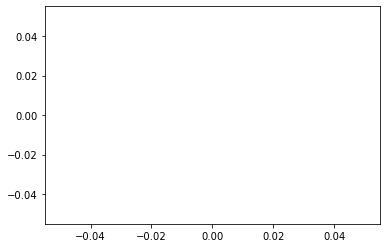

In [226]:
plt.plot(room.mic_array.signals[0])

In [23]:
room.mic_array.signals.shape

(6, 16000)

In [184]:
import math

target_angle = math.atan2(target_loc[1] - mic_mid[1], target_loc[0] - mic_mid[0]) * 180 / np.pi
if target_angle < 0:
    target_angle = 360 + target_angle
print(target_angle)

230.25368957763868


In [169]:
room.mic_array.signals = room.mic_array.signals[:, :16000]

In [44]:
import pyroomacoustics as pra
from pyroomacoustics.doa import circ_dist

# algorithms parameters
fs = 16000  # sampling frequency
nfft = 256  # FFT size
c = 343.0
freq_bins = np.arange(5, 60)
algo_names = sorted(pra.doa.algorithms.keys())
algo_names = algo_names[2:6]

#R = pra.circular_2D_array(room_dim / 2, 6, 0.0, 0.04)
R = mic_locs

x_sg, sr = torchaudio.load('0_sample.wav')


X_sg = np.array(
    [
        pra.transform.stft.analysis(signal, nfft, nfft // 2).T
        for signal in x_sg
    ]
)

for algo_name in algo_names:
    # Construct the new DOA object
    # the max_four parameter is necessary for FRIDA only
    doa = pra.doa.algorithms[algo_name](R, fs, nfft, c=c, max_four=4, num_src=3)

    # this call here perform localization on the frames in X
    doa.locate_sources(X_sg, freq_bins=freq_bins)

    # doa.azimuth_recon contains the reconstructed location of the source
    print(algo_name)
    print("  Recovered azimuth:", doa.azimuth_recon / np.pi * 180.0, "degrees")
    #print("  Error:", circ_dist(azimuth, doa.azimuth_recon) / np.pi * 180.0, "degrees")
        

MUSIC
  Recovered azimuth: [243. 302.   9.] degrees
NormMUSIC
  Recovered azimuth: [301.   7.   4.] degrees
SRP
  Recovered azimuth: [315.] degrees
TOPS
  Recovered azimuth: [168.   3. 302.] degrees


In [172]:
112.94834677474198 116.23421653404706 - 352.41492493743067

torch.Size([6, 16000])